In [60]:
from mmpose.apis import Pose2DInferencer, init_model
import cv2

import pandas as pd
from tqdm import tqdm
import gc
from operator import add
import torch
import numpy as np

In [6]:
cv2.__version__

'4.8.0'

In [7]:
#torch.backends.cudnn.benchmark = False

In [62]:
inferencer = Pose2DInferencer(device='cuda',
    model='cspnext-m_udp_8xb64-210e_coco-wholebody-256x192',
    det_model='yolox_tiny_8x8_300e_coco',
    det_cat_ids=[0],  # the category id of 'human' class
)

09/06 10:54:58 - mmengine - WARNING - The current default scope "mmdet" is not "mmpose", `init_default_scope` will force set the currentdefault scope to "mmpose".
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmpose/v1/projects/rtmposev1/rtmpose-l_simcc-coco-wholebody_pt-aic-coco_270e-256x192-6f206314_20230124.pth
09/06 10:54:59 - mmengine - WARNING - The current default scope "mmpose" is not "mmdet", `init_default_scope` will force set the currentdefault scope to "mmdet".
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_tiny_8x8_300e_coco/yolox_tiny_8x8_300e_coco_20211124_171234-b4047906.pth


In [14]:
#inferencer = Pose2DInferencer('wholebody', device='cuda')

In [ ]:
result_generator = inferencer('webcam', show=True, return_vis = True,return_datasample=False)
#cv2.destroyAllWindows()
#cv2.waitKey(0)
#cv2.destroyAllWindows()
#cv2.waitKey(1)
#result = next(result_generator)
results = [result for result in result_generator]
cv2.destroyAllWindows()

In [16]:
result_generator = inferencer('demo.jpg', show=True, return_vis = True,return_datasample=False,wait_time=5)
#cv2.destroyAllWindows()
#cv2.waitKey(0)
#cv2.destroyAllWindows()
#cv2.waitKey(1)
#result = next(result_generator)
#results = [result for result in result_generator]
#cv2.destroyAllWindows()
#result_generator = inferencer('demo2.jpg', show=True, return_vis = True,return_datasample=False,wait_time=5)
result = next(result_generator)
cv2.destroyAllWindows()

Output()

In [17]:
result['visualization'][0]

array([[[  0,  34,  59],
        [  0,  34,  59],
        [  1,  35,  60],
        ...,
        [  0,  33,  58],
        [  0,  33,  58],
        [  0,  33,  58]],

       [[  1,  35,  60],
        [  1,  35,  60],
        [  2,  36,  61],
        ...,
        [  0,  33,  58],
        [  0,  33,  58],
        [  0,  33,  58]],

       [[  3,  37,  62],
        [  3,  37,  62],
        [  3,  37,  62],
        ...,
        [  0,  33,  58],
        [  0,  33,  58],
        [  0,  33,  58]],

       ...,

       [[ 95,  74,  69],
        [ 94,  74,  67],
        [ 92,  71,  66],
        ...,
        [  2,   2,   2],
        [  1,   1,   1],
        [  0,   0,   0]],

       [[103,  84,  80],
        [ 99,  80,  74],
        [ 95,  76,  72],
        ...,
        [  2,   2,   2],
        [  1,   1,   1],
        [  0,   0,   0]],

       [[102,  84,  80],
        [ 98,  80,  76],
        [ 95,  76,  72],
        ...,
        [  2,   2,   2],
        [  1,   1,   1],
        [  0,   0,   0]]

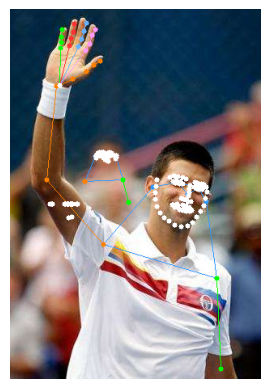

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming the given data is stored in the variable 'data'
image_array = result['visualization'][0]

# Display the image using Matplotlib
plt.imshow(image_array, cmap='gray')
plt.axis('off')  # Hide the axis ticks and labels
plt.show()

In [19]:
# Assuming the given data is stored in the variable 'data'
image_array = result['visualization'][0]
bgr_image = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)

# Display the image using OpenCV
cv2.imshow('Color Image', bgr_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
# Open the video file
#video_path = 0
cap = cv2.VideoCapture("file://media/kristian/HDD/ASL_Citizen/ASL_Citizen/videos/0023159093449660606-CAFETERIA.mp4")
#cap = cv2.VideoCapture(0)

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        result_generator = inferencer(frame, show=False, return_vis = True,return_datasample=False)
        result = next(result_generator)
        image_array = cv2.cvtColor(result['visualization'][0], cv2.COLOR_RGB2BGR)
        # Display the annotated frame
        cv2.imshow("CspNext Inference", image_array)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()

In [21]:
result['predictions'][0][0]['keypoints']

[[368.7641296386719, 206.7529537677765],
 [389.24383227030444, 189.88731575012207],
 [335.03285471598304, 186.2732504606247],
 [409.7235349019368, 228.43734550476074],
 [285.6406307220459, 226.02796864509583],
 [472.3673311869304, 371.7952686548233],
 [235.0437183380127, 392.2749719619751],
 [525.3736203511555, 512.743814945221],
 [210.9499505360921, 498.28755378723145],
 [366.35475285847986, 407.93592154979706],
 [339.8516082763672, 593.4579397439957],
 [428.9985491434734, 324.8124198913574],
 [292.86876106262207, 336.859304189682],
 [598.8596121470134, 435.6437554359436],
 [137.46395874023438, 311.5608471632004],
 [345.8750502268473, 428.41562485694885],
 [351.8984921773275, 424.8015595674515],
 [348.2844270070394, 458.5328356027603],
 [598.8596121470134, 428.41562485694885],
 [137.46395874023438, 422.39218270778656],
 [137.46395874023438, 200.7295116186142],
 [255.52342096964514, 427.2109364271164],
 [598.8596121470134, 421.1874942779541],
 [290.45938428243005, 204.34357690811157],


In [22]:
np.array(result['predictions'][0][0]['keypoints']).shape

(133, 2)

In [61]:
def extract_keypoints_from_file(filepath):
    # Open the video file
    cap = cv2.VideoCapture(filepath)

    # Initialize an empty list to store the keypoints for each frame
    keypoints = []

    # Loop through the frames of the video
    while cap.isOpened():
        # Read a frame from the video
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame,(640,480))
        result_generator = inferencer(frame, show=False, return_vis = False,return_datasample=False)
        result = next(result_generator)
        # Extract the keypoints from the YOLO results object
        if np.array(result['predictions'][0][0]['keypoints']).shape == (133, 2):
            keypoint = np.array(result['predictions'][0][0]['keypoints']).flatten()
            keypoint = np.append(np.array(result['predictions'][0][0]['keypoint_scores']),keypoint)
        else:
            keypoint = np.zeros(399)

        # Append the keypoints to the list
        keypoints.append(keypoint)
        gc.collect()
        torch.cuda.empty_cache()
    # Release the video capture object and the YOLO model
    cap.release()

    # Convert the keypoints list to a NumPy array
    return np.array(keypoints)


In [62]:
def extract_keypoints_from_file_flip(filepath):
    # Open the video file
    cap = cv2.VideoCapture(filepath)

    # Initialize an empty list to store the keypoints for each frame
    keypoints = []

    # Loop through the frames of the video
    while cap.isOpened():
        # Read a frame from the video
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.flip(frame, 1)
        frame = cv2.resize(frame,(640,480))
        result_generator = inferencer(frame, show=False, return_vis = False,return_datasample=False)
        result = next(result_generator)
        # Extract the keypoints from the YOLO results object
        if np.array(result['predictions'][0][0]['keypoints']).shape == (133, 2):
            keypoint = np.array(result['predictions'][0][0]['keypoints']).flatten()
            keypoint = np.append(np.array(result['predictions'][0][0]['keypoint_scores']),keypoint)
        else:
            keypoint = np.zeros(399)

        # Append the keypoints to the list
        keypoints.append(keypoint)
        gc.collect()
        torch.cuda.empty_cache()
    # Release the video capture object and the YOLO model
    cap.release()

    # Convert the keypoints list to a NumPy array
    return np.array(keypoints)

In [ ]:
result_generator = inferencer('webcam',
                              show=True, return_vis = True,return_datasample=False,
                              )
results = [result for result in result_generator]
cv2.destroyAllWindows()

In [ ]:
test = extract_keypoints_from_file('file://media/kristian/HDD/ASL_Citizen/ASL_Citizen/videos/0023159093449660606-CAFETERIA.mp4')

In [ ]:
test_flip = extract_keypoints_from_file_flip('file://media/kristian/HDD/ASL_Citizen/ASL_Citizen/videos/0023159093449660606-CAFETERIA.mp4')

In [28]:
test[0]

array([9.19722855e-01, 9.18537438e-01, 9.25077319e-01, 8.25981200e-01,
       8.67071986e-01, 7.73584723e-01, 8.62794638e-01, 6.95110321e-01,
       4.78880286e-01, 2.13661492e-01, 1.75549924e-01, 1.82081327e-01,
       1.90482736e-01, 1.21674821e-01, 1.62808910e-01, 2.19400316e-01,
       7.85566121e-02, 6.15017451e-02, 1.19206011e-01, 1.18448868e-01,
       6.90567791e-02, 7.47043490e-02, 8.29189569e-02, 9.62446332e-01,
       9.73889709e-01, 1.00415611e+00, 1.00584197e+00, 1.00702953e+00,
       1.03141439e+00, 1.05152750e+00, 1.03633893e+00, 1.05816031e+00,
       1.07293963e+00, 1.06585741e+00, 1.05069852e+00, 1.01893640e+00,
       9.83252645e-01, 9.63908434e-01, 9.54297245e-01, 9.53059077e-01,
       9.75260377e-01, 9.94429827e-01, 1.00931573e+00, 9.95362282e-01,
       9.71587956e-01, 9.67489958e-01, 9.78986442e-01, 9.73830700e-01,
       9.66215074e-01, 9.62828994e-01, 9.91789758e-01, 9.85573530e-01,
       1.00018048e+00, 1.02013934e+00, 9.97766018e-01, 1.00275457e+00,
      

In [29]:
test_flip[0]

array([9.17213917e-01, 9.24520850e-01, 9.14957583e-01, 8.60036612e-01,
       8.14568996e-01, 8.62151980e-01, 7.62968183e-01, 4.47844177e-01,
       6.75890565e-01, 2.00479209e-01, 2.18123704e-01, 1.69560418e-01,
       1.78532451e-01, 1.78201571e-01, 1.20475203e-01, 6.62609190e-02,
       2.31806248e-01, 7.30969906e-02, 6.86154813e-02, 7.82907158e-02,
       6.43739551e-02, 1.02299161e-01, 1.08313352e-01, 9.54276860e-01,
       9.54159856e-01, 9.63353395e-01, 9.81949329e-01, 1.03084803e+00,
       1.05536413e+00, 1.07066083e+00, 1.07707977e+00, 1.04269111e+00,
       1.04462516e+00, 1.05802107e+00, 1.04476666e+00, 1.01680422e+00,
       9.99643624e-01, 1.00083220e+00, 9.74252820e-01, 9.61780190e-01,
       9.58216548e-01, 9.67471361e-01, 9.79676127e-01, 9.83761311e-01,
       9.67074752e-01, 9.68690038e-01, 1.00252569e+00, 1.01455736e+00,
       9.96881485e-01, 9.79582548e-01, 9.99086022e-01, 9.92591977e-01,
       1.00592375e+00, 1.02614152e+00, 9.93898392e-01, 9.99223471e-01,
      

In [30]:
test.shape

(55, 399)

In [63]:
def signvideodataframe(filepath):
    # Read the CSV file into a DataFrame
    df = pd.read_csv(filepath)

    # Define the path to the videos directory
    #path = 'file:///media/kristian/HDD/ASL_Citizen/ASL_Citizen/videos/'
    path = 'file:///home/kristian/ASL_Citizen/videos/'
    # Create a 'Path' column by concatenating the path with 'Video file' column
    df['Path'] = path + df['Video file']
    
    # Calculate the frequency of each gloss and create a 'frequency' column
    df['Frequency'] = df['Gloss'].map(df['Gloss'].value_counts())

    # Sort the DataFrame by the 'Gloss' column
    df = df.sort_values(by='Gloss')

    # Reset the index of the DataFrame
    df = df.reset_index(drop=True)

    return df

In [64]:
#traindf = signvideodataframe('file:///media/kristian/HDD/ASL_Citizen/ASL_Citizen/splits/train.csv')
traindf = signvideodataframe('file:///home/kristian/ASL_Citizen/splits/train.csv')

In [65]:
traindf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
0,P31,3827306090663467-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/38273...,15
1,P37,16792698524451422-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/16792...,15
2,P11,6868778695018762-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/68687...,15
3,P11,6870709051348651-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/68707...,15
4,P50,0719792557216079-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/07197...,15


In [34]:
traindf.tail()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
40149,P37,9716493262876276-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/97164...,15
40150,P31,7550572181460327-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/75505...,15
40151,P46,47985881750082227-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/47985...,15
40152,P50,04671245574824856-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/04671...,15
40153,P51,19959052532136146-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/19959...,15


In [66]:
traindf['Path'][100]

'file:///home/kristian/ASL_Citizen/videos/44951093832888867-seedABOUT.mp4'

In [36]:
# Open the video file
#video_path = 0
cap = cv2.VideoCapture(traindf['Path'][100])
#cap = cv2.VideoCapture(0)

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        result_generator = inferencer(frame, show=False, return_vis = True,return_datasample=False)
        result = next(result_generator)
        image_array = cv2.cvtColor(result['visualization'][0], cv2.COLOR_RGB2BGR)
        # Display the annotated frame
        cv2.imshow("CspNext Inference", image_array)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()

[ERROR:0@162.844] global cap.cpp:164 open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.8.0) /io/opencv/modules/videoio/src/cap_images.cpp:267: error: (-215:Assertion failed) number < max_number in function 'icvExtractPattern'




In [37]:
traindf.sample(20)

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
4906,P34,560166013298945-CALM.mp4,CALM,G_03_004,file:///home/kristian/ASL_Citizen/videos/56016...,15
19954,P50,8764090475491726-LET GO.mp4,LETGO,F_02_034,file:///home/kristian/ASL_Citizen/videos/87640...,16
7195,P29,07588203589424691-COMMITTEE.mp4,COMMITTEE,J_03_072,file:///home/kristian/ASL_Citizen/videos/07588...,15
26478,P29,18740575650265412-POLISH.mp4,POLISH,J_01_086,file:///home/kristian/ASL_Citizen/videos/18740...,13
15195,P27,5944117496827583-GRADE.mp4,GRADE,F_02_076,file:///home/kristian/ASL_Citizen/videos/59441...,13
19695,P16,9102691480954739-LEAD.mp4,LEAD,J_01_046,file:///home/kristian/ASL_Citizen/videos/91026...,14
14783,P11,5671687081581385-GLOVES 3.mp4,GLOVES2,K_01_012,file:///home/kristian/ASL_Citizen/videos/56716...,15
10651,P38,48122052630834244-DUCK.mp4,DUCK2,D_01_079,file:///home/kristian/ASL_Citizen/videos/48122...,17
679,P7,006406596782399188-ALL GONE.mp4,ALLGONE,J_03_021,file:///home/kristian/ASL_Citizen/videos/00640...,15
17017,P31,09935677141288357-HOLD.mp4,HOLD1,F_02_080,file:///home/kristian/ASL_Citizen/videos/09935...,14


In [67]:
traindf = traindf[traindf['Frequency'] > 17]
traindf = traindf.reset_index(drop=True)

In [39]:
traindf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
0,P52,07157565148825373-seedAXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/07157...,19
1,P28,7179300005186042-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/71793...,19
2,P29,16216064841959765-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/16216...,19
3,P37,6193814382865199-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/61938...,19
4,P40,5947453960317015-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/59474...,19


In [40]:
traindf.tail()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
945,P50,9161417844146778-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/91614...,20
946,P14,00930662603221255-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/00930...,20
947,P27,82063651021682-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/82063...,20
948,P40,5268072837528903-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/52680...,20
949,P40,6363286086951516-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/63632...,20


In [41]:
traindf.describe()

,Frequency
count,950.000000
mean,19.082105
std,1.316026
min,18.000000
25%,18.000000
50%,19.000000
75%,20.000000
max,24.000000


In [68]:
traindf['Gloss'].nunique()

50

In [69]:
words = traindf['Gloss'].unique()
words

array(['AXE1', 'BACKPACK1', 'BASKETBALL1', 'BEE1', 'BELT1', 'BITE1',
       'BREAKFAST1', 'CANCER1', 'CHRISTMAS1', 'CONFUSED1', 'DARK1',
       'DEAF1', 'DECIDE1', 'DEMAND1', 'DEVELOP1', 'DINNER1', 'DOG1',
       'DOWNSIZE1', 'DRAG1', 'EAT1', 'EDIT1', 'ELEVATOR1', 'FINE1',
       'FLOAT1', 'FOREIGNER1', 'GUESS1', 'HALLOWEEN1', 'HOSPITAL1',
       'HURDLE/TRIP1', 'JEWELRY', 'KNIGHT1', 'LOCK1', 'LUNCH1', 'MAPLE',
       'MEAT1', 'MECHANIC1', 'MICROSCOPE1', 'MOVIE1', 'NOON1', 'PARTY1',
       'PATIENT2', 'RAZOR2', 'RIVER1', 'ROCKINGCHAIR1', 'SHAVE1', 'SINK',
       'SQUEEZE', 'THEY1', 'TWINS1', 'WHATFOR1'], dtype=object)

In [70]:
#valdf = signvideodataframe('file:///media/kristian/HDD/ASL_Citizen/ASL_Citizen/splits/val.csv') 
valdf = signvideodataframe('file:///home/kristian/ASL_Citizen/splits/val.csv') 

In [71]:
valdf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
0,P26,22595012150860327-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/22595...,3
1,P39,7421622940519235-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/74216...,3
2,P21,686738356933241-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/68673...,3
3,P12,9219095671540121-5 DOLLARS.mp4,5DOLLARS,B_01_062,file:///home/kristian/ASL_Citizen/videos/92190...,4
4,P21,1448188216215387-5 DOLLARS.mp4,5DOLLARS,B_01_062,file:///home/kristian/ASL_Citizen/videos/14481...,4


In [46]:
valdf.tail()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
10299,P21,6959326205750493-ZOOM IN.mp4,ZOOMIN,B_02_056,file:///home/kristian/ASL_Citizen/videos/69593...,3
10300,P12,7758716133684984-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/77587...,4
10301,P39,844134294032034-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/84413...,4
10302,P21,5548062993721732-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/55480...,4
10303,P26,19366754134806952-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/19366...,4


In [72]:
#testdf = signvideodataframe('file:///media/kristian/HDD/ASL_Citizen/ASL_Citizen/splits/test.csv')
testdf = signvideodataframe('file:///home/kristian/ASL_Citizen/splits/test.csv')

In [48]:
testdf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
0,P18,23521769221811684-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/23521...,13
1,P42,023931338852502426-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/02393...,13
2,P49,4893817008748198-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/48938...,13
3,P17,13991818149960333-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/13991...,13
4,P49,34625615110480457-1 DOLLAR.mp4,1DOLLAR,C_02_025,file:///home/kristian/ASL_Citizen/videos/34625...,13


In [49]:
testdf.tail()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
32936,P18,4320702510886756-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/43207...,13
32937,P9,7676354653247301-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/76763...,13
32938,P47,5386272465310649-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/53862...,13
32939,P18,738440364224181-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/73844...,13
32940,P17,9953298353288469-ZOOM OFF.mp4,ZOOMOFF,D_01_057,file:///home/kristian/ASL_Citizen/videos/99532...,13


In [73]:
valdf = valdf[valdf['Gloss'].isin(words)]
valdf = valdf.reset_index(drop=True)

In [51]:
valdf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
0,P39,19778675091674147-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/19778...,4
1,P26,8581142177964065-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/85811...,4
2,P39,3877478645046861-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/38774...,4
3,P21,8521417940364975-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/85214...,4
4,P5,9990244640190733-BACKPACK.mp4,BACKPACK1,G_03_091,file:///home/kristian/ASL_Citizen/videos/99902...,3


In [52]:
valdf.tail()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
186,P26,032677896012150764-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/03267...,5
187,P5,6523145816470133-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/65231...,5
188,P39,0283886564670357-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/02838...,5
189,P21,6142521746642153-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/61425...,5
190,P12,06408604416165864-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/06408...,5


In [74]:
valdf['Gloss'].nunique()

50

In [54]:
valdf.describe()

,Frequency
count,191.000000
mean,3.963351
std,0.770316
min,3.000000
25%,3.000000
50%,4.000000
75%,4.000000
max,6.000000


In [55]:
valdf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
0,P39,19778675091674147-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/19778...,4
1,P26,8581142177964065-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/85811...,4
2,P39,3877478645046861-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/38774...,4
3,P21,8521417940364975-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/85214...,4
4,P5,9990244640190733-BACKPACK.mp4,BACKPACK1,G_03_091,file:///home/kristian/ASL_Citizen/videos/99902...,3


In [75]:
testdf = testdf[testdf['Gloss'].isin(words)]
testdf = testdf.reset_index(drop=True)

In [57]:
testdf['Gloss'].nunique()

50

In [76]:
testdf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
0,P15,33721516025652254-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/33721...,15
1,P47,519067006979435-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/51906...,15
2,P35,5104381603195376-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/51043...,15
3,P42,44458614013793873-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/44458...,15
4,P42,9604797909481075-AXE.mp4,AXE1,G_03_066,file:///home/kristian/ASL_Citizen/videos/96047...,15


In [59]:
testdf.tail()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency
724,P42,3448123355846451-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/34481...,18
725,P47,034046510887022485-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/03404...,18
726,P22,9359050586202402-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/93590...,18
727,P42,2748457214117681-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/27484...,18
728,P15,540014801916062-WHAT FOR.mp4,WHATFOR1,C_02_054,file:///home/kristian/ASL_Citizen/videos/54001...,18


In [60]:
testdf.describe()

,Frequency
count,729.000000
mean,14.978052
std,2.229192
min,9.000000
25%,14.000000
50%,15.000000
75%,16.000000
max,20.000000


In [77]:
traindf['Gloss'] = traindf['Gloss'].str.replace('\d+', '',regex=True)
valdf['Gloss'] = valdf['Gloss'].str.replace('\d+', '',regex=True)
testdf['Gloss'] = testdf['Gloss'].str.replace('\d+', '',regex=True)

In [78]:
words = traindf['Gloss'].unique()
words

array(['AXE', 'BACKPACK', 'BASKETBALL', 'BEE', 'BELT', 'BITE',
       'BREAKFAST', 'CANCER', 'CHRISTMAS', 'CONFUSED', 'DARK', 'DEAF',
       'DECIDE', 'DEMAND', 'DEVELOP', 'DINNER', 'DOG', 'DOWNSIZE', 'DRAG',
       'EAT', 'EDIT', 'ELEVATOR', 'FINE', 'FLOAT', 'FOREIGNER', 'GUESS',
       'HALLOWEEN', 'HOSPITAL', 'HURDLE/TRIP', 'JEWELRY', 'KNIGHT',
       'LOCK', 'LUNCH', 'MAPLE', 'MEAT', 'MECHANIC', 'MICROSCOPE',
       'MOVIE', 'NOON', 'PARTY', 'PATIENT', 'RAZOR', 'RIVER',
       'ROCKINGCHAIR', 'SHAVE', 'SINK', 'SQUEEZE', 'THEY', 'TWINS',
       'WHATFOR'], dtype=object)

In [79]:
words = valdf['Gloss'].unique()
words

array(['AXE', 'BACKPACK', 'BASKETBALL', 'BEE', 'BELT', 'BITE',
       'BREAKFAST', 'CANCER', 'CHRISTMAS', 'CONFUSED', 'DARK', 'DEAF',
       'DECIDE', 'DEMAND', 'DEVELOP', 'DINNER', 'DOG', 'DOWNSIZE', 'DRAG',
       'EAT', 'EDIT', 'ELEVATOR', 'FINE', 'FLOAT', 'FOREIGNER', 'GUESS',
       'HALLOWEEN', 'HOSPITAL', 'HURDLE/TRIP', 'JEWELRY', 'KNIGHT',
       'LOCK', 'LUNCH', 'MAPLE', 'MEAT', 'MECHANIC', 'MICROSCOPE',
       'MOVIE', 'NOON', 'PARTY', 'PATIENT', 'RAZOR', 'RIVER',
       'ROCKINGCHAIR', 'SHAVE', 'SINK', 'SQUEEZE', 'THEY', 'TWINS',
       'WHATFOR'], dtype=object)

In [80]:
words = testdf['Gloss'].unique()
words

array(['AXE', 'BACKPACK', 'BASKETBALL', 'BEE', 'BELT', 'BITE',
       'BREAKFAST', 'CANCER', 'CHRISTMAS', 'CONFUSED', 'DARK', 'DEAF',
       'DECIDE', 'DEMAND', 'DEVELOP', 'DINNER', 'DOG', 'DOWNSIZE', 'DRAG',
       'EAT', 'EDIT', 'ELEVATOR', 'FINE', 'FLOAT', 'FOREIGNER', 'GUESS',
       'HALLOWEEN', 'HOSPITAL', 'HURDLE/TRIP', 'JEWELRY', 'KNIGHT',
       'LOCK', 'LUNCH', 'MAPLE', 'MEAT', 'MECHANIC', 'MICROSCOPE',
       'MOVIE', 'NOON', 'PARTY', 'PATIENT', 'RAZOR', 'RIVER',
       'ROCKINGCHAIR', 'SHAVE', 'SINK', 'SQUEEZE', 'THEY', 'TWINS',
       'WHATFOR'], dtype=object)

In [81]:
print(traindf['Gloss'].nunique())
print(valdf['Gloss'].nunique())
print(testdf['Gloss'].nunique())

50
50
50


In [ ]:
extract_keypoints_from_file(traindf['Path'][0]).shape

In [ ]:
type(extract_keypoints_from_file(traindf.Path[0]))

In [68]:
cap = cv2.VideoCapture(traindf.Path[0])
length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print( length )

100


In [69]:
cap = cv2.VideoCapture(traindf.Path[0])
frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
length = round(frames / fps)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(frames)
print(fps)
print( length )
print(width)
print(height)

100
31
3
640
480


In [70]:
traindf.count()

Participant ID    950
Video file        950
Gloss             950
ASL-LEX Code      950
Path              950
Frequency         950
dtype: int64

In [82]:
def frames_from_file(filepath):
    cap = cv2.VideoCapture(filepath)
    frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    length = round(frames / fps)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    return frames, fps, length, width, height

In [72]:
frames_from_file(traindf.Path[643])

(83, 29, 3, 640, 480)

In [73]:
tqdm.pandas()
traindf[['Frames', 'FPS', 'Length', 'Width', 'Height']] = traindf['Path'].progress_apply(lambda x: pd.Series(frames_from_file(x)))

100%|█████████████████████████████████████████| 950/950 [00:15<00:00, 61.01it/s]


In [74]:
traindf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height
0,P52,07157565148825373-seedAXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/07157...,19,100,31,3,640,480
1,P28,7179300005186042-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/71793...,19,81,30,3,640,480
2,P29,16216064841959765-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/16216...,19,47,30,2,640,480
3,P37,6193814382865199-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/61938...,19,67,30,2,640,480
4,P40,5947453960317015-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/59474...,19,89,30,3,640,480


In [75]:
traindf['Frames'].max()

540

In [76]:
traindf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,950.000000,950.000000,950.000000,950.000000,950.000000,950.000000
mean,19.082105,87.755789,29.354737,3.016842,641.347368,480.252632
std,1.316026,46.654745,2.197195,1.568167,20.731496,3.887155
min,18.000000,25.000000,11.000000,1.000000,640.000000,480.000000
25%,18.000000,60.000000,29.000000,2.000000,640.000000,480.000000
50%,19.000000,77.000000,30.000000,3.000000,640.000000,480.000000
75%,20.000000,97.000000,30.000000,3.000000,640.000000,480.000000
max,24.000000,540.000000,31.000000,18.000000,960.000000,540.000000


In [77]:
traindf = traindf[(traindf['Length'] > 1) & (traindf['FPS'] > 28) &(traindf['Frames'] < 131) ]
#filtered_df = traindf[(traindf['Frames'] > 0) & (traindf['Frames'] < 121)]
#filtered_df = traindf[traindf['Frames'] > 0]
traindf= traindf.reset_index(drop=True)
traindf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,804.000000,804.000000,804.000000,804.000000,804.000000,804.000000
mean,19.084577,76.113184,29.680348,2.593284,641.592040,480.298507
std,1.305343,20.091965,0.479790,0.671427,22.528858,4.224161
min,18.000000,45.000000,29.000000,2.000000,640.000000,480.000000
25%,18.000000,60.000000,29.000000,2.000000,640.000000,480.000000
50%,19.000000,74.000000,30.000000,2.000000,640.000000,480.000000
75%,20.000000,88.000000,30.000000,3.000000,640.000000,480.000000
max,24.000000,130.000000,31.000000,4.000000,960.000000,540.000000


In [78]:
traindf['Frequency'] = traindf['Gloss'].map(traindf['Gloss'].value_counts())
#traindf = traindf.sort_values(by='Frequency',)

traindf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,804.000000,804.000000,804.000000,804.000000,804.000000,804.000000
mean,16.261194,76.113184,29.680348,2.593284,641.592040,480.298507
std,1.722009,20.091965,0.479790,0.671427,22.528858,4.224161
min,13.000000,45.000000,29.000000,2.000000,640.000000,480.000000
25%,15.000000,60.000000,29.000000,2.000000,640.000000,480.000000
50%,16.000000,74.000000,30.000000,2.000000,640.000000,480.000000
75%,17.000000,88.000000,30.000000,3.000000,640.000000,480.000000
max,20.000000,130.000000,31.000000,4.000000,960.000000,540.000000


In [79]:
traindf.head(10)

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height
0,P52,07157565148825373-seedAXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/07157...,18,100,31,3,640,480
1,P28,7179300005186042-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/71793...,18,81,30,3,640,480
2,P29,16216064841959765-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/16216...,18,47,30,2,640,480
3,P37,6193814382865199-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/61938...,18,67,30,2,640,480
4,P40,5947453960317015-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/59474...,18,89,30,3,640,480
5,P40,929570016067665-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/92957...,18,112,29,4,640,480
6,P16,904767261814883-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/90476...,18,64,30,2,640,480
7,P43,016134052760367945-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/01613...,18,75,30,2,640,480
8,P40,23099527328070546-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/23099...,18,91,29,3,640,480
9,P37,21310388087265242-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/21310...,18,69,30,2,640,480


In [80]:
print(traindf['Gloss'].nunique())

50


In [81]:
tqdm.pandas()
valdf[['Frames', 'FPS', 'Length', 'Width', 'Height']] = valdf['Path'].progress_apply(lambda x: pd.Series(frames_from_file(x)))

100%|█████████████████████████████████████████| 191/191 [00:03<00:00, 50.66it/s]


In [82]:
valdf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height
0,P39,19778675091674147-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/19778...,4,121,30,4,640,480
1,P26,8581142177964065-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/85811...,4,81,29,3,640,480
2,P39,3877478645046861-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/38774...,4,120,30,4,640,480
3,P21,8521417940364975-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/85214...,4,71,29,2,640,480
4,P5,9990244640190733-BACKPACK.mp4,BACKPACK,G_03_091,file:///home/kristian/ASL_Citizen/videos/99902...,3,93,29,3,640,480


In [83]:
valdf['Frames'].max()

207

In [84]:
valdf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,191.000000,191.000000,191.000000,191.000000,191.0,191.0
mean,3.963351,88.905759,29.706806,3.000000,640.0,480.0
std,0.770316,36.214006,0.456423,1.248157,0.0,0.0
min,3.000000,37.000000,29.000000,1.000000,640.0,480.0
25%,3.000000,61.500000,29.000000,2.000000,640.0,480.0
50%,4.000000,76.000000,30.000000,3.000000,640.0,480.0
75%,4.000000,117.500000,30.000000,4.000000,640.0,480.0
max,6.000000,207.000000,30.000000,7.000000,640.0,480.0


In [85]:
valdf = valdf[(valdf['Length'] > 1) & (valdf['FPS'] > 28) &(valdf['Frames'] < 131) ]
#filtered_df = traindf[(traindf['Frames'] > 0) & (traindf['Frames'] < 121)]
#filtered_df = traindf[traindf['Frames'] > 0]
valdf = valdf.reset_index(drop=True)
valdf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,162.000000,162.000000,162.000000,162.000000,162.0,162.0
mean,3.993827,78.203704,29.691358,2.623457,640.0,480.0
std,0.760001,23.787397,0.463365,0.772311,0.0,0.0
min,3.000000,45.000000,29.000000,2.000000,640.0,480.0
25%,3.000000,59.250000,29.000000,2.000000,640.0,480.0
50%,4.000000,71.500000,30.000000,2.000000,640.0,480.0
75%,4.000000,92.000000,30.000000,3.000000,640.0,480.0
max,6.000000,130.000000,30.000000,4.000000,640.0,480.0


In [86]:
valdf['Frequency'] = valdf['Gloss'].map(valdf['Gloss'].value_counts())
#valdf = valdf.sort_values(by='Frequency',)

valdf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,162.000000,162.000000,162.000000,162.000000,162.0,162.0
mean,3.506173,78.203704,29.691358,2.623457,640.0,480.0
std,0.907162,23.787397,0.463365,0.772311,0.0,0.0
min,2.000000,45.000000,29.000000,2.000000,640.0,480.0
25%,3.000000,59.250000,29.000000,2.000000,640.0,480.0
50%,4.000000,71.500000,30.000000,2.000000,640.0,480.0
75%,4.000000,92.000000,30.000000,3.000000,640.0,480.0
max,5.000000,130.000000,30.000000,4.000000,640.0,480.0


In [87]:
valdf.tail(60)

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height
102,P12,2553847483769758-LUNCH.mp4,LUNCH,G_02_081,file:///home/kristian/ASL_Citizen/videos/25538...,4,58,30,2,640,480
103,P12,5796656512680336-LUNCH.mp4,LUNCH,G_02_081,file:///home/kristian/ASL_Citizen/videos/57966...,4,65,30,2,640,480
104,P5,5530107164077924-LUNCH.mp4,LUNCH,G_02_081,file:///home/kristian/ASL_Citizen/videos/55301...,4,78,30,3,640,480
105,P21,07736207797943306-LUNCH.mp4,LUNCH,G_02_081,file:///home/kristian/ASL_Citizen/videos/07736...,4,56,29,2,640,480
106,P26,2560023931191153-MAPLE.mp4,MAPLE,H_03_064,file:///home/kristian/ASL_Citizen/videos/25600...,2,82,30,3,640,480
107,P21,7629092396207264-MAPLE.mp4,MAPLE,H_03_064,file:///home/kristian/ASL_Citizen/videos/76290...,2,76,29,3,640,480
108,P39,6940052288653344-MEAT.mp4,MEAT,D_02_022,file:///home/kristian/ASL_Citizen/videos/69400...,3,120,30,4,640,480
109,P21,23447000304598498-MEAT.mp4,MEAT,D_02_022,file:///home/kristian/ASL_Citizen/videos/23447...,3,64,29,2,640,480
110,P26,46170617189439445-MEAT.mp4,MEAT,D_02_022,file:///home/kristian/ASL_Citizen/videos/46170...,3,85,30,3,640,480
111,P26,424117143455232-MECHANIC.mp4,MECHANIC,A_03_030,file:///home/kristian/ASL_Citizen/videos/42411...,2,97,30,3,640,480


In [88]:
valdf.head(10)

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height
0,P39,19778675091674147-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/19778...,4,121,30,4,640,480
1,P26,8581142177964065-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/85811...,4,81,29,3,640,480
2,P39,3877478645046861-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/38774...,4,120,30,4,640,480
3,P21,8521417940364975-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/85214...,4,71,29,2,640,480
4,P5,9990244640190733-BACKPACK.mp4,BACKPACK,G_03_091,file:///home/kristian/ASL_Citizen/videos/99902...,3,93,29,3,640,480
5,P39,4985293038019454-BACKPACK.mp4,BACKPACK,G_03_091,file:///home/kristian/ASL_Citizen/videos/49852...,3,128,30,4,640,480
6,P21,20198961584817-BACKPACK.mp4,BACKPACK,G_03_091,file:///home/kristian/ASL_Citizen/videos/20198...,3,48,30,2,640,480
7,P5,8423017864044668-BASKETBALL.mp4,BASKETBALL,A_03_045,file:///home/kristian/ASL_Citizen/videos/84230...,5,90,30,3,640,480
8,P39,6251993314243527-BASKETBALL.mp4,BASKETBALL,A_03_045,file:///home/kristian/ASL_Citizen/videos/62519...,5,127,30,4,640,480
9,P26,6152714959604932-BASKETBALL.mp4,BASKETBALL,A_03_045,file:///home/kristian/ASL_Citizen/videos/61527...,5,60,30,2,640,480


In [89]:
valdf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,162.000000,162.000000,162.000000,162.000000,162.0,162.0
mean,3.506173,78.203704,29.691358,2.623457,640.0,480.0
std,0.907162,23.787397,0.463365,0.772311,0.0,0.0
min,2.000000,45.000000,29.000000,2.000000,640.0,480.0
25%,3.000000,59.250000,29.000000,2.000000,640.0,480.0
50%,4.000000,71.500000,30.000000,2.000000,640.0,480.0
75%,4.000000,92.000000,30.000000,3.000000,640.0,480.0
max,5.000000,130.000000,30.000000,4.000000,640.0,480.0


In [90]:
print(valdf['Gloss'].nunique())

50


In [91]:
tqdm.pandas()
testdf[['Frames', 'FPS', 'Length', 'Width', 'Height']] = testdf['Path'].progress_apply(lambda x: pd.Series(frames_from_file(x)))

100%|█████████████████████████████████████████| 729/729 [00:16<00:00, 44.57it/s]


In [92]:
testdf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height
0,P15,33721516025652254-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/33721...,15,196,29,7,640,480
1,P47,519067006979435-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/51906...,15,102,26,4,640,480
2,P35,5104381603195376-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/51043...,15,70,29,2,640,480
3,P42,44458614013793873-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/44458...,15,57,30,2,960,540
4,P42,9604797909481075-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/96047...,15,66,30,2,960,540


In [93]:
testdf['Frames'].max()

234

In [94]:
testdf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000
mean,14.978052,75.192044,28.696845,2.624143,684.334705,488.312757
std,2.229192,27.848864,3.113689,1.003439,110.626974,20.742558
min,9.000000,10.000000,14.000000,0.000000,640.000000,480.000000
25%,14.000000,56.000000,29.000000,2.000000,640.000000,480.000000
50%,15.000000,73.000000,30.000000,3.000000,640.000000,480.000000
75%,16.000000,90.000000,30.000000,3.000000,640.000000,480.000000
max,20.000000,234.000000,31.000000,8.000000,960.000000,540.000000


In [95]:
testdf = testdf[(testdf['Length'] > 1) & (testdf['FPS'] > 28) &(testdf['Frames'] < 131) ]
#filtered_df = traindf[(traindf['Frames'] > 0) & (traindf['Frames'] < 121)]
#filtered_df = traindf[traindf['Frames'] > 0]
testdf = testdf.reset_index(drop=True)
testdf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000
mean,15.014981,77.256554,29.702247,2.619850,688.539326,489.101124
std,2.217904,19.420007,0.526337,0.670792,114.896647,21.543121
min,9.000000,45.000000,29.000000,2.000000,640.000000,480.000000
25%,14.000000,61.000000,29.000000,2.000000,640.000000,480.000000
50%,15.000000,75.000000,30.000000,3.000000,640.000000,480.000000
75%,16.000000,91.000000,30.000000,3.000000,640.000000,480.000000
max,20.000000,130.000000,31.000000,4.000000,960.000000,540.000000


In [96]:
testdf['Frequency'] = testdf['Gloss'].map(testdf['Gloss'].value_counts())
#testdf = testdf.sort_values(by='Frequency',)

testdf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000
mean,11.254682,77.256554,29.702247,2.619850,688.539326,489.101124
std,2.311308,19.420007,0.526337,0.670792,114.896647,21.543121
min,5.000000,45.000000,29.000000,2.000000,640.000000,480.000000
25%,10.000000,61.000000,29.000000,2.000000,640.000000,480.000000
50%,12.000000,75.000000,30.000000,3.000000,640.000000,480.000000
75%,13.000000,91.000000,30.000000,3.000000,640.000000,480.000000
max,15.000000,130.000000,31.000000,4.000000,960.000000,540.000000


In [97]:
testdf.tail(60)

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height
474,P9,5911137084980156-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/59111...,12,110,29,4,640,480
475,P35,5887689273566759-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/58876...,12,92,30,3,640,480
476,P48,6621939724418062-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/66219...,12,80,30,3,640,480
477,P17,09709454810039175-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/09709...,12,76,31,2,640,480
478,P42,3588759801071051-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/35887...,12,86,30,3,960,540
479,P35,4608324102845509-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/46083...,12,87,30,3,640,480
480,P6,37779347947817365-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/37779...,12,57,29,2,640,480
481,P35,5403299092715226-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/54032...,12,60,30,2,640,480
482,P47,4814760954431352-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/48147...,12,102,30,3,640,480
483,P22,4185420608277408-SHAVE.mp4,SHAVE,J_02_018,file:///home/kristian/ASL_Citizen/videos/41854...,12,59,30,2,640,480


In [98]:
testdf.head(10)

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height
0,P35,5104381603195376-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/51043...,11,70,29,2,640,480
1,P42,44458614013793873-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/44458...,11,57,30,2,960,540
2,P42,9604797909481075-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/96047...,11,66,30,2,960,540
3,P9,30728048195204827-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/30728...,11,96,30,3,640,480
4,P6,28522130623160047-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/28522...,11,54,29,2,640,480
5,P6,9169591255818932-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/91695...,11,59,30,2,640,480
6,P17,7135244799398011-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/71352...,11,82,30,3,640,480
7,P49,23228935359891456-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/23228...,11,94,30,3,640,480
8,P22,5872128462194921-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/58721...,11,53,30,2,640,480
9,P35,3681922148149226-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/36819...,11,77,30,3,640,480


In [99]:
testdf.describe()

,Frequency,Frames,FPS,Length,Width,Height
count,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000
mean,11.254682,77.256554,29.702247,2.619850,688.539326,489.101124
std,2.311308,19.420007,0.526337,0.670792,114.896647,21.543121
min,5.000000,45.000000,29.000000,2.000000,640.000000,480.000000
25%,10.000000,61.000000,29.000000,2.000000,640.000000,480.000000
50%,12.000000,75.000000,30.000000,3.000000,640.000000,480.000000
75%,13.000000,91.000000,30.000000,3.000000,640.000000,480.000000
max,15.000000,130.000000,31.000000,4.000000,960.000000,540.000000


In [100]:
print(testdf['Gloss'].nunique())

50


In [ ]:
keypoints_series = traindf['Path'].progress_apply(extract_keypoints_from_file)
np.save("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/train_keypoints.npy", keypoints_series)
keypoints_series = traindf['Path'].progress_apply(extract_keypoints_from_file_flip)
np.save("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/train_keypoints_flip.npy", keypoints_series)
keypoints_series = testdf['Path'].progress_apply(extract_keypoints_from_file)
np.save("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/test_keypoints.npy", keypoints_series)
keypoints_series = testdf['Path'].progress_apply(extract_keypoints_from_file_flip)
np.save("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/test_keypoints_flip.npy", keypoints_series)
keypoints_series = valdf['Path'].progress_apply(extract_keypoints_from_file)
np.save("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/val_keypoints.npy", keypoints_series)
keypoints_series = valdf['Path'].progress_apply(extract_keypoints_from_file_flip)
np.save("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/val_keypoints_flip.npy", keypoints_series)

# Preprocessing

In [83]:
import numpy as np
train_keypoints=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/train_keypoints.npy",allow_pickle=True)
val_keypoints =np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/val_keypoints.npy",allow_pickle=True)
test_keypoints=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/test_keypoints.npy",allow_pickle=True)

print('Training Keypoints Shape:', train_keypoints.shape)
print('Validation Kepoints Shape:', val_keypoints.shape)
print('Test Keypoints Shape:',test_keypoints.shape)

Training Keypoints Shape: (804,)
Validation Kepoints Shape: (162,)
Test Keypoints Shape: (534,)


In [84]:
train_keypoints_flip=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/train_keypoints_flip.npy",allow_pickle=True)
val_keypoints_flip =np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/val_keypoints_flip.npy",allow_pickle=True)
test_keypoints_flip=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/test_keypoints_flip.npy",allow_pickle=True)

print('Training Keypoints Shape:', train_keypoints_flip.shape)
print('Validation Kepoints Shape:', val_keypoints_flip.shape)
print('Test Keypoints Shape:',test_keypoints_flip.shape)

Training Keypoints Shape: (804,)
Validation Kepoints Shape: (162,)
Test Keypoints Shape: (534,)


In [85]:
max_len=130

In [86]:
# Create a padded array to store keypoints
keypoints_np = np.zeros((len(train_keypoints), max_len, 399))

# Iterate through keypoints_series and fill keypoints_np with pre-padding
for i, keypoints in enumerate(train_keypoints):
    keypoints_len = min(keypoints.shape[0], max_len)
    padding_len = max_len - keypoints_len
    keypoints_np[i, padding_len:, :] = keypoints[:keypoints_len, :]
    
train_keypoints = keypoints_np
print('Training Keypoints Shape:', train_keypoints.shape)

Training Keypoints Shape: (804, 130, 399)


In [87]:
# Create a padded array to store keypoints
keypoints_np = np.zeros((len(val_keypoints), max_len, 399))

# Iterate through keypoints_series and fill keypoints_np with pre-padding
for i, keypoints in enumerate(val_keypoints):
    keypoints_len = min(keypoints.shape[0], max_len)
    padding_len = max_len - keypoints_len
    keypoints_np[i, padding_len:, :] = keypoints[:keypoints_len, :]
    
val_keypoints = keypoints_np
print('Validation Keypoints Shape:', val_keypoints.shape)

Validation Keypoints Shape: (162, 130, 399)


In [88]:
# Create a padded array to store keypoints
keypoints_np = np.zeros((len(test_keypoints), max_len, 399))

# Iterate through keypoints_series and fill keypoints_np with pre-padding
for i, keypoints in enumerate(test_keypoints):
    keypoints_len = min(keypoints.shape[0], max_len)
    padding_len = max_len - keypoints_len
    keypoints_np[i, padding_len:, :] = keypoints[:keypoints_len, :]
    
test_keypoints = keypoints_np
print('Test Keypoints Shape:', test_keypoints.shape)

Test Keypoints Shape: (534, 130, 399)


In [89]:
# Create a padded array to store keypoints
keypoints_np = np.zeros((len(train_keypoints_flip), max_len, 399))

# Iterate through keypoints_series and fill keypoints_np with pre-padding
for i, keypoints in enumerate(train_keypoints_flip):
    keypoints_len = min(keypoints.shape[0], max_len)
    padding_len = max_len - keypoints_len
    keypoints_np[i, padding_len:, :] = keypoints[:keypoints_len, :]
    
train_keypoints_flip = keypoints_np
print('Training Keypoints Shape:', train_keypoints_flip.shape)

Training Keypoints Shape: (804, 130, 399)


In [90]:
# Create a padded array to store keypoints
keypoints_np = np.zeros((len(val_keypoints_flip), max_len, 399))

# Iterate through keypoints_series and fill keypoints_np with pre-padding
for i, keypoints in enumerate(val_keypoints_flip):
    keypoints_len = min(keypoints.shape[0], max_len)
    padding_len = max_len - keypoints_len
    keypoints_np[i, padding_len:, :] = keypoints[:keypoints_len, :]
    
val_keypoints_flip = keypoints_np
print('Validation Keypoints Shape:', val_keypoints_flip.shape)

Validation Keypoints Shape: (162, 130, 399)


In [91]:
# Create a padded array to store keypoints
keypoints_np = np.zeros((len(test_keypoints_flip), max_len, 399))

# Iterate through keypoints_series and fill keypoints_np with pre-padding
for i, keypoints in enumerate(test_keypoints_flip):
    keypoints_len = min(keypoints.shape[0], max_len)
    padding_len = max_len - keypoints_len
    keypoints_np[i, padding_len:, :] = keypoints[:keypoints_len, :]
    
test_keypoints_flip = keypoints_np
print('Test Keypoints Shape:', test_keypoints_flip.shape)

Test Keypoints Shape: (534, 130, 399)


In [92]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from keras.utils import to_categorical
import numpy as np
#from keras.preprocessing.sequence import pad_sequences

In [111]:
traindf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height
0,P52,07157565148825373-seedAXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/07157...,18,100,31,3,640,480
1,P28,7179300005186042-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/71793...,18,81,30,3,640,480
2,P29,16216064841959765-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/16216...,18,47,30,2,640,480
3,P37,6193814382865199-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/61938...,18,67,30,2,640,480
4,P40,5947453960317015-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/59474...,18,89,30,3,640,480


In [112]:
encoder = OrdinalEncoder()

In [113]:
traindf['Cat_label'] = encoder.fit_transform(traindf[['Gloss']]).astype(int)
traindf = traindf.sort_values(by='Gloss',)

In [114]:
traindf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height,Cat_label
0,P52,07157565148825373-seedAXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/07157...,18,100,31,3,640,480,0
17,P37,29360158406046777-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/29360...,18,73,30,2,640,480,0
16,P27,053394218351220823-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/05339...,18,52,29,2,640,480,0
15,P40,10598328043940142-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/10598...,18,81,29,3,640,480,0
14,P50,3937261764308986-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/39372...,18,72,30,2,640,480,0


In [115]:
traindf.tail()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height,Cat_label
789,P40,6445331634562388-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/64453...,16,89,30,3,640,480,49
788,P37,6237575353180616-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/62375...,16,56,30,2,640,480,49
802,P40,5268072837528903-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/52680...,16,92,29,3,640,480,49
794,P37,16185522171162914-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/16185...,16,64,30,2,640,480,49
803,P40,6363286086951516-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/63632...,16,65,29,2,640,480,49


In [116]:
valdf['Cat_label'] = encoder.fit_transform(valdf[['Gloss']]).astype(int)
valdf = valdf.sort_values(by='Gloss',)

In [117]:
valdf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height,Cat_label
0,P39,19778675091674147-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/19778...,4,121,30,4,640,480,0
1,P26,8581142177964065-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/85811...,4,81,29,3,640,480,0
2,P39,3877478645046861-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/38774...,4,120,30,4,640,480,0
3,P21,8521417940364975-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/85214...,4,71,29,2,640,480,0
4,P5,9990244640190733-BACKPACK.mp4,BACKPACK,G_03_091,file:///home/kristian/ASL_Citizen/videos/99902...,3,93,29,3,640,480,1


In [118]:
valdf.tail()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height,Cat_label
159,P39,0283886564670357-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/02838...,5,121,30,4,640,480,49
160,P21,6142521746642153-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/61425...,5,57,30,2,640,480,49
157,P26,032677896012150764-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/03267...,5,81,29,3,640,480,49
158,P5,6523145816470133-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/65231...,5,116,30,4,640,480,49
161,P12,06408604416165864-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/06408...,5,71,30,2,640,480,49


In [119]:
testdf['Cat_label'] = encoder.fit_transform(testdf[['Gloss']]).astype(int)
testdf = testdf.sort_values(by='Gloss',)

In [120]:
testdf.head()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height,Cat_label
0,P35,5104381603195376-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/51043...,11,70,29,2,640,480,0
1,P42,44458614013793873-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/44458...,11,57,30,2,960,540,0
2,P42,9604797909481075-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/96047...,11,66,30,2,960,540,0
3,P9,30728048195204827-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/30728...,11,96,30,3,640,480,0
4,P6,28522130623160047-AXE.mp4,AXE,G_03_066,file:///home/kristian/ASL_Citizen/videos/28522...,11,54,29,2,640,480,0


In [121]:
testdf.tail()

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height,Cat_label
522,P6,6734748834983595-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/67347...,13,66,29,2,640,480,49
521,P17,33051835760678294-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/33051...,13,52,31,2,640,480,49
532,P42,2748457214117681-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/27484...,13,74,30,2,960,540,49
526,P42,9684934734400592-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/96849...,13,89,30,3,960,540,49
533,P15,540014801916062-WHAT FOR.mp4,WHATFOR,C_02_054,file:///home/kristian/ASL_Citizen/videos/54001...,13,79,29,3,640,480,49


In [93]:
label_map = {label:num for num, label in enumerate(traindf['Gloss'].unique())}

In [94]:
label_map

{'AXE': 0,
 'BACKPACK': 1,
 'BASKETBALL': 2,
 'BEE': 3,
 'BELT': 4,
 'BITE': 5,
 'BREAKFAST': 6,
 'CANCER': 7,
 'CHRISTMAS': 8,
 'CONFUSED': 9,
 'DARK': 10,
 'DEAF': 11,
 'DECIDE': 12,
 'DEMAND': 13,
 'DEVELOP': 14,
 'DINNER': 15,
 'DOG': 16,
 'DOWNSIZE': 17,
 'DRAG': 18,
 'EAT': 19,
 'EDIT': 20,
 'ELEVATOR': 21,
 'FINE': 22,
 'FLOAT': 23,
 'FOREIGNER': 24,
 'GUESS': 25,
 'HALLOWEEN': 26,
 'HOSPITAL': 27,
 'HURDLE/TRIP': 28,
 'JEWELRY': 29,
 'KNIGHT': 30,
 'LOCK': 31,
 'LUNCH': 32,
 'MAPLE': 33,
 'MEAT': 34,
 'MECHANIC': 35,
 'MICROSCOPE': 36,
 'MOVIE': 37,
 'NOON': 38,
 'PARTY': 39,
 'PATIENT': 40,
 'RAZOR': 41,
 'RIVER': 42,
 'ROCKINGCHAIR': 43,
 'SHAVE': 44,
 'SINK': 45,
 'SQUEEZE': 46,
 'THEY': 47,
 'TWINS': 48,
 'WHATFOR': 49}

In [95]:
inv_label_map = {v: k for k, v in label_map.items()}

In [125]:
inv_label_map

{0: 'AXE',
 1: 'BACKPACK',
 2: 'BASKETBALL',
 3: 'BEE',
 4: 'BELT',
 5: 'BITE',
 6: 'BREAKFAST',
 7: 'CANCER',
 8: 'CHRISTMAS',
 9: 'CONFUSED',
 10: 'DARK',
 11: 'DEAF',
 12: 'DECIDE',
 13: 'DEMAND',
 14: 'DEVELOP',
 15: 'DINNER',
 16: 'DOG',
 17: 'DOWNSIZE',
 18: 'DRAG',
 19: 'EAT',
 20: 'EDIT',
 21: 'ELEVATOR',
 22: 'FINE',
 23: 'FLOAT',
 24: 'FOREIGNER',
 25: 'GUESS',
 26: 'HALLOWEEN',
 27: 'HOSPITAL',
 28: 'HURDLE/TRIP',
 29: 'JEWELRY',
 30: 'KNIGHT',
 31: 'LOCK',
 32: 'LUNCH',
 33: 'MAPLE',
 34: 'MEAT',
 35: 'MECHANIC',
 36: 'MICROSCOPE',
 37: 'MOVIE',
 38: 'NOON',
 39: 'PARTY',
 40: 'PATIENT',
 41: 'RAZOR',
 42: 'RIVER',
 43: 'ROCKINGCHAIR',
 44: 'SHAVE',
 45: 'SINK',
 46: 'SQUEEZE',
 47: 'THEY',
 48: 'TWINS',
 49: 'WHATFOR'}

In [126]:
inv_label_map[0]

'AXE'

In [127]:
traindf.sample(10)

,Participant ID,Video file,Gloss,ASL-LEX Code,Path,Frequency,Frames,FPS,Length,Width,Height,Cat_label
328,P37,3878260902223658-EAT.mp4,EAT,B_02_002,file:///home/kristian/ASL_Citizen/videos/38782...,14,51,30,2,640,480,19
508,P31,7892179183511641-LOCK.mp4,LOCK,H_02_017,file:///home/kristian/ASL_Citizen/videos/78921...,14,94,29,3,640,480,31
466,P16,7664642326742872-HURDLE-TRIP.mp4,HURDLE/TRIP,G_01_036,file:///home/kristian/ASL_Citizen/videos/76646...,17,56,30,2,640,480,28
101,P1,7809503445047001-BREAKFAST.mp4,BREAKFAST,J_01_053,file:///home/kristian/ASL_Citizen/videos/78095...,18,77,30,3,640,480,6
412,P40,9825690623317844-GUESS.mp4,GUESS,D_02_013,file:///home/kristian/ASL_Citizen/videos/98256...,15,72,30,2,640,480,25
112,P7,8518237171580363-BREAKFAST.mp4,BREAKFAST,J_01_053,file:///home/kristian/ASL_Citizen/videos/85182...,18,80,30,3,640,480,6
578,P31,4328181527879751-MECHANIC.mp4,MECHANIC,A_03_030,file:///home/kristian/ASL_Citizen/videos/43281...,16,84,30,3,640,480,35
650,P50,156048761492376-PATIENT 2.mp4,PATIENT,B_01_085,file:///home/kristian/ASL_Citizen/videos/15604...,15,72,30,2,640,480,40
229,P31,9079367190714687-DEMAND.mp4,DEMAND,D_03_080,file:///home/kristian/ASL_Citizen/videos/90793...,16,75,30,2,640,480,13
467,P40,6219112771870119-HURDLE-TRIP.mp4,HURDLE/TRIP,G_01_036,file:///home/kristian/ASL_Citizen/videos/62191...,17,77,30,3,640,480,28


In [128]:
Ytrain = encoder.fit_transform(traindf[['Gloss']])
Ytest = encoder.fit_transform(testdf[['Gloss']])
Yval = encoder.fit_transform(valdf[['Gloss']])

In [129]:
np.save("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/train_labels_array_1D.npy", Ytrain)
np.save("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/test_labels_array_1D.npy", Ytest)
np.save("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/val_labels_array_1D.npy", Yval)

In [96]:
Ytrain=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/train_labels_array_1D.npy")
Ytest=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/test_labels_array_1D.npy")
Yval=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/val_labels_array_1D.npy")
Ytrain_flip=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/train_labels_array_1D.npy")
Ytest_flip=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/test_labels_array_1D.npy")
Yval_flip=np.load("/home/kristian/Capstone/keypoints/ASL_Citizen/CSPnext/val_labels_array_1D.npy")


In [97]:
Xtrain = train_keypoints
Xtest = test_keypoints
Xval = val_keypoints
Xtrain_flip = train_keypoints_flip
Xtest_flip = test_keypoints_flip
Xval_flip = val_keypoints_flip

In [98]:
Xval = val_keypoints
Xval_flip = val_keypoints_flip

In [99]:
n_classes = 50
print("Shape before one-hot encoding: ", Ytrain.shape)
Ytrain = to_categorical(Ytrain, n_classes)
print("Shape after one-hot encoding: ", Ytrain.shape)
print("Shape before one-hot encoding: ", Ytest.shape)
Ytest = to_categorical(Ytest, n_classes)
print("Shape after one-hot encoding: ", Ytest.shape)
print("Shape before one-hot encoding: ", Yval.shape)
Yval = to_categorical(Yval, n_classes)
print("Shape after one-hot encoding: ", Yval.shape)
print("Shape before one-hot encoding: ", Ytrain_flip.shape)
Ytrain_flip = to_categorical(Ytrain_flip, n_classes)
print("Shape after one-hot encoding: ", Ytrain_flip.shape)
print("Shape before one-hot encoding: ", Ytest_flip.shape)
Ytest_flip = to_categorical(Ytest_flip, n_classes)
print("Shape after one-hot encoding: ", Ytest_flip.shape)
print("Shape before one-hot encoding: ", Yval_flip.shape)
Yval_flip = to_categorical(Yval_flip, n_classes)
print("Shape after one-hot encoding: ", Yval_flip.shape)

Shape before one-hot encoding:  (804, 1)
Shape after one-hot encoding:  (804, 50)
Shape before one-hot encoding:  (534, 1)
Shape after one-hot encoding:  (534, 50)
Shape before one-hot encoding:  (162, 1)
Shape after one-hot encoding:  (162, 50)
Shape before one-hot encoding:  (804, 1)
Shape after one-hot encoding:  (804, 50)
Shape before one-hot encoding:  (534, 1)
Shape after one-hot encoding:  (534, 50)
Shape before one-hot encoding:  (162, 1)
Shape after one-hot encoding:  (162, 50)


In [100]:
type(Ytrain)

numpy.ndarray

In [101]:
Ytrain.shape

(804, 50)

In [10]:
X_train, X_test, Y_train, Y_test = train_test_split(X, 
                                                    Y,
                                                    test_size=0.2,
                                                    random_state=10)

In [102]:
Xtrain = np.concatenate((Xtrain, Xtest,Xtrain_flip,Xtest_flip), axis=0)
print(Xtrain.shape)
Ytrain = np.concatenate((Ytrain, Ytest, Ytrain_flip, Ytest_flip), axis=0)
print(Ytrain.shape)

(2676, 130, 399)
(2676, 50)


In [103]:
Xval.shape

(162, 130, 399)

In [104]:
Xval_flip.shape

(162, 130, 399)

In [105]:
Xval = np.concatenate((Xval, Xval_flip), axis=0)
print(Xval.shape)
Yval = np.concatenate((Yval, Yval_flip), axis=0)
print(Yval.shape)

(324, 130, 399)
(324, 50)


In [140]:
print(Xtrain.shape)
Xval.shape

(2676, 130, 399)


(324, 130, 399)

In [106]:
import numpy as np

# Calculate the sparsity
num_zero_values = np.count_nonzero(Xtrain == 0)
total_values = Xtrain.size

sparsity = num_zero_values / total_values

print(f"Sparsity: {sparsity:.2%}")

Sparsity: 41.10%


In [107]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, MaxAbsScaler, Normalizer

#scaletrain = np.concatenate((Xtrain, Xval), axis=0)
#num_samples, num_frames, num_keypoints = scaletrain.shape
#scaletrain = scaletrain.reshape(num_samples, -1)

num_samples, num_frames, num_keypoints = Xtrain.shape
Xtrain = Xtrain.reshape(num_samples, -1)

# Create a MinMaxScaler
#scaler = StandardScaler()
#scaler = Normalizer(norm='l2')
scaler = MaxAbsScaler()

#scaler.fit(scaletrain)
scaler.fit(Xtrain)
# Fit and transform the data
Xtrain = scaler.transform(Xtrain)

# Reshape the scaled data back to the original shape
Xtrain = Xtrain.reshape(num_samples, num_frames, num_keypoints)

In [108]:
num_samples, num_frames, num_keypoints = Xval.shape
Xval = Xval.reshape(num_samples, -1)

# Fit and transform the data
Xval = scaler.transform(Xval)

# Reshape the scaled data back to the original shape
Xval = Xval.reshape(num_samples, num_frames, num_keypoints)

In [109]:
num_samples, num_frames, num_keypoints = Xval_flip.shape
Xval_flip = Xval_flip.reshape(num_samples, -1)

# Fit and transform the data
Xval_flip = scaler.transform(Xval_flip)

# Reshape the scaled data back to the original shape
Xval_flip = Xval_flip.reshape(num_samples, num_frames, num_keypoints)

In [145]:
dum = Xval.reshape(num_samples,-1)
dum.shape

(162, 103740)

In [110]:
Xtrain.shape

(2676, 130, 399)

In [147]:
X_train, X_test, Y_train, Y_test = train_test_split(input_data_scaled,
                                                    Y,
                                                    test_size=0.,
                                                    random_state=10)

NameError: name 'input_data_scaled' is not defined

In [111]:
print(Xtrain.shape)
Xtest.shape

(2676, 130, 399)


(534, 130, 399)

In [112]:
print(Ytrain.shape)
Ytest.shape

(2676, 50)


(534, 50)

In [113]:
Xtrain

array([[[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.91958868,  0.92974823,  0.93220932, ...,  0.7722404 ,
          0.1042105 ,  0.76703893],
        [ 0.91978571,  0.92445097,  0.92643472, ...,  0.77459191,
          0.10417073,  0.76668809],
        [ 0.92015144,  0.92409164,  0.92320841, ...,  0.77556884,
          0.10754215,  0.76620177]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.91272948,  0.93885547,  0.95148304, ...,  

In [151]:
Ytrain

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [152]:
Yval.shape

(324, 50)

In [153]:
Xval.shape

(324, 130, 399)

# Model

In [114]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, GRU
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, Activation
from tensorflow.keras.callbacks import TensorBoard
import tensorflow as tf
from keras.utils.vis_utils import plot_model
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.optimizers import Adam ,Adagrad, Adadelta, SGD, Nadam
import os
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from keras.utils.vis_utils import plot_model
from tensorflow.keras.utils import get_custom_objects
import matplotlib.pyplot as plt
import visualkeras
from PIL import ImageFont

In [115]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)
tf.random.set_seed(100)

In [116]:
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    for device in physical_devices:
        tf.config.experimental.set_memory_growth(device, True)

In [117]:
def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))

In [118]:
get_custom_objects().update({'mish': mish})

## Hyperparameter Tuning 1 LSTM Layer

In [119]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, GRU
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','elu','gelu','relu'],default='selu')
        model = Sequential()
        model.add(LSTM(units=hp.Int('units_1',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=False,
                      input_shape=self.input_shape,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer_1',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.0,max_value=0.9,default=0.65,step=0.05,)))
        model.add(Dense(units=hp.Int('units_2',min_value=70,max_value=120,step=10,default=80),activation=act_function))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.0,max_value=0.9,default=0.7,step=0.05,)))

        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.0005)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

/tmp/ipykernel_1754845/3904456553.py:5: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [120]:
HYPERBAND_MAX_EPOCHS = 300
#MAX_TRIALS = 20
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/',
    project_name='1_LSTM',
    overwrite=False)

2023-09-08 22:45:50.144623: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-08 22:45:51.472322: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1739 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


In [121]:
tuner.search_space_summary()

Search space summary
Default search space size: 7
dense_activation (Choice)
{'default': 'selu', 'conditions': [], 'values': ['selu', 'mish', 'elu', 'gelu', 'relu'], 'ordered': False}
units_1 (Int)
{'default': 100, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
regularizer_1 (Float)
{'default': 0.001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
dropout_1 (Float)
{'default': 0.65, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_2 (Int)
{'default': 80, 'conditions': [], 'min_value': 70, 'max_value': 120, 'step': 10, 'sampling': 'linear'}
dropout_2 (Float)
{'default': 0.7, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
learning_rate (Float)
{'default': 0.0005, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}


In [122]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [123]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [124]:
tuner.search(Xtrain, Ytrain, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 02m 16s]
val_f1_score: 0.0011976048117503524

Best val_f1_score So Far: 0.5806974470615387
Total elapsed time: 11h 07m 50s
INFO:tensorflow:Oracle triggered exit


In [125]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/1_LSTM
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0427 summary
Hyperparameters:
dense_activation: elu
units_1: 125
regularizer_1: 0.0001880895482273795
dropout_1: 0.30000000000000004
units_2: 70
dropout_2: 0.05
learning_rate: 0.00024203632250928224
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 5
tuner/round: 5
tuner/trial_id: 0423
Score: 0.5806974470615387

Trial 0700 summary
Hyperparameters:
dense_activation: relu
units_1: 200
regularizer_1: 0.00022419548935667316
dropout_1: 0.25
units_2: 80
dropout_2: 0.1
learning_rate: 0.00017051882988302358
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 0693
Score: 0.5669972598552704

Trial 0598 summary
Hyperparameters:
dense_activation: gelu
units_1: 200
regularizer_1: 0.0005716024863895304
dropout_1: 0.15000000000000002
units_2: 120
dropout_2: 0.4
learning_rate: 0.000183126412610

In [126]:
best_model = tuner.get_best_models(num_models=3)[0]

In [127]:
loss, accuracy = best_model.evaluate(Xval, Yval)

11/11 [==============================] - 2s 156ms/step - loss: 2.2577 - f1_score: 0.5901


In [128]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 1s 13ms/step - loss: 0.1129 - f1_score: 0.9890


In [129]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 125)               262500    
                                                                 
 dropout (Dropout)           (None, 125)               0         
                                                                 
 dense (Dense)               (None, 70)                8820      
                                                                 
 dropout_1 (Dropout)         (None, 70)                0         
                                                                 
 dense_1 (Dense)             (None, 50)                3550      
                                                                 
Total params: 274,870
Trainable params: 274,870
Non-trainable params: 0
_________________________________________________________________


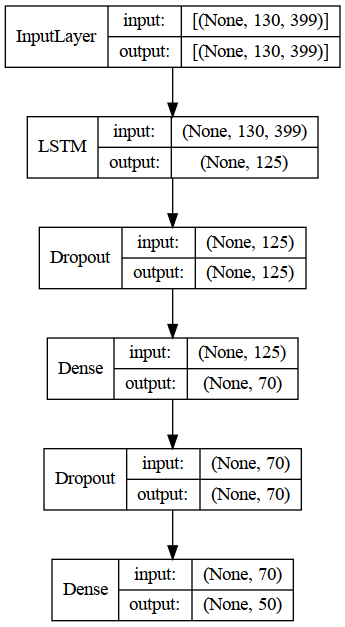

In [130]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

In [131]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(best_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 11ms/step
              precision    recall  f1-score   support

         AXE      0.833     0.625     0.714         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      0.727     0.800     0.762        10
         BEE      0.400     0.200     0.267        10
        BELT      0.600     0.750     0.667         4
        BITE      0.000     0.000     0.000         8
   BREAKFAST      0.429     0.500     0.462         6
      CANCER      1.000     0.875     0.933         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      0.625     0.833     0.714         6
        DARK      0.667     1.000     0.800         4
        DEAF      0.111     0.167     0.133         6
      DECIDE      1.000     0.500     0.667         6
      DEMAND      0.750     0.750     0.750         8
     DEVELOP      0.500     0.500     0.500         6
      DINNER      0.750     0.375     0.500         8
         DOG      0.556    

In [132]:
bestHP = tuner.get_best_hyperparameters(num_trials=10)[0]

In [133]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 LSTM/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [134]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - ETA: 0s - loss: 4.0426 - f1_score: 0.0166

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 24s 763ms/step - loss: 4.0426 - f1_score: 0.0166 - val_loss: 4.0121 - val_f1_score: 0.0032
Epoch 2/500
28/28 [==============================] - 2s 62ms/step - loss: 4.0145 - f1_score: 0.0162 - val_loss: 4.0032 - val_f1_score: 0.0017
Epoch 3/500
28/28 [==============================] - ETA: 0s - loss: 4.0083 - f1_score: 0.0119

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 329ms/step - loss: 4.0083 - f1_score: 0.0119 - val_loss: 3.9995 - val_f1_score: 0.0100
Epoch 4/500
28/28 [==============================] - 2s 62ms/step - loss: 3.9944 - f1_score: 0.0133 - val_loss: 3.9950 - val_f1_score: 0.0031
Epoch 5/500
28/28 [==============================] - 2s 62ms/step - loss: 3.9896 - f1_score: 0.0137 - val_loss: 3.9885 - val_f1_score: 0.0083
Epoch 6/500
28/28 [==============================] - 2s 62ms/step - loss: 3.9820 - f1_score: 0.0105 - val_loss: 3.9959 - val_f1_score: 0.0065
Epoch 7/500
28/28 [==============================] - 2s 65ms/step - loss: 3.9618 - f1_score: 0.0134 - val_loss: 3.9710 - val_f1_score: 0.0089
Epoch 8/500
28/28 [==============================] - 2s 62ms/step - loss: 3.9465 - f1_score: 0.0176 - val_loss: 3.9536 - val_f1_score: 0.0050
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 3.9162 - f1_score: 0.0202

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 357ms/step - loss: 3.9142 - f1_score: 0.0205 - val_loss: 3.8941 - val_f1_score: 0.0113
Epoch 10/500
28/28 [==============================] - ETA: 0s - loss: 3.8490 - f1_score: 0.0176

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 361ms/step - loss: 3.8490 - f1_score: 0.0176 - val_loss: 3.8128 - val_f1_score: 0.0132
Epoch 11/500
28/28 [==============================] - ETA: 0s - loss: 3.7760 - f1_score: 0.0267

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 324ms/step - loss: 3.7760 - f1_score: 0.0267 - val_loss: 3.7141 - val_f1_score: 0.0239
Epoch 12/500
28/28 [==============================] - 2s 64ms/step - loss: 3.6917 - f1_score: 0.0335 - val_loss: 3.6445 - val_f1_score: 0.0216
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 3.6200 - f1_score: 0.0455

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 338ms/step - loss: 3.6200 - f1_score: 0.0455 - val_loss: 3.6071 - val_f1_score: 0.0292
Epoch 14/500
28/28 [==============================] - 2s 63ms/step - loss: 3.5261 - f1_score: 0.0524 - val_loss: 3.4351 - val_f1_score: 0.0236
Epoch 15/500
28/28 [==============================] - 2s 64ms/step - loss: 3.4744 - f1_score: 0.0545 - val_loss: 3.3876 - val_f1_score: 0.0283
Epoch 16/500
28/28 [==============================] - ETA: 0s - loss: 3.3767 - f1_score: 0.0734

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 11s 419ms/step - loss: 3.3767 - f1_score: 0.0734 - val_loss: 3.3136 - val_f1_score: 0.0448
Epoch 17/500
28/28 [==============================] - ETA: 0s - loss: 3.2977 - f1_score: 0.0742

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 349ms/step - loss: 3.2977 - f1_score: 0.0742 - val_loss: 3.2142 - val_f1_score: 0.0453
Epoch 18/500
28/28 [==============================] - ETA: 0s - loss: 3.2211 - f1_score: 0.0978

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 375ms/step - loss: 3.2211 - f1_score: 0.0978 - val_loss: 3.1328 - val_f1_score: 0.0833
Epoch 19/500
28/28 [==============================] - ETA: 0s - loss: 3.1260 - f1_score: 0.1101

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 368ms/step - loss: 3.1260 - f1_score: 0.1101 - val_loss: 3.0926 - val_f1_score: 0.1211
Epoch 20/500
28/28 [==============================] - 2s 62ms/step - loss: 3.0649 - f1_score: 0.1136 - val_loss: 3.0034 - val_f1_score: 0.1082
Epoch 21/500
28/28 [==============================] - ETA: 0s - loss: 2.9886 - f1_score: 0.1292

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 347ms/step - loss: 2.9886 - f1_score: 0.1292 - val_loss: 3.0219 - val_f1_score: 0.1248
Epoch 22/500
28/28 [==============================] - 2s 66ms/step - loss: 2.9156 - f1_score: 0.1361 - val_loss: 3.0147 - val_f1_score: 0.1134
Epoch 23/500
28/28 [==============================] - ETA: 0s - loss: 2.8564 - f1_score: 0.1457

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 365ms/step - loss: 2.8564 - f1_score: 0.1457 - val_loss: 2.8967 - val_f1_score: 0.1404
Epoch 24/500
28/28 [==============================] - 2s 62ms/step - loss: 2.8163 - f1_score: 0.1442 - val_loss: 3.0067 - val_f1_score: 0.1260
Epoch 25/500
28/28 [==============================] - 2s 63ms/step - loss: 2.7748 - f1_score: 0.1630 - val_loss: 2.8414 - val_f1_score: 0.1375
Epoch 26/500
27/28 [===========================>..] - ETA: 0s - loss: 2.7005 - f1_score: 0.1879

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 323ms/step - loss: 2.6897 - f1_score: 0.1902 - val_loss: 2.7545 - val_f1_score: 0.1550
Epoch 27/500
28/28 [==============================] - ETA: 0s - loss: 2.6024 - f1_score: 0.1983

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 385ms/step - loss: 2.6024 - f1_score: 0.1983 - val_loss: 2.7124 - val_f1_score: 0.1622
Epoch 28/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5887 - f1_score: 0.2055

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 341ms/step - loss: 2.5904 - f1_score: 0.2048 - val_loss: 2.6505 - val_f1_score: 0.1658
Epoch 29/500
28/28 [==============================] - ETA: 0s - loss: 2.5485 - f1_score: 0.2057

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 332ms/step - loss: 2.5485 - f1_score: 0.2057 - val_loss: 2.8092 - val_f1_score: 0.1665
Epoch 30/500
28/28 [==============================] - ETA: 0s - loss: 2.4928 - f1_score: 0.2132

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 361ms/step - loss: 2.4928 - f1_score: 0.2132 - val_loss: 2.6148 - val_f1_score: 0.1754
Epoch 31/500
28/28 [==============================] - 2s 63ms/step - loss: 2.4388 - f1_score: 0.2466 - val_loss: 2.6846 - val_f1_score: 0.1506
Epoch 32/500
28/28 [==============================] - ETA: 0s - loss: 2.4132 - f1_score: 0.2423

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 380ms/step - loss: 2.4132 - f1_score: 0.2423 - val_loss: 2.5145 - val_f1_score: 0.2096
Epoch 33/500
28/28 [==============================] - 2s 63ms/step - loss: 2.3933 - f1_score: 0.2578 - val_loss: 2.5117 - val_f1_score: 0.1910
Epoch 34/500
28/28 [==============================] - 2s 63ms/step - loss: 2.2918 - f1_score: 0.2934 - val_loss: 2.5673 - val_f1_score: 0.1960
Epoch 35/500
28/28 [==============================] - ETA: 0s - loss: 2.2885 - f1_score: 0.2777

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 347ms/step - loss: 2.2885 - f1_score: 0.2777 - val_loss: 2.4463 - val_f1_score: 0.2369
Epoch 36/500
28/28 [==============================] - 2s 62ms/step - loss: 2.2338 - f1_score: 0.2911 - val_loss: 2.5062 - val_f1_score: 0.2147
Epoch 37/500
28/28 [==============================] - ETA: 0s - loss: 2.2185 - f1_score: 0.2971

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 335ms/step - loss: 2.2185 - f1_score: 0.2971 - val_loss: 2.4328 - val_f1_score: 0.2484
Epoch 38/500
28/28 [==============================] - ETA: 0s - loss: 2.1520 - f1_score: 0.3181

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 373ms/step - loss: 2.1520 - f1_score: 0.3181 - val_loss: 2.4502 - val_f1_score: 0.2522
Epoch 39/500
28/28 [==============================] - ETA: 0s - loss: 2.1127 - f1_score: 0.3437

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 17s 620ms/step - loss: 2.1127 - f1_score: 0.3437 - val_loss: 2.3986 - val_f1_score: 0.2808
Epoch 40/500
28/28 [==============================] - ETA: 0s - loss: 2.0931 - f1_score: 0.3352

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 360ms/step - loss: 2.0931 - f1_score: 0.3352 - val_loss: 2.2902 - val_f1_score: 0.2906
Epoch 41/500
28/28 [==============================] - 2s 64ms/step - loss: 2.0430 - f1_score: 0.3582 - val_loss: 2.3995 - val_f1_score: 0.2592
Epoch 42/500
28/28 [==============================] - 2s 63ms/step - loss: 1.9987 - f1_score: 0.3607 - val_loss: 2.2866 - val_f1_score: 0.2748
Epoch 43/500
28/28 [==============================] - 2s 63ms/step - loss: 1.9808 - f1_score: 0.3689 - val_loss: 2.2927 - val_f1_score: 0.2856
Epoch 44/500
28/28 [==============================] - ETA: 0s - loss: 1.9373 - f1_score: 0.3919

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 350ms/step - loss: 1.9373 - f1_score: 0.3919 - val_loss: 2.2951 - val_f1_score: 0.2998
Epoch 45/500
28/28 [==============================] - ETA: 0s - loss: 1.8780 - f1_score: 0.4033

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 11s 415ms/step - loss: 1.8780 - f1_score: 0.4033 - val_loss: 2.2013 - val_f1_score: 0.3259
Epoch 46/500
28/28 [==============================] - 2s 62ms/step - loss: 1.8578 - f1_score: 0.4100 - val_loss: 2.2237 - val_f1_score: 0.2873
Epoch 47/500
28/28 [==============================] - ETA: 0s - loss: 1.8145 - f1_score: 0.4456

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 337ms/step - loss: 1.8145 - f1_score: 0.4456 - val_loss: 2.1677 - val_f1_score: 0.3440
Epoch 48/500
28/28 [==============================] - ETA: 0s - loss: 1.7899 - f1_score: 0.4477

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 11s 397ms/step - loss: 1.7899 - f1_score: 0.4477 - val_loss: 2.0956 - val_f1_score: 0.3735
Epoch 49/500
28/28 [==============================] - 2s 62ms/step - loss: 1.8234 - f1_score: 0.4313 - val_loss: 2.2326 - val_f1_score: 0.2998
Epoch 50/500
28/28 [==============================] - 2s 63ms/step - loss: 1.7157 - f1_score: 0.4630 - val_loss: 2.1203 - val_f1_score: 0.3254
Epoch 51/500
28/28 [==============================] - 2s 62ms/step - loss: 1.6562 - f1_score: 0.4814 - val_loss: 2.1089 - val_f1_score: 0.3629
Epoch 52/500
28/28 [==============================] - ETA: 0s - loss: 1.6127 - f1_score: 0.5006

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 387ms/step - loss: 1.6127 - f1_score: 0.5006 - val_loss: 2.1426 - val_f1_score: 0.3844
Epoch 53/500
28/28 [==============================] - 2s 63ms/step - loss: 1.6091 - f1_score: 0.4955 - val_loss: 2.1186 - val_f1_score: 0.3769
Epoch 54/500
28/28 [==============================] - 2s 65ms/step - loss: 1.5937 - f1_score: 0.5078 - val_loss: 2.1063 - val_f1_score: 0.3714
Epoch 55/500
28/28 [==============================] - ETA: 0s - loss: 1.5475 - f1_score: 0.5143

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 348ms/step - loss: 1.5475 - f1_score: 0.5143 - val_loss: 2.0912 - val_f1_score: 0.4212
Epoch 56/500
28/28 [==============================] - 2s 65ms/step - loss: 1.5488 - f1_score: 0.5155 - val_loss: 2.0638 - val_f1_score: 0.3960
Epoch 57/500
28/28 [==============================] - 2s 62ms/step - loss: 1.5315 - f1_score: 0.5141 - val_loss: 2.1100 - val_f1_score: 0.4060
Epoch 58/500
28/28 [==============================] - 2s 65ms/step - loss: 1.4436 - f1_score: 0.5482 - val_loss: 1.9854 - val_f1_score: 0.4182
Epoch 59/500
28/28 [==============================] - 2s 64ms/step - loss: 1.4194 - f1_score: 0.5558 - val_loss: 2.1462 - val_f1_score: 0.3834
Epoch 60/500
28/28 [==============================] - 2s 64ms/step - loss: 1.3779 - f1_score: 0.5703 - val_loss: 1.9626 - val_f1_score: 0.3998
Epoch 61/500
28/28 [==============================] - 2s 64ms/step - loss: 1.3827 - f1_score: 0.5657 - val_loss: 1.9326 - val_f1_score: 0.4212
Epoch 62/50

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 335ms/step - loss: 1.3078 - f1_score: 0.5947 - val_loss: 1.9882 - val_f1_score: 0.4397
Epoch 64/500
28/28 [==============================] - 2s 62ms/step - loss: 1.2974 - f1_score: 0.5943 - val_loss: 1.9352 - val_f1_score: 0.4316
Epoch 65/500
28/28 [==============================] - 2s 66ms/step - loss: 1.3308 - f1_score: 0.5772 - val_loss: 1.9721 - val_f1_score: 0.4293
Epoch 66/500
28/28 [==============================] - 2s 65ms/step - loss: 1.2742 - f1_score: 0.6022 - val_loss: 1.8908 - val_f1_score: 0.4331
Epoch 67/500
28/28 [==============================] - 2s 64ms/step - loss: 1.2474 - f1_score: 0.6078 - val_loss: 2.0328 - val_f1_score: 0.4392
Epoch 68/500
28/28 [==============================] - ETA: 0s - loss: 1.2354 - f1_score: 0.6193

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 356ms/step - loss: 1.2354 - f1_score: 0.6193 - val_loss: 1.9110 - val_f1_score: 0.4465
Epoch 69/500
28/28 [==============================] - ETA: 0s - loss: 1.1949 - f1_score: 0.6195

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 12s 436ms/step - loss: 1.1949 - f1_score: 0.6195 - val_loss: 1.8992 - val_f1_score: 0.4779
Epoch 70/500
28/28 [==============================] - 2s 63ms/step - loss: 1.1660 - f1_score: 0.6398 - val_loss: 1.9007 - val_f1_score: 0.4407
Epoch 71/500
28/28 [==============================] - 2s 65ms/step - loss: 1.1643 - f1_score: 0.6446 - val_loss: 1.8918 - val_f1_score: 0.4594
Epoch 72/500
28/28 [==============================] - 2s 65ms/step - loss: 1.1485 - f1_score: 0.6575 - val_loss: 1.9851 - val_f1_score: 0.4691
Epoch 73/500
28/28 [==============================] - ETA: 0s - loss: 1.1238 - f1_score: 0.6547

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 359ms/step - loss: 1.1238 - f1_score: 0.6547 - val_loss: 1.8865 - val_f1_score: 0.4945
Epoch 74/500
28/28 [==============================] - 2s 64ms/step - loss: 1.0958 - f1_score: 0.6567 - val_loss: 1.9398 - val_f1_score: 0.4941
Epoch 75/500
28/28 [==============================] - ETA: 0s - loss: 1.0863 - f1_score: 0.6641

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 367ms/step - loss: 1.0863 - f1_score: 0.6641 - val_loss: 1.9314 - val_f1_score: 0.5001
Epoch 76/500
28/28 [==============================] - 2s 63ms/step - loss: 1.0388 - f1_score: 0.6753 - val_loss: 2.0602 - val_f1_score: 0.4393
Epoch 77/500
28/28 [==============================] - 2s 64ms/step - loss: 1.0593 - f1_score: 0.6702 - val_loss: 2.0298 - val_f1_score: 0.4717
Epoch 78/500
28/28 [==============================] - 2s 64ms/step - loss: 1.0060 - f1_score: 0.6881 - val_loss: 1.8680 - val_f1_score: 0.4648
Epoch 79/500
28/28 [==============================] - 2s 64ms/step - loss: 0.9943 - f1_score: 0.6980 - val_loss: 1.9622 - val_f1_score: 0.4680
Epoch 80/500
28/28 [==============================] - ETA: 0s - loss: 0.9740 - f1_score: 0.7050

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 361ms/step - loss: 0.9740 - f1_score: 0.7050 - val_loss: 1.8734 - val_f1_score: 0.5082
Epoch 81/500
28/28 [==============================] - 2s 63ms/step - loss: 0.9685 - f1_score: 0.7166 - val_loss: 1.9937 - val_f1_score: 0.4975
Epoch 82/500
28/28 [==============================] - 2s 63ms/step - loss: 1.0004 - f1_score: 0.7023 - val_loss: 1.9264 - val_f1_score: 0.4749
Epoch 83/500
28/28 [==============================] - 2s 71ms/step - loss: 0.9403 - f1_score: 0.7134 - val_loss: 1.9347 - val_f1_score: 0.4780
Epoch 84/500
28/28 [==============================] - 2s 67ms/step - loss: 0.9410 - f1_score: 0.7143 - val_loss: 2.1294 - val_f1_score: 0.4592
Epoch 85/500
28/28 [==============================] - 2s 65ms/step - loss: 0.8937 - f1_score: 0.7297 - val_loss: 2.0584 - val_f1_score: 0.4381
Epoch 86/500
28/28 [==============================] - 2s 64ms/step - loss: 0.9013 - f1_score: 0.7232 - val_loss: 2.0707 - val_f1_score: 0.4644
Epoch 87/5

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 13s 469ms/step - loss: 0.8018 - f1_score: 0.7545 - val_loss: 1.9609 - val_f1_score: 0.5174
Epoch 94/500
28/28 [==============================] - 2s 64ms/step - loss: 0.8030 - f1_score: 0.7480 - val_loss: 2.0582 - val_f1_score: 0.4904
Epoch 95/500
28/28 [==============================] - 2s 66ms/step - loss: 0.8710 - f1_score: 0.7363 - val_loss: 2.1002 - val_f1_score: 0.4722
Epoch 96/500
28/28 [==============================] - 2s 65ms/step - loss: 0.8381 - f1_score: 0.7498 - val_loss: 1.9518 - val_f1_score: 0.5056
Epoch 97/500
28/28 [==============================] - 2s 67ms/step - loss: 0.7617 - f1_score: 0.7788 - val_loss: 2.0905 - val_f1_score: 0.4776
Epoch 98/500
28/28 [==============================] - 2s 66ms/step - loss: 0.7978 - f1_score: 0.7525 - val_loss: 1.9966 - val_f1_score: 0.4910
Epoch 99/500
28/28 [==============================] - 2s 68ms/step - loss: 0.7527 - f1_score: 0.7798 - val_loss: 1.9667 - val_f1_score: 0.5164
Epoch 100/

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 368ms/step - loss: 0.6654 - f1_score: 0.7968 - val_loss: 2.0449 - val_f1_score: 0.5180
Epoch 106/500
28/28 [==============================] - ETA: 0s - loss: 0.6548 - f1_score: 0.8131

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 11s 388ms/step - loss: 0.6548 - f1_score: 0.8131 - val_loss: 1.9414 - val_f1_score: 0.5189
Epoch 107/500
28/28 [==============================] - ETA: 0s - loss: 0.6375 - f1_score: 0.8183

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 11s 392ms/step - loss: 0.6375 - f1_score: 0.8183 - val_loss: 1.9482 - val_f1_score: 0.5364
Epoch 108/500
28/28 [==============================] - 2s 63ms/step - loss: 0.6455 - f1_score: 0.7997 - val_loss: 2.0816 - val_f1_score: 0.5147
Epoch 109/500
28/28 [==============================] - 2s 63ms/step - loss: 0.6088 - f1_score: 0.8297 - val_loss: 2.0545 - val_f1_score: 0.5353
Epoch 110/500
28/28 [==============================] - 2s 64ms/step - loss: 0.5992 - f1_score: 0.8291 - val_loss: 2.0485 - val_f1_score: 0.5215
Epoch 111/500
28/28 [==============================] - 2s 64ms/step - loss: 0.5605 - f1_score: 0.8420 - val_loss: 1.9421 - val_f1_score: 0.5326
Epoch 112/500
28/28 [==============================] - 2s 64ms/step - loss: 0.5696 - f1_score: 0.8375 - val_loss: 2.0775 - val_f1_score: 0.4938
Epoch 113/500
28/28 [==============================] - 2s 66ms/step - loss: 0.5885 - f1_score: 0.8295 - val_loss: 2.0974 - val_f1_score: 0.5295
Epoc

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.6101 - f1_score: 0.8324 - val_loss: 2.0943 - val_f1_score: 0.5375
Epoch 115/500
28/28 [==============================] - 2s 66ms/step - loss: 0.5788 - f1_score: 0.8353 - val_loss: 2.0077 - val_f1_score: 0.5312
Epoch 116/500
28/28 [==============================] - ETA: 0s - loss: 0.6023 - f1_score: 0.8193

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 365ms/step - loss: 0.6023 - f1_score: 0.8193 - val_loss: 1.9320 - val_f1_score: 0.5429
Epoch 117/500
28/28 [==============================] - 2s 66ms/step - loss: 0.6590 - f1_score: 0.8042 - val_loss: 1.9951 - val_f1_score: 0.4930
Epoch 118/500
28/28 [==============================] - 2s 69ms/step - loss: 0.6338 - f1_score: 0.8068 - val_loss: 2.1882 - val_f1_score: 0.5280
Epoch 119/500
28/28 [==============================] - 2s 73ms/step - loss: 0.5445 - f1_score: 0.8494 - val_loss: 2.0349 - val_f1_score: 0.5253
Epoch 120/500
28/28 [==============================] - 2s 65ms/step - loss: 0.6102 - f1_score: 0.8183 - val_loss: 2.2323 - val_f1_score: 0.5132
Epoch 121/500
28/28 [==============================] - 2s 69ms/step - loss: 0.6351 - f1_score: 0.8147 - val_loss: 2.2601 - val_f1_score: 0.5136
Epoch 122/500
28/28 [==============================] - 2s 67ms/step - loss: 0.6299 - f1_score: 0.8127 - val_loss: 2.0590 - val_f1_score: 0.5075
Epoc

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 11s 396ms/step - loss: 0.3962 - f1_score: 0.8939 - val_loss: 2.1644 - val_f1_score: 0.5475
Epoch 136/500
28/28 [==============================] - 2s 71ms/step - loss: 0.4056 - f1_score: 0.8865 - val_loss: 2.1717 - val_f1_score: 0.5368
Epoch 137/500
28/28 [==============================] - 2s 71ms/step - loss: 0.4803 - f1_score: 0.8622 - val_loss: 2.3056 - val_f1_score: 0.5011
Epoch 138/500
28/28 [==============================] - 2s 66ms/step - loss: 0.4917 - f1_score: 0.8572 - val_loss: 2.1210 - val_f1_score: 0.5303
Epoch 139/500
28/28 [==============================] - 2s 65ms/step - loss: 0.4582 - f1_score: 0.8697 - val_loss: 2.2093 - val_f1_score: 0.5086
Epoch 140/500
28/28 [==============================] - 2s 65ms/step - loss: 0.6910 - f1_score: 0.7849 - val_loss: 2.1210 - val_f1_score: 0.5169
Epoch 141/500
28/28 [==============================] - 2s 64ms/step - loss: 0.4884 - f1_score: 0.8590 - val_loss: 2.0959 - val_f1_score: 0.5163
Epoc

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 13s 489ms/step - loss: 0.2807 - f1_score: 0.9382 - val_loss: 2.2052 - val_f1_score: 0.5567
Epoch 167/500
28/28 [==============================] - ETA: 0s - loss: 0.2738 - f1_score: 0.9351

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 11s 404ms/step - loss: 0.2738 - f1_score: 0.9351 - val_loss: 2.2782 - val_f1_score: 0.5592
Epoch 168/500
28/28 [==============================] - 2s 67ms/step - loss: 0.2642 - f1_score: 0.9446 - val_loss: 2.3392 - val_f1_score: 0.5159
Epoch 169/500
28/28 [==============================] - 2s 64ms/step - loss: 0.2720 - f1_score: 0.9374 - val_loss: 2.2732 - val_f1_score: 0.5399
Epoch 170/500
28/28 [==============================] - 2s 73ms/step - loss: 0.2501 - f1_score: 0.9433 - val_loss: 2.3206 - val_f1_score: 0.5487
Epoch 171/500
28/28 [==============================] - 2s 71ms/step - loss: 0.2679 - f1_score: 0.9388 - val_loss: 2.2911 - val_f1_score: 0.5384
Epoch 172/500
28/28 [==============================] - 2s 66ms/step - loss: 0.3180 - f1_score: 0.9245 - val_loss: 2.2436 - val_f1_score: 0.5520
Epoch 173/500
28/28 [==============================] - 2s 69ms/step - loss: 0.3617 - f1_score: 0.9017 - val_loss: 2.2131 - val_f1_score: 0.5581
Epoc

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 11s 409ms/step - loss: 0.2895 - f1_score: 0.9242 - val_loss: 2.3376 - val_f1_score: 0.5637
Epoch 203/500
28/28 [==============================] - 2s 62ms/step - loss: 0.2470 - f1_score: 0.9456 - val_loss: 2.4174 - val_f1_score: 0.5343
Epoch 204/500
28/28 [==============================] - 2s 64ms/step - loss: 0.2535 - f1_score: 0.9384 - val_loss: 2.5010 - val_f1_score: 0.5225
Epoch 205/500
28/28 [==============================] - 2s 66ms/step - loss: 0.2254 - f1_score: 0.9487 - val_loss: 2.4173 - val_f1_score: 0.5403
Epoch 206/500
28/28 [==============================] - 2s 65ms/step - loss: 0.2325 - f1_score: 0.9511 - val_loss: 2.4789 - val_f1_score: 0.5159
Epoch 207/500
28/28 [==============================] - 2s 66ms/step - loss: 0.1809 - f1_score: 0.9674 - val_loss: 2.4176 - val_f1_score: 0.5473
Epoch 208/500
28/28 [==============================] - 2s 66ms/step - loss: 0.1784 - f1_score: 0.9688 - val_loss: 2.5449 - val_f1_score: 0.5310
Epoc

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 13s 464ms/step - loss: 0.2381 - f1_score: 0.9454 - val_loss: 2.3552 - val_f1_score: 0.5804
Epoch 231/500
28/28 [==============================] - 2s 73ms/step - loss: 0.2101 - f1_score: 0.9530 - val_loss: 2.4457 - val_f1_score: 0.5183
Epoch 232/500
28/28 [==============================] - 2s 65ms/step - loss: 0.1778 - f1_score: 0.9650 - val_loss: 2.4009 - val_f1_score: 0.5197
Epoch 233/500
28/28 [==============================] - 2s 68ms/step - loss: 0.1541 - f1_score: 0.9762 - val_loss: 2.3400 - val_f1_score: 0.5727
Epoch 234/500
28/28 [==============================] - 2s 65ms/step - loss: 0.1445 - f1_score: 0.9840 - val_loss: 2.3605 - val_f1_score: 0.5528
Epoch 235/500
28/28 [==============================] - 2s 66ms/step - loss: 0.1435 - f1_score: 0.9776 - val_loss: 2.3430 - val_f1_score: 0.5683
Epoch 236/500
28/28 [==============================] - 2s 66ms/step - loss: 0.1520 - f1_score: 0.9783 - val_loss: 2.4630 - val_f1_score: 0.5432
Epoc

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 12s 424ms/step - loss: 0.1653 - f1_score: 0.9712 - val_loss: 2.4126 - val_f1_score: 0.5994
Epoch 275/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1488 - f1_score: 0.9740 - val_loss: 2.6011 - val_f1_score: 0.5588
Epoch 276/500
28/28 [==============================] - 2s 65ms/step - loss: 0.1299 - f1_score: 0.9874 - val_loss: 2.6020 - val_f1_score: 0.5489
Epoch 277/500
28/28 [==============================] - 2s 68ms/step - loss: 0.1381 - f1_score: 0.9799 - val_loss: 2.5074 - val_f1_score: 0.5732
Epoch 278/500
28/28 [==============================] - 2s 70ms/step - loss: 0.1181 - f1_score: 0.9881 - val_loss: 2.4830 - val_f1_score: 0.5507
Epoch 279/500
28/28 [==============================] - 2s 67ms/step - loss: 0.1200 - f1_score: 0.9849 - val_loss: 2.6095 - val_f1_score: 0.5502
Epoch 280/500
28/28 [==============================] - 2s 67ms/step - loss: 0.1082 - f1_score: 0.9912 - val_loss: 2.5726 - val_f1_score: 0.5675
Epoc

Epoch 331/500
28/28 [==============================] - 2s 71ms/step - loss: 0.1274 - f1_score: 0.9827 - val_loss: 2.7246 - val_f1_score: 0.5377
Epoch 332/500
28/28 [==============================] - 2s 70ms/step - loss: 0.1101 - f1_score: 0.9870 - val_loss: 2.7882 - val_f1_score: 0.5414
Epoch 333/500
28/28 [==============================] - 2s 72ms/step - loss: 0.1305 - f1_score: 0.9796 - val_loss: 2.6266 - val_f1_score: 0.5583
Epoch 334/500
28/28 [==============================] - 2s 79ms/step - loss: 0.1064 - f1_score: 0.9902 - val_loss: 2.6829 - val_f1_score: 0.5635
Epoch 335/500
28/28 [==============================] - 2s 66ms/step - loss: 0.0932 - f1_score: 0.9939 - val_loss: 2.5998 - val_f1_score: 0.5521
Epoch 336/500
28/28 [==============================] - 2s 68ms/step - loss: 0.0976 - f1_score: 0.9895 - val_loss: 2.7094 - val_f1_score: 0.5803
Epoch 337/500
28/28 [==============================] - 2s 73ms/step - loss: 0.1463 - f1_score: 0.9767 - val_loss: 2.8936 - val_f1_score:

Epoch 388/500
28/28 [==============================] - 2s 71ms/step - loss: 0.0987 - f1_score: 0.9914 - val_loss: 2.8734 - val_f1_score: 0.5551
Epoch 389/500
28/28 [==============================] - 2s 71ms/step - loss: 0.0853 - f1_score: 0.9940 - val_loss: 2.8689 - val_f1_score: 0.5243
Epoch 390/500
28/28 [==============================] - 2s 72ms/step - loss: 0.0821 - f1_score: 0.9959 - val_loss: 2.7971 - val_f1_score: 0.5475
Epoch 391/500
28/28 [==============================] - 2s 71ms/step - loss: 0.0821 - f1_score: 0.9949 - val_loss: 2.7533 - val_f1_score: 0.5440
Epoch 392/500
28/28 [==============================] - 2s 71ms/step - loss: 0.0772 - f1_score: 0.9983 - val_loss: 2.8030 - val_f1_score: 0.5442
Epoch 393/500
28/28 [==============================] - 2s 80ms/step - loss: 0.0750 - f1_score: 0.9985 - val_loss: 2.7757 - val_f1_score: 0.5565
Epoch 394/500
28/28 [==============================] - 2s 72ms/step - loss: 0.0738 - f1_score: 0.9987 - val_loss: 2.7766 - val_f1_score:

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 12s 441ms/step - loss: 0.0865 - f1_score: 0.9940 - val_loss: 2.5042 - val_f1_score: 0.6090
Epoch 433/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0854 - f1_score: 0.9933 - val_loss: 2.4726 - val_f1_score: 0.5812
Epoch 434/500
28/28 [==============================] - ETA: 0s - loss: 0.0871 - f1_score: 0.9943

INFO:tensorflow:Assets written to: 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 LSTM/assets


28/28 [==============================] - 10s 360ms/step - loss: 0.0871 - f1_score: 0.9943 - val_loss: 2.5357 - val_f1_score: 0.6095
Epoch 435/500
28/28 [==============================] - 2s 66ms/step - loss: 0.0802 - f1_score: 0.9958 - val_loss: 2.6240 - val_f1_score: 0.5905
Epoch 436/500
28/28 [==============================] - 2s 68ms/step - loss: 0.0799 - f1_score: 0.9953 - val_loss: 2.5622 - val_f1_score: 0.5793
Epoch 437/500
28/28 [==============================] - 2s 69ms/step - loss: 0.0780 - f1_score: 0.9956 - val_loss: 2.6823 - val_f1_score: 0.5853
Epoch 438/500
28/28 [==============================] - 2s 69ms/step - loss: 0.0754 - f1_score: 0.9978 - val_loss: 2.7646 - val_f1_score: 0.5693
Epoch 439/500
28/28 [==============================] - 2s 67ms/step - loss: 0.0732 - f1_score: 0.9985 - val_loss: 2.7025 - val_f1_score: 0.5740
Epoch 440/500
28/28 [==============================] - 2s 66ms/step - loss: 0.0733 - f1_score: 0.9975 - val_loss: 2.7285 - val_f1_score: 0.5705
Epoc

Epoch 491/500
28/28 [==============================] - 2s 71ms/step - loss: 0.0772 - f1_score: 0.9957 - val_loss: 3.0224 - val_f1_score: 0.5642
Epoch 492/500
28/28 [==============================] - 2s 71ms/step - loss: 0.0767 - f1_score: 0.9951 - val_loss: 3.1906 - val_f1_score: 0.5601
Epoch 493/500
28/28 [==============================] - 2s 72ms/step - loss: 0.1722 - f1_score: 0.9635 - val_loss: 2.7684 - val_f1_score: 0.6057
Epoch 494/500
28/28 [==============================] - 2s 72ms/step - loss: 0.4660 - f1_score: 0.8838 - val_loss: 3.5603 - val_f1_score: 0.4710
Epoch 495/500
28/28 [==============================] - 2s 71ms/step - loss: 0.6238 - f1_score: 0.8418 - val_loss: 2.6823 - val_f1_score: 0.5541
Epoch 496/500
28/28 [==============================] - 2s 72ms/step - loss: 0.2505 - f1_score: 0.9331 - val_loss: 2.7315 - val_f1_score: 0.5655
Epoch 497/500
28/28 [==============================] - 2s 70ms/step - loss: 0.1900 - f1_score: 0.9557 - val_loss: 2.7267 - val_f1_score:

In [135]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 12ms/step
              precision    recall  f1-score   support

         AXE      0.500     0.375     0.429         8
    BACKPACK      0.625     0.833     0.714         6
  BASKETBALL      0.769     1.000     0.870        10
         BEE      0.800     0.400     0.533        10
        BELT      0.500     0.750     0.600         4
        BITE      0.600     0.375     0.462         8
   BREAKFAST      0.333     0.333     0.333         6
      CANCER      1.000     0.875     0.933         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.167     0.167     0.167         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      0.500     0.333     0.400         6
      DINNER      1.000     0.375     0.545         8
         DOG      0.429    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [136]:
reconstructed_model = tf.keras.models.load_model("1 LSTM")

In [137]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 125)               262500    
                                                                 
 dropout_2 (Dropout)         (None, 125)               0         
                                                                 
 dense_2 (Dense)             (None, 70)                8820      
                                                                 
 dropout_3 (Dropout)         (None, 70)                0         
                                                                 
 dense_3 (Dense)             (None, 50)                3550      
                                                                 
Total params: 274,870
Trainable params: 274,870
Non-trainable params: 0
_________________________________________________________________


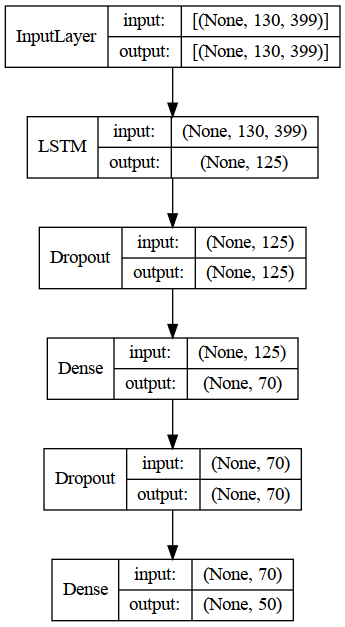

In [138]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [139]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 12ms/step - loss: 2.5357 - f1_score: 0.6095


[2.5357143878936768, 0.6095041632652283]

In [140]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 13ms/step - loss: 0.0613 - f1_score: 0.9996


[0.0613335482776165, 0.9995744228363037]

In [141]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 11ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.875     0.933         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      0.750     0.300     0.429        10
        BELT      0.750     0.750     0.750         4
        BITE      0.333     0.125     0.182         8
   BREAKFAST      0.667     0.667     0.667         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      0.667     1.000     0.800         6
    CONFUSED      0.750     1.000     0.857         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.167     0.167     0.167         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.400     0.333     0.364         6
      DINNER      0.750     0.375     0.500         8
         DOG      0.357    

In [134]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 LSTM Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [137]:
act_function = mish
model = Sequential()
model.add(LSTM(units=200,return_sequences=False,input_shape=(130,126),kernel_regularizer=regularizers.l2(.0003948697422663148)))
model.add(Dropout(.6))
model.add(Dense(units=100,activation=act_function))
model.add(Dropout(.15))
model.add(Dense(50, activation='softmax'))
model.compile(tf.optimizers.experimental.Nadam(.00034981818142934215),loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 200)               261600    
                                                                 
 dropout_4 (Dropout)         (None, 200)               0         
                                                                 
 dense_4 (Dense)             (None, 100)               20100     
                                                                 
 dropout_5 (Dropout)         (None, 100)               0         
                                                                 
 dense_5 (Dense)             (None, 50)                5050      
                                                                 
Total params: 286,750
Trainable params: 286,750
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
28/28 [=============================

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 14s 417ms/step - loss: 3.9916 - f1_score: 0.0160 - val_loss: 3.9841 - val_f1_score: 0.0023
Epoch 2/500
28/28 [==============================] - ETA: 0s - loss: 3.9732 - f1_score: 0.0103

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 244ms/step - loss: 3.9732 - f1_score: 0.0103 - val_loss: 3.9704 - val_f1_score: 0.0031
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.9180 - f1_score: 0.0171

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 275ms/step - loss: 3.9148 - f1_score: 0.0173 - val_loss: 3.8333 - val_f1_score: 0.0035
Epoch 4/500
28/28 [==============================] - ETA: 0s - loss: 3.6978 - f1_score: 0.0378

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 6s 233ms/step - loss: 3.6978 - f1_score: 0.0378 - val_loss: 3.5441 - val_f1_score: 0.0141
Epoch 5/500
28/28 [==============================] - ETA: 0s - loss: 3.5057 - f1_score: 0.0508

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 259ms/step - loss: 3.5057 - f1_score: 0.0508 - val_loss: 3.4126 - val_f1_score: 0.0288
Epoch 6/500
28/28 [==============================] - ETA: 0s - loss: 3.4473 - f1_score: 0.0569

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 249ms/step - loss: 3.4473 - f1_score: 0.0569 - val_loss: 3.3573 - val_f1_score: 0.0417
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3527 - f1_score: 0.0626

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 301ms/step - loss: 3.3503 - f1_score: 0.0624 - val_loss: 3.2269 - val_f1_score: 0.0497
Epoch 8/500
28/28 [==============================] - 2s 59ms/step - loss: 3.2434 - f1_score: 0.0696 - val_loss: 3.1746 - val_f1_score: 0.0448
Epoch 9/500
28/28 [==============================] - 2s 59ms/step - loss: 3.1856 - f1_score: 0.0842 - val_loss: 3.1623 - val_f1_score: 0.0417
Epoch 10/500
28/28 [==============================] - ETA: 0s - loss: 3.1021 - f1_score: 0.0926

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 259ms/step - loss: 3.1021 - f1_score: 0.0926 - val_loss: 3.0432 - val_f1_score: 0.0747
Epoch 11/500
28/28 [==============================] - ETA: 0s - loss: 3.0343 - f1_score: 0.1053

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 274ms/step - loss: 3.0343 - f1_score: 0.1053 - val_loss: 2.9704 - val_f1_score: 0.0789
Epoch 12/500
28/28 [==============================] - ETA: 0s - loss: 2.9809 - f1_score: 0.1079

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 279ms/step - loss: 2.9809 - f1_score: 0.1079 - val_loss: 2.9533 - val_f1_score: 0.0809
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 2.9217 - f1_score: 0.1186

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 287ms/step - loss: 2.9217 - f1_score: 0.1186 - val_loss: 2.8929 - val_f1_score: 0.0945
Epoch 14/500
28/28 [==============================] - 2s 59ms/step - loss: 2.8661 - f1_score: 0.1289 - val_loss: 2.8089 - val_f1_score: 0.0845
Epoch 15/500
28/28 [==============================] - 2s 58ms/step - loss: 2.8304 - f1_score: 0.1344 - val_loss: 2.7910 - val_f1_score: 0.0943
Epoch 16/500
28/28 [==============================] - ETA: 0s - loss: 2.7730 - f1_score: 0.1418

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 271ms/step - loss: 2.7730 - f1_score: 0.1418 - val_loss: 2.7924 - val_f1_score: 0.1116
Epoch 17/500
28/28 [==============================] - ETA: 0s - loss: 2.7261 - f1_score: 0.1485

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 283ms/step - loss: 2.7261 - f1_score: 0.1485 - val_loss: 2.8152 - val_f1_score: 0.1243
Epoch 18/500
28/28 [==============================] - ETA: 0s - loss: 2.6721 - f1_score: 0.1644

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 262ms/step - loss: 2.6721 - f1_score: 0.1644 - val_loss: 2.6570 - val_f1_score: 0.1455
Epoch 19/500
28/28 [==============================] - 2s 58ms/step - loss: 2.6273 - f1_score: 0.1887 - val_loss: 2.6624 - val_f1_score: 0.1396
Epoch 20/500
28/28 [==============================] - ETA: 0s - loss: 2.5625 - f1_score: 0.1909

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 2.5625 - f1_score: 0.1909 - val_loss: 2.5736 - val_f1_score: 0.1704
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5234 - f1_score: 0.1942

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 305ms/step - loss: 2.5190 - f1_score: 0.1954 - val_loss: 2.4982 - val_f1_score: 0.1798
Epoch 22/500
28/28 [==============================] - ETA: 0s - loss: 2.4851 - f1_score: 0.2017

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 267ms/step - loss: 2.4851 - f1_score: 0.2017 - val_loss: 2.5107 - val_f1_score: 0.1805
Epoch 23/500
28/28 [==============================] - ETA: 0s - loss: 2.4385 - f1_score: 0.2162

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 287ms/step - loss: 2.4385 - f1_score: 0.2162 - val_loss: 2.4747 - val_f1_score: 0.1961
Epoch 24/500
28/28 [==============================] - 2s 59ms/step - loss: 2.3943 - f1_score: 0.2346 - val_loss: 2.4537 - val_f1_score: 0.1883
Epoch 25/500
28/28 [==============================] - ETA: 0s - loss: 2.3179 - f1_score: 0.2402

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 318ms/step - loss: 2.3179 - f1_score: 0.2402 - val_loss: 2.3284 - val_f1_score: 0.2020
Epoch 26/500
28/28 [==============================] - ETA: 0s - loss: 2.2591 - f1_score: 0.2751

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 291ms/step - loss: 2.2591 - f1_score: 0.2751 - val_loss: 2.4021 - val_f1_score: 0.2198
Epoch 27/500
28/28 [==============================] - ETA: 0s - loss: 2.2839 - f1_score: 0.2712

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 275ms/step - loss: 2.2839 - f1_score: 0.2712 - val_loss: 2.3088 - val_f1_score: 0.2670
Epoch 28/500
28/28 [==============================] - 2s 59ms/step - loss: 2.1757 - f1_score: 0.2964 - val_loss: 2.2849 - val_f1_score: 0.2664
Epoch 29/500
28/28 [==============================] - ETA: 0s - loss: 2.1312 - f1_score: 0.3005

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 2.1312 - f1_score: 0.3005 - val_loss: 2.2571 - val_f1_score: 0.2758
Epoch 30/500
28/28 [==============================] - ETA: 0s - loss: 2.0667 - f1_score: 0.3239

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 328ms/step - loss: 2.0667 - f1_score: 0.3239 - val_loss: 2.1838 - val_f1_score: 0.3232
Epoch 31/500
28/28 [==============================] - ETA: 0s - loss: 2.0427 - f1_score: 0.3314

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 299ms/step - loss: 2.0427 - f1_score: 0.3314 - val_loss: 2.1712 - val_f1_score: 0.3357
Epoch 32/500
28/28 [==============================] - ETA: 0s - loss: 2.0004 - f1_score: 0.3602

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 307ms/step - loss: 2.0004 - f1_score: 0.3602 - val_loss: 2.1450 - val_f1_score: 0.3849
Epoch 33/500
28/28 [==============================] - 2s 59ms/step - loss: 1.9735 - f1_score: 0.3546 - val_loss: 2.1806 - val_f1_score: 0.3293
Epoch 34/500
28/28 [==============================] - ETA: 0s - loss: 1.9095 - f1_score: 0.3890

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 328ms/step - loss: 1.9095 - f1_score: 0.3890 - val_loss: 2.0774 - val_f1_score: 0.3882
Epoch 35/500
28/28 [==============================] - ETA: 0s - loss: 1.9255 - f1_score: 0.3761

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 1.9255 - f1_score: 0.3761 - val_loss: 2.0842 - val_f1_score: 0.3937
Epoch 36/500
28/28 [==============================] - ETA: 0s - loss: 1.8335 - f1_score: 0.4055

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 278ms/step - loss: 1.8335 - f1_score: 0.4055 - val_loss: 2.0757 - val_f1_score: 0.4048
Epoch 37/500
28/28 [==============================] - 2s 59ms/step - loss: 1.7844 - f1_score: 0.4209 - val_loss: 2.0651 - val_f1_score: 0.4025
Epoch 38/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7747 - f1_score: 0.4288

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 312ms/step - loss: 1.7651 - f1_score: 0.4292 - val_loss: 1.9303 - val_f1_score: 0.4366
Epoch 39/500
28/28 [==============================] - 2s 59ms/step - loss: 1.6941 - f1_score: 0.4570 - val_loss: 1.8959 - val_f1_score: 0.4122
Epoch 40/500
28/28 [==============================] - 2s 59ms/step - loss: 1.6502 - f1_score: 0.4773 - val_loss: 1.9587 - val_f1_score: 0.4127
Epoch 41/500
28/28 [==============================] - 2s 59ms/step - loss: 1.6746 - f1_score: 0.4639 - val_loss: 1.9793 - val_f1_score: 0.4144
Epoch 42/500
28/28 [==============================] - ETA: 0s - loss: 1.5869 - f1_score: 0.4865

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 290ms/step - loss: 1.5869 - f1_score: 0.4865 - val_loss: 1.8218 - val_f1_score: 0.4869
Epoch 43/500
28/28 [==============================] - ETA: 0s - loss: 1.5197 - f1_score: 0.5120

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 287ms/step - loss: 1.5197 - f1_score: 0.5120 - val_loss: 1.8092 - val_f1_score: 0.4991
Epoch 44/500
28/28 [==============================] - 2s 59ms/step - loss: 1.5174 - f1_score: 0.5012 - val_loss: 1.8269 - val_f1_score: 0.4776
Epoch 45/500
28/28 [==============================] - 2s 59ms/step - loss: 1.4703 - f1_score: 0.5206 - val_loss: 1.8294 - val_f1_score: 0.4797
Epoch 46/500
28/28 [==============================] - ETA: 0s - loss: 1.4263 - f1_score: 0.5348

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 331ms/step - loss: 1.4263 - f1_score: 0.5348 - val_loss: 1.7609 - val_f1_score: 0.5077
Epoch 47/500
28/28 [==============================] - ETA: 0s - loss: 1.4372 - f1_score: 0.5477

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 279ms/step - loss: 1.4372 - f1_score: 0.5477 - val_loss: 1.7857 - val_f1_score: 0.5102
Epoch 48/500
28/28 [==============================] - 2s 59ms/step - loss: 1.3798 - f1_score: 0.5541 - val_loss: 1.7953 - val_f1_score: 0.4999
Epoch 49/500
28/28 [==============================] - 2s 59ms/step - loss: 1.4342 - f1_score: 0.5397 - val_loss: 1.8778 - val_f1_score: 0.4958
Epoch 50/500
28/28 [==============================] - ETA: 0s - loss: 1.3022 - f1_score: 0.5785

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 1.3022 - f1_score: 0.5785 - val_loss: 1.7954 - val_f1_score: 0.5121
Epoch 51/500
28/28 [==============================] - 2s 59ms/step - loss: 1.3839 - f1_score: 0.5617 - val_loss: 1.9101 - val_f1_score: 0.4734
Epoch 52/500
28/28 [==============================] - 2s 59ms/step - loss: 1.5332 - f1_score: 0.5186 - val_loss: 1.8629 - val_f1_score: 0.5011
Epoch 53/500
28/28 [==============================] - 2s 60ms/step - loss: 1.3848 - f1_score: 0.5563 - val_loss: 1.7176 - val_f1_score: 0.4978
Epoch 54/500
28/28 [==============================] - ETA: 0s - loss: 1.3138 - f1_score: 0.5663

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 313ms/step - loss: 1.3138 - f1_score: 0.5663 - val_loss: 1.7078 - val_f1_score: 0.5143
Epoch 55/500
28/28 [==============================] - ETA: 0s - loss: 1.2507 - f1_score: 0.6026

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 288ms/step - loss: 1.2507 - f1_score: 0.6026 - val_loss: 1.5814 - val_f1_score: 0.5628
Epoch 56/500
28/28 [==============================] - 2s 60ms/step - loss: 1.1962 - f1_score: 0.6252 - val_loss: 1.6949 - val_f1_score: 0.5569
Epoch 57/500
28/28 [==============================] - 2s 59ms/step - loss: 1.1519 - f1_score: 0.6146 - val_loss: 1.7105 - val_f1_score: 0.5470
Epoch 58/500
28/28 [==============================] - 2s 59ms/step - loss: 1.0910 - f1_score: 0.6506 - val_loss: 1.6361 - val_f1_score: 0.5610
Epoch 59/500
28/28 [==============================] - ETA: 0s - loss: 1.0903 - f1_score: 0.6578

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 1.0903 - f1_score: 0.6578 - val_loss: 1.5786 - val_f1_score: 0.5816
Epoch 60/500
28/28 [==============================] - 2s 59ms/step - loss: 1.1627 - f1_score: 0.6310 - val_loss: 1.7180 - val_f1_score: 0.5409
Epoch 61/500
28/28 [==============================] - 2s 59ms/step - loss: 1.1404 - f1_score: 0.6384 - val_loss: 1.6415 - val_f1_score: 0.5370
Epoch 62/500
28/28 [==============================] - 2s 59ms/step - loss: 1.2755 - f1_score: 0.5940 - val_loss: 1.5107 - val_f1_score: 0.5499
Epoch 63/500
28/28 [==============================] - 2s 60ms/step - loss: 1.1318 - f1_score: 0.6423 - val_loss: 1.5310 - val_f1_score: 0.5816
Epoch 64/500
28/28 [==============================] - 2s 59ms/step - loss: 1.0277 - f1_score: 0.6600 - val_loss: 1.6615 - val_f1_score: 0.5781
Epoch 65/500
28/28 [==============================] - ETA: 0s - loss: 1.0689 - f1_score: 0.6560

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 338ms/step - loss: 1.0689 - f1_score: 0.6560 - val_loss: 1.5856 - val_f1_score: 0.5880
Epoch 66/500
28/28 [==============================] - ETA: 0s - loss: 1.0873 - f1_score: 0.6466

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 7s 270ms/step - loss: 1.0873 - f1_score: 0.6466 - val_loss: 1.6094 - val_f1_score: 0.6013
Epoch 67/500
28/28 [==============================] - 2s 59ms/step - loss: 1.0072 - f1_score: 0.6757 - val_loss: 1.5475 - val_f1_score: 0.5624
Epoch 68/500
28/28 [==============================] - ETA: 0s - loss: 1.0110 - f1_score: 0.6770

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 1.0110 - f1_score: 0.6770 - val_loss: 1.6036 - val_f1_score: 0.6044
Epoch 69/500
28/28 [==============================] - ETA: 0s - loss: 0.9837 - f1_score: 0.6880

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 0.9837 - f1_score: 0.6880 - val_loss: 1.5309 - val_f1_score: 0.6255
Epoch 70/500
28/28 [==============================] - 2s 59ms/step - loss: 1.0767 - f1_score: 0.6608 - val_loss: 1.6694 - val_f1_score: 0.5578
Epoch 71/500
28/28 [==============================] - 2s 59ms/step - loss: 1.0620 - f1_score: 0.6674 - val_loss: 1.6935 - val_f1_score: 0.5852
Epoch 72/500
28/28 [==============================] - 2s 60ms/step - loss: 0.9341 - f1_score: 0.7001 - val_loss: 1.5786 - val_f1_score: 0.6142
Epoch 73/500
28/28 [==============================] - 2s 60ms/step - loss: 0.9523 - f1_score: 0.6953 - val_loss: 1.6275 - val_f1_score: 0.5926
Epoch 74/500
28/28 [==============================] - 2s 60ms/step - loss: 0.9653 - f1_score: 0.6893 - val_loss: 1.5658 - val_f1_score: 0.6251
Epoch 75/500
28/28 [==============================] - 2s 59ms/step - loss: 0.9072 - f1_score: 0.7154 - val_loss: 1.4904 - val_f1_score: 0.6210
Epoch 76/50

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 12s 427ms/step - loss: 0.7971 - f1_score: 0.7430 - val_loss: 1.5447 - val_f1_score: 0.6507
Epoch 79/500
28/28 [==============================] - 2s 59ms/step - loss: 0.8055 - f1_score: 0.7420 - val_loss: 1.6163 - val_f1_score: 0.6212
Epoch 80/500
28/28 [==============================] - 2s 60ms/step - loss: 0.8031 - f1_score: 0.7418 - val_loss: 1.5996 - val_f1_score: 0.6268
Epoch 81/500
28/28 [==============================] - 2s 60ms/step - loss: 0.8183 - f1_score: 0.7445 - val_loss: 1.6416 - val_f1_score: 0.6308
Epoch 82/500
28/28 [==============================] - 2s 60ms/step - loss: 0.8955 - f1_score: 0.7191 - val_loss: 1.5457 - val_f1_score: 0.6197
Epoch 83/500
28/28 [==============================] - 2s 60ms/step - loss: 0.9601 - f1_score: 0.7100 - val_loss: 1.6029 - val_f1_score: 0.5876
Epoch 84/500
28/28 [==============================] - 2s 60ms/step - loss: 0.9796 - f1_score: 0.6954 - val_loss: 1.5552 - val_f1_score: 0.6091
Epoch 85/5

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 327ms/step - loss: 0.7219 - f1_score: 0.7634 - val_loss: 1.5241 - val_f1_score: 0.6692
Epoch 88/500
28/28 [==============================] - 2s 61ms/step - loss: 0.7454 - f1_score: 0.7660 - val_loss: 1.6166 - val_f1_score: 0.6327
Epoch 89/500
28/28 [==============================] - 2s 59ms/step - loss: 0.8470 - f1_score: 0.7244 - val_loss: 1.6850 - val_f1_score: 0.6046
Epoch 90/500
28/28 [==============================] - 2s 60ms/step - loss: 0.7540 - f1_score: 0.7699 - val_loss: 1.6831 - val_f1_score: 0.6265
Epoch 91/500
28/28 [==============================] - 2s 60ms/step - loss: 0.6750 - f1_score: 0.7811 - val_loss: 1.6409 - val_f1_score: 0.6154
Epoch 92/500
28/28 [==============================] - 2s 60ms/step - loss: 0.7836 - f1_score: 0.7451 - val_loss: 1.6540 - val_f1_score: 0.6371
Epoch 93/500
28/28 [==============================] - 2s 60ms/step - loss: 0.7140 - f1_score: 0.7775 - val_loss: 1.5131 - val_f1_score: 0.6252
Epoch 94/50

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 10s 353ms/step - loss: 0.5079 - f1_score: 0.8449 - val_loss: 1.5480 - val_f1_score: 0.6778
Epoch 111/500
28/28 [==============================] - 2s 60ms/step - loss: 0.5424 - f1_score: 0.8439 - val_loss: 1.6145 - val_f1_score: 0.6499
Epoch 112/500
28/28 [==============================] - 2s 60ms/step - loss: 0.6154 - f1_score: 0.8113 - val_loss: 1.8508 - val_f1_score: 0.6195
Epoch 113/500
28/28 [==============================] - 2s 60ms/step - loss: 0.6628 - f1_score: 0.7970 - val_loss: 1.7765 - val_f1_score: 0.6246
Epoch 114/500
28/28 [==============================] - 2s 60ms/step - loss: 0.5977 - f1_score: 0.8230 - val_loss: 1.7117 - val_f1_score: 0.6598
Epoch 115/500
28/28 [==============================] - ETA: 0s - loss: 0.5147 - f1_score: 0.8393

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 329ms/step - loss: 0.5147 - f1_score: 0.8393 - val_loss: 1.5665 - val_f1_score: 0.6780
Epoch 116/500
28/28 [==============================] - ETA: 0s - loss: 0.5626 - f1_score: 0.8278

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 8s 309ms/step - loss: 0.5626 - f1_score: 0.8278 - val_loss: 1.6781 - val_f1_score: 0.6870
Epoch 117/500
28/28 [==============================] - ETA: 0s - loss: 0.4843 - f1_score: 0.8490

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 324ms/step - loss: 0.4843 - f1_score: 0.8490 - val_loss: 1.4538 - val_f1_score: 0.7026
Epoch 118/500
28/28 [==============================] - 2s 59ms/step - loss: 0.5085 - f1_score: 0.8567 - val_loss: 1.7033 - val_f1_score: 0.6768
Epoch 119/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4787 - f1_score: 0.8646 - val_loss: 1.5335 - val_f1_score: 0.6930
Epoch 120/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4767 - f1_score: 0.8530 - val_loss: 1.7774 - val_f1_score: 0.6551
Epoch 121/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4809 - f1_score: 0.8556 - val_loss: 1.6262 - val_f1_score: 0.6719
Epoch 122/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4751 - f1_score: 0.8525 - val_loss: 1.8214 - val_f1_score: 0.6653
Epoch 123/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4826 - f1_score: 0.8531 - val_loss: 1.7410 - val_f1_score: 0.6859
Epoch

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 11s 390ms/step - loss: 0.4890 - f1_score: 0.8662 - val_loss: 1.6727 - val_f1_score: 0.7059
Epoch 151/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3765 - f1_score: 0.8944 - val_loss: 1.8473 - val_f1_score: 0.6891
Epoch 152/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4698 - f1_score: 0.8715 - val_loss: 1.7560 - val_f1_score: 0.6466
Epoch 153/500
28/28 [==============================] - 2s 60ms/step - loss: 0.5612 - f1_score: 0.8497 - val_loss: 1.8624 - val_f1_score: 0.6875
Epoch 154/500
28/28 [==============================] - ETA: 0s - loss: 0.4539 - f1_score: 0.8833

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 320ms/step - loss: 0.4539 - f1_score: 0.8833 - val_loss: 1.6813 - val_f1_score: 0.7064
Epoch 155/500
28/28 [==============================] - 2s 60ms/step - loss: 0.7212 - f1_score: 0.8286 - val_loss: 1.8654 - val_f1_score: 0.6849
Epoch 156/500
28/28 [==============================] - 2s 60ms/step - loss: 0.6909 - f1_score: 0.8105 - val_loss: 1.6089 - val_f1_score: 0.6929
Epoch 157/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4997 - f1_score: 0.8592 - val_loss: 1.6055 - val_f1_score: 0.7022
Epoch 158/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3743 - f1_score: 0.8995 - val_loss: 1.5243 - val_f1_score: 0.6998
Epoch 159/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3140 - f1_score: 0.9173 - val_loss: 1.5899 - val_f1_score: 0.7016
Epoch 160/500
28/28 [==============================] - ETA: 0s - loss: 0.2826 - f1_score: 0.9286

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 328ms/step - loss: 0.2826 - f1_score: 0.9286 - val_loss: 1.5415 - val_f1_score: 0.7278
Epoch 161/500
28/28 [==============================] - ETA: 0s - loss: 0.2749 - f1_score: 0.9336

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 337ms/step - loss: 0.2749 - f1_score: 0.9336 - val_loss: 1.5239 - val_f1_score: 0.7352
Epoch 162/500
28/28 [==============================] - 2s 61ms/step - loss: 0.2812 - f1_score: 0.9305 - val_loss: 1.6206 - val_f1_score: 0.7215
Epoch 163/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2746 - f1_score: 0.9360 - val_loss: 1.6613 - val_f1_score: 0.7048
Epoch 164/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2966 - f1_score: 0.9194 - val_loss: 1.7903 - val_f1_score: 0.7118
Epoch 165/500
28/28 [==============================] - ETA: 0s - loss: 0.3397 - f1_score: 0.9110

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 10s 367ms/step - loss: 0.3397 - f1_score: 0.9110 - val_loss: 1.5531 - val_f1_score: 0.7452
Epoch 166/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3959 - f1_score: 0.9049 - val_loss: 2.0321 - val_f1_score: 0.6728
Epoch 167/500
28/28 [==============================] - 2s 60ms/step - loss: 0.6566 - f1_score: 0.8298 - val_loss: 1.8941 - val_f1_score: 0.6811
Epoch 168/500
28/28 [==============================] - 2s 60ms/step - loss: 0.8284 - f1_score: 0.7953 - val_loss: 1.8632 - val_f1_score: 0.6454
Epoch 169/500
28/28 [==============================] - 2s 60ms/step - loss: 0.6203 - f1_score: 0.8289 - val_loss: 1.6215 - val_f1_score: 0.7044
Epoch 170/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4196 - f1_score: 0.8859 - val_loss: 1.5978 - val_f1_score: 0.7181
Epoch 171/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3536 - f1_score: 0.9028 - val_loss: 1.5245 - val_f1_score: 0.7344
Epoc

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 10s 357ms/step - loss: 0.2585 - f1_score: 0.9381 - val_loss: 1.4933 - val_f1_score: 0.7604
Epoch 189/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2307 - f1_score: 0.9466 - val_loss: 1.5992 - val_f1_score: 0.7499
Epoch 190/500
28/28 [==============================] - ETA: 0s - loss: 0.2264 - f1_score: 0.9457

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 10s 368ms/step - loss: 0.2264 - f1_score: 0.9457 - val_loss: 1.5379 - val_f1_score: 0.7765
Epoch 191/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2340 - f1_score: 0.9404 - val_loss: 1.6390 - val_f1_score: 0.7381
Epoch 192/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2674 - f1_score: 0.9352 - val_loss: 1.5796 - val_f1_score: 0.7678
Epoch 193/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2303 - f1_score: 0.9454 - val_loss: 1.7574 - val_f1_score: 0.7566
Epoch 194/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2082 - f1_score: 0.9532 - val_loss: 1.7132 - val_f1_score: 0.7607
Epoch 195/500
28/28 [==============================] - 2s 61ms/step - loss: 0.2082 - f1_score: 0.9542 - val_loss: 1.6636 - val_f1_score: 0.7470
Epoch 196/500
28/28 [==============================] - 2s 61ms/step - loss: 0.1859 - f1_score: 0.9583 - val_loss: 1.7941 - val_f1_score: 0.7452
Epoc

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 9s 342ms/step - loss: 0.2988 - f1_score: 0.9304 - val_loss: 1.4262 - val_f1_score: 0.7853
Epoch 208/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2810 - f1_score: 0.9325 - val_loss: 1.5374 - val_f1_score: 0.7644
Epoch 209/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2159 - f1_score: 0.9480 - val_loss: 1.5225 - val_f1_score: 0.7689
Epoch 210/500
28/28 [==============================] - 2s 61ms/step - loss: 0.1942 - f1_score: 0.9599 - val_loss: 1.5128 - val_f1_score: 0.7736
Epoch 211/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1859 - f1_score: 0.9634 - val_loss: 1.5499 - val_f1_score: 0.7839
Epoch 212/500
28/28 [==============================] - 2s 61ms/step - loss: 0.1802 - f1_score: 0.9687 - val_loss: 1.6241 - val_f1_score: 0.7591
Epoch 213/500
28/28 [==============================] - 2s 62ms/step - loss: 0.1739 - f1_score: 0.9611 - val_loss: 1.7066 - val_f1_score: 0.7564
Epoch

Epoch 264/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1665 - f1_score: 0.9687 - val_loss: 1.6020 - val_f1_score: 0.7697
Epoch 265/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1481 - f1_score: 0.9752 - val_loss: 1.6195 - val_f1_score: 0.7650
Epoch 266/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1677 - f1_score: 0.9730 - val_loss: 1.6556 - val_f1_score: 0.7648
Epoch 267/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1565 - f1_score: 0.9761 - val_loss: 1.7645 - val_f1_score: 0.7627
Epoch 268/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1193 - f1_score: 0.9849 - val_loss: 1.7058 - val_f1_score: 0.7683
Epoch 269/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1118 - f1_score: 0.9849 - val_loss: 1.7294 - val_f1_score: 0.7759
Epoch 270/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1111 - f1_score: 0.9886 - val_loss: 1.7614 - val_f1_score:

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 10s 375ms/step - loss: 0.1372 - f1_score: 0.9792 - val_loss: 1.6428 - val_f1_score: 0.7934
Epoch 286/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1250 - f1_score: 0.9808 - val_loss: 1.7187 - val_f1_score: 0.7904
Epoch 287/500
28/28 [==============================] - 2s 61ms/step - loss: 0.1409 - f1_score: 0.9823 - val_loss: 1.6977 - val_f1_score: 0.7808
Epoch 288/500
28/28 [==============================] - 2s 62ms/step - loss: 0.1224 - f1_score: 0.9838 - val_loss: 1.7579 - val_f1_score: 0.7851
Epoch 289/500
28/28 [==============================] - 2s 62ms/step - loss: 0.1257 - f1_score: 0.9839 - val_loss: 1.8510 - val_f1_score: 0.7627
Epoch 290/500
28/28 [==============================] - 2s 62ms/step - loss: 0.1104 - f1_score: 0.9869 - val_loss: 1.8221 - val_f1_score: 0.7824
Epoch 291/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1162 - f1_score: 0.9857 - val_loss: 1.9284 - val_f1_score: 0.7667
Epoc

Epoch 342/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1834 - f1_score: 0.9639 - val_loss: 1.9030 - val_f1_score: 0.7448
Epoch 343/500
28/28 [==============================] - 2s 63ms/step - loss: 0.2081 - f1_score: 0.9615 - val_loss: 1.9219 - val_f1_score: 0.7494
Epoch 344/500
28/28 [==============================] - 2s 63ms/step - loss: 0.2270 - f1_score: 0.9609 - val_loss: 1.8359 - val_f1_score: 0.7501
Epoch 345/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1662 - f1_score: 0.9735 - val_loss: 1.8907 - val_f1_score: 0.7366
Epoch 346/500
28/28 [==============================] - 2s 64ms/step - loss: 0.3052 - f1_score: 0.9369 - val_loss: 1.7626 - val_f1_score: 0.7672
Epoch 347/500
28/28 [==============================] - 2s 63ms/step - loss: 0.3417 - f1_score: 0.9456 - val_loss: 1.8494 - val_f1_score: 0.7195
Epoch 348/500
28/28 [==============================] - 2s 63ms/step - loss: 0.3862 - f1_score: 0.9155 - val_loss: 1.7181 - val_f1_score:

Epoch 399/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0745 - f1_score: 0.9978 - val_loss: 1.6716 - val_f1_score: 0.7851
Epoch 400/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0730 - f1_score: 0.9981 - val_loss: 1.7101 - val_f1_score: 0.7880
Epoch 401/500
28/28 [==============================] - 2s 63ms/step - loss: 0.0702 - f1_score: 1.0000 - val_loss: 1.7608 - val_f1_score: 0.7784
Epoch 402/500
28/28 [==============================] - 2s 63ms/step - loss: 0.0706 - f1_score: 0.9985 - val_loss: 1.7129 - val_f1_score: 0.7843
Epoch 403/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0684 - f1_score: 0.9989 - val_loss: 1.6981 - val_f1_score: 0.7859
Epoch 404/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0681 - f1_score: 0.9993 - val_loss: 1.7364 - val_f1_score: 0.7871
Epoch 405/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0678 - f1_score: 0.9989 - val_loss: 1.7219 - val_f1_score:

INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 LSTM Mish/assets


28/28 [==============================] - 13s 479ms/step - loss: 0.0689 - f1_score: 0.9977 - val_loss: 1.6644 - val_f1_score: 0.7934
Epoch 407/500
28/28 [==============================] - 2s 62ms/step - loss: 0.0672 - f1_score: 0.9989 - val_loss: 1.6783 - val_f1_score: 0.7923
Epoch 408/500
28/28 [==============================] - 2s 63ms/step - loss: 0.0662 - f1_score: 0.9984 - val_loss: 1.7589 - val_f1_score: 0.7819
Epoch 409/500
28/28 [==============================] - 2s 62ms/step - loss: 0.0669 - f1_score: 0.9977 - val_loss: 1.7792 - val_f1_score: 0.7891
Epoch 410/500
28/28 [==============================] - 2s 62ms/step - loss: 0.0640 - f1_score: 0.9992 - val_loss: 1.7892 - val_f1_score: 0.7854
Epoch 411/500
28/28 [==============================] - 2s 62ms/step - loss: 0.0648 - f1_score: 0.9988 - val_loss: 1.7970 - val_f1_score: 0.7871
Epoch 412/500
28/28 [==============================] - 2s 62ms/step - loss: 0.0656 - f1_score: 0.9965 - val_loss: 1.7872 - val_f1_score: 0.7841
Epoc

Epoch 463/500
28/28 [==============================] - 2s 65ms/step - loss: 0.1286 - f1_score: 0.9813 - val_loss: 1.7734 - val_f1_score: 0.7656
Epoch 464/500
28/28 [==============================] - 2s 66ms/step - loss: 0.1071 - f1_score: 0.9870 - val_loss: 1.7133 - val_f1_score: 0.7561
Epoch 465/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0945 - f1_score: 0.9912 - val_loss: 1.7162 - val_f1_score: 0.7761
Epoch 466/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0834 - f1_score: 0.9942 - val_loss: 1.7877 - val_f1_score: 0.7723
Epoch 467/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0785 - f1_score: 0.9961 - val_loss: 1.7733 - val_f1_score: 0.7795
Epoch 468/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0719 - f1_score: 0.9968 - val_loss: 1.7801 - val_f1_score: 0.7757
Epoch 469/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0705 - f1_score: 0.9985 - val_loss: 1.7977 - val_f1_score:

In [138]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 14ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      1.000     0.667     0.800         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      1.000     0.400     0.571        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     0.375     0.545         8
   BREAKFAST      0.429     1.000     0.600         6
      CANCER      1.000     0.875     0.933         8
   CHRISTMAS      0.750     0.500     0.600         6
    CONFUSED      1.000     0.833     0.909         6
        DARK      0.800     1.000     0.889         4
        DEAF      1.000     0.333     0.500         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.556     0.625     0.588         8
     DEVELOP      0.400     0.667     0.500         6
      DINNER      0.778     0.875     0.824         8
         DOG      1.000    

In [139]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 LSTM Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [140]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.277541,0.944062,1.831507,0.723541
496,0.201111,0.959958,1.871319,0.746672
497,0.168756,0.967545,1.899163,0.735039
498,0.173993,0.962826,1.933714,0.735603
499,0.191856,0.967615,1.936698,0.730486


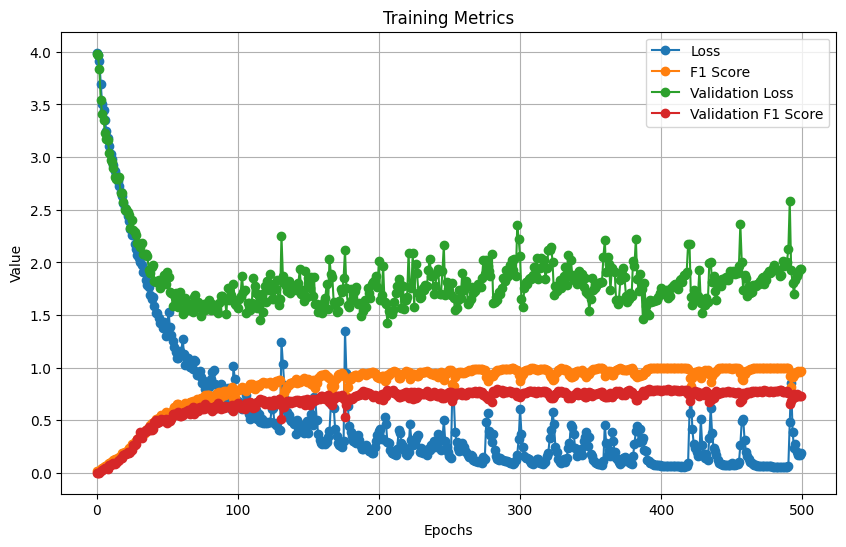

In [141]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [126]:
reconstructed_model = tf.keras.models.load_model("1 LSTM Mish")

In [143]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 14ms/step - loss: 1.6644 - f1_score: 0.7934


[1.6643712520599365, 0.7934468984603882]

In [124]:
reconstructed_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 200)               261600    
                                                                 
 dropout (Dropout)           (None, 200)               0         
                                                                 
 dense (Dense)               (None, 100)               20100     
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 50)                5050      
                                                                 
Total params: 286,750
Trainable params: 286,750
Non-trainable params: 0
_________________________________________________________________


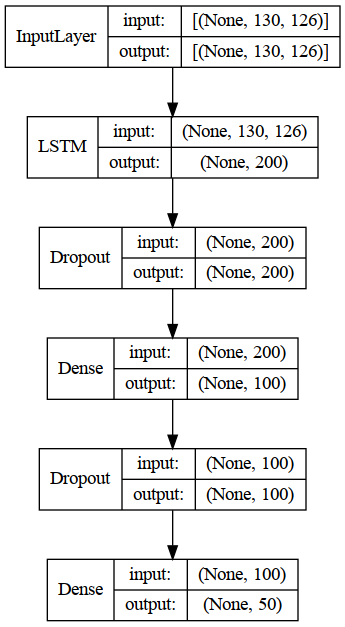

In [128]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [145]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 12ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      1.000     1.000     1.000         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      1.000     0.900     0.947        10
        BELT      1.000     1.000     1.000         4
        BITE      0.889     1.000     0.941         8
   BREAKFAST      0.750     1.000     0.857         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      0.667     1.000     0.800         4
        DEAF      1.000     1.000     1.000         6
      DECIDE      0.857     1.000     0.923         6
      DEMAND      0.667     0.750     0.706         8
     DEVELOP      0.375     0.500     0.429         6
      DINNER      0.636     0.875     0.737         8
         DOG      1.000    

In [146]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 LSTM Lecunnormal/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [147]:
act_function = 'selu'
initializer = tf.keras.initializers.LecunNormal(seed=10)
model = Sequential()
model.add(LSTM(units=200,return_sequences=False,input_shape=(130,126),
               kernel_initializer=initializer,kernel_regularizer=regularizers.l2(.0003948697422663148)))
#model.add(Dropout(.6))
model.add(Dense(units=100,activation=act_function,kernel_initializer=initializer))
#model.add(Dropout(.15))
model.add(Dense(50, activation='softmax'))
model.compile(tf.optimizers.experimental.Nadam(.00034981818142934215),loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 200)               261600    
                                                                 
 dense_6 (Dense)             (None, 100)               20100     
                                                                 
 dense_7 (Dense)             (None, 50)                5050      
                                                                 
Total params: 286,750
Trainable params: 286,750
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
28/28 [==============================] - ETA: 0s - loss: 4.2118 - f1_score: 0.0089

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 16s 496ms/step - loss: 4.2118 - f1_score: 0.0089 - val_loss: 4.1912 - val_f1_score: 0.0066
Epoch 2/500
28/28 [==============================] - ETA: 0s - loss: 4.0117 - f1_score: 0.0118

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 318ms/step - loss: 4.0117 - f1_score: 0.0118 - val_loss: 3.9728 - val_f1_score: 0.0076
Epoch 3/500
28/28 [==============================] - 2s 59ms/step - loss: 3.7847 - f1_score: 0.0167 - val_loss: 3.7675 - val_f1_score: 0.0068
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 3.6773 - f1_score: 0.0298

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 332ms/step - loss: 3.6750 - f1_score: 0.0299 - val_loss: 3.6500 - val_f1_score: 0.0211
Epoch 5/500
28/28 [==============================] - ETA: 0s - loss: 3.4838 - f1_score: 0.0568

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 289ms/step - loss: 3.4838 - f1_score: 0.0568 - val_loss: 3.4072 - val_f1_score: 0.0551
Epoch 6/500
28/28 [==============================] - ETA: 0s - loss: 3.2498 - f1_score: 0.0864

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 354ms/step - loss: 3.2498 - f1_score: 0.0864 - val_loss: 3.2291 - val_f1_score: 0.0709
Epoch 7/500
28/28 [==============================] - ETA: 0s - loss: 3.0166 - f1_score: 0.1361

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 285ms/step - loss: 3.0166 - f1_score: 0.1361 - val_loss: 3.0154 - val_f1_score: 0.1158
Epoch 8/500
28/28 [==============================] - ETA: 0s - loss: 2.8343 - f1_score: 0.1716

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 320ms/step - loss: 2.8343 - f1_score: 0.1716 - val_loss: 2.9414 - val_f1_score: 0.1570
Epoch 9/500
28/28 [==============================] - ETA: 0s - loss: 2.7075 - f1_score: 0.1950

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 364ms/step - loss: 2.7075 - f1_score: 0.1950 - val_loss: 2.7965 - val_f1_score: 0.1662
Epoch 10/500
28/28 [==============================] - ETA: 0s - loss: 2.4900 - f1_score: 0.2554

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 302ms/step - loss: 2.4900 - f1_score: 0.2554 - val_loss: 2.6398 - val_f1_score: 0.2338
Epoch 11/500
28/28 [==============================] - ETA: 0s - loss: 2.3850 - f1_score: 0.2845

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 344ms/step - loss: 2.3850 - f1_score: 0.2845 - val_loss: 2.6805 - val_f1_score: 0.2525
Epoch 12/500
28/28 [==============================] - ETA: 0s - loss: 2.3001 - f1_score: 0.3075

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 292ms/step - loss: 2.3001 - f1_score: 0.3075 - val_loss: 2.4628 - val_f1_score: 0.2624
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 2.1129 - f1_score: 0.3661

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 325ms/step - loss: 2.1129 - f1_score: 0.3661 - val_loss: 2.3479 - val_f1_score: 0.3504
Epoch 14/500
28/28 [==============================] - ETA: 0s - loss: 2.0256 - f1_score: 0.3976

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 293ms/step - loss: 2.0256 - f1_score: 0.3976 - val_loss: 2.2524 - val_f1_score: 0.3609
Epoch 15/500
28/28 [==============================] - ETA: 0s - loss: 2.0669 - f1_score: 0.3898

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 303ms/step - loss: 2.0669 - f1_score: 0.3898 - val_loss: 2.1853 - val_f1_score: 0.3937
Epoch 16/500
28/28 [==============================] - ETA: 0s - loss: 1.8716 - f1_score: 0.4656

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 313ms/step - loss: 1.8716 - f1_score: 0.4656 - val_loss: 2.1693 - val_f1_score: 0.4248
Epoch 17/500
28/28 [==============================] - ETA: 0s - loss: 1.7355 - f1_score: 0.5089

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 303ms/step - loss: 1.7355 - f1_score: 0.5089 - val_loss: 1.9700 - val_f1_score: 0.4756
Epoch 18/500
28/28 [==============================] - ETA: 0s - loss: 1.6237 - f1_score: 0.5575

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 308ms/step - loss: 1.6237 - f1_score: 0.5575 - val_loss: 1.9157 - val_f1_score: 0.5105
Epoch 19/500
28/28 [==============================] - 2s 59ms/step - loss: 1.5770 - f1_score: 0.5702 - val_loss: 1.9057 - val_f1_score: 0.5011
Epoch 20/500
28/28 [==============================] - 2s 60ms/step - loss: 1.4874 - f1_score: 0.5938 - val_loss: 1.9552 - val_f1_score: 0.4956
Epoch 21/500
28/28 [==============================] - 2s 59ms/step - loss: 1.4127 - f1_score: 0.6234 - val_loss: 1.8591 - val_f1_score: 0.4771
Epoch 22/500
28/28 [==============================] - ETA: 0s - loss: 1.3350 - f1_score: 0.6427

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 317ms/step - loss: 1.3350 - f1_score: 0.6427 - val_loss: 1.9203 - val_f1_score: 0.5514
Epoch 23/500
28/28 [==============================] - 2s 60ms/step - loss: 1.3153 - f1_score: 0.6408 - val_loss: 1.8021 - val_f1_score: 0.5261
Epoch 24/500
28/28 [==============================] - 2s 59ms/step - loss: 1.2158 - f1_score: 0.6803 - val_loss: 1.9735 - val_f1_score: 0.5064
Epoch 25/500
28/28 [==============================] - ETA: 0s - loss: 1.2852 - f1_score: 0.6525

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 351ms/step - loss: 1.2852 - f1_score: 0.6525 - val_loss: 1.6934 - val_f1_score: 0.5516
Epoch 26/500
28/28 [==============================] - ETA: 0s - loss: 1.1384 - f1_score: 0.7056

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 300ms/step - loss: 1.1384 - f1_score: 0.7056 - val_loss: 1.6834 - val_f1_score: 0.5813
Epoch 27/500
28/28 [==============================] - 2s 59ms/step - loss: 1.0611 - f1_score: 0.7400 - val_loss: 1.7468 - val_f1_score: 0.5714
Epoch 28/500
28/28 [==============================] - ETA: 0s - loss: 1.0832 - f1_score: 0.7102

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 298ms/step - loss: 1.0832 - f1_score: 0.7102 - val_loss: 1.6457 - val_f1_score: 0.6187
Epoch 29/500
28/28 [==============================] - 2s 59ms/step - loss: 0.9838 - f1_score: 0.7510 - val_loss: 1.6864 - val_f1_score: 0.5933
Epoch 30/500
28/28 [==============================] - 2s 60ms/step - loss: 0.9467 - f1_score: 0.7547 - val_loss: 1.7452 - val_f1_score: 0.5708
Epoch 31/500
28/28 [==============================] - ETA: 0s - loss: 0.9103 - f1_score: 0.7741

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 336ms/step - loss: 0.9103 - f1_score: 0.7741 - val_loss: 1.6858 - val_f1_score: 0.6228
Epoch 32/500
28/28 [==============================] - 2s 59ms/step - loss: 0.9450 - f1_score: 0.7589 - val_loss: 1.7051 - val_f1_score: 0.5964
Epoch 33/500
28/28 [==============================] - ETA: 0s - loss: 0.9265 - f1_score: 0.7597

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 344ms/step - loss: 0.9265 - f1_score: 0.7597 - val_loss: 1.6068 - val_f1_score: 0.6296
Epoch 34/500
28/28 [==============================] - 2s 59ms/step - loss: 0.8669 - f1_score: 0.7886 - val_loss: 1.6907 - val_f1_score: 0.6292
Epoch 35/500
28/28 [==============================] - ETA: 0s - loss: 0.8308 - f1_score: 0.8016

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 295ms/step - loss: 0.8308 - f1_score: 0.8016 - val_loss: 1.5860 - val_f1_score: 0.6404
Epoch 36/500
28/28 [==============================] - ETA: 0s - loss: 0.7565 - f1_score: 0.8246

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 295ms/step - loss: 0.7565 - f1_score: 0.8246 - val_loss: 1.5633 - val_f1_score: 0.6517
Epoch 37/500
28/28 [==============================] - 2s 59ms/step - loss: 0.7376 - f1_score: 0.8215 - val_loss: 1.6541 - val_f1_score: 0.6376
Epoch 38/500
28/28 [==============================] - 2s 59ms/step - loss: 0.6870 - f1_score: 0.8475 - val_loss: 1.6158 - val_f1_score: 0.6427
Epoch 39/500
28/28 [==============================] - 2s 60ms/step - loss: 0.7934 - f1_score: 0.8147 - val_loss: 1.6101 - val_f1_score: 0.6034
Epoch 40/500
28/28 [==============================] - ETA: 0s - loss: 0.7396 - f1_score: 0.8242

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 348ms/step - loss: 0.7396 - f1_score: 0.8242 - val_loss: 1.5875 - val_f1_score: 0.6517
Epoch 41/500
28/28 [==============================] - 2s 60ms/step - loss: 0.7220 - f1_score: 0.8272 - val_loss: 1.5922 - val_f1_score: 0.6426
Epoch 42/500
28/28 [==============================] - 2s 60ms/step - loss: 0.7633 - f1_score: 0.8062 - val_loss: 1.6605 - val_f1_score: 0.6355
Epoch 43/500
28/28 [==============================] - 2s 60ms/step - loss: 0.6947 - f1_score: 0.8364 - val_loss: 1.7730 - val_f1_score: 0.6210
Epoch 44/500
28/28 [==============================] - 2s 61ms/step - loss: 0.8367 - f1_score: 0.7882 - val_loss: 1.6649 - val_f1_score: 0.6260
Epoch 45/500
28/28 [==============================] - ETA: 0s - loss: 0.6994 - f1_score: 0.8333

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 334ms/step - loss: 0.6994 - f1_score: 0.8333 - val_loss: 1.5597 - val_f1_score: 0.6711
Epoch 46/500
28/28 [==============================] - ETA: 0s - loss: 0.5937 - f1_score: 0.8689

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 321ms/step - loss: 0.5937 - f1_score: 0.8689 - val_loss: 1.5530 - val_f1_score: 0.6789
Epoch 47/500
28/28 [==============================] - 2s 59ms/step - loss: 0.5299 - f1_score: 0.8894 - val_loss: 1.5562 - val_f1_score: 0.6488
Epoch 48/500
28/28 [==============================] - ETA: 0s - loss: 0.4972 - f1_score: 0.9069

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 350ms/step - loss: 0.4972 - f1_score: 0.9069 - val_loss: 1.4518 - val_f1_score: 0.6930
Epoch 49/500
28/28 [==============================] - 2s 59ms/step - loss: 0.4813 - f1_score: 0.9124 - val_loss: 1.5234 - val_f1_score: 0.6788
Epoch 50/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4496 - f1_score: 0.9245 - val_loss: 1.5658 - val_f1_score: 0.6921
Epoch 51/500
28/28 [==============================] - 2s 60ms/step - loss: 0.5549 - f1_score: 0.8879 - val_loss: 1.6826 - val_f1_score: 0.6129
Epoch 52/500
28/28 [==============================] - ETA: 0s - loss: 0.5699 - f1_score: 0.8716

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 321ms/step - loss: 0.5699 - f1_score: 0.8716 - val_loss: 1.4956 - val_f1_score: 0.7035
Epoch 53/500
28/28 [==============================] - 2s 60ms/step - loss: 0.5320 - f1_score: 0.8897 - val_loss: 1.5270 - val_f1_score: 0.6868
Epoch 54/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4866 - f1_score: 0.9086 - val_loss: 1.6332 - val_f1_score: 0.6650
Epoch 55/500
28/28 [==============================] - 2s 60ms/step - loss: 0.5038 - f1_score: 0.9021 - val_loss: 1.5676 - val_f1_score: 0.6989
Epoch 56/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4323 - f1_score: 0.9229 - val_loss: 1.5563 - val_f1_score: 0.6982
Epoch 57/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3834 - f1_score: 0.9432 - val_loss: 1.5589 - val_f1_score: 0.6959
Epoch 58/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3804 - f1_score: 0.9407 - val_loss: 1.5621 - val_f1_score: 0.7024
Epoch 59/50

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 351ms/step - loss: 0.3417 - f1_score: 0.9596 - val_loss: 1.5895 - val_f1_score: 0.7097
Epoch 60/500
28/28 [==============================] - 2s 59ms/step - loss: 0.3213 - f1_score: 0.9591 - val_loss: 1.5264 - val_f1_score: 0.7033
Epoch 61/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3121 - f1_score: 0.9681 - val_loss: 1.5456 - val_f1_score: 0.6903
Epoch 62/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2986 - f1_score: 0.9724 - val_loss: 1.5553 - val_f1_score: 0.7039
Epoch 63/500
28/28 [==============================] - ETA: 0s - loss: 0.3183 - f1_score: 0.9623

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 11s 402ms/step - loss: 0.3183 - f1_score: 0.9623 - val_loss: 1.5880 - val_f1_score: 0.7141
Epoch 64/500
28/28 [==============================] - ETA: 0s - loss: 0.3067 - f1_score: 0.9665

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 315ms/step - loss: 0.3067 - f1_score: 0.9665 - val_loss: 1.5400 - val_f1_score: 0.7157
Epoch 65/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3107 - f1_score: 0.9650 - val_loss: 1.6780 - val_f1_score: 0.6872
Epoch 66/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4443 - f1_score: 0.9251 - val_loss: 1.8090 - val_f1_score: 0.6619
Epoch 67/500
28/28 [==============================] - 2s 62ms/step - loss: 0.6203 - f1_score: 0.8601 - val_loss: 1.7024 - val_f1_score: 0.6659
Epoch 68/500
28/28 [==============================] - 2s 60ms/step - loss: 0.7361 - f1_score: 0.8302 - val_loss: 1.6222 - val_f1_score: 0.6760
Epoch 69/500
28/28 [==============================] - 2s 60ms/step - loss: 0.5182 - f1_score: 0.8861 - val_loss: 1.7853 - val_f1_score: 0.6651
Epoch 70/500
28/28 [==============================] - 2s 60ms/step - loss: 0.5853 - f1_score: 0.8692 - val_loss: 1.7504 - val_f1_score: 0.6486
Epoch 71/50

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 316ms/step - loss: 0.3714 - f1_score: 0.9408 - val_loss: 1.5221 - val_f1_score: 0.7161
Epoch 73/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3190 - f1_score: 0.9598 - val_loss: 1.5297 - val_f1_score: 0.7023
Epoch 74/500
28/28 [==============================] - ETA: 0s - loss: 0.2869 - f1_score: 0.9710

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 302ms/step - loss: 0.2869 - f1_score: 0.9710 - val_loss: 1.5602 - val_f1_score: 0.7231
Epoch 75/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2645 - f1_score: 0.9796 - val_loss: 1.5552 - val_f1_score: 0.7208
Epoch 76/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2520 - f1_score: 0.9819 - val_loss: 1.5631 - val_f1_score: 0.7124
Epoch 77/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2499 - f1_score: 0.9794 - val_loss: 1.5057 - val_f1_score: 0.7110
Epoch 78/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2334 - f1_score: 0.9856 - val_loss: 1.6557 - val_f1_score: 0.6832
Epoch 79/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2411 - f1_score: 0.9830 - val_loss: 1.5905 - val_f1_score: 0.7133
Epoch 80/500
28/28 [==============================] - ETA: 0s - loss: 0.2220 - f1_score: 0.9904

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 11s 404ms/step - loss: 0.2220 - f1_score: 0.9904 - val_loss: 1.5601 - val_f1_score: 0.7293
Epoch 81/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2090 - f1_score: 0.9953 - val_loss: 1.5793 - val_f1_score: 0.7103
Epoch 82/500
28/28 [==============================] - 2s 59ms/step - loss: 0.2122 - f1_score: 0.9931 - val_loss: 1.6247 - val_f1_score: 0.7181
Epoch 83/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2050 - f1_score: 0.9953 - val_loss: 1.5506 - val_f1_score: 0.7286
Epoch 84/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1964 - f1_score: 0.9967 - val_loss: 1.5343 - val_f1_score: 0.7260
Epoch 85/500
28/28 [==============================] - ETA: 0s - loss: 0.1906 - f1_score: 0.9978

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 330ms/step - loss: 0.1906 - f1_score: 0.9978 - val_loss: 1.5627 - val_f1_score: 0.7400
Epoch 86/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1868 - f1_score: 0.9978 - val_loss: 1.5554 - val_f1_score: 0.7329
Epoch 87/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1845 - f1_score: 0.9978 - val_loss: 1.5584 - val_f1_score: 0.7390
Epoch 88/500
28/28 [==============================] - ETA: 0s - loss: 0.1821 - f1_score: 0.9974

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 310ms/step - loss: 0.1821 - f1_score: 0.9974 - val_loss: 1.5726 - val_f1_score: 0.7449
Epoch 89/500
28/28 [==============================] - 2s 59ms/step - loss: 0.1796 - f1_score: 0.9982 - val_loss: 1.5728 - val_f1_score: 0.7347
Epoch 90/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1780 - f1_score: 0.9982 - val_loss: 1.5995 - val_f1_score: 0.7259
Epoch 91/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1759 - f1_score: 0.9978 - val_loss: 1.5969 - val_f1_score: 0.7381
Epoch 92/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1739 - f1_score: 0.9982 - val_loss: 1.6100 - val_f1_score: 0.7359
Epoch 93/500
28/28 [==============================] - ETA: 0s - loss: 0.1721 - f1_score: 0.9982

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 347ms/step - loss: 0.1721 - f1_score: 0.9982 - val_loss: 1.6165 - val_f1_score: 0.7481
Epoch 94/500
28/28 [==============================] - ETA: 0s - loss: 0.1704 - f1_score: 0.9982

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 299ms/step - loss: 0.1704 - f1_score: 0.9982 - val_loss: 1.6059 - val_f1_score: 0.7489
Epoch 95/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1689 - f1_score: 0.9982 - val_loss: 1.6501 - val_f1_score: 0.7364
Epoch 96/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1674 - f1_score: 0.9982 - val_loss: 1.6281 - val_f1_score: 0.7336
Epoch 97/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1661 - f1_score: 0.9987 - val_loss: 1.6496 - val_f1_score: 0.7396
Epoch 98/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1647 - f1_score: 0.9987 - val_loss: 1.6372 - val_f1_score: 0.7339
Epoch 99/500
28/28 [==============================] - 2s 61ms/step - loss: 0.1631 - f1_score: 0.9992 - val_loss: 1.6474 - val_f1_score: 0.7337
Epoch 100/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1618 - f1_score: 0.9997 - val_loss: 1.6396 - val_f1_score: 0.7446
Epoch 101/

28/28 [==============================] - 2s 63ms/step - loss: 0.1362 - f1_score: 1.0000 - val_loss: 1.6675 - val_f1_score: 0.7118
Epoch 152/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1352 - f1_score: 1.0000 - val_loss: 1.6606 - val_f1_score: 0.7255
Epoch 153/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1342 - f1_score: 1.0000 - val_loss: 1.6775 - val_f1_score: 0.7205
Epoch 154/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1333 - f1_score: 1.0000 - val_loss: 1.6802 - val_f1_score: 0.7149
Epoch 155/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1324 - f1_score: 1.0000 - val_loss: 1.6800 - val_f1_score: 0.7249
Epoch 156/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1316 - f1_score: 1.0000 - val_loss: 1.6829 - val_f1_score: 0.7202
Epoch 157/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1308 - f1_score: 1.0000 - val_loss: 1.6860 - val_f1_score: 0.7243
Epoch 

Epoch 208/500
28/28 [==============================] - 2s 63ms/step - loss: 0.0981 - f1_score: 1.0000 - val_loss: 1.8180 - val_f1_score: 0.7318
Epoch 209/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0975 - f1_score: 1.0000 - val_loss: 1.8206 - val_f1_score: 0.7461
Epoch 210/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0969 - f1_score: 1.0000 - val_loss: 1.8227 - val_f1_score: 0.7455
Epoch 211/500
28/28 [==============================] - 2s 66ms/step - loss: 0.0963 - f1_score: 1.0000 - val_loss: 1.8222 - val_f1_score: 0.7416
Epoch 212/500
28/28 [==============================] - 2s 67ms/step - loss: 0.0957 - f1_score: 1.0000 - val_loss: 1.8260 - val_f1_score: 0.7432
Epoch 213/500
28/28 [==============================] - 2s 63ms/step - loss: 0.0951 - f1_score: 1.0000 - val_loss: 1.8239 - val_f1_score: 0.7390
Epoch 214/500
28/28 [==============================] - 2s 63ms/step - loss: 0.0945 - f1_score: 1.0000 - val_loss: 1.8359 - val_f1_score:

INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 LSTM Lecunnormal/assets


28/28 [==============================] - 11s 391ms/step - loss: 0.0902 - f1_score: 1.0000 - val_loss: 1.5819 - val_f1_score: 0.7505
Epoch 265/500
28/28 [==============================] - 2s 60ms/step - loss: 0.0897 - f1_score: 1.0000 - val_loss: 1.5833 - val_f1_score: 0.7459
Epoch 266/500
28/28 [==============================] - 2s 61ms/step - loss: 0.0893 - f1_score: 1.0000 - val_loss: 1.5885 - val_f1_score: 0.7493
Epoch 267/500
28/28 [==============================] - 2s 62ms/step - loss: 0.0888 - f1_score: 1.0000 - val_loss: 1.5949 - val_f1_score: 0.7436
Epoch 268/500
28/28 [==============================] - 2s 62ms/step - loss: 0.0884 - f1_score: 1.0000 - val_loss: 1.6008 - val_f1_score: 0.7482
Epoch 269/500
28/28 [==============================] - 2s 62ms/step - loss: 0.0879 - f1_score: 1.0000 - val_loss: 1.6013 - val_f1_score: 0.7433
Epoch 270/500
28/28 [==============================] - 2s 63ms/step - loss: 0.0875 - f1_score: 1.0000 - val_loss: 1.6066 - val_f1_score: 0.7457
Epoc

Epoch 321/500
28/28 [==============================] - 2s 70ms/step - loss: 0.0684 - f1_score: 1.0000 - val_loss: 1.7793 - val_f1_score: 0.7272
Epoch 322/500
28/28 [==============================] - 2s 63ms/step - loss: 0.0681 - f1_score: 1.0000 - val_loss: 1.7820 - val_f1_score: 0.7207
Epoch 323/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0677 - f1_score: 1.0000 - val_loss: 1.7845 - val_f1_score: 0.7255
Epoch 324/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0674 - f1_score: 1.0000 - val_loss: 1.7902 - val_f1_score: 0.7250
Epoch 325/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0670 - f1_score: 1.0000 - val_loss: 1.7911 - val_f1_score: 0.7188
Epoch 326/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0666 - f1_score: 1.0000 - val_loss: 1.7948 - val_f1_score: 0.7226
Epoch 327/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0663 - f1_score: 1.0000 - val_loss: 1.8011 - val_f1_score:

Epoch 378/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0662 - f1_score: 1.0000 - val_loss: 1.5970 - val_f1_score: 0.7272
Epoch 379/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0659 - f1_score: 1.0000 - val_loss: 1.6047 - val_f1_score: 0.7272
Epoch 380/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0656 - f1_score: 1.0000 - val_loss: 1.6014 - val_f1_score: 0.7289
Epoch 381/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0652 - f1_score: 1.0000 - val_loss: 1.6096 - val_f1_score: 0.7246
Epoch 382/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0649 - f1_score: 1.0000 - val_loss: 1.6136 - val_f1_score: 0.7286
Epoch 383/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0647 - f1_score: 1.0000 - val_loss: 1.6154 - val_f1_score: 0.7285
Epoch 384/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0644 - f1_score: 1.0000 - val_loss: 1.6191 - val_f1_score:

Epoch 435/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0522 - f1_score: 1.0000 - val_loss: 1.8046 - val_f1_score: 0.7421
Epoch 436/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0520 - f1_score: 1.0000 - val_loss: 1.8096 - val_f1_score: 0.7422
Epoch 437/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0518 - f1_score: 1.0000 - val_loss: 1.8110 - val_f1_score: 0.7421
Epoch 438/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0515 - f1_score: 1.0000 - val_loss: 1.8124 - val_f1_score: 0.7421
Epoch 439/500
28/28 [==============================] - 2s 66ms/step - loss: 0.0513 - f1_score: 1.0000 - val_loss: 1.8157 - val_f1_score: 0.7421
Epoch 440/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0511 - f1_score: 1.0000 - val_loss: 1.8172 - val_f1_score: 0.7367
Epoch 441/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0508 - f1_score: 1.0000 - val_loss: 1.8179 - val_f1_score:

Epoch 492/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0521 - f1_score: 1.0000 - val_loss: 1.4787 - val_f1_score: 0.7388
Epoch 493/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0518 - f1_score: 1.0000 - val_loss: 1.4799 - val_f1_score: 0.7371
Epoch 494/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0515 - f1_score: 1.0000 - val_loss: 1.4853 - val_f1_score: 0.7340
Epoch 495/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0511 - f1_score: 1.0000 - val_loss: 1.4870 - val_f1_score: 0.7365
Epoch 496/500
28/28 [==============================] - 2s 65ms/step - loss: 0.0508 - f1_score: 1.0000 - val_loss: 1.4924 - val_f1_score: 0.7341
Epoch 497/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0506 - f1_score: 1.0000 - val_loss: 1.4988 - val_f1_score: 0.7331
Epoch 498/500
28/28 [==============================] - 2s 64ms/step - loss: 0.0503 - f1_score: 1.0000 - val_loss: 1.4981 - val_f1_score:

In [148]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 13ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      1.000     0.667     0.800         6
  BASKETBALL      1.000     0.900     0.947        10
         BEE      0.875     0.700     0.778        10
        BELT      1.000     1.000     1.000         4
        BITE      0.889     1.000     0.941         8
   BREAKFAST      0.600     1.000     0.750         6
      CANCER      1.000     0.875     0.933         8
   CHRISTMAS      1.000     0.500     0.667         6
    CONFUSED      0.545     1.000     0.706         6
        DARK      0.571     1.000     0.727         4
        DEAF      1.000     1.000     1.000         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.500     0.333     0.400         6
      DINNER      0.750     0.750     0.750         8
         DOG      0.857    

In [149]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 LSTM Lecunnormal/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [150]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.050846,1.0,1.492390,0.734073
496,0.050572,1.0,1.498848,0.733104
497,0.050296,1.0,1.498141,0.733104
498,0.050055,1.0,1.503172,0.736567
499,0.049809,1.0,1.504291,0.740695


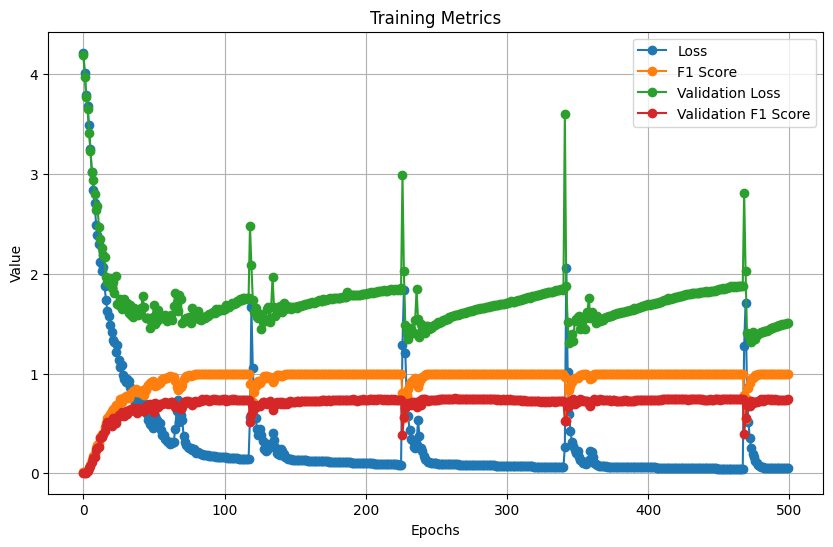

In [151]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [129]:
reconstructed_model = tf.keras.models.load_model("1 LSTM Lecunnormal")

In [153]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 14ms/step - loss: 1.5819 - f1_score: 0.7505


[1.5819425582885742, 0.75054931640625]

In [130]:
reconstructed_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 200)               261600    
                                                                 
 dense_6 (Dense)             (None, 100)               20100     
                                                                 
 dense_7 (Dense)             (None, 50)                5050      
                                                                 
Total params: 286,750
Trainable params: 286,750
Non-trainable params: 0
_________________________________________________________________


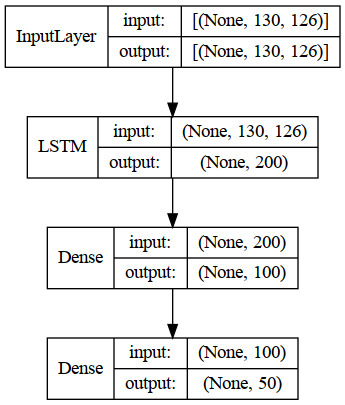

In [131]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [155]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 13ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      1.000     0.667     0.800         6
  BASKETBALL      1.000     0.900     0.947        10
         BEE      0.857     0.600     0.706        10
        BELT      1.000     1.000     1.000         4
        BITE      0.889     1.000     0.941         8
   BREAKFAST      0.556     0.833     0.667         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      0.750     0.500     0.600         6
    CONFUSED      0.545     1.000     0.706         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      0.667     0.667     0.667         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      0.500     0.500     0.500         6
      DINNER      0.857     0.750     0.800         8
         DOG      0.857    

## Hyperparameter Tuning 2 LSTM Layers

In [122]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, GRU
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','elu','gelu','relu'],default='relu')
        model = Sequential()
        model.add(LSTM(units=hp.Int('units_1',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=True,
                      input_shape=self.input_shape,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer_1',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(LSTM(units=hp.Int('units_2',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=False,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer_2',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.0,max_value=0.9,default=0.65,step=0.05,)))
        model.add(Dense(units=hp.Int('units_4',min_value=70,max_value=120,step=10,default=80),activation=act_function))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.0,max_value=0.9,default=0.7,step=0.05,)))

        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.0005)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

In [123]:
HYPERBAND_MAX_EPOCHS = 300
#MAX_TRIALS = 20
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/',
    project_name='2_LSTM',
    overwrite=False)

In [124]:
tuner.search_space_summary()

Search space summary
Default search space size: 9
dense_activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['selu', 'mish', 'elu', 'gelu', 'relu'], 'ordered': False}
units_1 (Int)
{'default': 100, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
regularizer_1 (Float)
{'default': 0.001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
units_2 (Int)
{'default': 100, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
regularizer_2 (Float)
{'default': 0.001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
dropout_1 (Float)
{'default': 0.65, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_4 (Int)
{'default': 80, 'conditions': [], 'min_value': 70, 'max_value': 120, 'step': 10, 'sampling': 'linear'}
dropout_2 (Float)
{'default': 0.7, 'conditions': [], 'min_value': 0.0, 'ma

In [125]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [126]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [127]:
tuner.search(Xtrain, Ytrain, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 34m 50s]
val_f1_score: 0.6502597630023956

Best val_f1_score So Far: 0.6583000123500824
Total elapsed time: 18h 58m 55s
INFO:tensorflow:Oracle triggered exit


In [128]:
best_model = tuner.get_best_models(num_models=3)[0]

In [129]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/2_LSTM
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0670 summary
Hyperparameters:
dense_activation: gelu
units_1: 150
regularizer_1: 0.005097339455115072
units_2: 175
regularizer_2: 0.0019526565349868704
dropout_1: 0.15000000000000002
units_4: 100
dropout_2: 0.2
learning_rate: 0.00018769757435735312
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 3
tuner/round: 3
tuner/trial_id: 0665
Score: 0.6583000123500824

Trial 0724 summary
Hyperparameters:
dense_activation: relu
units_1: 150
regularizer_1: 0.00036156986755960413
units_2: 200
regularizer_2: 0.0011089404108766622
dropout_1: 0.6000000000000001
units_4: 90
dropout_2: 0.2
learning_rate: 0.00022620443736150013
tuner/epochs: 300
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0
Score: 0.6502597630023956

Trial 0671 summary
Hyperparameters:
dense_activation: mish
units_1: 200
regularizer_1: 0.0007178100162785227


In [130]:
loss, accuracy = best_model.evaluate(Xval, Yval)

11/11 [==============================] - 2s 43ms/step - loss: 2.3504 - f1_score: 0.6702


In [131]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 2s 26ms/step - loss: 0.2579 - f1_score: 1.0000


In [132]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 130, 150)          330000    
                                                                 
 lstm_1 (LSTM)               (None, 175)               228200    
                                                                 
 dropout (Dropout)           (None, 175)               0         
                                                                 
 dense (Dense)               (None, 100)               17600     
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 50)                5050      
                                                                 
Total params: 580,850
Trainable params: 580,850
Non-trai

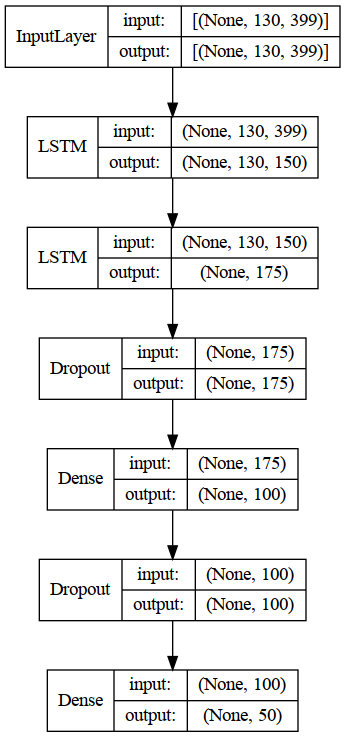

In [133]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

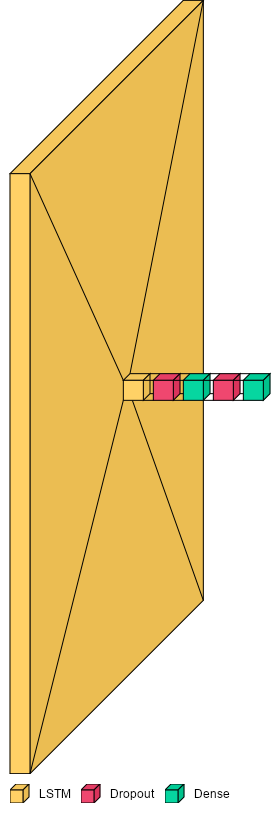

In [135]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(best_model, legend=True, font=font) 

In [136]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(best_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 23ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      0.800     0.400     0.533        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     0.500     0.667         8
   BREAKFAST      1.000     0.667     0.800         6
      CANCER      0.857     0.750     0.800         8
   CHRISTMAS      0.800     0.667     0.727         6
    CONFUSED      0.667     0.667     0.667         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.182     0.333     0.235         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      1.000     1.000     1.000         8
     DEVELOP      0.500     0.500     0.500         6
      DINNER      1.000     0.625     0.769         8
         DOG      0.400    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [137]:
#bestHP = tuner.get_best_hyperparameters(num_trials=5)[2]
bestHP = tuner.get_best_hyperparameters(num_trials=10)[0]

In [138]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 LSTM/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [139]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - ETA: 0s - loss: 6.6801 - f1_score: 0.0100

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 27s 779ms/step - loss: 6.6801 - f1_score: 0.0100 - val_loss: 6.4788 - val_f1_score: 0.0029
Epoch 2/500
28/28 [==============================] - 4s 133ms/step - loss: 6.3016 - f1_score: 0.0111 - val_loss: 6.1084 - val_f1_score: 0.0011
Epoch 3/500
28/28 [==============================] - 4s 133ms/step - loss: 5.9561 - f1_score: 0.0123 - val_loss: 5.7865 - val_f1_score: 0.0012
Epoch 4/500
28/28 [==============================] - 4s 136ms/step - loss: 5.6554 - f1_score: 0.0070 - val_loss: 5.5168 - val_f1_score: 0.0012
Epoch 5/500
28/28 [==============================] - 4s 136ms/step - loss: 5.4015 - f1_score: 0.0088 - val_loss: 5.2824 - val_f1_score: 5.5172e-04
Epoch 6/500
28/28 [==============================] - ETA: 0s - loss: 5.1823 - f1_score: 0.0114

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 18s 652ms/step - loss: 5.1823 - f1_score: 0.0114 - val_loss: 5.0818 - val_f1_score: 0.0072
Epoch 7/500
28/28 [==============================] - 4s 135ms/step - loss: 4.9960 - f1_score: 0.0117 - val_loss: 4.9185 - val_f1_score: 0.0012
Epoch 8/500
28/28 [==============================] - 4s 137ms/step - loss: 4.8379 - f1_score: 0.0109 - val_loss: 4.7754 - val_f1_score: 0.0012
Epoch 9/500
28/28 [==============================] - 4s 146ms/step - loss: 4.7171 - f1_score: 0.0124 - val_loss: 4.6635 - val_f1_score: 0.0059
Epoch 10/500
28/28 [==============================] - ETA: 0s - loss: 4.5900 - f1_score: 0.0158

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 19s 686ms/step - loss: 4.5900 - f1_score: 0.0158 - val_loss: 4.5330 - val_f1_score: 0.0111
Epoch 11/500
28/28 [==============================] - 4s 135ms/step - loss: 4.4634 - f1_score: 0.0160 - val_loss: 4.4508 - val_f1_score: 0.0076
Epoch 12/500
28/28 [==============================] - 4s 137ms/step - loss: 4.3266 - f1_score: 0.0196 - val_loss: 4.2533 - val_f1_score: 0.0105
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 4.2005 - f1_score: 0.0270

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 19s 682ms/step - loss: 4.2005 - f1_score: 0.0270 - val_loss: 4.1400 - val_f1_score: 0.0197
Epoch 14/500
28/28 [==============================] - ETA: 0s - loss: 4.0471 - f1_score: 0.0419

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 19s 691ms/step - loss: 4.0471 - f1_score: 0.0419 - val_loss: 3.9293 - val_f1_score: 0.0211
Epoch 15/500
28/28 [==============================] - 4s 136ms/step - loss: 3.9175 - f1_score: 0.0492 - val_loss: 3.7676 - val_f1_score: 0.0208
Epoch 16/500
28/28 [==============================] - ETA: 0s - loss: 3.7872 - f1_score: 0.0666

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 19s 700ms/step - loss: 3.7872 - f1_score: 0.0666 - val_loss: 3.6633 - val_f1_score: 0.0478
Epoch 17/500
28/28 [==============================] - ETA: 0s - loss: 3.6934 - f1_score: 0.0678

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 17s 615ms/step - loss: 3.6934 - f1_score: 0.0678 - val_loss: 3.5757 - val_f1_score: 0.0511
Epoch 18/500
28/28 [==============================] - ETA: 0s - loss: 3.5666 - f1_score: 0.1006

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 17s 624ms/step - loss: 3.5666 - f1_score: 0.1006 - val_loss: 3.4329 - val_f1_score: 0.0660
Epoch 19/500
28/28 [==============================] - ETA: 0s - loss: 3.4315 - f1_score: 0.1072

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 16s 580ms/step - loss: 3.4315 - f1_score: 0.1072 - val_loss: 3.3173 - val_f1_score: 0.0997
Epoch 20/500
28/28 [==============================] - ETA: 0s - loss: 3.3325 - f1_score: 0.1267

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 18s 668ms/step - loss: 3.3325 - f1_score: 0.1267 - val_loss: 3.2650 - val_f1_score: 0.1016
Epoch 21/500
28/28 [==============================] - 4s 135ms/step - loss: 3.2320 - f1_score: 0.1389 - val_loss: 3.4105 - val_f1_score: 0.0889
Epoch 22/500
28/28 [==============================] - ETA: 0s - loss: 3.1506 - f1_score: 0.1492

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 16s 587ms/step - loss: 3.1506 - f1_score: 0.1492 - val_loss: 3.0208 - val_f1_score: 0.1692
Epoch 23/500
28/28 [==============================] - 4s 135ms/step - loss: 3.0396 - f1_score: 0.1892 - val_loss: 3.1745 - val_f1_score: 0.1303
Epoch 24/500
28/28 [==============================] - 4s 141ms/step - loss: 3.0064 - f1_score: 0.1834 - val_loss: 2.9341 - val_f1_score: 0.1652
Epoch 25/500
28/28 [==============================] - ETA: 0s - loss: 2.8532 - f1_score: 0.2204

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 17s 622ms/step - loss: 2.8532 - f1_score: 0.2204 - val_loss: 2.8277 - val_f1_score: 0.1822
Epoch 26/500
28/28 [==============================] - ETA: 0s - loss: 2.8133 - f1_score: 0.2350

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 19s 698ms/step - loss: 2.8133 - f1_score: 0.2350 - val_loss: 2.9033 - val_f1_score: 0.2270
Epoch 27/500
28/28 [==============================] - 4s 134ms/step - loss: 2.6910 - f1_score: 0.2519 - val_loss: 2.8313 - val_f1_score: 0.2051
Epoch 28/500
28/28 [==============================] - 4s 138ms/step - loss: 2.6864 - f1_score: 0.2758 - val_loss: 2.8544 - val_f1_score: 0.1929
Epoch 29/500
28/28 [==============================] - 4s 141ms/step - loss: 2.5895 - f1_score: 0.2801 - val_loss: 2.7596 - val_f1_score: 0.2128
Epoch 30/500
28/28 [==============================] - ETA: 0s - loss: 2.4663 - f1_score: 0.3190

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 17s 629ms/step - loss: 2.4663 - f1_score: 0.3190 - val_loss: 2.6942 - val_f1_score: 0.2595
Epoch 31/500
28/28 [==============================] - 4s 134ms/step - loss: 2.4416 - f1_score: 0.3230 - val_loss: 2.6373 - val_f1_score: 0.2470
Epoch 32/500
28/28 [==============================] - ETA: 0s - loss: 2.3505 - f1_score: 0.3551

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 26s 959ms/step - loss: 2.3505 - f1_score: 0.3551 - val_loss: 2.6352 - val_f1_score: 0.2712
Epoch 33/500
28/28 [==============================] - ETA: 0s - loss: 2.3928 - f1_score: 0.3425

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 17s 636ms/step - loss: 2.3928 - f1_score: 0.3425 - val_loss: 2.6229 - val_f1_score: 0.2914
Epoch 34/500
28/28 [==============================] - ETA: 0s - loss: 2.2855 - f1_score: 0.3717

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 18s 646ms/step - loss: 2.2855 - f1_score: 0.3717 - val_loss: 2.5393 - val_f1_score: 0.3057
Epoch 35/500
28/28 [==============================] - 4s 133ms/step - loss: 2.2226 - f1_score: 0.3839 - val_loss: 2.4613 - val_f1_score: 0.3032
Epoch 36/500
28/28 [==============================] - 4s 137ms/step - loss: 2.1682 - f1_score: 0.3846 - val_loss: 2.6356 - val_f1_score: 0.2872
Epoch 37/500
28/28 [==============================] - ETA: 0s - loss: 2.1084 - f1_score: 0.4143

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 17s 632ms/step - loss: 2.1084 - f1_score: 0.4143 - val_loss: 2.5307 - val_f1_score: 0.3155
Epoch 38/500
28/28 [==============================] - ETA: 0s - loss: 2.0946 - f1_score: 0.4265

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 22s 800ms/step - loss: 2.0946 - f1_score: 0.4265 - val_loss: 2.4923 - val_f1_score: 0.3228
Epoch 39/500
28/28 [==============================] - 4s 135ms/step - loss: 2.0381 - f1_score: 0.4433 - val_loss: 2.6995 - val_f1_score: 0.2994
Epoch 40/500
28/28 [==============================] - ETA: 0s - loss: 2.0269 - f1_score: 0.4362

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 17s 619ms/step - loss: 2.0269 - f1_score: 0.4362 - val_loss: 2.4539 - val_f1_score: 0.3415
Epoch 41/500
28/28 [==============================] - ETA: 0s - loss: 2.0286 - f1_score: 0.4529

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 19s 705ms/step - loss: 2.0286 - f1_score: 0.4529 - val_loss: 2.4276 - val_f1_score: 0.3570
Epoch 42/500
28/28 [==============================] - ETA: 0s - loss: 1.9524 - f1_score: 0.4542

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 18s 673ms/step - loss: 1.9524 - f1_score: 0.4542 - val_loss: 2.3539 - val_f1_score: 0.3846
Epoch 43/500
28/28 [==============================] - ETA: 0s - loss: 1.9335 - f1_score: 0.4676

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 18s 659ms/step - loss: 1.9335 - f1_score: 0.4676 - val_loss: 2.3286 - val_f1_score: 0.3885
Epoch 44/500
28/28 [==============================] - 4s 136ms/step - loss: 1.8438 - f1_score: 0.5039 - val_loss: 2.4068 - val_f1_score: 0.3573
Epoch 45/500
28/28 [==============================] - 4s 143ms/step - loss: 1.8185 - f1_score: 0.5113 - val_loss: 2.2914 - val_f1_score: 0.3724
Epoch 46/500
28/28 [==============================] - 4s 143ms/step - loss: 1.7359 - f1_score: 0.5243 - val_loss: 2.3250 - val_f1_score: 0.3762
Epoch 47/500
28/28 [==============================] - 4s 141ms/step - loss: 1.7530 - f1_score: 0.5286 - val_loss: 2.2511 - val_f1_score: 0.3714
Epoch 48/500
28/28 [==============================] - ETA: 0s - loss: 1.7393 - f1_score: 0.5311

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 20s 720ms/step - loss: 1.7393 - f1_score: 0.5311 - val_loss: 2.1996 - val_f1_score: 0.4181
Epoch 49/500
28/28 [==============================] - 4s 136ms/step - loss: 1.6331 - f1_score: 0.5701 - val_loss: 2.1552 - val_f1_score: 0.4145
Epoch 50/500
28/28 [==============================] - ETA: 0s - loss: 1.6100 - f1_score: 0.5884

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 18s 654ms/step - loss: 1.6100 - f1_score: 0.5884 - val_loss: 2.2036 - val_f1_score: 0.4195
Epoch 51/500
28/28 [==============================] - 4s 144ms/step - loss: 1.6157 - f1_score: 0.5717 - val_loss: 2.2042 - val_f1_score: 0.3999
Epoch 52/500
28/28 [==============================] - ETA: 0s - loss: 1.5467 - f1_score: 0.5959

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 18s 645ms/step - loss: 1.5467 - f1_score: 0.5959 - val_loss: 2.1566 - val_f1_score: 0.4334
Epoch 53/500
28/28 [==============================] - 4s 136ms/step - loss: 1.6290 - f1_score: 0.5718 - val_loss: 2.2421 - val_f1_score: 0.4102
Epoch 54/500
28/28 [==============================] - 4s 141ms/step - loss: 1.5496 - f1_score: 0.5943 - val_loss: 2.1804 - val_f1_score: 0.4256
Epoch 55/500
28/28 [==============================] - ETA: 0s - loss: 1.4647 - f1_score: 0.6246

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 20s 753ms/step - loss: 1.4647 - f1_score: 0.6246 - val_loss: 2.1769 - val_f1_score: 0.4636
Epoch 56/500
28/28 [==============================] - 4s 136ms/step - loss: 1.4138 - f1_score: 0.6447 - val_loss: 2.1404 - val_f1_score: 0.4613
Epoch 57/500
28/28 [==============================] - 4s 139ms/step - loss: 1.4153 - f1_score: 0.6459 - val_loss: 2.0511 - val_f1_score: 0.4584
Epoch 58/500
28/28 [==============================] - 4s 141ms/step - loss: 1.7902 - f1_score: 0.5526 - val_loss: 2.3224 - val_f1_score: 0.3790
Epoch 59/500
28/28 [==============================] - 4s 140ms/step - loss: 1.5315 - f1_score: 0.5947 - val_loss: 2.0689 - val_f1_score: 0.4539
Epoch 60/500
28/28 [==============================] - ETA: 0s - loss: 1.3549 - f1_score: 0.6586

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 21s 775ms/step - loss: 1.3549 - f1_score: 0.6586 - val_loss: 2.0636 - val_f1_score: 0.4912
Epoch 61/500
28/28 [==============================] - 4s 140ms/step - loss: 1.2947 - f1_score: 0.6882 - val_loss: 2.0478 - val_f1_score: 0.4677
Epoch 62/500
28/28 [==============================] - 4s 139ms/step - loss: 1.2485 - f1_score: 0.7003 - val_loss: 1.9630 - val_f1_score: 0.4693
Epoch 63/500
28/28 [==============================] - 4s 140ms/step - loss: 1.2200 - f1_score: 0.7055 - val_loss: 2.1012 - val_f1_score: 0.4843
Epoch 64/500
28/28 [==============================] - 4s 140ms/step - loss: 1.2213 - f1_score: 0.7070 - val_loss: 2.1136 - val_f1_score: 0.4855
Epoch 65/500
28/28 [==============================] - 4s 144ms/step - loss: 1.2063 - f1_score: 0.7075 - val_loss: 2.1299 - val_f1_score: 0.4823
Epoch 66/500
28/28 [==============================] - 4s 145ms/step - loss: 1.1782 - f1_score: 0.7200 - val_loss: 2.2653 - val_f1_score: 0.4580
Epoc

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 25s 933ms/step - loss: 1.1977 - f1_score: 0.7044 - val_loss: 1.9992 - val_f1_score: 0.5256
Epoch 70/500
28/28 [==============================] - 4s 136ms/step - loss: 1.1392 - f1_score: 0.7329 - val_loss: 2.1032 - val_f1_score: 0.4899
Epoch 71/500
28/28 [==============================] - 4s 138ms/step - loss: 1.0931 - f1_score: 0.7500 - val_loss: 2.0236 - val_f1_score: 0.4978
Epoch 72/500
28/28 [==============================] - 4s 140ms/step - loss: 1.1082 - f1_score: 0.7412 - val_loss: 2.1632 - val_f1_score: 0.5013
Epoch 73/500
28/28 [==============================] - 4s 146ms/step - loss: 1.0739 - f1_score: 0.7568 - val_loss: 2.0647 - val_f1_score: 0.4722
Epoch 74/500
28/28 [==============================] - 4s 142ms/step - loss: 1.1024 - f1_score: 0.7370 - val_loss: 1.9998 - val_f1_score: 0.4993
Epoch 75/500
28/28 [==============================] - 4s 144ms/step - loss: 1.1218 - f1_score: 0.7315 - val_loss: 2.0432 - val_f1_score: 0.5188
Epoc

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 21s 755ms/step - loss: 0.9687 - f1_score: 0.7823 - val_loss: 2.0529 - val_f1_score: 0.5656
Epoch 91/500
28/28 [==============================] - 4s 144ms/step - loss: 0.8253 - f1_score: 0.8321 - val_loss: 2.0721 - val_f1_score: 0.5392
Epoch 92/500
28/28 [==============================] - 4s 147ms/step - loss: 0.8423 - f1_score: 0.8266 - val_loss: 2.1663 - val_f1_score: 0.5020
Epoch 93/500
28/28 [==============================] - ETA: 0s - loss: 0.8534 - f1_score: 0.8198

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 17s 632ms/step - loss: 0.8534 - f1_score: 0.8198 - val_loss: 2.0175 - val_f1_score: 0.5789
Epoch 94/500
28/28 [==============================] - 4s 136ms/step - loss: 0.7234 - f1_score: 0.8640 - val_loss: 2.1634 - val_f1_score: 0.5455
Epoch 95/500
28/28 [==============================] - 4s 140ms/step - loss: 0.7600 - f1_score: 0.8532 - val_loss: 2.1063 - val_f1_score: 0.5559
Epoch 96/500
28/28 [==============================] - 4s 141ms/step - loss: 0.8378 - f1_score: 0.8245 - val_loss: 2.1775 - val_f1_score: 0.5348
Epoch 97/500
28/28 [==============================] - 4s 142ms/step - loss: 0.8490 - f1_score: 0.8188 - val_loss: 2.0948 - val_f1_score: 0.5381
Epoch 98/500
28/28 [==============================] - 4s 145ms/step - loss: 0.7516 - f1_score: 0.8626 - val_loss: 2.1511 - val_f1_score: 0.5147
Epoch 99/500
28/28 [==============================] - 4s 147ms/step - loss: 0.7057 - f1_score: 0.8742 - val_loss: 2.1848 - val_f1_score: 0.5457
Epoc

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 19s 716ms/step - loss: 0.6650 - f1_score: 0.8776 - val_loss: 2.0790 - val_f1_score: 0.5833
Epoch 108/500
28/28 [==============================] - 4s 138ms/step - loss: 0.7095 - f1_score: 0.8638 - val_loss: 2.0925 - val_f1_score: 0.5436
Epoch 109/500
28/28 [==============================] - 4s 141ms/step - loss: 0.6787 - f1_score: 0.8745 - val_loss: 2.2065 - val_f1_score: 0.5307
Epoch 110/500
28/28 [==============================] - 4s 142ms/step - loss: 0.6765 - f1_score: 0.8730 - val_loss: 2.1086 - val_f1_score: 0.5638
Epoch 111/500
28/28 [==============================] - 4s 142ms/step - loss: 0.5923 - f1_score: 0.8998 - val_loss: 2.2153 - val_f1_score: 0.5347
Epoch 112/500
28/28 [==============================] - 4s 144ms/step - loss: 0.5736 - f1_score: 0.9094 - val_loss: 2.2898 - val_f1_score: 0.5512
Epoch 113/500
28/28 [==============================] - 4s 143ms/step - loss: 0.6635 - f1_score: 0.8865 - val_loss: 2.3402 - val_f1_score: 0.554

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 25s 905ms/step - loss: 0.5463 - f1_score: 0.9251 - val_loss: 2.0750 - val_f1_score: 0.6146
Epoch 120/500
28/28 [==============================] - 4s 136ms/step - loss: 0.5066 - f1_score: 0.9317 - val_loss: 2.1869 - val_f1_score: 0.5517
Epoch 121/500
28/28 [==============================] - 4s 138ms/step - loss: 0.5479 - f1_score: 0.9169 - val_loss: 2.1802 - val_f1_score: 0.5865
Epoch 122/500
28/28 [==============================] - 4s 150ms/step - loss: 0.5323 - f1_score: 0.9208 - val_loss: 2.3183 - val_f1_score: 0.5483
Epoch 123/500
28/28 [==============================] - 4s 155ms/step - loss: 0.5523 - f1_score: 0.9152 - val_loss: 2.2344 - val_f1_score: 0.5599
Epoch 124/500
28/28 [==============================] - 4s 150ms/step - loss: 0.7473 - f1_score: 0.8579 - val_loss: 2.2867 - val_f1_score: 0.5285
Epoch 125/500
28/28 [==============================] - 4s 161ms/step - loss: 0.8930 - f1_score: 0.8098 - val_loss: 2.3785 - val_f1_score: 0.486

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 21s 780ms/step - loss: 0.3320 - f1_score: 0.9824 - val_loss: 2.3042 - val_f1_score: 0.6166
Epoch 167/500
28/28 [==============================] - 4s 139ms/step - loss: 0.3385 - f1_score: 0.9791 - val_loss: 2.4812 - val_f1_score: 0.5918
Epoch 168/500
28/28 [==============================] - 4s 142ms/step - loss: 0.3407 - f1_score: 0.9758 - val_loss: 2.7535 - val_f1_score: 0.5456
Epoch 169/500
28/28 [==============================] - 4s 146ms/step - loss: 0.4635 - f1_score: 0.9430 - val_loss: 2.5209 - val_f1_score: 0.5619
Epoch 170/500
28/28 [==============================] - 4s 148ms/step - loss: 0.6021 - f1_score: 0.8906 - val_loss: 2.6002 - val_f1_score: 0.5277
Epoch 171/500
28/28 [==============================] - 4s 145ms/step - loss: 0.5679 - f1_score: 0.9064 - val_loss: 2.3531 - val_f1_score: 0.5834
Epoch 172/500
28/28 [==============================] - 4s 148ms/step - loss: 0.9617 - f1_score: 0.7937 - val_loss: 2.7458 - val_f1_score: 0.483

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 21s 755ms/step - loss: 0.3625 - f1_score: 0.9710 - val_loss: 2.1521 - val_f1_score: 0.6174
Epoch 177/500
28/28 [==============================] - 4s 137ms/step - loss: 0.3633 - f1_score: 0.9707 - val_loss: 2.3850 - val_f1_score: 0.5907
Epoch 178/500
28/28 [==============================] - 4s 145ms/step - loss: 0.4191 - f1_score: 0.9517 - val_loss: 2.1718 - val_f1_score: 0.6080
Epoch 179/500
28/28 [==============================] - 4s 144ms/step - loss: 0.4848 - f1_score: 0.9402 - val_loss: 2.7028 - val_f1_score: 0.5423
Epoch 180/500
28/28 [==============================] - 4s 144ms/step - loss: 0.6517 - f1_score: 0.8875 - val_loss: 2.2340 - val_f1_score: 0.6032
Epoch 181/500
28/28 [==============================] - 4s 145ms/step - loss: 0.4062 - f1_score: 0.9598 - val_loss: 2.2480 - val_f1_score: 0.5794
Epoch 182/500
28/28 [==============================] - 4s 146ms/step - loss: 0.3332 - f1_score: 0.9823 - val_loss: 2.2541 - val_f1_score: 0.572

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 21s 769ms/step - loss: 0.3046 - f1_score: 0.9861 - val_loss: 2.4010 - val_f1_score: 0.6194
Epoch 194/500
28/28 [==============================] - 4s 137ms/step - loss: 0.2997 - f1_score: 0.9880 - val_loss: 2.3699 - val_f1_score: 0.6164
Epoch 195/500
28/28 [==============================] - 4s 141ms/step - loss: 0.3281 - f1_score: 0.9783 - val_loss: 2.4723 - val_f1_score: 0.5914
Epoch 196/500
28/28 [==============================] - 4s 148ms/step - loss: 0.3247 - f1_score: 0.9771 - val_loss: 2.4530 - val_f1_score: 0.5886
Epoch 197/500
28/28 [==============================] - 4s 145ms/step - loss: 0.3658 - f1_score: 0.9663 - val_loss: 2.5423 - val_f1_score: 0.5566
Epoch 198/500
28/28 [==============================] - 4s 144ms/step - loss: 0.3739 - f1_score: 0.9640 - val_loss: 2.4381 - val_f1_score: 0.5957
Epoch 199/500
28/28 [==============================] - 4s 145ms/step - loss: 0.3510 - f1_score: 0.9686 - val_loss: 2.4169 - val_f1_score: 0.584

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 21s 756ms/step - loss: 0.2443 - f1_score: 0.9989 - val_loss: 2.4943 - val_f1_score: 0.6271
Epoch 247/500
28/28 [==============================] - ETA: 0s - loss: 0.2444 - f1_score: 0.9973

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 24s 883ms/step - loss: 0.2444 - f1_score: 0.9973 - val_loss: 2.3883 - val_f1_score: 0.6297
Epoch 248/500
28/28 [==============================] - 4s 137ms/step - loss: 0.2438 - f1_score: 0.9961 - val_loss: 2.4684 - val_f1_score: 0.6185
Epoch 249/500
28/28 [==============================] - 4s 138ms/step - loss: 0.2353 - f1_score: 0.9984 - val_loss: 2.5066 - val_f1_score: 0.6166
Epoch 250/500
28/28 [==============================] - 4s 140ms/step - loss: 0.2359 - f1_score: 0.9989 - val_loss: 2.4627 - val_f1_score: 0.6049
Epoch 251/500
28/28 [==============================] - 4s 141ms/step - loss: 0.2362 - f1_score: 0.9985 - val_loss: 2.5274 - val_f1_score: 0.6044
Epoch 252/500
28/28 [==============================] - 4s 141ms/step - loss: 0.2337 - f1_score: 0.9980 - val_loss: 2.5612 - val_f1_score: 0.6237
Epoch 253/500
28/28 [==============================] - 4s 144ms/step - loss: 0.2350 - f1_score: 0.9969 - val_loss: 2.5098 - val_f1_score: 0.624

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 21s 769ms/step - loss: 0.2510 - f1_score: 0.9961 - val_loss: 2.3034 - val_f1_score: 0.6347
Epoch 265/500
28/28 [==============================] - 4s 137ms/step - loss: 0.2481 - f1_score: 0.9958 - val_loss: 2.3669 - val_f1_score: 0.6304
Epoch 266/500
28/28 [==============================] - 4s 140ms/step - loss: 0.2373 - f1_score: 0.9979 - val_loss: 2.4714 - val_f1_score: 0.6236
Epoch 267/500
28/28 [==============================] - ETA: 0s - loss: 0.2355 - f1_score: 0.9979

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 16s 605ms/step - loss: 0.2355 - f1_score: 0.9979 - val_loss: 2.3928 - val_f1_score: 0.6386
Epoch 268/500
28/28 [==============================] - 4s 138ms/step - loss: 0.2302 - f1_score: 0.9992 - val_loss: 2.4406 - val_f1_score: 0.6179
Epoch 269/500
28/28 [==============================] - 4s 141ms/step - loss: 0.2277 - f1_score: 0.9993 - val_loss: 2.5004 - val_f1_score: 0.6275
Epoch 270/500
28/28 [==============================] - 4s 141ms/step - loss: 0.2293 - f1_score: 0.9993 - val_loss: 2.4447 - val_f1_score: 0.6265
Epoch 271/500
28/28 [==============================] - 4s 151ms/step - loss: 0.2268 - f1_score: 0.9996 - val_loss: 2.4669 - val_f1_score: 0.6257
Epoch 272/500
28/28 [==============================] - 4s 144ms/step - loss: 0.2238 - f1_score: 0.9989 - val_loss: 2.5221 - val_f1_score: 0.6324
Epoch 273/500
28/28 [==============================] - 4s 144ms/step - loss: 0.2227 - f1_score: 0.9992 - val_loss: 2.5509 - val_f1_score: 0.620

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 31s 1s/step - loss: 0.2704 - f1_score: 0.9855 - val_loss: 2.2947 - val_f1_score: 0.6507
Epoch 294/500
28/28 [==============================] - 4s 135ms/step - loss: 0.2451 - f1_score: 0.9926 - val_loss: 2.4189 - val_f1_score: 0.6008
Epoch 295/500
28/28 [==============================] - 4s 139ms/step - loss: 0.2330 - f1_score: 0.9966 - val_loss: 2.2817 - val_f1_score: 0.6266
Epoch 296/500
28/28 [==============================] - 4s 141ms/step - loss: 0.2354 - f1_score: 0.9937 - val_loss: 2.2719 - val_f1_score: 0.6263
Epoch 297/500
28/28 [==============================] - 4s 143ms/step - loss: 0.2316 - f1_score: 0.9973 - val_loss: 2.4403 - val_f1_score: 0.6193
Epoch 298/500
28/28 [==============================] - 4s 142ms/step - loss: 0.2206 - f1_score: 0.9996 - val_loss: 2.3398 - val_f1_score: 0.6330
Epoch 299/500
28/28 [==============================] - 4s 152ms/step - loss: 0.2140 - f1_score: 1.0000 - val_loss: 2.3304 - val_f1_score: 0.6385
E

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 19s 712ms/step - loss: 0.1979 - f1_score: 0.9988 - val_loss: 2.5253 - val_f1_score: 0.6523
Epoch 318/500
28/28 [==============================] - 4s 137ms/step - loss: 0.1956 - f1_score: 1.0000 - val_loss: 2.5773 - val_f1_score: 0.6137
Epoch 319/500
28/28 [==============================] - 4s 141ms/step - loss: 0.1940 - f1_score: 1.0000 - val_loss: 2.5535 - val_f1_score: 0.6366
Epoch 320/500
28/28 [==============================] - 4s 143ms/step - loss: 0.1932 - f1_score: 0.9996 - val_loss: 2.5613 - val_f1_score: 0.6229
Epoch 321/500
28/28 [==============================] - 4s 143ms/step - loss: 0.1909 - f1_score: 1.0000 - val_loss: 2.5944 - val_f1_score: 0.6369
Epoch 322/500
28/28 [==============================] - 4s 144ms/step - loss: 0.1928 - f1_score: 0.9989 - val_loss: 2.6351 - val_f1_score: 0.6235
Epoch 323/500
28/28 [==============================] - 4s 143ms/step - loss: 0.1914 - f1_score: 0.9996 - val_loss: 2.6633 - val_f1_score: 0.617

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 21s 791ms/step - loss: 0.2320 - f1_score: 0.9852 - val_loss: 2.1672 - val_f1_score: 0.6542
Epoch 414/500
28/28 [==============================] - ETA: 0s - loss: 0.2511 - f1_score: 0.9797

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 18s 644ms/step - loss: 0.2511 - f1_score: 0.9797 - val_loss: 2.2175 - val_f1_score: 0.6693
Epoch 415/500
28/28 [==============================] - 4s 138ms/step - loss: 0.2006 - f1_score: 0.9964 - val_loss: 2.1583 - val_f1_score: 0.6505
Epoch 416/500
28/28 [==============================] - 4s 142ms/step - loss: 0.1909 - f1_score: 0.9982 - val_loss: 2.1805 - val_f1_score: 0.6457
Epoch 417/500
28/28 [==============================] - 4s 142ms/step - loss: 0.1878 - f1_score: 0.9984 - val_loss: 2.1220 - val_f1_score: 0.6689
Epoch 418/500
28/28 [==============================] - 4s 142ms/step - loss: 0.1839 - f1_score: 0.9992 - val_loss: 2.1859 - val_f1_score: 0.6507
Epoch 419/500
28/28 [==============================] - 4s 145ms/step - loss: 0.1820 - f1_score: 0.9996 - val_loss: 2.2050 - val_f1_score: 0.6609
Epoch 420/500
28/28 [==============================] - 4s 145ms/step - loss: 0.1812 - f1_score: 1.0000 - val_loss: 2.1872 - val_f1_score: 0.650

INFO:tensorflow:Assets written to: 2 LSTM/assets


INFO:tensorflow:Assets written to: 2 LSTM/assets


28/28 [==============================] - 22s 827ms/step - loss: 0.1561 - f1_score: 1.0000 - val_loss: 2.2822 - val_f1_score: 0.6815
Epoch 483/500
28/28 [==============================] - 4s 144ms/step - loss: 0.1554 - f1_score: 1.0000 - val_loss: 2.3229 - val_f1_score: 0.6774
Epoch 484/500
28/28 [==============================] - 4s 145ms/step - loss: 0.1552 - f1_score: 1.0000 - val_loss: 2.3794 - val_f1_score: 0.6629
Epoch 485/500
28/28 [==============================] - 5s 163ms/step - loss: 0.1543 - f1_score: 1.0000 - val_loss: 2.3746 - val_f1_score: 0.6650
Epoch 486/500
28/28 [==============================] - 4s 146ms/step - loss: 0.1533 - f1_score: 1.0000 - val_loss: 2.4071 - val_f1_score: 0.6512
Epoch 487/500
28/28 [==============================] - 4s 151ms/step - loss: 0.1532 - f1_score: 0.9997 - val_loss: 2.3540 - val_f1_score: 0.6591
Epoch 488/500
28/28 [==============================] - 5s 168ms/step - loss: 0.1517 - f1_score: 1.0000 - val_loss: 2.4634 - val_f1_score: 0.656

In [140]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 23ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      1.000     0.800     0.889        10
         BEE      0.600     0.300     0.400        10
        BELT      0.800     1.000     0.889         4
        BITE      1.000     0.625     0.769         8
   BREAKFAST      0.500     1.000     0.667         6
      CANCER      1.000     0.875     0.933         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      0.750     1.000     0.857         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.200     0.167     0.182         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      1.000     0.625     0.769         8
     DEVELOP      0.667     0.333     0.444         6
      DINNER      0.833     0.625     0.714         8
         DOG      0.375    

In [141]:
reconstructed_model = tf.keras.models.load_model("2 LSTM")

In [142]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 130, 150)          330000    
                                                                 
 lstm_3 (LSTM)               (None, 175)               228200    
                                                                 
 dropout_2 (Dropout)         (None, 175)               0         
                                                                 
 dense_2 (Dense)             (None, 100)               17600     
                                                                 
 dropout_3 (Dropout)         (None, 100)               0         
                                                                 
 dense_3 (Dense)             (None, 50)                5050      
                                                                 
Total params: 580,850
Trainable params: 580,850
Non-tr

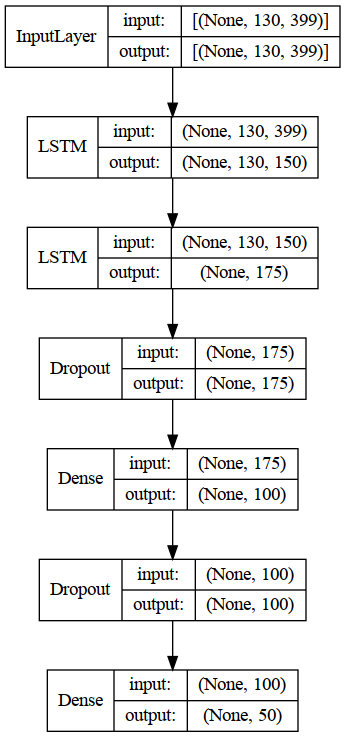

In [143]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

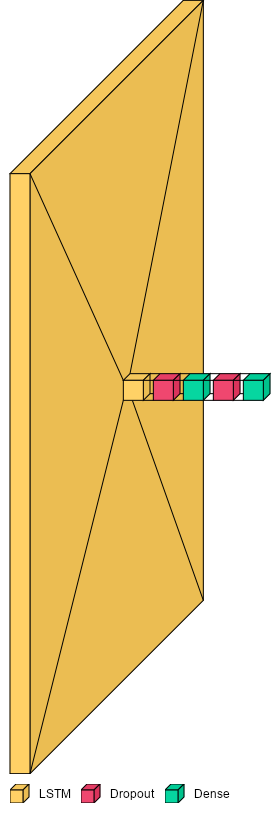

In [144]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [147]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 LSTM/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [148]:
hist_df = pd.read_csv('2 LSTM/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.147245,1.0,2.445876,0.644810
496,0.146496,1.0,2.421929,0.656080
497,0.145896,1.0,2.503781,0.657559
498,0.145472,1.0,2.503274,0.659128
499,0.144498,1.0,2.540223,0.646852


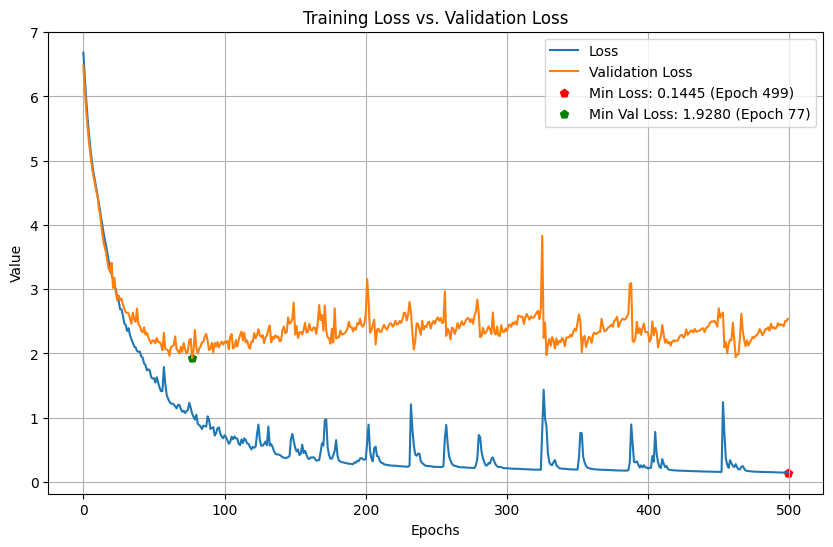

In [149]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

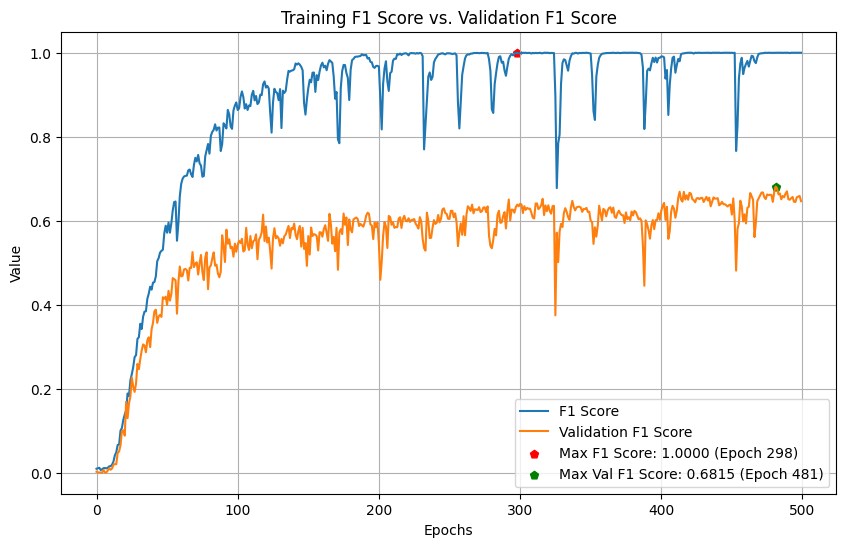

In [150]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [151]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 24ms/step - loss: 2.2822 - f1_score: 0.6815


[2.282166004180908, 0.6814804077148438]

In [152]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 2s 25ms/step - loss: 0.1515 - f1_score: 1.0000


[0.15145191550254822, 1.0]

In [153]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 22ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      1.000     0.800     0.889        10
         BEE      0.600     0.300     0.400        10
        BELT      0.800     1.000     0.889         4
        BITE      1.000     0.750     0.857         8
   BREAKFAST      0.600     1.000     0.750         6
      CANCER      1.000     0.875     0.933         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      0.667     1.000     0.800         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.333     0.333     0.333         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      1.000     0.875     0.933         8
     DEVELOP      0.667     0.333     0.444         6
      DINNER      0.667     0.750     0.706         8
         DOG      0.429    

In [135]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 LSTM Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [137]:
act_function = mish
model = Sequential()
model.add(LSTM(units=150,return_sequences=True,input_shape=(130,126),kernel_regularizer=regularizers.l2(.00016577111356694404)))
model.add(LSTM(units=200,return_sequences=False,input_shape=(130,126),kernel_regularizer=regularizers.l2(.001678637274473244)))
model.add(Dropout(.35))
model.add(Dense(units=100,activation=act_function))
model.add(Dropout(.35))
model.add(Dense(50, activation='softmax'))
model.compile(tf.optimizers.experimental.Nadam(.0005968991218820336),loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 130, 150)          166200    
                                                                 
 lstm_7 (LSTM)               (None, 200)               280800    
                                                                 
 dropout_6 (Dropout)         (None, 200)               0         
                                                                 
 dense_6 (Dense)             (None, 100)               20100     
                                                                 
 dropout_7 (Dropout)         (None, 100)               0         
                                                                 
 dense_7 (Dense)             (None, 50)                5050      
                                                                 
Total params: 472,150
Trainable params: 472,150
Non-tr

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 25s 678ms/step - loss: 4.2880 - f1_score: 0.0152 - val_loss: 4.1226 - val_f1_score: 0.0070
Epoch 2/500
28/28 [==============================] - ETA: 0s - loss: 3.9153 - f1_score: 0.0253

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 576ms/step - loss: 3.9153 - f1_score: 0.0253 - val_loss: 3.7402 - val_f1_score: 0.0101
Epoch 3/500
28/28 [==============================] - ETA: 0s - loss: 3.7534 - f1_score: 0.0265

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 567ms/step - loss: 3.7534 - f1_score: 0.0265 - val_loss: 3.6646 - val_f1_score: 0.0151
Epoch 4/500
28/28 [==============================] - ETA: 0s - loss: 3.6494 - f1_score: 0.0398

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 552ms/step - loss: 3.6494 - f1_score: 0.0398 - val_loss: 3.5342 - val_f1_score: 0.0162
Epoch 5/500
28/28 [==============================] - ETA: 0s - loss: 3.5417 - f1_score: 0.0396

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 549ms/step - loss: 3.5417 - f1_score: 0.0396 - val_loss: 3.4473 - val_f1_score: 0.0172
Epoch 6/500
28/28 [==============================] - ETA: 0s - loss: 3.4250 - f1_score: 0.0553

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 639ms/step - loss: 3.4250 - f1_score: 0.0553 - val_loss: 3.2928 - val_f1_score: 0.0366
Epoch 7/500
28/28 [==============================] - 3s 110ms/step - loss: 3.3378 - f1_score: 0.0546 - val_loss: 3.2348 - val_f1_score: 0.0354
Epoch 8/500
28/28 [==============================] - ETA: 0s - loss: 3.2097 - f1_score: 0.0776

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 566ms/step - loss: 3.2097 - f1_score: 0.0776 - val_loss: 3.0559 - val_f1_score: 0.0639
Epoch 9/500
28/28 [==============================] - ETA: 0s - loss: 3.0474 - f1_score: 0.0930

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 566ms/step - loss: 3.0474 - f1_score: 0.0930 - val_loss: 2.8771 - val_f1_score: 0.1136
Epoch 10/500
28/28 [==============================] - 3s 110ms/step - loss: 2.9364 - f1_score: 0.1165 - val_loss: 2.8750 - val_f1_score: 0.1015
Epoch 11/500
28/28 [==============================] - 3s 110ms/step - loss: 2.8274 - f1_score: 0.1424 - val_loss: 2.7864 - val_f1_score: 0.0876
Epoch 12/500
28/28 [==============================] - ETA: 0s - loss: 2.7039 - f1_score: 0.1756

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 633ms/step - loss: 2.7039 - f1_score: 0.1756 - val_loss: 2.6411 - val_f1_score: 0.1770
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 2.5845 - f1_score: 0.1888

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 567ms/step - loss: 2.5845 - f1_score: 0.1888 - val_loss: 2.5864 - val_f1_score: 0.1861
Epoch 14/500
28/28 [==============================] - ETA: 0s - loss: 2.4962 - f1_score: 0.2211

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 587ms/step - loss: 2.4962 - f1_score: 0.2211 - val_loss: 2.5821 - val_f1_score: 0.2097
Epoch 15/500
28/28 [==============================] - ETA: 0s - loss: 2.4259 - f1_score: 0.2532

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 550ms/step - loss: 2.4259 - f1_score: 0.2532 - val_loss: 2.5090 - val_f1_score: 0.2387
Epoch 16/500
28/28 [==============================] - ETA: 0s - loss: 2.3115 - f1_score: 0.2700

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 601ms/step - loss: 2.3115 - f1_score: 0.2700 - val_loss: 2.4138 - val_f1_score: 0.2803
Epoch 17/500
28/28 [==============================] - ETA: 0s - loss: 2.1874 - f1_score: 0.3204

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 540ms/step - loss: 2.1874 - f1_score: 0.3204 - val_loss: 2.3613 - val_f1_score: 0.2999
Epoch 18/500
28/28 [==============================] - ETA: 0s - loss: 2.1015 - f1_score: 0.3333

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 585ms/step - loss: 2.1015 - f1_score: 0.3333 - val_loss: 2.2819 - val_f1_score: 0.3373
Epoch 19/500
28/28 [==============================] - 3s 110ms/step - loss: 2.0590 - f1_score: 0.3523 - val_loss: 2.6875 - val_f1_score: 0.2442
Epoch 20/500
28/28 [==============================] - ETA: 0s - loss: 2.0017 - f1_score: 0.3687

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 544ms/step - loss: 2.0017 - f1_score: 0.3687 - val_loss: 2.2402 - val_f1_score: 0.3432
Epoch 21/500
28/28 [==============================] - ETA: 0s - loss: 1.8938 - f1_score: 0.4038

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 618ms/step - loss: 1.8938 - f1_score: 0.4038 - val_loss: 2.1310 - val_f1_score: 0.3640
Epoch 22/500
28/28 [==============================] - 3s 110ms/step - loss: 1.9030 - f1_score: 0.4064 - val_loss: 2.7500 - val_f1_score: 0.2664
Epoch 23/500
28/28 [==============================] - ETA: 0s - loss: 1.9459 - f1_score: 0.4074

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 14s 530ms/step - loss: 1.9459 - f1_score: 0.4074 - val_loss: 2.1599 - val_f1_score: 0.4332
Epoch 24/500
28/28 [==============================] - ETA: 0s - loss: 1.7845 - f1_score: 0.4439

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 562ms/step - loss: 1.7845 - f1_score: 0.4439 - val_loss: 2.0853 - val_f1_score: 0.4470
Epoch 25/500
28/28 [==============================] - 3s 110ms/step - loss: 1.7017 - f1_score: 0.4600 - val_loss: 2.1151 - val_f1_score: 0.4235
Epoch 26/500
28/28 [==============================] - 3s 110ms/step - loss: 1.7663 - f1_score: 0.4610 - val_loss: 2.1708 - val_f1_score: 0.4386
Epoch 27/500
28/28 [==============================] - ETA: 0s - loss: 1.6940 - f1_score: 0.4740

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 569ms/step - loss: 1.6940 - f1_score: 0.4740 - val_loss: 1.9802 - val_f1_score: 0.4722
Epoch 28/500
28/28 [==============================] - ETA: 0s - loss: 1.5844 - f1_score: 0.5055

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 593ms/step - loss: 1.5844 - f1_score: 0.5055 - val_loss: 2.0070 - val_f1_score: 0.5025
Epoch 29/500
28/28 [==============================] - 3s 110ms/step - loss: 1.4758 - f1_score: 0.5425 - val_loss: 1.9674 - val_f1_score: 0.4951
Epoch 30/500
28/28 [==============================] - 3s 110ms/step - loss: 1.4395 - f1_score: 0.5592 - val_loss: 2.0154 - val_f1_score: 0.4683
Epoch 31/500
28/28 [==============================] - 3s 110ms/step - loss: 1.5016 - f1_score: 0.5439 - val_loss: 1.9426 - val_f1_score: 0.4841
Epoch 32/500
28/28 [==============================] - ETA: 0s - loss: 1.4136 - f1_score: 0.5774

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 562ms/step - loss: 1.4136 - f1_score: 0.5774 - val_loss: 1.9218 - val_f1_score: 0.5224
Epoch 33/500
28/28 [==============================] - 3s 110ms/step - loss: 1.2929 - f1_score: 0.6078 - val_loss: 2.1100 - val_f1_score: 0.4910
Epoch 34/500
28/28 [==============================] - ETA: 0s - loss: 1.3254 - f1_score: 0.6135

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 625ms/step - loss: 1.3254 - f1_score: 0.6135 - val_loss: 1.8715 - val_f1_score: 0.5442
Epoch 35/500
28/28 [==============================] - 3s 110ms/step - loss: 1.3021 - f1_score: 0.6173 - val_loss: 1.9869 - val_f1_score: 0.4850
Epoch 36/500
28/28 [==============================] - 3s 110ms/step - loss: 1.2973 - f1_score: 0.6094 - val_loss: 1.8540 - val_f1_score: 0.5370
Epoch 37/500
28/28 [==============================] - ETA: 0s - loss: 1.3180 - f1_score: 0.6139

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 535ms/step - loss: 1.3180 - f1_score: 0.6139 - val_loss: 1.7187 - val_f1_score: 0.5609
Epoch 38/500
28/28 [==============================] - 3s 110ms/step - loss: 1.2120 - f1_score: 0.6352 - val_loss: 1.8428 - val_f1_score: 0.5356
Epoch 39/500
28/28 [==============================] - ETA: 0s - loss: 1.1253 - f1_score: 0.6630

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 624ms/step - loss: 1.1253 - f1_score: 0.6630 - val_loss: 1.6631 - val_f1_score: 0.5706
Epoch 40/500
28/28 [==============================] - 3s 110ms/step - loss: 1.0777 - f1_score: 0.6909 - val_loss: 1.7144 - val_f1_score: 0.5612
Epoch 41/500
28/28 [==============================] - ETA: 0s - loss: 1.1578 - f1_score: 0.6768

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 566ms/step - loss: 1.1578 - f1_score: 0.6768 - val_loss: 1.7111 - val_f1_score: 0.5763
Epoch 42/500
28/28 [==============================] - ETA: 0s - loss: 1.1539 - f1_score: 0.6657

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 576ms/step - loss: 1.1539 - f1_score: 0.6657 - val_loss: 1.7172 - val_f1_score: 0.5775
Epoch 43/500
28/28 [==============================] - ETA: 0s - loss: 1.0250 - f1_score: 0.7262

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 606ms/step - loss: 1.0250 - f1_score: 0.7262 - val_loss: 1.7254 - val_f1_score: 0.5840
Epoch 44/500
28/28 [==============================] - ETA: 0s - loss: 0.9806 - f1_score: 0.7190

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 14s 524ms/step - loss: 0.9806 - f1_score: 0.7190 - val_loss: 1.6936 - val_f1_score: 0.5866
Epoch 45/500
28/28 [==============================] - ETA: 0s - loss: 0.8996 - f1_score: 0.7467

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 582ms/step - loss: 0.8996 - f1_score: 0.7467 - val_loss: 1.6309 - val_f1_score: 0.6191
Epoch 46/500
28/28 [==============================] - 3s 109ms/step - loss: 0.9166 - f1_score: 0.7402 - val_loss: 1.7931 - val_f1_score: 0.5557
Epoch 47/500
28/28 [==============================] - 3s 110ms/step - loss: 0.9233 - f1_score: 0.7512 - val_loss: 1.6915 - val_f1_score: 0.6000
Epoch 48/500
28/28 [==============================] - ETA: 0s - loss: 0.8847 - f1_score: 0.7426

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 15s 545ms/step - loss: 0.8847 - f1_score: 0.7426 - val_loss: 1.6214 - val_f1_score: 0.6368
Epoch 49/500
28/28 [==============================] - 3s 109ms/step - loss: 0.8462 - f1_score: 0.7634 - val_loss: 1.7288 - val_f1_score: 0.6154
Epoch 50/500
28/28 [==============================] - 3s 110ms/step - loss: 0.8546 - f1_score: 0.7657 - val_loss: 1.6877 - val_f1_score: 0.5869
Epoch 51/500
28/28 [==============================] - 3s 110ms/step - loss: 0.9222 - f1_score: 0.7515 - val_loss: 1.7517 - val_f1_score: 0.6216
Epoch 52/500
28/28 [==============================] - 3s 112ms/step - loss: 0.8604 - f1_score: 0.7680 - val_loss: 1.6441 - val_f1_score: 0.6207
Epoch 53/500
28/28 [==============================] - 3s 112ms/step - loss: 0.8809 - f1_score: 0.7555 - val_loss: 1.6870 - val_f1_score: 0.6192
Epoch 54/500
28/28 [==============================] - 3s 113ms/step - loss: 0.8010 - f1_score: 0.7843 - val_loss: 1.6831 - val_f1_score: 0.6063
Epoc

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 18s 656ms/step - loss: 0.7208 - f1_score: 0.8106 - val_loss: 1.6083 - val_f1_score: 0.6594
Epoch 60/500
28/28 [==============================] - 3s 110ms/step - loss: 0.6375 - f1_score: 0.8333 - val_loss: 1.6095 - val_f1_score: 0.6277
Epoch 61/500
28/28 [==============================] - 3s 112ms/step - loss: 1.0468 - f1_score: 0.7454 - val_loss: 2.0680 - val_f1_score: 0.5343
Epoch 62/500
28/28 [==============================] - 3s 113ms/step - loss: 1.3577 - f1_score: 0.6400 - val_loss: 2.0432 - val_f1_score: 0.5346
Epoch 63/500
28/28 [==============================] - 3s 112ms/step - loss: 1.1366 - f1_score: 0.6773 - val_loss: 1.6691 - val_f1_score: 0.5924
Epoch 64/500
28/28 [==============================] - 3s 114ms/step - loss: 0.8857 - f1_score: 0.7545 - val_loss: 1.6010 - val_f1_score: 0.6391
Epoch 65/500
28/28 [==============================] - 3s 115ms/step - loss: 0.7853 - f1_score: 0.7934 - val_loss: 1.6744 - val_f1_score: 0.6580
Epoc

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 618ms/step - loss: 0.6781 - f1_score: 0.8293 - val_loss: 1.6098 - val_f1_score: 0.6772
Epoch 68/500
28/28 [==============================] - 3s 111ms/step - loss: 0.6287 - f1_score: 0.8453 - val_loss: 1.6049 - val_f1_score: 0.6720
Epoch 69/500
28/28 [==============================] - ETA: 0s - loss: 0.6171 - f1_score: 0.8525

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 611ms/step - loss: 0.6171 - f1_score: 0.8525 - val_loss: 1.6878 - val_f1_score: 0.6919
Epoch 70/500
28/28 [==============================] - 3s 110ms/step - loss: 0.5111 - f1_score: 0.8768 - val_loss: 1.7524 - val_f1_score: 0.6724
Epoch 71/500
28/28 [==============================] - 3s 111ms/step - loss: 0.5199 - f1_score: 0.8740 - val_loss: 1.6428 - val_f1_score: 0.6901
Epoch 72/500
28/28 [==============================] - 3s 113ms/step - loss: 0.5430 - f1_score: 0.8696 - val_loss: 1.7211 - val_f1_score: 0.6821
Epoch 73/500
28/28 [==============================] - 3s 114ms/step - loss: 0.7184 - f1_score: 0.8223 - val_loss: 1.7604 - val_f1_score: 0.6506
Epoch 74/500
28/28 [==============================] - ETA: 0s - loss: 0.6276 - f1_score: 0.8421

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 620ms/step - loss: 0.6276 - f1_score: 0.8421 - val_loss: 1.6330 - val_f1_score: 0.6977
Epoch 75/500
28/28 [==============================] - 3s 111ms/step - loss: 0.5343 - f1_score: 0.8676 - val_loss: 1.6333 - val_f1_score: 0.6750
Epoch 76/500
28/28 [==============================] - ETA: 0s - loss: 0.4677 - f1_score: 0.8933

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 639ms/step - loss: 0.4677 - f1_score: 0.8933 - val_loss: 1.5673 - val_f1_score: 0.6991
Epoch 77/500
28/28 [==============================] - ETA: 0s - loss: 0.4342 - f1_score: 0.9047

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 584ms/step - loss: 0.4342 - f1_score: 0.9047 - val_loss: 1.6218 - val_f1_score: 0.7042
Epoch 78/500
28/28 [==============================] - 3s 110ms/step - loss: 0.4026 - f1_score: 0.9111 - val_loss: 1.7871 - val_f1_score: 0.7029
Epoch 79/500
28/28 [==============================] - 3s 111ms/step - loss: 0.5354 - f1_score: 0.8749 - val_loss: 1.8343 - val_f1_score: 0.6551
Epoch 80/500
28/28 [==============================] - ETA: 0s - loss: 0.5397 - f1_score: 0.8758

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 615ms/step - loss: 0.5397 - f1_score: 0.8758 - val_loss: 1.7096 - val_f1_score: 0.7085
Epoch 81/500
28/28 [==============================] - 3s 110ms/step - loss: 0.4281 - f1_score: 0.9045 - val_loss: 1.7997 - val_f1_score: 0.6954
Epoch 82/500
28/28 [==============================] - 3s 110ms/step - loss: 0.4143 - f1_score: 0.9049 - val_loss: 1.8820 - val_f1_score: 0.6765
Epoch 83/500
28/28 [==============================] - 3s 111ms/step - loss: 0.5699 - f1_score: 0.8718 - val_loss: 1.7278 - val_f1_score: 0.6762
Epoch 84/500
28/28 [==============================] - 3s 112ms/step - loss: 0.5410 - f1_score: 0.8741 - val_loss: 1.8311 - val_f1_score: 0.6837
Epoch 85/500
28/28 [==============================] - 3s 113ms/step - loss: 0.7183 - f1_score: 0.8292 - val_loss: 1.7869 - val_f1_score: 0.6674
Epoch 86/500
28/28 [==============================] - 3s 114ms/step - loss: 0.7554 - f1_score: 0.8081 - val_loss: 1.8608 - val_f1_score: 0.6261
Epoc

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 18s 670ms/step - loss: 0.3128 - f1_score: 0.9404 - val_loss: 1.7040 - val_f1_score: 0.7121
Epoch 95/500
28/28 [==============================] - 3s 110ms/step - loss: 0.3529 - f1_score: 0.9280 - val_loss: 1.7974 - val_f1_score: 0.6921
Epoch 96/500
28/28 [==============================] - 3s 112ms/step - loss: 0.3227 - f1_score: 0.9363 - val_loss: 1.8403 - val_f1_score: 0.6858
Epoch 97/500
28/28 [==============================] - ETA: 0s - loss: 0.3184 - f1_score: 0.9376

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 20s 742ms/step - loss: 0.3184 - f1_score: 0.9376 - val_loss: 1.7013 - val_f1_score: 0.7173
Epoch 98/500
28/28 [==============================] - 3s 111ms/step - loss: 0.3657 - f1_score: 0.9202 - val_loss: 1.8624 - val_f1_score: 0.6774
Epoch 99/500
28/28 [==============================] - 3s 114ms/step - loss: 0.3536 - f1_score: 0.9273 - val_loss: 1.6955 - val_f1_score: 0.7146
Epoch 100/500
28/28 [==============================] - 3s 118ms/step - loss: 0.3055 - f1_score: 0.9416 - val_loss: 1.7818 - val_f1_score: 0.7101
Epoch 101/500
28/28 [==============================] - 3s 116ms/step - loss: 0.3514 - f1_score: 0.9304 - val_loss: 1.8166 - val_f1_score: 0.6862
Epoch 102/500
28/28 [==============================] - 3s 115ms/step - loss: 0.3030 - f1_score: 0.9373 - val_loss: 1.8741 - val_f1_score: 0.6914
Epoch 103/500
28/28 [==============================] - 3s 116ms/step - loss: 0.2798 - f1_score: 0.9495 - val_loss: 1.7907 - val_f1_score: 0.7118


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 18s 657ms/step - loss: 0.2652 - f1_score: 0.9516 - val_loss: 1.8281 - val_f1_score: 0.7175
Epoch 105/500
28/28 [==============================] - 3s 110ms/step - loss: 0.3379 - f1_score: 0.9289 - val_loss: 1.9163 - val_f1_score: 0.6775
Epoch 106/500
28/28 [==============================] - 3s 113ms/step - loss: 0.3768 - f1_score: 0.9167 - val_loss: 2.0371 - val_f1_score: 0.6733
Epoch 107/500
28/28 [==============================] - 3s 114ms/step - loss: 0.3957 - f1_score: 0.9090 - val_loss: 2.0317 - val_f1_score: 0.6872
Epoch 108/500
28/28 [==============================] - 3s 114ms/step - loss: 0.4163 - f1_score: 0.9021 - val_loss: 1.7184 - val_f1_score: 0.6804
Epoch 109/500
28/28 [==============================] - 3s 114ms/step - loss: 0.3997 - f1_score: 0.9058 - val_loss: 1.8472 - val_f1_score: 0.6960
Epoch 110/500
28/28 [==============================] - 3s 116ms/step - loss: 0.3560 - f1_score: 0.9245 - val_loss: 1.8658 - val_f1_score: 0.693

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 19s 716ms/step - loss: 0.2822 - f1_score: 0.9486 - val_loss: 1.5651 - val_f1_score: 0.7253
Epoch 131/500
28/28 [==============================] - 3s 111ms/step - loss: 0.2638 - f1_score: 0.9583 - val_loss: 1.9691 - val_f1_score: 0.6864
Epoch 132/500
28/28 [==============================] - ETA: 0s - loss: 0.2931 - f1_score: 0.9483

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 592ms/step - loss: 0.2931 - f1_score: 0.9483 - val_loss: 1.8089 - val_f1_score: 0.7335
Epoch 133/500
28/28 [==============================] - ETA: 0s - loss: 0.2944 - f1_score: 0.9496

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 643ms/step - loss: 0.2944 - f1_score: 0.9496 - val_loss: 1.7797 - val_f1_score: 0.7343
Epoch 134/500
28/28 [==============================] - 3s 110ms/step - loss: 0.2291 - f1_score: 0.9653 - val_loss: 1.9054 - val_f1_score: 0.7287
Epoch 135/500
28/28 [==============================] - ETA: 0s - loss: 0.1898 - f1_score: 0.9791

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 17s 625ms/step - loss: 0.1898 - f1_score: 0.9791 - val_loss: 1.7797 - val_f1_score: 0.7512
Epoch 136/500
28/28 [==============================] - 3s 110ms/step - loss: 0.2217 - f1_score: 0.9687 - val_loss: 1.8488 - val_f1_score: 0.7379
Epoch 137/500
28/28 [==============================] - 3s 111ms/step - loss: 0.2567 - f1_score: 0.9549 - val_loss: 2.1291 - val_f1_score: 0.6971
Epoch 138/500
28/28 [==============================] - 3s 113ms/step - loss: 0.2991 - f1_score: 0.9437 - val_loss: 1.8197 - val_f1_score: 0.7399
Epoch 139/500
28/28 [==============================] - 3s 113ms/step - loss: 0.2363 - f1_score: 0.9654 - val_loss: 1.8876 - val_f1_score: 0.7111
Epoch 140/500
28/28 [==============================] - 3s 114ms/step - loss: 0.2055 - f1_score: 0.9697 - val_loss: 1.9560 - val_f1_score: 0.7179
Epoch 141/500
28/28 [==============================] - 3s 114ms/step - loss: 0.2056 - f1_score: 0.9695 - val_loss: 1.9450 - val_f1_score: 0.716

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 19s 692ms/step - loss: 0.1355 - f1_score: 0.9918 - val_loss: 1.8538 - val_f1_score: 0.7571
Epoch 159/500
28/28 [==============================] - 3s 111ms/step - loss: 0.1320 - f1_score: 0.9920 - val_loss: 1.9456 - val_f1_score: 0.7528
Epoch 160/500
28/28 [==============================] - ETA: 0s - loss: 0.1283 - f1_score: 0.9932

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 18s 652ms/step - loss: 0.1283 - f1_score: 0.9932 - val_loss: 1.9586 - val_f1_score: 0.7575
Epoch 161/500
28/28 [==============================] - ETA: 0s - loss: 0.1197 - f1_score: 0.9969

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 18s 647ms/step - loss: 0.1197 - f1_score: 0.9969 - val_loss: 1.9742 - val_f1_score: 0.7610
Epoch 162/500
28/28 [==============================] - 3s 110ms/step - loss: 0.1172 - f1_score: 0.9964 - val_loss: 1.9867 - val_f1_score: 0.7586
Epoch 163/500
28/28 [==============================] - 3s 111ms/step - loss: 0.1303 - f1_score: 0.9938 - val_loss: 2.0137 - val_f1_score: 0.7321
Epoch 164/500
28/28 [==============================] - 3s 115ms/step - loss: 0.1538 - f1_score: 0.9817 - val_loss: 2.0746 - val_f1_score: 0.7289
Epoch 165/500
28/28 [==============================] - 3s 116ms/step - loss: 0.2763 - f1_score: 0.9546 - val_loss: 2.1340 - val_f1_score: 0.7359
Epoch 166/500
28/28 [==============================] - 3s 120ms/step - loss: 0.3336 - f1_score: 0.9341 - val_loss: 2.2990 - val_f1_score: 0.7087
Epoch 167/500
28/28 [==============================] - 3s 117ms/step - loss: 0.4211 - f1_score: 0.9133 - val_loss: 2.2139 - val_f1_score: 0.662

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 19s 707ms/step - loss: 0.1022 - f1_score: 0.9984 - val_loss: 1.8639 - val_f1_score: 0.7656
Epoch 226/500
28/28 [==============================] - ETA: 0s - loss: 0.1005 - f1_score: 0.9985

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 16s 593ms/step - loss: 0.1005 - f1_score: 0.9985 - val_loss: 1.8516 - val_f1_score: 0.7812
Epoch 227/500
28/28 [==============================] - 3s 111ms/step - loss: 0.0959 - f1_score: 0.9993 - val_loss: 1.8702 - val_f1_score: 0.7707
Epoch 228/500
28/28 [==============================] - 3s 114ms/step - loss: 0.0953 - f1_score: 0.9986 - val_loss: 1.9023 - val_f1_score: 0.7620
Epoch 229/500
28/28 [==============================] - 3s 114ms/step - loss: 0.0910 - f1_score: 0.9996 - val_loss: 1.9365 - val_f1_score: 0.7569
Epoch 230/500
28/28 [==============================] - 3s 116ms/step - loss: 0.0904 - f1_score: 0.9996 - val_loss: 1.9501 - val_f1_score: 0.7566
Epoch 231/500
28/28 [==============================] - 3s 118ms/step - loss: 0.0883 - f1_score: 0.9996 - val_loss: 1.9802 - val_f1_score: 0.7499
Epoch 232/500
28/28 [==============================] - 3s 116ms/step - loss: 0.0873 - f1_score: 0.9993 - val_loss: 1.9895 - val_f1_score: 0.755

28/28 [==============================] - 3s 119ms/step - loss: 0.0879 - f1_score: 0.9996 - val_loss: 2.0195 - val_f1_score: 0.7403
Epoch 339/500
28/28 [==============================] - 3s 118ms/step - loss: 0.0863 - f1_score: 0.9996 - val_loss: 2.0375 - val_f1_score: 0.7331
Epoch 340/500
28/28 [==============================] - 3s 119ms/step - loss: 0.0855 - f1_score: 0.9996 - val_loss: 2.0800 - val_f1_score: 0.7296
Epoch 341/500
28/28 [==============================] - 3s 119ms/step - loss: 0.1044 - f1_score: 0.9939 - val_loss: 2.1385 - val_f1_score: 0.7359
Epoch 342/500
28/28 [==============================] - 4s 130ms/step - loss: 0.2737 - f1_score: 0.9584 - val_loss: 2.1973 - val_f1_score: 0.6937
Epoch 343/500
28/28 [==============================] - 3s 122ms/step - loss: 0.5943 - f1_score: 0.8784 - val_loss: 2.2118 - val_f1_score: 0.6827
Epoch 344/500
28/28 [==============================] - 3s 121ms/step - loss: 0.5014 - f1_score: 0.8891 - val_loss: 2.0047 - val_f1_score: 0.6580

INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


INFO:tensorflow:Assets written to: 2 LSTM Mish/assets


28/28 [==============================] - 40s 1s/step - loss: 0.0681 - f1_score: 1.0000 - val_loss: 2.0334 - val_f1_score: 0.7836
Epoch 399/500
28/28 [==============================] - 3s 111ms/step - loss: 0.0679 - f1_score: 1.0000 - val_loss: 2.0919 - val_f1_score: 0.7684
Epoch 400/500
28/28 [==============================] - 3s 115ms/step - loss: 0.0675 - f1_score: 0.9996 - val_loss: 2.0836 - val_f1_score: 0.7719
Epoch 401/500
28/28 [==============================] - 3s 113ms/step - loss: 0.0662 - f1_score: 1.0000 - val_loss: 2.0962 - val_f1_score: 0.7721
Epoch 402/500
28/28 [==============================] - 3s 116ms/step - loss: 0.0650 - f1_score: 1.0000 - val_loss: 2.1031 - val_f1_score: 0.7770
Epoch 403/500
28/28 [==============================] - 3s 116ms/step - loss: 0.0650 - f1_score: 1.0000 - val_loss: 2.0927 - val_f1_score: 0.7753
Epoch 404/500
28/28 [==============================] - 3s 117ms/step - loss: 0.0637 - f1_score: 1.0000 - val_loss: 2.0970 - val_f1_score: 0.7751
E

In [138]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 21ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      1.000     0.667     0.800         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     0.600     0.750        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     1.000     1.000         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      1.000     0.875     0.933         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      0.833     0.833     0.833         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     1.000     1.000         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.571     0.500     0.533         8
     DEVELOP      0.375     0.500     0.429         6
      DINNER      0.714     0.625     0.667         8
         DOG      0.857    

In [139]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 LSTM Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [140]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.066977,1.0,1.995765,0.767412
496,0.065839,1.0,2.015766,0.762284
497,0.065297,1.0,2.010342,0.756767
498,0.064190,1.0,2.018294,0.756416
499,0.063303,1.0,2.029406,0.756384


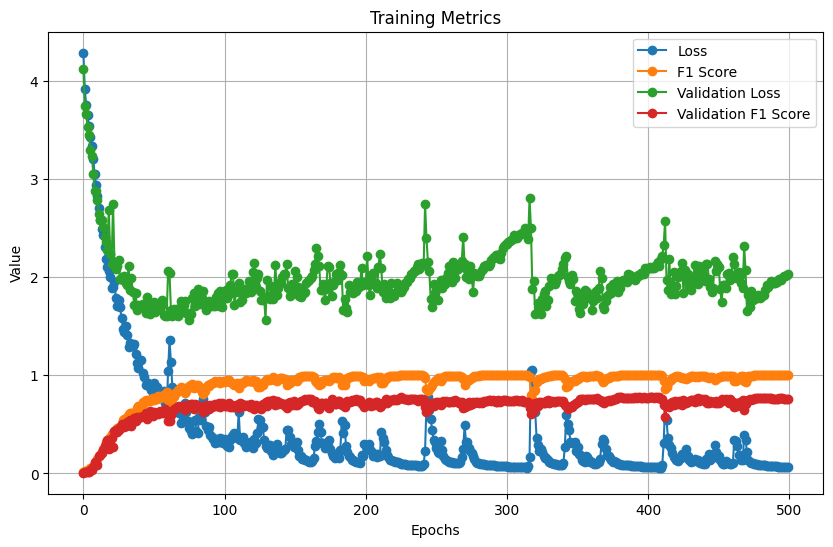

In [141]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [141]:
reconstructed_model = tf.keras.models.load_model("2 LSTM Mish")

In [143]:
reconstructed_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 130, 150)          166200    
                                                                 
 lstm_7 (LSTM)               (None, 200)               280800    
                                                                 
 dropout_6 (Dropout)         (None, 200)               0         
                                                                 
 dense_6 (Dense)             (None, 100)               20100     
                                                                 
 dropout_7 (Dropout)         (None, 100)               0         
                                                                 
 dense_7 (Dense)             (None, 50)                5050      
                                                                 
Total params: 472,150
Trainable params: 472,150
Non-tr

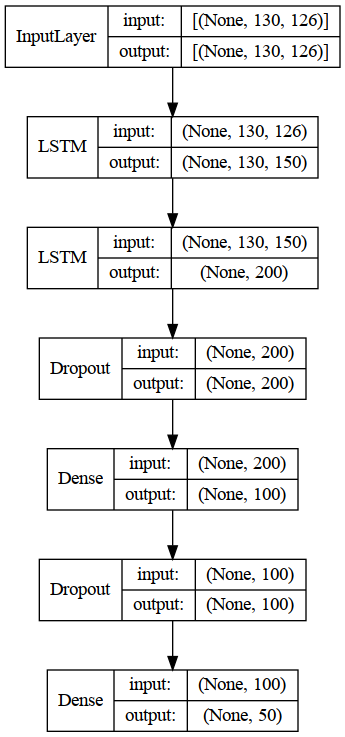

In [144]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [143]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 22ms/step - loss: 2.0334 - f1_score: 0.7836


[2.033409595489502, 0.7836350202560425]

In [144]:
reconstructed_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 130, 150)          166200    
                                                                 
 lstm_7 (LSTM)               (None, 200)               280800    
                                                                 
 dropout_6 (Dropout)         (None, 200)               0         
                                                                 
 dense_6 (Dense)             (None, 100)               20100     
                                                                 
 dropout_7 (Dropout)         (None, 100)               0         
                                                                 
 dense_7 (Dense)             (None, 50)                5050      
                                                                 
Total params: 472,150
Trainable params: 472,150
Non-tr

In [145]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

In [146]:
#cm = confusion_matrix(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1))

#sns.heatmap(cm, annot = True)

print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 20ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      1.000     0.667     0.800         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     0.800     0.889        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     1.000     1.000         8
   BREAKFAST      0.600     1.000     0.750         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.500     0.667         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     1.000     1.000         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      0.750     0.750     0.750         8
     DEVELOP      0.375     0.500     0.429         6
      DINNER      0.833     0.625     0.714         8
         DOG      0.857    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [147]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 LSTM Lecunnormal/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [149]:
act_function = 'selu'
initializer = tf.keras.initializers.LecunNormal(seed=10)
model = Sequential()
model.add(LSTM(units=150,return_sequences=True,input_shape=(130,126), kernel_initializer = initializer,
               kernel_regularizer=regularizers.l2(.00016577111356694404)))
model.add(LSTM(units=200,return_sequences=False,input_shape=(130,126),kernel_initializer = initializer,
               kernel_regularizer=regularizers.l2(.001678637274473244)))
#model.add(Dropout(.35))
model.add(Dense(units=100,activation=act_function, kernel_initializer = initializer))
#model.add(Dropout(.35))
model.add(Dense(50, activation='softmax'))
model.compile(tf.optimizers.experimental.Nadam(.0005968991218820336),loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 130, 150)          166200    
                                                                 
 lstm_11 (LSTM)              (None, 200)               280800    
                                                                 
 dense_10 (Dense)            (None, 100)               20100     
                                                                 
 dense_11 (Dense)            (None, 50)                5050      
                                                                 
Total params: 472,150
Trainable params: 472,150
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
28/28 [==============================] - 11s 156ms/step - loss: 5.1456 - f1_score: 0.0191 - val_loss: 4.7812 - val_f1_score: 0.0097
Epoch 2/500
28/28 [=================

INFO:tensorflow:Assets written to: 2 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 LSTM Lecunnormal/assets


28/28 [==============================] - 20s 732ms/step - loss: 0.3074 - f1_score: 0.9748 - val_loss: 1.3189 - val_f1_score: 0.7666
Epoch 61/500
28/28 [==============================] - 3s 111ms/step - loss: 0.2798 - f1_score: 0.9806 - val_loss: 1.3639 - val_f1_score: 0.7280
Epoch 62/500
28/28 [==============================] - 3s 113ms/step - loss: 0.2556 - f1_score: 0.9869 - val_loss: 1.2828 - val_f1_score: 0.7483
Epoch 63/500
28/28 [==============================] - 3s 116ms/step - loss: 0.2466 - f1_score: 0.9916 - val_loss: 1.4387 - val_f1_score: 0.7255
Epoch 64/500
28/28 [==============================] - 3s 115ms/step - loss: 0.2414 - f1_score: 0.9920 - val_loss: 1.3745 - val_f1_score: 0.7520
Epoch 65/500
28/28 [==============================] - 3s 116ms/step - loss: 0.2438 - f1_score: 0.9865 - val_loss: 1.3802 - val_f1_score: 0.7379
Epoch 66/500
28/28 [==============================] - 3s 117ms/step - loss: 0.2433 - f1_score: 0.9851 - val_loss: 1.3805 - val_f1_score: 0.7400
Epoc

Epoch 117/500
28/28 [==============================] - 3s 121ms/step - loss: 0.1352 - f1_score: 1.0000 - val_loss: 1.6596 - val_f1_score: 0.7450
Epoch 118/500
28/28 [==============================] - 3s 119ms/step - loss: 0.1337 - f1_score: 1.0000 - val_loss: 1.6688 - val_f1_score: 0.7427
Epoch 119/500
28/28 [==============================] - 3s 120ms/step - loss: 0.1322 - f1_score: 1.0000 - val_loss: 1.6704 - val_f1_score: 0.7452
Epoch 120/500
28/28 [==============================] - 3s 120ms/step - loss: 0.1307 - f1_score: 1.0000 - val_loss: 1.6792 - val_f1_score: 0.7452
Epoch 121/500
28/28 [==============================] - 3s 119ms/step - loss: 0.1292 - f1_score: 1.0000 - val_loss: 1.6826 - val_f1_score: 0.7457
Epoch 122/500
28/28 [==============================] - 3s 119ms/step - loss: 0.1277 - f1_score: 1.0000 - val_loss: 1.6897 - val_f1_score: 0.7457
Epoch 123/500
28/28 [==============================] - 3s 119ms/step - loss: 0.1263 - f1_score: 1.0000 - val_loss: 1.6960 - val_f1

INFO:tensorflow:Assets written to: 2 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 LSTM Lecunnormal/assets


28/28 [==============================] - 16s 577ms/step - loss: 0.1627 - f1_score: 0.9855 - val_loss: 1.2947 - val_f1_score: 0.7771
Epoch 176/500
28/28 [==============================] - 3s 112ms/step - loss: 0.2350 - f1_score: 0.9641 - val_loss: 1.4053 - val_f1_score: 0.7495
Epoch 177/500
28/28 [==============================] - 3s 113ms/step - loss: 0.2423 - f1_score: 0.9592 - val_loss: 1.7268 - val_f1_score: 0.6988
Epoch 178/500
28/28 [==============================] - 3s 114ms/step - loss: 0.2314 - f1_score: 0.9628 - val_loss: 1.5366 - val_f1_score: 0.7149
Epoch 179/500
28/28 [==============================] - 3s 115ms/step - loss: 0.2137 - f1_score: 0.9708 - val_loss: 1.3595 - val_f1_score: 0.7144
Epoch 180/500
28/28 [==============================] - 3s 115ms/step - loss: 0.2108 - f1_score: 0.9716 - val_loss: 1.3377 - val_f1_score: 0.7281
Epoch 181/500
28/28 [==============================] - 3s 116ms/step - loss: 0.1625 - f1_score: 0.9871 - val_loss: 1.3348 - val_f1_score: 0.746

INFO:tensorflow:Assets written to: 2 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 LSTM Lecunnormal/assets


28/28 [==============================] - 18s 676ms/step - loss: 0.1417 - f1_score: 0.9908 - val_loss: 1.3467 - val_f1_score: 0.7803
Epoch 217/500
28/28 [==============================] - ETA: 0s - loss: 0.1290 - f1_score: 0.9939

INFO:tensorflow:Assets written to: 2 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 LSTM Lecunnormal/assets


28/28 [==============================] - 16s 594ms/step - loss: 0.1290 - f1_score: 0.9939 - val_loss: 1.2394 - val_f1_score: 0.7918
Epoch 218/500
28/28 [==============================] - 3s 111ms/step - loss: 0.1143 - f1_score: 0.9993 - val_loss: 1.1759 - val_f1_score: 0.7774
Epoch 219/500
28/28 [==============================] - 3s 113ms/step - loss: 0.1074 - f1_score: 0.9996 - val_loss: 1.2235 - val_f1_score: 0.7754
Epoch 220/500
28/28 [==============================] - 3s 116ms/step - loss: 0.1037 - f1_score: 1.0000 - val_loss: 1.2479 - val_f1_score: 0.7614
Epoch 221/500
28/28 [==============================] - 3s 114ms/step - loss: 0.1022 - f1_score: 0.9996 - val_loss: 1.2409 - val_f1_score: 0.7699
Epoch 222/500
28/28 [==============================] - 3s 116ms/step - loss: 0.0997 - f1_score: 1.0000 - val_loss: 1.2525 - val_f1_score: 0.7716
Epoch 223/500
28/28 [==============================] - 3s 116ms/step - loss: 0.0981 - f1_score: 1.0000 - val_loss: 1.2545 - val_f1_score: 0.771

28/28 [==============================] - 3s 120ms/step - loss: 0.1886 - f1_score: 0.9684 - val_loss: 1.4440 - val_f1_score: 0.7466
Epoch 330/500
28/28 [==============================] - 3s 118ms/step - loss: 0.1783 - f1_score: 0.9721 - val_loss: 1.5421 - val_f1_score: 0.7123
Epoch 331/500
28/28 [==============================] - 3s 118ms/step - loss: 0.1681 - f1_score: 0.9785 - val_loss: 1.4831 - val_f1_score: 0.7287
Epoch 332/500
28/28 [==============================] - 3s 123ms/step - loss: 0.1839 - f1_score: 0.9725 - val_loss: 1.4490 - val_f1_score: 0.7428
Epoch 333/500
28/28 [==============================] - 3s 121ms/step - loss: 0.2156 - f1_score: 0.9609 - val_loss: 1.4890 - val_f1_score: 0.7158
Epoch 334/500
28/28 [==============================] - 3s 118ms/step - loss: 0.1545 - f1_score: 0.9808 - val_loss: 1.4494 - val_f1_score: 0.7501
Epoch 335/500
28/28 [==============================] - 3s 124ms/step - loss: 0.1278 - f1_score: 0.9901 - val_loss: 1.4248 - val_f1_score: 0.7430

28/28 [==============================] - 3s 118ms/step - loss: 0.1797 - f1_score: 0.9821 - val_loss: 1.4347 - val_f1_score: 0.7189
Epoch 442/500
28/28 [==============================] - 3s 118ms/step - loss: 0.2994 - f1_score: 0.9384 - val_loss: 1.5969 - val_f1_score: 0.6702
Epoch 443/500
28/28 [==============================] - 3s 118ms/step - loss: 0.2561 - f1_score: 0.9508 - val_loss: 1.3137 - val_f1_score: 0.7372
Epoch 444/500
28/28 [==============================] - 3s 120ms/step - loss: 0.2274 - f1_score: 0.9572 - val_loss: 1.3102 - val_f1_score: 0.7692
Epoch 445/500
28/28 [==============================] - 3s 117ms/step - loss: 0.2277 - f1_score: 0.9544 - val_loss: 1.3930 - val_f1_score: 0.7329
Epoch 446/500
28/28 [==============================] - 3s 118ms/step - loss: 0.2140 - f1_score: 0.9650 - val_loss: 1.3619 - val_f1_score: 0.7372
Epoch 447/500
28/28 [==============================] - 3s 118ms/step - loss: 0.1695 - f1_score: 0.9810 - val_loss: 1.3193 - val_f1_score: 0.7581

In [150]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 20ms/step
              precision    recall  f1-score   support

         AXE      0.750     0.750     0.750         8
    BACKPACK      1.000     0.667     0.800         6
  BASKETBALL      0.750     0.900     0.818        10
         BEE      0.889     0.800     0.842        10
        BELT      1.000     1.000     1.000         4
        BITE      0.700     0.875     0.778         8
   BREAKFAST      0.833     0.833     0.833         6
      CANCER      0.800     1.000     0.889         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      0.571     1.000     0.727         4
        DEAF      1.000     0.833     0.909         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.750     1.000     0.857         6
      DINNER      0.545     0.750     0.632         8
         DOG      0.500    

In [151]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 LSTM Lecunnormal/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [152]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.047212,1.0,1.411738,0.776743
496,0.046634,1.0,1.407802,0.776090
497,0.046064,1.0,1.409564,0.776691
498,0.045508,1.0,1.412825,0.775665
499,0.044966,1.0,1.416632,0.776534


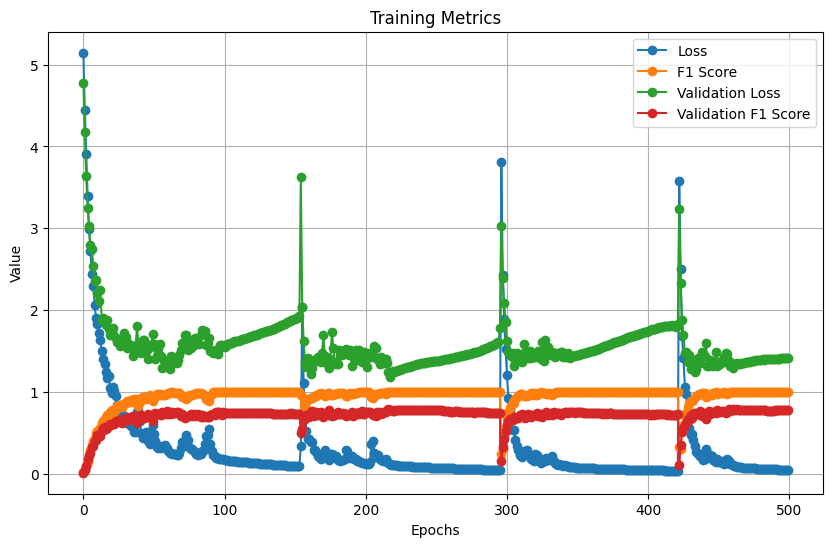

In [153]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [145]:
reconstructed_model = tf.keras.models.load_model("2 LSTM Lecunnormal")

In [146]:
reconstructed_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 130, 150)          166200    
                                                                 
 lstm_11 (LSTM)              (None, 200)               280800    
                                                                 
 dense_10 (Dense)            (None, 100)               20100     
                                                                 
 dense_11 (Dense)            (None, 50)                5050      
                                                                 
Total params: 472,150
Trainable params: 472,150
Non-trainable params: 0
_________________________________________________________________


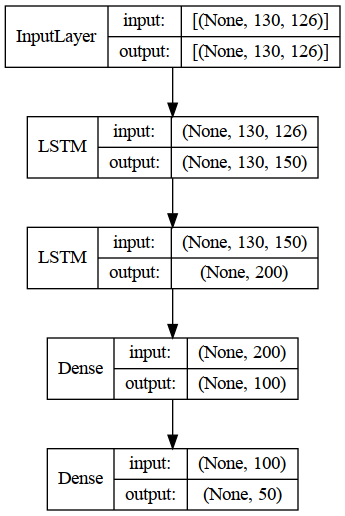

In [147]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [155]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 21ms/step - loss: 1.2394 - f1_score: 0.7918


[1.2393572330474854, 0.7918112277984619]

In [156]:
reconstructed_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 130, 150)          166200    
                                                                 
 lstm_11 (LSTM)              (None, 200)               280800    
                                                                 
 dense_10 (Dense)            (None, 100)               20100     
                                                                 
 dense_11 (Dense)            (None, 50)                5050      
                                                                 
Total params: 472,150
Trainable params: 472,150
Non-trainable params: 0
_________________________________________________________________


In [158]:
#cm = confusion_matrix(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1))

#sns.heatmap(cm, annot = True)

print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 19ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      1.000     0.833     0.909         6
  BASKETBALL      1.000     0.800     0.889        10
         BEE      1.000     0.800     0.889        10
        BELT      1.000     1.000     1.000         4
        BITE      0.889     1.000     0.941         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      0.750     1.000     0.857         6
        DARK      0.800     1.000     0.889         4
        DEAF      1.000     1.000     1.000         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.800     0.500     0.615         8
     DEVELOP      0.714     0.833     0.769         6
      DINNER      0.556     0.625     0.588         8
         DOG      1.000    

## Hyperparameter Tuning 3 LSTM Layers

In [119]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, GRU
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','elu','gelu','relu'],default='relu')
        model = Sequential()
#        model.add(Conv1D(filters=hp.Choice('num_filters_1',values=[25,50, 100,150],default=100,),kernel_size=2,activation=act_function,input_shape=self.input_shape))
#        model.add(MaxPooling1D(pool_size=2))
#        model.add(Conv1D(filters=hp.Choice('num_filters_2',values=[25,50, 100,150],default=25,),kernel_size=2,activation=act_function))
#        model.add(MaxPooling1D(pool_size=2))
#        model.add(Conv1D(filters=hp.Choice('num_filters_3',values=[25,50, 100,150],default=50,),kernel_size=2,activation=act_function,input_shape=self.input_shape))
#        model.add(MaxPooling1D(pool_size=2))

        model.add(LSTM(units=hp.Int('units_1',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=True,
                      input_shape=self.input_shape,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer_1',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(LSTM(units=hp.Int('units_2',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=True,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer_2',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(LSTM(units=hp.Int('units_3',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=False,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer_3',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.0,max_value=0.9,default=0.65,step=0.05,)))
 #       model.add(Flatten())
        model.add(Dense(units=hp.Int('units_4',min_value=70,max_value=120,step=10,default=80),activation=act_function))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.0,max_value=0.9,default=0.7,step=0.05,)))

        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.0005)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

/tmp/ipykernel_973303/2620525644.py:5: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [120]:
HYPERBAND_MAX_EPOCHS = 300
#MAX_TRIALS = 20
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/',
    project_name='3_LSTM',
    overwrite=False)

INFO:tensorflow:Reloading Tuner from /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/3_LSTM/tuner0.json


In [63]:
tuner.search_space_summary()

Search space summary
Default search space size: 11
dense_activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['selu', 'mish', 'elu', 'gelu', 'relu'], 'ordered': False}
units_1 (Int)
{'default': 100, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
regularizer_1 (Float)
{'default': 0.001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
units_2 (Int)
{'default': 100, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
regularizer_2 (Float)
{'default': 0.001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
units_3 (Int)
{'default': 100, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
regularizer_3 (Float)
{'default': 0.001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
dropout_1 (Float)
{'default': 0.65, 'conditions': [], 'min_value':

In [64]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [65]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [66]:
tuner.search(Xtrain, Ytrain, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 19m 29s]
val_f1_score: 0.6328944563865662

Best val_f1_score So Far: 0.6784997582435608
Total elapsed time: 22h 03m 27s
INFO:tensorflow:Oracle triggered exit


In [67]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/3_LSTM
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0714 summary
Hyperparameters:
dense_activation: mish
units_1: 125
regularizer_1: 0.00041721832896797245
units_2: 150
regularizer_2: 0.00014354078230406593
units_3: 150
regularizer_3: 0.002948111895566179
dropout_1: 0.4
units_4: 110
dropout_2: 0.4
learning_rate: 0.0001715739875569636
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0713
Score: 0.6784997582435608

Trial 0598 summary
Hyperparameters:
dense_activation: selu
units_1: 125
regularizer_1: 0.0017686030901453863
units_2: 150
regularizer_2: 0.0013257717103432026
units_3: 175
regularizer_3: 0.00912470672476799
dropout_1: 0.25
units_4: 120
dropout_2: 0.65
learning_rate: 0.00043631081921577624
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 4
tuner/round: 4
tuner/trial_id: 0596
Score: 0.6762926578521729

Trial 0715 summa

In [121]:
best_model = tuner.get_best_models(num_models=3)[0]

2023-09-07 15:54:24.327227: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-07 15:54:24.420271: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1739 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


In [122]:
loss, accuracy = best_model.evaluate(Xval, Yval)

 3/11 [=======>......................] - ETA: 0s - loss: 1.4701 - f1_score: 0.4815 

2023-09-07 15:54:31.994385: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700


11/11 [==============================] - 2s 27ms/step - loss: 1.9141 - f1_score: 0.7073


In [123]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 2s 29ms/step - loss: 0.2002 - f1_score: 0.9977


In [70]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 130, 125)          262500    
                                                                 
 lstm_1 (LSTM)               (None, 130, 150)          165600    
                                                                 
 lstm_2 (LSTM)               (None, 150)               180600    
                                                                 
 dropout (Dropout)           (None, 150)               0         
                                                                 
 dense (Dense)               (None, 110)               16610     
                                                                 
 dropout_1 (Dropout)         (None, 110)               0         
                                                                 
 dense_1 (Dense)             (None, 50)                5

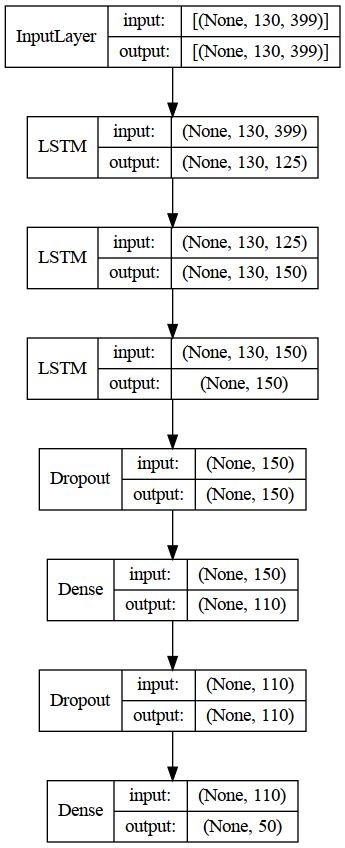

In [71]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

In [72]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(best_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 2s 25ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.875     0.933         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      0.500     0.400     0.444        10
        BELT      0.750     0.750     0.750         4
        BITE      1.000     0.750     0.857         8
   BREAKFAST      0.571     0.667     0.615         6
      CANCER      0.778     0.875     0.824         8
   CHRISTMAS      0.750     1.000     0.857         6
    CONFUSED      0.667     1.000     0.800         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.231     0.500     0.316         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      1.000     0.500     0.667         6
      DINNER      0.889     1.000     0.941         8
         DOG      0.600    

In [73]:
#bestHP = tuner.get_best_hyperparameters(num_trials=5)[2]
bestHP = tuner.get_best_hyperparameters(num_trials=10)[0]

In [74]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='3 LSTM/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [75]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - ETA: 0s - loss: 4.8033 - f1_score: 0.0122

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 44s 1s/step - loss: 4.8033 - f1_score: 0.0122 - val_loss: 4.7499 - val_f1_score: 9.1803e-04
Epoch 2/500
28/28 [==============================] - ETA: 0s - loss: 4.7150 - f1_score: 0.0121

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 21s 777ms/step - loss: 4.7150 - f1_score: 0.0121 - val_loss: 4.6661 - val_f1_score: 0.0031
Epoch 3/500
28/28 [==============================] - 4s 153ms/step - loss: 4.6260 - f1_score: 0.0188 - val_loss: 4.5829 - val_f1_score: 0.0028
Epoch 4/500
28/28 [==============================] - 4s 156ms/step - loss: 4.5383 - f1_score: 0.0233 - val_loss: 4.4965 - val_f1_score: 0.0012
Epoch 5/500
28/28 [==============================] - ETA: 0s - loss: 4.4339 - f1_score: 0.0210

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 20s 728ms/step - loss: 4.4339 - f1_score: 0.0210 - val_loss: 4.3412 - val_f1_score: 0.0063
Epoch 6/500
28/28 [==============================] - ETA: 0s - loss: 4.3325 - f1_score: 0.0278

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 820ms/step - loss: 4.3325 - f1_score: 0.0278 - val_loss: 4.2351 - val_f1_score: 0.0129
Epoch 7/500
28/28 [==============================] - ETA: 0s - loss: 4.2229 - f1_score: 0.0339

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 19s 707ms/step - loss: 4.2229 - f1_score: 0.0339 - val_loss: 4.1269 - val_f1_score: 0.0175
Epoch 8/500
28/28 [==============================] - ETA: 0s - loss: 4.1171 - f1_score: 0.0380

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 19s 710ms/step - loss: 4.1171 - f1_score: 0.0380 - val_loss: 3.9679 - val_f1_score: 0.0390
Epoch 9/500
28/28 [==============================] - 4s 153ms/step - loss: 4.0017 - f1_score: 0.0539 - val_loss: 3.8893 - val_f1_score: 0.0336
Epoch 10/500
28/28 [==============================] - 4s 154ms/step - loss: 3.8989 - f1_score: 0.0631 - val_loss: 3.7204 - val_f1_score: 0.0324
Epoch 11/500
28/28 [==============================] - ETA: 0s - loss: 3.7821 - f1_score: 0.0709

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 803ms/step - loss: 3.7821 - f1_score: 0.0709 - val_loss: 3.6665 - val_f1_score: 0.0445
Epoch 12/500
28/28 [==============================] - ETA: 0s - loss: 3.7093 - f1_score: 0.0730

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 796ms/step - loss: 3.7093 - f1_score: 0.0730 - val_loss: 3.5537 - val_f1_score: 0.0520
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 3.5803 - f1_score: 0.0897

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 21s 768ms/step - loss: 3.5803 - f1_score: 0.0897 - val_loss: 3.4474 - val_f1_score: 0.0582
Epoch 14/500
28/28 [==============================] - 4s 154ms/step - loss: 3.5217 - f1_score: 0.0979 - val_loss: 3.3894 - val_f1_score: 0.0525
Epoch 15/500
28/28 [==============================] - ETA: 0s - loss: 3.4199 - f1_score: 0.1063

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 21s 759ms/step - loss: 3.4199 - f1_score: 0.1063 - val_loss: 3.2893 - val_f1_score: 0.0948
Epoch 16/500
28/28 [==============================] - 4s 154ms/step - loss: 3.3599 - f1_score: 0.1132 - val_loss: 3.2570 - val_f1_score: 0.0627
Epoch 17/500
28/28 [==============================] - ETA: 0s - loss: 3.2681 - f1_score: 0.1342

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 23s 860ms/step - loss: 3.2681 - f1_score: 0.1342 - val_loss: 3.1968 - val_f1_score: 0.1062
Epoch 18/500
28/28 [==============================] - ETA: 0s - loss: 3.2175 - f1_score: 0.1420

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 808ms/step - loss: 3.2175 - f1_score: 0.1420 - val_loss: 3.1104 - val_f1_score: 0.1459
Epoch 19/500
28/28 [==============================] - 4s 156ms/step - loss: 3.1161 - f1_score: 0.1615 - val_loss: 3.0359 - val_f1_score: 0.1136
Epoch 20/500
28/28 [==============================] - ETA: 0s - loss: 3.0783 - f1_score: 0.1684

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 38s 1s/step - loss: 3.0783 - f1_score: 0.1684 - val_loss: 2.9059 - val_f1_score: 0.1470
Epoch 21/500
28/28 [==============================] - ETA: 0s - loss: 3.0039 - f1_score: 0.1853

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 21s 785ms/step - loss: 3.0039 - f1_score: 0.1853 - val_loss: 2.9328 - val_f1_score: 0.1662
Epoch 22/500
28/28 [==============================] - 4s 159ms/step - loss: 2.9196 - f1_score: 0.1911 - val_loss: 2.8570 - val_f1_score: 0.1632
Epoch 23/500
28/28 [==============================] - ETA: 0s - loss: 2.8764 - f1_score: 0.2072

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 20s 745ms/step - loss: 2.8764 - f1_score: 0.2072 - val_loss: 2.9903 - val_f1_score: 0.1824
Epoch 24/500
28/28 [==============================] - ETA: 0s - loss: 2.8371 - f1_score: 0.2266

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 803ms/step - loss: 2.8371 - f1_score: 0.2266 - val_loss: 2.7095 - val_f1_score: 0.2374
Epoch 25/500
28/28 [==============================] - 4s 155ms/step - loss: 2.7681 - f1_score: 0.2481 - val_loss: 2.6803 - val_f1_score: 0.2329
Epoch 26/500
28/28 [==============================] - 4s 154ms/step - loss: 2.6983 - f1_score: 0.2503 - val_loss: 2.6968 - val_f1_score: 0.2128
Epoch 27/500
28/28 [==============================] - 4s 155ms/step - loss: 2.6554 - f1_score: 0.2696 - val_loss: 2.6242 - val_f1_score: 0.2123
Epoch 28/500
28/28 [==============================] - 4s 156ms/step - loss: 2.5619 - f1_score: 0.2923 - val_loss: 2.5967 - val_f1_score: 0.2368
Epoch 29/500
28/28 [==============================] - ETA: 0s - loss: 2.5140 - f1_score: 0.2907

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 807ms/step - loss: 2.5140 - f1_score: 0.2907 - val_loss: 2.5072 - val_f1_score: 0.2953
Epoch 30/500
28/28 [==============================] - 4s 156ms/step - loss: 2.4997 - f1_score: 0.3142 - val_loss: 2.5517 - val_f1_score: 0.2487
Epoch 31/500
28/28 [==============================] - 4s 156ms/step - loss: 2.4380 - f1_score: 0.3174 - val_loss: 2.3862 - val_f1_score: 0.2953
Epoch 32/500
28/28 [==============================] - 4s 157ms/step - loss: 2.3730 - f1_score: 0.3297 - val_loss: 2.5882 - val_f1_score: 0.2319
Epoch 33/500
28/28 [==============================] - ETA: 0s - loss: 2.3449 - f1_score: 0.3433

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 810ms/step - loss: 2.3449 - f1_score: 0.3433 - val_loss: 2.3521 - val_f1_score: 0.3077
Epoch 34/500
28/28 [==============================] - ETA: 0s - loss: 2.2664 - f1_score: 0.3672

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 21s 776ms/step - loss: 2.2664 - f1_score: 0.3672 - val_loss: 2.3122 - val_f1_score: 0.3355
Epoch 35/500
28/28 [==============================] - 4s 155ms/step - loss: 2.2649 - f1_score: 0.3788 - val_loss: 2.3478 - val_f1_score: 0.3166
Epoch 36/500
28/28 [==============================] - ETA: 0s - loss: 2.2421 - f1_score: 0.3780

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 795ms/step - loss: 2.2421 - f1_score: 0.3780 - val_loss: 2.2420 - val_f1_score: 0.3673
Epoch 37/500
28/28 [==============================] - ETA: 0s - loss: 2.1385 - f1_score: 0.4015

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 21s 763ms/step - loss: 2.1385 - f1_score: 0.4015 - val_loss: 2.2216 - val_f1_score: 0.3814
Epoch 38/500
28/28 [==============================] - 4s 155ms/step - loss: 2.1106 - f1_score: 0.4225 - val_loss: 2.3722 - val_f1_score: 0.3089
Epoch 39/500
28/28 [==============================] - 4s 155ms/step - loss: 2.0798 - f1_score: 0.4160 - val_loss: 2.3751 - val_f1_score: 0.3521
Epoch 40/500
28/28 [==============================] - 4s 156ms/step - loss: 2.0303 - f1_score: 0.4385 - val_loss: 2.2451 - val_f1_score: 0.3421
Epoch 41/500
28/28 [==============================] - ETA: 0s - loss: 1.9825 - f1_score: 0.4436

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 800ms/step - loss: 1.9825 - f1_score: 0.4436 - val_loss: 2.1283 - val_f1_score: 0.4136
Epoch 42/500
28/28 [==============================] - 4s 155ms/step - loss: 1.9429 - f1_score: 0.4680 - val_loss: 2.1473 - val_f1_score: 0.3902
Epoch 43/500
28/28 [==============================] - 4s 159ms/step - loss: 1.8810 - f1_score: 0.4773 - val_loss: 2.1852 - val_f1_score: 0.3789
Epoch 44/500
28/28 [==============================] - ETA: 0s - loss: 1.8625 - f1_score: 0.4923

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 820ms/step - loss: 1.8625 - f1_score: 0.4923 - val_loss: 1.9987 - val_f1_score: 0.4640
Epoch 45/500
28/28 [==============================] - 4s 157ms/step - loss: 1.7994 - f1_score: 0.5042 - val_loss: 2.0006 - val_f1_score: 0.4127
Epoch 46/500
28/28 [==============================] - 4s 158ms/step - loss: 1.7549 - f1_score: 0.5234 - val_loss: 2.1759 - val_f1_score: 0.3980
Epoch 47/500
28/28 [==============================] - ETA: 0s - loss: 1.6959 - f1_score: 0.5426

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 23s 835ms/step - loss: 1.6959 - f1_score: 0.5426 - val_loss: 1.9454 - val_f1_score: 0.4845
Epoch 48/500
28/28 [==============================] - 4s 154ms/step - loss: 1.7276 - f1_score: 0.5339 - val_loss: 1.9980 - val_f1_score: 0.4462
Epoch 49/500
28/28 [==============================] - 4s 156ms/step - loss: 1.6595 - f1_score: 0.5473 - val_loss: 2.0059 - val_f1_score: 0.4636
Epoch 50/500
28/28 [==============================] - 4s 157ms/step - loss: 1.6107 - f1_score: 0.5833 - val_loss: 1.9564 - val_f1_score: 0.4506
Epoch 51/500
28/28 [==============================] - 4s 158ms/step - loss: 1.5172 - f1_score: 0.6028 - val_loss: 1.9269 - val_f1_score: 0.4753
Epoch 52/500
28/28 [==============================] - 4s 158ms/step - loss: 1.5110 - f1_score: 0.6032 - val_loss: 1.9369 - val_f1_score: 0.4643
Epoch 53/500
28/28 [==============================] - 4s 160ms/step - loss: 1.4766 - f1_score: 0.6056 - val_loss: 1.9628 - val_f1_score: 0.4697
Epoc

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 806ms/step - loss: 1.4428 - f1_score: 0.6197 - val_loss: 1.9889 - val_f1_score: 0.4997
Epoch 56/500
28/28 [==============================] - ETA: 0s - loss: 1.4786 - f1_score: 0.6225

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 24s 882ms/step - loss: 1.4786 - f1_score: 0.6225 - val_loss: 1.8722 - val_f1_score: 0.5022
Epoch 57/500
28/28 [==============================] - ETA: 0s - loss: 1.4014 - f1_score: 0.6451

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 21s 770ms/step - loss: 1.4014 - f1_score: 0.6451 - val_loss: 1.9478 - val_f1_score: 0.5054
Epoch 58/500
28/28 [==============================] - ETA: 0s - loss: 1.4354 - f1_score: 0.6226

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 804ms/step - loss: 1.4354 - f1_score: 0.6226 - val_loss: 1.8395 - val_f1_score: 0.5187
Epoch 59/500
28/28 [==============================] - ETA: 0s - loss: 1.4241 - f1_score: 0.6252

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 21s 782ms/step - loss: 1.4241 - f1_score: 0.6252 - val_loss: 1.9032 - val_f1_score: 0.5241
Epoch 60/500
28/28 [==============================] - 4s 155ms/step - loss: 1.4403 - f1_score: 0.6302 - val_loss: 1.9941 - val_f1_score: 0.4805
Epoch 61/500
28/28 [==============================] - 4s 156ms/step - loss: 1.3899 - f1_score: 0.6347 - val_loss: 1.9086 - val_f1_score: 0.4853
Epoch 62/500
28/28 [==============================] - ETA: 0s - loss: 1.3303 - f1_score: 0.6507

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 821ms/step - loss: 1.3303 - f1_score: 0.6507 - val_loss: 1.7973 - val_f1_score: 0.5430
Epoch 63/500
28/28 [==============================] - ETA: 0s - loss: 1.2922 - f1_score: 0.6578

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 21s 765ms/step - loss: 1.2922 - f1_score: 0.6578 - val_loss: 1.7876 - val_f1_score: 0.5442
Epoch 64/500
28/28 [==============================] - ETA: 0s - loss: 1.2659 - f1_score: 0.6763

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 19s 699ms/step - loss: 1.2659 - f1_score: 0.6763 - val_loss: 1.7875 - val_f1_score: 0.5472
Epoch 65/500
28/28 [==============================] - 4s 155ms/step - loss: 1.1634 - f1_score: 0.7131 - val_loss: 1.8011 - val_f1_score: 0.5301
Epoch 66/500
28/28 [==============================] - 4s 155ms/step - loss: 1.1886 - f1_score: 0.7020 - val_loss: 1.8109 - val_f1_score: 0.5399
Epoch 67/500
28/28 [==============================] - ETA: 0s - loss: 1.2019 - f1_score: 0.7031

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 23s 848ms/step - loss: 1.2019 - f1_score: 0.7031 - val_loss: 1.8321 - val_f1_score: 0.5612
Epoch 68/500
28/28 [==============================] - 4s 154ms/step - loss: 1.1744 - f1_score: 0.7193 - val_loss: 1.6972 - val_f1_score: 0.5547
Epoch 69/500
28/28 [==============================] - 4s 155ms/step - loss: 1.1705 - f1_score: 0.7082 - val_loss: 1.8418 - val_f1_score: 0.5443
Epoch 70/500
28/28 [==============================] - 4s 157ms/step - loss: 1.1446 - f1_score: 0.7135 - val_loss: 1.7954 - val_f1_score: 0.5481
Epoch 71/500
28/28 [==============================] - ETA: 0s - loss: 1.0858 - f1_score: 0.7342

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 815ms/step - loss: 1.0858 - f1_score: 0.7342 - val_loss: 1.7923 - val_f1_score: 0.5725
Epoch 72/500
28/28 [==============================] - 4s 155ms/step - loss: 1.1017 - f1_score: 0.7317 - val_loss: 1.7907 - val_f1_score: 0.5684
Epoch 73/500
28/28 [==============================] - 4s 157ms/step - loss: 1.0555 - f1_score: 0.7398 - val_loss: 1.8129 - val_f1_score: 0.5634
Epoch 74/500
28/28 [==============================] - 4s 158ms/step - loss: 0.9611 - f1_score: 0.7767 - val_loss: 1.9067 - val_f1_score: 0.5307
Epoch 75/500
28/28 [==============================] - 4s 159ms/step - loss: 1.0273 - f1_score: 0.7514 - val_loss: 1.7822 - val_f1_score: 0.5546
Epoch 76/500
28/28 [==============================] - ETA: 0s - loss: 1.0000 - f1_score: 0.7670

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 23s 856ms/step - loss: 1.0000 - f1_score: 0.7670 - val_loss: 1.8105 - val_f1_score: 0.6007
Epoch 77/500
28/28 [==============================] - 4s 157ms/step - loss: 0.9969 - f1_score: 0.7648 - val_loss: 1.7794 - val_f1_score: 0.5742
Epoch 78/500
28/28 [==============================] - ETA: 0s - loss: 1.0375 - f1_score: 0.7473

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 22s 824ms/step - loss: 1.0375 - f1_score: 0.7473 - val_loss: 1.7438 - val_f1_score: 0.6060
Epoch 79/500
28/28 [==============================] - 4s 155ms/step - loss: 0.9325 - f1_score: 0.7890 - val_loss: 1.8969 - val_f1_score: 0.5616
Epoch 80/500
28/28 [==============================] - 4s 156ms/step - loss: 0.9624 - f1_score: 0.7713 - val_loss: 1.8667 - val_f1_score: 0.5657
Epoch 81/500
28/28 [==============================] - 4s 157ms/step - loss: 0.9237 - f1_score: 0.7871 - val_loss: 1.8094 - val_f1_score: 0.5786
Epoch 82/500
28/28 [==============================] - 4s 158ms/step - loss: 0.9195 - f1_score: 0.7990 - val_loss: 1.9357 - val_f1_score: 0.5346
Epoch 83/500
28/28 [==============================] - ETA: 0s - loss: 0.8785 - f1_score: 0.8114

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 23s 837ms/step - loss: 0.8785 - f1_score: 0.8114 - val_loss: 1.7455 - val_f1_score: 0.6157
Epoch 84/500
28/28 [==============================] - 4s 155ms/step - loss: 0.9088 - f1_score: 0.7904 - val_loss: 1.9218 - val_f1_score: 0.5736
Epoch 85/500
28/28 [==============================] - 4s 158ms/step - loss: 0.9510 - f1_score: 0.7843 - val_loss: 2.0076 - val_f1_score: 0.5565
Epoch 86/500
28/28 [==============================] - 4s 159ms/step - loss: 0.9911 - f1_score: 0.7699 - val_loss: 1.9928 - val_f1_score: 0.5412
Epoch 87/500
28/28 [==============================] - ETA: 0s - loss: 0.8932 - f1_score: 0.8089

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 23s 832ms/step - loss: 0.8932 - f1_score: 0.8089 - val_loss: 1.8076 - val_f1_score: 0.6311
Epoch 88/500
28/28 [==============================] - 4s 156ms/step - loss: 0.8490 - f1_score: 0.8091 - val_loss: 1.7807 - val_f1_score: 0.6250
Epoch 89/500
28/28 [==============================] - 4s 157ms/step - loss: 0.8317 - f1_score: 0.8182 - val_loss: 1.7720 - val_f1_score: 0.6308
Epoch 90/500
28/28 [==============================] - 4s 158ms/step - loss: 0.9335 - f1_score: 0.7932 - val_loss: 1.9824 - val_f1_score: 0.5490
Epoch 91/500
28/28 [==============================] - ETA: 0s - loss: 0.8960 - f1_score: 0.7924

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 23s 843ms/step - loss: 0.8960 - f1_score: 0.7924 - val_loss: 1.7980 - val_f1_score: 0.6459
Epoch 92/500
28/28 [==============================] - 4s 161ms/step - loss: 0.8233 - f1_score: 0.8300 - val_loss: 1.6961 - val_f1_score: 0.6350
Epoch 93/500
28/28 [==============================] - 4s 160ms/step - loss: 0.7586 - f1_score: 0.8402 - val_loss: 1.7669 - val_f1_score: 0.6392
Epoch 94/500
28/28 [==============================] - 4s 158ms/step - loss: 0.7027 - f1_score: 0.8618 - val_loss: 1.7835 - val_f1_score: 0.6412
Epoch 95/500
28/28 [==============================] - 4s 160ms/step - loss: 0.7035 - f1_score: 0.8659 - val_loss: 1.8868 - val_f1_score: 0.6268
Epoch 96/500
28/28 [==============================] - ETA: 0s - loss: 0.6870 - f1_score: 0.8679

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 23s 855ms/step - loss: 0.6870 - f1_score: 0.8679 - val_loss: 1.8623 - val_f1_score: 0.6468
Epoch 97/500
28/28 [==============================] - 4s 155ms/step - loss: 0.7167 - f1_score: 0.8578 - val_loss: 1.8345 - val_f1_score: 0.6199
Epoch 98/500
28/28 [==============================] - 4s 156ms/step - loss: 0.8511 - f1_score: 0.8215 - val_loss: 1.8848 - val_f1_score: 0.6235
Epoch 99/500
28/28 [==============================] - 4s 158ms/step - loss: 0.7146 - f1_score: 0.8539 - val_loss: 1.8909 - val_f1_score: 0.6360
Epoch 100/500
28/28 [==============================] - 4s 159ms/step - loss: 0.6938 - f1_score: 0.8659 - val_loss: 1.9411 - val_f1_score: 0.5874
Epoch 101/500
28/28 [==============================] - 4s 160ms/step - loss: 0.7229 - f1_score: 0.8591 - val_loss: 2.1420 - val_f1_score: 0.5350
Epoch 102/500
28/28 [==============================] - 4s 160ms/step - loss: 0.8118 - f1_score: 0.8274 - val_loss: 2.0071 - val_f1_score: 0.5878
E

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 26s 975ms/step - loss: 0.7217 - f1_score: 0.8609 - val_loss: 1.7532 - val_f1_score: 0.6604
Epoch 106/500
28/28 [==============================] - 4s 155ms/step - loss: 0.6720 - f1_score: 0.8735 - val_loss: 1.8218 - val_f1_score: 0.6362
Epoch 107/500
28/28 [==============================] - 4s 158ms/step - loss: 0.7181 - f1_score: 0.8688 - val_loss: 1.9216 - val_f1_score: 0.5899
Epoch 108/500
28/28 [==============================] - 4s 159ms/step - loss: 0.7416 - f1_score: 0.8419 - val_loss: 2.4546 - val_f1_score: 0.5252
Epoch 109/500
28/28 [==============================] - 4s 160ms/step - loss: 1.2229 - f1_score: 0.7406 - val_loss: 3.2135 - val_f1_score: 0.3260
Epoch 110/500
28/28 [==============================] - 4s 161ms/step - loss: 1.8929 - f1_score: 0.5440 - val_loss: 1.9386 - val_f1_score: 0.5554
Epoch 111/500
28/28 [==============================] - 5s 162ms/step - loss: 0.9791 - f1_score: 0.7728 - val_loss: 1.8440 - val_f1_score: 0.597

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 27s 991ms/step - loss: 0.4389 - f1_score: 0.9437 - val_loss: 1.8110 - val_f1_score: 0.6755
Epoch 145/500
28/28 [==============================] - 4s 156ms/step - loss: 0.5214 - f1_score: 0.9201 - val_loss: 2.0389 - val_f1_score: 0.6063
Epoch 146/500
28/28 [==============================] - 4s 158ms/step - loss: 0.5280 - f1_score: 0.9205 - val_loss: 1.8372 - val_f1_score: 0.6552
Epoch 147/500
28/28 [==============================] - 5s 162ms/step - loss: 0.4336 - f1_score: 0.9435 - val_loss: 2.0451 - val_f1_score: 0.6221
Epoch 148/500
28/28 [==============================] - 5s 163ms/step - loss: 0.4179 - f1_score: 0.9557 - val_loss: 2.0004 - val_f1_score: 0.6374
Epoch 149/500
28/28 [==============================] - 5s 162ms/step - loss: 0.4014 - f1_score: 0.9558 - val_loss: 1.8842 - val_f1_score: 0.6542
Epoch 150/500
28/28 [==============================] - 5s 165ms/step - loss: 0.4381 - f1_score: 0.9480 - val_loss: 1.9224 - val_f1_score: 0.642

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 28s 1s/step - loss: 0.3515 - f1_score: 0.9740 - val_loss: 1.9294 - val_f1_score: 0.6836
Epoch 154/500
28/28 [==============================] - 4s 159ms/step - loss: 0.3883 - f1_score: 0.9606 - val_loss: 1.9356 - val_f1_score: 0.6795
Epoch 155/500
28/28 [==============================] - 4s 161ms/step - loss: 0.4015 - f1_score: 0.9539 - val_loss: 2.0759 - val_f1_score: 0.6570
Epoch 156/500
28/28 [==============================] - 5s 162ms/step - loss: 0.3560 - f1_score: 0.9716 - val_loss: 2.0461 - val_f1_score: 0.6658
Epoch 157/500
28/28 [==============================] - 4s 161ms/step - loss: 0.3491 - f1_score: 0.9736 - val_loss: 1.9475 - val_f1_score: 0.6620
Epoch 158/500
28/28 [==============================] - 5s 162ms/step - loss: 0.3355 - f1_score: 0.9787 - val_loss: 1.9985 - val_f1_score: 0.6602
Epoch 159/500
28/28 [==============================] - 5s 166ms/step - loss: 0.3608 - f1_score: 0.9669 - val_loss: 1.9909 - val_f1_score: 0.6476
E

28/28 [==============================] - 5s 165ms/step - loss: 0.3739 - f1_score: 0.9486 - val_loss: 2.3532 - val_f1_score: 0.5975
Epoch 266/500
28/28 [==============================] - 5s 170ms/step - loss: 0.4148 - f1_score: 0.9407 - val_loss: 2.2463 - val_f1_score: 0.6272
Epoch 267/500
28/28 [==============================] - 5s 172ms/step - loss: 0.3495 - f1_score: 0.9591 - val_loss: 2.5573 - val_f1_score: 0.5727
Epoch 268/500
28/28 [==============================] - 5s 168ms/step - loss: 0.4278 - f1_score: 0.9322 - val_loss: 2.1277 - val_f1_score: 0.6430
Epoch 269/500
28/28 [==============================] - 5s 168ms/step - loss: 0.4323 - f1_score: 0.9361 - val_loss: 2.3075 - val_f1_score: 0.6192
Epoch 270/500
28/28 [==============================] - 5s 167ms/step - loss: 0.3315 - f1_score: 0.9653 - val_loss: 2.5641 - val_f1_score: 0.5981
Epoch 271/500
28/28 [==============================] - 5s 171ms/step - loss: 0.3072 - f1_score: 0.9714 - val_loss: 2.3677 - val_f1_score: 0.6107

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 24s 872ms/step - loss: 0.2123 - f1_score: 0.9979 - val_loss: 2.2671 - val_f1_score: 0.6911
Epoch 291/500
28/28 [==============================] - 4s 158ms/step - loss: 0.2138 - f1_score: 0.9960 - val_loss: 2.3029 - val_f1_score: 0.6823
Epoch 292/500
28/28 [==============================] - 4s 160ms/step - loss: 0.2109 - f1_score: 0.9981 - val_loss: 2.2960 - val_f1_score: 0.6644
Epoch 293/500
28/28 [==============================] - 5s 164ms/step - loss: 0.2090 - f1_score: 0.9982 - val_loss: 2.2979 - val_f1_score: 0.6741
Epoch 294/500
28/28 [==============================] - 5s 163ms/step - loss: 0.2083 - f1_score: 0.9980 - val_loss: 2.2651 - val_f1_score: 0.6765
Epoch 295/500
28/28 [==============================] - 5s 162ms/step - loss: 0.2049 - f1_score: 0.9988 - val_loss: 2.3129 - val_f1_score: 0.6768
Epoch 296/500
28/28 [==============================] - 5s 166ms/step - loss: 0.2876 - f1_score: 0.9770 - val_loss: 2.9377 - val_f1_score: 0.598

INFO:tensorflow:Assets written to: 3 LSTM/assets


INFO:tensorflow:Assets written to: 3 LSTM/assets


28/28 [==============================] - 25s 920ms/step - loss: 0.2357 - f1_score: 0.9867 - val_loss: 2.1101 - val_f1_score: 0.6933
Epoch 333/500
28/28 [==============================] - 4s 157ms/step - loss: 0.2317 - f1_score: 0.9913 - val_loss: 2.4897 - val_f1_score: 0.6354
Epoch 334/500
28/28 [==============================] - 4s 160ms/step - loss: 0.3035 - f1_score: 0.9698 - val_loss: 2.2064 - val_f1_score: 0.6748
Epoch 335/500
28/28 [==============================] - 5s 162ms/step - loss: 0.6428 - f1_score: 0.8899 - val_loss: 2.5046 - val_f1_score: 0.6116
Epoch 336/500
28/28 [==============================] - 5s 162ms/step - loss: 0.4817 - f1_score: 0.9191 - val_loss: 2.4185 - val_f1_score: 0.6166
Epoch 337/500
28/28 [==============================] - 5s 162ms/step - loss: 0.3938 - f1_score: 0.9474 - val_loss: 2.1450 - val_f1_score: 0.6192
Epoch 338/500
28/28 [==============================] - 5s 163ms/step - loss: 0.3076 - f1_score: 0.9655 - val_loss: 2.2900 - val_f1_score: 0.648

28/28 [==============================] - 5s 167ms/step - loss: 0.1616 - f1_score: 0.9983 - val_loss: 2.4683 - val_f1_score: 0.6581
Epoch 445/500
28/28 [==============================] - 5s 165ms/step - loss: 0.1578 - f1_score: 1.0000 - val_loss: 2.5106 - val_f1_score: 0.6560
Epoch 446/500
28/28 [==============================] - 5s 165ms/step - loss: 0.1577 - f1_score: 0.9996 - val_loss: 2.5343 - val_f1_score: 0.6638
Epoch 447/500
28/28 [==============================] - 5s 166ms/step - loss: 0.1568 - f1_score: 1.0000 - val_loss: 2.5400 - val_f1_score: 0.6662
Epoch 448/500
28/28 [==============================] - 5s 167ms/step - loss: 0.1580 - f1_score: 0.9996 - val_loss: 2.5580 - val_f1_score: 0.6592
Epoch 449/500
28/28 [==============================] - 5s 166ms/step - loss: 0.1565 - f1_score: 1.0000 - val_loss: 2.5949 - val_f1_score: 0.6650
Epoch 450/500
28/28 [==============================] - 5s 165ms/step - loss: 0.2195 - f1_score: 0.9853 - val_loss: 2.6891 - val_f1_score: 0.6156

In [76]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 2s 26ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.875     0.933         8
    BACKPACK      0.667     0.667     0.667         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.800     0.400     0.533        10
        BELT      1.000     1.000     1.000         4
        BITE      0.714     0.625     0.667         8
   BREAKFAST      0.556     0.833     0.667         6
      CANCER      0.833     0.625     0.714         8
   CHRISTMAS      1.000     0.833     0.909         6
    CONFUSED      0.714     0.833     0.769         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.400     0.333     0.364         6
      DECIDE      0.714     0.833     0.769         6
      DEMAND      0.889     1.000     0.941         8
     DEVELOP      0.400     0.333     0.364         6
      DINNER      0.750     0.375     0.500         8
         DOG      0.429    

In [77]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '3 LSTM/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [78]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.543994,0.904393,2.306155,0.580705
496,0.347574,0.948425,2.054087,0.637343
497,0.259453,0.972048,2.308527,0.613971
498,0.265040,0.969994,2.245025,0.638905
499,0.210580,0.984705,2.191885,0.621819


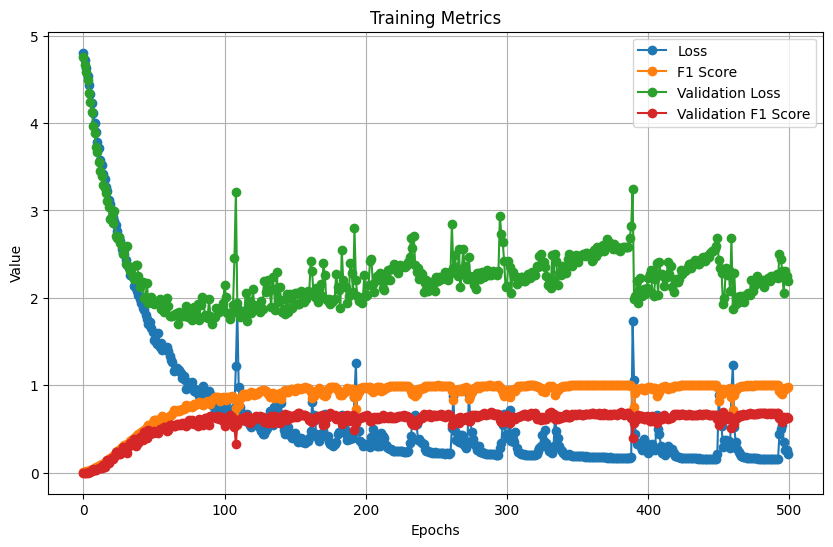

In [79]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [124]:
reconstructed_model = tf.keras.models.load_model("3 LSTM")

In [125]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 130, 125)          262500    
                                                                 
 lstm_4 (LSTM)               (None, 130, 150)          165600    
                                                                 
 lstm_5 (LSTM)               (None, 150)               180600    
                                                                 
 dropout_2 (Dropout)         (None, 150)               0         
                                                                 
 dense_2 (Dense)             (None, 110)               16610     
                                                                 
 dropout_3 (Dropout)         (None, 110)               0         
                                                                 
 dense_3 (Dense)             (None, 50)               

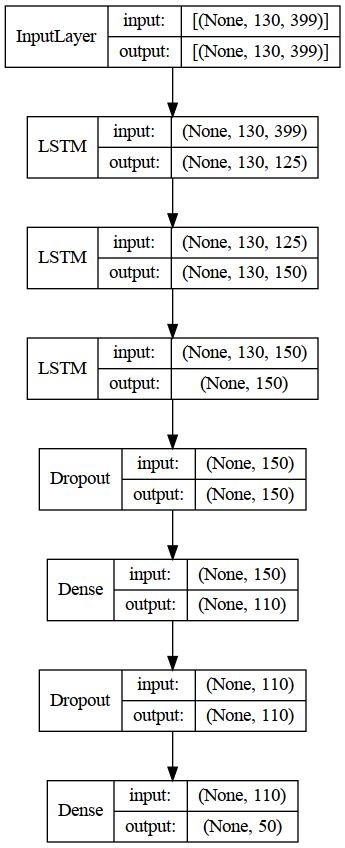

In [126]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [127]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 2s 27ms/step - loss: 2.1101 - f1_score: 0.6933


[2.1100780963897705, 0.6932531595230103]

In [128]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 2s 29ms/step - loss: 0.1957 - f1_score: 0.9954


[0.19567184150218964, 0.9954199194908142]

In [84]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 2s 25ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.875     0.933         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      0.750     0.600     0.667        10
        BELT      1.000     0.500     0.667         4
        BITE      1.000     0.750     0.857         8
   BREAKFAST      0.800     0.667     0.727         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.400     0.333     0.364         6
      DECIDE      0.667     0.667     0.667         6
      DEMAND      1.000     0.875     0.933         8
     DEVELOP      1.000     0.333     0.500         6
      DINNER      0.800     0.500     0.615         8
         DOG      0.500    

In [156]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='3 LSTM Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [157]:
act_function = mish
model = Sequential()
model.add(LSTM(units=100,return_sequences=True,input_shape=(130,126),kernel_regularizer=regularizers.l2(.001193677363426901)))
model.add(LSTM(units=150,return_sequences=True,kernel_regularizer=regularizers.l2(.0010580771049089293)))
model.add(LSTM(units=200,return_sequences=False,kernel_regularizer=regularizers.l2(.00024654929327663945)))
model.add(Dropout(.75))
model.add(Dense(units=100,activation=act_function))
model.add(Dropout(.4))
model.add(Dense(50, activation='softmax'))
model.compile(tf.optimizers.experimental.Nadam(.000444805152602102),loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 130, 100)          90800     
                                                                 
 lstm_5 (LSTM)               (None, 130, 150)          150600    
                                                                 
 lstm_6 (LSTM)               (None, 200)               280800    
                                                                 
 dropout_6 (Dropout)         (None, 200)               0         
                                                                 
 dense_8 (Dense)             (None, 100)               20100     
                                                                 
 dropout_7 (Dropout)         (None, 100)               0         
                                                                 
 dense_9 (Dense)             (None, 50)               

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 31s 852ms/step - loss: 4.3367 - f1_score: 0.0153 - val_loss: 4.2759 - val_f1_score: 7.1749e-04
Epoch 2/500
28/28 [==============================] - ETA: 0s - loss: 4.1975 - f1_score: 0.0213

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 17s 637ms/step - loss: 4.1975 - f1_score: 0.0213 - val_loss: 4.0537 - val_f1_score: 0.0246
Epoch 3/500
28/28 [==============================] - 4s 133ms/step - loss: 3.9831 - f1_score: 0.0351 - val_loss: 3.7524 - val_f1_score: 0.0144
Epoch 4/500
28/28 [==============================] - ETA: 0s - loss: 3.7980 - f1_score: 0.0418

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 650ms/step - loss: 3.7980 - f1_score: 0.0418 - val_loss: 3.5918 - val_f1_score: 0.0387
Epoch 5/500
28/28 [==============================] - 4s 133ms/step - loss: 3.6447 - f1_score: 0.0541 - val_loss: 3.4083 - val_f1_score: 0.0387
Epoch 6/500
28/28 [==============================] - ETA: 0s - loss: 3.5324 - f1_score: 0.0664

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 20s 730ms/step - loss: 3.5324 - f1_score: 0.0664 - val_loss: 3.2931 - val_f1_score: 0.0632
Epoch 7/500
28/28 [==============================] - ETA: 0s - loss: 3.4079 - f1_score: 0.0778

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 666ms/step - loss: 3.4079 - f1_score: 0.0778 - val_loss: 3.1455 - val_f1_score: 0.0737
Epoch 8/500
28/28 [==============================] - ETA: 0s - loss: 3.2921 - f1_score: 0.1000

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 685ms/step - loss: 3.2921 - f1_score: 0.1000 - val_loss: 3.0302 - val_f1_score: 0.1074
Epoch 9/500
28/28 [==============================] - ETA: 0s - loss: 3.1755 - f1_score: 0.1201

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 655ms/step - loss: 3.1755 - f1_score: 0.1201 - val_loss: 2.8957 - val_f1_score: 0.1105
Epoch 10/500
28/28 [==============================] - ETA: 0s - loss: 3.0955 - f1_score: 0.1477

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 20s 722ms/step - loss: 3.0955 - f1_score: 0.1477 - val_loss: 2.8062 - val_f1_score: 0.1654
Epoch 11/500
28/28 [==============================] - ETA: 0s - loss: 3.0028 - f1_score: 0.1553

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 645ms/step - loss: 3.0028 - f1_score: 0.1553 - val_loss: 2.8445 - val_f1_score: 0.1778
Epoch 12/500
28/28 [==============================] - 4s 133ms/step - loss: 2.9226 - f1_score: 0.1782 - val_loss: 2.6667 - val_f1_score: 0.1752
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 2.7878 - f1_score: 0.1976

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 644ms/step - loss: 2.7878 - f1_score: 0.1976 - val_loss: 2.5489 - val_f1_score: 0.2122
Epoch 14/500
28/28 [==============================] - ETA: 0s - loss: 2.7839 - f1_score: 0.1934

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 689ms/step - loss: 2.7839 - f1_score: 0.1934 - val_loss: 2.5441 - val_f1_score: 0.2372
Epoch 15/500
28/28 [==============================] - 4s 134ms/step - loss: 2.6704 - f1_score: 0.2305 - val_loss: 2.4836 - val_f1_score: 0.2246
Epoch 16/500
28/28 [==============================] - ETA: 0s - loss: 2.6081 - f1_score: 0.2280

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 17s 641ms/step - loss: 2.6081 - f1_score: 0.2280 - val_loss: 2.3973 - val_f1_score: 0.2575
Epoch 17/500
28/28 [==============================] - 4s 133ms/step - loss: 2.5521 - f1_score: 0.2450 - val_loss: 2.5510 - val_f1_score: 0.2485
Epoch 18/500
28/28 [==============================] - ETA: 0s - loss: 2.4950 - f1_score: 0.2556

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 683ms/step - loss: 2.4950 - f1_score: 0.2556 - val_loss: 2.3750 - val_f1_score: 0.2934
Epoch 19/500
28/28 [==============================] - ETA: 0s - loss: 2.4326 - f1_score: 0.2845

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 655ms/step - loss: 2.4326 - f1_score: 0.2845 - val_loss: 2.3541 - val_f1_score: 0.3066
Epoch 20/500
28/28 [==============================] - ETA: 0s - loss: 2.4075 - f1_score: 0.2853

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 682ms/step - loss: 2.4075 - f1_score: 0.2853 - val_loss: 2.2772 - val_f1_score: 0.3510
Epoch 21/500
28/28 [==============================] - 4s 134ms/step - loss: 2.2908 - f1_score: 0.3184 - val_loss: 2.2182 - val_f1_score: 0.3330
Epoch 22/500
28/28 [==============================] - 4s 134ms/step - loss: 2.2753 - f1_score: 0.3213 - val_loss: 2.2168 - val_f1_score: 0.3473
Epoch 23/500
28/28 [==============================] - 4s 134ms/step - loss: 2.2426 - f1_score: 0.3276 - val_loss: 2.2251 - val_f1_score: 0.3205
Epoch 24/500
28/28 [==============================] - 4s 134ms/step - loss: 2.4026 - f1_score: 0.3055 - val_loss: 2.2909 - val_f1_score: 0.3097
Epoch 25/500
28/28 [==============================] - 4s 135ms/step - loss: 2.1836 - f1_score: 0.3413 - val_loss: 2.1599 - val_f1_score: 0.3504
Epoch 26/500
28/28 [==============================] - ETA: 0s - loss: 2.1147 - f1_score: 0.3757

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 20s 741ms/step - loss: 2.1147 - f1_score: 0.3757 - val_loss: 2.0477 - val_f1_score: 0.3753
Epoch 27/500
28/28 [==============================] - 4s 134ms/step - loss: 2.0762 - f1_score: 0.3938 - val_loss: 2.1361 - val_f1_score: 0.3446
Epoch 28/500
28/28 [==============================] - ETA: 0s - loss: 2.0687 - f1_score: 0.3867

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 704ms/step - loss: 2.0687 - f1_score: 0.3867 - val_loss: 2.0365 - val_f1_score: 0.3950
Epoch 29/500
28/28 [==============================] - ETA: 0s - loss: 1.9699 - f1_score: 0.4232

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 701ms/step - loss: 1.9699 - f1_score: 0.4232 - val_loss: 1.9958 - val_f1_score: 0.4083
Epoch 30/500
28/28 [==============================] - 4s 133ms/step - loss: 1.9212 - f1_score: 0.4228 - val_loss: 2.0845 - val_f1_score: 0.3867
Epoch 31/500
28/28 [==============================] - ETA: 0s - loss: 1.8409 - f1_score: 0.4569

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 680ms/step - loss: 1.8409 - f1_score: 0.4569 - val_loss: 2.0316 - val_f1_score: 0.4107
Epoch 32/500
28/28 [==============================] - ETA: 0s - loss: 1.8740 - f1_score: 0.4471

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 17s 629ms/step - loss: 1.8740 - f1_score: 0.4471 - val_loss: 1.8827 - val_f1_score: 0.4509
Epoch 33/500
28/28 [==============================] - 4s 133ms/step - loss: 1.8336 - f1_score: 0.4574 - val_loss: 2.0237 - val_f1_score: 0.4167
Epoch 34/500
28/28 [==============================] - 4s 134ms/step - loss: 1.9595 - f1_score: 0.4290 - val_loss: 2.0884 - val_f1_score: 0.4158
Epoch 35/500
28/28 [==============================] - ETA: 0s - loss: 1.8201 - f1_score: 0.4684

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 676ms/step - loss: 1.8201 - f1_score: 0.4684 - val_loss: 1.8831 - val_f1_score: 0.4510
Epoch 36/500
28/28 [==============================] - ETA: 0s - loss: 1.7561 - f1_score: 0.4710

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 669ms/step - loss: 1.7561 - f1_score: 0.4710 - val_loss: 1.8482 - val_f1_score: 0.4870
Epoch 37/500
28/28 [==============================] - 4s 134ms/step - loss: 1.6655 - f1_score: 0.5024 - val_loss: 1.9030 - val_f1_score: 0.4798
Epoch 38/500
28/28 [==============================] - ETA: 0s - loss: 1.5975 - f1_score: 0.5336

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 689ms/step - loss: 1.5975 - f1_score: 0.5336 - val_loss: 1.7531 - val_f1_score: 0.5141
Epoch 39/500
28/28 [==============================] - 4s 134ms/step - loss: 1.5719 - f1_score: 0.5300 - val_loss: 1.9193 - val_f1_score: 0.5106
Epoch 40/500
28/28 [==============================] - 4s 135ms/step - loss: 1.6650 - f1_score: 0.5177 - val_loss: 2.0274 - val_f1_score: 0.4568
Epoch 41/500
28/28 [==============================] - 4s 134ms/step - loss: 1.5247 - f1_score: 0.5445 - val_loss: 1.7485 - val_f1_score: 0.5117
Epoch 42/500
28/28 [==============================] - ETA: 0s - loss: 1.6194 - f1_score: 0.5293

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 698ms/step - loss: 1.6194 - f1_score: 0.5293 - val_loss: 1.7350 - val_f1_score: 0.5266
Epoch 43/500
28/28 [==============================] - ETA: 0s - loss: 1.5928 - f1_score: 0.5338

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 687ms/step - loss: 1.5928 - f1_score: 0.5338 - val_loss: 1.7078 - val_f1_score: 0.5374
Epoch 44/500
28/28 [==============================] - 4s 134ms/step - loss: 1.5727 - f1_score: 0.5534 - val_loss: 1.9181 - val_f1_score: 0.4821
Epoch 45/500
28/28 [==============================] - ETA: 0s - loss: 1.6040 - f1_score: 0.5321

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 657ms/step - loss: 1.6040 - f1_score: 0.5321 - val_loss: 1.6000 - val_f1_score: 0.5581
Epoch 46/500
28/28 [==============================] - 4s 134ms/step - loss: 1.6124 - f1_score: 0.5277 - val_loss: 1.9106 - val_f1_score: 0.4827
Epoch 47/500
28/28 [==============================] - ETA: 0s - loss: 1.4313 - f1_score: 0.5779

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 675ms/step - loss: 1.4313 - f1_score: 0.5779 - val_loss: 1.6515 - val_f1_score: 0.5614
Epoch 48/500
28/28 [==============================] - ETA: 0s - loss: 1.3980 - f1_score: 0.5914

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 667ms/step - loss: 1.3980 - f1_score: 0.5914 - val_loss: 1.6156 - val_f1_score: 0.5809
Epoch 49/500
28/28 [==============================] - 4s 133ms/step - loss: 1.5352 - f1_score: 0.5625 - val_loss: 1.5706 - val_f1_score: 0.5654
Epoch 50/500
28/28 [==============================] - ETA: 0s - loss: 1.3724 - f1_score: 0.6065

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 682ms/step - loss: 1.3724 - f1_score: 0.6065 - val_loss: 1.5786 - val_f1_score: 0.5837
Epoch 51/500
28/28 [==============================] - 4s 133ms/step - loss: 1.3659 - f1_score: 0.6050 - val_loss: 1.7371 - val_f1_score: 0.5569
Epoch 52/500
28/28 [==============================] - 4s 134ms/step - loss: 1.2931 - f1_score: 0.6342 - val_loss: 1.6433 - val_f1_score: 0.5721
Epoch 53/500
28/28 [==============================] - 4s 134ms/step - loss: 1.2008 - f1_score: 0.6588 - val_loss: 1.7824 - val_f1_score: 0.5414
Epoch 54/500
28/28 [==============================] - ETA: 0s - loss: 1.2632 - f1_score: 0.6454

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 712ms/step - loss: 1.2632 - f1_score: 0.6454 - val_loss: 1.6047 - val_f1_score: 0.5862
Epoch 55/500
28/28 [==============================] - ETA: 0s - loss: 1.1711 - f1_score: 0.6639

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 665ms/step - loss: 1.1711 - f1_score: 0.6639 - val_loss: 1.5292 - val_f1_score: 0.6213
Epoch 56/500
28/28 [==============================] - 4s 134ms/step - loss: 1.1628 - f1_score: 0.6793 - val_loss: 1.6858 - val_f1_score: 0.6139
Epoch 57/500
28/28 [==============================] - ETA: 0s - loss: 1.1854 - f1_score: 0.6641

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 20s 718ms/step - loss: 1.1854 - f1_score: 0.6641 - val_loss: 1.5353 - val_f1_score: 0.6371
Epoch 58/500
28/28 [==============================] - 4s 134ms/step - loss: 1.4205 - f1_score: 0.6132 - val_loss: 2.0381 - val_f1_score: 0.5335
Epoch 59/500
28/28 [==============================] - 4s 134ms/step - loss: 1.3520 - f1_score: 0.6252 - val_loss: 1.7245 - val_f1_score: 0.5892
Epoch 60/500
28/28 [==============================] - 4s 134ms/step - loss: 1.3058 - f1_score: 0.6452 - val_loss: 1.7952 - val_f1_score: 0.5376
Epoch 61/500
28/28 [==============================] - 4s 134ms/step - loss: 1.1421 - f1_score: 0.6874 - val_loss: 1.6404 - val_f1_score: 0.6016
Epoch 62/500
28/28 [==============================] - 4s 136ms/step - loss: 1.1034 - f1_score: 0.6969 - val_loss: 1.7404 - val_f1_score: 0.6078
Epoch 63/500
28/28 [==============================] - ETA: 0s - loss: 1.0972 - f1_score: 0.7004

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 20s 730ms/step - loss: 1.0972 - f1_score: 0.7004 - val_loss: 1.6282 - val_f1_score: 0.6494
Epoch 64/500
28/28 [==============================] - 4s 134ms/step - loss: 1.1668 - f1_score: 0.6823 - val_loss: 1.5163 - val_f1_score: 0.6141
Epoch 65/500
28/28 [==============================] - 4s 134ms/step - loss: 1.1656 - f1_score: 0.6873 - val_loss: 1.6319 - val_f1_score: 0.6298
Epoch 66/500
28/28 [==============================] - 4s 135ms/step - loss: 1.0980 - f1_score: 0.7034 - val_loss: 1.4468 - val_f1_score: 0.6414
Epoch 67/500
28/28 [==============================] - 4s 136ms/step - loss: 1.1018 - f1_score: 0.7026 - val_loss: 1.7032 - val_f1_score: 0.6031
Epoch 68/500
28/28 [==============================] - 4s 136ms/step - loss: 1.2129 - f1_score: 0.6791 - val_loss: 1.5329 - val_f1_score: 0.6243
Epoch 69/500
28/28 [==============================] - ETA: 0s - loss: 0.9956 - f1_score: 0.7238

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 20s 734ms/step - loss: 0.9956 - f1_score: 0.7238 - val_loss: 1.5112 - val_f1_score: 0.6552
Epoch 70/500
28/28 [==============================] - 4s 134ms/step - loss: 0.9358 - f1_score: 0.7534 - val_loss: 1.5127 - val_f1_score: 0.6372
Epoch 71/500
28/28 [==============================] - 4s 134ms/step - loss: 0.9093 - f1_score: 0.7554 - val_loss: 1.6647 - val_f1_score: 0.6474
Epoch 72/500
28/28 [==============================] - 4s 135ms/step - loss: 0.9718 - f1_score: 0.7450 - val_loss: 1.6672 - val_f1_score: 0.6206
Epoch 73/500
28/28 [==============================] - 4s 136ms/step - loss: 1.0338 - f1_score: 0.7313 - val_loss: 1.7085 - val_f1_score: 0.6412
Epoch 74/500
28/28 [==============================] - 4s 137ms/step - loss: 1.1498 - f1_score: 0.6975 - val_loss: 1.7726 - val_f1_score: 0.6124
Epoch 75/500
28/28 [==============================] - 4s 137ms/step - loss: 1.1169 - f1_score: 0.7111 - val_loss: 1.5646 - val_f1_score: 0.6281
Epoc

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 21s 760ms/step - loss: 1.1301 - f1_score: 0.7049 - val_loss: 1.5401 - val_f1_score: 0.6699
Epoch 78/500
28/28 [==============================] - ETA: 0s - loss: 0.9899 - f1_score: 0.7369

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 689ms/step - loss: 0.9899 - f1_score: 0.7369 - val_loss: 1.3795 - val_f1_score: 0.6918
Epoch 79/500
28/28 [==============================] - 4s 134ms/step - loss: 0.9980 - f1_score: 0.7438 - val_loss: 1.6176 - val_f1_score: 0.6634
Epoch 80/500
28/28 [==============================] - 4s 134ms/step - loss: 0.9249 - f1_score: 0.7522 - val_loss: 1.6151 - val_f1_score: 0.6309
Epoch 81/500
28/28 [==============================] - 4s 134ms/step - loss: 0.8473 - f1_score: 0.7747 - val_loss: 1.6790 - val_f1_score: 0.6767
Epoch 82/500
28/28 [==============================] - 4s 136ms/step - loss: 0.8916 - f1_score: 0.7710 - val_loss: 1.7031 - val_f1_score: 0.6634
Epoch 83/500
28/28 [==============================] - 4s 137ms/step - loss: 0.9357 - f1_score: 0.7673 - val_loss: 1.6011 - val_f1_score: 0.6598
Epoch 84/500
28/28 [==============================] - 4s 136ms/step - loss: 0.8551 - f1_score: 0.7757 - val_loss: 1.5925 - val_f1_score: 0.6608
Epoc

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 22s 803ms/step - loss: 0.7780 - f1_score: 0.8135 - val_loss: 1.4970 - val_f1_score: 0.6957
Epoch 88/500
28/28 [==============================] - ETA: 0s - loss: 0.7155 - f1_score: 0.8275

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 18s 649ms/step - loss: 0.7155 - f1_score: 0.8275 - val_loss: 1.5347 - val_f1_score: 0.7006
Epoch 89/500
28/28 [==============================] - ETA: 0s - loss: 0.7080 - f1_score: 0.8297

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 19s 714ms/step - loss: 0.7080 - f1_score: 0.8297 - val_loss: 1.4962 - val_f1_score: 0.7186
Epoch 90/500
28/28 [==============================] - 4s 133ms/step - loss: 0.6766 - f1_score: 0.8292 - val_loss: 1.5410 - val_f1_score: 0.6922
Epoch 91/500
28/28 [==============================] - 4s 134ms/step - loss: 0.6416 - f1_score: 0.8442 - val_loss: 1.5722 - val_f1_score: 0.6955
Epoch 92/500
28/28 [==============================] - 4s 134ms/step - loss: 0.8231 - f1_score: 0.7987 - val_loss: 1.6049 - val_f1_score: 0.7033
Epoch 93/500
28/28 [==============================] - 4s 135ms/step - loss: 0.7334 - f1_score: 0.8274 - val_loss: 1.7257 - val_f1_score: 0.6684
Epoch 94/500
28/28 [==============================] - 4s 135ms/step - loss: 0.7531 - f1_score: 0.8217 - val_loss: 1.8323 - val_f1_score: 0.6430
Epoch 95/500
28/28 [==============================] - 4s 137ms/step - loss: 0.8350 - f1_score: 0.7947 - val_loss: 2.3244 - val_f1_score: 0.5535
Epoc

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 23s 859ms/step - loss: 0.5819 - f1_score: 0.8817 - val_loss: 1.6240 - val_f1_score: 0.7452
Epoch 119/500
28/28 [==============================] - 4s 135ms/step - loss: 0.5398 - f1_score: 0.8898 - val_loss: 1.5526 - val_f1_score: 0.7379
Epoch 120/500
28/28 [==============================] - 4s 136ms/step - loss: 0.5094 - f1_score: 0.9060 - val_loss: 1.6153 - val_f1_score: 0.7247
Epoch 121/500
28/28 [==============================] - 4s 137ms/step - loss: 0.4853 - f1_score: 0.9073 - val_loss: 1.6155 - val_f1_score: 0.7285
Epoch 122/500
28/28 [==============================] - 4s 138ms/step - loss: 0.5030 - f1_score: 0.8869 - val_loss: 1.6644 - val_f1_score: 0.7306
Epoch 123/500
28/28 [==============================] - 4s 138ms/step - loss: 0.5048 - f1_score: 0.8938 - val_loss: 1.7685 - val_f1_score: 0.7155
Epoch 124/500
28/28 [==============================] - 4s 140ms/step - loss: 0.7924 - f1_score: 0.8267 - val_loss: 1.9527 - val_f1_score: 0.641

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 23s 852ms/step - loss: 0.5071 - f1_score: 0.9008 - val_loss: 1.6144 - val_f1_score: 0.7576
Epoch 149/500
28/28 [==============================] - 4s 134ms/step - loss: 0.5858 - f1_score: 0.8777 - val_loss: 1.9284 - val_f1_score: 0.6904
Epoch 150/500
28/28 [==============================] - 4s 136ms/step - loss: 0.6157 - f1_score: 0.8729 - val_loss: 1.7412 - val_f1_score: 0.7341
Epoch 151/500
28/28 [==============================] - 4s 136ms/step - loss: 0.6185 - f1_score: 0.8792 - val_loss: 1.8846 - val_f1_score: 0.7050
Epoch 152/500
28/28 [==============================] - 4s 139ms/step - loss: 0.5766 - f1_score: 0.8905 - val_loss: 1.7725 - val_f1_score: 0.7385
Epoch 153/500
28/28 [==============================] - 4s 138ms/step - loss: 0.4987 - f1_score: 0.9075 - val_loss: 1.7094 - val_f1_score: 0.7349
Epoch 154/500
28/28 [==============================] - 4s 139ms/step - loss: 0.4883 - f1_score: 0.9117 - val_loss: 1.7592 - val_f1_score: 0.719

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 23s 851ms/step - loss: 0.4749 - f1_score: 0.9076 - val_loss: 1.6524 - val_f1_score: 0.7638
Epoch 167/500
28/28 [==============================] - 4s 134ms/step - loss: 0.5285 - f1_score: 0.9091 - val_loss: 1.8642 - val_f1_score: 0.7032
Epoch 168/500
28/28 [==============================] - 4s 136ms/step - loss: 0.5838 - f1_score: 0.8886 - val_loss: 1.5774 - val_f1_score: 0.7443
Epoch 169/500
28/28 [==============================] - 4s 137ms/step - loss: 0.5785 - f1_score: 0.8850 - val_loss: 1.7408 - val_f1_score: 0.7269
Epoch 170/500
28/28 [==============================] - 4s 138ms/step - loss: 0.5196 - f1_score: 0.9068 - val_loss: 1.7270 - val_f1_score: 0.7287
Epoch 171/500
28/28 [==============================] - 4s 138ms/step - loss: 0.4501 - f1_score: 0.9175 - val_loss: 1.6635 - val_f1_score: 0.7377
Epoch 172/500
28/28 [==============================] - 4s 140ms/step - loss: 0.4922 - f1_score: 0.9111 - val_loss: 1.6578 - val_f1_score: 0.763

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 25s 904ms/step - loss: 0.4597 - f1_score: 0.9221 - val_loss: 1.4621 - val_f1_score: 0.7879
Epoch 178/500
28/28 [==============================] - 4s 134ms/step - loss: 0.3534 - f1_score: 0.9466 - val_loss: 1.6160 - val_f1_score: 0.7628
Epoch 179/500
28/28 [==============================] - 4s 136ms/step - loss: 0.3305 - f1_score: 0.9630 - val_loss: 1.7044 - val_f1_score: 0.7764
Epoch 180/500
28/28 [==============================] - 4s 137ms/step - loss: 0.3588 - f1_score: 0.9465 - val_loss: 1.6092 - val_f1_score: 0.7712
Epoch 181/500
28/28 [==============================] - 4s 139ms/step - loss: 0.3298 - f1_score: 0.9556 - val_loss: 1.5983 - val_f1_score: 0.7700
Epoch 182/500
28/28 [==============================] - 4s 139ms/step - loss: 0.3155 - f1_score: 0.9554 - val_loss: 1.6656 - val_f1_score: 0.7777
Epoch 183/500
28/28 [==============================] - 4s 140ms/step - loss: 0.2972 - f1_score: 0.9634 - val_loss: 1.6161 - val_f1_score: 0.762

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 22s 823ms/step - loss: 0.3213 - f1_score: 0.9584 - val_loss: 1.6084 - val_f1_score: 0.7882
Epoch 187/500
28/28 [==============================] - 4s 135ms/step - loss: 0.3293 - f1_score: 0.9573 - val_loss: 1.9600 - val_f1_score: 0.7567
Epoch 188/500
28/28 [==============================] - 4s 135ms/step - loss: 0.3739 - f1_score: 0.9520 - val_loss: 1.7940 - val_f1_score: 0.7671
Epoch 189/500
28/28 [==============================] - 4s 137ms/step - loss: 0.6413 - f1_score: 0.8937 - val_loss: 2.5614 - val_f1_score: 0.6129
Epoch 190/500
28/28 [==============================] - 4s 138ms/step - loss: 1.0301 - f1_score: 0.8096 - val_loss: 1.8257 - val_f1_score: 0.7392
Epoch 191/500
28/28 [==============================] - 4s 139ms/step - loss: 0.6876 - f1_score: 0.8637 - val_loss: 1.7472 - val_f1_score: 0.7801
Epoch 192/500
28/28 [==============================] - 4s 139ms/step - loss: 0.6300 - f1_score: 0.8735 - val_loss: 1.5542 - val_f1_score: 0.747

INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


INFO:tensorflow:Assets written to: 3 LSTM Mish/assets


28/28 [==============================] - 25s 911ms/step - loss: 0.3069 - f1_score: 0.9648 - val_loss: 1.5850 - val_f1_score: 0.7967
Epoch 226/500
28/28 [==============================] - 4s 134ms/step - loss: 0.2799 - f1_score: 0.9745 - val_loss: 1.7402 - val_f1_score: 0.7802
Epoch 227/500
28/28 [==============================] - 4s 136ms/step - loss: 0.2807 - f1_score: 0.9692 - val_loss: 1.8148 - val_f1_score: 0.7807
Epoch 228/500
28/28 [==============================] - 4s 140ms/step - loss: 0.3125 - f1_score: 0.9648 - val_loss: 1.8145 - val_f1_score: 0.7359
Epoch 229/500
28/28 [==============================] - 4s 140ms/step - loss: 0.3045 - f1_score: 0.9643 - val_loss: 1.7062 - val_f1_score: 0.7737
Epoch 230/500
28/28 [==============================] - 4s 139ms/step - loss: 0.3281 - f1_score: 0.9574 - val_loss: 1.9755 - val_f1_score: 0.7529
Epoch 231/500
28/28 [==============================] - 4s 141ms/step - loss: 0.3659 - f1_score: 0.9490 - val_loss: 1.7360 - val_f1_score: 0.750

28/28 [==============================] - 4s 142ms/step - loss: 0.3453 - f1_score: 0.9574 - val_loss: 1.9516 - val_f1_score: 0.7379
Epoch 338/500
28/28 [==============================] - 4s 142ms/step - loss: 0.2822 - f1_score: 0.9688 - val_loss: 1.6589 - val_f1_score: 0.7706
Epoch 339/500
28/28 [==============================] - 4s 143ms/step - loss: 0.2202 - f1_score: 0.9856 - val_loss: 1.6625 - val_f1_score: 0.7673
Epoch 340/500
28/28 [==============================] - 4s 142ms/step - loss: 0.2707 - f1_score: 0.9756 - val_loss: 1.7158 - val_f1_score: 0.7508
Epoch 341/500
28/28 [==============================] - 4s 142ms/step - loss: 0.2648 - f1_score: 0.9726 - val_loss: 1.8105 - val_f1_score: 0.7668
Epoch 342/500
28/28 [==============================] - 4s 142ms/step - loss: 0.2416 - f1_score: 0.9806 - val_loss: 1.9424 - val_f1_score: 0.7646
Epoch 343/500
28/28 [==============================] - 4s 143ms/step - loss: 0.2159 - f1_score: 0.9849 - val_loss: 1.8255 - val_f1_score: 0.7737

28/28 [==============================] - 4s 144ms/step - loss: 0.1738 - f1_score: 0.9943 - val_loss: 2.1686 - val_f1_score: 0.7748
Epoch 450/500
28/28 [==============================] - 4s 143ms/step - loss: 0.1691 - f1_score: 0.9944 - val_loss: 2.0794 - val_f1_score: 0.7718
Epoch 451/500
28/28 [==============================] - 4s 141ms/step - loss: 0.1662 - f1_score: 0.9934 - val_loss: 2.0729 - val_f1_score: 0.7771
Epoch 452/500
28/28 [==============================] - 4s 142ms/step - loss: 0.1649 - f1_score: 0.9966 - val_loss: 2.1268 - val_f1_score: 0.7629
Epoch 453/500
28/28 [==============================] - 4s 144ms/step - loss: 0.1640 - f1_score: 0.9954 - val_loss: 2.1065 - val_f1_score: 0.7689
Epoch 454/500
28/28 [==============================] - 4s 142ms/step - loss: 0.1615 - f1_score: 0.9958 - val_loss: 2.2486 - val_f1_score: 0.7685
Epoch 455/500
28/28 [==============================] - 4s 142ms/step - loss: 0.1565 - f1_score: 0.9974 - val_loss: 2.2508 - val_f1_score: 0.7758

In [158]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 24ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      0.667     0.667     0.667         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     0.500     0.667        10
        BELT      0.571     1.000     0.727         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.500     0.833     0.625         6
      CANCER      0.778     0.875     0.824         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      0.833     0.833     0.833         6
        DARK      0.571     1.000     0.727         4
        DEAF      1.000     0.833     0.909         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      0.571     0.500     0.533         8
     DEVELOP      0.500     0.833     0.625         6
      DINNER      0.857     0.750     0.800         8
         DOG      1.000    

In [159]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '3 LSTM Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [160]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.256774,0.976858,1.845698,0.784855
496,0.250452,0.973964,1.926719,0.781251
497,0.194068,0.987445,1.929809,0.745021
498,0.220057,0.981873,1.836230,0.776544
499,0.210036,0.985330,1.872778,0.779381


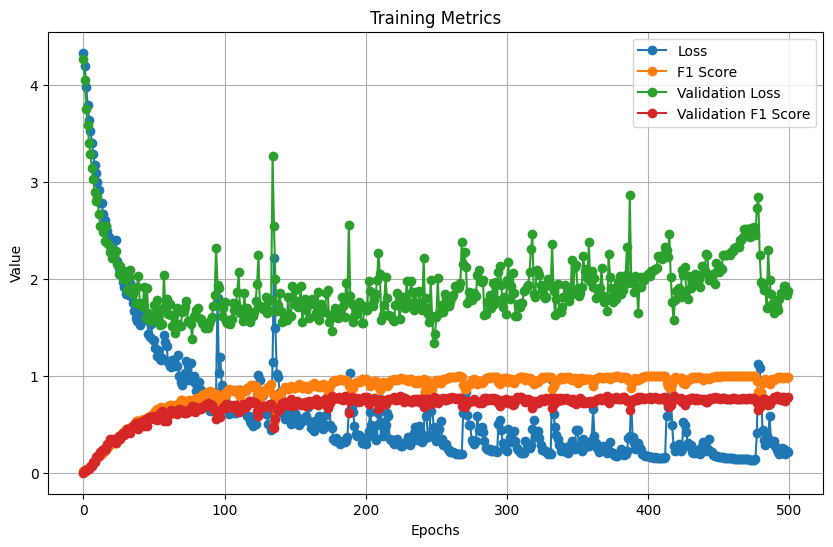

In [161]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [173]:
reconstructed_model = tf.keras.models.load_model("3 LSTM Mish")

In [174]:
reconstructed_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 130, 100)          90800     
                                                                 
 lstm_5 (LSTM)               (None, 130, 150)          150600    
                                                                 
 lstm_6 (LSTM)               (None, 200)               280800    
                                                                 
 dropout_6 (Dropout)         (None, 200)               0         
                                                                 
 dense_8 (Dense)             (None, 100)               20100     
                                                                 
 dropout_7 (Dropout)         (None, 100)               0         
                                                                 
 dense_9 (Dense)             (None, 50)               

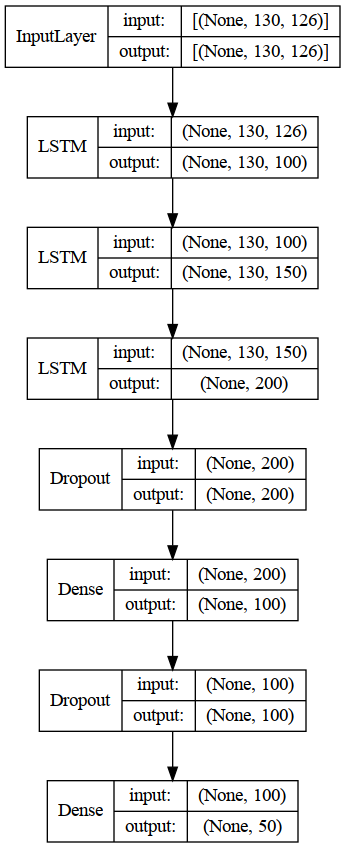

In [175]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [176]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 25ms/step - loss: 1.5850 - f1_score: 0.7967


[1.5850355625152588, 0.7967425584793091]

In [165]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 23ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      1.000     0.667     0.800         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      0.833     0.500     0.625        10
        BELT      0.800     1.000     0.889         4
        BITE      0.889     1.000     0.941         8
   BREAKFAST      0.545     1.000     0.706         6
      CANCER      0.857     0.750     0.800         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      0.571     1.000     0.727         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.600     0.750     0.667         8
     DEVELOP      0.571     0.667     0.615         6
      DINNER      0.667     0.750     0.706         8
         DOG      0.857    

## Hyperparameter Tuning 1 1D CNN Layer

In [119]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, GRU
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','gelu','elu','relu'],default='gelu')
        model = Sequential()
        model.add(Conv1D(filters=hp.Int('filters_1',min_value=50,max_value=200,step=25,default=150),
                         kernel_size=hp.Choice('kernel_1',values=[2,3,4,5,6,7,8,9,10,15,20],default=2,),
                         activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=hp.Choice('pool_1',values=[2,3,4,5,6,7,8,9,10],default=2,)))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.0,max_value=0.9,default=0.75,step=0.05,)))
        model.add(Flatten())        
        model.add(Dense(units=hp.Int('units_2',min_value=70,max_value=120,step=10,default=90),activation=act_function))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.0,max_value=0.9,default=0.5,step=0.05,)))        
        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.0032857440370174544)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

/tmp/ipykernel_1434469/3344394336.py:5: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [120]:
HYPERBAND_MAX_EPOCHS = 300
#MAX_TRIALS = 20
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/',
    project_name='1_1D_CNN',
    overwrite=False)

INFO:tensorflow:Reloading Tuner from /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/1_1D_CNN/tuner0.json


In [121]:
tuner.search_space_summary()

Search space summary
Default search space size: 8
dense_activation (Choice)
{'default': 'gelu', 'conditions': [], 'values': ['selu', 'mish', 'gelu', 'elu', 'relu'], 'ordered': False}
num_filters_1 (Choice)
{'default': 150, 'conditions': [], 'values': [100, 125, 150, 200], 'ordered': True}
kernel_1 (Choice)
{'default': 2, 'conditions': [], 'values': [2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20], 'ordered': True}
pool_1 (Choice)
{'default': 2, 'conditions': [], 'values': [2, 3, 4, 5, 6, 7, 8, 9, 10], 'ordered': True}
dropout_1 (Float)
{'default': 0.75, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_2 (Int)
{'default': 90, 'conditions': [], 'min_value': 70, 'max_value': 120, 'step': 10, 'sampling': 'linear'}
dropout_2 (Float)
{'default': 0.5, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
learning_rate (Float)
{'default': 0.0032857440370174544, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step

In [122]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [123]:
tuner.search(Xtrain, Ytrain, epochs=1000, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 03m 03s]
val_f1_score: 0.01736710499972105

Best val_f1_score So Far: 0.5334144830703735
Total elapsed time: 01h 50m 14s
INFO:tensorflow:Oracle triggered exit


In [124]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/1_1D_CNN
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0670 summary
Hyperparameters:
dense_activation: elu
num_filters_1: 150
kernel_1: 2
pool_1: 10
dropout_1: 0.55
units_2: 110
dropout_2: 0.55
learning_rate: 0.00043075793575989864
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 3
tuner/round: 3
tuner/trial_id: 0664
Score: 0.5334144830703735

Trial 0598 summary
Hyperparameters:
dense_activation: elu
num_filters_1: 100
kernel_1: 2
pool_1: 9
dropout_1: 0.0
units_2: 80
dropout_2: 0.8500000000000001
learning_rate: 0.001687289391829868
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 4
tuner/round: 4
tuner/trial_id: 0593
Score: 0.49332109093666077

Trial 0599 summary
Hyperparameters:
dense_activation: elu
num_filters_1: 150
kernel_1: 15
pool_1: 10
dropout_1: 0.15000000000000002
units_2: 80
dropout_2: 0.2
learning_rate: 0.00021098836250509396
tuner/epochs: 300
tun

In [125]:
best_model = tuner.get_best_models(num_models=1)[0]

In [126]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 129, 150)          119850    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 12, 150)          0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 12, 150)           0         
                                                                 
 flatten (Flatten)           (None, 1800)              0         
                                                                 
 dense (Dense)               (None, 110)               198110    
                                                                 
 dropout_1 (Dropout)         (None, 110)               0         
                                                        

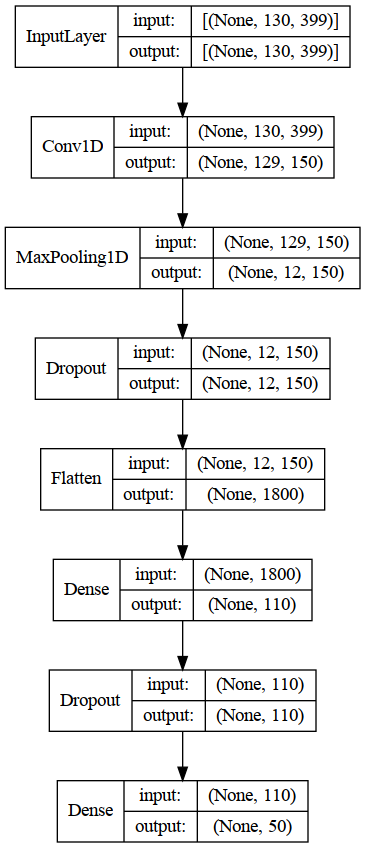

In [127]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

In [128]:
loss, accuracy = best_model.evaluate(Xval, Yval)

11/11 [==============================] - 1s 35ms/step - loss: 2.1379 - f1_score: 0.5353


In [133]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 1s 9ms/step - loss: 0.0905 - f1_score: 0.9931


In [129]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(best_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 8ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      0.462     1.000     0.632         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.455     0.500     0.476        10
        BELT      1.000     1.000     1.000         4
        BITE      0.000     0.000     0.000         8
   BREAKFAST      1.000     0.333     0.500         6
      CANCER      0.667     0.750     0.706         8
   CHRISTMAS      0.400     0.333     0.364         6
    CONFUSED      0.800     0.667     0.727         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.000     0.000     0.000         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.200     0.250     0.222         8
     DEVELOP      0.600     0.500     0.545         6
      DINNER      0.000     0.000     0.000         8
         DOG      1.000     

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [130]:
bestHP = tuner.get_best_hyperparameters(num_trials=10)[0]

In [131]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1DCNN/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [132]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - ETA: 0s - loss: 4.1782 - f1_score: 0.0219

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 10s 274ms/step - loss: 4.1782 - f1_score: 0.0219 - val_loss: 3.9117 - val_f1_score: 0.0271
Epoch 2/500
28/28 [==============================] - 1s 38ms/step - loss: 3.9862 - f1_score: 0.0322 - val_loss: 3.8709 - val_f1_score: 0.0103
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.9161 - f1_score: 0.0363

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 158ms/step - loss: 3.9153 - f1_score: 0.0366 - val_loss: 3.8101 - val_f1_score: 0.0312
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 3.8238 - f1_score: 0.0518

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 167ms/step - loss: 3.8258 - f1_score: 0.0509 - val_loss: 3.7322 - val_f1_score: 0.0355
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 3.7262 - f1_score: 0.0593

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 168ms/step - loss: 3.7282 - f1_score: 0.0601 - val_loss: 3.6588 - val_f1_score: 0.0561
Epoch 6/500
27/28 [===========================>..] - ETA: 0s - loss: 3.6179 - f1_score: 0.0731

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 140ms/step - loss: 3.6156 - f1_score: 0.0732 - val_loss: 3.5797 - val_f1_score: 0.0855
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 3.5300 - f1_score: 0.0866

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 139ms/step - loss: 3.5239 - f1_score: 0.0879 - val_loss: 3.4878 - val_f1_score: 0.0982
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 3.4141 - f1_score: 0.1070

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 147ms/step - loss: 3.4193 - f1_score: 0.1058 - val_loss: 3.3818 - val_f1_score: 0.0993
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3392 - f1_score: 0.1121

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 142ms/step - loss: 3.3353 - f1_score: 0.1125 - val_loss: 3.3242 - val_f1_score: 0.1010
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 3.2319 - f1_score: 0.1323

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 136ms/step - loss: 3.2274 - f1_score: 0.1342 - val_loss: 3.2142 - val_f1_score: 0.1514
Epoch 11/500
28/28 [==============================] - 1s 39ms/step - loss: 3.1982 - f1_score: 0.1319 - val_loss: 3.1384 - val_f1_score: 0.1456
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 3.0936 - f1_score: 0.1552

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 141ms/step - loss: 3.0887 - f1_score: 0.1567 - val_loss: 3.1138 - val_f1_score: 0.1525
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 3.0335 - f1_score: 0.1582

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 140ms/step - loss: 3.0339 - f1_score: 0.1583 - val_loss: 3.0535 - val_f1_score: 0.1649
Epoch 14/500
28/28 [==============================] - 1s 40ms/step - loss: 2.9749 - f1_score: 0.1840 - val_loss: 3.0626 - val_f1_score: 0.1647
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9055 - f1_score: 0.1906

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 148ms/step - loss: 2.9131 - f1_score: 0.1891 - val_loss: 2.9533 - val_f1_score: 0.2041
Epoch 16/500
28/28 [==============================] - 1s 39ms/step - loss: 2.8403 - f1_score: 0.2068 - val_loss: 2.9182 - val_f1_score: 0.1816
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 2.8353 - f1_score: 0.2090

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 166ms/step - loss: 2.8374 - f1_score: 0.2078 - val_loss: 2.8859 - val_f1_score: 0.2067
Epoch 18/500
28/28 [==============================] - 1s 41ms/step - loss: 2.7422 - f1_score: 0.2372 - val_loss: 2.8608 - val_f1_score: 0.1744
Epoch 19/500
27/28 [===========================>..] - ETA: 0s - loss: 2.7422 - f1_score: 0.2083

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 155ms/step - loss: 2.7340 - f1_score: 0.2104 - val_loss: 2.8076 - val_f1_score: 0.2226
Epoch 20/500
28/28 [==============================] - 1s 38ms/step - loss: 2.6935 - f1_score: 0.2383 - val_loss: 2.7784 - val_f1_score: 0.2215
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6502 - f1_score: 0.2438

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 164ms/step - loss: 2.6477 - f1_score: 0.2440 - val_loss: 2.7910 - val_f1_score: 0.2443
Epoch 22/500
28/28 [==============================] - 1s 39ms/step - loss: 2.6085 - f1_score: 0.2541 - val_loss: 2.7699 - val_f1_score: 0.2296
Epoch 23/500
28/28 [==============================] - 1s 39ms/step - loss: 2.5604 - f1_score: 0.2747 - val_loss: 2.7196 - val_f1_score: 0.2420
Epoch 24/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5434 - f1_score: 0.2710

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 177ms/step - loss: 2.5419 - f1_score: 0.2705 - val_loss: 2.7216 - val_f1_score: 0.2694
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4813 - f1_score: 0.2854

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 171ms/step - loss: 2.4850 - f1_score: 0.2857 - val_loss: 2.7140 - val_f1_score: 0.2718
Epoch 26/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4480 - f1_score: 0.3013

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 155ms/step - loss: 2.4453 - f1_score: 0.3011 - val_loss: 2.6845 - val_f1_score: 0.2883
Epoch 27/500
28/28 [==============================] - 1s 40ms/step - loss: 2.4410 - f1_score: 0.2867 - val_loss: 2.6887 - val_f1_score: 0.2609
Epoch 28/500
28/28 [==============================] - 1s 39ms/step - loss: 2.4207 - f1_score: 0.2957 - val_loss: 2.6552 - val_f1_score: 0.2343
Epoch 29/500
28/28 [==============================] - 1s 42ms/step - loss: 2.3870 - f1_score: 0.2982 - val_loss: 2.6445 - val_f1_score: 0.2817
Epoch 30/500
27/28 [===========================>..] - ETA: 0s - loss: 2.3382 - f1_score: 0.3267

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 145ms/step - loss: 2.3390 - f1_score: 0.3258 - val_loss: 2.6150 - val_f1_score: 0.3014
Epoch 31/500
27/28 [===========================>..] - ETA: 0s - loss: 2.3048 - f1_score: 0.3346

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 142ms/step - loss: 2.3063 - f1_score: 0.3346 - val_loss: 2.6020 - val_f1_score: 0.3127
Epoch 32/500
28/28 [==============================] - 1s 41ms/step - loss: 2.2747 - f1_score: 0.3353 - val_loss: 2.6115 - val_f1_score: 0.3023
Epoch 33/500
28/28 [==============================] - 1s 41ms/step - loss: 2.2553 - f1_score: 0.3488 - val_loss: 2.6204 - val_f1_score: 0.2667
Epoch 34/500
28/28 [==============================] - 1s 40ms/step - loss: 2.2401 - f1_score: 0.3372 - val_loss: 2.5669 - val_f1_score: 0.2797
Epoch 35/500
28/28 [==============================] - 1s 40ms/step - loss: 2.2148 - f1_score: 0.3461 - val_loss: 2.5499 - val_f1_score: 0.3055
Epoch 36/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2151 - f1_score: 0.3516

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 160ms/step - loss: 2.2168 - f1_score: 0.3503 - val_loss: 2.5124 - val_f1_score: 0.3485
Epoch 37/500
28/28 [==============================] - 1s 39ms/step - loss: 2.1405 - f1_score: 0.3625 - val_loss: 2.5923 - val_f1_score: 0.3150
Epoch 38/500
28/28 [==============================] - 1s 39ms/step - loss: 2.1384 - f1_score: 0.3617 - val_loss: 2.5049 - val_f1_score: 0.3378
Epoch 39/500
28/28 [==============================] - 1s 39ms/step - loss: 2.0904 - f1_score: 0.3797 - val_loss: 2.5485 - val_f1_score: 0.3256
Epoch 40/500
28/28 [==============================] - 1s 40ms/step - loss: 2.1010 - f1_score: 0.3725 - val_loss: 2.4894 - val_f1_score: 0.3147
Epoch 41/500
28/28 [==============================] - 1s 40ms/step - loss: 2.0671 - f1_score: 0.3912 - val_loss: 2.5132 - val_f1_score: 0.3182
Epoch 42/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0632 - f1_score: 0.3900

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 185ms/step - loss: 2.0594 - f1_score: 0.3930 - val_loss: 2.4909 - val_f1_score: 0.3507
Epoch 43/500
28/28 [==============================] - 1s 40ms/step - loss: 2.0624 - f1_score: 0.3921 - val_loss: 2.5102 - val_f1_score: 0.3325
Epoch 44/500
28/28 [==============================] - 1s 38ms/step - loss: 2.0037 - f1_score: 0.4190 - val_loss: 2.4545 - val_f1_score: 0.3169
Epoch 45/500
28/28 [==============================] - 1s 38ms/step - loss: 1.9986 - f1_score: 0.4112 - val_loss: 2.4759 - val_f1_score: 0.3335
Epoch 46/500
28/28 [==============================] - 1s 39ms/step - loss: 1.9590 - f1_score: 0.4076 - val_loss: 2.4200 - val_f1_score: 0.3156
Epoch 47/500
28/28 [==============================] - 1s 39ms/step - loss: 1.9338 - f1_score: 0.4272 - val_loss: 2.4407 - val_f1_score: 0.3495
Epoch 48/500
28/28 [==============================] - 1s 39ms/step - loss: 1.9268 - f1_score: 0.4338 - val_loss: 2.4171 - val_f1_score: 0.3416
Epoch 49/50

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 157ms/step - loss: 1.9099 - f1_score: 0.4217 - val_loss: 2.4008 - val_f1_score: 0.3671
Epoch 50/500
28/28 [==============================] - 1s 40ms/step - loss: 1.9079 - f1_score: 0.4285 - val_loss: 2.4326 - val_f1_score: 0.3520
Epoch 51/500
28/28 [==============================] - 1s 39ms/step - loss: 1.8582 - f1_score: 0.4349 - val_loss: 2.4649 - val_f1_score: 0.3107
Epoch 52/500
28/28 [==============================] - 1s 38ms/step - loss: 1.8630 - f1_score: 0.4367 - val_loss: 2.4377 - val_f1_score: 0.3533
Epoch 53/500
28/28 [==============================] - 1s 38ms/step - loss: 1.8508 - f1_score: 0.4402 - val_loss: 2.3979 - val_f1_score: 0.3649
Epoch 54/500
28/28 [==============================] - 1s 38ms/step - loss: 1.8105 - f1_score: 0.4581 - val_loss: 2.3543 - val_f1_score: 0.3455
Epoch 55/500
28/28 [==============================] - 1s 39ms/step - loss: 1.7580 - f1_score: 0.4595 - val_loss: 2.3423 - val_f1_score: 0.3274
Epoch 56/50

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 154ms/step - loss: 1.7297 - f1_score: 0.4734 - val_loss: 2.3374 - val_f1_score: 0.3805
Epoch 62/500
28/28 [==============================] - 1s 39ms/step - loss: 1.7307 - f1_score: 0.4744 - val_loss: 2.3368 - val_f1_score: 0.3546
Epoch 63/500
28/28 [==============================] - 1s 39ms/step - loss: 1.6346 - f1_score: 0.5083 - val_loss: 2.3700 - val_f1_score: 0.3702
Epoch 64/500
28/28 [==============================] - 1s 38ms/step - loss: 1.6413 - f1_score: 0.5019 - val_loss: 2.3654 - val_f1_score: 0.3790
Epoch 65/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6452 - f1_score: 0.5141

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 165ms/step - loss: 1.6486 - f1_score: 0.5126 - val_loss: 2.2912 - val_f1_score: 0.3806
Epoch 66/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6139 - f1_score: 0.4972

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 157ms/step - loss: 1.6190 - f1_score: 0.4955 - val_loss: 2.3192 - val_f1_score: 0.3902
Epoch 67/500
28/28 [==============================] - 1s 38ms/step - loss: 1.5940 - f1_score: 0.5091 - val_loss: 2.3074 - val_f1_score: 0.3743
Epoch 68/500
28/28 [==============================] - 1s 40ms/step - loss: 1.5714 - f1_score: 0.5308 - val_loss: 2.2765 - val_f1_score: 0.3769
Epoch 69/500
28/28 [==============================] - 1s 39ms/step - loss: 1.5776 - f1_score: 0.5352 - val_loss: 2.3100 - val_f1_score: 0.3469
Epoch 70/500
28/28 [==============================] - 1s 39ms/step - loss: 1.5892 - f1_score: 0.5157 - val_loss: 2.2845 - val_f1_score: 0.3586
Epoch 71/500
28/28 [==============================] - 1s 40ms/step - loss: 1.5390 - f1_score: 0.5316 - val_loss: 2.2787 - val_f1_score: 0.3720
Epoch 72/500
28/28 [==============================] - 1s 40ms/step - loss: 1.5048 - f1_score: 0.5442 - val_loss: 2.3427 - val_f1_score: 0.3764
Epoch 73/50

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 147ms/step - loss: 1.5125 - f1_score: 0.5371 - val_loss: 2.2344 - val_f1_score: 0.4013
Epoch 75/500
28/28 [==============================] - 1s 39ms/step - loss: 1.4918 - f1_score: 0.5489 - val_loss: 2.2846 - val_f1_score: 0.3978
Epoch 76/500
28/28 [==============================] - 1s 40ms/step - loss: 1.5103 - f1_score: 0.5374 - val_loss: 2.2786 - val_f1_score: 0.3486
Epoch 77/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4924 - f1_score: 0.5401

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 151ms/step - loss: 1.4967 - f1_score: 0.5407 - val_loss: 2.2459 - val_f1_score: 0.4083
Epoch 78/500
28/28 [==============================] - 1s 40ms/step - loss: 1.4728 - f1_score: 0.5513 - val_loss: 2.2739 - val_f1_score: 0.4028
Epoch 79/500
28/28 [==============================] - 1s 42ms/step - loss: 1.4749 - f1_score: 0.5538 - val_loss: 2.3226 - val_f1_score: 0.3350
Epoch 80/500
28/28 [==============================] - 1s 41ms/step - loss: 1.4437 - f1_score: 0.5622 - val_loss: 2.2204 - val_f1_score: 0.3950
Epoch 81/500
28/28 [==============================] - 1s 40ms/step - loss: 1.4323 - f1_score: 0.5660 - val_loss: 2.2319 - val_f1_score: 0.3996
Epoch 82/500
28/28 [==============================] - 1s 40ms/step - loss: 1.4083 - f1_score: 0.5666 - val_loss: 2.2521 - val_f1_score: 0.3929
Epoch 83/500
28/28 [==============================] - 1s 41ms/step - loss: 1.4042 - f1_score: 0.5754 - val_loss: 2.2162 - val_f1_score: 0.3877
Epoch 84/50

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 169ms/step - loss: 1.3561 - f1_score: 0.5758 - val_loss: 2.2816 - val_f1_score: 0.4087
Epoch 89/500
28/28 [==============================] - 1s 39ms/step - loss: 1.3712 - f1_score: 0.5794 - val_loss: 2.2054 - val_f1_score: 0.3547
Epoch 90/500
28/28 [==============================] - 1s 39ms/step - loss: 1.3237 - f1_score: 0.5962 - val_loss: 2.3066 - val_f1_score: 0.3825
Epoch 91/500
28/28 [==============================] - 1s 38ms/step - loss: 1.3543 - f1_score: 0.5871 - val_loss: 2.2758 - val_f1_score: 0.3778
Epoch 92/500
28/28 [==============================] - 1s 41ms/step - loss: 1.3491 - f1_score: 0.5800 - val_loss: 2.2400 - val_f1_score: 0.4046
Epoch 93/500
28/28 [==============================] - 1s 40ms/step - loss: 1.2976 - f1_score: 0.5929 - val_loss: 2.2058 - val_f1_score: 0.3717
Epoch 94/500
28/28 [==============================] - 1s 40ms/step - loss: 1.2790 - f1_score: 0.6009 - val_loss: 2.1831 - val_f1_score: 0.3993
Epoch 95/50

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 185ms/step - loss: 1.2118 - f1_score: 0.6195 - val_loss: 2.1689 - val_f1_score: 0.4268
Epoch 104/500
28/28 [==============================] - 1s 43ms/step - loss: 1.2146 - f1_score: 0.6226 - val_loss: 2.2433 - val_f1_score: 0.4040
Epoch 105/500
28/28 [==============================] - 1s 44ms/step - loss: 1.1936 - f1_score: 0.6285 - val_loss: 2.2411 - val_f1_score: 0.4012
Epoch 106/500
28/28 [==============================] - 1s 39ms/step - loss: 1.1908 - f1_score: 0.6276 - val_loss: 2.1810 - val_f1_score: 0.3893
Epoch 107/500
28/28 [==============================] - 1s 40ms/step - loss: 1.2211 - f1_score: 0.6220 - val_loss: 2.1406 - val_f1_score: 0.3851
Epoch 108/500
28/28 [==============================] - 1s 42ms/step - loss: 1.1691 - f1_score: 0.6403 - val_loss: 2.1501 - val_f1_score: 0.4032
Epoch 109/500
28/28 [==============================] - 1s 40ms/step - loss: 1.1660 - f1_score: 0.6272 - val_loss: 2.1641 - val_f1_score: 0.3957
Epoch

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 164ms/step - loss: 1.1358 - f1_score: 0.6402 - val_loss: 2.1805 - val_f1_score: 0.4338
Epoch 111/500
28/28 [==============================] - 1s 42ms/step - loss: 1.1834 - f1_score: 0.6271 - val_loss: 2.1202 - val_f1_score: 0.4246
Epoch 112/500
28/28 [==============================] - 1s 47ms/step - loss: 1.1173 - f1_score: 0.6456 - val_loss: 2.1249 - val_f1_score: 0.4228
Epoch 113/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0996 - f1_score: 0.6590

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 179ms/step - loss: 1.0960 - f1_score: 0.6580 - val_loss: 2.1423 - val_f1_score: 0.4375
Epoch 114/500
28/28 [==============================] - 1s 44ms/step - loss: 1.1109 - f1_score: 0.6531 - val_loss: 2.1896 - val_f1_score: 0.3912
Epoch 115/500
28/28 [==============================] - 1s 44ms/step - loss: 1.1169 - f1_score: 0.6459 - val_loss: 2.1257 - val_f1_score: 0.3988
Epoch 116/500
28/28 [==============================] - 1s 49ms/step - loss: 1.1177 - f1_score: 0.6469 - val_loss: 2.2203 - val_f1_score: 0.3872
Epoch 117/500
28/28 [==============================] - 1s 47ms/step - loss: 1.0777 - f1_score: 0.6600 - val_loss: 2.1139 - val_f1_score: 0.4258
Epoch 118/500
28/28 [==============================] - 1s 46ms/step - loss: 1.0820 - f1_score: 0.6620 - val_loss: 2.1724 - val_f1_score: 0.4311
Epoch 119/500
28/28 [==============================] - 1s 49ms/step - loss: 1.1056 - f1_score: 0.6512 - val_loss: 2.1168 - val_f1_score: 0.3986
Epoch

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 6s 222ms/step - loss: 1.0492 - f1_score: 0.6643 - val_loss: 2.1135 - val_f1_score: 0.4498
Epoch 126/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0506 - f1_score: 0.6723

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 192ms/step - loss: 1.0527 - f1_score: 0.6716 - val_loss: 2.1459 - val_f1_score: 0.4585
Epoch 127/500
28/28 [==============================] - 1s 42ms/step - loss: 1.0250 - f1_score: 0.6751 - val_loss: 2.1269 - val_f1_score: 0.4434
Epoch 128/500
28/28 [==============================] - 1s 42ms/step - loss: 1.0098 - f1_score: 0.6895 - val_loss: 2.1739 - val_f1_score: 0.4024
Epoch 129/500
28/28 [==============================] - 1s 44ms/step - loss: 1.0211 - f1_score: 0.6788 - val_loss: 2.1540 - val_f1_score: 0.4197
Epoch 130/500
28/28 [==============================] - 1s 44ms/step - loss: 0.9825 - f1_score: 0.6902 - val_loss: 2.0932 - val_f1_score: 0.4539
Epoch 131/500
28/28 [==============================] - 1s 46ms/step - loss: 0.9966 - f1_score: 0.6882 - val_loss: 2.1740 - val_f1_score: 0.4351
Epoch 132/500
28/28 [==============================] - 1s 47ms/step - loss: 0.9572 - f1_score: 0.6969 - val_loss: 2.1295 - val_f1_score: 0.4543
Epoch

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 7s 241ms/step - loss: 0.9347 - f1_score: 0.7065 - val_loss: 2.1122 - val_f1_score: 0.4800
Epoch 151/500
28/28 [==============================] - 1s 42ms/step - loss: 0.9158 - f1_score: 0.7018 - val_loss: 2.0570 - val_f1_score: 0.4559
Epoch 152/500
28/28 [==============================] - 1s 41ms/step - loss: 0.8624 - f1_score: 0.7234 - val_loss: 2.1097 - val_f1_score: 0.4707
Epoch 153/500
28/28 [==============================] - 1s 43ms/step - loss: 0.8907 - f1_score: 0.7150 - val_loss: 2.1275 - val_f1_score: 0.4265
Epoch 154/500
28/28 [==============================] - 1s 45ms/step - loss: 0.8570 - f1_score: 0.7298 - val_loss: 2.2188 - val_f1_score: 0.4506
Epoch 155/500
28/28 [==============================] - 1s 45ms/step - loss: 0.8886 - f1_score: 0.7193 - val_loss: 2.1022 - val_f1_score: 0.4674
Epoch 156/500
28/28 [==============================] - 1s 45ms/step - loss: 0.8793 - f1_score: 0.7156 - val_loss: 2.1219 - val_f1_score: 0.4590
Epoch

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 6s 207ms/step - loss: 0.8353 - f1_score: 0.7285 - val_loss: 2.1758 - val_f1_score: 0.4913
Epoch 167/500
28/28 [==============================] - 1s 50ms/step - loss: 0.8357 - f1_score: 0.7348 - val_loss: 2.1210 - val_f1_score: 0.4674
Epoch 168/500
28/28 [==============================] - 1s 48ms/step - loss: 0.7877 - f1_score: 0.7488 - val_loss: 2.1191 - val_f1_score: 0.4700
Epoch 169/500
28/28 [==============================] - 1s 43ms/step - loss: 0.7979 - f1_score: 0.7439 - val_loss: 2.1249 - val_f1_score: 0.4590
Epoch 170/500
28/28 [==============================] - 1s 40ms/step - loss: 0.8171 - f1_score: 0.7375 - val_loss: 2.1733 - val_f1_score: 0.4598
Epoch 171/500
28/28 [==============================] - 1s 40ms/step - loss: 0.8052 - f1_score: 0.7461 - val_loss: 2.1438 - val_f1_score: 0.4809
Epoch 172/500
28/28 [==============================] - 1s 39ms/step - loss: 0.7944 - f1_score: 0.7430 - val_loss: 2.1553 - val_f1_score: 0.4654
Epoch

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 4s 159ms/step - loss: 0.6906 - f1_score: 0.7871 - val_loss: 2.1272 - val_f1_score: 0.4927
Epoch 200/500
28/28 [==============================] - 1s 42ms/step - loss: 0.6954 - f1_score: 0.7726 - val_loss: 2.1433 - val_f1_score: 0.4555
Epoch 201/500
28/28 [==============================] - 1s 39ms/step - loss: 0.6968 - f1_score: 0.7775 - val_loss: 2.1589 - val_f1_score: 0.4726
Epoch 202/500
28/28 [==============================] - 1s 39ms/step - loss: 0.6781 - f1_score: 0.7838 - val_loss: 2.1393 - val_f1_score: 0.4714
Epoch 203/500
28/28 [==============================] - 1s 42ms/step - loss: 0.7115 - f1_score: 0.7726 - val_loss: 2.2054 - val_f1_score: 0.4481
Epoch 204/500
28/28 [==============================] - 1s 41ms/step - loss: 0.6618 - f1_score: 0.7808 - val_loss: 2.1489 - val_f1_score: 0.4577
Epoch 205/500
28/28 [==============================] - 1s 46ms/step - loss: 0.6963 - f1_score: 0.7745 - val_loss: 2.1687 - val_f1_score: 0.4566
Epoch

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 199ms/step - loss: 0.6267 - f1_score: 0.8014 - val_loss: 2.1693 - val_f1_score: 0.5213
Epoch 223/500
28/28 [==============================] - 1s 39ms/step - loss: 0.6616 - f1_score: 0.7878 - val_loss: 2.2148 - val_f1_score: 0.4863
Epoch 224/500
28/28 [==============================] - 1s 40ms/step - loss: 0.6328 - f1_score: 0.7998 - val_loss: 2.1127 - val_f1_score: 0.5029
Epoch 225/500
28/28 [==============================] - 1s 41ms/step - loss: 0.6298 - f1_score: 0.7927 - val_loss: 2.2281 - val_f1_score: 0.4898
Epoch 226/500
28/28 [==============================] - 1s 42ms/step - loss: 0.6433 - f1_score: 0.7867 - val_loss: 2.1162 - val_f1_score: 0.4791
Epoch 227/500
28/28 [==============================] - 1s 41ms/step - loss: 0.5895 - f1_score: 0.8168 - val_loss: 2.2043 - val_f1_score: 0.4436
Epoch 228/500
28/28 [==============================] - 1s 40ms/step - loss: 0.6598 - f1_score: 0.7879 - val_loss: 2.1828 - val_f1_score: 0.4749
Epoch

Epoch 279/500
28/28 [==============================] - 1s 41ms/step - loss: 0.5317 - f1_score: 0.8208 - val_loss: 2.2648 - val_f1_score: 0.4777
Epoch 280/500
28/28 [==============================] - 1s 41ms/step - loss: 0.5298 - f1_score: 0.8295 - val_loss: 2.1907 - val_f1_score: 0.4756
Epoch 281/500
28/28 [==============================] - 1s 40ms/step - loss: 0.5415 - f1_score: 0.8191 - val_loss: 2.2314 - val_f1_score: 0.4741
Epoch 282/500
28/28 [==============================] - 1s 39ms/step - loss: 0.5095 - f1_score: 0.8357 - val_loss: 2.2203 - val_f1_score: 0.4556
Epoch 283/500
28/28 [==============================] - 1s 41ms/step - loss: 0.5102 - f1_score: 0.8286 - val_loss: 2.2517 - val_f1_score: 0.4293
Epoch 284/500
28/28 [==============================] - 1s 40ms/step - loss: 0.5083 - f1_score: 0.8365 - val_loss: 2.3046 - val_f1_score: 0.4552
Epoch 285/500
28/28 [==============================] - 1s 40ms/step - loss: 0.5206 - f1_score: 0.8290 - val_loss: 2.2914 - val_f1_score:

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 5s 197ms/step - loss: 0.4780 - f1_score: 0.8323 - val_loss: 2.3004 - val_f1_score: 0.5328
Epoch 314/500
28/28 [==============================] - 1s 45ms/step - loss: 0.4620 - f1_score: 0.8375 - val_loss: 2.3037 - val_f1_score: 0.4940
Epoch 315/500
28/28 [==============================] - 1s 46ms/step - loss: 0.4699 - f1_score: 0.8469 - val_loss: 2.2468 - val_f1_score: 0.4646
Epoch 316/500
28/28 [==============================] - 1s 47ms/step - loss: 0.4786 - f1_score: 0.8413 - val_loss: 2.2371 - val_f1_score: 0.4812
Epoch 317/500
28/28 [==============================] - 1s 47ms/step - loss: 0.4689 - f1_score: 0.8540 - val_loss: 2.3163 - val_f1_score: 0.4671
Epoch 318/500
28/28 [==============================] - 1s 48ms/step - loss: 0.4539 - f1_score: 0.8552 - val_loss: 2.2709 - val_f1_score: 0.4860
Epoch 319/500
28/28 [==============================] - 1s 47ms/step - loss: 0.4810 - f1_score: 0.8355 - val_loss: 2.2812 - val_f1_score: 0.4668
Epoch

Epoch 370/500
28/28 [==============================] - 1s 40ms/step - loss: 0.4077 - f1_score: 0.8620 - val_loss: 2.3870 - val_f1_score: 0.4982
Epoch 371/500
28/28 [==============================] - 1s 45ms/step - loss: 0.4223 - f1_score: 0.8620 - val_loss: 2.3283 - val_f1_score: 0.5088
Epoch 372/500
28/28 [==============================] - 1s 43ms/step - loss: 0.4211 - f1_score: 0.8604 - val_loss: 2.3438 - val_f1_score: 0.4870
Epoch 373/500
28/28 [==============================] - 1s 42ms/step - loss: 0.4147 - f1_score: 0.8573 - val_loss: 2.3763 - val_f1_score: 0.5025
Epoch 374/500
28/28 [==============================] - 1s 40ms/step - loss: 0.4111 - f1_score: 0.8735 - val_loss: 2.4724 - val_f1_score: 0.4827
Epoch 375/500
28/28 [==============================] - 1s 43ms/step - loss: 0.4112 - f1_score: 0.8644 - val_loss: 2.3551 - val_f1_score: 0.4857
Epoch 376/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3975 - f1_score: 0.8709 - val_loss: 2.5859 - val_f1_score:

INFO:tensorflow:Assets written to: 1 1DCNN/assets


INFO:tensorflow:Assets written to: 1 1DCNN/assets


28/28 [==============================] - 8s 282ms/step - loss: 0.4104 - f1_score: 0.8628 - val_loss: 2.4444 - val_f1_score: 0.5510
Epoch 415/500
28/28 [==============================] - 1s 48ms/step - loss: 0.4164 - f1_score: 0.8598 - val_loss: 2.3924 - val_f1_score: 0.4908
Epoch 416/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3814 - f1_score: 0.8765 - val_loss: 2.4917 - val_f1_score: 0.4889
Epoch 417/500
28/28 [==============================] - 1s 50ms/step - loss: 0.3567 - f1_score: 0.8806 - val_loss: 2.4026 - val_f1_score: 0.4879
Epoch 418/500
28/28 [==============================] - 1s 47ms/step - loss: 0.3780 - f1_score: 0.8776 - val_loss: 2.4667 - val_f1_score: 0.4925
Epoch 419/500
28/28 [==============================] - 1s 52ms/step - loss: 0.3454 - f1_score: 0.8860 - val_loss: 2.5016 - val_f1_score: 0.4772
Epoch 420/500
28/28 [==============================] - 1s 47ms/step - loss: 0.4104 - f1_score: 0.8650 - val_loss: 2.5828 - val_f1_score: 0.4638
Epoch

Epoch 471/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3413 - f1_score: 0.8851 - val_loss: 2.4326 - val_f1_score: 0.4844
Epoch 472/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3177 - f1_score: 0.8969 - val_loss: 2.7352 - val_f1_score: 0.4606
Epoch 473/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3475 - f1_score: 0.8870 - val_loss: 2.5122 - val_f1_score: 0.4903
Epoch 474/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3611 - f1_score: 0.8838 - val_loss: 2.4888 - val_f1_score: 0.5031
Epoch 475/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3364 - f1_score: 0.8817 - val_loss: 2.5364 - val_f1_score: 0.5030
Epoch 476/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3651 - f1_score: 0.8783 - val_loss: 2.4413 - val_f1_score: 0.5174
Epoch 477/500
28/28 [==============================] - 1s 43ms/step - loss: 0.3608 - f1_score: 0.8704 - val_loss: 2.5263 - val_f1_score:

In [134]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.500     0.667         8
    BACKPACK      0.556     0.833     0.667         6
  BASKETBALL      0.769     1.000     0.870        10
         BEE      0.500     0.700     0.583        10
        BELT      0.571     1.000     0.727         4
        BITE      0.000     0.000     0.000         8
   BREAKFAST      0.000     0.000     0.000         6
      CANCER      0.571     1.000     0.727         8
   CHRISTMAS      0.154     0.333     0.211         6
    CONFUSED      1.000     0.667     0.800         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.000     0.000     0.000         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.000     0.000     0.000         8
     DEVELOP      0.375     0.500     0.429         6
      DINNER      0.000     0.000     0.000         8
         DOG      0.625     

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [135]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1DCNN/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [136]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.366761,0.878911,2.575713,0.494158
496,0.330135,0.890351,2.517061,0.493626
497,0.345212,0.889460,2.515764,0.493497
498,0.314874,0.889479,2.435677,0.522970
499,0.313338,0.890630,2.594901,0.472854


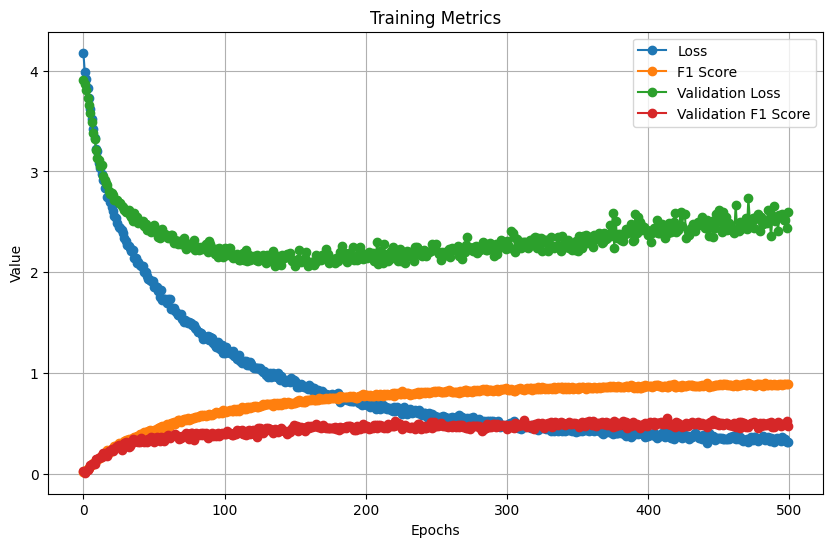

In [137]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [138]:
reconstructed_model = tf.keras.models.load_model("1 1DCNN")

In [139]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 129, 150)          119850    
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 12, 150)          0         
 1D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 12, 150)           0         
                                                                 
 flatten_1 (Flatten)         (None, 1800)              0         
                                                                 
 dense_2 (Dense)             (None, 110)               198110    
                                                                 
 dropout_3 (Dropout)         (None, 110)               0         
                                                      

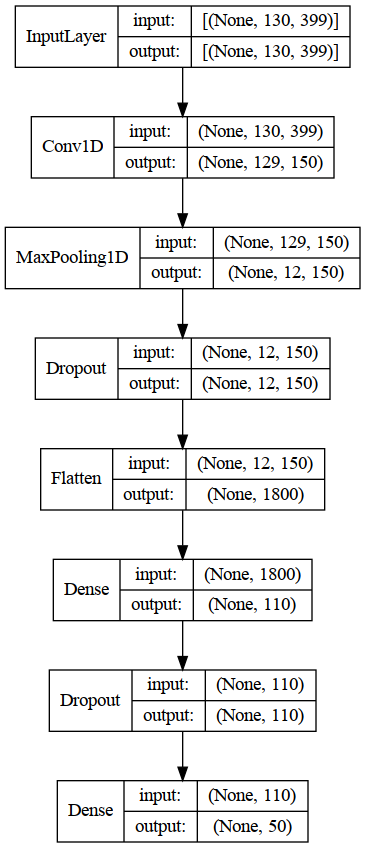

In [140]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [141]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 8ms/step - loss: 2.4444 - f1_score: 0.5510


[2.4443717002868652, 0.5509907603263855]

In [142]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 9ms/step - loss: 0.0151 - f1_score: 1.0000


[0.015102454461157322, 1.0]

In [143]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 8ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.500     0.667         8
    BACKPACK      0.545     1.000     0.706         6
  BASKETBALL      0.769     1.000     0.870        10
         BEE      0.600     0.600     0.600        10
        BELT      1.000     1.000     1.000         4
        BITE      0.000     0.000     0.000         8
   BREAKFAST      1.000     0.333     0.500         6
      CANCER      0.500     1.000     0.667         8
   CHRISTMAS      0.400     0.333     0.364         6
    CONFUSED      1.000     0.667     0.800         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.300     0.500     0.375         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.333     0.250     0.286         8
     DEVELOP      0.400     0.333     0.364         6
      DINNER      0.000     0.000     0.000         8
         DOG      0.857     

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [156]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1DCNN Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [157]:
act_function=mish
model = Sequential()
model.add(Conv1D(filters=100,kernel_size=10,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=10))
model.add(Dropout(.45))
model.add(Flatten())
model.add(Dense(units=70,activation=act_function))
model.add(Dropout(.5))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.0035029559985702272),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_7 (Conv1D)           (None, 121, 100)          126100    
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 12, 100)          0         
 1D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 12, 100)           0         
                                                                 
 flatten_7 (Flatten)         (None, 1200)              0         
                                                                 
 dense_14 (Dense)            (None, 70)                84070     
                                                                 
 dropout_7 (Dropout)         (None, 70)                0         
                                                      

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 7s 205ms/step - loss: 3.9295 - f1_score: 0.0272 - val_loss: 3.7434 - val_f1_score: 0.0431
Epoch 2/500
26/28 [==========================>...] - ETA: 0s - loss: 3.5867 - f1_score: 0.0800

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 149ms/step - loss: 3.5740 - f1_score: 0.0805 - val_loss: 3.2072 - val_f1_score: 0.1158
Epoch 3/500
28/28 [==============================] - ETA: 0s - loss: 3.1549 - f1_score: 0.1401

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 143ms/step - loss: 3.1549 - f1_score: 0.1401 - val_loss: 2.8360 - val_f1_score: 0.1807
Epoch 4/500
26/28 [==========================>...] - ETA: 0s - loss: 2.8250 - f1_score: 0.2117

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 162ms/step - loss: 2.8269 - f1_score: 0.2108 - val_loss: 2.5794 - val_f1_score: 0.2653
Epoch 5/500
28/28 [==============================] - ETA: 0s - loss: 2.5917 - f1_score: 0.2445

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 162ms/step - loss: 2.5917 - f1_score: 0.2445 - val_loss: 2.3931 - val_f1_score: 0.2898
Epoch 6/500
28/28 [==============================] - ETA: 0s - loss: 2.3805 - f1_score: 0.2910

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 148ms/step - loss: 2.3805 - f1_score: 0.2910 - val_loss: 2.2418 - val_f1_score: 0.3177
Epoch 7/500
28/28 [==============================] - ETA: 0s - loss: 2.2402 - f1_score: 0.3236

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 135ms/step - loss: 2.2402 - f1_score: 0.3236 - val_loss: 2.1358 - val_f1_score: 0.3831
Epoch 8/500
28/28 [==============================] - 1s 27ms/step - loss: 2.1153 - f1_score: 0.3737 - val_loss: 2.1321 - val_f1_score: 0.3772
Epoch 9/500
28/28 [==============================] - ETA: 0s - loss: 2.0301 - f1_score: 0.3837

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 150ms/step - loss: 2.0301 - f1_score: 0.3837 - val_loss: 1.9113 - val_f1_score: 0.4845
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9544 - f1_score: 0.4089

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 165ms/step - loss: 1.9532 - f1_score: 0.4096 - val_loss: 1.8454 - val_f1_score: 0.4880
Epoch 11/500
28/28 [==============================] - 1s 26ms/step - loss: 1.8266 - f1_score: 0.4359 - val_loss: 1.7907 - val_f1_score: 0.4836
Epoch 12/500
28/28 [==============================] - ETA: 0s - loss: 1.8209 - f1_score: 0.4442

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 144ms/step - loss: 1.8209 - f1_score: 0.4442 - val_loss: 1.7860 - val_f1_score: 0.5144
Epoch 13/500
26/28 [==========================>...] - ETA: 0s - loss: 1.7776 - f1_score: 0.4450

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 146ms/step - loss: 1.7710 - f1_score: 0.4466 - val_loss: 1.6801 - val_f1_score: 0.5452
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6953 - f1_score: 0.4761

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 5s 169ms/step - loss: 1.6969 - f1_score: 0.4749 - val_loss: 1.6713 - val_f1_score: 0.5596
Epoch 15/500
28/28 [==============================] - 1s 28ms/step - loss: 1.6358 - f1_score: 0.4928 - val_loss: 1.6990 - val_f1_score: 0.5361
Epoch 16/500
28/28 [==============================] - 1s 29ms/step - loss: 1.5864 - f1_score: 0.5091 - val_loss: 1.6427 - val_f1_score: 0.5527
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5137 - f1_score: 0.5328

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 149ms/step - loss: 1.5145 - f1_score: 0.5333 - val_loss: 1.5974 - val_f1_score: 0.5933
Epoch 18/500
28/28 [==============================] - 1s 28ms/step - loss: 1.4761 - f1_score: 0.5495 - val_loss: 1.6105 - val_f1_score: 0.5633
Epoch 19/500
28/28 [==============================] - 1s 27ms/step - loss: 1.4857 - f1_score: 0.5382 - val_loss: 1.5700 - val_f1_score: 0.5734
Epoch 20/500
28/28 [==============================] - 1s 27ms/step - loss: 1.4675 - f1_score: 0.5577 - val_loss: 1.5586 - val_f1_score: 0.5588
Epoch 21/500
28/28 [==============================] - 1s 27ms/step - loss: 1.4163 - f1_score: 0.5495 - val_loss: 1.5461 - val_f1_score: 0.5736
Epoch 22/500
28/28 [==============================] - 1s 27ms/step - loss: 1.4018 - f1_score: 0.5608 - val_loss: 1.5144 - val_f1_score: 0.5763
Epoch 23/500
26/28 [==========================>...] - ETA: 0s - loss: 1.3764 - f1_score: 0.5804

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 135ms/step - loss: 1.3744 - f1_score: 0.5839 - val_loss: 1.5278 - val_f1_score: 0.5942
Epoch 24/500
28/28 [==============================] - 1s 27ms/step - loss: 1.3523 - f1_score: 0.5746 - val_loss: 1.4866 - val_f1_score: 0.5942
Epoch 25/500
26/28 [==========================>...] - ETA: 0s - loss: 1.3277 - f1_score: 0.5826

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 149ms/step - loss: 1.3274 - f1_score: 0.5844 - val_loss: 1.4635 - val_f1_score: 0.6363
Epoch 26/500
28/28 [==============================] - 1s 27ms/step - loss: 1.3035 - f1_score: 0.5880 - val_loss: 1.4989 - val_f1_score: 0.6151
Epoch 27/500
28/28 [==============================] - 1s 27ms/step - loss: 1.3065 - f1_score: 0.5893 - val_loss: 1.4731 - val_f1_score: 0.5950
Epoch 28/500
28/28 [==============================] - 1s 28ms/step - loss: 1.2834 - f1_score: 0.5949 - val_loss: 1.4997 - val_f1_score: 0.6277
Epoch 29/500
28/28 [==============================] - 1s 27ms/step - loss: 1.2350 - f1_score: 0.6147 - val_loss: 1.4981 - val_f1_score: 0.5860
Epoch 30/500
28/28 [==============================] - 1s 28ms/step - loss: 1.2188 - f1_score: 0.6004 - val_loss: 1.5006 - val_f1_score: 0.5975
Epoch 31/500
28/28 [==============================] - 1s 28ms/step - loss: 1.1616 - f1_score: 0.6315 - val_loss: 1.4245 - val_f1_score: 0.6256
Epoch 32/50

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 135ms/step - loss: 1.0563 - f1_score: 0.6607 - val_loss: 1.5353 - val_f1_score: 0.6411
Epoch 46/500
28/28 [==============================] - 1s 27ms/step - loss: 1.1016 - f1_score: 0.6475 - val_loss: 1.5631 - val_f1_score: 0.5817
Epoch 47/500
28/28 [==============================] - 1s 27ms/step - loss: 1.0862 - f1_score: 0.6641 - val_loss: 1.4723 - val_f1_score: 0.6339
Epoch 48/500
28/28 [==============================] - 1s 27ms/step - loss: 1.0115 - f1_score: 0.6891 - val_loss: 1.5877 - val_f1_score: 0.6115
Epoch 49/500
28/28 [==============================] - 1s 28ms/step - loss: 1.0475 - f1_score: 0.6665 - val_loss: 1.5050 - val_f1_score: 0.6080
Epoch 50/500
28/28 [==============================] - 1s 27ms/step - loss: 1.0362 - f1_score: 0.6879 - val_loss: 1.5577 - val_f1_score: 0.6295
Epoch 51/500
28/28 [==============================] - 1s 28ms/step - loss: 0.9486 - f1_score: 0.6974 - val_loss: 1.4893 - val_f1_score: 0.6237
Epoch 52/50

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 5s 173ms/step - loss: 1.0177 - f1_score: 0.6769 - val_loss: 1.5384 - val_f1_score: 0.6567
Epoch 55/500
28/28 [==============================] - 1s 27ms/step - loss: 1.0154 - f1_score: 0.6780 - val_loss: 1.5456 - val_f1_score: 0.6372
Epoch 56/500
28/28 [==============================] - 1s 28ms/step - loss: 0.9893 - f1_score: 0.6757 - val_loss: 1.4634 - val_f1_score: 0.6457
Epoch 57/500
28/28 [==============================] - 1s 28ms/step - loss: 1.0033 - f1_score: 0.6888 - val_loss: 1.5272 - val_f1_score: 0.6321
Epoch 58/500
28/28 [==============================] - 1s 29ms/step - loss: 0.9585 - f1_score: 0.6886 - val_loss: 1.5018 - val_f1_score: 0.6531
Epoch 59/500
28/28 [==============================] - 1s 28ms/step - loss: 0.9976 - f1_score: 0.6822 - val_loss: 1.5221 - val_f1_score: 0.6308
Epoch 60/500
28/28 [==============================] - 1s 29ms/step - loss: 1.0055 - f1_score: 0.6795 - val_loss: 1.5139 - val_f1_score: 0.6546
Epoch 61/50

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 4s 148ms/step - loss: 0.9578 - f1_score: 0.6920 - val_loss: 1.4318 - val_f1_score: 0.6706
Epoch 69/500
28/28 [==============================] - 1s 28ms/step - loss: 0.9616 - f1_score: 0.6934 - val_loss: 1.5769 - val_f1_score: 0.6383
Epoch 70/500
28/28 [==============================] - 1s 29ms/step - loss: 0.9213 - f1_score: 0.7145 - val_loss: 1.5490 - val_f1_score: 0.6423
Epoch 71/500
28/28 [==============================] - 1s 28ms/step - loss: 0.9546 - f1_score: 0.7108 - val_loss: 1.6244 - val_f1_score: 0.6478
Epoch 72/500
28/28 [==============================] - 1s 28ms/step - loss: 0.8920 - f1_score: 0.7123 - val_loss: 1.5963 - val_f1_score: 0.6496
Epoch 73/500
28/28 [==============================] - 1s 28ms/step - loss: 0.8990 - f1_score: 0.7161 - val_loss: 1.6083 - val_f1_score: 0.6410
Epoch 74/500
28/28 [==============================] - 1s 29ms/step - loss: 0.9155 - f1_score: 0.7130 - val_loss: 1.5260 - val_f1_score: 0.6572
Epoch 75/50

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 5s 167ms/step - loss: 0.8985 - f1_score: 0.7136 - val_loss: 1.5343 - val_f1_score: 0.7006
Epoch 85/500
28/28 [==============================] - 1s 27ms/step - loss: 0.8414 - f1_score: 0.7364 - val_loss: 1.6923 - val_f1_score: 0.6575
Epoch 86/500
28/28 [==============================] - 1s 28ms/step - loss: 0.9052 - f1_score: 0.7111 - val_loss: 1.6756 - val_f1_score: 0.6471
Epoch 87/500
28/28 [==============================] - 1s 27ms/step - loss: 0.9080 - f1_score: 0.7137 - val_loss: 1.7202 - val_f1_score: 0.6176
Epoch 88/500
28/28 [==============================] - 1s 27ms/step - loss: 0.8938 - f1_score: 0.7100 - val_loss: 1.5787 - val_f1_score: 0.6517
Epoch 89/500
28/28 [==============================] - 1s 29ms/step - loss: 0.8539 - f1_score: 0.7294 - val_loss: 1.6462 - val_f1_score: 0.6563
Epoch 90/500
28/28 [==============================] - 1s 28ms/step - loss: 0.8656 - f1_score: 0.7332 - val_loss: 1.5140 - val_f1_score: 0.6706
Epoch 91/50

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 5s 193ms/step - loss: 0.7779 - f1_score: 0.7490 - val_loss: 1.6791 - val_f1_score: 0.7017
Epoch 118/500
28/28 [==============================] - 1s 29ms/step - loss: 0.7943 - f1_score: 0.7454 - val_loss: 1.9058 - val_f1_score: 0.6466
Epoch 119/500
28/28 [==============================] - 1s 29ms/step - loss: 0.8660 - f1_score: 0.7274 - val_loss: 1.7576 - val_f1_score: 0.6343
Epoch 120/500
28/28 [==============================] - 1s 29ms/step - loss: 0.8250 - f1_score: 0.7431 - val_loss: 1.7693 - val_f1_score: 0.6809
Epoch 121/500
28/28 [==============================] - 1s 29ms/step - loss: 0.8000 - f1_score: 0.7481 - val_loss: 1.9258 - val_f1_score: 0.6390
Epoch 122/500
28/28 [==============================] - 1s 28ms/step - loss: 0.8402 - f1_score: 0.7380 - val_loss: 1.8695 - val_f1_score: 0.6483
Epoch 123/500
28/28 [==============================] - 1s 29ms/step - loss: 0.8136 - f1_score: 0.7341 - val_loss: 1.8129 - val_f1_score: 0.6356
Epoch

Epoch 174/500
28/28 [==============================] - 1s 29ms/step - loss: 0.7690 - f1_score: 0.7676 - val_loss: 1.9039 - val_f1_score: 0.6759
Epoch 175/500
28/28 [==============================] - 1s 29ms/step - loss: 0.7350 - f1_score: 0.7715 - val_loss: 1.8279 - val_f1_score: 0.6615
Epoch 176/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7455 - f1_score: 0.7596 - val_loss: 1.8453 - val_f1_score: 0.6645
Epoch 177/500
28/28 [==============================] - 1s 28ms/step - loss: 0.8004 - f1_score: 0.7455 - val_loss: 1.7865 - val_f1_score: 0.6783
Epoch 178/500
28/28 [==============================] - 1s 28ms/step - loss: 0.8076 - f1_score: 0.7407 - val_loss: 1.8188 - val_f1_score: 0.6571
Epoch 179/500
28/28 [==============================] - 1s 28ms/step - loss: 0.8244 - f1_score: 0.7565 - val_loss: 1.8794 - val_f1_score: 0.6590
Epoch 180/500
28/28 [==============================] - 1s 30ms/step - loss: 0.7624 - f1_score: 0.7661 - val_loss: 1.9383 - val_f1_score:

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 5s 184ms/step - loss: 0.7487 - f1_score: 0.7617 - val_loss: 1.9010 - val_f1_score: 0.7059
Epoch 186/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7562 - f1_score: 0.7617 - val_loss: 1.9268 - val_f1_score: 0.6649
Epoch 187/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7473 - f1_score: 0.7610 - val_loss: 2.0778 - val_f1_score: 0.6404
Epoch 188/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7705 - f1_score: 0.7588 - val_loss: 2.1836 - val_f1_score: 0.6224
Epoch 189/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7362 - f1_score: 0.7630 - val_loss: 2.1180 - val_f1_score: 0.6693
Epoch 190/500
28/28 [==============================] - 1s 29ms/step - loss: 0.7541 - f1_score: 0.7578 - val_loss: 2.0729 - val_f1_score: 0.6672
Epoch 191/500
28/28 [==============================] - 1s 28ms/step - loss: 0.8089 - f1_score: 0.7473 - val_loss: 1.9848 - val_f1_score: 0.6677
Epoch

Epoch 242/500
28/28 [==============================] - 1s 29ms/step - loss: 0.7199 - f1_score: 0.7717 - val_loss: 2.0244 - val_f1_score: 0.6715
Epoch 243/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7594 - f1_score: 0.7706 - val_loss: 2.0607 - val_f1_score: 0.6686
Epoch 244/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7002 - f1_score: 0.7773 - val_loss: 2.1898 - val_f1_score: 0.6681
Epoch 245/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7394 - f1_score: 0.7642 - val_loss: 2.0464 - val_f1_score: 0.6476
Epoch 246/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7016 - f1_score: 0.7900 - val_loss: 1.9403 - val_f1_score: 0.6562
Epoch 247/500
28/28 [==============================] - 1s 29ms/step - loss: 0.7533 - f1_score: 0.7631 - val_loss: 1.9748 - val_f1_score: 0.6679
Epoch 248/500
28/28 [==============================] - 1s 29ms/step - loss: 0.7190 - f1_score: 0.7744 - val_loss: 2.0913 - val_f1_score:

Epoch 299/500
28/28 [==============================] - 1s 29ms/step - loss: 0.7227 - f1_score: 0.7764 - val_loss: 2.2519 - val_f1_score: 0.6414
Epoch 300/500
28/28 [==============================] - 1s 29ms/step - loss: 0.6874 - f1_score: 0.7924 - val_loss: 2.1512 - val_f1_score: 0.6565
Epoch 301/500
28/28 [==============================] - 1s 30ms/step - loss: 0.7244 - f1_score: 0.7747 - val_loss: 2.1795 - val_f1_score: 0.6475
Epoch 302/500
28/28 [==============================] - 1s 29ms/step - loss: 0.6768 - f1_score: 0.7878 - val_loss: 2.1803 - val_f1_score: 0.6605
Epoch 303/500
28/28 [==============================] - 1s 32ms/step - loss: 0.6279 - f1_score: 0.7994 - val_loss: 2.1623 - val_f1_score: 0.6589
Epoch 304/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6517 - f1_score: 0.7989 - val_loss: 2.3026 - val_f1_score: 0.6464
Epoch 305/500
28/28 [==============================] - 1s 29ms/step - loss: 0.6973 - f1_score: 0.7732 - val_loss: 2.2351 - val_f1_score:

Epoch 356/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6753 - f1_score: 0.7940 - val_loss: 2.3017 - val_f1_score: 0.6629
Epoch 357/500
28/28 [==============================] - 1s 28ms/step - loss: 0.6912 - f1_score: 0.7866 - val_loss: 2.2821 - val_f1_score: 0.6835
Epoch 358/500
28/28 [==============================] - 1s 29ms/step - loss: 0.6537 - f1_score: 0.7944 - val_loss: 2.4060 - val_f1_score: 0.6761
Epoch 359/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6739 - f1_score: 0.7873 - val_loss: 2.3856 - val_f1_score: 0.6944
Epoch 360/500
28/28 [==============================] - 1s 29ms/step - loss: 0.6619 - f1_score: 0.8010 - val_loss: 2.1955 - val_f1_score: 0.6486
Epoch 361/500
28/28 [==============================] - 1s 28ms/step - loss: 0.6991 - f1_score: 0.7936 - val_loss: 2.1356 - val_f1_score: 0.6777
Epoch 362/500
28/28 [==============================] - 1s 28ms/step - loss: 0.6603 - f1_score: 0.7934 - val_loss: 2.4275 - val_f1_score:

Epoch 413/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7163 - f1_score: 0.7915 - val_loss: 2.2895 - val_f1_score: 0.6664
Epoch 414/500
28/28 [==============================] - 1s 29ms/step - loss: 0.6888 - f1_score: 0.7818 - val_loss: 2.2909 - val_f1_score: 0.6757
Epoch 415/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6669 - f1_score: 0.7910 - val_loss: 2.4411 - val_f1_score: 0.6774
Epoch 416/500
28/28 [==============================] - 1s 28ms/step - loss: 0.6387 - f1_score: 0.8042 - val_loss: 2.3516 - val_f1_score: 0.6758
Epoch 417/500
28/28 [==============================] - 1s 28ms/step - loss: 0.6329 - f1_score: 0.7972 - val_loss: 2.5030 - val_f1_score: 0.6652
Epoch 418/500
28/28 [==============================] - 1s 29ms/step - loss: 0.6367 - f1_score: 0.8037 - val_loss: 2.4073 - val_f1_score: 0.6615
Epoch 419/500
28/28 [==============================] - 1s 29ms/step - loss: 0.6610 - f1_score: 0.8001 - val_loss: 2.2766 - val_f1_score:

Epoch 470/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6488 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN Mish/assets


28/28 [==============================] - 6s 214ms/step - loss: 0.6453 - f1_score: 0.8071 - val_loss: 2.2875 - val_f1_score: 0.7138
Epoch 471/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6514 - f1_score: 0.8021 - val_loss: 2.3760 - val_f1_score: 0.6312
Epoch 472/500
28/28 [==============================] - 1s 28ms/step - loss: 0.7024 - f1_score: 0.7945 - val_loss: 2.3441 - val_f1_score: 0.6362
Epoch 473/500
28/28 [==============================] - 1s 28ms/step - loss: 0.6986 - f1_score: 0.7863 - val_loss: 2.2123 - val_f1_score: 0.6755
Epoch 474/500
28/28 [==============================] - 1s 28ms/step - loss: 0.6656 - f1_score: 0.7939 - val_loss: 2.3363 - val_f1_score: 0.6733
Epoch 475/500
28/28 [==============================] - 1s 28ms/step - loss: 0.6515 - f1_score: 0.8012 - val_loss: 2.2067 - val_f1_score: 0.6508
Epoch 476/500
28/28 [==============================] - 1s 28ms/step - loss: 0.6273 - f1_score: 0.8050 - val_loss: 2.2252 - val_f1_score: 0.6238
Epoch

In [158]:
#cm = confusion_matrix(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1))

#sns.heatmap(cm, annot = True)

print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 5ms/step
              precision    recall  f1-score   support

         AXE      0.700     0.875     0.778         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.750     0.900     0.818        10
         BEE      0.714     0.500     0.588        10
        BELT      0.667     0.500     0.571         4
        BITE      0.875     0.875     0.875         8
   BREAKFAST      0.500     0.833     0.625         6
      CANCER      0.750     0.750     0.750         8
   CHRISTMAS      0.500     0.333     0.400         6
    CONFUSED      0.400     0.667     0.500         6
        DARK      0.500     0.750     0.600         4
        DEAF      0.714     0.833     0.769         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.500     0.125     0.200         8
     DEVELOP      0.250     0.333     0.286         6
      DINNER      0.556     0.625     0.588         8
         DOG      0.857     

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [159]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1DCNN Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [160]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.700062,0.784287,2.186885,0.674277
496,0.631826,0.817843,2.130422,0.690464
497,0.661597,0.792440,2.182400,0.663510
498,0.613794,0.809960,2.254866,0.666186
499,0.664343,0.794096,2.200406,0.661046


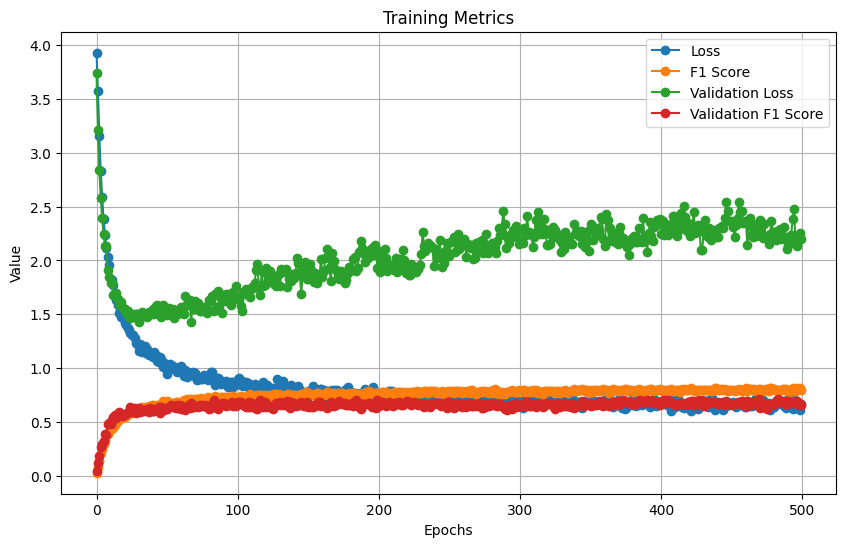

In [161]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [127]:
reconstructed_model = tf.keras.models.load_model("1 1DCNN Mish")

In [128]:
reconstructed_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_7 (Conv1D)           (None, 121, 100)          126100    
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 12, 100)          0         
 1D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 12, 100)           0         
                                                                 
 flatten_7 (Flatten)         (None, 1200)              0         
                                                                 
 dense_14 (Dense)            (None, 70)                84070     
                                                                 
 dropout_7 (Dropout)         (None, 70)                0         
                                                      

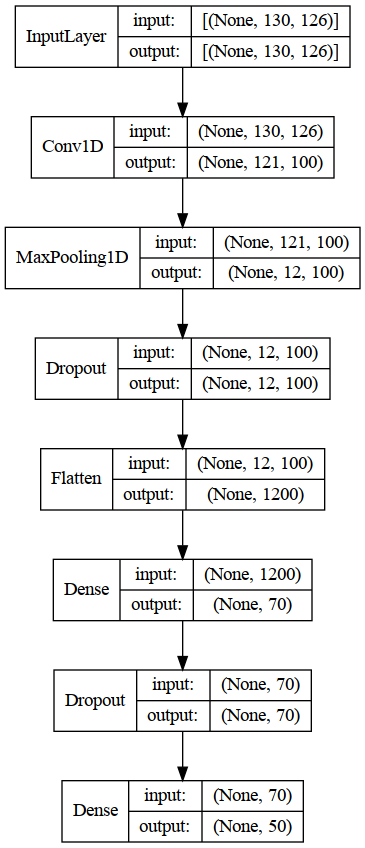

In [129]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [130]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 7ms/step - loss: 2.2875 - f1_score: 0.7138


[2.2875282764434814, 0.7138184905052185]

In [164]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 5ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.667     1.000     0.800         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.667     0.600     0.632        10
        BELT      1.000     0.750     0.857         4
        BITE      0.727     1.000     0.842         8
   BREAKFAST      0.375     0.500     0.429         6
      CANCER      0.778     0.875     0.824         8
   CHRISTMAS      0.571     0.667     0.615         6
    CONFUSED      0.800     0.667     0.727         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.833     0.833     0.833         6
      DECIDE      0.667     0.667     0.667         6
      DEMAND      0.000     0.000     0.000         8
     DEVELOP      0.333     0.500     0.400         6
      DINNER      0.455     0.625     0.526         8
         DOG      0.857     

In [143]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1DCNN Lecunnormal/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [147]:
act_function='selu'
model = Sequential()
initializer = tf.keras.initializers.LecunNormal(seed=10)
model.add(Conv1D(filters=100,kernel_initializer=initializer,kernel_size=10,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=10))
#model.add(Dropout(.45))
model.add(Flatten())
model.add(Dense(units=70,activation=act_function,kernel_initializer=initializer))
#model.add(Dropout(.5))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.0035029559985702272),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 121, 100)          126100    
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 12, 100)          0         
 1D)                                                             
                                                                 
 flatten_6 (Flatten)         (None, 1200)              0         
                                                                 
 dense_12 (Dense)            (None, 70)                84070     
                                                                 
 dense_13 (Dense)            (None, 50)                3550      
                                                                 
Total params: 213,720
Trainable params: 213,720
Non-trainable params: 0
________________________________________________

INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


28/28 [==============================] - 5s 173ms/step - loss: 0.1215 - f1_score: 0.9728 - val_loss: 2.2110 - val_f1_score: 0.6170
Epoch 12/500
28/28 [==============================] - 1s 24ms/step - loss: 0.0715 - f1_score: 0.9879 - val_loss: 2.4017 - val_f1_score: 0.5847
Epoch 13/500
28/28 [==============================] - 1s 24ms/step - loss: 0.0575 - f1_score: 0.9937 - val_loss: 2.3083 - val_f1_score: 0.6043
Epoch 14/500
28/28 [==============================] - 1s 24ms/step - loss: 0.0358 - f1_score: 0.9970 - val_loss: 2.4347 - val_f1_score: 0.5994
Epoch 15/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0229 - f1_score: 0.9989 - val_loss: 2.4907 - val_f1_score: 0.6002
Epoch 16/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0146 - f1_score: 1.0000 - val_loss: 2.4812 - val_f1_score: 0.6006
Epoch 17/500
28/28 [==============================] - ETA: 0s - loss: 0.0102 - f1_score: 1.0000

INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


28/28 [==============================] - 4s 141ms/step - loss: 0.0102 - f1_score: 1.0000 - val_loss: 2.5199 - val_f1_score: 0.6185
Epoch 18/500
28/28 [==============================] - ETA: 0s - loss: 0.0086 - f1_score: 1.0000

INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


28/28 [==============================] - 4s 166ms/step - loss: 0.0086 - f1_score: 1.0000 - val_loss: 2.5680 - val_f1_score: 0.6232
Epoch 19/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0066 - f1_score: 1.0000 - val_loss: 2.6046 - val_f1_score: 0.6162
Epoch 20/500
28/28 [==============================] - 1s 24ms/step - loss: 0.0059 - f1_score: 1.0000 - val_loss: 2.6258 - val_f1_score: 0.6210
Epoch 21/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0053 - f1_score: 1.0000 - val_loss: 2.6564 - val_f1_score: 0.6151
Epoch 22/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0047 - f1_score: 1.0000 - val_loss: 2.7041 - val_f1_score: 0.6202
Epoch 23/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0042 - f1_score: 1.0000 - val_loss: 2.7059 - val_f1_score: 0.6149
Epoch 24/500
27/28 [===========================>..] - ETA: 0s - loss: 0.0039 - f1_score: 1.0000

INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


28/28 [==============================] - 4s 155ms/step - loss: 0.0039 - f1_score: 1.0000 - val_loss: 2.7498 - val_f1_score: 0.6273
Epoch 25/500
28/28 [==============================] - 1s 24ms/step - loss: 0.0036 - f1_score: 1.0000 - val_loss: 2.7758 - val_f1_score: 0.6226
Epoch 26/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0033 - f1_score: 1.0000 - val_loss: 2.8014 - val_f1_score: 0.6259
Epoch 27/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0030 - f1_score: 1.0000 - val_loss: 2.8327 - val_f1_score: 0.6184
Epoch 28/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0028 - f1_score: 1.0000 - val_loss: 2.8317 - val_f1_score: 0.6170
Epoch 29/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0026 - f1_score: 1.0000 - val_loss: 2.8707 - val_f1_score: 0.6135
Epoch 30/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0025 - f1_score: 1.0000 - val_loss: 2.8867 - val_f1_score: 0.6244
Epoch 31/50

INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN Lecunnormal/assets


28/28 [==============================] - 4s 142ms/step - loss: 0.0019 - f1_score: 1.0000 - val_loss: 2.9630 - val_f1_score: 0.6279
Epoch 35/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0018 - f1_score: 1.0000 - val_loss: 2.9803 - val_f1_score: 0.6200
Epoch 36/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0017 - f1_score: 1.0000 - val_loss: 2.9886 - val_f1_score: 0.6266
Epoch 37/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0016 - f1_score: 1.0000 - val_loss: 3.0204 - val_f1_score: 0.6215
Epoch 38/500
28/28 [==============================] - 1s 25ms/step - loss: 0.0015 - f1_score: 1.0000 - val_loss: 3.0309 - val_f1_score: 0.6224
Epoch 39/500
28/28 [==============================] - 1s 26ms/step - loss: 0.0014 - f1_score: 1.0000 - val_loss: 3.0480 - val_f1_score: 0.6167
Epoch 40/500
28/28 [==============================] - 1s 26ms/step - loss: 0.0014 - f1_score: 1.0000 - val_loss: 3.0681 - val_f1_score: 0.6220
Epoch 41/50

28/28 [==============================] - 1s 27ms/step - loss: 6.8729e-05 - f1_score: 1.0000 - val_loss: 4.0252 - val_f1_score: 0.6076
Epoch 146/500
28/28 [==============================] - 1s 26ms/step - loss: 6.7465e-05 - f1_score: 1.0000 - val_loss: 4.0355 - val_f1_score: 0.6066
Epoch 147/500
28/28 [==============================] - 1s 26ms/step - loss: 6.5944e-05 - f1_score: 1.0000 - val_loss: 4.0388 - val_f1_score: 0.6055
Epoch 148/500
28/28 [==============================] - 1s 26ms/step - loss: 6.4743e-05 - f1_score: 1.0000 - val_loss: 4.0422 - val_f1_score: 0.6066
Epoch 149/500
28/28 [==============================] - 1s 26ms/step - loss: 6.3373e-05 - f1_score: 1.0000 - val_loss: 4.0486 - val_f1_score: 0.6101
Epoch 150/500
28/28 [==============================] - 1s 26ms/step - loss: 6.2150e-05 - f1_score: 1.0000 - val_loss: 4.0558 - val_f1_score: 0.6066
Epoch 151/500
28/28 [==============================] - 1s 26ms/step - loss: 6.1029e-05 - f1_score: 1.0000 - val_loss: 4.0637 -

28/28 [==============================] - 1s 26ms/step - loss: 9.6625e-06 - f1_score: 1.0000 - val_loss: 4.6390 - val_f1_score: 0.6097
Epoch 256/500
28/28 [==============================] - 1s 26ms/step - loss: 9.4955e-06 - f1_score: 1.0000 - val_loss: 4.6437 - val_f1_score: 0.6091
Epoch 257/500
28/28 [==============================] - 1s 26ms/step - loss: 9.3523e-06 - f1_score: 1.0000 - val_loss: 4.6490 - val_f1_score: 0.6097
Epoch 258/500
28/28 [==============================] - 1s 26ms/step - loss: 9.2212e-06 - f1_score: 1.0000 - val_loss: 4.6566 - val_f1_score: 0.6115
Epoch 259/500
28/28 [==============================] - 1s 25ms/step - loss: 9.0355e-06 - f1_score: 1.0000 - val_loss: 4.6599 - val_f1_score: 0.6088
Epoch 260/500
28/28 [==============================] - 1s 26ms/step - loss: 8.8774e-06 - f1_score: 1.0000 - val_loss: 4.6672 - val_f1_score: 0.6139
Epoch 261/500
28/28 [==============================] - 1s 26ms/step - loss: 8.7426e-06 - f1_score: 1.0000 - val_loss: 4.6715 -

28/28 [==============================] - 1s 26ms/step - loss: 1.6487e-06 - f1_score: 1.0000 - val_loss: 5.1784 - val_f1_score: 0.6024
Epoch 366/500
28/28 [==============================] - 1s 26ms/step - loss: 1.6245e-06 - f1_score: 1.0000 - val_loss: 5.1835 - val_f1_score: 0.6031
Epoch 367/500
28/28 [==============================] - 1s 26ms/step - loss: 1.6004e-06 - f1_score: 1.0000 - val_loss: 5.1921 - val_f1_score: 0.6013
Epoch 368/500
28/28 [==============================] - 1s 26ms/step - loss: 1.5751e-06 - f1_score: 1.0000 - val_loss: 5.1920 - val_f1_score: 0.6024
Epoch 369/500
28/28 [==============================] - 1s 26ms/step - loss: 1.5495e-06 - f1_score: 1.0000 - val_loss: 5.2015 - val_f1_score: 0.6020
Epoch 370/500
28/28 [==============================] - 1s 26ms/step - loss: 1.5278e-06 - f1_score: 1.0000 - val_loss: 5.2016 - val_f1_score: 0.6001
Epoch 371/500
28/28 [==============================] - 1s 26ms/step - loss: 1.4998e-06 - f1_score: 1.0000 - val_loss: 5.2110 -

28/28 [==============================] - 1s 26ms/step - loss: 3.0145e-07 - f1_score: 1.0000 - val_loss: 5.6628 - val_f1_score: 0.6024
Epoch 476/500
28/28 [==============================] - 1s 26ms/step - loss: 2.9548e-07 - f1_score: 1.0000 - val_loss: 5.6680 - val_f1_score: 0.6024
Epoch 477/500
28/28 [==============================] - 1s 28ms/step - loss: 2.9139e-07 - f1_score: 1.0000 - val_loss: 5.6703 - val_f1_score: 0.6024
Epoch 478/500
28/28 [==============================] - 1s 26ms/step - loss: 2.8796e-07 - f1_score: 1.0000 - val_loss: 5.6738 - val_f1_score: 0.6024
Epoch 479/500
28/28 [==============================] - 1s 27ms/step - loss: 2.8341e-07 - f1_score: 1.0000 - val_loss: 5.6760 - val_f1_score: 0.6024
Epoch 480/500
28/28 [==============================] - 1s 26ms/step - loss: 2.7922e-07 - f1_score: 1.0000 - val_loss: 5.6811 - val_f1_score: 0.6001
Epoch 481/500
28/28 [==============================] - 1s 26ms/step - loss: 2.7312e-07 - f1_score: 1.0000 - val_loss: 5.6815 -

In [148]:
#cm = confusion_matrix(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1))

#sns.heatmap(cm, annot = True)

print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

         AXE      0.667     0.250     0.364         8
    BACKPACK      0.833     0.833     0.833         6
  BASKETBALL      1.000     0.600     0.750        10
         BEE      1.000     0.600     0.750        10
        BELT      1.000     0.500     0.667         4
        BITE      0.667     1.000     0.800         8
   BREAKFAST      0.200     0.333     0.250         6
      CANCER      0.667     1.000     0.800         8
   CHRISTMAS      0.333     0.333     0.333         6
    CONFUSED      0.400     0.667     0.500         6
        DARK      0.667     1.000     0.800         4
        DEAF      0.333     0.500     0.400         6
      DECIDE      0.667     0.667     0.667         6
      DEMAND      0.500     0.375     0.429         8
     DEVELOP      0.500     0.333     0.400         6
      DINNER      0.667     0.500     0.571         8
         DOG      0.750     

In [150]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1DCNN Lecunnormal/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [151]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,2.181049e-07,1.0,5.740390,0.602409
496,2.151202e-07,1.0,5.746653,0.600123
497,2.116900e-07,1.0,5.747152,0.603288
498,2.079480e-07,1.0,5.750723,0.600123
499,2.058988e-07,1.0,5.750910,0.602409


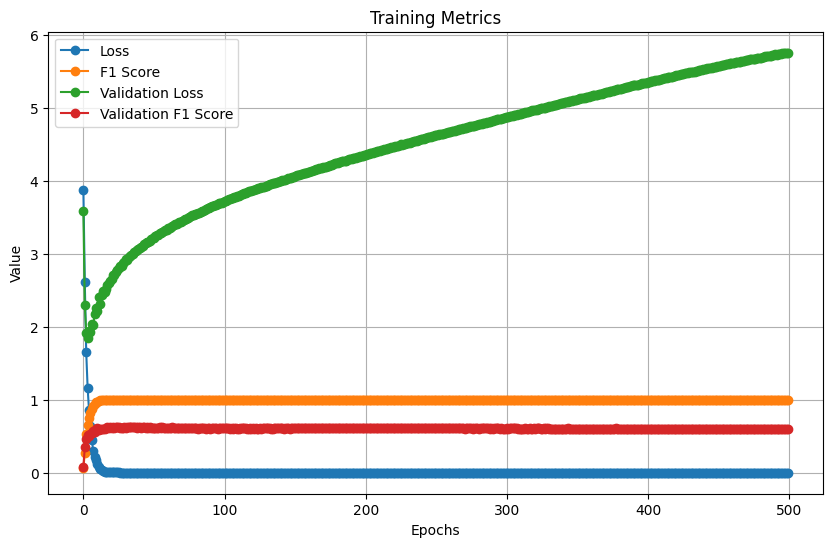

In [152]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [131]:
reconstructed_model = tf.keras.models.load_model("1 1DCNN Lecunnormal")

In [132]:
reconstructed_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 121, 100)          126100    
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 12, 100)          0         
 1D)                                                             
                                                                 
 flatten_6 (Flatten)         (None, 1200)              0         
                                                                 
 dense_12 (Dense)            (None, 70)                84070     
                                                                 
 dense_13 (Dense)            (None, 50)                3550      
                                                                 
Total params: 213,720
Trainable params: 213,720
Non-trainable params: 0
________________________________________________

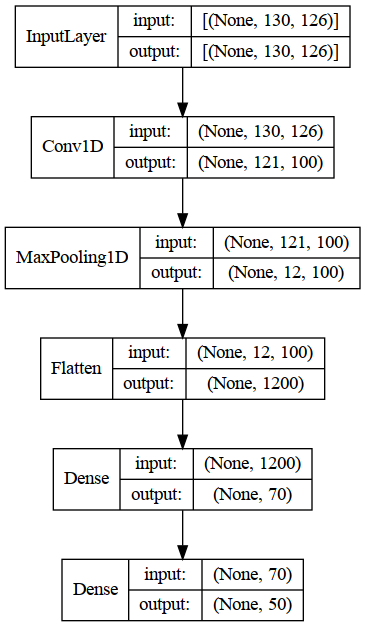

In [133]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [134]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 7ms/step - loss: 2.9630 - f1_score: 0.6279


[2.96299409866333, 0.6279101371765137]

In [135]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 5ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.375     0.545         8
    BACKPACK      0.833     0.833     0.833         6
  BASKETBALL      1.000     0.600     0.750        10
         BEE      0.857     0.600     0.706        10
        BELT      0.667     0.500     0.571         4
        BITE      0.727     1.000     0.842         8
   BREAKFAST      0.222     0.333     0.267         6
      CANCER      0.667     1.000     0.800         8
   CHRISTMAS      0.429     0.500     0.462         6
    CONFUSED      0.400     0.667     0.500         6
        DARK      0.667     1.000     0.800         4
        DEAF      0.444     0.667     0.533         6
      DECIDE      0.667     0.667     0.667         6
      DEMAND      0.571     0.500     0.533         8
     DEVELOP      0.400     0.333     0.364         6
      DINNER      0.600     0.375     0.462         8
         DOG      0.750     

## Hyperparameter Tuning 2 1D CNN Layers

In [119]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, GRU
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','gelu','elu','relu'],default='gelu')
        model = Sequential()
        model.add(Conv1D(filters=hp.Int('filters_1',min_value=50,max_value=200,step=25,default=150),
                         kernel_size=hp.Choice('kernel_1',values=[2,3,4,5,6,7,8,9,10],default=2,),
                         activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=hp.Choice('pool_1',values=[2,3,4,5,6,7,8,9,10],default=2,)))
        model.add(Conv1D(filters=hp.Int('filters_2',min_value=50,max_value=200,step=25,default=150),
                         kernel_size=hp.Choice('kernel_2',values=[1,2,3,4,5],default=2,),
                         activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=hp.Choice('pool_2',values=[1,2,3,4,5],default=2,)))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.0,max_value=0.9,default=0.75,step=0.05,)))
        model.add(Flatten())        
        model.add(Dense(units=hp.Int('units_2',min_value=70,max_value=120,step=10,default=90),activation=act_function))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.0,max_value=0.9,default=0.5,step=0.05,)))        
        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=0.001201687537647584)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

/tmp/ipykernel_1972693/1773258914.py:5: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [120]:
HYPERBAND_MAX_EPOCHS = 300
#MAX_TRIALS = 20
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/',
    project_name='2_1D_CNN',
    overwrite=False)

INFO:tensorflow:Reloading Tuner from /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/2_1D_CNN/tuner0.json


In [121]:
tuner.search_space_summary()

Search space summary
Default search space size: 11
dense_activation (Choice)
{'default': 'gelu', 'conditions': [], 'values': ['selu', 'mish', 'gelu', 'elu', 'relu'], 'ordered': False}
filters_1 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_1 (Choice)
{'default': 2, 'conditions': [], 'values': [2, 3, 4, 5, 6, 7, 8, 9, 10], 'ordered': True}
pool_1 (Choice)
{'default': 2, 'conditions': [], 'values': [2, 3, 4, 5, 6, 7, 8, 9, 10], 'ordered': True}
filters_2 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_2 (Choice)
{'default': 2, 'conditions': [], 'values': [1, 2, 3, 4, 5], 'ordered': True}
pool_2 (Choice)
{'default': 2, 'conditions': [], 'values': [1, 2, 3, 4, 5], 'ordered': True}
dropout_1 (Float)
{'default': 0.75, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_2 (Int)
{'default': 90, 'conditions': [], 

In [122]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [123]:
tuner.search(Xtrain, Ytrain, epochs=1000, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 08m 57s]
val_f1_score: 0.29330621659755707

Best val_f1_score So Far: 0.6954436302185059
Total elapsed time: 04h 28m 50s
INFO:tensorflow:Oracle triggered exit


In [124]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/2_1D_CNN
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0714 summary
Hyperparameters:
dense_activation: mish
filters_1: 125
kernel_1: 4
pool_1: 8
filters_2: 50
kernel_2: 4
pool_2: 4
dropout_1: 0.4
units_2: 110
dropout_2: 0.4
learning_rate: 0.0001715739875569636
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0713
Score: 0.6954436302185059

Trial 0723 summary
Hyperparameters:
dense_activation: elu
filters_1: 125
kernel_1: 10
pool_1: 5
filters_2: 200
kernel_2: 4
pool_2: 5
dropout_1: 0.65
units_2: 100
dropout_2: 0.15000000000000002
learning_rate: 0.00014141135967555134
tuner/epochs: 300
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0
Score: 0.6725153923034668

Trial 0598 summary
Hyperparameters:
dense_activation: elu
filters_1: 125
kernel_1: 2
pool_1: 7
filters_2: 175
kernel_2: 1
pool_2: 3
dropout_1: 0.1
units_2: 110
dropout_2: 0.7

In [125]:
best_model = tuner.get_best_models(num_models=1)[0]

In [126]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 127, 125)          199625    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 15, 125)          0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 12, 50)            25050     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 3, 50)            0         
 1D)                                                             
                                                                 
 dropout (Dropout)           (None, 3, 50)             0         
                                                                 
 flatten (Flatten)           (None, 150)               0

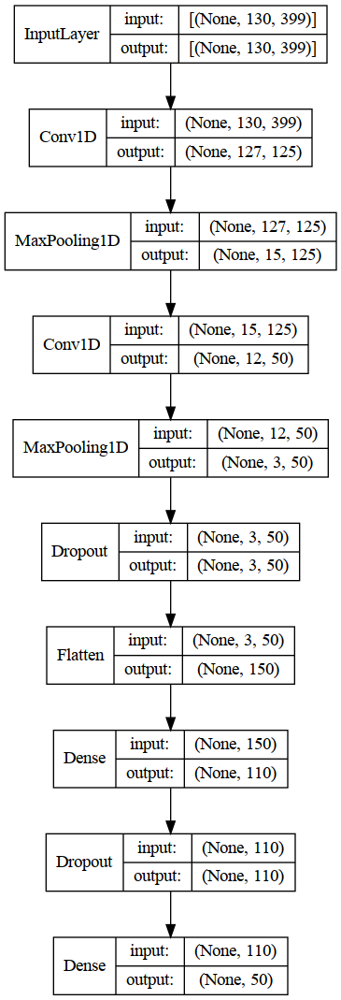

In [127]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

In [128]:
loss, accuracy = best_model.evaluate(Xval, Yval)

11/11 [==============================] - 0s 12ms/step - loss: 1.2194 - f1_score: 0.6954


In [129]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 1s 10ms/step - loss: 0.4310 - f1_score: 0.9274


In [130]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(best_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 7ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.600     1.000     0.750         6
  BASKETBALL      0.714     1.000     0.833        10
         BEE      0.778     0.700     0.737        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     0.750     0.857         8
   BREAKFAST      0.429     0.500     0.462         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.667     1.000     0.800         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.667     0.333     0.444         6
      DECIDE      1.000     0.333     0.500         6
      DEMAND      1.000     0.375     0.545         8
     DEVELOP      0.400     0.667     0.500         6
      DINNER      1.000     1.000     1.000         8
         DOG      0.500     

In [131]:
bestHP = tuner.get_best_hyperparameters(num_trials=10)[0]

In [132]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 1DCNN/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [133]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
27/28 [===========================>..] - ETA: 0s - loss: 3.9331 - f1_score: 0.0204

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 11s 302ms/step - loss: 3.9326 - f1_score: 0.0210 - val_loss: 3.9142 - val_f1_score: 0.0029
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.9137 - f1_score: 0.0206

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 4s 162ms/step - loss: 3.9145 - f1_score: 0.0201 - val_loss: 3.9076 - val_f1_score: 0.0140
Epoch 3/500
28/28 [==============================] - 1s 45ms/step - loss: 3.9045 - f1_score: 0.0201 - val_loss: 3.8981 - val_f1_score: 0.0068
Epoch 4/500
28/28 [==============================] - 1s 46ms/step - loss: 3.8907 - f1_score: 0.0272 - val_loss: 3.8866 - val_f1_score: 0.0088
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 3.8821 - f1_score: 0.0282

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 167ms/step - loss: 3.8805 - f1_score: 0.0289 - val_loss: 3.8671 - val_f1_score: 0.0228
Epoch 6/500
28/28 [==============================] - 1s 46ms/step - loss: 3.8669 - f1_score: 0.0344 - val_loss: 3.8372 - val_f1_score: 0.0100
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 3.8382 - f1_score: 0.0295

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 178ms/step - loss: 3.8364 - f1_score: 0.0306 - val_loss: 3.8101 - val_f1_score: 0.0499
Epoch 8/500
28/28 [==============================] - 1s 46ms/step - loss: 3.8048 - f1_score: 0.0423 - val_loss: 3.7506 - val_f1_score: 0.0305
Epoch 9/500
28/28 [==============================] - 1s 44ms/step - loss: 3.7505 - f1_score: 0.0492 - val_loss: 3.7056 - val_f1_score: 0.0306
Epoch 10/500
28/28 [==============================] - 1s 45ms/step - loss: 3.6909 - f1_score: 0.0538 - val_loss: 3.6396 - val_f1_score: 0.0399
Epoch 11/500
28/28 [==============================] - 1s 46ms/step - loss: 3.6382 - f1_score: 0.0545 - val_loss: 3.5588 - val_f1_score: 0.0350
Epoch 12/500
28/28 [==============================] - 1s 46ms/step - loss: 3.5534 - f1_score: 0.0633 - val_loss: 3.4986 - val_f1_score: 0.0398
Epoch 13/500
28/28 [==============================] - 1s 45ms/step - loss: 3.5160 - f1_score: 0.0719 - val_loss: 3.4332 - val_f1_score: 0.0499
Epoch 14/500


INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 175ms/step - loss: 3.4579 - f1_score: 0.0784 - val_loss: 3.3752 - val_f1_score: 0.0794
Epoch 15/500
28/28 [==============================] - 1s 46ms/step - loss: 3.4014 - f1_score: 0.0829 - val_loss: 3.3223 - val_f1_score: 0.0660
Epoch 16/500
28/28 [==============================] - 1s 46ms/step - loss: 3.3562 - f1_score: 0.0850 - val_loss: 3.2335 - val_f1_score: 0.0669
Epoch 17/500
28/28 [==============================] - 1s 46ms/step - loss: 3.2840 - f1_score: 0.0975 - val_loss: 3.1733 - val_f1_score: 0.0794
Epoch 18/500
27/28 [===========================>..] - ETA: 0s - loss: 3.2428 - f1_score: 0.1068

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 22s 809ms/step - loss: 3.2420 - f1_score: 0.1075 - val_loss: 3.1164 - val_f1_score: 0.0840
Epoch 19/500
27/28 [===========================>..] - ETA: 0s - loss: 3.2376 - f1_score: 0.1050

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 201ms/step - loss: 3.2391 - f1_score: 0.1041 - val_loss: 3.0912 - val_f1_score: 0.0872
Epoch 20/500
27/28 [===========================>..] - ETA: 0s - loss: 3.1503 - f1_score: 0.1133

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 181ms/step - loss: 3.1527 - f1_score: 0.1127 - val_loss: 3.0357 - val_f1_score: 0.1073
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 3.1103 - f1_score: 0.1202

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 4s 163ms/step - loss: 3.1086 - f1_score: 0.1218 - val_loss: 3.0080 - val_f1_score: 0.1073
Epoch 22/500
27/28 [===========================>..] - ETA: 0s - loss: 3.0712 - f1_score: 0.1203

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 178ms/step - loss: 3.0678 - f1_score: 0.1210 - val_loss: 2.9333 - val_f1_score: 0.1151
Epoch 23/500
28/28 [==============================] - 1s 44ms/step - loss: 3.0357 - f1_score: 0.1422 - val_loss: 2.8918 - val_f1_score: 0.1048
Epoch 24/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9842 - f1_score: 0.1481

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 179ms/step - loss: 2.9802 - f1_score: 0.1505 - val_loss: 2.8409 - val_f1_score: 0.1535
Epoch 25/500
28/28 [==============================] - 1s 45ms/step - loss: 2.9453 - f1_score: 0.1607 - val_loss: 2.8045 - val_f1_score: 0.1502
Epoch 26/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9376 - f1_score: 0.1558

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 182ms/step - loss: 2.9256 - f1_score: 0.1578 - val_loss: 2.7755 - val_f1_score: 0.1624
Epoch 27/500
28/28 [==============================] - 1s 48ms/step - loss: 2.9102 - f1_score: 0.1623 - val_loss: 2.7482 - val_f1_score: 0.1503
Epoch 28/500
28/28 [==============================] - 1s 44ms/step - loss: 2.8655 - f1_score: 0.1687 - val_loss: 2.7177 - val_f1_score: 0.1536
Epoch 29/500
27/28 [===========================>..] - ETA: 0s - loss: 2.8339 - f1_score: 0.1745

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 172ms/step - loss: 2.8292 - f1_score: 0.1755 - val_loss: 2.7105 - val_f1_score: 0.1627
Epoch 30/500
27/28 [===========================>..] - ETA: 0s - loss: 2.7982 - f1_score: 0.1799

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 225ms/step - loss: 2.7955 - f1_score: 0.1784 - val_loss: 2.6936 - val_f1_score: 0.2003
Epoch 31/500
28/28 [==============================] - 1s 45ms/step - loss: 2.7842 - f1_score: 0.1933 - val_loss: 2.6642 - val_f1_score: 0.1794
Epoch 32/500
28/28 [==============================] - 1s 45ms/step - loss: 2.7561 - f1_score: 0.1837 - val_loss: 2.6130 - val_f1_score: 0.1636
Epoch 33/500
28/28 [==============================] - 1s 44ms/step - loss: 2.7006 - f1_score: 0.2045 - val_loss: 2.5833 - val_f1_score: 0.1939
Epoch 34/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6921 - f1_score: 0.1993

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 184ms/step - loss: 2.6876 - f1_score: 0.2004 - val_loss: 2.5776 - val_f1_score: 0.2097
Epoch 35/500
28/28 [==============================] - 1s 44ms/step - loss: 2.6577 - f1_score: 0.2131 - val_loss: 2.5411 - val_f1_score: 0.1997
Epoch 36/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6518 - f1_score: 0.2136

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 4s 162ms/step - loss: 2.6463 - f1_score: 0.2162 - val_loss: 2.5100 - val_f1_score: 0.2210
Epoch 37/500
28/28 [==============================] - 1s 44ms/step - loss: 2.6313 - f1_score: 0.2132 - val_loss: 2.5110 - val_f1_score: 0.1997
Epoch 38/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5711 - f1_score: 0.2404

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 200ms/step - loss: 2.5677 - f1_score: 0.2416 - val_loss: 2.4710 - val_f1_score: 0.2409
Epoch 39/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5625 - f1_score: 0.2279

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 4s 164ms/step - loss: 2.5635 - f1_score: 0.2269 - val_loss: 2.4418 - val_f1_score: 0.2481
Epoch 40/500
28/28 [==============================] - 1s 45ms/step - loss: 2.5489 - f1_score: 0.2400 - val_loss: 2.4574 - val_f1_score: 0.2275
Epoch 41/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4993 - f1_score: 0.2551

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 175ms/step - loss: 2.5030 - f1_score: 0.2562 - val_loss: 2.4428 - val_f1_score: 0.2564
Epoch 42/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5246 - f1_score: 0.2495

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 171ms/step - loss: 2.5228 - f1_score: 0.2500 - val_loss: 2.4188 - val_f1_score: 0.2593
Epoch 43/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4860 - f1_score: 0.2485

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 165ms/step - loss: 2.4933 - f1_score: 0.2490 - val_loss: 2.3660 - val_f1_score: 0.2797
Epoch 44/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4674 - f1_score: 0.2626

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 167ms/step - loss: 2.4713 - f1_score: 0.2618 - val_loss: 2.3660 - val_f1_score: 0.2811
Epoch 45/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4265 - f1_score: 0.2657

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 4s 161ms/step - loss: 2.4268 - f1_score: 0.2665 - val_loss: 2.3388 - val_f1_score: 0.3185
Epoch 46/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4138 - f1_score: 0.2781

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 165ms/step - loss: 2.4152 - f1_score: 0.2784 - val_loss: 2.3243 - val_f1_score: 0.3332
Epoch 47/500
28/28 [==============================] - 1s 47ms/step - loss: 2.3978 - f1_score: 0.2775 - val_loss: 2.2867 - val_f1_score: 0.3300
Epoch 48/500
28/28 [==============================] - 1s 45ms/step - loss: 2.3663 - f1_score: 0.2808 - val_loss: 2.2935 - val_f1_score: 0.3047
Epoch 49/500
28/28 [==============================] - 1s 45ms/step - loss: 2.3485 - f1_score: 0.2881 - val_loss: 2.2704 - val_f1_score: 0.3171
Epoch 50/500
27/28 [===========================>..] - ETA: 0s - loss: 2.3455 - f1_score: 0.2894

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 167ms/step - loss: 2.3418 - f1_score: 0.2906 - val_loss: 2.2340 - val_f1_score: 0.3434
Epoch 51/500
27/28 [===========================>..] - ETA: 0s - loss: 2.3286 - f1_score: 0.2943

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 178ms/step - loss: 2.3309 - f1_score: 0.2969 - val_loss: 2.2265 - val_f1_score: 0.3752
Epoch 52/500
28/28 [==============================] - 1s 46ms/step - loss: 2.3012 - f1_score: 0.2940 - val_loss: 2.2232 - val_f1_score: 0.3510
Epoch 53/500
28/28 [==============================] - 1s 46ms/step - loss: 2.2773 - f1_score: 0.3177 - val_loss: 2.2581 - val_f1_score: 0.3476
Epoch 54/500
28/28 [==============================] - 1s 45ms/step - loss: 2.3175 - f1_score: 0.2964 - val_loss: 2.2201 - val_f1_score: 0.3573
Epoch 55/500
28/28 [==============================] - ETA: 0s - loss: 2.2451 - f1_score: 0.3233

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 206ms/step - loss: 2.2451 - f1_score: 0.3233 - val_loss: 2.1746 - val_f1_score: 0.3775
Epoch 56/500
28/28 [==============================] - 1s 47ms/step - loss: 2.2432 - f1_score: 0.3221 - val_loss: 2.1679 - val_f1_score: 0.3559
Epoch 57/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2324 - f1_score: 0.3184

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 177ms/step - loss: 2.2329 - f1_score: 0.3186 - val_loss: 2.1710 - val_f1_score: 0.3870
Epoch 58/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2185 - f1_score: 0.3096

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 167ms/step - loss: 2.2267 - f1_score: 0.3089 - val_loss: 2.1299 - val_f1_score: 0.4010
Epoch 59/500
28/28 [==============================] - 1s 45ms/step - loss: 2.1543 - f1_score: 0.3399 - val_loss: 2.1383 - val_f1_score: 0.3874
Epoch 60/500
28/28 [==============================] - 1s 48ms/step - loss: 2.1458 - f1_score: 0.3457 - val_loss: 2.1133 - val_f1_score: 0.3943
Epoch 61/500
28/28 [==============================] - 1s 45ms/step - loss: 2.1481 - f1_score: 0.3448 - val_loss: 2.0948 - val_f1_score: 0.3974
Epoch 62/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1517 - f1_score: 0.3292

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 165ms/step - loss: 2.1478 - f1_score: 0.3296 - val_loss: 2.1018 - val_f1_score: 0.4156
Epoch 63/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1083 - f1_score: 0.3564

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 171ms/step - loss: 2.1071 - f1_score: 0.3559 - val_loss: 2.0692 - val_f1_score: 0.4182
Epoch 64/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0851 - f1_score: 0.3560

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 176ms/step - loss: 2.0933 - f1_score: 0.3569 - val_loss: 2.0766 - val_f1_score: 0.4236
Epoch 65/500
28/28 [==============================] - 1s 48ms/step - loss: 2.1016 - f1_score: 0.3470 - val_loss: 2.0245 - val_f1_score: 0.4095
Epoch 66/500
28/28 [==============================] - 1s 46ms/step - loss: 2.0614 - f1_score: 0.3653 - val_loss: 2.0776 - val_f1_score: 0.4094
Epoch 67/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0454 - f1_score: 0.3626

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 179ms/step - loss: 2.0415 - f1_score: 0.3622 - val_loss: 2.0006 - val_f1_score: 0.4444
Epoch 68/500
28/28 [==============================] - 1s 45ms/step - loss: 2.0140 - f1_score: 0.3777 - val_loss: 2.0312 - val_f1_score: 0.4268
Epoch 69/500
28/28 [==============================] - 1s 44ms/step - loss: 2.0357 - f1_score: 0.3658 - val_loss: 2.0374 - val_f1_score: 0.4273
Epoch 70/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0103 - f1_score: 0.3896

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 172ms/step - loss: 2.0120 - f1_score: 0.3884 - val_loss: 1.9676 - val_f1_score: 0.4524
Epoch 71/500
28/28 [==============================] - 1s 44ms/step - loss: 1.9998 - f1_score: 0.3867 - val_loss: 1.9898 - val_f1_score: 0.3993
Epoch 72/500
28/28 [==============================] - 1s 45ms/step - loss: 1.9523 - f1_score: 0.3983 - val_loss: 1.9571 - val_f1_score: 0.4477
Epoch 73/500
28/28 [==============================] - 1s 44ms/step - loss: 1.9377 - f1_score: 0.3898 - val_loss: 1.9618 - val_f1_score: 0.4420
Epoch 74/500
28/28 [==============================] - 1s 45ms/step - loss: 1.9292 - f1_score: 0.4043 - val_loss: 1.9510 - val_f1_score: 0.4218
Epoch 75/500
28/28 [==============================] - 1s 44ms/step - loss: 1.9247 - f1_score: 0.3918 - val_loss: 1.9290 - val_f1_score: 0.4486
Epoch 76/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9093 - f1_score: 0.4077

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 193ms/step - loss: 1.9138 - f1_score: 0.4040 - val_loss: 1.9013 - val_f1_score: 0.4773
Epoch 77/500
28/28 [==============================] - 1s 45ms/step - loss: 1.8799 - f1_score: 0.4279 - val_loss: 1.8983 - val_f1_score: 0.4671
Epoch 78/500
28/28 [==============================] - 1s 44ms/step - loss: 1.8841 - f1_score: 0.3993 - val_loss: 1.8850 - val_f1_score: 0.4740
Epoch 79/500
28/28 [==============================] - 1s 47ms/step - loss: 1.8602 - f1_score: 0.4283 - val_loss: 1.8584 - val_f1_score: 0.4772
Epoch 80/500
28/28 [==============================] - 1s 47ms/step - loss: 1.8407 - f1_score: 0.4297 - val_loss: 1.8714 - val_f1_score: 0.4660
Epoch 81/500
28/28 [==============================] - 1s 45ms/step - loss: 1.8690 - f1_score: 0.4234 - val_loss: 1.8752 - val_f1_score: 0.4577
Epoch 82/500
28/28 [==============================] - 1s 44ms/step - loss: 1.8195 - f1_score: 0.4346 - val_loss: 1.8673 - val_f1_score: 0.4759
Epoch 83/50

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 175ms/step - loss: 1.8029 - f1_score: 0.4317 - val_loss: 1.8490 - val_f1_score: 0.4940
Epoch 84/500
28/28 [==============================] - 1s 45ms/step - loss: 1.7869 - f1_score: 0.4441 - val_loss: 1.8839 - val_f1_score: 0.4759
Epoch 85/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7770 - f1_score: 0.4469

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 191ms/step - loss: 1.7746 - f1_score: 0.4485 - val_loss: 1.8123 - val_f1_score: 0.5073
Epoch 86/500
28/28 [==============================] - 1s 44ms/step - loss: 1.7544 - f1_score: 0.4656 - val_loss: 1.8509 - val_f1_score: 0.4947
Epoch 87/500
28/28 [==============================] - 1s 45ms/step - loss: 1.7780 - f1_score: 0.4519 - val_loss: 1.7947 - val_f1_score: 0.5049
Epoch 88/500
28/28 [==============================] - 1s 47ms/step - loss: 1.7474 - f1_score: 0.4492 - val_loss: 1.8078 - val_f1_score: 0.4747
Epoch 89/500
28/28 [==============================] - ETA: 0s - loss: 1.6945 - f1_score: 0.4748

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 173ms/step - loss: 1.6945 - f1_score: 0.4748 - val_loss: 1.7961 - val_f1_score: 0.5170
Epoch 90/500
28/28 [==============================] - 1s 47ms/step - loss: 1.7009 - f1_score: 0.4676 - val_loss: 1.7651 - val_f1_score: 0.5010
Epoch 91/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6778 - f1_score: 0.4831

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 199ms/step - loss: 1.6855 - f1_score: 0.4813 - val_loss: 1.7460 - val_f1_score: 0.5320
Epoch 92/500
28/28 [==============================] - 1s 47ms/step - loss: 1.6774 - f1_score: 0.4729 - val_loss: 1.7449 - val_f1_score: 0.5108
Epoch 93/500
28/28 [==============================] - 1s 45ms/step - loss: 1.6522 - f1_score: 0.4681 - val_loss: 1.7912 - val_f1_score: 0.5249
Epoch 94/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6821 - f1_score: 0.4770

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 170ms/step - loss: 1.6731 - f1_score: 0.4808 - val_loss: 1.7403 - val_f1_score: 0.5348
Epoch 95/500
28/28 [==============================] - 1s 45ms/step - loss: 1.6885 - f1_score: 0.4757 - val_loss: 1.7661 - val_f1_score: 0.5141
Epoch 96/500
28/28 [==============================] - 1s 45ms/step - loss: 1.6434 - f1_score: 0.4954 - val_loss: 1.7003 - val_f1_score: 0.5235
Epoch 97/500
28/28 [==============================] - 1s 46ms/step - loss: 1.6380 - f1_score: 0.4801 - val_loss: 1.7193 - val_f1_score: 0.5226
Epoch 98/500
28/28 [==============================] - 1s 46ms/step - loss: 1.6299 - f1_score: 0.4919 - val_loss: 1.7177 - val_f1_score: 0.5158
Epoch 99/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6071 - f1_score: 0.4850

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 166ms/step - loss: 1.6044 - f1_score: 0.4845 - val_loss: 1.6872 - val_f1_score: 0.5394
Epoch 100/500
28/28 [==============================] - 1s 45ms/step - loss: 1.5824 - f1_score: 0.4984 - val_loss: 1.7067 - val_f1_score: 0.5153
Epoch 101/500
28/28 [==============================] - 1s 44ms/step - loss: 1.5957 - f1_score: 0.4992 - val_loss: 1.6804 - val_f1_score: 0.5304
Epoch 102/500
28/28 [==============================] - 1s 45ms/step - loss: 1.5602 - f1_score: 0.5176 - val_loss: 1.7618 - val_f1_score: 0.5124
Epoch 103/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5654 - f1_score: 0.5127

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 193ms/step - loss: 1.5688 - f1_score: 0.5126 - val_loss: 1.6514 - val_f1_score: 0.5556
Epoch 104/500
28/28 [==============================] - 1s 48ms/step - loss: 1.5671 - f1_score: 0.5097 - val_loss: 1.6395 - val_f1_score: 0.5496
Epoch 105/500
28/28 [==============================] - 1s 46ms/step - loss: 1.5270 - f1_score: 0.5255 - val_loss: 1.6458 - val_f1_score: 0.5499
Epoch 106/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5368 - f1_score: 0.5226

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 199ms/step - loss: 1.5377 - f1_score: 0.5219 - val_loss: 1.6189 - val_f1_score: 0.5571
Epoch 107/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5103 - f1_score: 0.5200

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 186ms/step - loss: 1.5201 - f1_score: 0.5166 - val_loss: 1.6079 - val_f1_score: 0.5602
Epoch 108/500
28/28 [==============================] - 1s 45ms/step - loss: 1.5088 - f1_score: 0.5228 - val_loss: 1.6115 - val_f1_score: 0.5385
Epoch 109/500
28/28 [==============================] - 1s 45ms/step - loss: 1.5319 - f1_score: 0.5202 - val_loss: 1.6316 - val_f1_score: 0.5566
Epoch 110/500
28/28 [==============================] - 1s 45ms/step - loss: 1.4945 - f1_score: 0.5358 - val_loss: 1.6357 - val_f1_score: 0.5497
Epoch 111/500
28/28 [==============================] - 1s 46ms/step - loss: 1.4693 - f1_score: 0.5468 - val_loss: 1.6023 - val_f1_score: 0.5447
Epoch 112/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4563 - f1_score: 0.5463

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 172ms/step - loss: 1.4571 - f1_score: 0.5466 - val_loss: 1.6056 - val_f1_score: 0.5651
Epoch 113/500
28/28 [==============================] - 1s 45ms/step - loss: 1.4808 - f1_score: 0.5370 - val_loss: 1.6319 - val_f1_score: 0.5399
Epoch 114/500
28/28 [==============================] - 1s 46ms/step - loss: 1.4551 - f1_score: 0.5493 - val_loss: 1.5859 - val_f1_score: 0.5601
Epoch 115/500
28/28 [==============================] - 1s 45ms/step - loss: 1.4381 - f1_score: 0.5529 - val_loss: 1.5793 - val_f1_score: 0.5483
Epoch 116/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4447 - f1_score: 0.5422

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 184ms/step - loss: 1.4384 - f1_score: 0.5450 - val_loss: 1.5524 - val_f1_score: 0.5740
Epoch 117/500
28/28 [==============================] - 1s 44ms/step - loss: 1.4455 - f1_score: 0.5515 - val_loss: 1.5805 - val_f1_score: 0.5674
Epoch 118/500
28/28 [==============================] - 1s 45ms/step - loss: 1.4208 - f1_score: 0.5307 - val_loss: 1.5733 - val_f1_score: 0.5466
Epoch 119/500
28/28 [==============================] - 2s 56ms/step - loss: 1.3956 - f1_score: 0.5619 - val_loss: 1.5687 - val_f1_score: 0.5637
Epoch 120/500
28/28 [==============================] - 1s 46ms/step - loss: 1.4132 - f1_score: 0.5545 - val_loss: 1.5433 - val_f1_score: 0.5523
Epoch 121/500
28/28 [==============================] - 1s 46ms/step - loss: 1.3788 - f1_score: 0.5649 - val_loss: 1.6024 - val_f1_score: 0.5629
Epoch 122/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3741 - f1_score: 0.5724

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 169ms/step - loss: 1.3802 - f1_score: 0.5704 - val_loss: 1.5101 - val_f1_score: 0.5790
Epoch 123/500
28/28 [==============================] - 1s 44ms/step - loss: 1.3687 - f1_score: 0.5571 - val_loss: 1.6195 - val_f1_score: 0.5559
Epoch 124/500
28/28 [==============================] - 1s 44ms/step - loss: 1.3880 - f1_score: 0.5633 - val_loss: 1.5206 - val_f1_score: 0.5561
Epoch 125/500
28/28 [==============================] - 1s 45ms/step - loss: 1.3739 - f1_score: 0.5779 - val_loss: 1.5029 - val_f1_score: 0.5693
Epoch 126/500
28/28 [==============================] - 1s 46ms/step - loss: 1.3270 - f1_score: 0.5822 - val_loss: 1.5013 - val_f1_score: 0.5673
Epoch 127/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3521 - f1_score: 0.5741

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 178ms/step - loss: 1.3536 - f1_score: 0.5733 - val_loss: 1.5193 - val_f1_score: 0.5810
Epoch 128/500
28/28 [==============================] - 1s 45ms/step - loss: 1.3253 - f1_score: 0.5890 - val_loss: 1.5897 - val_f1_score: 0.5528
Epoch 129/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3359 - f1_score: 0.5778

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 7s 254ms/step - loss: 1.3325 - f1_score: 0.5793 - val_loss: 1.4923 - val_f1_score: 0.5817
Epoch 130/500
28/28 [==============================] - 1s 45ms/step - loss: 1.2997 - f1_score: 0.5880 - val_loss: 1.4927 - val_f1_score: 0.5773
Epoch 131/500
28/28 [==============================] - 1s 49ms/step - loss: 1.3109 - f1_score: 0.5960 - val_loss: 1.4689 - val_f1_score: 0.5698
Epoch 132/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2932 - f1_score: 0.5911

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 194ms/step - loss: 1.2932 - f1_score: 0.5916 - val_loss: 1.4896 - val_f1_score: 0.5904
Epoch 133/500
28/28 [==============================] - 1s 45ms/step - loss: 1.2908 - f1_score: 0.5936 - val_loss: 1.5333 - val_f1_score: 0.5696
Epoch 134/500
28/28 [==============================] - 1s 48ms/step - loss: 1.2775 - f1_score: 0.6000 - val_loss: 1.4443 - val_f1_score: 0.5868
Epoch 135/500
28/28 [==============================] - 1s 50ms/step - loss: 1.2564 - f1_score: 0.6032 - val_loss: 1.4599 - val_f1_score: 0.5811
Epoch 136/500
28/28 [==============================] - 1s 51ms/step - loss: 1.2564 - f1_score: 0.6018 - val_loss: 1.4395 - val_f1_score: 0.5899
Epoch 137/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2410 - f1_score: 0.5922

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 194ms/step - loss: 1.2491 - f1_score: 0.5898 - val_loss: 1.4329 - val_f1_score: 0.5936
Epoch 138/500
28/28 [==============================] - 1s 46ms/step - loss: 1.2778 - f1_score: 0.5983 - val_loss: 1.4760 - val_f1_score: 0.5743
Epoch 139/500
28/28 [==============================] - ETA: 0s - loss: 1.2286 - f1_score: 0.6250

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 177ms/step - loss: 1.2286 - f1_score: 0.6250 - val_loss: 1.4539 - val_f1_score: 0.5974
Epoch 140/500
28/28 [==============================] - 1s 46ms/step - loss: 1.2531 - f1_score: 0.6020 - val_loss: 1.4904 - val_f1_score: 0.5753
Epoch 141/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2279 - f1_score: 0.6092

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 209ms/step - loss: 1.2262 - f1_score: 0.6092 - val_loss: 1.4459 - val_f1_score: 0.5996
Epoch 142/500
28/28 [==============================] - 1s 48ms/step - loss: 1.2270 - f1_score: 0.6099 - val_loss: 1.4123 - val_f1_score: 0.5984
Epoch 143/500
28/28 [==============================] - 1s 52ms/step - loss: 1.2187 - f1_score: 0.6202 - val_loss: 1.4501 - val_f1_score: 0.5889
Epoch 144/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2345 - f1_score: 0.6117

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 171ms/step - loss: 1.2340 - f1_score: 0.6109 - val_loss: 1.4055 - val_f1_score: 0.6071
Epoch 145/500
28/28 [==============================] - 1s 49ms/step - loss: 1.1912 - f1_score: 0.6291 - val_loss: 1.4115 - val_f1_score: 0.5959
Epoch 146/500
27/28 [===========================>..] - ETA: 0s - loss: 1.1923 - f1_score: 0.6233

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 176ms/step - loss: 1.1883 - f1_score: 0.6245 - val_loss: 1.4372 - val_f1_score: 0.6131
Epoch 147/500
28/28 [==============================] - 1s 50ms/step - loss: 1.1831 - f1_score: 0.6172 - val_loss: 1.4101 - val_f1_score: 0.6078
Epoch 148/500
28/28 [==============================] - 1s 54ms/step - loss: 1.2008 - f1_score: 0.6168 - val_loss: 1.3983 - val_f1_score: 0.5890
Epoch 149/500
28/28 [==============================] - 1s 52ms/step - loss: 1.2116 - f1_score: 0.6182 - val_loss: 1.4180 - val_f1_score: 0.5883
Epoch 150/500
28/28 [==============================] - ETA: 0s - loss: 1.1710 - f1_score: 0.6282

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 7s 244ms/step - loss: 1.1710 - f1_score: 0.6282 - val_loss: 1.3633 - val_f1_score: 0.6198
Epoch 151/500
28/28 [==============================] - 1s 48ms/step - loss: 1.1659 - f1_score: 0.6308 - val_loss: 1.3968 - val_f1_score: 0.5813
Epoch 152/500
28/28 [==============================] - ETA: 0s - loss: 1.1707 - f1_score: 0.6334

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 179ms/step - loss: 1.1707 - f1_score: 0.6334 - val_loss: 1.3775 - val_f1_score: 0.6221
Epoch 153/500
28/28 [==============================] - 2s 54ms/step - loss: 1.1290 - f1_score: 0.6448 - val_loss: 1.4049 - val_f1_score: 0.6092
Epoch 154/500
28/28 [==============================] - 1s 51ms/step - loss: 1.1244 - f1_score: 0.6410 - val_loss: 1.3749 - val_f1_score: 0.6187
Epoch 155/500
28/28 [==============================] - 1s 47ms/step - loss: 1.1307 - f1_score: 0.6540 - val_loss: 1.3661 - val_f1_score: 0.5976
Epoch 156/500
28/28 [==============================] - 1s 45ms/step - loss: 1.1322 - f1_score: 0.6433 - val_loss: 1.3650 - val_f1_score: 0.5956
Epoch 157/500
28/28 [==============================] - 1s 49ms/step - loss: 1.0958 - f1_score: 0.6542 - val_loss: 1.3584 - val_f1_score: 0.5977
Epoch 158/500
27/28 [===========================>..] - ETA: 0s - loss: 1.1328 - f1_score: 0.6360

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 182ms/step - loss: 1.1289 - f1_score: 0.6369 - val_loss: 1.3620 - val_f1_score: 0.6227
Epoch 159/500
28/28 [==============================] - 1s 45ms/step - loss: 1.0915 - f1_score: 0.6588 - val_loss: 1.3734 - val_f1_score: 0.5865
Epoch 160/500
28/28 [==============================] - 1s 47ms/step - loss: 1.0870 - f1_score: 0.6632 - val_loss: 1.3615 - val_f1_score: 0.6183
Epoch 161/500
28/28 [==============================] - 1s 49ms/step - loss: 1.0984 - f1_score: 0.6542 - val_loss: 1.3337 - val_f1_score: 0.6009
Epoch 162/500
28/28 [==============================] - 1s 52ms/step - loss: 1.0977 - f1_score: 0.6571 - val_loss: 1.3436 - val_f1_score: 0.5964
Epoch 163/500
28/28 [==============================] - ETA: 0s - loss: 1.0946 - f1_score: 0.6554

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 182ms/step - loss: 1.0946 - f1_score: 0.6554 - val_loss: 1.3068 - val_f1_score: 0.6246
Epoch 164/500
28/28 [==============================] - 1s 46ms/step - loss: 1.0703 - f1_score: 0.6628 - val_loss: 1.3558 - val_f1_score: 0.5911
Epoch 165/500
28/28 [==============================] - 1s 46ms/step - loss: 1.0684 - f1_score: 0.6629 - val_loss: 1.3398 - val_f1_score: 0.6145
Epoch 166/500
28/28 [==============================] - 1s 46ms/step - loss: 1.0642 - f1_score: 0.6615 - val_loss: 1.3090 - val_f1_score: 0.5990
Epoch 167/500
28/28 [==============================] - 1s 47ms/step - loss: 1.0754 - f1_score: 0.6681 - val_loss: 1.3148 - val_f1_score: 0.6046
Epoch 168/500
28/28 [==============================] - 1s 46ms/step - loss: 1.0440 - f1_score: 0.6677 - val_loss: 1.3476 - val_f1_score: 0.5860
Epoch 169/500
28/28 [==============================] - 1s 45ms/step - loss: 1.0475 - f1_score: 0.6636 - val_loss: 1.3652 - val_f1_score: 0.5940
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 177ms/step - loss: 1.0391 - f1_score: 0.6649 - val_loss: 1.3021 - val_f1_score: 0.6537
Epoch 172/500
28/28 [==============================] - 1s 45ms/step - loss: 1.0113 - f1_score: 0.6773 - val_loss: 1.3306 - val_f1_score: 0.5969
Epoch 173/500
28/28 [==============================] - 1s 46ms/step - loss: 1.0297 - f1_score: 0.6756 - val_loss: 1.3444 - val_f1_score: 0.6240
Epoch 174/500
28/28 [==============================] - 1s 48ms/step - loss: 1.0167 - f1_score: 0.6743 - val_loss: 1.3316 - val_f1_score: 0.6217
Epoch 175/500
28/28 [==============================] - 1s 48ms/step - loss: 1.0045 - f1_score: 0.6917 - val_loss: 1.3236 - val_f1_score: 0.6047
Epoch 176/500
28/28 [==============================] - 1s 47ms/step - loss: 1.0071 - f1_score: 0.6813 - val_loss: 1.2910 - val_f1_score: 0.6291
Epoch 177/500
28/28 [==============================] - 1s 48ms/step - loss: 0.9945 - f1_score: 0.6831 - val_loss: 1.3011 - val_f1_score: 0.6351
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 184ms/step - loss: 0.8764 - f1_score: 0.7272 - val_loss: 1.2282 - val_f1_score: 0.6622
Epoch 204/500
28/28 [==============================] - 1s 48ms/step - loss: 0.8659 - f1_score: 0.7200 - val_loss: 1.2380 - val_f1_score: 0.6177
Epoch 205/500
28/28 [==============================] - 1s 47ms/step - loss: 0.8731 - f1_score: 0.7234 - val_loss: 1.2122 - val_f1_score: 0.6274
Epoch 206/500
28/28 [==============================] - 1s 48ms/step - loss: 0.8704 - f1_score: 0.7221 - val_loss: 1.2979 - val_f1_score: 0.6167
Epoch 207/500
28/28 [==============================] - 2s 56ms/step - loss: 0.8588 - f1_score: 0.7286 - val_loss: 1.1954 - val_f1_score: 0.6334
Epoch 208/500
28/28 [==============================] - 1s 51ms/step - loss: 0.8285 - f1_score: 0.7390 - val_loss: 1.2097 - val_f1_score: 0.6344
Epoch 209/500
28/28 [==============================] - 1s 47ms/step - loss: 0.8415 - f1_score: 0.7353 - val_loss: 1.2093 - val_f1_score: 0.6353
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 188ms/step - loss: 0.8218 - f1_score: 0.7455 - val_loss: 1.1902 - val_f1_score: 0.6759
Epoch 213/500
28/28 [==============================] - 1s 49ms/step - loss: 0.8362 - f1_score: 0.7254 - val_loss: 1.2831 - val_f1_score: 0.6595
Epoch 214/500
28/28 [==============================] - 1s 47ms/step - loss: 0.8254 - f1_score: 0.7406 - val_loss: 1.2202 - val_f1_score: 0.6391
Epoch 215/500
28/28 [==============================] - 2s 60ms/step - loss: 0.8417 - f1_score: 0.7347 - val_loss: 1.2009 - val_f1_score: 0.6314
Epoch 216/500
28/28 [==============================] - 1s 48ms/step - loss: 0.8422 - f1_score: 0.7344 - val_loss: 1.2100 - val_f1_score: 0.6498
Epoch 217/500
28/28 [==============================] - 1s 44ms/step - loss: 0.8044 - f1_score: 0.7500 - val_loss: 1.1989 - val_f1_score: 0.6375
Epoch 218/500
28/28 [==============================] - 1s 47ms/step - loss: 0.8150 - f1_score: 0.7476 - val_loss: 1.2014 - val_f1_score: 0.6323
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 216ms/step - loss: 0.7157 - f1_score: 0.7661 - val_loss: 1.1520 - val_f1_score: 0.6794
Epoch 246/500
28/28 [==============================] - 1s 47ms/step - loss: 0.7055 - f1_score: 0.7729 - val_loss: 1.1417 - val_f1_score: 0.6613
Epoch 247/500
28/28 [==============================] - 1s 47ms/step - loss: 0.7314 - f1_score: 0.7698 - val_loss: 1.2074 - val_f1_score: 0.6655
Epoch 248/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6854 - f1_score: 0.7884 - val_loss: 1.1678 - val_f1_score: 0.6480
Epoch 249/500
28/28 [==============================] - 2s 56ms/step - loss: 0.6967 - f1_score: 0.7854 - val_loss: 1.2115 - val_f1_score: 0.6419
Epoch 250/500
28/28 [==============================] - 1s 51ms/step - loss: 0.6755 - f1_score: 0.7895 - val_loss: 1.1609 - val_f1_score: 0.6613
Epoch 251/500
28/28 [==============================] - ETA: 0s - loss: 0.6863 - f1_score: 0.7868

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 221ms/step - loss: 0.6863 - f1_score: 0.7868 - val_loss: 1.1432 - val_f1_score: 0.6795
Epoch 252/500
28/28 [==============================] - 1s 45ms/step - loss: 0.6904 - f1_score: 0.7836 - val_loss: 1.2283 - val_f1_score: 0.6611
Epoch 253/500
28/28 [==============================] - 1s 45ms/step - loss: 0.7407 - f1_score: 0.7624 - val_loss: 1.1583 - val_f1_score: 0.6455
Epoch 254/500
28/28 [==============================] - 1s 45ms/step - loss: 0.6517 - f1_score: 0.8031 - val_loss: 1.1969 - val_f1_score: 0.6531
Epoch 255/500
28/28 [==============================] - 1s 46ms/step - loss: 0.6830 - f1_score: 0.7812 - val_loss: 1.1583 - val_f1_score: 0.6640
Epoch 256/500
28/28 [==============================] - 1s 47ms/step - loss: 0.6685 - f1_score: 0.7949 - val_loss: 1.1609 - val_f1_score: 0.6432
Epoch 257/500
28/28 [==============================] - 1s 47ms/step - loss: 0.6470 - f1_score: 0.7892 - val_loss: 1.1848 - val_f1_score: 0.6657
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 221ms/step - loss: 0.6618 - f1_score: 0.7930 - val_loss: 1.1688 - val_f1_score: 0.6810
Epoch 267/500
28/28 [==============================] - 2s 58ms/step - loss: 0.6330 - f1_score: 0.8116 - val_loss: 1.1837 - val_f1_score: 0.6563
Epoch 268/500
28/28 [==============================] - 2s 54ms/step - loss: 0.6127 - f1_score: 0.8093 - val_loss: 1.2212 - val_f1_score: 0.6554
Epoch 269/500
28/28 [==============================] - 2s 56ms/step - loss: 0.6339 - f1_score: 0.8030 - val_loss: 1.1565 - val_f1_score: 0.6662
Epoch 270/500
28/28 [==============================] - 2s 58ms/step - loss: 0.6172 - f1_score: 0.8071 - val_loss: 1.2112 - val_f1_score: 0.6488
Epoch 271/500
28/28 [==============================] - 1s 51ms/step - loss: 0.6250 - f1_score: 0.8034 - val_loss: 1.2029 - val_f1_score: 0.6639
Epoch 272/500
28/28 [==============================] - 1s 53ms/step - loss: 0.6266 - f1_score: 0.7982 - val_loss: 1.1879 - val_f1_score: 0.6669
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 7s 255ms/step - loss: 0.6027 - f1_score: 0.8093 - val_loss: 1.1813 - val_f1_score: 0.6813
Epoch 285/500
28/28 [==============================] - 1s 49ms/step - loss: 0.6158 - f1_score: 0.7944 - val_loss: 1.1559 - val_f1_score: 0.6744
Epoch 286/500
28/28 [==============================] - 1s 48ms/step - loss: 0.5862 - f1_score: 0.8141 - val_loss: 1.1613 - val_f1_score: 0.6702
Epoch 287/500
28/28 [==============================] - 1s 49ms/step - loss: 0.5677 - f1_score: 0.8248 - val_loss: 1.1851 - val_f1_score: 0.6526
Epoch 288/500
27/28 [===========================>..] - ETA: 0s - loss: 0.5892 - f1_score: 0.8053

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 184ms/step - loss: 0.5855 - f1_score: 0.8069 - val_loss: 1.1408 - val_f1_score: 0.6932
Epoch 289/500
28/28 [==============================] - 1s 48ms/step - loss: 0.5912 - f1_score: 0.8043 - val_loss: 1.2212 - val_f1_score: 0.6614
Epoch 290/500
28/28 [==============================] - 1s 47ms/step - loss: 0.5715 - f1_score: 0.8198 - val_loss: 1.1560 - val_f1_score: 0.6916
Epoch 291/500
27/28 [===========================>..] - ETA: 0s - loss: 0.5730 - f1_score: 0.8231

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 226ms/step - loss: 0.5711 - f1_score: 0.8249 - val_loss: 1.1286 - val_f1_score: 0.6939
Epoch 292/500
28/28 [==============================] - 1s 47ms/step - loss: 0.5635 - f1_score: 0.8258 - val_loss: 1.1542 - val_f1_score: 0.6693
Epoch 293/500
28/28 [==============================] - 1s 45ms/step - loss: 0.5575 - f1_score: 0.8215 - val_loss: 1.1824 - val_f1_score: 0.6721
Epoch 294/500
28/28 [==============================] - 1s 46ms/step - loss: 0.5632 - f1_score: 0.8244 - val_loss: 1.1604 - val_f1_score: 0.6746
Epoch 295/500
28/28 [==============================] - 1s 47ms/step - loss: 0.5750 - f1_score: 0.8136 - val_loss: 1.1466 - val_f1_score: 0.6831
Epoch 296/500
28/28 [==============================] - 1s 46ms/step - loss: 0.5471 - f1_score: 0.8274 - val_loss: 1.1254 - val_f1_score: 0.6744
Epoch 297/500
28/28 [==============================] - 1s 45ms/step - loss: 0.5717 - f1_score: 0.8121 - val_loss: 1.1575 - val_f1_score: 0.6784
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 194ms/step - loss: 0.5477 - f1_score: 0.8253 - val_loss: 1.1251 - val_f1_score: 0.7010
Epoch 301/500
28/28 [==============================] - 1s 49ms/step - loss: 0.5699 - f1_score: 0.8123 - val_loss: 1.1630 - val_f1_score: 0.6747
Epoch 302/500
28/28 [==============================] - 1s 49ms/step - loss: 0.5576 - f1_score: 0.8226 - val_loss: 1.1351 - val_f1_score: 0.6810
Epoch 303/500
28/28 [==============================] - 1s 46ms/step - loss: 0.5506 - f1_score: 0.8282 - val_loss: 1.1294 - val_f1_score: 0.6865
Epoch 304/500
28/28 [==============================] - ETA: 0s - loss: 0.5544 - f1_score: 0.8278

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 5s 193ms/step - loss: 0.5544 - f1_score: 0.8278 - val_loss: 1.1353 - val_f1_score: 0.7011
Epoch 305/500
28/28 [==============================] - 1s 45ms/step - loss: 0.5488 - f1_score: 0.8244 - val_loss: 1.1754 - val_f1_score: 0.6836
Epoch 306/500
28/28 [==============================] - 1s 51ms/step - loss: 0.5544 - f1_score: 0.8241 - val_loss: 1.1676 - val_f1_score: 0.6788
Epoch 307/500
28/28 [==============================] - 1s 48ms/step - loss: 0.5308 - f1_score: 0.8337 - val_loss: 1.1938 - val_f1_score: 0.6783
Epoch 308/500
28/28 [==============================] - 1s 48ms/step - loss: 0.5452 - f1_score: 0.8254 - val_loss: 1.1570 - val_f1_score: 0.6785
Epoch 309/500
28/28 [==============================] - 1s 46ms/step - loss: 0.5279 - f1_score: 0.8326 - val_loss: 1.1843 - val_f1_score: 0.6767
Epoch 310/500
28/28 [==============================] - 2s 54ms/step - loss: 0.5053 - f1_score: 0.8443 - val_loss: 1.1640 - val_f1_score: 0.6712
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 207ms/step - loss: 0.4725 - f1_score: 0.8492 - val_loss: 1.1571 - val_f1_score: 0.7063
Epoch 334/500
28/28 [==============================] - 1s 53ms/step - loss: 0.4761 - f1_score: 0.8551 - val_loss: 1.1272 - val_f1_score: 0.6853
Epoch 335/500
28/28 [==============================] - 1s 48ms/step - loss: 0.4803 - f1_score: 0.8474 - val_loss: 1.1490 - val_f1_score: 0.6922
Epoch 336/500
28/28 [==============================] - 1s 49ms/step - loss: 0.4734 - f1_score: 0.8592 - val_loss: 1.1610 - val_f1_score: 0.6917
Epoch 337/500
28/28 [==============================] - 1s 49ms/step - loss: 0.4766 - f1_score: 0.8529 - val_loss: 1.1425 - val_f1_score: 0.6994
Epoch 338/500
28/28 [==============================] - 1s 47ms/step - loss: 0.4841 - f1_score: 0.8413 - val_loss: 1.1497 - val_f1_score: 0.6939
Epoch 339/500
28/28 [==============================] - 1s 48ms/step - loss: 0.4658 - f1_score: 0.8510 - val_loss: 1.1753 - val_f1_score: 0.6838
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 209ms/step - loss: 0.4763 - f1_score: 0.8549 - val_loss: 1.1340 - val_f1_score: 0.7067
Epoch 341/500
28/28 [==============================] - 1s 47ms/step - loss: 0.4797 - f1_score: 0.8459 - val_loss: 1.1462 - val_f1_score: 0.6828
Epoch 342/500
28/28 [==============================] - 1s 47ms/step - loss: 0.4629 - f1_score: 0.8578 - val_loss: 1.1669 - val_f1_score: 0.6626
Epoch 343/500
28/28 [==============================] - 1s 46ms/step - loss: 0.4635 - f1_score: 0.8511 - val_loss: 1.1529 - val_f1_score: 0.6962
Epoch 344/500
28/28 [==============================] - 1s 49ms/step - loss: 0.4796 - f1_score: 0.8525 - val_loss: 1.1358 - val_f1_score: 0.6858
Epoch 345/500
28/28 [==============================] - 1s 52ms/step - loss: 0.4446 - f1_score: 0.8652 - val_loss: 1.2262 - val_f1_score: 0.6678
Epoch 346/500
28/28 [==============================] - 1s 51ms/step - loss: 0.4701 - f1_score: 0.8506 - val_loss: 1.1865 - val_f1_score: 0.6759
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN/assets


INFO:tensorflow:Assets written to: 2 1DCNN/assets


28/28 [==============================] - 6s 210ms/step - loss: 0.3965 - f1_score: 0.8782 - val_loss: 1.1180 - val_f1_score: 0.7272
Epoch 388/500
28/28 [==============================] - 1s 47ms/step - loss: 0.3911 - f1_score: 0.8798 - val_loss: 1.2034 - val_f1_score: 0.6773
Epoch 389/500
28/28 [==============================] - 1s 48ms/step - loss: 0.4144 - f1_score: 0.8701 - val_loss: 1.2022 - val_f1_score: 0.6656
Epoch 390/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3956 - f1_score: 0.8742 - val_loss: 1.2168 - val_f1_score: 0.6807
Epoch 391/500
28/28 [==============================] - 2s 58ms/step - loss: 0.3915 - f1_score: 0.8735 - val_loss: 1.1705 - val_f1_score: 0.6858
Epoch 392/500
28/28 [==============================] - 1s 53ms/step - loss: 0.3871 - f1_score: 0.8806 - val_loss: 1.2086 - val_f1_score: 0.6855
Epoch 393/500
28/28 [==============================] - 2s 56ms/step - loss: 0.3844 - f1_score: 0.8815 - val_loss: 1.1930 - val_f1_score: 0.7002
Epoch

Epoch 444/500
28/28 [==============================] - 1s 52ms/step - loss: 0.3321 - f1_score: 0.8973 - val_loss: 1.1750 - val_f1_score: 0.7041
Epoch 445/500
28/28 [==============================] - 1s 53ms/step - loss: 0.3368 - f1_score: 0.8957 - val_loss: 1.2193 - val_f1_score: 0.7058
Epoch 446/500
28/28 [==============================] - 1s 53ms/step - loss: 0.3427 - f1_score: 0.8959 - val_loss: 1.2436 - val_f1_score: 0.7036
Epoch 447/500
28/28 [==============================] - 1s 52ms/step - loss: 0.3137 - f1_score: 0.8968 - val_loss: 1.2424 - val_f1_score: 0.6883
Epoch 448/500
28/28 [==============================] - 1s 49ms/step - loss: 0.3292 - f1_score: 0.8967 - val_loss: 1.2480 - val_f1_score: 0.6825
Epoch 449/500
28/28 [==============================] - 2s 58ms/step - loss: 0.3279 - f1_score: 0.9028 - val_loss: 1.2487 - val_f1_score: 0.6859
Epoch 450/500
28/28 [==============================] - 1s 53ms/step - loss: 0.3007 - f1_score: 0.9092 - val_loss: 1.2458 - val_f1_score:

In [135]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

hist_csv_file = '2 1DCNN/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [136]:
hist_df = pd.read_csv('2 1DCNN/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.287618,0.905777,1.176595,0.726073
496,0.279625,0.914159,1.237959,0.692942
497,0.272159,0.909928,1.178351,0.722594
498,0.284180,0.914742,1.214367,0.693400
499,0.287038,0.911243,1.199387,0.705317


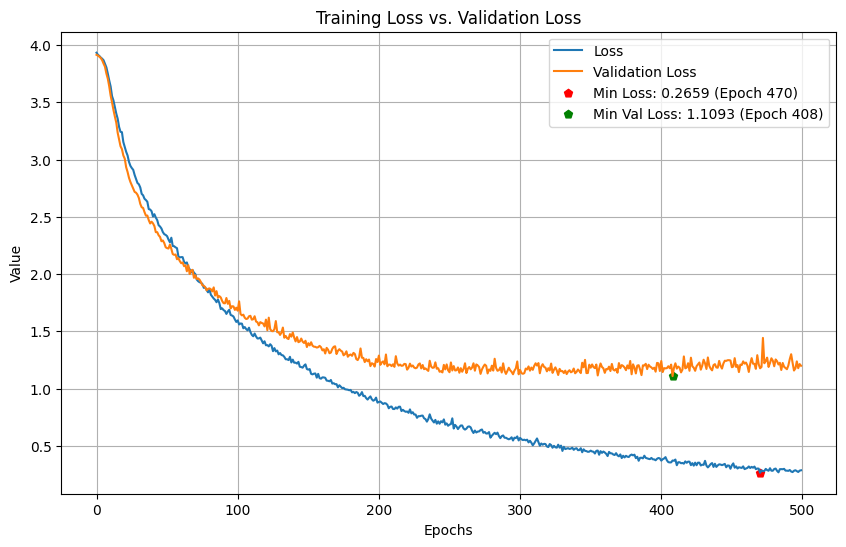

In [141]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

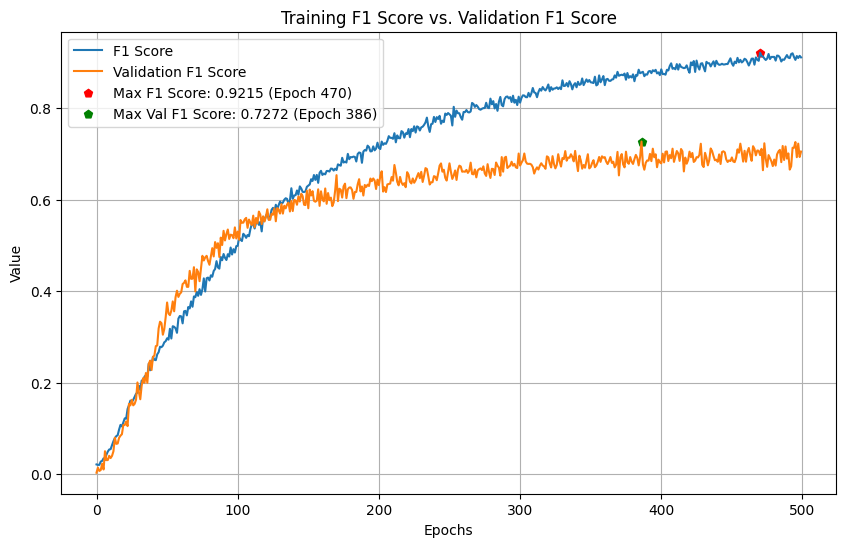

In [142]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [143]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 8ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.667     1.000     0.800         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.714     0.500     0.588        10
        BELT      1.000     1.000     1.000         4
        BITE      0.833     0.625     0.714         8
   BREAKFAST      0.600     0.500     0.545         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.571     0.667     0.615         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.000     0.000     0.000         6
      DECIDE      1.000     0.333     0.500         6
      DEMAND      0.800     0.500     0.615         8
     DEVELOP      0.308     0.667     0.421         6
      DINNER      1.000     0.625     0.769         8
         DOG      0.444     

In [144]:
reconstructed_model = tf.keras.models.load_model("2 1DCNN")

In [145]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 127, 125)          199625    
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 15, 125)          0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 12, 50)            25050     
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 3, 50)            0         
 1D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 3, 50)             0         
                                                                 
 flatten_1 (Flatten)         (None, 150)              

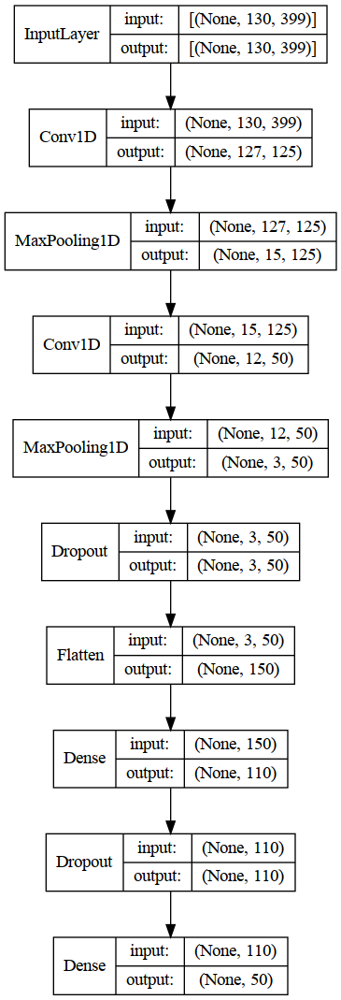

In [146]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [147]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 9ms/step - loss: 1.1180 - f1_score: 0.7272


[1.1179518699645996, 0.727241575717926]

In [149]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 10ms/step - loss: 0.0722 - f1_score: 0.9983


[0.07216788083314896, 0.9982861280441284]

In [148]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 7ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.600     1.000     0.750         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      0.700     0.700     0.700        10
        BELT      1.000     1.000     1.000         4
        BITE      0.750     0.750     0.750         8
   BREAKFAST      0.667     0.667     0.667         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.667     1.000     0.800         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.400     0.333     0.364         6
      DECIDE      1.000     0.333     0.500         6
      DEMAND      0.750     0.375     0.500         8
     DEVELOP      0.400     0.667     0.500         6
      DINNER      1.000     0.875     0.933         8
         DOG      0.500     

In [138]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 1DCNN Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [139]:
act_function=mish
model = Sequential()
model.add(Conv1D(filters=200,kernel_size=2,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=7))
model.add(Conv1D(filters=150,kernel_size=3,activation=act_function))
model.add(MaxPooling1D(pool_size=4))
model.add(Dropout(.55))
model.add(Flatten())
model.add(Dense(units=80,activation=act_function))
model.add(Dropout(.7))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(0.0032857440370174544),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 129, 200)          50600     
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 18, 200)          0         
 1D)                                                             
                                                                 
 conv1d_7 (Conv1D)           (None, 16, 150)           90150     
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 4, 150)           0         
 1D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 4, 150)            0         
                                                                 
 flatten_3 (Flatten)         (None, 600)              

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 12s 358ms/step - loss: 3.9183 - f1_score: 0.0255 - val_loss: 3.7476 - val_f1_score: 0.0355
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.7410 - f1_score: 0.0540

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 202ms/step - loss: 3.7402 - f1_score: 0.0546 - val_loss: 3.3871 - val_f1_score: 0.1191
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.4641 - f1_score: 0.0894

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 180ms/step - loss: 3.4592 - f1_score: 0.0895 - val_loss: 2.9641 - val_f1_score: 0.1697
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 3.1724 - f1_score: 0.1340

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 184ms/step - loss: 3.1639 - f1_score: 0.1356 - val_loss: 2.6853 - val_f1_score: 0.2310
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 2.8905 - f1_score: 0.1923

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 179ms/step - loss: 2.9009 - f1_score: 0.1923 - val_loss: 2.4656 - val_f1_score: 0.3232
Epoch 6/500
27/28 [===========================>..] - ETA: 0s - loss: 2.7222 - f1_score: 0.2249

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 192ms/step - loss: 2.7238 - f1_score: 0.2260 - val_loss: 2.2019 - val_f1_score: 0.3652
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5015 - f1_score: 0.2654

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 182ms/step - loss: 2.4983 - f1_score: 0.2672 - val_loss: 2.0435 - val_f1_score: 0.4335
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 2.3275 - f1_score: 0.3158

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 4s 165ms/step - loss: 2.3301 - f1_score: 0.3140 - val_loss: 1.8861 - val_f1_score: 0.4539
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2266 - f1_score: 0.3275

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 6s 236ms/step - loss: 2.2246 - f1_score: 0.3281 - val_loss: 1.7675 - val_f1_score: 0.5181
Epoch 10/500
28/28 [==============================] - 1s 30ms/step - loss: 2.1914 - f1_score: 0.3419 - val_loss: 1.7393 - val_f1_score: 0.5056
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0658 - f1_score: 0.3603

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 174ms/step - loss: 2.0723 - f1_score: 0.3595 - val_loss: 1.6667 - val_f1_score: 0.5579
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9632 - f1_score: 0.4013

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 182ms/step - loss: 1.9558 - f1_score: 0.4037 - val_loss: 1.6196 - val_f1_score: 0.5687
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 1.8681 - f1_score: 0.4301

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 188ms/step - loss: 1.8644 - f1_score: 0.4292 - val_loss: 1.5143 - val_f1_score: 0.6157
Epoch 14/500
28/28 [==============================] - 1s 30ms/step - loss: 1.8604 - f1_score: 0.4246 - val_loss: 1.5238 - val_f1_score: 0.5871
Epoch 15/500
28/28 [==============================] - 1s 30ms/step - loss: 1.7926 - f1_score: 0.4462 - val_loss: 1.4397 - val_f1_score: 0.6054
Epoch 16/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6998 - f1_score: 0.4822

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 169ms/step - loss: 1.7102 - f1_score: 0.4783 - val_loss: 1.3774 - val_f1_score: 0.6375
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6487 - f1_score: 0.4975

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 177ms/step - loss: 1.6558 - f1_score: 0.4946 - val_loss: 1.2990 - val_f1_score: 0.6484
Epoch 18/500
28/28 [==============================] - 1s 30ms/step - loss: 1.6178 - f1_score: 0.4920 - val_loss: 1.3108 - val_f1_score: 0.6429
Epoch 19/500
28/28 [==============================] - 1s 30ms/step - loss: 1.5658 - f1_score: 0.5077 - val_loss: 1.3313 - val_f1_score: 0.6449
Epoch 20/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5461 - f1_score: 0.5159

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 19s 703ms/step - loss: 1.5564 - f1_score: 0.5151 - val_loss: 1.2311 - val_f1_score: 0.6733
Epoch 21/500
28/28 [==============================] - 1s 29ms/step - loss: 1.4909 - f1_score: 0.5367 - val_loss: 1.2394 - val_f1_score: 0.6643
Epoch 22/500
28/28 [==============================] - 1s 30ms/step - loss: 1.4700 - f1_score: 0.5428 - val_loss: 1.2293 - val_f1_score: 0.6644
Epoch 23/500
28/28 [==============================] - 1s 29ms/step - loss: 1.4896 - f1_score: 0.5319 - val_loss: 1.2688 - val_f1_score: 0.6633
Epoch 24/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4170 - f1_score: 0.5553

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 173ms/step - loss: 1.4178 - f1_score: 0.5554 - val_loss: 1.1523 - val_f1_score: 0.6968
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3842 - f1_score: 0.5670

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 6s 237ms/step - loss: 1.3787 - f1_score: 0.5678 - val_loss: 1.2304 - val_f1_score: 0.7286
Epoch 26/500
28/28 [==============================] - 1s 29ms/step - loss: 1.3402 - f1_score: 0.5714 - val_loss: 1.1996 - val_f1_score: 0.6795
Epoch 27/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3983 - f1_score: 0.5563

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 176ms/step - loss: 1.3945 - f1_score: 0.5600 - val_loss: 1.1600 - val_f1_score: 0.7333
Epoch 28/500
28/28 [==============================] - 1s 29ms/step - loss: 1.2853 - f1_score: 0.5975 - val_loss: 1.1434 - val_f1_score: 0.6926
Epoch 29/500
28/28 [==============================] - 1s 30ms/step - loss: 1.2875 - f1_score: 0.6044 - val_loss: 1.1399 - val_f1_score: 0.6939
Epoch 30/500
28/28 [==============================] - 1s 30ms/step - loss: 1.2736 - f1_score: 0.6010 - val_loss: 1.0720 - val_f1_score: 0.7123
Epoch 31/500
28/28 [==============================] - 1s 30ms/step - loss: 1.2669 - f1_score: 0.6031 - val_loss: 1.1178 - val_f1_score: 0.7067
Epoch 32/500
28/28 [==============================] - 1s 30ms/step - loss: 1.2205 - f1_score: 0.6159 - val_loss: 1.0818 - val_f1_score: 0.7092
Epoch 33/500
28/28 [==============================] - 1s 30ms/step - loss: 1.2092 - f1_score: 0.6279 - val_loss: 1.1223 - val_f1_score: 0.7077
Epoch 34/50

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 178ms/step - loss: 1.1012 - f1_score: 0.6366 - val_loss: 1.0023 - val_f1_score: 0.7360
Epoch 40/500
27/28 [===========================>..] - ETA: 0s - loss: 1.1450 - f1_score: 0.6416

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 178ms/step - loss: 1.1360 - f1_score: 0.6441 - val_loss: 1.0588 - val_f1_score: 0.7370
Epoch 41/500
28/28 [==============================] - 1s 30ms/step - loss: 1.1034 - f1_score: 0.6560 - val_loss: 1.0699 - val_f1_score: 0.7187
Epoch 42/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0131 - f1_score: 0.6694

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 175ms/step - loss: 1.0133 - f1_score: 0.6689 - val_loss: 1.0875 - val_f1_score: 0.7395
Epoch 43/500
28/28 [==============================] - 1s 30ms/step - loss: 1.0802 - f1_score: 0.6562 - val_loss: 1.2049 - val_f1_score: 0.7079
Epoch 44/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0912 - f1_score: 0.6517

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 22s 827ms/step - loss: 1.0887 - f1_score: 0.6528 - val_loss: 1.0300 - val_f1_score: 0.7430
Epoch 45/500
28/28 [==============================] - 1s 29ms/step - loss: 1.0654 - f1_score: 0.6404 - val_loss: 1.1637 - val_f1_score: 0.7048
Epoch 46/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0382 - f1_score: 0.6615

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 6s 204ms/step - loss: 1.0423 - f1_score: 0.6621 - val_loss: 1.1053 - val_f1_score: 0.7525
Epoch 47/500
28/28 [==============================] - 1s 29ms/step - loss: 1.0478 - f1_score: 0.6678 - val_loss: 1.0353 - val_f1_score: 0.7141
Epoch 48/500
28/28 [==============================] - 1s 30ms/step - loss: 1.0120 - f1_score: 0.6711 - val_loss: 1.0321 - val_f1_score: 0.7485
Epoch 49/500
28/28 [==============================] - 1s 29ms/step - loss: 0.9977 - f1_score: 0.6757 - val_loss: 1.0723 - val_f1_score: 0.7494
Epoch 50/500
28/28 [==============================] - 1s 30ms/step - loss: 0.9839 - f1_score: 0.6928 - val_loss: 1.1567 - val_f1_score: 0.7391
Epoch 51/500
28/28 [==============================] - 1s 30ms/step - loss: 1.0182 - f1_score: 0.6766 - val_loss: 1.0591 - val_f1_score: 0.7244
Epoch 52/500
27/28 [===========================>..] - ETA: 0s - loss: 0.9593 - f1_score: 0.6901

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 192ms/step - loss: 0.9647 - f1_score: 0.6854 - val_loss: 1.0892 - val_f1_score: 0.7634
Epoch 53/500
28/28 [==============================] - 1s 30ms/step - loss: 0.9922 - f1_score: 0.6827 - val_loss: 1.1561 - val_f1_score: 0.7382
Epoch 54/500
28/28 [==============================] - 1s 29ms/step - loss: 0.9309 - f1_score: 0.7004 - val_loss: 1.0767 - val_f1_score: 0.7566
Epoch 55/500
28/28 [==============================] - 1s 30ms/step - loss: 0.9741 - f1_score: 0.6871 - val_loss: 1.0184 - val_f1_score: 0.7199
Epoch 56/500
28/28 [==============================] - 1s 30ms/step - loss: 0.9962 - f1_score: 0.6911 - val_loss: 1.0513 - val_f1_score: 0.7617
Epoch 57/500
28/28 [==============================] - 1s 30ms/step - loss: 0.9276 - f1_score: 0.7003 - val_loss: 1.0150 - val_f1_score: 0.7574
Epoch 58/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8782 - f1_score: 0.7072

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 178ms/step - loss: 0.8814 - f1_score: 0.7044 - val_loss: 1.0061 - val_f1_score: 0.7782
Epoch 59/500
28/28 [==============================] - 1s 30ms/step - loss: 0.8798 - f1_score: 0.7215 - val_loss: 1.0562 - val_f1_score: 0.7471
Epoch 60/500
28/28 [==============================] - 1s 30ms/step - loss: 0.9347 - f1_score: 0.7113 - val_loss: 1.1376 - val_f1_score: 0.7568
Epoch 61/500
28/28 [==============================] - 1s 30ms/step - loss: 0.9098 - f1_score: 0.7038 - val_loss: 1.0708 - val_f1_score: 0.7465
Epoch 62/500
28/28 [==============================] - 1s 30ms/step - loss: 0.8967 - f1_score: 0.7140 - val_loss: 1.1042 - val_f1_score: 0.7412
Epoch 63/500
28/28 [==============================] - 1s 30ms/step - loss: 0.9260 - f1_score: 0.7069 - val_loss: 1.1872 - val_f1_score: 0.7353
Epoch 64/500
28/28 [==============================] - 1s 30ms/step - loss: 0.8639 - f1_score: 0.7295 - val_loss: 1.0974 - val_f1_score: 0.7699
Epoch 65/50

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 189ms/step - loss: 0.9200 - f1_score: 0.7135 - val_loss: 0.9535 - val_f1_score: 0.7810
Epoch 68/500
28/28 [==============================] - 1s 30ms/step - loss: 0.8622 - f1_score: 0.7225 - val_loss: 1.1902 - val_f1_score: 0.7583
Epoch 69/500
28/28 [==============================] - 1s 30ms/step - loss: 0.8721 - f1_score: 0.7142 - val_loss: 1.1136 - val_f1_score: 0.7572
Epoch 70/500
28/28 [==============================] - 1s 30ms/step - loss: 0.8720 - f1_score: 0.7125 - val_loss: 1.1174 - val_f1_score: 0.7588
Epoch 71/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8396 - f1_score: 0.7365

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 19s 690ms/step - loss: 0.8418 - f1_score: 0.7378 - val_loss: 1.0382 - val_f1_score: 0.7838
Epoch 72/500
28/28 [==============================] - 1s 30ms/step - loss: 0.7983 - f1_score: 0.7425 - val_loss: 1.0959 - val_f1_score: 0.7644
Epoch 73/500
28/28 [==============================] - 1s 29ms/step - loss: 0.8076 - f1_score: 0.7368 - val_loss: 1.0593 - val_f1_score: 0.7503
Epoch 74/500
28/28 [==============================] - 1s 30ms/step - loss: 0.8449 - f1_score: 0.7351 - val_loss: 1.1175 - val_f1_score: 0.7757
Epoch 75/500
28/28 [==============================] - 1s 30ms/step - loss: 0.8598 - f1_score: 0.7240 - val_loss: 1.0424 - val_f1_score: 0.7800
Epoch 76/500
28/28 [==============================] - 1s 30ms/step - loss: 0.7968 - f1_score: 0.7450 - val_loss: 1.1803 - val_f1_score: 0.7637
Epoch 77/500
28/28 [==============================] - 1s 30ms/step - loss: 0.8182 - f1_score: 0.7308 - val_loss: 1.0883 - val_f1_score: 0.7634
Epoch 78/5

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 6s 229ms/step - loss: 0.7759 - f1_score: 0.7549 - val_loss: 0.9712 - val_f1_score: 0.8028
Epoch 89/500
28/28 [==============================] - 1s 30ms/step - loss: 0.7682 - f1_score: 0.7639 - val_loss: 1.2227 - val_f1_score: 0.7493
Epoch 90/500
28/28 [==============================] - 1s 30ms/step - loss: 0.7830 - f1_score: 0.7425 - val_loss: 1.1223 - val_f1_score: 0.7669
Epoch 91/500
28/28 [==============================] - 1s 30ms/step - loss: 0.7449 - f1_score: 0.7634 - val_loss: 1.0043 - val_f1_score: 0.7881
Epoch 92/500
28/28 [==============================] - 1s 30ms/step - loss: 0.7342 - f1_score: 0.7737 - val_loss: 1.0929 - val_f1_score: 0.7763
Epoch 93/500
28/28 [==============================] - 1s 31ms/step - loss: 0.6803 - f1_score: 0.7859 - val_loss: 1.1242 - val_f1_score: 0.7783
Epoch 94/500
28/28 [==============================] - 1s 30ms/step - loss: 0.7436 - f1_score: 0.7629 - val_loss: 1.1452 - val_f1_score: 0.7794
Epoch 95/50

27/28 [===========================>..] - ETA: 0s - loss: 0.6167 - f1_score: 0.8036

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 6s 220ms/step - loss: 0.6216 - f1_score: 0.8030 - val_loss: 1.0020 - val_f1_score: 0.8041
Epoch 146/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6185 - f1_score: 0.8058 - val_loss: 1.1395 - val_f1_score: 0.7903
Epoch 147/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6394 - f1_score: 0.8025 - val_loss: 1.1949 - val_f1_score: 0.8023
Epoch 148/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6330 - f1_score: 0.7932 - val_loss: 1.0106 - val_f1_score: 0.8019
Epoch 149/500
28/28 [==============================] - 1s 31ms/step - loss: 0.6089 - f1_score: 0.8124 - val_loss: 1.1010 - val_f1_score: 0.7892
Epoch 150/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6022 - f1_score: 0.8054

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 187ms/step - loss: 0.6030 - f1_score: 0.8056 - val_loss: 1.0629 - val_f1_score: 0.8060
Epoch 151/500
28/28 [==============================] - 1s 33ms/step - loss: 0.6261 - f1_score: 0.7988 - val_loss: 1.1128 - val_f1_score: 0.7816
Epoch 152/500
28/28 [==============================] - 1s 31ms/step - loss: 0.5492 - f1_score: 0.8296 - val_loss: 1.2030 - val_f1_score: 0.7938
Epoch 153/500
28/28 [==============================] - 1s 31ms/step - loss: 0.6107 - f1_score: 0.8124 - val_loss: 1.1401 - val_f1_score: 0.7907
Epoch 154/500
28/28 [==============================] - 1s 32ms/step - loss: 0.6309 - f1_score: 0.8017 - val_loss: 1.2074 - val_f1_score: 0.7733
Epoch 155/500
28/28 [==============================] - 1s 31ms/step - loss: 0.6288 - f1_score: 0.8067 - val_loss: 1.1433 - val_f1_score: 0.8040
Epoch 156/500
28/28 [==============================] - 1s 31ms/step - loss: 0.6720 - f1_score: 0.7947 - val_loss: 1.1948 - val_f1_score: 0.8025
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 6s 221ms/step - loss: 0.6610 - f1_score: 0.7847 - val_loss: 1.0752 - val_f1_score: 0.8146
Epoch 161/500
28/28 [==============================] - 1s 31ms/step - loss: 0.5777 - f1_score: 0.8188 - val_loss: 1.2396 - val_f1_score: 0.7949
Epoch 162/500
28/28 [==============================] - 1s 31ms/step - loss: 0.6160 - f1_score: 0.8092 - val_loss: 1.0953 - val_f1_score: 0.7779
Epoch 163/500
28/28 [==============================] - 1s 31ms/step - loss: 0.5594 - f1_score: 0.8198 - val_loss: 1.1040 - val_f1_score: 0.7745
Epoch 164/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6266 - f1_score: 0.8040 - val_loss: 1.1982 - val_f1_score: 0.7900
Epoch 165/500
28/28 [==============================] - 1s 30ms/step - loss: 0.5869 - f1_score: 0.8209 - val_loss: 1.3122 - val_f1_score: 0.7865
Epoch 166/500
27/28 [===========================>..] - ETA: 0s - loss: 0.5901 - f1_score: 0.8125

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 5s 201ms/step - loss: 0.5926 - f1_score: 0.8098 - val_loss: 1.1137 - val_f1_score: 0.8241
Epoch 167/500
28/28 [==============================] - 1s 31ms/step - loss: 0.5566 - f1_score: 0.8190 - val_loss: 1.1825 - val_f1_score: 0.7677
Epoch 168/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6314 - f1_score: 0.8103 - val_loss: 1.2514 - val_f1_score: 0.7990
Epoch 169/500
28/28 [==============================] - 1s 31ms/step - loss: 0.5881 - f1_score: 0.8180 - val_loss: 1.1365 - val_f1_score: 0.7615
Epoch 170/500
28/28 [==============================] - 1s 31ms/step - loss: 0.5806 - f1_score: 0.8218 - val_loss: 1.0051 - val_f1_score: 0.7963
Epoch 171/500
28/28 [==============================] - 1s 32ms/step - loss: 0.5341 - f1_score: 0.8288 - val_loss: 1.1399 - val_f1_score: 0.7793
Epoch 172/500
28/28 [==============================] - 1s 30ms/step - loss: 0.6240 - f1_score: 0.8114 - val_loss: 1.1366 - val_f1_score: 0.7865
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 6s 221ms/step - loss: 0.5820 - f1_score: 0.8274 - val_loss: 1.2055 - val_f1_score: 0.8277
Epoch 198/500
28/28 [==============================] - 1s 30ms/step - loss: 0.5447 - f1_score: 0.8346 - val_loss: 1.2704 - val_f1_score: 0.7796
Epoch 199/500
28/28 [==============================] - 1s 30ms/step - loss: 0.5549 - f1_score: 0.8296 - val_loss: 1.2774 - val_f1_score: 0.7850
Epoch 200/500
28/28 [==============================] - 1s 30ms/step - loss: 0.5914 - f1_score: 0.8200 - val_loss: 1.3658 - val_f1_score: 0.7451
Epoch 201/500
28/28 [==============================] - 1s 30ms/step - loss: 0.5410 - f1_score: 0.8304 - val_loss: 1.1200 - val_f1_score: 0.7928
Epoch 202/500
28/28 [==============================] - 1s 30ms/step - loss: 0.5816 - f1_score: 0.8223 - val_loss: 1.2832 - val_f1_score: 0.8056
Epoch 203/500
28/28 [==============================] - 1s 34ms/step - loss: 0.5407 - f1_score: 0.8354 - val_loss: 1.2473 - val_f1_score: 0.7766
Epoch

Epoch 254/500
28/28 [==============================] - 1s 32ms/step - loss: 0.4800 - f1_score: 0.8553 - val_loss: 1.2292 - val_f1_score: 0.7909
Epoch 255/500
28/28 [==============================] - 1s 32ms/step - loss: 0.5180 - f1_score: 0.8326 - val_loss: 1.2559 - val_f1_score: 0.8183
Epoch 256/500
28/28 [==============================] - 1s 32ms/step - loss: 0.5354 - f1_score: 0.8329 - val_loss: 1.3447 - val_f1_score: 0.8096
Epoch 257/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4894 - f1_score: 0.8468 - val_loss: 1.2992 - val_f1_score: 0.7890
Epoch 258/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4826 - f1_score: 0.8531 - val_loss: 1.3404 - val_f1_score: 0.7965
Epoch 259/500
28/28 [==============================] - 1s 32ms/step - loss: 0.5030 - f1_score: 0.8461 - val_loss: 1.4458 - val_f1_score: 0.7847
Epoch 260/500
28/28 [==============================] - 1s 34ms/step - loss: 0.5687 - f1_score: 0.8264 - val_loss: 1.2104 - val_f1_score:

Epoch 311/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4662 - f1_score: 0.8602 - val_loss: 1.2601 - val_f1_score: 0.8151
Epoch 312/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4403 - f1_score: 0.8628 - val_loss: 1.3743 - val_f1_score: 0.7886
Epoch 313/500
28/28 [==============================] - 1s 31ms/step - loss: 0.3975 - f1_score: 0.8724 - val_loss: 1.4801 - val_f1_score: 0.7940
Epoch 314/500
28/28 [==============================] - 1s 32ms/step - loss: 0.4622 - f1_score: 0.8578 - val_loss: 1.3950 - val_f1_score: 0.7960
Epoch 315/500
28/28 [==============================] - 1s 32ms/step - loss: 0.4657 - f1_score: 0.8517 - val_loss: 1.4278 - val_f1_score: 0.8106
Epoch 316/500
28/28 [==============================] - 1s 33ms/step - loss: 0.4618 - f1_score: 0.8545 - val_loss: 1.5309 - val_f1_score: 0.8046
Epoch 317/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4516 - f1_score: 0.8641 - val_loss: 1.3972 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 7s 247ms/step - loss: 0.4329 - f1_score: 0.8629 - val_loss: 1.3313 - val_f1_score: 0.8317
Epoch 350/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4460 - f1_score: 0.8643 - val_loss: 1.4557 - val_f1_score: 0.7910
Epoch 351/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4763 - f1_score: 0.8608 - val_loss: 1.3145 - val_f1_score: 0.7890
Epoch 352/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4873 - f1_score: 0.8509 - val_loss: 1.3731 - val_f1_score: 0.7982
Epoch 353/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4103 - f1_score: 0.8763 - val_loss: 1.5273 - val_f1_score: 0.7924
Epoch 354/500
28/28 [==============================] - 1s 34ms/step - loss: 0.4923 - f1_score: 0.8526 - val_loss: 1.2453 - val_f1_score: 0.8113
Epoch 355/500
28/28 [==============================] - 1s 32ms/step - loss: 0.4621 - f1_score: 0.8510 - val_loss: 1.4992 - val_f1_score: 0.8051
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 6s 209ms/step - loss: 0.4637 - f1_score: 0.8573 - val_loss: 1.3351 - val_f1_score: 0.8346
Epoch 362/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4512 - f1_score: 0.8658 - val_loss: 1.6766 - val_f1_score: 0.7884
Epoch 363/500
28/28 [==============================] - 1s 32ms/step - loss: 0.4947 - f1_score: 0.8572 - val_loss: 1.4313 - val_f1_score: 0.8015
Epoch 364/500
28/28 [==============================] - 1s 30ms/step - loss: 0.4799 - f1_score: 0.8566 - val_loss: 1.5043 - val_f1_score: 0.7994
Epoch 365/500
28/28 [==============================] - 1s 31ms/step - loss: 0.5036 - f1_score: 0.8470 - val_loss: 1.4527 - val_f1_score: 0.8135
Epoch 366/500
28/28 [==============================] - 1s 31ms/step - loss: 0.5101 - f1_score: 0.8490 - val_loss: 1.4804 - val_f1_score: 0.8107
Epoch 367/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4836 - f1_score: 0.8520 - val_loss: 1.3617 - val_f1_score: 0.8215
Epoch

Epoch 418/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4149 - f1_score: 0.8743 - val_loss: 1.6079 - val_f1_score: 0.8019
Epoch 419/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4804 - f1_score: 0.8584 - val_loss: 1.4069 - val_f1_score: 0.7892
Epoch 420/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4630 - f1_score: 0.8672 - val_loss: 1.2949 - val_f1_score: 0.7917
Epoch 421/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4190 - f1_score: 0.8750 - val_loss: 1.5644 - val_f1_score: 0.8031
Epoch 422/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4382 - f1_score: 0.8691 - val_loss: 1.5416 - val_f1_score: 0.7957
Epoch 423/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4702 - f1_score: 0.8602 - val_loss: 1.4033 - val_f1_score: 0.8018
Epoch 424/500
28/28 [==============================] - 1s 31ms/step - loss: 0.5446 - f1_score: 0.8468 - val_loss: 1.4335 - val_f1_score:

Epoch 475/500
28/28 [==============================] - 1s 31ms/step - loss: 0.3789 - f1_score: 0.8833 - val_loss: 1.6973 - val_f1_score: 0.8039
Epoch 476/500
28/28 [==============================] - 1s 33ms/step - loss: 0.4611 - f1_score: 0.8683 - val_loss: 1.3271 - val_f1_score: 0.7951
Epoch 477/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4242 - f1_score: 0.8768 - val_loss: 1.8554 - val_f1_score: 0.8022
Epoch 478/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4276 - f1_score: 0.8672 - val_loss: 1.7159 - val_f1_score: 0.7990
Epoch 479/500
28/28 [==============================] - 1s 32ms/step - loss: 0.4323 - f1_score: 0.8732 - val_loss: 1.6055 - val_f1_score: 0.8244
Epoch 480/500
28/28 [==============================] - 1s 31ms/step - loss: 0.4540 - f1_score: 0.8694 - val_loss: 1.4244 - val_f1_score: 0.8187
Epoch 481/500
28/28 [==============================] - 1s 31ms/step - loss: 0.3991 - f1_score: 0.8774 - val_loss: 1.7097 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN Mish/assets


28/28 [==============================] - 6s 221ms/step - loss: 0.4424 - f1_score: 0.8710 - val_loss: 1.5690 - val_f1_score: 0.8360


In [140]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 5ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.875     0.933         8
    BACKPACK      0.667     0.667     0.667         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.889     0.800     0.842        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     1.000     1.000         8
   BREAKFAST      0.500     0.833     0.625         6
      CANCER      0.800     1.000     0.889         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      0.667     0.667     0.667         6
      DEMAND      1.000     0.500     0.667         8
     DEVELOP      0.500     0.500     0.500         6
      DINNER      1.000     0.875     0.933         8
         DOG      1.000     

In [146]:
reconstructed_model = tf.keras.models.load_model("2 1DCNN Mish")

In [147]:
reconstructed_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 129, 200)          50600     
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 18, 200)          0         
 1D)                                                             
                                                                 
 conv1d_7 (Conv1D)           (None, 16, 150)           90150     
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 4, 150)           0         
 1D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 4, 150)            0         
                                                                 
 flatten_3 (Flatten)         (None, 600)              

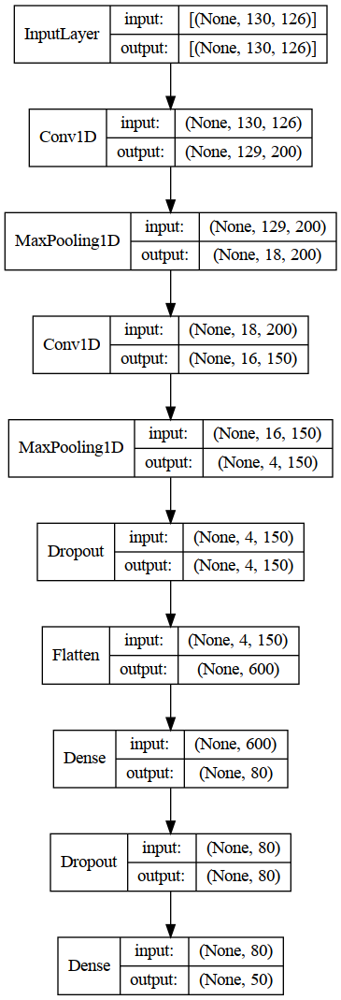

In [148]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [149]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 6ms/step - loss: 1.5690 - f1_score: 0.8360


[1.5689743757247925, 0.8359827399253845]

In [150]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.875     0.933         8
    BACKPACK      0.667     0.667     0.667         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.889     0.800     0.842        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     1.000     1.000         8
   BREAKFAST      0.500     0.833     0.625         6
      CANCER      0.800     1.000     0.889         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      0.667     0.667     0.667         6
      DEMAND      1.000     0.500     0.667         8
     DEVELOP      0.500     0.500     0.500         6
      DINNER      1.000     0.875     0.933         8
         DOG      1.000     

## Hyperparameter Tuning 3 1D CNN Layers

In [119]:
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping


/tmp/ipykernel_445075/1222377179.py:2: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [119]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, GRU
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','gelu','elu','relu'],default='relu')
        model = Sequential()
        model.add(Conv1D(filters=hp.Int('filters_1',min_value=50,max_value=200,step=25,default=150),kernel_size=hp.Choice('kernel_1',values=[2,3,4,5],default=2,),activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=2))
        model.add(Conv1D(filters=hp.Int('filters_2',min_value=50,max_value=200,step=25,default=150),kernel_size=hp.Choice('kernel_2',values=[2,3,4,5],default=2,),activation=act_function))
        model.add(MaxPooling1D(pool_size=2))
        model.add(Conv1D(filters=hp.Int('filters_3',min_value=50,max_value=200,step=25,default=150),kernel_size=hp.Choice('kernel_3',values=[2,3,4,5],default=2,),activation=act_function))
        model.add(MaxPooling1D(pool_size=2))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.5,max_value=0.9,default=0.8,step=0.05,)))
        model.add(Flatten())
        model.add(Dense(units=hp.Int('units_5',min_value=70,max_value=120,step=10,default=80),activation=act_function))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.5,max_value=0.9,default=0.8,step=0.05,)))
        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,max_value=1e-2,sampling='LOG',default=.0008273819395816823)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

/tmp/ipykernel_955334/2682104668.py:5: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [120]:
HYPERBAND_MAX_EPOCHS = 300
#MAX_TRIALS = 20
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/CSPnext/hyperband/',
    project_name='3_1D_CNN',
    overwrite=False)

INFO:tensorflow:Reloading Tuner from /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/3_1D_CNN/tuner0.json


In [124]:
tuner.search_space_summary()

Search space summary
Default search space size: 11
dense_activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['selu', 'mish', 'gelu', 'elu', 'relu'], 'ordered': False}
filters_1 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_1 (Choice)
{'default': 2, 'conditions': [], 'values': [2, 3, 4, 5], 'ordered': True}
filters_2 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_2 (Choice)
{'default': 2, 'conditions': [], 'values': [2, 3, 4, 5], 'ordered': True}
filters_3 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_3 (Choice)
{'default': 2, 'conditions': [], 'values': [2, 3, 4, 5], 'ordered': True}
dropout_1 (Float)
{'default': 0.8, 'conditions': [], 'min_value': 0.5, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_5 (Int)
{'default': 80, 'conditions': [], 'min_va

In [125]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [126]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [127]:
tuner.search(Xtrain, Ytrain, epochs=1000, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 14m 47s]
val_f1_score: 0.6045276522636414

Best val_f1_score So Far: 0.6567659080028534
Total elapsed time: 10h 35m 20s
INFO:tensorflow:Oracle triggered exit


In [121]:
best_model = tuner.get_best_models(num_models=6)[0]

2023-09-07 15:28:44.940453: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-07 15:28:45.924527: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1151 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


In [122]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 129, 150)          119850    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 64, 150)          0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 60, 75)            56325     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 30, 75)           0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 27, 50)            15050     
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 13, 50)           0

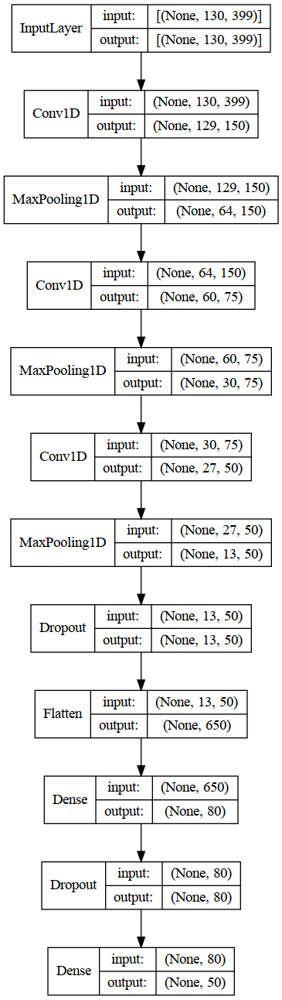

In [123]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

In [129]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/3_1D_CNN
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0714 summary
Hyperparameters:
dense_activation: gelu
filters_1: 150
kernel_1: 2
filters_2: 75
kernel_2: 5
filters_3: 50
kernel_3: 4
dropout_1: 0.6
units_5: 80
dropout_2: 0.8
learning_rate: 0.0010731058974110062
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0711
Score: 0.6567659080028534

Trial 0671 summary
Hyperparameters:
dense_activation: gelu
filters_1: 150
kernel_1: 4
filters_2: 150
kernel_2: 4
filters_3: 50
kernel_3: 2
dropout_1: 0.5
units_5: 100
dropout_2: 0.6
learning_rate: 0.00034113846912856477
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 3
tuner/round: 3
tuner/trial_id: 0667
Score: 0.6532615125179291

Trial 0718 summary
Hyperparameters:
dense_activation: elu
filters_1: 175
kernel_1: 5
filters_2: 50
kernel_2: 3
filters_3: 75
kernel_3: 2
dropout_1: 0.8500000

In [124]:
loss, accuracy = best_model.evaluate(Xval, Yval)

2023-09-07 15:29:18.065761: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700


11/11 [==============================] - 11s 36ms/step - loss: 1.3640 - f1_score: 0.6603


In [125]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 1s 12ms/step - loss: 0.4578 - f1_score: 0.9051


2023-09-07 15:29:48.527565: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 475.44MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


In [124]:
#bestHP = tuner.get_best_hyperparameters(num_trials=5)[2]
bestHP = tuner.get_best_hyperparameters(num_trials=6)[0]

In [125]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='3 1D CNN/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [126]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500


2023-09-06 11:17:49.891273: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 842.83MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-06 11:17:50.022525: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 713.74MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-06 11:17:50.094878: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7fa150d13fe0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-09-06 11:17:50.094913: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce MX250, Compute Capability 6.1
2023-09-06 11:17:50.104444: I ten

28/28 [==============================] - ETA: 0s - loss: 3.9512 - f1_score: 0.0225

2023-09-06 11:17:53.165813: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 784.82MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-06 11:17:53.265091: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 626.52MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-06 11:17:53.838636: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 552.79MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 9s 206ms/step - loss: 3.9512 - f1_score: 0.0225 - val_loss: 3.9113 - val_f1_score: 0.0039
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.9179 - f1_score: 0.0229

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 167ms/step - loss: 3.9184 - f1_score: 0.0227 - val_loss: 3.9079 - val_f1_score: 0.0167
Epoch 3/500
28/28 [==============================] - 1s 51ms/step - loss: 3.9150 - f1_score: 0.0236 - val_loss: 3.9045 - val_f1_score: 0.0018
Epoch 4/500
28/28 [==============================] - 1s 51ms/step - loss: 3.9112 - f1_score: 0.0196 - val_loss: 3.9006 - val_f1_score: 0.0076
Epoch 5/500
28/28 [==============================] - 1s 51ms/step - loss: 3.9044 - f1_score: 0.0168 - val_loss: 3.8838 - val_f1_score: 0.0117
Epoch 6/500
27/28 [===========================>..] - ETA: 0s - loss: 3.8830 - f1_score: 0.0312

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 4s 161ms/step - loss: 3.8836 - f1_score: 0.0307 - val_loss: 3.8398 - val_f1_score: 0.0244
Epoch 7/500
28/28 [==============================] - 1s 51ms/step - loss: 3.8395 - f1_score: 0.0356 - val_loss: 3.7278 - val_f1_score: 0.0147
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 3.7663 - f1_score: 0.0461

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 186ms/step - loss: 3.7680 - f1_score: 0.0466 - val_loss: 3.6364 - val_f1_score: 0.0410
Epoch 9/500
28/28 [==============================] - 1s 51ms/step - loss: 3.6679 - f1_score: 0.0532 - val_loss: 3.4854 - val_f1_score: 0.0323
Epoch 10/500
28/28 [==============================] - ETA: 0s - loss: 3.5896 - f1_score: 0.0625

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 169ms/step - loss: 3.5896 - f1_score: 0.0625 - val_loss: 3.4178 - val_f1_score: 0.0481
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 3.5354 - f1_score: 0.0615

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 169ms/step - loss: 3.5300 - f1_score: 0.0616 - val_loss: 3.2876 - val_f1_score: 0.0591
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 3.4350 - f1_score: 0.0687

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 166ms/step - loss: 3.4293 - f1_score: 0.0704 - val_loss: 3.2548 - val_f1_score: 0.0592
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3899 - f1_score: 0.0836

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 179ms/step - loss: 3.3867 - f1_score: 0.0851 - val_loss: 3.1611 - val_f1_score: 0.1017
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3365 - f1_score: 0.0857

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 191ms/step - loss: 3.3340 - f1_score: 0.0855 - val_loss: 3.1208 - val_f1_score: 0.1131
Epoch 15/500
28/28 [==============================] - 1s 51ms/step - loss: 3.2820 - f1_score: 0.0918 - val_loss: 3.1006 - val_f1_score: 0.0877
Epoch 16/500
28/28 [==============================] - 1s 51ms/step - loss: 3.2272 - f1_score: 0.0953 - val_loss: 2.9881 - val_f1_score: 0.1025
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 3.1760 - f1_score: 0.1023

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 179ms/step - loss: 3.1791 - f1_score: 0.1031 - val_loss: 2.9556 - val_f1_score: 0.1170
Epoch 18/500
28/28 [==============================] - 1s 51ms/step - loss: 3.1501 - f1_score: 0.1258 - val_loss: 2.9362 - val_f1_score: 0.1129
Epoch 19/500
27/28 [===========================>..] - ETA: 0s - loss: 3.0882 - f1_score: 0.1281

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 170ms/step - loss: 3.0897 - f1_score: 0.1286 - val_loss: 2.8730 - val_f1_score: 0.1356
Epoch 20/500
28/28 [==============================] - 1s 51ms/step - loss: 3.0195 - f1_score: 0.1293 - val_loss: 2.8321 - val_f1_score: 0.1242
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9828 - f1_score: 0.1417

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 168ms/step - loss: 2.9772 - f1_score: 0.1439 - val_loss: 2.7385 - val_f1_score: 0.1371
Epoch 22/500
28/28 [==============================] - ETA: 0s - loss: 2.9202 - f1_score: 0.1474

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 175ms/step - loss: 2.9202 - f1_score: 0.1474 - val_loss: 2.6942 - val_f1_score: 0.1505
Epoch 23/500
27/28 [===========================>..] - ETA: 0s - loss: 2.8900 - f1_score: 0.1556

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 171ms/step - loss: 2.8839 - f1_score: 0.1560 - val_loss: 2.6292 - val_f1_score: 0.1597
Epoch 24/500
27/28 [===========================>..] - ETA: 0s - loss: 2.8699 - f1_score: 0.1635

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 209ms/step - loss: 2.8689 - f1_score: 0.1644 - val_loss: 2.5852 - val_f1_score: 0.1903
Epoch 25/500
28/28 [==============================] - 1s 51ms/step - loss: 2.8187 - f1_score: 0.1747 - val_loss: 2.6227 - val_f1_score: 0.1806
Epoch 26/500
27/28 [===========================>..] - ETA: 0s - loss: 2.7639 - f1_score: 0.1833

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 186ms/step - loss: 2.7530 - f1_score: 0.1844 - val_loss: 2.5867 - val_f1_score: 0.2088
Epoch 27/500
28/28 [==============================] - 1s 51ms/step - loss: 2.7429 - f1_score: 0.1898 - val_loss: 2.6042 - val_f1_score: 0.1887
Epoch 28/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6864 - f1_score: 0.1896

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 190ms/step - loss: 2.6878 - f1_score: 0.1900 - val_loss: 2.5714 - val_f1_score: 0.2140
Epoch 29/500
28/28 [==============================] - 1s 51ms/step - loss: 2.7018 - f1_score: 0.1972 - val_loss: 2.4389 - val_f1_score: 0.2052
Epoch 30/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6810 - f1_score: 0.2060

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 178ms/step - loss: 2.6771 - f1_score: 0.2054 - val_loss: 2.4754 - val_f1_score: 0.2160
Epoch 31/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5961 - f1_score: 0.2231

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 189ms/step - loss: 2.5968 - f1_score: 0.2226 - val_loss: 2.4049 - val_f1_score: 0.2451
Epoch 32/500
28/28 [==============================] - 1s 51ms/step - loss: 2.6134 - f1_score: 0.2030 - val_loss: 2.4697 - val_f1_score: 0.2379
Epoch 33/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5573 - f1_score: 0.2155

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 201ms/step - loss: 2.5525 - f1_score: 0.2176 - val_loss: 2.4032 - val_f1_score: 0.2506
Epoch 34/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5166 - f1_score: 0.2261

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 184ms/step - loss: 2.5117 - f1_score: 0.2275 - val_loss: 2.3450 - val_f1_score: 0.2731
Epoch 35/500
28/28 [==============================] - 1s 52ms/step - loss: 2.5601 - f1_score: 0.2279 - val_loss: 2.3568 - val_f1_score: 0.2700
Epoch 36/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5134 - f1_score: 0.2301

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 183ms/step - loss: 2.5171 - f1_score: 0.2287 - val_loss: 2.3343 - val_f1_score: 0.2825
Epoch 37/500
28/28 [==============================] - 1s 52ms/step - loss: 2.4657 - f1_score: 0.2495 - val_loss: 2.3844 - val_f1_score: 0.2685
Epoch 38/500
28/28 [==============================] - 1s 52ms/step - loss: 2.4258 - f1_score: 0.2492 - val_loss: 2.2722 - val_f1_score: 0.2691
Epoch 39/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4227 - f1_score: 0.2402

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 190ms/step - loss: 2.4244 - f1_score: 0.2384 - val_loss: 2.2980 - val_f1_score: 0.2933
Epoch 40/500
27/28 [===========================>..] - ETA: 0s - loss: 2.3829 - f1_score: 0.2561

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 181ms/step - loss: 2.3700 - f1_score: 0.2596 - val_loss: 2.2394 - val_f1_score: 0.3103
Epoch 41/500
28/28 [==============================] - 1s 51ms/step - loss: 2.4234 - f1_score: 0.2597 - val_loss: 2.2476 - val_f1_score: 0.2892
Epoch 42/500
28/28 [==============================] - ETA: 0s - loss: 2.3449 - f1_score: 0.2710

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 192ms/step - loss: 2.3449 - f1_score: 0.2710 - val_loss: 2.1843 - val_f1_score: 0.3134
Epoch 43/500
28/28 [==============================] - 1s 51ms/step - loss: 2.3190 - f1_score: 0.2773 - val_loss: 2.1943 - val_f1_score: 0.3101
Epoch 44/500
28/28 [==============================] - ETA: 0s - loss: 2.2846 - f1_score: 0.2780

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 206ms/step - loss: 2.2846 - f1_score: 0.2780 - val_loss: 2.1673 - val_f1_score: 0.3483
Epoch 45/500
28/28 [==============================] - 1s 52ms/step - loss: 2.2983 - f1_score: 0.2939 - val_loss: 2.1516 - val_f1_score: 0.3186
Epoch 46/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2426 - f1_score: 0.2880

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 183ms/step - loss: 2.2479 - f1_score: 0.2862 - val_loss: 2.0943 - val_f1_score: 0.3743
Epoch 47/500
28/28 [==============================] - 1s 52ms/step - loss: 2.2434 - f1_score: 0.2959 - val_loss: 2.0841 - val_f1_score: 0.3213
Epoch 48/500
28/28 [==============================] - 1s 52ms/step - loss: 2.2102 - f1_score: 0.3004 - val_loss: 2.0500 - val_f1_score: 0.3250
Epoch 49/500
28/28 [==============================] - 1s 52ms/step - loss: 2.2251 - f1_score: 0.3156 - val_loss: 2.0821 - val_f1_score: 0.3642
Epoch 50/500
28/28 [==============================] - 1s 53ms/step - loss: 2.2060 - f1_score: 0.2956 - val_loss: 2.0287 - val_f1_score: 0.3614
Epoch 51/500
28/28 [==============================] - ETA: 0s - loss: 2.1339 - f1_score: 0.3292

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 215ms/step - loss: 2.1339 - f1_score: 0.3292 - val_loss: 2.0083 - val_f1_score: 0.3773
Epoch 52/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1642 - f1_score: 0.3157

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 200ms/step - loss: 2.1632 - f1_score: 0.3148 - val_loss: 2.1306 - val_f1_score: 0.3841
Epoch 53/500
28/28 [==============================] - 1s 52ms/step - loss: 2.1469 - f1_score: 0.3305 - val_loss: 2.0201 - val_f1_score: 0.3329
Epoch 54/500
28/28 [==============================] - 1s 52ms/step - loss: 2.1391 - f1_score: 0.3247 - val_loss: 2.0657 - val_f1_score: 0.3695
Epoch 55/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1414 - f1_score: 0.3277

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 191ms/step - loss: 2.1432 - f1_score: 0.3281 - val_loss: 1.9474 - val_f1_score: 0.4026
Epoch 56/500
28/28 [==============================] - 1s 52ms/step - loss: 2.1059 - f1_score: 0.3435 - val_loss: 1.9655 - val_f1_score: 0.3989
Epoch 57/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1231 - f1_score: 0.3436

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 185ms/step - loss: 2.1244 - f1_score: 0.3428 - val_loss: 2.0384 - val_f1_score: 0.4237
Epoch 58/500
28/28 [==============================] - 1s 51ms/step - loss: 2.0506 - f1_score: 0.3506 - val_loss: 1.9966 - val_f1_score: 0.4054
Epoch 59/500
28/28 [==============================] - 1s 51ms/step - loss: 2.0548 - f1_score: 0.3457 - val_loss: 1.9752 - val_f1_score: 0.4167
Epoch 60/500
28/28 [==============================] - ETA: 0s - loss: 2.0475 - f1_score: 0.3464

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 178ms/step - loss: 2.0475 - f1_score: 0.3464 - val_loss: 1.9573 - val_f1_score: 0.4301
Epoch 61/500
28/28 [==============================] - 1s 52ms/step - loss: 2.0111 - f1_score: 0.3697 - val_loss: 1.9636 - val_f1_score: 0.3257
Epoch 62/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9696 - f1_score: 0.3716

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 209ms/step - loss: 1.9623 - f1_score: 0.3745 - val_loss: 1.8781 - val_f1_score: 0.4334
Epoch 63/500
28/28 [==============================] - 1s 51ms/step - loss: 1.9948 - f1_score: 0.3676 - val_loss: 1.9153 - val_f1_score: 0.4089
Epoch 64/500
28/28 [==============================] - 1s 52ms/step - loss: 1.9804 - f1_score: 0.3688 - val_loss: 1.9295 - val_f1_score: 0.4246
Epoch 65/500
28/28 [==============================] - 1s 52ms/step - loss: 1.9714 - f1_score: 0.3522 - val_loss: 1.8649 - val_f1_score: 0.3941
Epoch 66/500
28/28 [==============================] - 1s 52ms/step - loss: 1.9678 - f1_score: 0.3661 - val_loss: 1.7590 - val_f1_score: 0.4142
Epoch 67/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9402 - f1_score: 0.3870

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 191ms/step - loss: 1.9403 - f1_score: 0.3875 - val_loss: 1.8273 - val_f1_score: 0.4662
Epoch 68/500
28/28 [==============================] - 1s 52ms/step - loss: 1.9271 - f1_score: 0.3946 - val_loss: 1.7706 - val_f1_score: 0.4577
Epoch 69/500
28/28 [==============================] - 1s 52ms/step - loss: 1.8944 - f1_score: 0.3710 - val_loss: 1.8271 - val_f1_score: 0.4353
Epoch 70/500
28/28 [==============================] - 1s 52ms/step - loss: 1.8976 - f1_score: 0.3978 - val_loss: 1.7368 - val_f1_score: 0.4231
Epoch 71/500
28/28 [==============================] - 1s 52ms/step - loss: 1.8561 - f1_score: 0.3974 - val_loss: 1.8236 - val_f1_score: 0.4260
Epoch 72/500
28/28 [==============================] - 1s 52ms/step - loss: 1.8440 - f1_score: 0.4132 - val_loss: 1.8814 - val_f1_score: 0.4406
Epoch 73/500
27/28 [===========================>..] - ETA: 0s - loss: 1.8542 - f1_score: 0.3958

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 200ms/step - loss: 1.8581 - f1_score: 0.3955 - val_loss: 1.7570 - val_f1_score: 0.4805
Epoch 74/500
28/28 [==============================] - 1s 52ms/step - loss: 1.8491 - f1_score: 0.3935 - val_loss: 1.7916 - val_f1_score: 0.4640
Epoch 75/500
28/28 [==============================] - 1s 51ms/step - loss: 1.8504 - f1_score: 0.4021 - val_loss: 1.7489 - val_f1_score: 0.4474
Epoch 76/500
28/28 [==============================] - 1s 52ms/step - loss: 1.8463 - f1_score: 0.4122 - val_loss: 1.8463 - val_f1_score: 0.4715
Epoch 77/500
28/28 [==============================] - 1s 52ms/step - loss: 1.7859 - f1_score: 0.4185 - val_loss: 1.7279 - val_f1_score: 0.4720
Epoch 78/500
28/28 [==============================] - 1s 52ms/step - loss: 1.7658 - f1_score: 0.4327 - val_loss: 1.6711 - val_f1_score: 0.4698
Epoch 79/500
28/28 [==============================] - 1s 52ms/step - loss: 1.7909 - f1_score: 0.4179 - val_loss: 1.7574 - val_f1_score: 0.4420
Epoch 80/50

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 183ms/step - loss: 1.7515 - f1_score: 0.4217 - val_loss: 1.7164 - val_f1_score: 0.4966
Epoch 82/500
28/28 [==============================] - 1s 52ms/step - loss: 1.7365 - f1_score: 0.4349 - val_loss: 1.7252 - val_f1_score: 0.4936
Epoch 83/500
28/28 [==============================] - 1s 52ms/step - loss: 1.7459 - f1_score: 0.4371 - val_loss: 1.7438 - val_f1_score: 0.4878
Epoch 84/500
28/28 [==============================] - 1s 52ms/step - loss: 1.7678 - f1_score: 0.4296 - val_loss: 1.8521 - val_f1_score: 0.4563
Epoch 85/500
28/28 [==============================] - 1s 52ms/step - loss: 1.7011 - f1_score: 0.4536 - val_loss: 1.7623 - val_f1_score: 0.4908
Epoch 86/500
28/28 [==============================] - 1s 53ms/step - loss: 1.7154 - f1_score: 0.4447 - val_loss: 1.7731 - val_f1_score: 0.4439
Epoch 87/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6971 - f1_score: 0.4551

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 174ms/step - loss: 1.6947 - f1_score: 0.4536 - val_loss: 1.6260 - val_f1_score: 0.5014
Epoch 88/500
28/28 [==============================] - 1s 52ms/step - loss: 1.7318 - f1_score: 0.4390 - val_loss: 1.7192 - val_f1_score: 0.4623
Epoch 89/500
28/28 [==============================] - 1s 52ms/step - loss: 1.6671 - f1_score: 0.4576 - val_loss: 1.6763 - val_f1_score: 0.4300
Epoch 90/500
28/28 [==============================] - ETA: 0s - loss: 1.7289 - f1_score: 0.4488

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 181ms/step - loss: 1.7289 - f1_score: 0.4488 - val_loss: 1.6797 - val_f1_score: 0.5086
Epoch 91/500
28/28 [==============================] - 1s 52ms/step - loss: 1.6776 - f1_score: 0.4525 - val_loss: 1.7078 - val_f1_score: 0.5037
Epoch 92/500
28/28 [==============================] - 1s 52ms/step - loss: 1.6764 - f1_score: 0.4448 - val_loss: 1.6385 - val_f1_score: 0.5064
Epoch 93/500
28/28 [==============================] - 1s 52ms/step - loss: 1.6381 - f1_score: 0.4652 - val_loss: 1.7114 - val_f1_score: 0.4931
Epoch 94/500
28/28 [==============================] - 1s 52ms/step - loss: 1.6307 - f1_score: 0.4644 - val_loss: 1.6696 - val_f1_score: 0.4875
Epoch 95/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6442 - f1_score: 0.4646

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 187ms/step - loss: 1.6461 - f1_score: 0.4637 - val_loss: 1.6546 - val_f1_score: 0.5318
Epoch 96/500
28/28 [==============================] - 1s 53ms/step - loss: 1.6199 - f1_score: 0.4758 - val_loss: 1.6306 - val_f1_score: 0.4740
Epoch 97/500
28/28 [==============================] - 1s 52ms/step - loss: 1.5841 - f1_score: 0.4811 - val_loss: 1.5760 - val_f1_score: 0.5261
Epoch 98/500
28/28 [==============================] - 1s 53ms/step - loss: 1.6307 - f1_score: 0.4615 - val_loss: 1.5789 - val_f1_score: 0.5229
Epoch 99/500
28/28 [==============================] - 1s 53ms/step - loss: 1.6146 - f1_score: 0.4764 - val_loss: 1.6133 - val_f1_score: 0.4683
Epoch 100/500
28/28 [==============================] - 1s 52ms/step - loss: 1.6097 - f1_score: 0.4806 - val_loss: 1.6274 - val_f1_score: 0.5208
Epoch 101/500
28/28 [==============================] - 1s 52ms/step - loss: 1.5997 - f1_score: 0.4788 - val_loss: 1.7131 - val_f1_score: 0.4479
Epoch 102

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 205ms/step - loss: 1.5868 - f1_score: 0.4756 - val_loss: 1.6253 - val_f1_score: 0.5498
Epoch 103/500
28/28 [==============================] - 1s 52ms/step - loss: 1.5339 - f1_score: 0.4989 - val_loss: 1.5952 - val_f1_score: 0.5070
Epoch 104/500
28/28 [==============================] - 1s 52ms/step - loss: 1.5565 - f1_score: 0.4880 - val_loss: 1.6159 - val_f1_score: 0.5095
Epoch 105/500
28/28 [==============================] - 1s 52ms/step - loss: 1.5330 - f1_score: 0.4977 - val_loss: 1.6188 - val_f1_score: 0.5212
Epoch 106/500
28/28 [==============================] - 1s 52ms/step - loss: 1.5829 - f1_score: 0.4856 - val_loss: 1.6390 - val_f1_score: 0.5120
Epoch 107/500
28/28 [==============================] - 1s 52ms/step - loss: 1.5148 - f1_score: 0.5012 - val_loss: 1.5939 - val_f1_score: 0.5055
Epoch 108/500
28/28 [==============================] - 1s 52ms/step - loss: 1.5373 - f1_score: 0.4989 - val_loss: 1.5416 - val_f1_score: 0.5020
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 202ms/step - loss: 1.4334 - f1_score: 0.5186 - val_loss: 1.5292 - val_f1_score: 0.5566
Epoch 118/500
28/28 [==============================] - 1s 52ms/step - loss: 1.4625 - f1_score: 0.5181 - val_loss: 1.4901 - val_f1_score: 0.5336
Epoch 119/500
28/28 [==============================] - 1s 52ms/step - loss: 1.4625 - f1_score: 0.5253 - val_loss: 1.5651 - val_f1_score: 0.5351
Epoch 120/500
28/28 [==============================] - 1s 53ms/step - loss: 1.4320 - f1_score: 0.5190 - val_loss: 1.6121 - val_f1_score: 0.5388
Epoch 121/500
28/28 [==============================] - 2s 55ms/step - loss: 1.4414 - f1_score: 0.5335 - val_loss: 1.4313 - val_f1_score: 0.5311
Epoch 122/500
28/28 [==============================] - 2s 57ms/step - loss: 1.4686 - f1_score: 0.5271 - val_loss: 1.5083 - val_f1_score: 0.5452
Epoch 123/500
28/28 [==============================] - 2s 58ms/step - loss: 1.4179 - f1_score: 0.5359 - val_loss: 1.4626 - val_f1_score: 0.5559
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 218ms/step - loss: 1.4237 - f1_score: 0.5412 - val_loss: 1.4777 - val_f1_score: 0.5619
Epoch 128/500
28/28 [==============================] - 1s 53ms/step - loss: 1.4357 - f1_score: 0.5171 - val_loss: 1.5618 - val_f1_score: 0.5430
Epoch 129/500
28/28 [==============================] - 1s 53ms/step - loss: 1.3967 - f1_score: 0.5478 - val_loss: 1.5878 - val_f1_score: 0.5333
Epoch 130/500
28/28 [==============================] - 1s 53ms/step - loss: 1.3840 - f1_score: 0.5357 - val_loss: 1.5188 - val_f1_score: 0.5375
Epoch 131/500
28/28 [==============================] - 1s 53ms/step - loss: 1.3868 - f1_score: 0.5366 - val_loss: 1.4959 - val_f1_score: 0.5345
Epoch 132/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3925 - f1_score: 0.5515

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 206ms/step - loss: 1.3863 - f1_score: 0.5532 - val_loss: 1.5001 - val_f1_score: 0.5909
Epoch 133/500
28/28 [==============================] - 2s 60ms/step - loss: 1.3870 - f1_score: 0.5364 - val_loss: 1.4941 - val_f1_score: 0.5292
Epoch 134/500
28/28 [==============================] - 2s 55ms/step - loss: 1.3769 - f1_score: 0.5452 - val_loss: 1.4827 - val_f1_score: 0.5429
Epoch 135/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3830 - f1_score: 0.5499

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 202ms/step - loss: 1.3828 - f1_score: 0.5500 - val_loss: 1.4247 - val_f1_score: 0.5992
Epoch 136/500
28/28 [==============================] - 1s 54ms/step - loss: 1.3630 - f1_score: 0.5481 - val_loss: 1.4013 - val_f1_score: 0.5554
Epoch 137/500
28/28 [==============================] - 2s 56ms/step - loss: 1.3934 - f1_score: 0.5299 - val_loss: 1.4635 - val_f1_score: 0.5556
Epoch 138/500
28/28 [==============================] - 2s 58ms/step - loss: 1.3455 - f1_score: 0.5487 - val_loss: 1.4671 - val_f1_score: 0.5777
Epoch 139/500
28/28 [==============================] - 2s 55ms/step - loss: 1.3359 - f1_score: 0.5558 - val_loss: 1.5555 - val_f1_score: 0.5588
Epoch 140/500
28/28 [==============================] - 2s 55ms/step - loss: 1.2807 - f1_score: 0.5707 - val_loss: 1.4388 - val_f1_score: 0.5371
Epoch 141/500
28/28 [==============================] - 1s 53ms/step - loss: 1.3350 - f1_score: 0.5561 - val_loss: 1.4027 - val_f1_score: 0.5465
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 7s 257ms/step - loss: 1.1897 - f1_score: 0.5990 - val_loss: 1.3279 - val_f1_score: 0.6312
Epoch 175/500
28/28 [==============================] - 1s 53ms/step - loss: 1.1977 - f1_score: 0.5875 - val_loss: 1.3439 - val_f1_score: 0.6127
Epoch 176/500
28/28 [==============================] - 1s 53ms/step - loss: 1.2002 - f1_score: 0.6037 - val_loss: 1.4964 - val_f1_score: 0.5339
Epoch 177/500
28/28 [==============================] - 1s 53ms/step - loss: 1.1778 - f1_score: 0.6140 - val_loss: 1.4967 - val_f1_score: 0.5714
Epoch 178/500
28/28 [==============================] - 1s 53ms/step - loss: 1.2166 - f1_score: 0.6019 - val_loss: 1.3488 - val_f1_score: 0.5894
Epoch 179/500
28/28 [==============================] - 1s 53ms/step - loss: 1.1786 - f1_score: 0.6045 - val_loss: 1.4442 - val_f1_score: 0.5655
Epoch 180/500
28/28 [==============================] - 1s 53ms/step - loss: 1.1595 - f1_score: 0.6162 - val_loss: 1.3930 - val_f1_score: 0.5753
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 7s 247ms/step - loss: 1.1251 - f1_score: 0.6293 - val_loss: 1.2910 - val_f1_score: 0.6390
Epoch 211/500
28/28 [==============================] - 1s 53ms/step - loss: 1.0521 - f1_score: 0.6507 - val_loss: 1.2927 - val_f1_score: 0.6079
Epoch 212/500
28/28 [==============================] - 1s 52ms/step - loss: 1.0999 - f1_score: 0.6413 - val_loss: 1.4452 - val_f1_score: 0.5883
Epoch 213/500
28/28 [==============================] - 2s 54ms/step - loss: 1.0450 - f1_score: 0.6555 - val_loss: 1.4393 - val_f1_score: 0.5759
Epoch 214/500
28/28 [==============================] - 1s 53ms/step - loss: 1.0679 - f1_score: 0.6351 - val_loss: 1.3245 - val_f1_score: 0.6363
Epoch 215/500
28/28 [==============================] - 2s 54ms/step - loss: 1.0508 - f1_score: 0.6603 - val_loss: 1.3798 - val_f1_score: 0.5824
Epoch 216/500
28/28 [==============================] - 2s 55ms/step - loss: 1.0769 - f1_score: 0.6481 - val_loss: 1.4090 - val_f1_score: 0.6081
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 212ms/step - loss: 0.9449 - f1_score: 0.6827 - val_loss: 1.3977 - val_f1_score: 0.6393
Epoch 259/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9435 - f1_score: 0.6838 - val_loss: 1.4833 - val_f1_score: 0.6079
Epoch 260/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9462 - f1_score: 0.6782 - val_loss: 1.4409 - val_f1_score: 0.6030
Epoch 261/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9521 - f1_score: 0.6893 - val_loss: 1.5326 - val_f1_score: 0.6002
Epoch 262/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9745 - f1_score: 0.6851 - val_loss: 1.3699 - val_f1_score: 0.6383
Epoch 263/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9232 - f1_score: 0.6933 - val_loss: 1.4277 - val_f1_score: 0.6038
Epoch 264/500
27/28 [===========================>..] - ETA: 0s - loss: 0.9399 - f1_score: 0.6918

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 193ms/step - loss: 0.9397 - f1_score: 0.6912 - val_loss: 1.2755 - val_f1_score: 0.6463
Epoch 265/500
28/28 [==============================] - 2s 54ms/step - loss: 0.9062 - f1_score: 0.6999 - val_loss: 1.5533 - val_f1_score: 0.6144
Epoch 266/500
28/28 [==============================] - ETA: 0s - loss: 0.9341 - f1_score: 0.6875

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 193ms/step - loss: 0.9341 - f1_score: 0.6875 - val_loss: 1.2842 - val_f1_score: 0.6480
Epoch 267/500
28/28 [==============================] - 1s 52ms/step - loss: 0.9820 - f1_score: 0.6793 - val_loss: 1.3334 - val_f1_score: 0.6328
Epoch 268/500
28/28 [==============================] - 1s 52ms/step - loss: 0.9444 - f1_score: 0.6871 - val_loss: 1.4983 - val_f1_score: 0.6036
Epoch 269/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9476 - f1_score: 0.6779 - val_loss: 1.3623 - val_f1_score: 0.6253
Epoch 270/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9498 - f1_score: 0.6824 - val_loss: 1.4406 - val_f1_score: 0.5852
Epoch 271/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9335 - f1_score: 0.6912 - val_loss: 1.5382 - val_f1_score: 0.6041
Epoch 272/500
28/28 [==============================] - ETA: 0s - loss: 0.9796 - f1_score: 0.6876

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 235ms/step - loss: 0.9796 - f1_score: 0.6876 - val_loss: 1.3677 - val_f1_score: 0.6588
Epoch 273/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9599 - f1_score: 0.6805 - val_loss: 1.5790 - val_f1_score: 0.6012
Epoch 274/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9362 - f1_score: 0.6831 - val_loss: 1.5277 - val_f1_score: 0.6101
Epoch 275/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9325 - f1_score: 0.6920 - val_loss: 1.2657 - val_f1_score: 0.6391
Epoch 276/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9283 - f1_score: 0.6834 - val_loss: 1.4553 - val_f1_score: 0.6272
Epoch 277/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9683 - f1_score: 0.6733 - val_loss: 1.4052 - val_f1_score: 0.6236
Epoch 278/500
28/28 [==============================] - 1s 53ms/step - loss: 0.9324 - f1_score: 0.6850 - val_loss: 1.3340 - val_f1_score: 0.6307
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 204ms/step - loss: 0.8975 - f1_score: 0.7019 - val_loss: 1.3183 - val_f1_score: 0.6601
Epoch 300/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8924 - f1_score: 0.6962 - val_loss: 1.3568 - val_f1_score: 0.6248
Epoch 301/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8858 - f1_score: 0.7164 - val_loss: 1.3082 - val_f1_score: 0.6480
Epoch 302/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8761 - f1_score: 0.7154 - val_loss: 1.3687 - val_f1_score: 0.6192
Epoch 303/500
28/28 [==============================] - 2s 55ms/step - loss: 0.8500 - f1_score: 0.7065 - val_loss: 1.4713 - val_f1_score: 0.6191
Epoch 304/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8578 - f1_score: 0.7176 - val_loss: 1.3515 - val_f1_score: 0.6372
Epoch 305/500
28/28 [==============================] - 2s 55ms/step - loss: 0.8730 - f1_score: 0.7178 - val_loss: 1.3763 - val_f1_score: 0.6289
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 217ms/step - loss: 0.8542 - f1_score: 0.7181 - val_loss: 1.4144 - val_f1_score: 0.6697
Epoch 318/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8468 - f1_score: 0.7187 - val_loss: 1.6611 - val_f1_score: 0.6256
Epoch 319/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8762 - f1_score: 0.7050 - val_loss: 1.5013 - val_f1_score: 0.6124
Epoch 320/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8561 - f1_score: 0.7213 - val_loss: 1.3108 - val_f1_score: 0.6469
Epoch 321/500
28/28 [==============================] - 1s 54ms/step - loss: 0.8739 - f1_score: 0.7042 - val_loss: 1.6089 - val_f1_score: 0.6237
Epoch 322/500
28/28 [==============================] - 2s 55ms/step - loss: 0.8430 - f1_score: 0.7180 - val_loss: 1.3677 - val_f1_score: 0.6505
Epoch 323/500
28/28 [==============================] - 1s 54ms/step - loss: 0.8284 - f1_score: 0.7225 - val_loss: 1.4689 - val_f1_score: 0.6237
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 5s 193ms/step - loss: 0.8407 - f1_score: 0.7317 - val_loss: 1.4743 - val_f1_score: 0.6713
Epoch 333/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8580 - f1_score: 0.7117 - val_loss: 1.4484 - val_f1_score: 0.6221
Epoch 334/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8053 - f1_score: 0.7411 - val_loss: 1.4515 - val_f1_score: 0.6389
Epoch 335/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8628 - f1_score: 0.7100 - val_loss: 1.6145 - val_f1_score: 0.6373
Epoch 336/500
28/28 [==============================] - 2s 54ms/step - loss: 0.8284 - f1_score: 0.7339 - val_loss: 1.5477 - val_f1_score: 0.6480
Epoch 337/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8071 - f1_score: 0.7344 - val_loss: 1.3933 - val_f1_score: 0.6487
Epoch 338/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8498 - f1_score: 0.7137 - val_loss: 1.5404 - val_f1_score: 0.6258
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 219ms/step - loss: 0.8249 - f1_score: 0.7226 - val_loss: 1.3735 - val_f1_score: 0.6754
Epoch 357/500
28/28 [==============================] - 1s 53ms/step - loss: 0.7977 - f1_score: 0.7247 - val_loss: 1.5932 - val_f1_score: 0.6446
Epoch 358/500
28/28 [==============================] - 2s 54ms/step - loss: 0.8202 - f1_score: 0.7335 - val_loss: 1.7377 - val_f1_score: 0.6072
Epoch 359/500
28/28 [==============================] - 1s 53ms/step - loss: 0.8183 - f1_score: 0.7310 - val_loss: 1.2457 - val_f1_score: 0.6698
Epoch 360/500
28/28 [==============================] - 1s 54ms/step - loss: 0.8152 - f1_score: 0.7258 - val_loss: 1.3934 - val_f1_score: 0.6318
Epoch 361/500
28/28 [==============================] - 2s 55ms/step - loss: 0.8054 - f1_score: 0.7293 - val_loss: 1.4377 - val_f1_score: 0.6448
Epoch 362/500
28/28 [==============================] - 2s 54ms/step - loss: 0.7857 - f1_score: 0.7416 - val_loss: 1.5750 - val_f1_score: 0.6458
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 213ms/step - loss: 0.7492 - f1_score: 0.7511 - val_loss: 1.5676 - val_f1_score: 0.6769
Epoch 399/500
28/28 [==============================] - 2s 54ms/step - loss: 0.7721 - f1_score: 0.7399 - val_loss: 1.5220 - val_f1_score: 0.6680
Epoch 400/500
28/28 [==============================] - 1s 53ms/step - loss: 0.7763 - f1_score: 0.7460 - val_loss: 1.3851 - val_f1_score: 0.6645
Epoch 401/500
28/28 [==============================] - 2s 56ms/step - loss: 0.7264 - f1_score: 0.7575 - val_loss: 1.5952 - val_f1_score: 0.6411
Epoch 402/500
28/28 [==============================] - 1s 53ms/step - loss: 0.6972 - f1_score: 0.7621 - val_loss: 1.4393 - val_f1_score: 0.6486
Epoch 403/500
28/28 [==============================] - 1s 53ms/step - loss: 0.7337 - f1_score: 0.7537 - val_loss: 1.5430 - val_f1_score: 0.6293
Epoch 404/500
28/28 [==============================] - 1s 54ms/step - loss: 0.7535 - f1_score: 0.7565 - val_loss: 1.5157 - val_f1_score: 0.6501
Epoch

INFO:tensorflow:Assets written to: 3 1D CNN2/assets


INFO:tensorflow:Assets written to: 3 1D CNN2/assets


28/28 [==============================] - 6s 223ms/step - loss: 0.7260 - f1_score: 0.7566 - val_loss: 1.3335 - val_f1_score: 0.6891
Epoch 411/500
28/28 [==============================] - 1s 53ms/step - loss: 0.7257 - f1_score: 0.7546 - val_loss: 1.6610 - val_f1_score: 0.6454
Epoch 412/500
28/28 [==============================] - 1s 53ms/step - loss: 0.7792 - f1_score: 0.7475 - val_loss: 1.3853 - val_f1_score: 0.6542
Epoch 413/500
28/28 [==============================] - 1s 53ms/step - loss: 0.7136 - f1_score: 0.7701 - val_loss: 1.6595 - val_f1_score: 0.6304
Epoch 414/500
28/28 [==============================] - 2s 54ms/step - loss: 0.7659 - f1_score: 0.7446 - val_loss: 1.4163 - val_f1_score: 0.6499
Epoch 415/500
28/28 [==============================] - 2s 54ms/step - loss: 0.7876 - f1_score: 0.7457 - val_loss: 1.4424 - val_f1_score: 0.6494
Epoch 416/500
28/28 [==============================] - 1s 53ms/step - loss: 0.7567 - f1_score: 0.7548 - val_loss: 1.4546 - val_f1_score: 0.6497
Epoch

Epoch 467/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6724 - f1_score: 0.7753 - val_loss: 1.4572 - val_f1_score: 0.6348
Epoch 468/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6646 - f1_score: 0.7832 - val_loss: 1.4906 - val_f1_score: 0.6380
Epoch 469/500
28/28 [==============================] - 2s 55ms/step - loss: 0.7163 - f1_score: 0.7670 - val_loss: 1.4488 - val_f1_score: 0.6546
Epoch 470/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6736 - f1_score: 0.7777 - val_loss: 1.7224 - val_f1_score: 0.6491
Epoch 471/500
28/28 [==============================] - 2s 58ms/step - loss: 0.6477 - f1_score: 0.7796 - val_loss: 1.6369 - val_f1_score: 0.6483
Epoch 472/500
28/28 [==============================] - 2s 63ms/step - loss: 0.6686 - f1_score: 0.7734 - val_loss: 1.4393 - val_f1_score: 0.6563
Epoch 473/500
28/28 [==============================] - 2s 56ms/step - loss: 0.7274 - f1_score: 0.7669 - val_loss: 1.5934 - val_f1_score:

In [134]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '3 1D CNN/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [135]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.727356,0.764368,1.442052,0.693490
496,0.719180,0.773110,1.734342,0.653698
497,0.682115,0.776124,1.509850,0.692834
498,0.672644,0.774760,1.544902,0.671504
499,0.704269,0.767682,1.545650,0.685216


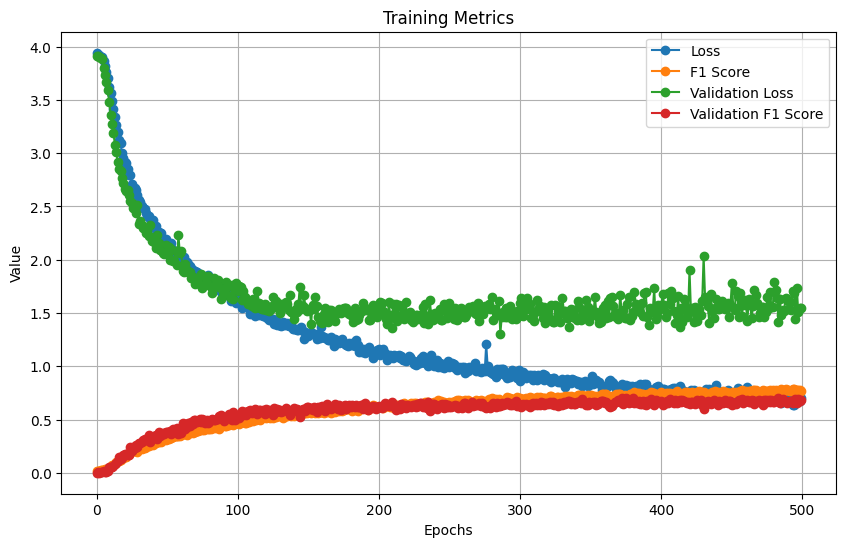

In [136]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [127]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 9ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.667     1.000     0.800         6
  BASKETBALL      0.889     0.800     0.842        10
         BEE      0.667     0.600     0.632        10
        BELT      0.667     1.000     0.800         4
        BITE      0.833     0.625     0.714         8
   BREAKFAST      0.429     0.500     0.462         6
      CANCER      1.000     0.875     0.933         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.429     0.500     0.462         6
      DECIDE      1.000     0.333     0.500         6
      DEMAND      1.000     0.500     0.667         8
     DEVELOP      0.625     0.833     0.714         6
      DINNER      1.000     0.250     0.400         8
         DOG      0.444     

In [126]:
reconstructed_model = tf.keras.models.load_model("3 1D CNN")

In [129]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 10ms/step - loss: 1.5136 - f1_score: 0.7012


[1.5136113166809082, 0.7011691927909851]

In [127]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 11ms/step - loss: 0.1096 - f1_score: 0.9866


[0.10961440950632095, 0.9866245985031128]

In [140]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 129, 150)          119850    
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 64, 150)          0         
 1D)                                                             
                                                                 
 conv1d_4 (Conv1D)           (None, 60, 75)            56325     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 30, 75)           0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 27, 50)            15050     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 50)          

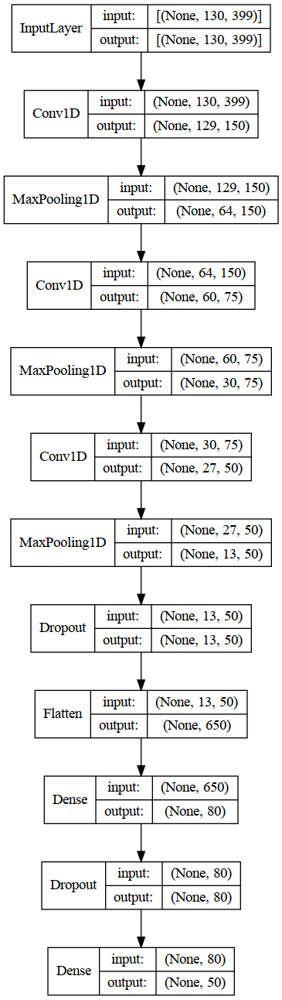

In [141]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [142]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 9ms/step
              precision    recall  f1-score   support

         AXE      0.875     0.875     0.875         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.875     0.700     0.778        10
        BELT      1.000     0.750     0.857         4
        BITE      0.833     0.625     0.714         8
   BREAKFAST      0.600     0.500     0.545         6
      CANCER      0.727     1.000     0.842         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.750     1.000     0.857         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.333     0.333     0.333         6
      DECIDE      1.000     0.333     0.500         6
      DEMAND      1.000     0.625     0.769         8
     DEVELOP      0.444     0.667     0.533         6
      DINNER      1.000     0.625     0.769         8
         DOG      0.714     

In [117]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='3 1D CNN Best Model Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [121]:
act_function=mish
model = Sequential()
model.add(Conv1D(filters=100,kernel_size=2,activation=act_function,input_shape=(130,399)))
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(filters=100,kernel_size=2,activation=act_function))
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(filters=50,kernel_size=2,activation=act_function))
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(.75))
model.add(Flatten())
model.add(Dense(units=90,activation=act_function))
model.add(Dropout(.5))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(0.001201687537647584),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 129, 100)          79900     
                                                                 
 max_pooling1d (MaxPooling1D  (None, 64, 100)          0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 63, 100)           20100     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 31, 100)          0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 30, 50)            10050     
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 15, 50)           0

2023-09-05 09:37:26.840128: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-05 09:37:26.841689: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1435 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


Epoch 1/500


2023-09-05 09:37:30.941558: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700
2023-09-05 09:37:31.174615: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 647.72MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-05 09:37:31.332985: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 637.06MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-05 09:37:31.389796: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f82b4f51ab0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-09-05 09:37:31.389832: I tensorflow/compiler/xla/service/service.cc:181]   

28/28 [==============================] - ETA: 0s - loss: 4.1749 - f1_score: 0.0254

2023-09-05 09:37:34.073061: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 609.04MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-05 09:37:34.150664: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 559.42MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


28/28 [==============================] - 6s 67ms/step - loss: 4.1749 - f1_score: 0.0254 - val_loss: 3.8890 - val_f1_score: 0.0282
Epoch 2/500
 3/28 [==>...........................] - ETA: 0s - loss: 3.9605 - f1_score: 0.0248

2023-09-05 09:37:34.755644: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 454.36MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


28/28 [==============================] - 1s 44ms/step - loss: 3.9281 - f1_score: 0.0316 - val_loss: 3.8232 - val_f1_score: 0.0419
Epoch 3/500
28/28 [==============================] - 1s 44ms/step - loss: 3.8301 - f1_score: 0.0429 - val_loss: 3.6723 - val_f1_score: 0.0716
Epoch 4/500
28/28 [==============================] - 1s 44ms/step - loss: 3.6782 - f1_score: 0.0652 - val_loss: 3.4443 - val_f1_score: 0.0950
Epoch 5/500
28/28 [==============================] - 1s 45ms/step - loss: 3.5035 - f1_score: 0.0823 - val_loss: 3.2606 - val_f1_score: 0.0997
Epoch 6/500
28/28 [==============================] - 1s 44ms/step - loss: 3.2884 - f1_score: 0.1159 - val_loss: 2.9966 - val_f1_score: 0.1319
Epoch 7/500
28/28 [==============================] - 1s 45ms/step - loss: 3.1070 - f1_score: 0.1389 - val_loss: 2.8160 - val_f1_score: 0.1986
Epoch 8/500
28/28 [==============================] - 1s 45ms/step - loss: 2.9299 - f1_score: 0.1679 - val_loss: 2.6509 - val_f1_score: 0.2106
Epoch 9/500
28/28 

28/28 [==============================] - 1s 45ms/step - loss: 0.4426 - f1_score: 0.8542 - val_loss: 1.6688 - val_f1_score: 0.6237
Epoch 117/500
28/28 [==============================] - 1s 46ms/step - loss: 0.3927 - f1_score: 0.8747 - val_loss: 1.7634 - val_f1_score: 0.6129
Epoch 118/500
28/28 [==============================] - 1s 46ms/step - loss: 0.3527 - f1_score: 0.8841 - val_loss: 1.8450 - val_f1_score: 0.5725
Epoch 119/500
28/28 [==============================] - 1s 46ms/step - loss: 0.3722 - f1_score: 0.8761 - val_loss: 1.8021 - val_f1_score: 0.5796
Epoch 120/500
28/28 [==============================] - 1s 47ms/step - loss: 0.3746 - f1_score: 0.8804 - val_loss: 1.7264 - val_f1_score: 0.5887
Epoch 121/500
28/28 [==============================] - 1s 49ms/step - loss: 0.4370 - f1_score: 0.8579 - val_loss: 1.8231 - val_f1_score: 0.6021
Epoch 122/500
28/28 [==============================] - 1s 51ms/step - loss: 0.4486 - f1_score: 0.8502 - val_loss: 1.8792 - val_f1_score: 0.5956
Epoch 

Epoch 173/500
28/28 [==============================] - 1s 50ms/step - loss: 0.3422 - f1_score: 0.8868 - val_loss: 1.9373 - val_f1_score: 0.6254
Epoch 174/500
28/28 [==============================] - 1s 49ms/step - loss: 0.3218 - f1_score: 0.8965 - val_loss: 1.7859 - val_f1_score: 0.6368
Epoch 175/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3032 - f1_score: 0.8972 - val_loss: 1.9740 - val_f1_score: 0.5935
Epoch 176/500
28/28 [==============================] - 1s 49ms/step - loss: 0.3206 - f1_score: 0.8941 - val_loss: 1.7175 - val_f1_score: 0.6107
Epoch 177/500
28/28 [==============================] - 1s 47ms/step - loss: 0.3138 - f1_score: 0.8959 - val_loss: 1.7602 - val_f1_score: 0.6353
Epoch 178/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3064 - f1_score: 0.8992 - val_loss: 1.9693 - val_f1_score: 0.5976
Epoch 179/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3206 - f1_score: 0.8890 - val_loss: 1.9911 - val_f1_score:

Epoch 230/500
28/28 [==============================] - 1s 47ms/step - loss: 0.2576 - f1_score: 0.9142 - val_loss: 2.2433 - val_f1_score: 0.6113
Epoch 231/500
28/28 [==============================] - 1s 47ms/step - loss: 0.2793 - f1_score: 0.9122 - val_loss: 2.1153 - val_f1_score: 0.6036
Epoch 232/500
28/28 [==============================] - 1s 48ms/step - loss: 0.2604 - f1_score: 0.9184 - val_loss: 2.0648 - val_f1_score: 0.5811
Epoch 233/500
28/28 [==============================] - 1s 51ms/step - loss: 0.3048 - f1_score: 0.9035 - val_loss: 2.2300 - val_f1_score: 0.5909
Epoch 234/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2450 - f1_score: 0.9218 - val_loss: 2.2522 - val_f1_score: 0.6165
Epoch 235/500
28/28 [==============================] - 1s 54ms/step - loss: 0.2805 - f1_score: 0.9107 - val_loss: 2.0226 - val_f1_score: 0.6029
Epoch 236/500
28/28 [==============================] - 1s 48ms/step - loss: 0.2800 - f1_score: 0.9083 - val_loss: 2.2455 - val_f1_score:

KeyboardInterrupt: 

In [124]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.833     0.833     0.833         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     0.900     0.947        10
        BELT      0.667     1.000     0.800         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.500     1.000     0.667         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.833     0.833     0.833         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.833     0.833     0.833         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.667     0.500     0.571         8
     DEVELOP      0.667     0.667     0.667         6
      DINNER      0.857     0.750     0.800         8
         DOG      1.000     

In [132]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '3 1D CNN Best Model Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [134]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.155195,0.947036,1.328380,0.838507
496,0.155427,0.952505,1.406129,0.835126
497,0.142101,0.952281,1.338851,0.838877
498,0.156837,0.948783,1.437312,0.840297
499,0.167788,0.947684,1.325376,0.799823


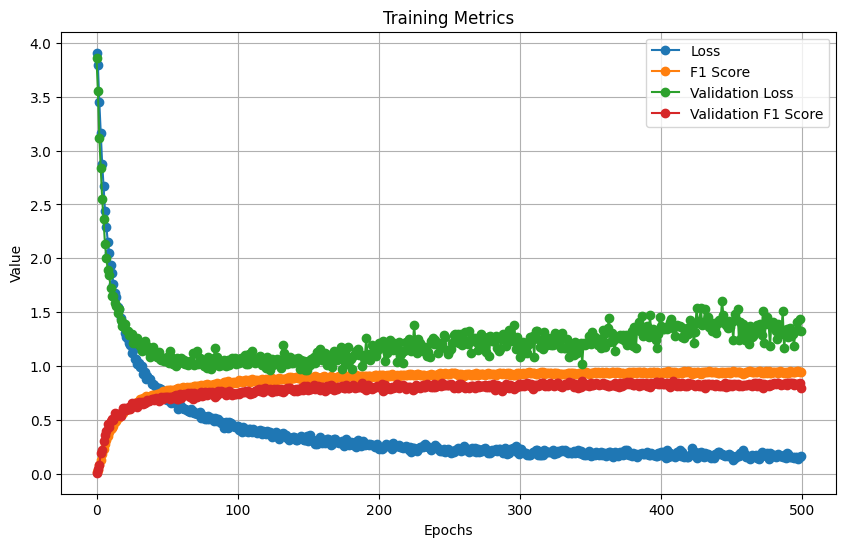

In [139]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [142]:
reconstructed_model = tf.keras.models.load_model("3 1D CNN Best Model Mish")

In [143]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 6ms/step - loss: 1.0245 - f1_score: 0.8603


[1.0245157480239868, 0.8603485226631165]

In [145]:
reconstructed_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 129, 150)          37950     
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 64, 150)          0         
 1D)                                                             
                                                                 
 conv1d_4 (Conv1D)           (None, 63, 150)           45150     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 31, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 30, 100)           30100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 15, 100)         

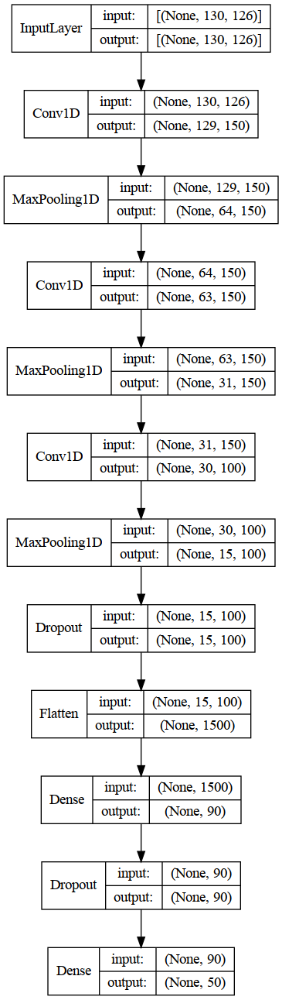

In [146]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [147]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 5ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      1.000     0.667     0.800         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      0.900     0.900     0.900        10
        BELT      0.800     1.000     0.889         4
        BITE      1.000     1.000     1.000         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.875     0.875     0.875         8
     DEVELOP      0.750     0.500     0.600         6
      DINNER      1.000     0.750     0.857         8
         DOG      0.857     

### 3 1D CNN Trial 718

In [141]:
best_model = tuner.get_best_models(num_models=3)[2]

In [144]:
best_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 16ms/step - loss: 0.3942 - f1_score: 0.9258


[0.39421790838241577, 0.9257767200469971]

In [143]:
best_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 16ms/step - loss: 1.2795 - f1_score: 0.6979


[1.2794995307922363, 0.6979272365570068]

In [122]:
bestHP = tuner.get_best_hyperparameters(num_trials=5)[4]

In [123]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='3 1D CNN Trial 718/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [ ]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...


2023-09-10 13:04:23.996707: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-10 13:04:24.077667: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1739 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


Epoch 1/500


2023-09-10 13:04:28.606047: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700
2023-09-10 13:04:29.090992: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f17fc0dfcd0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-09-10 13:04:29.091026: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce MX250, Compute Capability 6.1
2023-09-10 13:04:29.103007: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-09-10 13:04:29.274980: I tensorflow/compiler/jit/xla_compilation_cache.cc:476] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


28/28 [==============================] - ETA: 0s - loss: 5.2836 - f1_score: 0.0150

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 15s 368ms/step - loss: 5.2836 - f1_score: 0.0150 - val_loss: 5.0371 - val_f1_score: 0.0025
Epoch 2/500
28/28 [==============================] - ETA: 0s - loss: 4.8648 - f1_score: 0.0143

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 387ms/step - loss: 4.8648 - f1_score: 0.0143 - val_loss: 4.6771 - val_f1_score: 0.0042
Epoch 3/500
28/28 [==============================] - 2s 69ms/step - loss: 4.5628 - f1_score: 0.0117 - val_loss: 4.4294 - val_f1_score: 0.0015
Epoch 4/500
28/28 [==============================] - ETA: 0s - loss: 4.3544 - f1_score: 0.0128

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 351ms/step - loss: 4.3544 - f1_score: 0.0128 - val_loss: 4.2552 - val_f1_score: 0.0067
Epoch 5/500
28/28 [==============================] - ETA: 0s - loss: 4.2020 - f1_score: 0.0152

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 358ms/step - loss: 4.2020 - f1_score: 0.0152 - val_loss: 4.1037 - val_f1_score: 0.0106
Epoch 6/500
28/28 [==============================] - 2s 68ms/step - loss: 4.0046 - f1_score: 0.0206 - val_loss: 3.8806 - val_f1_score: 0.0096
Epoch 7/500
28/28 [==============================] - ETA: 0s - loss: 3.8008 - f1_score: 0.0261

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 411ms/step - loss: 3.8008 - f1_score: 0.0261 - val_loss: 3.6265 - val_f1_score: 0.0233
Epoch 8/500
28/28 [==============================] - 2s 67ms/step - loss: 3.6248 - f1_score: 0.0462 - val_loss: 3.4452 - val_f1_score: 0.0181
Epoch 9/500
28/28 [==============================] - ETA: 0s - loss: 3.4551 - f1_score: 0.0575

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 12s 448ms/step - loss: 3.4551 - f1_score: 0.0575 - val_loss: 3.2003 - val_f1_score: 0.0776
Epoch 10/500
28/28 [==============================] - ETA: 0s - loss: 3.2675 - f1_score: 0.0917

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 15s 540ms/step - loss: 3.2675 - f1_score: 0.0917 - val_loss: 3.0451 - val_f1_score: 0.0921
Epoch 11/500
28/28 [==============================] - ETA: 0s - loss: 3.0688 - f1_score: 0.1168

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 386ms/step - loss: 3.0688 - f1_score: 0.1168 - val_loss: 2.8517 - val_f1_score: 0.0936
Epoch 12/500
28/28 [==============================] - ETA: 0s - loss: 2.9275 - f1_score: 0.1382

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 400ms/step - loss: 2.9275 - f1_score: 0.1382 - val_loss: 2.7052 - val_f1_score: 0.1641
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 2.7647 - f1_score: 0.1838

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 368ms/step - loss: 2.7647 - f1_score: 0.1838 - val_loss: 2.5739 - val_f1_score: 0.2067
Epoch 14/500
28/28 [==============================] - 2s 68ms/step - loss: 2.6785 - f1_score: 0.1995 - val_loss: 2.5813 - val_f1_score: 0.1805
Epoch 15/500
28/28 [==============================] - ETA: 0s - loss: 2.5785 - f1_score: 0.2207

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 358ms/step - loss: 2.5785 - f1_score: 0.2207 - val_loss: 2.4367 - val_f1_score: 0.2392
Epoch 16/500
28/28 [==============================] - ETA: 0s - loss: 2.4935 - f1_score: 0.2470

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 406ms/step - loss: 2.4935 - f1_score: 0.2470 - val_loss: 2.3476 - val_f1_score: 0.2451
Epoch 17/500
28/28 [==============================] - ETA: 0s - loss: 2.3948 - f1_score: 0.2870

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 351ms/step - loss: 2.3948 - f1_score: 0.2870 - val_loss: 2.2957 - val_f1_score: 0.3103
Epoch 18/500
28/28 [==============================] - 2s 67ms/step - loss: 2.3174 - f1_score: 0.2921 - val_loss: 2.3014 - val_f1_score: 0.2595
Epoch 19/500
28/28 [==============================] - 2s 67ms/step - loss: 2.2417 - f1_score: 0.3213 - val_loss: 2.1731 - val_f1_score: 0.2879
Epoch 20/500
28/28 [==============================] - ETA: 0s - loss: 2.1762 - f1_score: 0.3401

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 388ms/step - loss: 2.1762 - f1_score: 0.3401 - val_loss: 2.2095 - val_f1_score: 0.3218
Epoch 21/500
28/28 [==============================] - ETA: 0s - loss: 2.1731 - f1_score: 0.3457

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 369ms/step - loss: 2.1731 - f1_score: 0.3457 - val_loss: 2.1077 - val_f1_score: 0.3815
Epoch 22/500
28/28 [==============================] - ETA: 0s - loss: 2.0744 - f1_score: 0.3785

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 378ms/step - loss: 2.0744 - f1_score: 0.3785 - val_loss: 2.0486 - val_f1_score: 0.3959
Epoch 23/500
28/28 [==============================] - 2s 68ms/step - loss: 2.0336 - f1_score: 0.3870 - val_loss: 2.0026 - val_f1_score: 0.3657
Epoch 24/500
28/28 [==============================] - 2s 69ms/step - loss: 1.9819 - f1_score: 0.3976 - val_loss: 2.0273 - val_f1_score: 0.3728
Epoch 25/500
28/28 [==============================] - 2s 70ms/step - loss: 1.9123 - f1_score: 0.4256 - val_loss: 1.9590 - val_f1_score: 0.3883
Epoch 26/500
28/28 [==============================] - ETA: 0s - loss: 1.8762 - f1_score: 0.4224

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 421ms/step - loss: 1.8762 - f1_score: 0.4224 - val_loss: 1.9257 - val_f1_score: 0.3992
Epoch 27/500
28/28 [==============================] - ETA: 0s - loss: 1.8250 - f1_score: 0.4491

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 9s 339ms/step - loss: 1.8250 - f1_score: 0.4491 - val_loss: 1.9674 - val_f1_score: 0.4065
Epoch 28/500
28/28 [==============================] - ETA: 0s - loss: 1.7821 - f1_score: 0.4618

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 386ms/step - loss: 1.7821 - f1_score: 0.4618 - val_loss: 1.9010 - val_f1_score: 0.4567
Epoch 29/500
28/28 [==============================] - ETA: 0s - loss: 1.7636 - f1_score: 0.4623

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 362ms/step - loss: 1.7636 - f1_score: 0.4623 - val_loss: 1.7959 - val_f1_score: 0.4632
Epoch 30/500
28/28 [==============================] - ETA: 0s - loss: 1.6825 - f1_score: 0.5030

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 362ms/step - loss: 1.6825 - f1_score: 0.5030 - val_loss: 1.7834 - val_f1_score: 0.4745
Epoch 31/500
28/28 [==============================] - 2s 69ms/step - loss: 1.6927 - f1_score: 0.4910 - val_loss: 1.7744 - val_f1_score: 0.4637
Epoch 32/500
28/28 [==============================] - 2s 68ms/step - loss: 1.6450 - f1_score: 0.4982 - val_loss: 1.7320 - val_f1_score: 0.4728
Epoch 33/500
28/28 [==============================] - 2s 69ms/step - loss: 1.5899 - f1_score: 0.5254 - val_loss: 1.7247 - val_f1_score: 0.4478
Epoch 34/500
28/28 [==============================] - ETA: 0s - loss: 1.5515 - f1_score: 0.5241

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 412ms/step - loss: 1.5515 - f1_score: 0.5241 - val_loss: 1.6721 - val_f1_score: 0.4884
Epoch 35/500
28/28 [==============================] - 2s 68ms/step - loss: 1.5152 - f1_score: 0.5526 - val_loss: 1.6957 - val_f1_score: 0.4858
Epoch 36/500
28/28 [==============================] - ETA: 0s - loss: 1.5181 - f1_score: 0.5259

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 357ms/step - loss: 1.5181 - f1_score: 0.5259 - val_loss: 1.6596 - val_f1_score: 0.5077
Epoch 37/500
28/28 [==============================] - 2s 69ms/step - loss: 1.4489 - f1_score: 0.5742 - val_loss: 1.6797 - val_f1_score: 0.4878
Epoch 38/500
28/28 [==============================] - ETA: 0s - loss: 1.4599 - f1_score: 0.5489

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 387ms/step - loss: 1.4599 - f1_score: 0.5489 - val_loss: 1.6088 - val_f1_score: 0.5347
Epoch 39/500
28/28 [==============================] - 2s 68ms/step - loss: 1.4091 - f1_score: 0.5788 - val_loss: 1.5717 - val_f1_score: 0.5021
Epoch 40/500
28/28 [==============================] - ETA: 0s - loss: 1.3835 - f1_score: 0.5893

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 9s 336ms/step - loss: 1.3835 - f1_score: 0.5893 - val_loss: 1.5747 - val_f1_score: 0.5364
Epoch 41/500
28/28 [==============================] - 2s 67ms/step - loss: 1.3563 - f1_score: 0.5884 - val_loss: 1.5438 - val_f1_score: 0.5283
Epoch 42/500
28/28 [==============================] - 2s 67ms/step - loss: 1.3517 - f1_score: 0.5913 - val_loss: 1.5571 - val_f1_score: 0.5293
Epoch 43/500
28/28 [==============================] - 2s 68ms/step - loss: 1.3283 - f1_score: 0.5937 - val_loss: 1.5341 - val_f1_score: 0.5212
Epoch 44/500
28/28 [==============================] - 2s 68ms/step - loss: 1.3083 - f1_score: 0.6100 - val_loss: 1.5675 - val_f1_score: 0.5292
Epoch 45/500
28/28 [==============================] - 2s 68ms/step - loss: 1.2537 - f1_score: 0.6219 - val_loss: 1.5582 - val_f1_score: 0.5315
Epoch 46/500
28/28 [==============================] - ETA: 0s - loss: 1.2185 - f1_score: 0.6450

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 9s 334ms/step - loss: 1.2185 - f1_score: 0.6450 - val_loss: 1.4733 - val_f1_score: 0.5429
Epoch 47/500
28/28 [==============================] - 2s 68ms/step - loss: 1.2516 - f1_score: 0.6291 - val_loss: 1.5292 - val_f1_score: 0.5098
Epoch 48/500
28/28 [==============================] - ETA: 0s - loss: 1.2080 - f1_score: 0.6390

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 12s 429ms/step - loss: 1.2080 - f1_score: 0.6390 - val_loss: 1.4837 - val_f1_score: 0.5522
Epoch 49/500
28/28 [==============================] - ETA: 0s - loss: 1.1803 - f1_score: 0.6449

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 353ms/step - loss: 1.1803 - f1_score: 0.6449 - val_loss: 1.4835 - val_f1_score: 0.5746
Epoch 50/500
28/28 [==============================] - 2s 69ms/step - loss: 1.1945 - f1_score: 0.6353 - val_loss: 1.4906 - val_f1_score: 0.5482
Epoch 51/500
28/28 [==============================] - 2s 73ms/step - loss: 1.1753 - f1_score: 0.6548 - val_loss: 1.5185 - val_f1_score: 0.5700
Epoch 52/500
28/28 [==============================] - 2s 69ms/step - loss: 1.1483 - f1_score: 0.6564 - val_loss: 1.5045 - val_f1_score: 0.5482
Epoch 53/500
28/28 [==============================] - 2s 69ms/step - loss: 1.1214 - f1_score: 0.6772 - val_loss: 1.4580 - val_f1_score: 0.5728
Epoch 54/500
28/28 [==============================] - 2s 68ms/step - loss: 1.0848 - f1_score: 0.6847 - val_loss: 1.4876 - val_f1_score: 0.5584
Epoch 55/500
28/28 [==============================] - 2s 71ms/step - loss: 1.0479 - f1_score: 0.6926 - val_loss: 1.4706 - val_f1_score: 0.5534
Epoch 56/5

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 406ms/step - loss: 1.1123 - f1_score: 0.6783 - val_loss: 1.4188 - val_f1_score: 0.6034
Epoch 57/500
28/28 [==============================] - 2s 68ms/step - loss: 1.0543 - f1_score: 0.6906 - val_loss: 1.4405 - val_f1_score: 0.5800
Epoch 58/500
28/28 [==============================] - 2s 68ms/step - loss: 1.0300 - f1_score: 0.6921 - val_loss: 1.4731 - val_f1_score: 0.5542
Epoch 59/500
28/28 [==============================] - 2s 68ms/step - loss: 1.0529 - f1_score: 0.6910 - val_loss: 1.4640 - val_f1_score: 0.5674
Epoch 60/500
28/28 [==============================] - 2s 67ms/step - loss: 1.0226 - f1_score: 0.6924 - val_loss: 1.4454 - val_f1_score: 0.5964
Epoch 61/500
28/28 [==============================] - 2s 68ms/step - loss: 0.9907 - f1_score: 0.6993 - val_loss: 1.4754 - val_f1_score: 0.5523
Epoch 62/500
28/28 [==============================] - 2s 71ms/step - loss: 0.9746 - f1_score: 0.7176 - val_loss: 1.3721 - val_f1_score: 0.5887
Epoch 63/5

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 391ms/step - loss: 0.8814 - f1_score: 0.7440 - val_loss: 1.3945 - val_f1_score: 0.6129
Epoch 72/500
28/28 [==============================] - 2s 69ms/step - loss: 0.8802 - f1_score: 0.7452 - val_loss: 1.4403 - val_f1_score: 0.5854
Epoch 73/500
28/28 [==============================] - 2s 68ms/step - loss: 0.8735 - f1_score: 0.7452 - val_loss: 1.4276 - val_f1_score: 0.5821
Epoch 74/500
28/28 [==============================] - 2s 69ms/step - loss: 0.8278 - f1_score: 0.7617 - val_loss: 1.4465 - val_f1_score: 0.6031
Epoch 75/500
28/28 [==============================] - ETA: 0s - loss: 0.8550 - f1_score: 0.7513

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 375ms/step - loss: 0.8550 - f1_score: 0.7513 - val_loss: 1.4364 - val_f1_score: 0.6268
Epoch 76/500
28/28 [==============================] - 2s 68ms/step - loss: 0.8259 - f1_score: 0.7597 - val_loss: 1.4185 - val_f1_score: 0.5884
Epoch 77/500
28/28 [==============================] - 2s 68ms/step - loss: 0.8146 - f1_score: 0.7649 - val_loss: 1.3777 - val_f1_score: 0.6154
Epoch 78/500
28/28 [==============================] - 2s 69ms/step - loss: 0.8123 - f1_score: 0.7526 - val_loss: 1.4304 - val_f1_score: 0.5774
Epoch 79/500
28/28 [==============================] - 2s 68ms/step - loss: 0.7522 - f1_score: 0.7829 - val_loss: 1.3544 - val_f1_score: 0.6213
Epoch 80/500
28/28 [==============================] - 2s 68ms/step - loss: 0.7536 - f1_score: 0.7778 - val_loss: 1.4568 - val_f1_score: 0.6053
Epoch 81/500
28/28 [==============================] - 2s 69ms/step - loss: 0.7781 - f1_score: 0.7824 - val_loss: 1.3840 - val_f1_score: 0.6167
Epoch 82/5

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 416ms/step - loss: 0.7847 - f1_score: 0.7653 - val_loss: 1.3876 - val_f1_score: 0.6309
Epoch 83/500
28/28 [==============================] - 2s 68ms/step - loss: 0.7572 - f1_score: 0.7837 - val_loss: 1.5002 - val_f1_score: 0.5821
Epoch 84/500
28/28 [==============================] - ETA: 0s - loss: 0.7512 - f1_score: 0.7873

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 381ms/step - loss: 0.7512 - f1_score: 0.7873 - val_loss: 1.3230 - val_f1_score: 0.6517
Epoch 85/500
28/28 [==============================] - 2s 68ms/step - loss: 0.7477 - f1_score: 0.7815 - val_loss: 1.3898 - val_f1_score: 0.6220
Epoch 86/500
28/28 [==============================] - 2s 68ms/step - loss: 0.7252 - f1_score: 0.7917 - val_loss: 1.3825 - val_f1_score: 0.6029
Epoch 87/500
28/28 [==============================] - 2s 70ms/step - loss: 0.7443 - f1_score: 0.7869 - val_loss: 1.3546 - val_f1_score: 0.6199
Epoch 88/500
28/28 [==============================] - 2s 69ms/step - loss: 0.7218 - f1_score: 0.7953 - val_loss: 1.4630 - val_f1_score: 0.5902
Epoch 89/500
28/28 [==============================] - 2s 69ms/step - loss: 0.6976 - f1_score: 0.8054 - val_loss: 1.3544 - val_f1_score: 0.6109
Epoch 90/500
28/28 [==============================] - 2s 68ms/step - loss: 0.7333 - f1_score: 0.7865 - val_loss: 1.4211 - val_f1_score: 0.5942
Epoch 91/5

28/28 [==============================] - 2s 72ms/step - loss: 0.4601 - f1_score: 0.8797 - val_loss: 1.4738 - val_f1_score: 0.6179
Epoch 142/500
28/28 [==============================] - 2s 73ms/step - loss: 0.4441 - f1_score: 0.8903 - val_loss: 1.5704 - val_f1_score: 0.6000
Epoch 143/500
28/28 [==============================] - 2s 72ms/step - loss: 0.4540 - f1_score: 0.8802 - val_loss: 1.4812 - val_f1_score: 0.6221
Epoch 144/500
28/28 [==============================] - 2s 72ms/step - loss: 0.4521 - f1_score: 0.8863 - val_loss: 1.4891 - val_f1_score: 0.6138
Epoch 145/500
28/28 [==============================] - 2s 72ms/step - loss: 0.4256 - f1_score: 0.8879 - val_loss: 1.6717 - val_f1_score: 0.5841
Epoch 146/500
28/28 [==============================] - 2s 77ms/step - loss: 0.4326 - f1_score: 0.8873 - val_loss: 1.5077 - val_f1_score: 0.6431
Epoch 147/500
28/28 [==============================] - 2s 74ms/step - loss: 0.4267 - f1_score: 0.9020 - val_loss: 1.5826 - val_f1_score: 0.6148
Epoch 

Epoch 198/500
28/28 [==============================] - 2s 78ms/step - loss: 0.3011 - f1_score: 0.9289 - val_loss: 1.8273 - val_f1_score: 0.5704
Epoch 199/500
28/28 [==============================] - 2s 75ms/step - loss: 0.3060 - f1_score: 0.9279 - val_loss: 1.9246 - val_f1_score: 0.5607
Epoch 200/500
28/28 [==============================] - 2s 75ms/step - loss: 0.3136 - f1_score: 0.9236 - val_loss: 1.6233 - val_f1_score: 0.6105
Epoch 201/500
28/28 [==============================] - 2s 75ms/step - loss: 0.3484 - f1_score: 0.9186 - val_loss: 1.7062 - val_f1_score: 0.6057
Epoch 202/500
28/28 [==============================] - 2s 75ms/step - loss: 0.3105 - f1_score: 0.9279 - val_loss: 1.6803 - val_f1_score: 0.6162
Epoch 203/500
28/28 [==============================] - 2s 77ms/step - loss: 0.3341 - f1_score: 0.9230 - val_loss: 1.6871 - val_f1_score: 0.5837
Epoch 204/500
28/28 [==============================] - 2s 75ms/step - loss: 0.3158 - f1_score: 0.9244 - val_loss: 1.7997 - val_f1_score:

In [126]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 13ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.600     1.000     0.750         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.545     0.600     0.571        10
        BELT      0.800     1.000     0.889         4
        BITE      0.571     0.500     0.533         8
   BREAKFAST      0.250     0.167     0.200         6
      CANCER      0.857     0.750     0.800         8
   CHRISTMAS      0.833     0.833     0.833         6
    CONFUSED      1.000     0.333     0.500         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.200     0.333     0.250         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.600     0.750     0.667         8
     DEVELOP      0.400     0.333     0.364         6
      DINNER      0.429     0.375     0.400         8
         DOG      0.500    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [127]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '3 1D CNN Trial 718/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [128]:
hist_df = pd.read_csv('3 1D CNN Trial 718/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.154860,0.970505,1.946998,0.609396
496,0.165134,0.965833,1.872153,0.634007
497,0.148198,0.972232,2.007385,0.602753
498,0.160102,0.973524,2.000992,0.606234
499,0.172569,0.962323,1.925245,0.601090


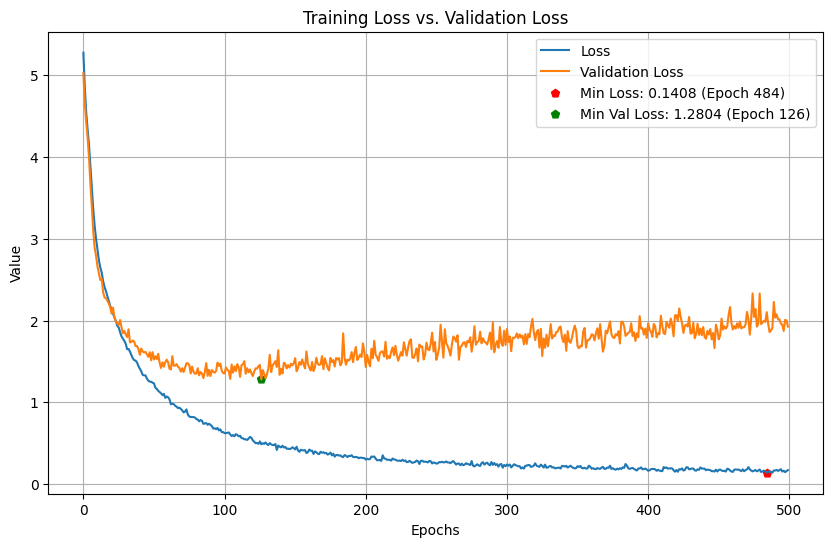

In [129]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

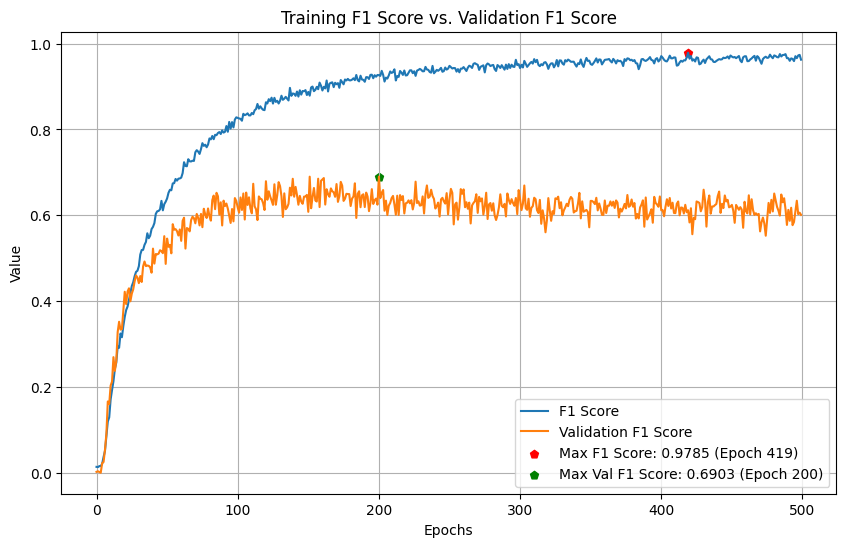

In [130]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [131]:
reconstructed_model = tf.keras.models.load_model("3 1D CNN Trial 718")

In [132]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 126, 175)          349300    
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 8, 175)           0         
 1D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 8, 175)            0         
                                                                 
 lstm_1 (LSTM)               (None, 200)               300800    
                                                                 
 dropout_3 (Dropout)         (None, 200)               0         
                                                                 
 dense_2 (Dense)             (None, 70)                14070     
                                                      

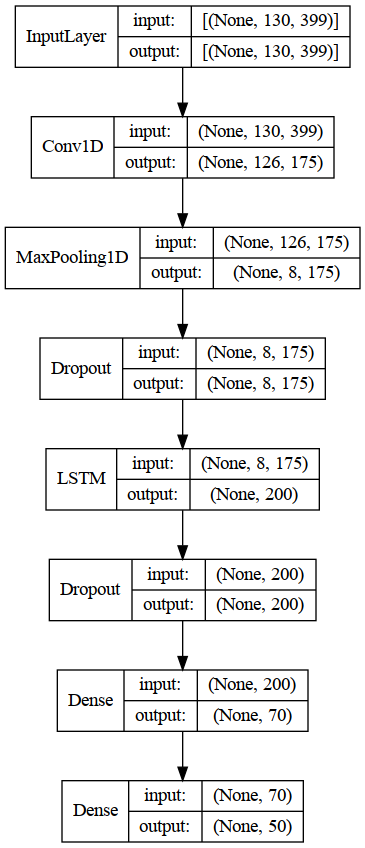

In [133]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

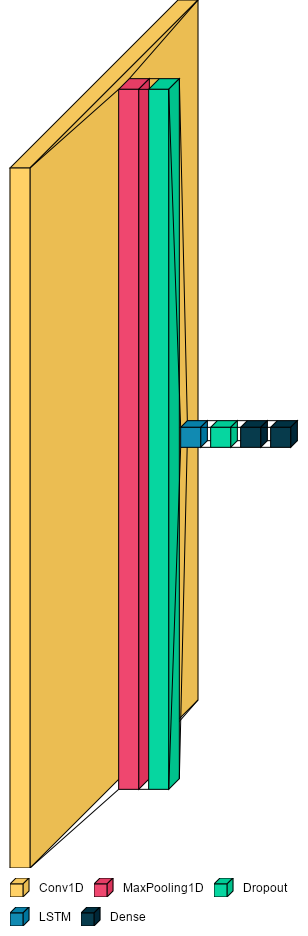

In [134]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [135]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 12ms/step - loss: 1.4317 - f1_score: 0.6903


[1.4316924810409546, 0.6902759075164795]

In [139]:
reconstructed_model.evaluate(Xtrain,Ytrain, batch_size=96)

28/28 [==============================] - 1s 28ms/step - loss: 0.1189 - f1_score: 0.9983


[0.11893798410892487, 0.9983316659927368]

In [145]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 10ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.600     1.000     0.750         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.385     0.500     0.435        10
        BELT      1.000     1.000     1.000         4
        BITE      0.667     0.750     0.706         8
   BREAKFAST      0.500     0.500     0.500         6
      CANCER      0.667     1.000     0.800         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.571     0.667     0.615         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.667     0.333     0.444         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      1.000     0.375     0.545         8
     DEVELOP      0.200     0.333     0.250         6
      DINNER      0.727     1.000     0.842         8
         DOG      1.000    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [142]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='3 1D CNN Trial 718/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [143]:
act_function = mish
model = Sequential()
model.add(Conv1D(filters=150,kernel_size=5,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=3))
model.add(Conv1D(filters=100,kernel_size=4,activation=act_function))
model.add(MaxPooling1D(pool_size=3))
model.add(Dropout(.45))
model.add(GRU(units=150,return_sequences=False,kernel_regularizer=regularizers.l2(.00042286793942433336)))
model.add(Dropout(.8))
model.add(Dense(units=80,activation=act_function))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.0019929796667454143),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 16s 393ms/step - loss: 3.9667 - f1_score: 0.0172 - val_loss: 3.8607 - val_f1_score: 0.0141
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.7361 - f1_score: 0.0426

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 302ms/step - loss: 3.7312 - f1_score: 0.0433 - val_loss: 3.3516 - val_f1_score: 0.0401
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3184 - f1_score: 0.0804

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 316ms/step - loss: 3.3134 - f1_score: 0.0802 - val_loss: 2.9673 - val_f1_score: 0.1203
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9599 - f1_score: 0.1299

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 287ms/step - loss: 2.9603 - f1_score: 0.1299 - val_loss: 2.5864 - val_f1_score: 0.1928
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6673 - f1_score: 0.1869

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 353ms/step - loss: 2.6639 - f1_score: 0.1888 - val_loss: 2.4057 - val_f1_score: 0.2342
Epoch 6/500
28/28 [==============================] - 1s 38ms/step - loss: 2.4485 - f1_score: 0.2398 - val_loss: 2.4523 - val_f1_score: 0.2228
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2810 - f1_score: 0.2762

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 365ms/step - loss: 2.2877 - f1_score: 0.2757 - val_loss: 2.1469 - val_f1_score: 0.3372
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1416 - f1_score: 0.3087

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 278ms/step - loss: 2.1425 - f1_score: 0.3100 - val_loss: 2.0119 - val_f1_score: 0.3734
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0281 - f1_score: 0.3592

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 2.0177 - f1_score: 0.3637 - val_loss: 1.8961 - val_f1_score: 0.4063
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9076 - f1_score: 0.3781

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 299ms/step - loss: 1.9047 - f1_score: 0.3801 - val_loss: 1.8452 - val_f1_score: 0.4213
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7888 - f1_score: 0.4269

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 296ms/step - loss: 1.7919 - f1_score: 0.4251 - val_loss: 1.7583 - val_f1_score: 0.4348
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6956 - f1_score: 0.4384

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 1.6909 - f1_score: 0.4396 - val_loss: 1.7644 - val_f1_score: 0.4443
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6276 - f1_score: 0.4761

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.6308 - f1_score: 0.4757 - val_loss: 1.8618 - val_f1_score: 0.4454
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5693 - f1_score: 0.4970

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 305ms/step - loss: 1.5655 - f1_score: 0.4973 - val_loss: 1.6262 - val_f1_score: 0.5272
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4783 - f1_score: 0.5471

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 1.4755 - f1_score: 0.5462 - val_loss: 1.5496 - val_f1_score: 0.5610
Epoch 16/500
28/28 [==============================] - 1s 38ms/step - loss: 1.4444 - f1_score: 0.5465 - val_loss: 1.4769 - val_f1_score: 0.5580
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3217 - f1_score: 0.5702

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 304ms/step - loss: 1.3279 - f1_score: 0.5694 - val_loss: 1.5161 - val_f1_score: 0.5745
Epoch 18/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2945 - f1_score: 0.5831

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 310ms/step - loss: 1.2985 - f1_score: 0.5821 - val_loss: 1.5370 - val_f1_score: 0.6069
Epoch 19/500
28/28 [==============================] - 1s 38ms/step - loss: 1.2852 - f1_score: 0.5878 - val_loss: 1.4281 - val_f1_score: 0.6045
Epoch 20/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2173 - f1_score: 0.6180

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 283ms/step - loss: 1.2179 - f1_score: 0.6184 - val_loss: 1.3851 - val_f1_score: 0.6276
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2130 - f1_score: 0.6124

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 282ms/step - loss: 1.2190 - f1_score: 0.6137 - val_loss: 1.2672 - val_f1_score: 0.6686
Epoch 22/500
28/28 [==============================] - 1s 38ms/step - loss: 1.1470 - f1_score: 0.6439 - val_loss: 1.3689 - val_f1_score: 0.6425
Epoch 23/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0645 - f1_score: 0.6726 - val_loss: 1.4077 - val_f1_score: 0.6420
Epoch 24/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0290 - f1_score: 0.6716 - val_loss: 1.4038 - val_f1_score: 0.6378
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0354 - f1_score: 0.6777

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.0409 - f1_score: 0.6763 - val_loss: 1.3490 - val_f1_score: 0.7047
Epoch 26/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0103 - f1_score: 0.6855 - val_loss: 1.3758 - val_f1_score: 0.6790
Epoch 27/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9848 - f1_score: 0.6917 - val_loss: 1.4690 - val_f1_score: 0.6577
Epoch 28/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9359 - f1_score: 0.7218 - val_loss: 1.2835 - val_f1_score: 0.6766
Epoch 29/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8999 - f1_score: 0.7260 - val_loss: 1.2871 - val_f1_score: 0.6809
Epoch 30/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8965 - f1_score: 0.7249 - val_loss: 1.2039 - val_f1_score: 0.6934
Epoch 31/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9033 - f1_score: 0.7138 - val_loss: 1.4615 - val_f1_score: 0.6660
Epoch 32/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 284ms/step - loss: 0.8174 - f1_score: 0.7546 - val_loss: 1.2110 - val_f1_score: 0.7237
Epoch 35/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8303 - f1_score: 0.7514 - val_loss: 1.2921 - val_f1_score: 0.7181
Epoch 36/500
28/28 [==============================] - 1s 40ms/step - loss: 0.8294 - f1_score: 0.7597 - val_loss: 1.2224 - val_f1_score: 0.7006
Epoch 37/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8137 - f1_score: 0.7575

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 315ms/step - loss: 0.8050 - f1_score: 0.7603 - val_loss: 1.2252 - val_f1_score: 0.7297
Epoch 38/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7157 - f1_score: 0.7861 - val_loss: 1.3177 - val_f1_score: 0.6965
Epoch 39/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7033 - f1_score: 0.7997 - val_loss: 1.2801 - val_f1_score: 0.6963
Epoch 40/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7124 - f1_score: 0.7809 - val_loss: 1.2912 - val_f1_score: 0.7022
Epoch 41/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7062 - f1_score: 0.7906

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 290ms/step - loss: 0.7047 - f1_score: 0.7913 - val_loss: 1.2573 - val_f1_score: 0.7314
Epoch 42/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6807 - f1_score: 0.7985 - val_loss: 1.3909 - val_f1_score: 0.6925
Epoch 43/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6624 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 314ms/step - loss: 0.6617 - f1_score: 0.8074 - val_loss: 1.3076 - val_f1_score: 0.7417
Epoch 44/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6426 - f1_score: 0.8186 - val_loss: 1.2638 - val_f1_score: 0.7152
Epoch 45/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6595 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 320ms/step - loss: 0.6617 - f1_score: 0.8073 - val_loss: 1.1966 - val_f1_score: 0.7534
Epoch 46/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6622 - f1_score: 0.8199 - val_loss: 1.3031 - val_f1_score: 0.7242
Epoch 47/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6536 - f1_score: 0.8083

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 303ms/step - loss: 0.6538 - f1_score: 0.8080 - val_loss: 1.2127 - val_f1_score: 0.7642
Epoch 48/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6251 - f1_score: 0.8191

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 340ms/step - loss: 0.6254 - f1_score: 0.8205 - val_loss: 1.1647 - val_f1_score: 0.7687
Epoch 49/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5900 - f1_score: 0.8253 - val_loss: 1.1282 - val_f1_score: 0.7619
Epoch 50/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5942 - f1_score: 0.8320 - val_loss: 1.3222 - val_f1_score: 0.7546
Epoch 51/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5728 - f1_score: 0.8395 - val_loss: 1.2784 - val_f1_score: 0.7537
Epoch 52/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5521 - f1_score: 0.8477 - val_loss: 1.2723 - val_f1_score: 0.7475
Epoch 53/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5369 - f1_score: 0.8532 - val_loss: 1.4468 - val_f1_score: 0.7328
Epoch 54/500
28/28 [==============================] - 1s 40ms/step - loss: 0.5949 - f1_score: 0.8333 - val_loss: 1.5265 - val_f1_score: 0.7164
Epoch 55/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 307ms/step - loss: 0.5069 - f1_score: 0.8696 - val_loss: 1.2423 - val_f1_score: 0.7856
Epoch 63/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4884 - f1_score: 0.8732 - val_loss: 1.3165 - val_f1_score: 0.7761
Epoch 64/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4702 - f1_score: 0.8757 - val_loss: 1.4028 - val_f1_score: 0.7699
Epoch 65/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5113 - f1_score: 0.8732 - val_loss: 1.2855 - val_f1_score: 0.7503
Epoch 66/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5086 - f1_score: 0.8696 - val_loss: 1.3848 - val_f1_score: 0.7590
Epoch 67/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4775 - f1_score: 0.8754 - val_loss: 1.3450 - val_f1_score: 0.7756
Epoch 68/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4754 - f1_score: 0.8743 - val_loss: 1.3393 - val_f1_score: 0.7716
Epoch 69/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 277ms/step - loss: 0.4828 - f1_score: 0.8730 - val_loss: 1.2616 - val_f1_score: 0.7975
Epoch 71/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4476 - f1_score: 0.8826 - val_loss: 1.3496 - val_f1_score: 0.7769
Epoch 72/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4624 - f1_score: 0.8811 - val_loss: 1.4625 - val_f1_score: 0.7400
Epoch 73/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4539 - f1_score: 0.8810 - val_loss: 1.4245 - val_f1_score: 0.7796
Epoch 74/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3916 - f1_score: 0.8947 - val_loss: 1.4351 - val_f1_score: 0.7735
Epoch 75/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4319 - f1_score: 0.8911

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 354ms/step - loss: 0.4295 - f1_score: 0.8918 - val_loss: 1.2109 - val_f1_score: 0.8030
Epoch 76/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4448 - f1_score: 0.8869 - val_loss: 1.3074 - val_f1_score: 0.7850
Epoch 77/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4289 - f1_score: 0.8902 - val_loss: 1.2743 - val_f1_score: 0.7701
Epoch 78/500
28/28 [==============================] - 1s 40ms/step - loss: 0.4196 - f1_score: 0.8935 - val_loss: 1.4083 - val_f1_score: 0.7783
Epoch 79/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4741 - f1_score: 0.8807 - val_loss: 1.3937 - val_f1_score: 0.7936
Epoch 80/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4693 - f1_score: 0.8827 - val_loss: 1.3758 - val_f1_score: 0.7986
Epoch 81/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4861 - f1_score: 0.8691 - val_loss: 1.3154 - val_f1_score: 0.7725
Epoch 82/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 0.4051 - f1_score: 0.9021 - val_loss: 1.2125 - val_f1_score: 0.8054
Epoch 85/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4367 - f1_score: 0.8896

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.4366 - f1_score: 0.8888 - val_loss: 1.2861 - val_f1_score: 0.8080
Epoch 86/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4541 - f1_score: 0.8931 - val_loss: 1.4048 - val_f1_score: 0.7896
Epoch 87/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4424 - f1_score: 0.8865 - val_loss: 1.2911 - val_f1_score: 0.7939
Epoch 88/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4577 - f1_score: 0.8921 - val_loss: 1.4341 - val_f1_score: 0.7795
Epoch 89/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4323 - f1_score: 0.8912 - val_loss: 1.4458 - val_f1_score: 0.7512
Epoch 90/500
28/28 [==============================] - 1s 38ms/step - loss: 0.3862 - f1_score: 0.9046 - val_loss: 1.4521 - val_f1_score: 0.7835
Epoch 91/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4301 - f1_score: 0.8951 - val_loss: 1.3661 - val_f1_score: 0.7832
Epoch 92/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.4018 - f1_score: 0.9080 - val_loss: 1.4065 - val_f1_score: 0.8127
Epoch 111/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3813 - f1_score: 0.9143 - val_loss: 1.4458 - val_f1_score: 0.7976
Epoch 112/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3979 - f1_score: 0.9090 - val_loss: 1.5291 - val_f1_score: 0.7805
Epoch 113/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3954 - f1_score: 0.9087 - val_loss: 1.4778 - val_f1_score: 0.7706
Epoch 114/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3852 - f1_score: 0.9093 - val_loss: 1.5232 - val_f1_score: 0.7886
Epoch 115/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4268 - f1_score: 0.8951 - val_loss: 1.3973 - val_f1_score: 0.8067
Epoch 116/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3486 - f1_score: 0.9218 - val_loss: 1.2990 - val_f1_score: 0.8106
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.3205 - f1_score: 0.9379 - val_loss: 1.2689 - val_f1_score: 0.8406
Epoch 144/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3410 - f1_score: 0.9286 - val_loss: 1.4219 - val_f1_score: 0.7808
Epoch 145/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3155 - f1_score: 0.9325 - val_loss: 1.3326 - val_f1_score: 0.7909
Epoch 146/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2974 - f1_score: 0.9390 - val_loss: 1.3369 - val_f1_score: 0.8048
Epoch 147/500
28/28 [==============================] - 1s 42ms/step - loss: 0.3200 - f1_score: 0.9370 - val_loss: 1.3570 - val_f1_score: 0.8323
Epoch 148/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3099 - f1_score: 0.9325 - val_loss: 1.3147 - val_f1_score: 0.7869
Epoch 149/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3270 - f1_score: 0.9264 - val_loss: 1.2507 - val_f1_score: 0.8189
Epoch

Epoch 200/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3563 - f1_score: 0.9280 - val_loss: 1.3826 - val_f1_score: 0.8211
Epoch 201/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3084 - f1_score: 0.9374 - val_loss: 1.4495 - val_f1_score: 0.8218
Epoch 202/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3116 - f1_score: 0.9363 - val_loss: 1.4158 - val_f1_score: 0.8383
Epoch 203/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2682 - f1_score: 0.9444 - val_loss: 1.3949 - val_f1_score: 0.8230
Epoch 204/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2683 - f1_score: 0.9547 - val_loss: 1.4956 - val_f1_score: 0.8132
Epoch 205/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2790 - f1_score: 0.9456 - val_loss: 1.5248 - val_f1_score: 0.8048
Epoch 206/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3191 - f1_score: 0.9363 - val_loss: 1.5763 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 376ms/step - loss: 0.2881 - f1_score: 0.9446 - val_loss: 1.3258 - val_f1_score: 0.8420
Epoch 210/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3227 - f1_score: 0.9377 - val_loss: 1.2618 - val_f1_score: 0.8348
Epoch 211/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2755 - f1_score: 0.9459 - val_loss: 1.3257 - val_f1_score: 0.8113
Epoch 212/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3465 - f1_score: 0.9330 - val_loss: 1.3949 - val_f1_score: 0.8084
Epoch 213/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2943 - f1_score: 0.9399 - val_loss: 1.3821 - val_f1_score: 0.8172
Epoch 214/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2737 - f1_score: 0.9496 - val_loss: 1.5960 - val_f1_score: 0.7923
Epoch 215/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2224 - f1_score: 0.9596 - val_loss: 1.4672 - val_f1_score: 0.8193
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.2923 - f1_score: 0.9437 - val_loss: 1.2688 - val_f1_score: 0.8473
Epoch 246/500
27/28 [===========================>..] - ETA: 0s - loss: 0.2543 - f1_score: 0.9548

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.2536 - f1_score: 0.9558 - val_loss: 1.4264 - val_f1_score: 0.8482
Epoch 247/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2807 - f1_score: 0.9457 - val_loss: 1.3389 - val_f1_score: 0.8365
Epoch 248/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2305 - f1_score: 0.9575 - val_loss: 1.5210 - val_f1_score: 0.8251
Epoch 249/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2848 - f1_score: 0.9559 - val_loss: 1.5312 - val_f1_score: 0.8237
Epoch 250/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2660 - f1_score: 0.9522 - val_loss: 1.4814 - val_f1_score: 0.8185
Epoch 251/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2575 - f1_score: 0.9507 - val_loss: 1.3259 - val_f1_score: 0.8290
Epoch 252/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2840 - f1_score: 0.9470 - val_loss: 1.4630 - val_f1_score: 0.8256
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3059 - f1_score: 0.9431 - val_loss: 1.2551 - val_f1_score: 0.8492
Epoch 301/500
28/28 [==============================] - ETA: 0s - loss: 0.3349 - f1_score: 0.9390

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3349 - f1_score: 0.9390 - val_loss: 1.2706 - val_f1_score: 0.8586
Epoch 302/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3181 - f1_score: 0.9368 - val_loss: 1.4708 - val_f1_score: 0.8246
Epoch 303/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2969 - f1_score: 0.9450 - val_loss: 1.4686 - val_f1_score: 0.7998
Epoch 304/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3777 - f1_score: 0.9248 - val_loss: 1.6342 - val_f1_score: 0.7976
Epoch 305/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3869 - f1_score: 0.9293 - val_loss: 1.6567 - val_f1_score: 0.8005
Epoch 306/500
28/28 [==============================] - 1s 45ms/step - loss: 0.3615 - f1_score: 0.9263 - val_loss: 1.3916 - val_f1_score: 0.8201
Epoch 307/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3177 - f1_score: 0.9431 - val_loss: 1.4371 - val_f1_score: 0.8344
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 357ms/step - loss: 0.2622 - f1_score: 0.9570 - val_loss: 1.2373 - val_f1_score: 0.8632
Epoch 315/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2744 - f1_score: 0.9498 - val_loss: 1.4353 - val_f1_score: 0.8167
Epoch 316/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2780 - f1_score: 0.9528 - val_loss: 1.4913 - val_f1_score: 0.8220
Epoch 317/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3100 - f1_score: 0.9426 - val_loss: 1.4050 - val_f1_score: 0.8283
Epoch 318/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2650 - f1_score: 0.9532 - val_loss: 1.3959 - val_f1_score: 0.8295
Epoch 319/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2948 - f1_score: 0.9471 - val_loss: 1.4728 - val_f1_score: 0.8279
Epoch 320/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3391 - f1_score: 0.9381 - val_loss: 1.5978 - val_f1_score: 0.8159
Epoc

Epoch 371/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2947 - f1_score: 0.9486 - val_loss: 1.3573 - val_f1_score: 0.8327
Epoch 372/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2631 - f1_score: 0.9550 - val_loss: 1.3874 - val_f1_score: 0.8241
Epoch 373/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2653 - f1_score: 0.9546 - val_loss: 1.4747 - val_f1_score: 0.8049
Epoch 374/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2998 - f1_score: 0.9445 - val_loss: 1.4636 - val_f1_score: 0.8000
Epoch 375/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3190 - f1_score: 0.9401 - val_loss: 1.5476 - val_f1_score: 0.7866
Epoch 376/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3405 - f1_score: 0.9382 - val_loss: 1.7437 - val_f1_score: 0.7589
Epoch 377/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3574 - f1_score: 0.9263 - val_loss: 1.4167 - val_f1_score:

Epoch 428/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2774 - f1_score: 0.9540 - val_loss: 1.2858 - val_f1_score: 0.8339
Epoch 429/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2484 - f1_score: 0.9658 - val_loss: 1.3933 - val_f1_score: 0.8291
Epoch 430/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3124 - f1_score: 0.9406 - val_loss: 1.5266 - val_f1_score: 0.8076
Epoch 431/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3084 - f1_score: 0.9451 - val_loss: 1.5568 - val_f1_score: 0.8254
Epoch 432/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4646 - f1_score: 0.9133 - val_loss: 1.6142 - val_f1_score: 0.7936
Epoch 433/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4199 - f1_score: 0.9187 - val_loss: 1.3645 - val_f1_score: 0.8327
Epoch 434/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3242 - f1_score: 0.9336 - val_loss: 1.4465 - val_f1_score:

Epoch 485/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2809 - f1_score: 0.9546 - val_loss: 1.4180 - val_f1_score: 0.8297
Epoch 486/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2660 - f1_score: 0.9578 - val_loss: 1.3024 - val_f1_score: 0.8478
Epoch 487/500
28/28 [==============================] - 1s 42ms/step - loss: 0.2623 - f1_score: 0.9616 - val_loss: 1.4289 - val_f1_score: 0.8112
Epoch 488/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2784 - f1_score: 0.9506 - val_loss: 1.3807 - val_f1_score: 0.8359
Epoch 489/500
28/28 [==============================] - 1s 43ms/step - loss: 0.2505 - f1_score: 0.9616 - val_loss: 1.3522 - val_f1_score: 0.8230
Epoch 490/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2932 - f1_score: 0.9511 - val_loss: 1.4428 - val_f1_score: 0.8001
Epoch 491/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3413 - f1_score: 0.9392 - val_loss: 1.4841 - val_f1_score:

In [144]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '3 1D CNN Trial 718 Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [189]:
hist_df = pd.read_csv('3 1D CNN Trial 718 Mish/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.292308,0.950895,1.380354,0.842725
496,0.255275,0.959189,1.380063,0.829194
497,0.282479,0.953392,1.341682,0.829057
498,0.325660,0.946974,1.480074,0.813747
499,0.343594,0.937179,1.455086,0.817053


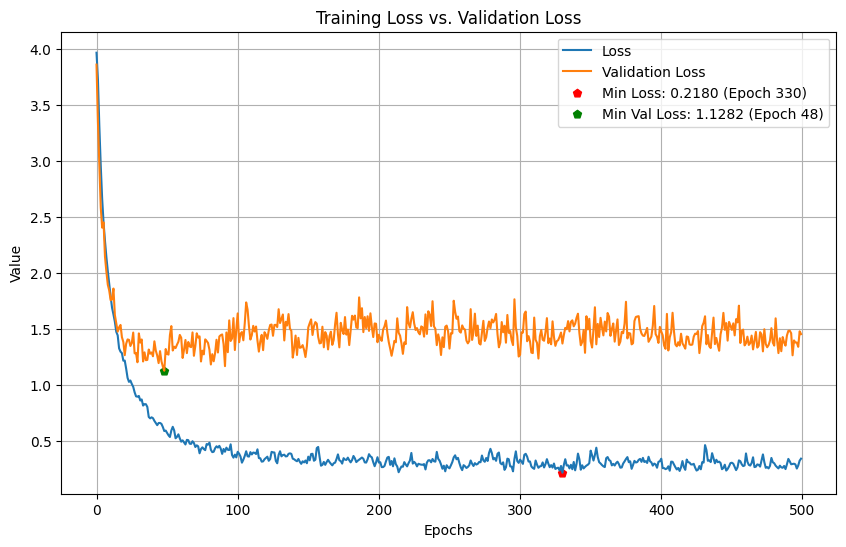

In [190]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

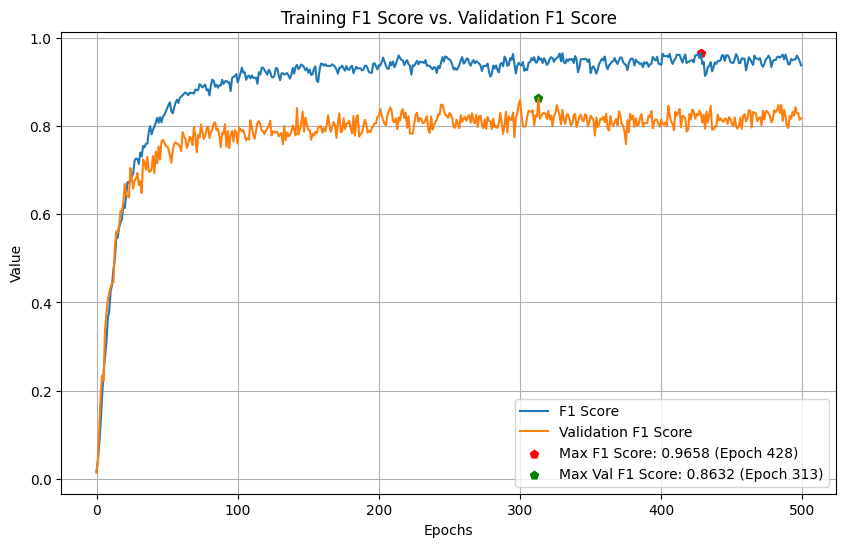

In [191]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [147]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      1.000     0.700     0.824        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.462     1.000     0.632         6
      CANCER      0.727     1.000     0.842         8
   CHRISTMAS      1.000     0.833     0.909         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.571     0.667     0.615         6
      DINNER      1.000     0.875     0.933         8
         DOG      0.667     

In [155]:
reconstructed_model = tf.keras.models.load_model("3 1D CNN Trial 718 Mish")

In [149]:
reconstructed_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

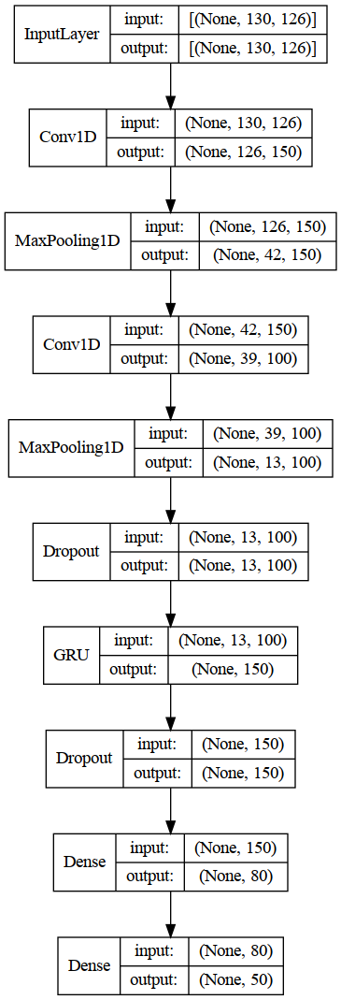

In [150]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

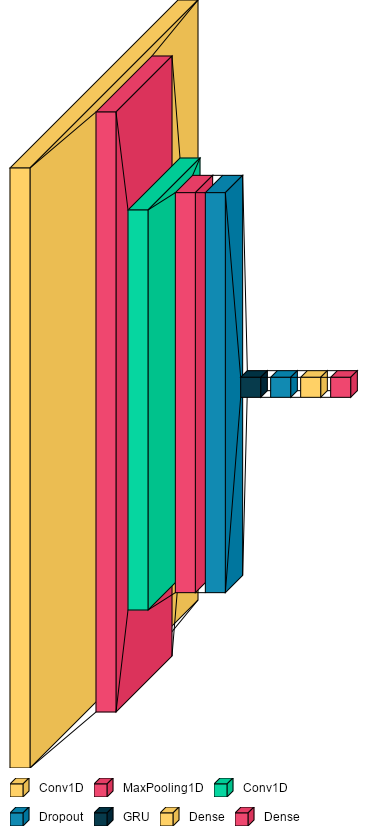

In [156]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [151]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 7ms/step - loss: 1.2373 - f1_score: 0.8632


[1.2372610569000244, 0.8632017374038696]

In [153]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 8ms/step - loss: 0.1030 - f1_score: 1.0000


[0.10299792885780334, 1.0]

In [154]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.800     0.667     0.727         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     1.000     1.000        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     0.833     0.909         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      0.600     1.000     0.750         6
      DINNER      1.000     0.750     0.857         8
         DOG      1.000     

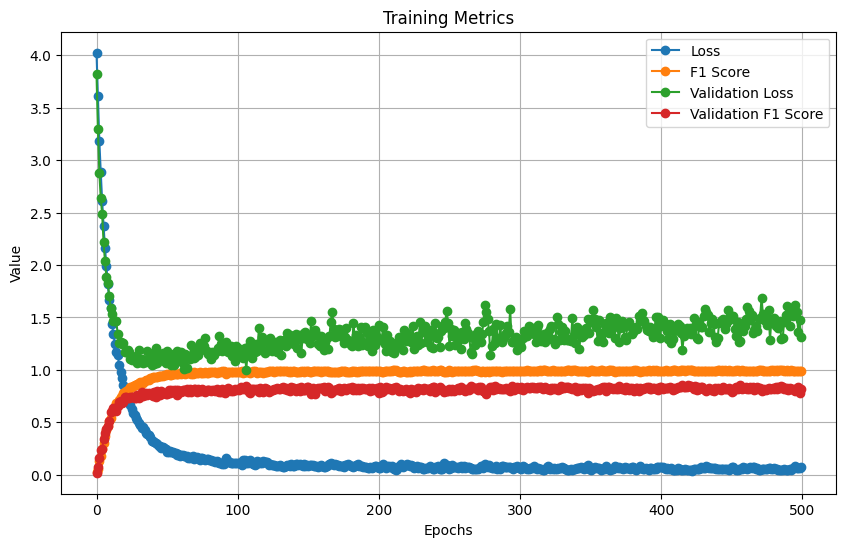

In [249]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

## Hyperparameter Tuning 1 1D CNN Layer + 1 GRU

In [119]:
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping

/tmp/ipykernel_2494404/3109640001.py:2: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [120]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, GRU
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','gelu','elu','relu'],default='elu')
        model = Sequential()
        model.add(Conv1D(filters=hp.Int('filters_1',min_value=50,max_value=200,step=25,default=150),
                         kernel_size=hp.Choice('kernel_1',values=[5,10,15,20],default=20,),
                         activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=hp.Choice('pool_1',values=[5,10,15,20],default=20,)))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.0,max_value=0.9,default=0.8,step=0.05,)))
        model.add(GRU(units=hp.Int('units_1',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=False,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.0,max_value=0.9,default=0.7,step=0.05,)))
        model.add(Dense(units=hp.Int('units_2',min_value=70,max_value=120,step=10,default=80),activation=act_function))
        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.00062198175395800846)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

In [121]:
HYPERBAND_MAX_EPOCHS = 300
#MAX_TRIALS = 20
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/CSPnext/hyperband/',
    project_name='1_1D_CNN+1_GRU',
    overwrite=False)

The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.
INFO:tensorflow:Reloading Tuner from /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/1_1D_CNN+1_GRU/tuner0.json


In [122]:
tuner.search_space_summary()

Search space summary
Default search space size: 10
dense_activation (Choice)
{'default': 'elu', 'conditions': [], 'values': ['selu', 'mish', 'gelu', 'elu', 'relu'], 'ordered': False}
filters_1 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_1 (Choice)
{'default': 20, 'conditions': [], 'values': [5, 10, 15, 20], 'ordered': True}
pool_1 (Choice)
{'default': 20, 'conditions': [], 'values': [5, 10, 15, 20], 'ordered': True}
dropout_1 (Float)
{'default': 0.8, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_1 (Int)
{'default': 100, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
regularizer (Float)
{'default': 0.001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
dropout_2 (Float)
{'default': 0.7, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_2 (

In [123]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [124]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [125]:
tuner.search(Xtrain, Ytrain, epochs=1000, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 19m 34s]
val_f1_score: 0.5111344456672668

Best val_f1_score So Far: 0.7555990815162659
Total elapsed time: 04h 49m 53s
INFO:tensorflow:Oracle triggered exit


In [126]:
best_model = tuner.get_best_models(num_models=10)[0]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=100.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [127]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 121, 200)          798200    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 24, 200)          0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 24, 200)           0         
                                                                 
 gru (GRU)                   (None, 125)               122625    
                                                                 
 dropout_1 (Dropout)         (None, 125)               0         
                                                                 
 dense (Dense)               (None, 110)               13860     
                                                        

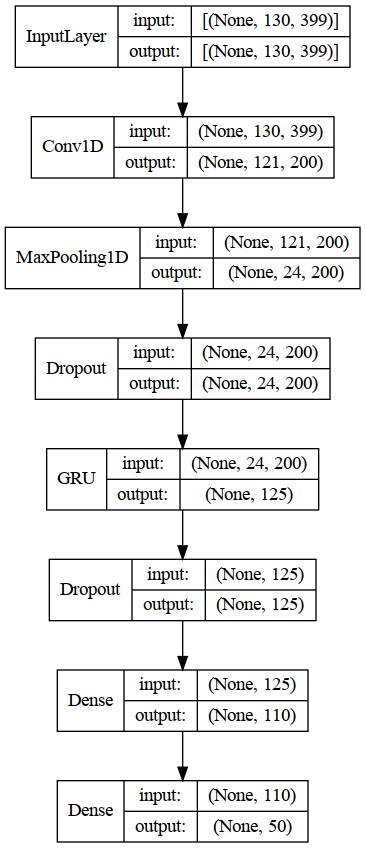

In [128]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

In [129]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/1_1D_CNN+1_GRU
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0714 summary
Hyperparameters:
dense_activation: elu
filters_1: 200
kernel_1: 10
pool_1: 5
dropout_1: 0.65
units_1: 125
regularizer: 0.0034365682734906543
dropout_2: 0.1
units_2: 110
learning_rate: 0.00015386971155916857
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0711
Score: 0.7555990815162659

Trial 0598 summary
Hyperparameters:
dense_activation: elu
filters_1: 100
kernel_1: 5
pool_1: 15
dropout_1: 0.4
units_1: 175
regularizer: 0.002613956776855358
dropout_2: 0.6000000000000001
units_2: 80
learning_rate: 0.0008380093243360302
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 4
tuner/round: 4
tuner/trial_id: 0593
Score: 0.7111110687255859

Trial 0593 summary
Hyperparameters:
dense_activation: elu
filters_1: 100
kernel_1: 5
pool_1: 15
dropout_1: 0.4
units_1: 175
r

In [130]:
loss, accuracy = best_model.evaluate(Xval, Yval)

11/11 [==============================] - 1s 15ms/step - loss: 1.1833 - f1_score: 0.7556


In [131]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 1s 14ms/step - loss: 0.1752 - f1_score: 0.9928


In [133]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(best_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 11ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.625     0.500     0.556        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     0.500     0.667         8
   BREAKFAST      0.545     1.000     0.706         6
      CANCER      0.571     1.000     0.727         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      0.667     1.000     0.800         4
        DEAF      0.333     0.333     0.333         6
      DECIDE      0.833     0.833     0.833         6
      DEMAND      1.000     0.750     0.857         8
     DEVELOP      0.500     0.333     0.400         6
      DINNER      1.000     1.000     1.000         8
         DOG      0.714    

In [134]:
#bestHP = tuner.get_best_hyperparameters(num_trials=5)[2]
bestHP = tuner.get_best_hyperparameters(num_trials=10)[0]

In [135]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1DCNN + 1 GRU/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [139]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - 8s 116ms/step - loss: 4.8754 - f1_score: 0.0170 - val_loss: 4.7783 - val_f1_score: 0.0040
Epoch 2/500
28/28 [==============================] - 2s 89ms/step - loss: 4.8321 - f1_score: 0.0160 - val_loss: 4.7571 - val_f1_score: 4.8780e-04
Epoch 3/500
28/28 [==============================] - 2s 89ms/step - loss: 4.7829 - f1_score: 0.0199 - val_loss: 4.7014 - val_f1_score: 0.0017
Epoch 4/500
28/28 [==============================] - 2s 89ms/step - loss: 4.7313 - f1_score: 0.0134 - val_loss: 4.6746 - val_f1_score: 0.0010
Epoch 5/500
28/28 [==============================] - 3s 91ms/step - loss: 4.6865 - f1_score: 0.0133 - val_loss: 4.6513 - val_f1_score: 9.8160e-04
Epoch 6/500
28/28 [==============================] - 3s 92ms/step - loss: 4.6553 - f1_score: 0.0161 - val_loss: 4.5905 - val_f1_score: 0.0012
Epoch 7/500
28/28 [==============================] - 3s 92ms/step - loss: 4.6279 - f1_score: 0.0145 - val

28/28 [==============================] - 3s 96ms/step - loss: 1.9531 - f1_score: 0.4799 - val_loss: 2.0727 - val_f1_score: 0.4633
Epoch 59/500
28/28 [==============================] - 3s 95ms/step - loss: 1.9263 - f1_score: 0.4853 - val_loss: 2.0275 - val_f1_score: 0.4611
Epoch 60/500
28/28 [==============================] - 3s 95ms/step - loss: 1.8807 - f1_score: 0.4852 - val_loss: 2.0393 - val_f1_score: 0.4603
Epoch 61/500
28/28 [==============================] - 3s 95ms/step - loss: 1.8595 - f1_score: 0.4984 - val_loss: 1.9622 - val_f1_score: 0.4850
Epoch 62/500
28/28 [==============================] - 3s 95ms/step - loss: 1.8206 - f1_score: 0.5208 - val_loss: 1.9954 - val_f1_score: 0.4669
Epoch 63/500
28/28 [==============================] - 3s 94ms/step - loss: 1.8147 - f1_score: 0.5108 - val_loss: 1.9593 - val_f1_score: 0.4445
Epoch 64/500
28/28 [==============================] - 3s 95ms/step - loss: 1.7875 - f1_score: 0.5181 - val_loss: 2.0338 - val_f1_score: 0.4215
Epoch 65/500

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


28/28 [==============================] - 11s 410ms/step - loss: 0.6458 - f1_score: 0.8391 - val_loss: 1.2540 - val_f1_score: 0.7325
Epoch 141/500
28/28 [==============================] - 3s 92ms/step - loss: 0.6265 - f1_score: 0.8530 - val_loss: 1.2280 - val_f1_score: 0.7211
Epoch 142/500
28/28 [==============================] - 3s 92ms/step - loss: 0.6123 - f1_score: 0.8548 - val_loss: 1.2046 - val_f1_score: 0.7156
Epoch 143/500
28/28 [==============================] - 3s 93ms/step - loss: 0.6045 - f1_score: 0.8506 - val_loss: 1.2689 - val_f1_score: 0.7089
Epoch 144/500
28/28 [==============================] - ETA: 0s - loss: 0.6073 - f1_score: 0.8446

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


28/28 [==============================] - 20s 721ms/step - loss: 0.6073 - f1_score: 0.8446 - val_loss: 1.2252 - val_f1_score: 0.7341
Epoch 145/500
28/28 [==============================] - 2s 89ms/step - loss: 0.5927 - f1_score: 0.8584 - val_loss: 1.2341 - val_f1_score: 0.7126
Epoch 146/500
28/28 [==============================] - 3s 91ms/step - loss: 0.5843 - f1_score: 0.8604 - val_loss: 1.2315 - val_f1_score: 0.7309
Epoch 147/500
28/28 [==============================] - 3s 91ms/step - loss: 0.5981 - f1_score: 0.8511 - val_loss: 1.2813 - val_f1_score: 0.7230
Epoch 148/500
28/28 [==============================] - 3s 92ms/step - loss: 0.5689 - f1_score: 0.8627 - val_loss: 1.2607 - val_f1_score: 0.6924
Epoch 149/500
28/28 [==============================] - 3s 92ms/step - loss: 0.5764 - f1_score: 0.8627 - val_loss: 1.2997 - val_f1_score: 0.7133
Epoch 150/500
28/28 [==============================] - ETA: 0s - loss: 0.5595 - f1_score: 0.8701

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


28/28 [==============================] - 10s 375ms/step - loss: 0.5595 - f1_score: 0.8701 - val_loss: 1.1762 - val_f1_score: 0.7452
Epoch 151/500
28/28 [==============================] - 3s 90ms/step - loss: 0.5641 - f1_score: 0.8598 - val_loss: 1.2248 - val_f1_score: 0.7034
Epoch 152/500
28/28 [==============================] - 3s 91ms/step - loss: 0.5628 - f1_score: 0.8636 - val_loss: 1.2137 - val_f1_score: 0.7283
Epoch 153/500
28/28 [==============================] - 3s 93ms/step - loss: 0.5495 - f1_score: 0.8650 - val_loss: 1.1652 - val_f1_score: 0.7284
Epoch 154/500
28/28 [==============================] - 3s 94ms/step - loss: 0.5318 - f1_score: 0.8770 - val_loss: 1.2373 - val_f1_score: 0.7197
Epoch 155/500
28/28 [==============================] - ETA: 0s - loss: 0.5279 - f1_score: 0.8794

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


28/28 [==============================] - 15s 554ms/step - loss: 0.5279 - f1_score: 0.8794 - val_loss: 1.2332 - val_f1_score: 0.7586
Epoch 156/500
28/28 [==============================] - 2s 89ms/step - loss: 0.5263 - f1_score: 0.8710 - val_loss: 1.2273 - val_f1_score: 0.7364
Epoch 157/500
28/28 [==============================] - 3s 91ms/step - loss: 0.5213 - f1_score: 0.8725 - val_loss: 1.2792 - val_f1_score: 0.7255
Epoch 158/500
28/28 [==============================] - 3s 92ms/step - loss: 0.5025 - f1_score: 0.8920 - val_loss: 1.1806 - val_f1_score: 0.7355
Epoch 159/500
28/28 [==============================] - 3s 92ms/step - loss: 0.5187 - f1_score: 0.8761 - val_loss: 1.2087 - val_f1_score: 0.7443
Epoch 160/500
28/28 [==============================] - 3s 92ms/step - loss: 0.5010 - f1_score: 0.8840 - val_loss: 1.2334 - val_f1_score: 0.7374
Epoch 161/500
28/28 [==============================] - 3s 92ms/step - loss: 0.5120 - f1_score: 0.8711 - val_loss: 1.1864 - val_f1_score: 0.7518
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


28/28 [==============================] - 10s 383ms/step - loss: 0.4685 - f1_score: 0.8950 - val_loss: 1.2458 - val_f1_score: 0.7626
Epoch 166/500
28/28 [==============================] - 3s 89ms/step - loss: 0.4676 - f1_score: 0.8985 - val_loss: 1.2624 - val_f1_score: 0.7143
Epoch 167/500
28/28 [==============================] - 3s 91ms/step - loss: 0.4739 - f1_score: 0.8898 - val_loss: 1.2561 - val_f1_score: 0.7155
Epoch 168/500
28/28 [==============================] - 3s 92ms/step - loss: 0.4588 - f1_score: 0.8986 - val_loss: 1.2502 - val_f1_score: 0.7150
Epoch 169/500
28/28 [==============================] - 3s 92ms/step - loss: 0.4637 - f1_score: 0.8945 - val_loss: 1.2004 - val_f1_score: 0.7350
Epoch 170/500
28/28 [==============================] - 3s 93ms/step - loss: 0.4600 - f1_score: 0.8878 - val_loss: 1.2627 - val_f1_score: 0.6911
Epoch 171/500
28/28 [==============================] - 3s 93ms/step - loss: 0.4346 - f1_score: 0.9018 - val_loss: 1.2015 - val_f1_score: 0.7246
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU/assets


28/28 [==============================] - 11s 407ms/step - loss: 0.3128 - f1_score: 0.9419 - val_loss: 1.1852 - val_f1_score: 0.7679
Epoch 208/500
28/28 [==============================] - 3s 90ms/step - loss: 0.3150 - f1_score: 0.9359 - val_loss: 1.3395 - val_f1_score: 0.7050
Epoch 209/500
28/28 [==============================] - 3s 91ms/step - loss: 0.3027 - f1_score: 0.9436 - val_loss: 1.3657 - val_f1_score: 0.6965
Epoch 210/500
28/28 [==============================] - 3s 92ms/step - loss: 0.3267 - f1_score: 0.9340 - val_loss: 1.2864 - val_f1_score: 0.7252
Epoch 211/500
28/28 [==============================] - 3s 93ms/step - loss: 0.3116 - f1_score: 0.9312 - val_loss: 1.2950 - val_f1_score: 0.7130
Epoch 212/500
28/28 [==============================] - 3s 93ms/step - loss: 0.3078 - f1_score: 0.9371 - val_loss: 1.2660 - val_f1_score: 0.7409
Epoch 213/500
28/28 [==============================] - 3s 93ms/step - loss: 0.3053 - f1_score: 0.9391 - val_loss: 1.2976 - val_f1_score: 0.7433
Epoc

Epoch 264/500
28/28 [==============================] - 3s 95ms/step - loss: 0.2186 - f1_score: 0.9555 - val_loss: 1.2867 - val_f1_score: 0.7443
Epoch 265/500
28/28 [==============================] - 3s 95ms/step - loss: 0.2089 - f1_score: 0.9649 - val_loss: 1.3429 - val_f1_score: 0.7440
Epoch 266/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1893 - f1_score: 0.9730 - val_loss: 1.3364 - val_f1_score: 0.7308
Epoch 267/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1934 - f1_score: 0.9666 - val_loss: 1.4209 - val_f1_score: 0.7139
Epoch 268/500
28/28 [==============================] - 3s 95ms/step - loss: 0.2134 - f1_score: 0.9584 - val_loss: 1.3442 - val_f1_score: 0.7114
Epoch 269/500
28/28 [==============================] - 3s 95ms/step - loss: 0.2028 - f1_score: 0.9642 - val_loss: 1.2705 - val_f1_score: 0.7401
Epoch 270/500
28/28 [==============================] - 3s 95ms/step - loss: 0.2134 - f1_score: 0.9631 - val_loss: 1.3733 - val_f1_score:

Epoch 321/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1532 - f1_score: 0.9768 - val_loss: 1.4065 - val_f1_score: 0.7406
Epoch 322/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1558 - f1_score: 0.9711 - val_loss: 1.5721 - val_f1_score: 0.6840
Epoch 323/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1581 - f1_score: 0.9754 - val_loss: 1.5725 - val_f1_score: 0.6922
Epoch 324/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1494 - f1_score: 0.9740 - val_loss: 1.4584 - val_f1_score: 0.7107
Epoch 325/500
28/28 [==============================] - 3s 99ms/step - loss: 0.1593 - f1_score: 0.9733 - val_loss: 1.5596 - val_f1_score: 0.6731
Epoch 326/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1525 - f1_score: 0.9729 - val_loss: 1.3781 - val_f1_score: 0.7258
Epoch 327/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1540 - f1_score: 0.9723 - val_loss: 1.4309 - val_f1_score:

Epoch 378/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1093 - f1_score: 0.9867 - val_loss: 1.4339 - val_f1_score: 0.7161
Epoch 379/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1045 - f1_score: 0.9860 - val_loss: 1.4921 - val_f1_score: 0.7220
Epoch 380/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1204 - f1_score: 0.9799 - val_loss: 1.4972 - val_f1_score: 0.7182
Epoch 381/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1203 - f1_score: 0.9819 - val_loss: 1.5162 - val_f1_score: 0.7136
Epoch 382/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1268 - f1_score: 0.9774 - val_loss: 1.5175 - val_f1_score: 0.7205
Epoch 383/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1306 - f1_score: 0.9770 - val_loss: 1.7108 - val_f1_score: 0.6754
Epoch 384/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1192 - f1_score: 0.9795 - val_loss: 1.5128 - val_f1_score:

Epoch 435/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1247 - f1_score: 0.9778 - val_loss: 1.5312 - val_f1_score: 0.7410
Epoch 436/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1209 - f1_score: 0.9774 - val_loss: 1.8115 - val_f1_score: 0.6875
Epoch 437/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1071 - f1_score: 0.9840 - val_loss: 1.6899 - val_f1_score: 0.6823
Epoch 438/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1052 - f1_score: 0.9847 - val_loss: 1.5622 - val_f1_score: 0.6955
Epoch 439/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1032 - f1_score: 0.9798 - val_loss: 1.5610 - val_f1_score: 0.6990
Epoch 440/500
28/28 [==============================] - 3s 96ms/step - loss: 0.0996 - f1_score: 0.9859 - val_loss: 1.6430 - val_f1_score: 0.6936
Epoch 441/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1026 - f1_score: 0.9825 - val_loss: 1.6960 - val_f1_score:

Epoch 492/500
28/28 [==============================] - 3s 95ms/step - loss: 0.0934 - f1_score: 0.9810 - val_loss: 1.6443 - val_f1_score: 0.7043
Epoch 493/500
28/28 [==============================] - 3s 95ms/step - loss: 0.0788 - f1_score: 0.9902 - val_loss: 1.4690 - val_f1_score: 0.7273
Epoch 494/500
28/28 [==============================] - 3s 94ms/step - loss: 0.0915 - f1_score: 0.9852 - val_loss: 1.7000 - val_f1_score: 0.6735
Epoch 495/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1065 - f1_score: 0.9801 - val_loss: 1.6182 - val_f1_score: 0.7010
Epoch 496/500
28/28 [==============================] - 3s 94ms/step - loss: 0.0997 - f1_score: 0.9826 - val_loss: 1.9312 - val_f1_score: 0.6735
Epoch 497/500
28/28 [==============================] - 3s 95ms/step - loss: 0.0830 - f1_score: 0.9905 - val_loss: 1.6879 - val_f1_score: 0.6940
Epoch 498/500
28/28 [==============================] - 3s 96ms/step - loss: 0.0906 - f1_score: 0.9864 - val_loss: 1.8039 - val_f1_score:

In [140]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 11ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.875     0.933         8
    BACKPACK      0.571     0.667     0.615         6
  BASKETBALL      1.000     0.900     0.947        10
         BEE      0.556     0.500     0.526        10
        BELT      0.500     1.000     0.667         4
        BITE      1.000     0.125     0.222         8
   BREAKFAST      0.571     0.667     0.615         6
      CANCER      0.778     0.875     0.824         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.182     0.333     0.235         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      1.000     0.500     0.667         8
     DEVELOP      0.500     0.333     0.400         6
      DINNER      0.444     0.500     0.471         8
         DOG      0.667    

In [141]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1DCNN + 1 GRU/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [142]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.099662,0.982627,1.931195,0.673482
496,0.082953,0.990497,1.687911,0.694009
497,0.090602,0.986427,1.803858,0.663592
498,0.106971,0.977117,1.564104,0.711779
499,0.106982,0.979273,1.697142,0.672247


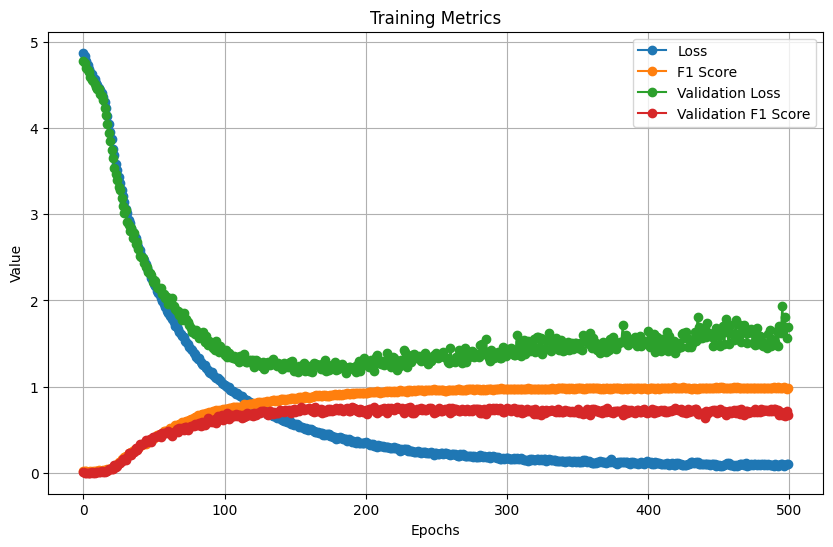

In [143]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [144]:
reconstructed_model = tf.keras.models.load_model("1 1DCNN + 1 GRU")

In [145]:
reconstructed_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 121, 200)          798200    
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 24, 200)          0         
 1D)                                                             
                                                                 
 dropout_8 (Dropout)         (None, 24, 200)           0         
                                                                 
 gru_4 (GRU)                 (None, 125)               122625    
                                                                 
 dropout_9 (Dropout)         (None, 125)               0         
                                                                 
 dense_8 (Dense)             (None, 110)               13860     
                                                      

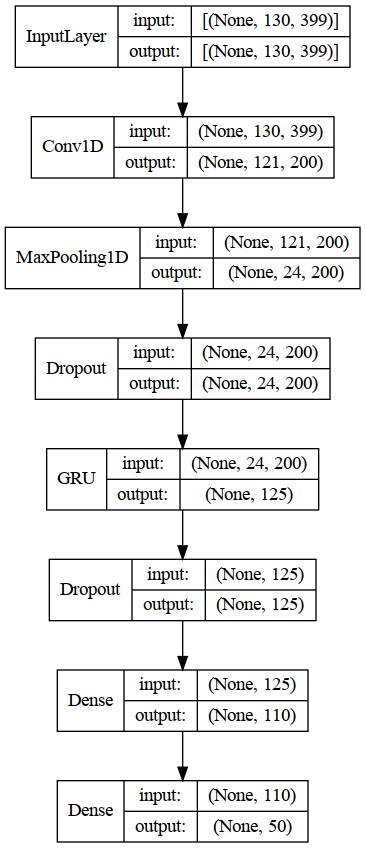

In [146]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [147]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 12ms/step - loss: 1.1852 - f1_score: 0.7679


[1.185200810432434, 0.7678741216659546]

In [149]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 15ms/step - loss: 0.1628 - f1_score: 0.9936


[0.16277065873146057, 0.9936215877532959]

In [150]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 11ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.571     0.667     0.615         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      1.000     0.800     0.889        10
        BELT      0.571     1.000     0.727         4
        BITE      0.857     0.750     0.800         8
   BREAKFAST      0.750     1.000     0.857         6
      CANCER      0.800     1.000     0.889         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.167     0.333     0.222         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      1.000     0.750     0.857         8
     DEVELOP      0.500     0.333     0.400         6
      DINNER      0.889     1.000     0.941         8
         DOG      0.750    

In [168]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1DCNN + 1 GRU Lecunnormal/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [169]:
act_function = 'selu'
initializer = tf.keras.initializers.LecunNormal(seed=10)

model = Sequential()
model.add(Conv1D(filters=150,kernel_size=15,kernel_initializer=initializer,
                 activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=10))
#model.add(Dropout(.55))
model.add(GRU(units=150,return_sequences=False,kernel_initializer=initializer,
              kernel_regularizer=regularizers.l2(.00043122634871936203)))
#model.add(Dropout(.7))
model.add(Dense(units=110,activation=act_function,kernel_initializer=initializer))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.00021882052801027956),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 116, 150)          283650    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 11, 150)          0         
 )                                                               
                                                                 
 gru (GRU)                   (None, 150)               135900    
                                                                 
 dense_10 (Dense)            (None, 110)               16610     
                                                                 
 dense_11 (Dense)            (None, 50)                5550      
                                                                 
Total params: 441,710
Trainable params: 441,710
Non-trainable params: 0
________________________________________________

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 14s 272ms/step - loss: 4.0767 - f1_score: 0.0236 - val_loss: 3.9629 - val_f1_score: 0.0113
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.8607 - f1_score: 0.0592

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 283ms/step - loss: 3.8600 - f1_score: 0.0587 - val_loss: 3.7755 - val_f1_score: 0.0726
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.6232 - f1_score: 0.1161

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 246ms/step - loss: 3.6190 - f1_score: 0.1170 - val_loss: 3.5231 - val_f1_score: 0.1098
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3305 - f1_score: 0.1592

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 272ms/step - loss: 3.3294 - f1_score: 0.1581 - val_loss: 3.2350 - val_f1_score: 0.1691
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 3.0297 - f1_score: 0.2217

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 255ms/step - loss: 3.0280 - f1_score: 0.2219 - val_loss: 2.9563 - val_f1_score: 0.2000
Epoch 6/500
27/28 [===========================>..] - ETA: 0s - loss: 2.7360 - f1_score: 0.2797

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 271ms/step - loss: 2.7331 - f1_score: 0.2816 - val_loss: 2.6872 - val_f1_score: 0.2708
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4803 - f1_score: 0.3520

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 249ms/step - loss: 2.4788 - f1_score: 0.3518 - val_loss: 2.4566 - val_f1_score: 0.3385
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2416 - f1_score: 0.4311

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 302ms/step - loss: 2.2422 - f1_score: 0.4315 - val_loss: 2.2630 - val_f1_score: 0.4429
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0614 - f1_score: 0.5024

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 268ms/step - loss: 2.0527 - f1_score: 0.5034 - val_loss: 2.0905 - val_f1_score: 0.5009
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 1.8816 - f1_score: 0.5547

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 300ms/step - loss: 1.8764 - f1_score: 0.5537 - val_loss: 1.9948 - val_f1_score: 0.5244
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7390 - f1_score: 0.5973

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 291ms/step - loss: 1.7442 - f1_score: 0.5970 - val_loss: 1.8480 - val_f1_score: 0.5690
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6223 - f1_score: 0.6322

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 295ms/step - loss: 1.6126 - f1_score: 0.6360 - val_loss: 1.7749 - val_f1_score: 0.5802
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5053 - f1_score: 0.6638

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 261ms/step - loss: 1.5012 - f1_score: 0.6668 - val_loss: 1.6582 - val_f1_score: 0.6372
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4018 - f1_score: 0.6911

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 280ms/step - loss: 1.4000 - f1_score: 0.6931 - val_loss: 1.5888 - val_f1_score: 0.6560
Epoch 15/500
28/28 [==============================] - 1s 49ms/step - loss: 1.3120 - f1_score: 0.7217 - val_loss: 1.5273 - val_f1_score: 0.6531
Epoch 16/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2309 - f1_score: 0.7465

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 280ms/step - loss: 1.2282 - f1_score: 0.7455 - val_loss: 1.4844 - val_f1_score: 0.6725
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 1.1503 - f1_score: 0.7649

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 271ms/step - loss: 1.1544 - f1_score: 0.7634 - val_loss: 1.4246 - val_f1_score: 0.6810
Epoch 18/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0852 - f1_score: 0.7894

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 302ms/step - loss: 1.0870 - f1_score: 0.7872 - val_loss: 1.3694 - val_f1_score: 0.6985
Epoch 19/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0285 - f1_score: 0.8040

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 261ms/step - loss: 1.0273 - f1_score: 0.8036 - val_loss: 1.3746 - val_f1_score: 0.7038
Epoch 20/500
28/28 [==============================] - 1s 49ms/step - loss: 0.9685 - f1_score: 0.8219 - val_loss: 1.3039 - val_f1_score: 0.6938
Epoch 21/500
28/28 [==============================] - ETA: 0s - loss: 0.9142 - f1_score: 0.8364

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 239ms/step - loss: 0.9142 - f1_score: 0.8364 - val_loss: 1.2669 - val_f1_score: 0.7275
Epoch 22/500
28/28 [==============================] - 1s 49ms/step - loss: 0.8668 - f1_score: 0.8431 - val_loss: 1.2864 - val_f1_score: 0.7128
Epoch 23/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8303 - f1_score: 0.8521

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 7s 250ms/step - loss: 0.8281 - f1_score: 0.8525 - val_loss: 1.2183 - val_f1_score: 0.7354
Epoch 24/500
28/28 [==============================] - 1s 49ms/step - loss: 0.7853 - f1_score: 0.8595 - val_loss: 1.2133 - val_f1_score: 0.7204
Epoch 25/500
28/28 [==============================] - 1s 49ms/step - loss: 0.7454 - f1_score: 0.8717 - val_loss: 1.2031 - val_f1_score: 0.7180
Epoch 26/500
28/28 [==============================] - 1s 49ms/step - loss: 0.7071 - f1_score: 0.8801 - val_loss: 1.1890 - val_f1_score: 0.7263
Epoch 27/500
28/28 [==============================] - 1s 49ms/step - loss: 0.6710 - f1_score: 0.8889 - val_loss: 1.1692 - val_f1_score: 0.7207
Epoch 28/500
28/28 [==============================] - 1s 49ms/step - loss: 0.6437 - f1_score: 0.8992 - val_loss: 1.1846 - val_f1_score: 0.7128
Epoch 29/500
28/28 [==============================] - 1s 49ms/step - loss: 0.6099 - f1_score: 0.9061 - val_loss: 1.1422 - val_f1_score: 0.7268
Epoch 30/50

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 348ms/step - loss: 0.5249 - f1_score: 0.9297 - val_loss: 1.1333 - val_f1_score: 0.7357
Epoch 33/500
28/28 [==============================] - 1s 49ms/step - loss: 0.5030 - f1_score: 0.9317 - val_loss: 1.1130 - val_f1_score: 0.7272
Epoch 34/500
28/28 [==============================] - 1s 50ms/step - loss: 0.4818 - f1_score: 0.9330 - val_loss: 1.0979 - val_f1_score: 0.7329
Epoch 35/500
28/28 [==============================] - ETA: 0s - loss: 0.4608 - f1_score: 0.9384

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 313ms/step - loss: 0.4608 - f1_score: 0.9384 - val_loss: 1.0766 - val_f1_score: 0.7407
Epoch 36/500
28/28 [==============================] - ETA: 0s - loss: 0.4387 - f1_score: 0.9473

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 313ms/step - loss: 0.4387 - f1_score: 0.9473 - val_loss: 1.0842 - val_f1_score: 0.7432
Epoch 37/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4186 - f1_score: 0.9527

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 287ms/step - loss: 0.4178 - f1_score: 0.9537 - val_loss: 1.0977 - val_f1_score: 0.7462
Epoch 38/500
28/28 [==============================] - 1s 49ms/step - loss: 0.3976 - f1_score: 0.9559 - val_loss: 1.0904 - val_f1_score: 0.7339
Epoch 39/500
28/28 [==============================] - 1s 50ms/step - loss: 0.3804 - f1_score: 0.9641 - val_loss: 1.0688 - val_f1_score: 0.7446
Epoch 40/500
28/28 [==============================] - 1s 50ms/step - loss: 0.3632 - f1_score: 0.9664 - val_loss: 1.0509 - val_f1_score: 0.7397
Epoch 41/500
27/28 [===========================>..] - ETA: 0s - loss: 0.3483 - f1_score: 0.9703

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 314ms/step - loss: 0.3471 - f1_score: 0.9709 - val_loss: 1.0571 - val_f1_score: 0.7506
Epoch 42/500
28/28 [==============================] - 1s 49ms/step - loss: 0.3313 - f1_score: 0.9759 - val_loss: 1.0610 - val_f1_score: 0.7404
Epoch 43/500
28/28 [==============================] - 1s 50ms/step - loss: 0.3146 - f1_score: 0.9771 - val_loss: 1.0823 - val_f1_score: 0.7481
Epoch 44/500
27/28 [===========================>..] - ETA: 0s - loss: 0.3037 - f1_score: 0.9815

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 347ms/step - loss: 0.3035 - f1_score: 0.9816 - val_loss: 1.0391 - val_f1_score: 0.7623
Epoch 45/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2891 - f1_score: 0.9842 - val_loss: 1.0555 - val_f1_score: 0.7605
Epoch 46/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2780 - f1_score: 0.9865 - val_loss: 1.0351 - val_f1_score: 0.7445
Epoch 47/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2687 - f1_score: 0.9846 - val_loss: 1.0317 - val_f1_score: 0.7421
Epoch 48/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2568 - f1_score: 0.9885 - val_loss: 1.0471 - val_f1_score: 0.7414
Epoch 49/500
28/28 [==============================] - 1s 54ms/step - loss: 0.2480 - f1_score: 0.9920 - val_loss: 1.0412 - val_f1_score: 0.7441
Epoch 50/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2386 - f1_score: 0.9925 - val_loss: 1.0413 - val_f1_score: 0.7593
Epoch 51/50

Epoch 158/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0550 - f1_score: 1.0000 - val_loss: 1.1703 - val_f1_score: 0.7563
Epoch 159/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0544 - f1_score: 1.0000 - val_loss: 1.1743 - val_f1_score: 0.7319
Epoch 160/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0539 - f1_score: 1.0000 - val_loss: 1.1623 - val_f1_score: 0.7288
Epoch 161/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0534 - f1_score: 1.0000 - val_loss: 1.1728 - val_f1_score: 0.7381
Epoch 162/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0529 - f1_score: 1.0000 - val_loss: 1.1818 - val_f1_score: 0.7260
Epoch 163/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0525 - f1_score: 1.0000 - val_loss: 1.1751 - val_f1_score: 0.7384
Epoch 164/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0520 - f1_score: 1.0000 - val_loss: 1.1688 - val_f1_score:

Epoch 215/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0307 - f1_score: 1.0000 - val_loss: 1.2559 - val_f1_score: 0.7273
Epoch 216/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0304 - f1_score: 1.0000 - val_loss: 1.2360 - val_f1_score: 0.7287
Epoch 217/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0300 - f1_score: 1.0000 - val_loss: 1.2301 - val_f1_score: 0.7393
Epoch 218/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0297 - f1_score: 1.0000 - val_loss: 1.2697 - val_f1_score: 0.7428
Epoch 219/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0293 - f1_score: 1.0000 - val_loss: 1.2301 - val_f1_score: 0.7321
Epoch 220/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0289 - f1_score: 1.0000 - val_loss: 1.2526 - val_f1_score: 0.7285
Epoch 221/500
28/28 [==============================] - 1s 54ms/step - loss: 0.0286 - f1_score: 1.0000 - val_loss: 1.2569 - val_f1_score:

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 10s 378ms/step - loss: 0.0426 - f1_score: 1.0000 - val_loss: 1.1090 - val_f1_score: 0.7732
Epoch 245/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0414 - f1_score: 1.0000 - val_loss: 1.1084 - val_f1_score: 0.7412
Epoch 246/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0405 - f1_score: 1.0000 - val_loss: 1.1199 - val_f1_score: 0.7466
Epoch 247/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0396 - f1_score: 1.0000 - val_loss: 1.1218 - val_f1_score: 0.7545
Epoch 248/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0388 - f1_score: 1.0000 - val_loss: 1.1239 - val_f1_score: 0.7478
Epoch 249/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0379 - f1_score: 1.0000 - val_loss: 1.1245 - val_f1_score: 0.7302
Epoch 250/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0374 - f1_score: 1.0000 - val_loss: 1.1249 - val_f1_score: 0.7394
Epoc

Epoch 301/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0276 - f1_score: 1.0000 - val_loss: 1.1683 - val_f1_score: 0.7565
Epoch 302/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0275 - f1_score: 1.0000 - val_loss: 1.1779 - val_f1_score: 0.7555
Epoch 303/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0274 - f1_score: 1.0000 - val_loss: 1.1642 - val_f1_score: 0.7534
Epoch 304/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0273 - f1_score: 1.0000 - val_loss: 1.1739 - val_f1_score: 0.7668
Epoch 305/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0272 - f1_score: 1.0000 - val_loss: 1.1672 - val_f1_score: 0.7538
Epoch 306/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0271 - f1_score: 1.0000 - val_loss: 1.1704 - val_f1_score: 0.7543
Epoch 307/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0270 - f1_score: 1.0000 - val_loss: 1.1755 - val_f1_score:

Epoch 358/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0229 - f1_score: 1.0000 - val_loss: 1.1914 - val_f1_score: 0.7617
Epoch 359/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0228 - f1_score: 1.0000 - val_loss: 1.1872 - val_f1_score: 0.7617
Epoch 360/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0227 - f1_score: 1.0000 - val_loss: 1.1965 - val_f1_score: 0.7537
Epoch 361/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0226 - f1_score: 1.0000 - val_loss: 1.1885 - val_f1_score: 0.7506
Epoch 362/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0225 - f1_score: 1.0000 - val_loss: 1.1987 - val_f1_score: 0.7531
Epoch 363/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0225 - f1_score: 1.0000 - val_loss: 1.1952 - val_f1_score: 0.7617
Epoch 364/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0224 - f1_score: 1.0000 - val_loss: 1.2046 - val_f1_score:

Epoch 415/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0176 - f1_score: 1.0000 - val_loss: 1.2297 - val_f1_score: 0.7656
Epoch 416/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0175 - f1_score: 1.0000 - val_loss: 1.2520 - val_f1_score: 0.7702
Epoch 417/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0174 - f1_score: 1.0000 - val_loss: 1.2222 - val_f1_score: 0.7644
Epoch 418/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0173 - f1_score: 1.0000 - val_loss: 1.2360 - val_f1_score: 0.7573
Epoch 419/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0172 - f1_score: 1.0000 - val_loss: 1.2313 - val_f1_score: 0.7594
Epoch 420/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0171 - f1_score: 1.0000 - val_loss: 1.2400 - val_f1_score: 0.7706
Epoch 421/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0170 - f1_score: 1.0000 - val_loss: 1.2380 - val_f1_score:

Epoch 472/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0115 - f1_score: 1.0000 - val_loss: 1.3168 - val_f1_score: 0.7481
Epoch 473/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0114 - f1_score: 1.0000 - val_loss: 1.3153 - val_f1_score: 0.7573
Epoch 474/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0113 - f1_score: 1.0000 - val_loss: 1.2942 - val_f1_score: 0.7551
Epoch 475/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0112 - f1_score: 1.0000 - val_loss: 1.3378 - val_f1_score: 0.7434
Epoch 476/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0111 - f1_score: 1.0000 - val_loss: 1.3493 - val_f1_score: 0.7665
Epoch 477/500
28/28 [==============================] - 1s 51ms/step - loss: 4.3854 - f1_score: 0.5098 - val_loss: 1.8397 - val_f1_score: 0.5276
Epoch 478/500
28/28 [==============================] - 2s 54ms/step - loss: 0.6905 - f1_score: 0.7937 - val_loss: 1.3198 - val_f1_score:

In [170]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 15ms/step
              precision    recall  f1-score   support

         AXE      0.714     0.625     0.667         8
    BACKPACK      0.857     1.000     0.923         6
  BASKETBALL      0.889     0.800     0.842        10
         BEE      1.000     0.600     0.750        10
        BELT      1.000     1.000     1.000         4
        BITE      0.727     1.000     0.842         8
   BREAKFAST      0.545     1.000     0.706         6
      CANCER      0.800     1.000     0.889         8
   CHRISTMAS      0.667     0.667     0.667         6
    CONFUSED      0.750     1.000     0.857         6
        DARK      0.667     1.000     0.800         4
        DEAF      1.000     1.000     1.000         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.429     0.500     0.462         6
      DINNER      0.625     0.625     0.625         8
         DOG      0.750    

In [170]:
reconstructed_model = tf.keras.models.load_model("1 1DCNN + 1 GRU Lecunnormal")

In [172]:
reconstructed_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 116, 150)          283650    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 11, 150)          0         
 )                                                               
                                                                 
 gru (GRU)                   (None, 150)               135900    
                                                                 
 dense_10 (Dense)            (None, 110)               16610     
                                                                 
 dense_11 (Dense)            (None, 50)                5550      
                                                                 
Total params: 441,710
Trainable params: 441,710
Non-trainable params: 0
________________________________________________

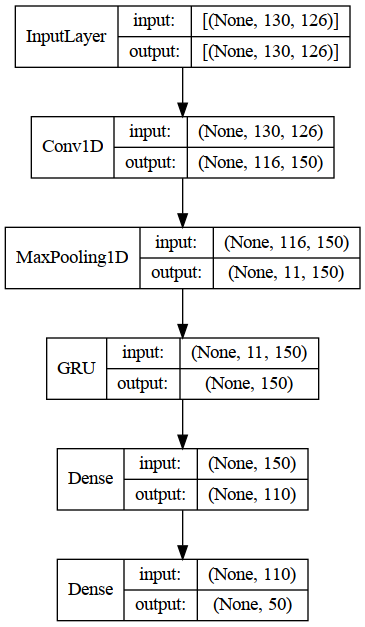

In [173]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [174]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 7ms/step - loss: 1.1090 - f1_score: 0.7732


[1.1089534759521484, 0.773163914680481]

In [175]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.857     1.000     0.923         6
  BASKETBALL      0.818     0.900     0.857        10
         BEE      1.000     0.400     0.571        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     1.000     1.000         8
   BREAKFAST      0.600     1.000     0.750         6
      CANCER      0.727     1.000     0.842         8
   CHRISTMAS      0.667     0.667     0.667         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      0.750     0.500     0.600         6
      DINNER      0.750     0.750     0.750         8
         DOG      0.857     

In [150]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1DCNN + 1 GRU Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [157]:
act_function = mish
#initializer = tf.keras.initializers.LecunNormal(seed=10)

model = Sequential()
model.add(Conv1D(filters=150,kernel_size=15,
                 activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=10))
model.add(Dropout(.55))
model.add(GRU(units=150,return_sequences=False,
              kernel_regularizer=regularizers.l2(.00043122634871936203)))
model.add(Dropout(.7))
model.add(Dense(units=110,activation=act_function))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.00021882052801027956),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_5 (Conv1D)           (None, 116, 150)          283650    
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 11, 150)          0         
 1D)                                                             
                                                                 
 dropout_10 (Dropout)        (None, 11, 150)           0         
                                                                 
 gru_5 (GRU)                 (None, 150)               135900    
                                                                 
 dropout_11 (Dropout)        (None, 150)               0         
                                                                 
 dense_10 (Dense)            (None, 110)               16610     
                                                      

28/28 [==============================] - 1s 49ms/step - loss: 0.8565 - f1_score: 0.7470 - val_loss: 1.1380 - val_f1_score: 0.6924
Epoch 106/500
28/28 [==============================] - 1s 48ms/step - loss: 0.8433 - f1_score: 0.7449 - val_loss: 1.1442 - val_f1_score: 0.7037
Epoch 107/500
28/28 [==============================] - 1s 48ms/step - loss: 0.8421 - f1_score: 0.7457 - val_loss: 1.1365 - val_f1_score: 0.7012
Epoch 108/500
28/28 [==============================] - 1s 51ms/step - loss: 0.8267 - f1_score: 0.7578 - val_loss: 1.1373 - val_f1_score: 0.7220
Epoch 109/500
28/28 [==============================] - 1s 48ms/step - loss: 0.8348 - f1_score: 0.7401 - val_loss: 1.1372 - val_f1_score: 0.7085
Epoch 110/500
28/28 [==============================] - 1s 48ms/step - loss: 0.8136 - f1_score: 0.7491 - val_loss: 1.1470 - val_f1_score: 0.7141
Epoch 111/500
28/28 [==============================] - 1s 48ms/step - loss: 0.8015 - f1_score: 0.7718 - val_loss: 1.1359 - val_f1_score: 0.7176
Epoch 

Epoch 162/500
28/28 [==============================] - 2s 59ms/step - loss: 0.5869 - f1_score: 0.8256 - val_loss: 1.1054 - val_f1_score: 0.7654
Epoch 163/500
28/28 [==============================] - 2s 61ms/step - loss: 0.5924 - f1_score: 0.8188 - val_loss: 1.1162 - val_f1_score: 0.7536
Epoch 164/500
28/28 [==============================] - 1s 52ms/step - loss: 0.5707 - f1_score: 0.8247 - val_loss: 1.0644 - val_f1_score: 0.7433
Epoch 165/500
28/28 [==============================] - 1s 50ms/step - loss: 0.5761 - f1_score: 0.8314 - val_loss: 1.0904 - val_f1_score: 0.7507
Epoch 166/500
28/28 [==============================] - 1s 51ms/step - loss: 0.5627 - f1_score: 0.8340 - val_loss: 1.0788 - val_f1_score: 0.7481
Epoch 167/500
28/28 [==============================] - 1s 49ms/step - loss: 0.5667 - f1_score: 0.8384 - val_loss: 1.1225 - val_f1_score: 0.7583
Epoch 168/500
28/28 [==============================] - 1s 49ms/step - loss: 0.5863 - f1_score: 0.8248 - val_loss: 1.1203 - val_f1_score:

Epoch 219/500
28/28 [==============================] - 2s 55ms/step - loss: 0.4268 - f1_score: 0.8758 - val_loss: 1.1356 - val_f1_score: 0.7789
Epoch 220/500
28/28 [==============================] - 1s 51ms/step - loss: 0.4194 - f1_score: 0.8799 - val_loss: 1.0650 - val_f1_score: 0.7949
Epoch 221/500
28/28 [==============================] - 1s 51ms/step - loss: 0.4352 - f1_score: 0.8715 - val_loss: 1.1171 - val_f1_score: 0.7722
Epoch 222/500
28/28 [==============================] - 1s 50ms/step - loss: 0.4128 - f1_score: 0.8809 - val_loss: 1.0969 - val_f1_score: 0.7698
Epoch 223/500
28/28 [==============================] - 1s 51ms/step - loss: 0.4197 - f1_score: 0.8779 - val_loss: 1.1324 - val_f1_score: 0.7775
Epoch 224/500
28/28 [==============================] - 2s 56ms/step - loss: 0.4140 - f1_score: 0.8868 - val_loss: 1.0734 - val_f1_score: 0.7719
Epoch 225/500
28/28 [==============================] - 2s 54ms/step - loss: 0.4101 - f1_score: 0.8782 - val_loss: 1.0639 - val_f1_score:

Epoch 276/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3239 - f1_score: 0.9092 - val_loss: 1.0902 - val_f1_score: 0.7826
Epoch 277/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3593 - f1_score: 0.8998 - val_loss: 1.0688 - val_f1_score: 0.7916
Epoch 278/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3259 - f1_score: 0.9133 - val_loss: 1.0936 - val_f1_score: 0.7872
Epoch 279/500
28/28 [==============================] - 1s 49ms/step - loss: 0.3183 - f1_score: 0.9119 - val_loss: 1.0825 - val_f1_score: 0.8030
Epoch 280/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3339 - f1_score: 0.9130 - val_loss: 1.0567 - val_f1_score: 0.8142
Epoch 281/500
28/28 [==============================] - 1s 49ms/step - loss: 0.3367 - f1_score: 0.9088 - val_loss: 1.1277 - val_f1_score: 0.7963
Epoch 282/500
28/28 [==============================] - 2s 55ms/step - loss: 0.3419 - f1_score: 0.9023 - val_loss: 1.0686 - val_f1_score:

Epoch 333/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2730 - f1_score: 0.9244 - val_loss: 1.0813 - val_f1_score: 0.8051
Epoch 334/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2694 - f1_score: 0.9229 - val_loss: 1.1112 - val_f1_score: 0.7974
Epoch 335/500
28/28 [==============================] - 1s 48ms/step - loss: 0.2864 - f1_score: 0.9200 - val_loss: 1.0654 - val_f1_score: 0.8085
Epoch 336/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2629 - f1_score: 0.9262 - val_loss: 1.0860 - val_f1_score: 0.8143
Epoch 337/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2642 - f1_score: 0.9272 - val_loss: 1.1450 - val_f1_score: 0.8179
Epoch 338/500
28/28 [==============================] - 1s 48ms/step - loss: 0.2839 - f1_score: 0.9212 - val_loss: 1.1533 - val_f1_score: 0.8119
Epoch 339/500
28/28 [==============================] - 1s 48ms/step - loss: 0.2770 - f1_score: 0.9301 - val_loss: 1.1026 - val_f1_score:

Epoch 390/500
28/28 [==============================] - 1s 53ms/step - loss: 0.2204 - f1_score: 0.9393 - val_loss: 1.1773 - val_f1_score: 0.8163
Epoch 391/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2167 - f1_score: 0.9422 - val_loss: 1.1307 - val_f1_score: 0.8046
Epoch 392/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2545 - f1_score: 0.9285 - val_loss: 1.1943 - val_f1_score: 0.7985
Epoch 393/500
28/28 [==============================] - 1s 48ms/step - loss: 0.2516 - f1_score: 0.9325 - val_loss: 1.1902 - val_f1_score: 0.8097
Epoch 394/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2373 - f1_score: 0.9417 - val_loss: 1.2088 - val_f1_score: 0.8142
Epoch 395/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2430 - f1_score: 0.9357 - val_loss: 1.1238 - val_f1_score: 0.8247
Epoch 396/500
28/28 [==============================] - 1s 48ms/step - loss: 0.2486 - f1_score: 0.9340 - val_loss: 1.1180 - val_f1_score:

INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 GRU Mish/assets


28/28 [==============================] - 11s 391ms/step - loss: 0.2016 - f1_score: 0.9500 - val_loss: 1.1435 - val_f1_score: 0.8445
Epoch 427/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1964 - f1_score: 0.9499 - val_loss: 1.2075 - val_f1_score: 0.8223
Epoch 428/500
28/28 [==============================] - 1s 47ms/step - loss: 0.2068 - f1_score: 0.9443 - val_loss: 1.2132 - val_f1_score: 0.8169
Epoch 429/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2281 - f1_score: 0.9382 - val_loss: 1.0762 - val_f1_score: 0.8283
Epoch 430/500
28/28 [==============================] - 1s 48ms/step - loss: 0.2088 - f1_score: 0.9470 - val_loss: 1.1645 - val_f1_score: 0.8261
Epoch 431/500
28/28 [==============================] - 1s 47ms/step - loss: 0.2240 - f1_score: 0.9351 - val_loss: 1.1800 - val_f1_score: 0.8261
Epoch 432/500
28/28 [==============================] - 1s 47ms/step - loss: 0.2053 - f1_score: 0.9508 - val_loss: 1.1587 - val_f1_score: 0.8364
Epoc

Epoch 483/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1789 - f1_score: 0.9558 - val_loss: 1.2377 - val_f1_score: 0.8206
Epoch 484/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1727 - f1_score: 0.9520 - val_loss: 1.1677 - val_f1_score: 0.8199
Epoch 485/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1903 - f1_score: 0.9490 - val_loss: 1.1818 - val_f1_score: 0.8160
Epoch 486/500
28/28 [==============================] - 1s 49ms/step - loss: 0.1710 - f1_score: 0.9543 - val_loss: 1.2129 - val_f1_score: 0.8280
Epoch 487/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1738 - f1_score: 0.9589 - val_loss: 1.1882 - val_f1_score: 0.8311
Epoch 488/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1727 - f1_score: 0.9592 - val_loss: 1.1651 - val_f1_score: 0.8286
Epoch 489/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1749 - f1_score: 0.9518 - val_loss: 1.2038 - val_f1_score:

In [158]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      0.667     0.750     0.706         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     0.800     0.889        10
        BELT      1.000     0.750     0.857         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.462     1.000     0.632         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     1.000     1.000         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      1.000     0.750     0.857         8
     DEVELOP      0.600     1.000     0.750         6
      DINNER      1.000     0.750     0.857         8
         DOG      1.000     

In [176]:
reconstructed_model = tf.keras.models.load_model("1 1DCNN + 1 GRU Mish")

In [177]:
reconstructed_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_5 (Conv1D)           (None, 116, 150)          283650    
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 11, 150)          0         
 1D)                                                             
                                                                 
 dropout_10 (Dropout)        (None, 11, 150)           0         
                                                                 
 gru_5 (GRU)                 (None, 150)               135900    
                                                                 
 dropout_11 (Dropout)        (None, 150)               0         
                                                                 
 dense_10 (Dense)            (None, 110)               16610     
                                                      

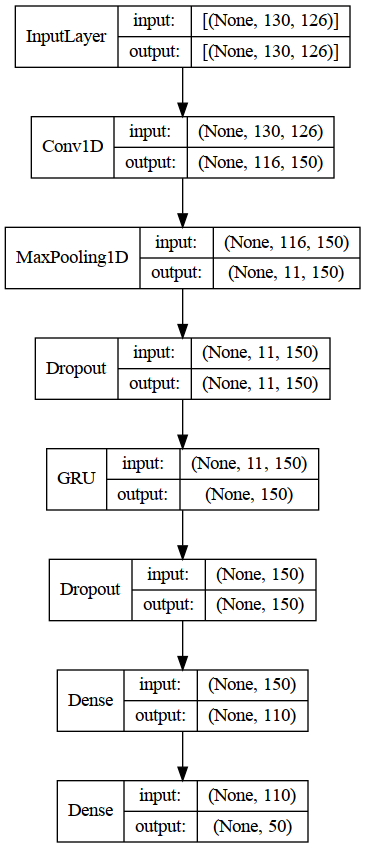

In [178]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [179]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 7ms/step - loss: 1.1435 - f1_score: 0.8445


[1.1434996128082275, 0.8445467352867126]

In [180]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 6ms/step
              precision    recall  f1-score   support

         AXE      0.750     0.750     0.750         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     0.900     0.947        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.545     1.000     0.706         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     1.000     1.000         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      1.000     0.750     0.857         8
     DEVELOP      0.625     0.833     0.714         6
      DINNER      1.000     0.750     0.857         8
         DOG      0.750     

### 1 1D-CNN + 1 GRU Trial 593

In [122]:
best_model = tuner.get_best_models(num_models=3)[2]

2023-09-10 14:53:41.226129: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-10 14:53:41.326691: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1739 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


In [123]:
best_model.evaluate(Xtrain,Ytrain)

2023-09-10 14:31:37.264552: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700


84/84 [==============================] - 2s 13ms/step - loss: 0.3788 - f1_score: 0.9373


[0.378775417804718, 0.937265157699585]

In [124]:
best_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 14ms/step - loss: 1.3141 - f1_score: 0.7039


[1.3140639066696167, 0.7038748860359192]

In [123]:
bestHP = tuner.get_best_hyperparameters(num_trials=3)[2]

In [124]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1D-CNN + 1 GRU Trial 593/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [ ]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
27/28 [===========================>..] - ETA: 0s - loss: 4.5161 - f1_score: 0.0141

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 14s 363ms/step - loss: 4.5154 - f1_score: 0.0140 - val_loss: 4.3012 - val_f1_score: 0.0033
Epoch 2/500
28/28 [==============================] - 2s 60ms/step - loss: 4.3517 - f1_score: 0.0162 - val_loss: 4.2173 - val_f1_score: 0.0010
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 4.2625 - f1_score: 0.0174

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 12s 448ms/step - loss: 4.2610 - f1_score: 0.0175 - val_loss: 4.1818 - val_f1_score: 0.0045
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 4.2029 - f1_score: 0.0195

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 10s 365ms/step - loss: 4.2028 - f1_score: 0.0201 - val_loss: 4.1124 - val_f1_score: 0.0049
Epoch 5/500
28/28 [==============================] - ETA: 0s - loss: 4.1239 - f1_score: 0.0216

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 320ms/step - loss: 4.1239 - f1_score: 0.0216 - val_loss: 4.0537 - val_f1_score: 0.0154
Epoch 6/500
28/28 [==============================] - ETA: 0s - loss: 4.0144 - f1_score: 0.0273

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 8s 305ms/step - loss: 4.0144 - f1_score: 0.0273 - val_loss: 3.8351 - val_f1_score: 0.0297
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 3.8329 - f1_score: 0.0406

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 321ms/step - loss: 3.8280 - f1_score: 0.0407 - val_loss: 3.6051 - val_f1_score: 0.0304
Epoch 8/500
28/28 [==============================] - ETA: 0s - loss: 3.6762 - f1_score: 0.0567

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 349ms/step - loss: 3.6762 - f1_score: 0.0567 - val_loss: 3.4139 - val_f1_score: 0.0470
Epoch 9/500
28/28 [==============================] - 2s 58ms/step - loss: 3.5143 - f1_score: 0.0671 - val_loss: 3.3471 - val_f1_score: 0.0378
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3931 - f1_score: 0.0833

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 8s 289ms/step - loss: 3.3869 - f1_score: 0.0832 - val_loss: 3.0863 - val_f1_score: 0.0983
Epoch 11/500
28/28 [==============================] - ETA: 0s - loss: 3.2425 - f1_score: 0.1065

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 8s 292ms/step - loss: 3.2425 - f1_score: 0.1065 - val_loss: 2.9778 - val_f1_score: 0.1097
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 3.0931 - f1_score: 0.1331

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 317ms/step - loss: 3.0893 - f1_score: 0.1351 - val_loss: 2.8835 - val_f1_score: 0.1115
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 3.0027 - f1_score: 0.1419

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 8s 306ms/step - loss: 3.0027 - f1_score: 0.1419 - val_loss: 2.7373 - val_f1_score: 0.1797
Epoch 14/500
28/28 [==============================] - 2s 55ms/step - loss: 2.8993 - f1_score: 0.1784 - val_loss: 2.6736 - val_f1_score: 0.1709
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 2.8268 - f1_score: 0.1837

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 8s 293ms/step - loss: 2.8237 - f1_score: 0.1829 - val_loss: 2.5963 - val_f1_score: 0.2030
Epoch 16/500
27/28 [===========================>..] - ETA: 0s - loss: 2.7366 - f1_score: 0.1987

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 8s 301ms/step - loss: 2.7399 - f1_score: 0.1993 - val_loss: 2.5010 - val_f1_score: 0.2458
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6432 - f1_score: 0.2163

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 343ms/step - loss: 2.6419 - f1_score: 0.2154 - val_loss: 2.4489 - val_f1_score: 0.3142
Epoch 18/500
28/28 [==============================] - 2s 56ms/step - loss: 2.5968 - f1_score: 0.2417 - val_loss: 2.4662 - val_f1_score: 0.2766
Epoch 19/500
28/28 [==============================] - 2s 56ms/step - loss: 2.5556 - f1_score: 0.2509 - val_loss: 2.3704 - val_f1_score: 0.2670
Epoch 20/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4533 - f1_score: 0.2707

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 8s 304ms/step - loss: 2.4541 - f1_score: 0.2700 - val_loss: 2.2521 - val_f1_score: 0.3168
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4133 - f1_score: 0.2981

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 8s 296ms/step - loss: 2.4136 - f1_score: 0.2978 - val_loss: 2.2374 - val_f1_score: 0.3847
Epoch 22/500
28/28 [==============================] - 2s 56ms/step - loss: 2.3498 - f1_score: 0.3070 - val_loss: 2.1813 - val_f1_score: 0.3816
Epoch 23/500
28/28 [==============================] - ETA: 0s - loss: 2.2941 - f1_score: 0.3231

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 345ms/step - loss: 2.2941 - f1_score: 0.3231 - val_loss: 2.1053 - val_f1_score: 0.4402
Epoch 24/500
28/28 [==============================] - 2s 57ms/step - loss: 2.2559 - f1_score: 0.3343 - val_loss: 2.0870 - val_f1_score: 0.3872
Epoch 25/500
28/28 [==============================] - 2s 55ms/step - loss: 2.2058 - f1_score: 0.3424 - val_loss: 2.0979 - val_f1_score: 0.4013
Epoch 26/500
28/28 [==============================] - 2s 56ms/step - loss: 2.1328 - f1_score: 0.3577 - val_loss: 2.0096 - val_f1_score: 0.4190
Epoch 27/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0826 - f1_score: 0.3805

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 345ms/step - loss: 2.0820 - f1_score: 0.3837 - val_loss: 1.9278 - val_f1_score: 0.4694
Epoch 28/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0334 - f1_score: 0.3927

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 8s 307ms/step - loss: 2.0366 - f1_score: 0.3910 - val_loss: 1.8957 - val_f1_score: 0.4725
Epoch 29/500
28/28 [==============================] - 2s 55ms/step - loss: 2.0002 - f1_score: 0.4096 - val_loss: 1.8429 - val_f1_score: 0.4620
Epoch 30/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9961 - f1_score: 0.4100

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 340ms/step - loss: 1.9918 - f1_score: 0.4107 - val_loss: 1.8885 - val_f1_score: 0.4948
Epoch 31/500
28/28 [==============================] - 2s 55ms/step - loss: 1.9367 - f1_score: 0.4280 - val_loss: 1.9175 - val_f1_score: 0.4696
Epoch 32/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9194 - f1_score: 0.4163

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 341ms/step - loss: 1.9120 - f1_score: 0.4193 - val_loss: 1.8181 - val_f1_score: 0.5230
Epoch 33/500
28/28 [==============================] - 2s 55ms/step - loss: 1.8273 - f1_score: 0.4585 - val_loss: 1.7539 - val_f1_score: 0.5022
Epoch 34/500
28/28 [==============================] - 2s 56ms/step - loss: 1.8194 - f1_score: 0.4645 - val_loss: 1.7293 - val_f1_score: 0.5008
Epoch 35/500
28/28 [==============================] - 2s 56ms/step - loss: 1.8070 - f1_score: 0.4579 - val_loss: 1.7390 - val_f1_score: 0.4890
Epoch 36/500
28/28 [==============================] - 2s 58ms/step - loss: 1.7392 - f1_score: 0.4930 - val_loss: 1.7320 - val_f1_score: 0.4991
Epoch 37/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7119 - f1_score: 0.4925

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.7083 - f1_score: 0.4931 - val_loss: 1.6759 - val_f1_score: 0.5237
Epoch 38/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6893 - f1_score: 0.4903

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 320ms/step - loss: 1.6827 - f1_score: 0.4924 - val_loss: 1.6356 - val_f1_score: 0.5429
Epoch 39/500
28/28 [==============================] - 2s 55ms/step - loss: 1.6472 - f1_score: 0.5144 - val_loss: 1.6906 - val_f1_score: 0.5129
Epoch 40/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6257 - f1_score: 0.5212

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 323ms/step - loss: 1.6133 - f1_score: 0.5240 - val_loss: 1.5808 - val_f1_score: 0.5603
Epoch 41/500
28/28 [==============================] - 2s 55ms/step - loss: 1.5796 - f1_score: 0.5254 - val_loss: 1.6275 - val_f1_score: 0.5373
Epoch 42/500
28/28 [==============================] - 2s 56ms/step - loss: 1.5773 - f1_score: 0.5249 - val_loss: 1.5592 - val_f1_score: 0.5580
Epoch 43/500
28/28 [==============================] - 2s 56ms/step - loss: 1.5308 - f1_score: 0.5481 - val_loss: 1.5639 - val_f1_score: 0.5459
Epoch 44/500
28/28 [==============================] - 2s 57ms/step - loss: 1.5076 - f1_score: 0.5548 - val_loss: 1.5621 - val_f1_score: 0.5457
Epoch 45/500
28/28 [==============================] - 2s 57ms/step - loss: 1.4909 - f1_score: 0.5554 - val_loss: 1.6142 - val_f1_score: 0.5478
Epoch 46/500
28/28 [==============================] - 2s 57ms/step - loss: 1.4301 - f1_score: 0.5725 - val_loss: 1.5280 - val_f1_score: 0.5454
Epoch 47/50

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 10s 364ms/step - loss: 1.3928 - f1_score: 0.5936 - val_loss: 1.4492 - val_f1_score: 0.5962
Epoch 49/500
28/28 [==============================] - 2s 57ms/step - loss: 1.3760 - f1_score: 0.5853 - val_loss: 1.5414 - val_f1_score: 0.5741
Epoch 50/500
28/28 [==============================] - 2s 59ms/step - loss: 1.3760 - f1_score: 0.5891 - val_loss: 1.5807 - val_f1_score: 0.5376
Epoch 51/500
28/28 [==============================] - 2s 56ms/step - loss: 1.3360 - f1_score: 0.5964 - val_loss: 1.5333 - val_f1_score: 0.5656
Epoch 52/500
28/28 [==============================] - 2s 57ms/step - loss: 1.3199 - f1_score: 0.6007 - val_loss: 1.4803 - val_f1_score: 0.5835
Epoch 53/500
28/28 [==============================] - 2s 57ms/step - loss: 1.2754 - f1_score: 0.6140 - val_loss: 1.4498 - val_f1_score: 0.5624
Epoch 54/500
28/28 [==============================] - 2s 59ms/step - loss: 1.2638 - f1_score: 0.6350 - val_loss: 1.5154 - val_f1_score: 0.5955
Epoch 55/5

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 318ms/step - loss: 1.2394 - f1_score: 0.6295 - val_loss: 1.3886 - val_f1_score: 0.6125
Epoch 56/500
28/28 [==============================] - 2s 56ms/step - loss: 1.2568 - f1_score: 0.6202 - val_loss: 1.4144 - val_f1_score: 0.6013
Epoch 57/500
28/28 [==============================] - 2s 57ms/step - loss: 1.2000 - f1_score: 0.6505 - val_loss: 1.5350 - val_f1_score: 0.5645
Epoch 58/500
28/28 [==============================] - 2s 58ms/step - loss: 1.1653 - f1_score: 0.6488 - val_loss: 1.4293 - val_f1_score: 0.5793
Epoch 59/500
28/28 [==============================] - 2s 58ms/step - loss: 1.1946 - f1_score: 0.6391 - val_loss: 1.4201 - val_f1_score: 0.5864
Epoch 60/500
28/28 [==============================] - 2s 58ms/step - loss: 1.1611 - f1_score: 0.6613 - val_loss: 1.4965 - val_f1_score: 0.5751
Epoch 61/500
28/28 [==============================] - 2s 57ms/step - loss: 1.1415 - f1_score: 0.6580 - val_loss: 1.4600 - val_f1_score: 0.5762
Epoch 62/50

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 10s 359ms/step - loss: 1.0373 - f1_score: 0.6924 - val_loss: 1.4915 - val_f1_score: 0.6201
Epoch 69/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0099 - f1_score: 0.7054

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 10s 363ms/step - loss: 1.0128 - f1_score: 0.7055 - val_loss: 1.3829 - val_f1_score: 0.6340
Epoch 70/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9949 - f1_score: 0.7075 - val_loss: 1.4923 - val_f1_score: 0.5827
Epoch 71/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9925 - f1_score: 0.7033 - val_loss: 1.4520 - val_f1_score: 0.5824
Epoch 72/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9912 - f1_score: 0.7120 - val_loss: 1.4892 - val_f1_score: 0.5798
Epoch 73/500
28/28 [==============================] - 2s 60ms/step - loss: 0.9750 - f1_score: 0.7111 - val_loss: 1.4629 - val_f1_score: 0.5941
Epoch 74/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9164 - f1_score: 0.7328 - val_loss: 1.4238 - val_f1_score: 0.5964
Epoch 75/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9489 - f1_score: 0.7141 - val_loss: 1.3588 - val_f1_score: 0.6202
Epoch 76/5

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 10s 368ms/step - loss: 0.9094 - f1_score: 0.7399 - val_loss: 1.3312 - val_f1_score: 0.6437
Epoch 78/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9176 - f1_score: 0.7366 - val_loss: 1.4060 - val_f1_score: 0.6076
Epoch 79/500
28/28 [==============================] - 2s 56ms/step - loss: 0.8826 - f1_score: 0.7427 - val_loss: 1.3573 - val_f1_score: 0.6252
Epoch 80/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9353 - f1_score: 0.7224 - val_loss: 1.4945 - val_f1_score: 0.6025
Epoch 81/500
28/28 [==============================] - 2s 58ms/step - loss: 0.8764 - f1_score: 0.7453 - val_loss: 1.5098 - val_f1_score: 0.5973
Epoch 82/500
28/28 [==============================] - 2s 58ms/step - loss: 0.8731 - f1_score: 0.7512 - val_loss: 1.5352 - val_f1_score: 0.6070
Epoch 83/500
28/28 [==============================] - 2s 58ms/step - loss: 0.8565 - f1_score: 0.7549 - val_loss: 1.4600 - val_f1_score: 0.6067
Epoch 84/5

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 GRU Trial 593/assets


28/28 [==============================] - 9s 349ms/step - loss: 0.7017 - f1_score: 0.7991 - val_loss: 1.4453 - val_f1_score: 0.6444
Epoch 102/500
28/28 [==============================] - 2s 60ms/step - loss: 0.6673 - f1_score: 0.8181 - val_loss: 1.5479 - val_f1_score: 0.6134
Epoch 103/500
28/28 [==============================] - 2s 58ms/step - loss: 0.6828 - f1_score: 0.8068 - val_loss: 1.5488 - val_f1_score: 0.6348
Epoch 104/500
28/28 [==============================] - 2s 59ms/step - loss: 0.6793 - f1_score: 0.8041 - val_loss: 1.5772 - val_f1_score: 0.5977
Epoch 105/500
28/28 [==============================] - 2s 60ms/step - loss: 0.6936 - f1_score: 0.7997 - val_loss: 1.6576 - val_f1_score: 0.5616
Epoch 106/500
28/28 [==============================] - 2s 65ms/step - loss: 0.6848 - f1_score: 0.8100 - val_loss: 1.5299 - val_f1_score: 0.5754
Epoch 107/500
28/28 [==============================] - 2s 63ms/step - loss: 0.6341 - f1_score: 0.8242 - val_loss: 1.5498 - val_f1_score: 0.6189
Epoch

In [126]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 13ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.600     1.000     0.750         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.545     0.600     0.571        10
        BELT      0.800     1.000     0.889         4
        BITE      0.571     0.500     0.533         8
   BREAKFAST      0.250     0.167     0.200         6
      CANCER      0.857     0.750     0.800         8
   CHRISTMAS      0.833     0.833     0.833         6
    CONFUSED      1.000     0.333     0.500         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.200     0.333     0.250         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.600     0.750     0.667         8
     DEVELOP      0.400     0.333     0.364         6
      DINNER      0.429     0.375     0.400         8
         DOG      0.500    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [127]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1D-CNN + 1 GRU Trial 593/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [128]:
hist_df = pd.read_csv('1 1D-CNN + 1 GRU Trial 593/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.154860,0.970505,1.946998,0.609396
496,0.165134,0.965833,1.872153,0.634007
497,0.148198,0.972232,2.007385,0.602753
498,0.160102,0.973524,2.000992,0.606234
499,0.172569,0.962323,1.925245,0.601090


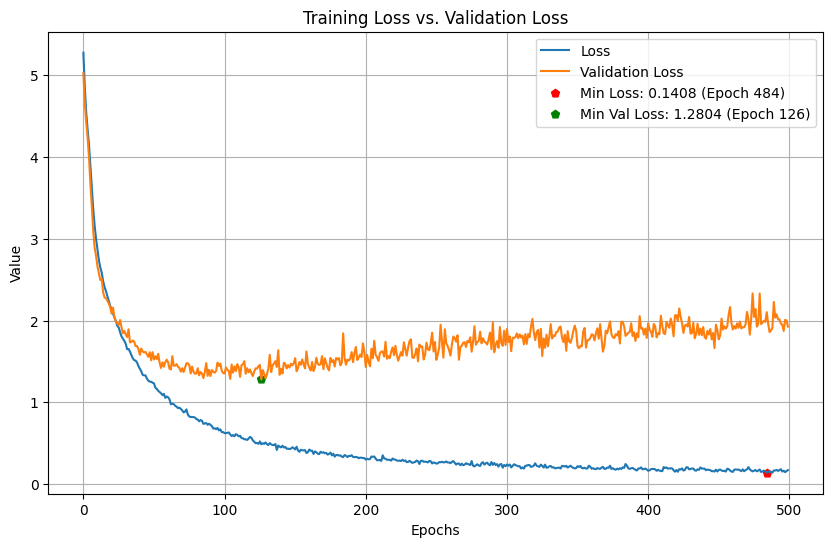

In [129]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

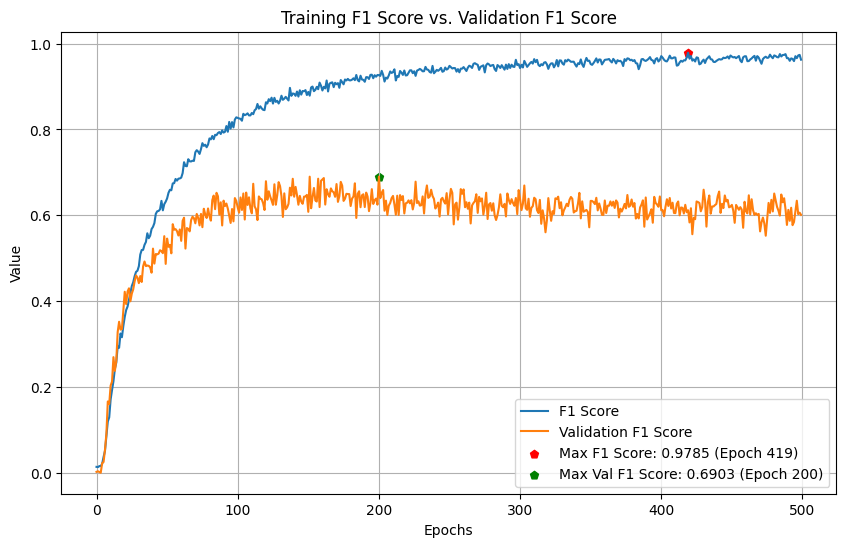

In [130]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [131]:
reconstructed_model = tf.keras.models.load_model("1 1D-CNN + 1 GRU Trial 593")

In [132]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 126, 175)          349300    
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 8, 175)           0         
 1D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 8, 175)            0         
                                                                 
 lstm_1 (LSTM)               (None, 200)               300800    
                                                                 
 dropout_3 (Dropout)         (None, 200)               0         
                                                                 
 dense_2 (Dense)             (None, 70)                14070     
                                                      

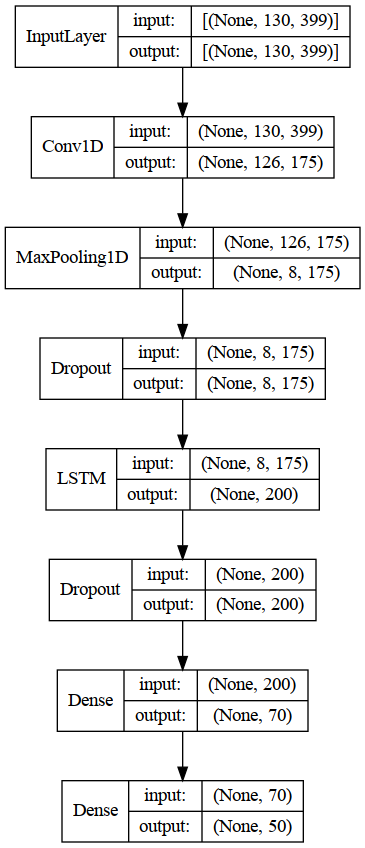

In [133]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

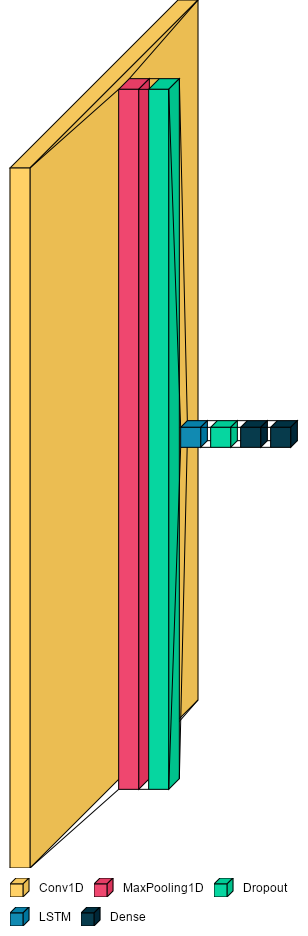

In [134]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [135]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 12ms/step - loss: 1.4317 - f1_score: 0.6903


[1.4316924810409546, 0.6902759075164795]

In [139]:
reconstructed_model.evaluate(Xtrain,Ytrain, batch_size=96)

28/28 [==============================] - 1s 28ms/step - loss: 0.1189 - f1_score: 0.9983


[0.11893798410892487, 0.9983316659927368]

In [145]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 10ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.600     1.000     0.750         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.385     0.500     0.435        10
        BELT      1.000     1.000     1.000         4
        BITE      0.667     0.750     0.706         8
   BREAKFAST      0.500     0.500     0.500         6
      CANCER      0.667     1.000     0.800         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.571     0.667     0.615         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.667     0.333     0.444         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      1.000     0.375     0.545         8
     DEVELOP      0.200     0.333     0.250         6
      DINNER      0.727     1.000     0.842         8
         DOG      1.000    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [142]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1D-CNN + 1 GRU Trial 593 Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [143]:
act_function = mish
model = Sequential()
model.add(Conv1D(filters=150,kernel_size=5,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=3))
model.add(Conv1D(filters=100,kernel_size=4,activation=act_function))
model.add(MaxPooling1D(pool_size=3))
model.add(Dropout(.45))
model.add(GRU(units=150,return_sequences=False,kernel_regularizer=regularizers.l2(.00042286793942433336)))
model.add(Dropout(.8))
model.add(Dense(units=80,activation=act_function))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.0019929796667454143),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 16s 393ms/step - loss: 3.9667 - f1_score: 0.0172 - val_loss: 3.8607 - val_f1_score: 0.0141
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.7361 - f1_score: 0.0426

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 302ms/step - loss: 3.7312 - f1_score: 0.0433 - val_loss: 3.3516 - val_f1_score: 0.0401
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3184 - f1_score: 0.0804

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 316ms/step - loss: 3.3134 - f1_score: 0.0802 - val_loss: 2.9673 - val_f1_score: 0.1203
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9599 - f1_score: 0.1299

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 287ms/step - loss: 2.9603 - f1_score: 0.1299 - val_loss: 2.5864 - val_f1_score: 0.1928
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6673 - f1_score: 0.1869

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 353ms/step - loss: 2.6639 - f1_score: 0.1888 - val_loss: 2.4057 - val_f1_score: 0.2342
Epoch 6/500
28/28 [==============================] - 1s 38ms/step - loss: 2.4485 - f1_score: 0.2398 - val_loss: 2.4523 - val_f1_score: 0.2228
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2810 - f1_score: 0.2762

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 365ms/step - loss: 2.2877 - f1_score: 0.2757 - val_loss: 2.1469 - val_f1_score: 0.3372
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1416 - f1_score: 0.3087

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 278ms/step - loss: 2.1425 - f1_score: 0.3100 - val_loss: 2.0119 - val_f1_score: 0.3734
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0281 - f1_score: 0.3592

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 2.0177 - f1_score: 0.3637 - val_loss: 1.8961 - val_f1_score: 0.4063
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9076 - f1_score: 0.3781

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 299ms/step - loss: 1.9047 - f1_score: 0.3801 - val_loss: 1.8452 - val_f1_score: 0.4213
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7888 - f1_score: 0.4269

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 296ms/step - loss: 1.7919 - f1_score: 0.4251 - val_loss: 1.7583 - val_f1_score: 0.4348
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6956 - f1_score: 0.4384

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 1.6909 - f1_score: 0.4396 - val_loss: 1.7644 - val_f1_score: 0.4443
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6276 - f1_score: 0.4761

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.6308 - f1_score: 0.4757 - val_loss: 1.8618 - val_f1_score: 0.4454
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5693 - f1_score: 0.4970

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 305ms/step - loss: 1.5655 - f1_score: 0.4973 - val_loss: 1.6262 - val_f1_score: 0.5272
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4783 - f1_score: 0.5471

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 1.4755 - f1_score: 0.5462 - val_loss: 1.5496 - val_f1_score: 0.5610
Epoch 16/500
28/28 [==============================] - 1s 38ms/step - loss: 1.4444 - f1_score: 0.5465 - val_loss: 1.4769 - val_f1_score: 0.5580
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3217 - f1_score: 0.5702

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 304ms/step - loss: 1.3279 - f1_score: 0.5694 - val_loss: 1.5161 - val_f1_score: 0.5745
Epoch 18/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2945 - f1_score: 0.5831

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 310ms/step - loss: 1.2985 - f1_score: 0.5821 - val_loss: 1.5370 - val_f1_score: 0.6069
Epoch 19/500
28/28 [==============================] - 1s 38ms/step - loss: 1.2852 - f1_score: 0.5878 - val_loss: 1.4281 - val_f1_score: 0.6045
Epoch 20/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2173 - f1_score: 0.6180

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 283ms/step - loss: 1.2179 - f1_score: 0.6184 - val_loss: 1.3851 - val_f1_score: 0.6276
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2130 - f1_score: 0.6124

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 282ms/step - loss: 1.2190 - f1_score: 0.6137 - val_loss: 1.2672 - val_f1_score: 0.6686
Epoch 22/500
28/28 [==============================] - 1s 38ms/step - loss: 1.1470 - f1_score: 0.6439 - val_loss: 1.3689 - val_f1_score: 0.6425
Epoch 23/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0645 - f1_score: 0.6726 - val_loss: 1.4077 - val_f1_score: 0.6420
Epoch 24/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0290 - f1_score: 0.6716 - val_loss: 1.4038 - val_f1_score: 0.6378
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0354 - f1_score: 0.6777

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.0409 - f1_score: 0.6763 - val_loss: 1.3490 - val_f1_score: 0.7047
Epoch 26/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0103 - f1_score: 0.6855 - val_loss: 1.3758 - val_f1_score: 0.6790
Epoch 27/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9848 - f1_score: 0.6917 - val_loss: 1.4690 - val_f1_score: 0.6577
Epoch 28/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9359 - f1_score: 0.7218 - val_loss: 1.2835 - val_f1_score: 0.6766
Epoch 29/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8999 - f1_score: 0.7260 - val_loss: 1.2871 - val_f1_score: 0.6809
Epoch 30/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8965 - f1_score: 0.7249 - val_loss: 1.2039 - val_f1_score: 0.6934
Epoch 31/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9033 - f1_score: 0.7138 - val_loss: 1.4615 - val_f1_score: 0.6660
Epoch 32/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 284ms/step - loss: 0.8174 - f1_score: 0.7546 - val_loss: 1.2110 - val_f1_score: 0.7237
Epoch 35/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8303 - f1_score: 0.7514 - val_loss: 1.2921 - val_f1_score: 0.7181
Epoch 36/500
28/28 [==============================] - 1s 40ms/step - loss: 0.8294 - f1_score: 0.7597 - val_loss: 1.2224 - val_f1_score: 0.7006
Epoch 37/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8137 - f1_score: 0.7575

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 315ms/step - loss: 0.8050 - f1_score: 0.7603 - val_loss: 1.2252 - val_f1_score: 0.7297
Epoch 38/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7157 - f1_score: 0.7861 - val_loss: 1.3177 - val_f1_score: 0.6965
Epoch 39/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7033 - f1_score: 0.7997 - val_loss: 1.2801 - val_f1_score: 0.6963
Epoch 40/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7124 - f1_score: 0.7809 - val_loss: 1.2912 - val_f1_score: 0.7022
Epoch 41/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7062 - f1_score: 0.7906

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 290ms/step - loss: 0.7047 - f1_score: 0.7913 - val_loss: 1.2573 - val_f1_score: 0.7314
Epoch 42/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6807 - f1_score: 0.7985 - val_loss: 1.3909 - val_f1_score: 0.6925
Epoch 43/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6624 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 314ms/step - loss: 0.6617 - f1_score: 0.8074 - val_loss: 1.3076 - val_f1_score: 0.7417
Epoch 44/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6426 - f1_score: 0.8186 - val_loss: 1.2638 - val_f1_score: 0.7152
Epoch 45/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6595 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 320ms/step - loss: 0.6617 - f1_score: 0.8073 - val_loss: 1.1966 - val_f1_score: 0.7534
Epoch 46/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6622 - f1_score: 0.8199 - val_loss: 1.3031 - val_f1_score: 0.7242
Epoch 47/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6536 - f1_score: 0.8083

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 303ms/step - loss: 0.6538 - f1_score: 0.8080 - val_loss: 1.2127 - val_f1_score: 0.7642
Epoch 48/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6251 - f1_score: 0.8191

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 340ms/step - loss: 0.6254 - f1_score: 0.8205 - val_loss: 1.1647 - val_f1_score: 0.7687
Epoch 49/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5900 - f1_score: 0.8253 - val_loss: 1.1282 - val_f1_score: 0.7619
Epoch 50/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5942 - f1_score: 0.8320 - val_loss: 1.3222 - val_f1_score: 0.7546
Epoch 51/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5728 - f1_score: 0.8395 - val_loss: 1.2784 - val_f1_score: 0.7537
Epoch 52/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5521 - f1_score: 0.8477 - val_loss: 1.2723 - val_f1_score: 0.7475
Epoch 53/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5369 - f1_score: 0.8532 - val_loss: 1.4468 - val_f1_score: 0.7328
Epoch 54/500
28/28 [==============================] - 1s 40ms/step - loss: 0.5949 - f1_score: 0.8333 - val_loss: 1.5265 - val_f1_score: 0.7164
Epoch 55/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 307ms/step - loss: 0.5069 - f1_score: 0.8696 - val_loss: 1.2423 - val_f1_score: 0.7856
Epoch 63/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4884 - f1_score: 0.8732 - val_loss: 1.3165 - val_f1_score: 0.7761
Epoch 64/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4702 - f1_score: 0.8757 - val_loss: 1.4028 - val_f1_score: 0.7699
Epoch 65/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5113 - f1_score: 0.8732 - val_loss: 1.2855 - val_f1_score: 0.7503
Epoch 66/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5086 - f1_score: 0.8696 - val_loss: 1.3848 - val_f1_score: 0.7590
Epoch 67/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4775 - f1_score: 0.8754 - val_loss: 1.3450 - val_f1_score: 0.7756
Epoch 68/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4754 - f1_score: 0.8743 - val_loss: 1.3393 - val_f1_score: 0.7716
Epoch 69/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 277ms/step - loss: 0.4828 - f1_score: 0.8730 - val_loss: 1.2616 - val_f1_score: 0.7975
Epoch 71/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4476 - f1_score: 0.8826 - val_loss: 1.3496 - val_f1_score: 0.7769
Epoch 72/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4624 - f1_score: 0.8811 - val_loss: 1.4625 - val_f1_score: 0.7400
Epoch 73/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4539 - f1_score: 0.8810 - val_loss: 1.4245 - val_f1_score: 0.7796
Epoch 74/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3916 - f1_score: 0.8947 - val_loss: 1.4351 - val_f1_score: 0.7735
Epoch 75/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4319 - f1_score: 0.8911

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 354ms/step - loss: 0.4295 - f1_score: 0.8918 - val_loss: 1.2109 - val_f1_score: 0.8030
Epoch 76/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4448 - f1_score: 0.8869 - val_loss: 1.3074 - val_f1_score: 0.7850
Epoch 77/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4289 - f1_score: 0.8902 - val_loss: 1.2743 - val_f1_score: 0.7701
Epoch 78/500
28/28 [==============================] - 1s 40ms/step - loss: 0.4196 - f1_score: 0.8935 - val_loss: 1.4083 - val_f1_score: 0.7783
Epoch 79/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4741 - f1_score: 0.8807 - val_loss: 1.3937 - val_f1_score: 0.7936
Epoch 80/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4693 - f1_score: 0.8827 - val_loss: 1.3758 - val_f1_score: 0.7986
Epoch 81/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4861 - f1_score: 0.8691 - val_loss: 1.3154 - val_f1_score: 0.7725
Epoch 82/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 0.4051 - f1_score: 0.9021 - val_loss: 1.2125 - val_f1_score: 0.8054
Epoch 85/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4367 - f1_score: 0.8896

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.4366 - f1_score: 0.8888 - val_loss: 1.2861 - val_f1_score: 0.8080
Epoch 86/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4541 - f1_score: 0.8931 - val_loss: 1.4048 - val_f1_score: 0.7896
Epoch 87/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4424 - f1_score: 0.8865 - val_loss: 1.2911 - val_f1_score: 0.7939
Epoch 88/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4577 - f1_score: 0.8921 - val_loss: 1.4341 - val_f1_score: 0.7795
Epoch 89/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4323 - f1_score: 0.8912 - val_loss: 1.4458 - val_f1_score: 0.7512
Epoch 90/500
28/28 [==============================] - 1s 38ms/step - loss: 0.3862 - f1_score: 0.9046 - val_loss: 1.4521 - val_f1_score: 0.7835
Epoch 91/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4301 - f1_score: 0.8951 - val_loss: 1.3661 - val_f1_score: 0.7832
Epoch 92/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.4018 - f1_score: 0.9080 - val_loss: 1.4065 - val_f1_score: 0.8127
Epoch 111/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3813 - f1_score: 0.9143 - val_loss: 1.4458 - val_f1_score: 0.7976
Epoch 112/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3979 - f1_score: 0.9090 - val_loss: 1.5291 - val_f1_score: 0.7805
Epoch 113/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3954 - f1_score: 0.9087 - val_loss: 1.4778 - val_f1_score: 0.7706
Epoch 114/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3852 - f1_score: 0.9093 - val_loss: 1.5232 - val_f1_score: 0.7886
Epoch 115/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4268 - f1_score: 0.8951 - val_loss: 1.3973 - val_f1_score: 0.8067
Epoch 116/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3486 - f1_score: 0.9218 - val_loss: 1.2990 - val_f1_score: 0.8106
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.3205 - f1_score: 0.9379 - val_loss: 1.2689 - val_f1_score: 0.8406
Epoch 144/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3410 - f1_score: 0.9286 - val_loss: 1.4219 - val_f1_score: 0.7808
Epoch 145/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3155 - f1_score: 0.9325 - val_loss: 1.3326 - val_f1_score: 0.7909
Epoch 146/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2974 - f1_score: 0.9390 - val_loss: 1.3369 - val_f1_score: 0.8048
Epoch 147/500
28/28 [==============================] - 1s 42ms/step - loss: 0.3200 - f1_score: 0.9370 - val_loss: 1.3570 - val_f1_score: 0.8323
Epoch 148/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3099 - f1_score: 0.9325 - val_loss: 1.3147 - val_f1_score: 0.7869
Epoch 149/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3270 - f1_score: 0.9264 - val_loss: 1.2507 - val_f1_score: 0.8189
Epoch

Epoch 200/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3563 - f1_score: 0.9280 - val_loss: 1.3826 - val_f1_score: 0.8211
Epoch 201/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3084 - f1_score: 0.9374 - val_loss: 1.4495 - val_f1_score: 0.8218
Epoch 202/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3116 - f1_score: 0.9363 - val_loss: 1.4158 - val_f1_score: 0.8383
Epoch 203/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2682 - f1_score: 0.9444 - val_loss: 1.3949 - val_f1_score: 0.8230
Epoch 204/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2683 - f1_score: 0.9547 - val_loss: 1.4956 - val_f1_score: 0.8132
Epoch 205/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2790 - f1_score: 0.9456 - val_loss: 1.5248 - val_f1_score: 0.8048
Epoch 206/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3191 - f1_score: 0.9363 - val_loss: 1.5763 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 376ms/step - loss: 0.2881 - f1_score: 0.9446 - val_loss: 1.3258 - val_f1_score: 0.8420
Epoch 210/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3227 - f1_score: 0.9377 - val_loss: 1.2618 - val_f1_score: 0.8348
Epoch 211/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2755 - f1_score: 0.9459 - val_loss: 1.3257 - val_f1_score: 0.8113
Epoch 212/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3465 - f1_score: 0.9330 - val_loss: 1.3949 - val_f1_score: 0.8084
Epoch 213/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2943 - f1_score: 0.9399 - val_loss: 1.3821 - val_f1_score: 0.8172
Epoch 214/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2737 - f1_score: 0.9496 - val_loss: 1.5960 - val_f1_score: 0.7923
Epoch 215/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2224 - f1_score: 0.9596 - val_loss: 1.4672 - val_f1_score: 0.8193
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.2923 - f1_score: 0.9437 - val_loss: 1.2688 - val_f1_score: 0.8473
Epoch 246/500
27/28 [===========================>..] - ETA: 0s - loss: 0.2543 - f1_score: 0.9548

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.2536 - f1_score: 0.9558 - val_loss: 1.4264 - val_f1_score: 0.8482
Epoch 247/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2807 - f1_score: 0.9457 - val_loss: 1.3389 - val_f1_score: 0.8365
Epoch 248/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2305 - f1_score: 0.9575 - val_loss: 1.5210 - val_f1_score: 0.8251
Epoch 249/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2848 - f1_score: 0.9559 - val_loss: 1.5312 - val_f1_score: 0.8237
Epoch 250/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2660 - f1_score: 0.9522 - val_loss: 1.4814 - val_f1_score: 0.8185
Epoch 251/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2575 - f1_score: 0.9507 - val_loss: 1.3259 - val_f1_score: 0.8290
Epoch 252/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2840 - f1_score: 0.9470 - val_loss: 1.4630 - val_f1_score: 0.8256
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3059 - f1_score: 0.9431 - val_loss: 1.2551 - val_f1_score: 0.8492
Epoch 301/500
28/28 [==============================] - ETA: 0s - loss: 0.3349 - f1_score: 0.9390

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3349 - f1_score: 0.9390 - val_loss: 1.2706 - val_f1_score: 0.8586
Epoch 302/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3181 - f1_score: 0.9368 - val_loss: 1.4708 - val_f1_score: 0.8246
Epoch 303/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2969 - f1_score: 0.9450 - val_loss: 1.4686 - val_f1_score: 0.7998
Epoch 304/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3777 - f1_score: 0.9248 - val_loss: 1.6342 - val_f1_score: 0.7976
Epoch 305/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3869 - f1_score: 0.9293 - val_loss: 1.6567 - val_f1_score: 0.8005
Epoch 306/500
28/28 [==============================] - 1s 45ms/step - loss: 0.3615 - f1_score: 0.9263 - val_loss: 1.3916 - val_f1_score: 0.8201
Epoch 307/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3177 - f1_score: 0.9431 - val_loss: 1.4371 - val_f1_score: 0.8344
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 357ms/step - loss: 0.2622 - f1_score: 0.9570 - val_loss: 1.2373 - val_f1_score: 0.8632
Epoch 315/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2744 - f1_score: 0.9498 - val_loss: 1.4353 - val_f1_score: 0.8167
Epoch 316/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2780 - f1_score: 0.9528 - val_loss: 1.4913 - val_f1_score: 0.8220
Epoch 317/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3100 - f1_score: 0.9426 - val_loss: 1.4050 - val_f1_score: 0.8283
Epoch 318/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2650 - f1_score: 0.9532 - val_loss: 1.3959 - val_f1_score: 0.8295
Epoch 319/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2948 - f1_score: 0.9471 - val_loss: 1.4728 - val_f1_score: 0.8279
Epoch 320/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3391 - f1_score: 0.9381 - val_loss: 1.5978 - val_f1_score: 0.8159
Epoc

Epoch 371/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2947 - f1_score: 0.9486 - val_loss: 1.3573 - val_f1_score: 0.8327
Epoch 372/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2631 - f1_score: 0.9550 - val_loss: 1.3874 - val_f1_score: 0.8241
Epoch 373/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2653 - f1_score: 0.9546 - val_loss: 1.4747 - val_f1_score: 0.8049
Epoch 374/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2998 - f1_score: 0.9445 - val_loss: 1.4636 - val_f1_score: 0.8000
Epoch 375/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3190 - f1_score: 0.9401 - val_loss: 1.5476 - val_f1_score: 0.7866
Epoch 376/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3405 - f1_score: 0.9382 - val_loss: 1.7437 - val_f1_score: 0.7589
Epoch 377/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3574 - f1_score: 0.9263 - val_loss: 1.4167 - val_f1_score:

Epoch 428/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2774 - f1_score: 0.9540 - val_loss: 1.2858 - val_f1_score: 0.8339
Epoch 429/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2484 - f1_score: 0.9658 - val_loss: 1.3933 - val_f1_score: 0.8291
Epoch 430/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3124 - f1_score: 0.9406 - val_loss: 1.5266 - val_f1_score: 0.8076
Epoch 431/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3084 - f1_score: 0.9451 - val_loss: 1.5568 - val_f1_score: 0.8254
Epoch 432/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4646 - f1_score: 0.9133 - val_loss: 1.6142 - val_f1_score: 0.7936
Epoch 433/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4199 - f1_score: 0.9187 - val_loss: 1.3645 - val_f1_score: 0.8327
Epoch 434/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3242 - f1_score: 0.9336 - val_loss: 1.4465 - val_f1_score:

Epoch 485/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2809 - f1_score: 0.9546 - val_loss: 1.4180 - val_f1_score: 0.8297
Epoch 486/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2660 - f1_score: 0.9578 - val_loss: 1.3024 - val_f1_score: 0.8478
Epoch 487/500
28/28 [==============================] - 1s 42ms/step - loss: 0.2623 - f1_score: 0.9616 - val_loss: 1.4289 - val_f1_score: 0.8112
Epoch 488/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2784 - f1_score: 0.9506 - val_loss: 1.3807 - val_f1_score: 0.8359
Epoch 489/500
28/28 [==============================] - 1s 43ms/step - loss: 0.2505 - f1_score: 0.9616 - val_loss: 1.3522 - val_f1_score: 0.8230
Epoch 490/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2932 - f1_score: 0.9511 - val_loss: 1.4428 - val_f1_score: 0.8001
Epoch 491/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3413 - f1_score: 0.9392 - val_loss: 1.4841 - val_f1_score:

In [144]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1D-CNN + 1 GRU Trial 593 Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [189]:
hist_df = pd.read_csv('1 1D-CNN + 1 GRU Trial 593 Mish/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.292308,0.950895,1.380354,0.842725
496,0.255275,0.959189,1.380063,0.829194
497,0.282479,0.953392,1.341682,0.829057
498,0.325660,0.946974,1.480074,0.813747
499,0.343594,0.937179,1.455086,0.817053


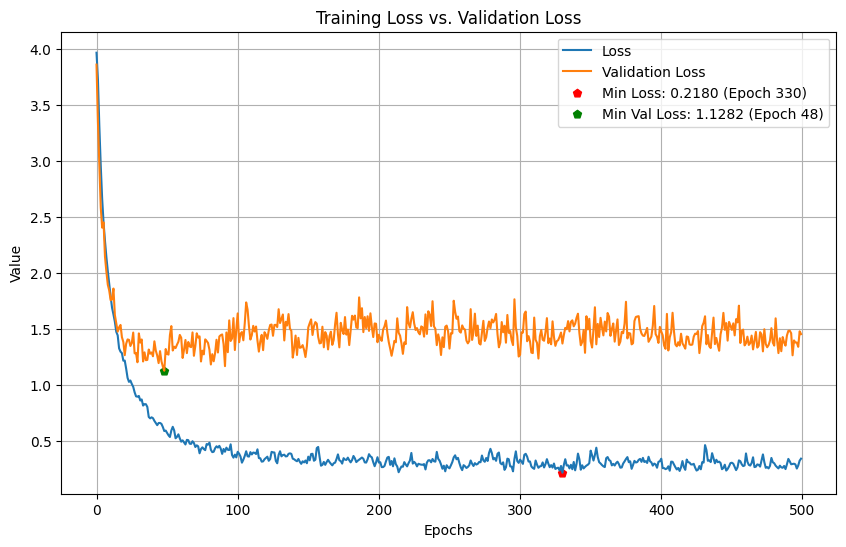

In [190]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

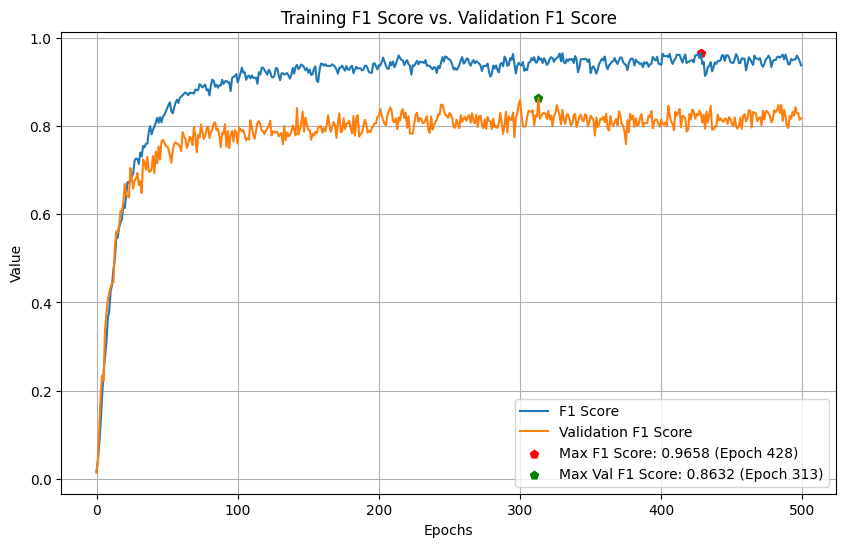

In [191]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [147]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      1.000     0.700     0.824        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.462     1.000     0.632         6
      CANCER      0.727     1.000     0.842         8
   CHRISTMAS      1.000     0.833     0.909         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.571     0.667     0.615         6
      DINNER      1.000     0.875     0.933         8
         DOG      0.667     

In [155]:
reconstructed_model = tf.keras.models.load_model("1 1D-CNN + 1 GRU Trial 593 Mish")

In [149]:
reconstructed_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

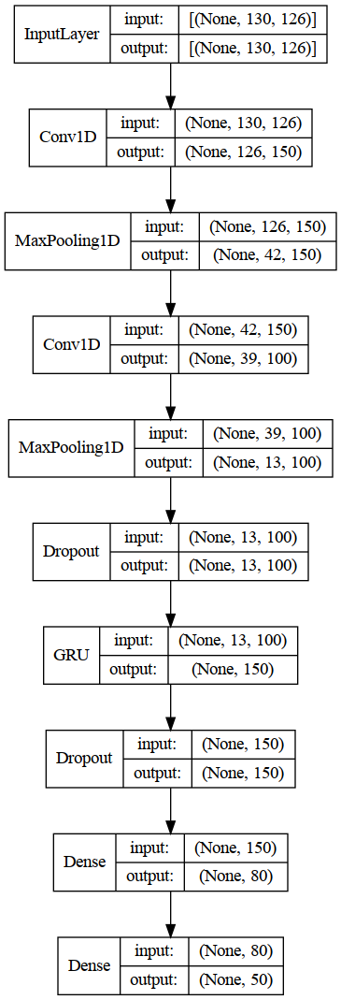

In [150]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

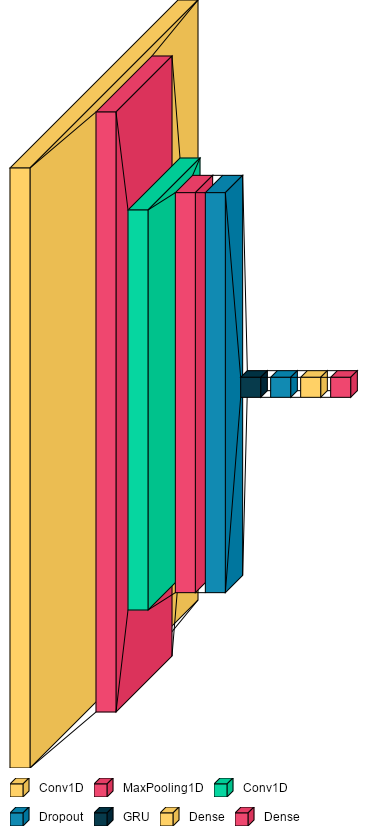

In [156]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [151]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 7ms/step - loss: 1.2373 - f1_score: 0.8632


[1.2372610569000244, 0.8632017374038696]

In [153]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 8ms/step - loss: 0.1030 - f1_score: 1.0000


[0.10299792885780334, 1.0]

In [154]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.800     0.667     0.727         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     1.000     1.000        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     0.833     0.909         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      0.600     1.000     0.750         6
      DINNER      1.000     0.750     0.857         8
         DOG      1.000     

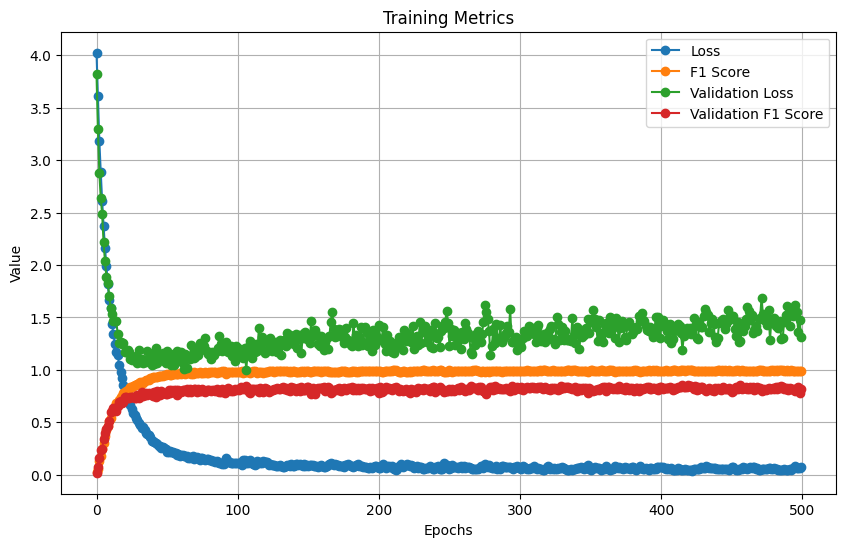

In [249]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

### 1 1D-CNN + 1 GRU Trial 722

In [122]:
best_model = tuner.get_best_models(num_models=4)[3]

2023-09-10 12:59:01.744461: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-10 12:59:01.829255: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1739 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


In [123]:
best_model.evaluate(Xtrain,Ytrain)

2023-09-10 12:59:08.643058: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700


84/84 [==============================] - 2s 16ms/step - loss: 0.3788 - f1_score: 0.9373


[0.378775417804718, 0.937265157699585]

In [124]:
best_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 13ms/step - loss: 1.3141 - f1_score: 0.7039


[1.3140639066696167, 0.7038748860359192]

In [125]:
bestHP = tuner.get_best_hyperparameters(num_trials=4)[3]

In [135]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1D-CNN + 1 GRU Trial 722/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [128]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - 6s 66ms/step - loss: 4.4913 - f1_score: 0.0132 - val_loss: 4.2939 - val_f1_score: 0.0024
Epoch 2/500
28/28 [==============================] - 1s 45ms/step - loss: 4.3471 - f1_score: 0.0175 - val_loss: 4.2162 - val_f1_score: 0.0033
Epoch 3/500
28/28 [==============================] - 1s 47ms/step - loss: 4.2634 - f1_score: 0.0224 - val_loss: 4.1491 - val_f1_score: 4.9383e-04
Epoch 4/500
28/28 [==============================] - 1s 47ms/step - loss: 4.1544 - f1_score: 0.0301 - val_loss: 4.0304 - val_f1_score: 0.0064
Epoch 5/500
28/28 [==============================] - 1s 46ms/step - loss: 4.0011 - f1_score: 0.0300 - val_loss: 3.8192 - val_f1_score: 0.0141
Epoch 6/500
28/28 [==============================] - 1s 45ms/step - loss: 3.8288 - f1_score: 0.0393 - val_loss: 3.6681 - val_f1_score: 0.0194
Epoch 7/500
28/28 [==============================] - 1s 47ms/step - loss: 3.6833 - f1_score: 0.0474 - val_loss

28/28 [==============================] - 1s 51ms/step - loss: 1.1912 - f1_score: 0.6427 - val_loss: 1.4425 - val_f1_score: 0.5963
Epoch 59/500
28/28 [==============================] - 1s 53ms/step - loss: 1.1515 - f1_score: 0.6479 - val_loss: 1.3729 - val_f1_score: 0.6189
Epoch 60/500
28/28 [==============================] - 1s 51ms/step - loss: 1.1243 - f1_score: 0.6637 - val_loss: 1.5107 - val_f1_score: 0.6013
Epoch 61/500
28/28 [==============================] - 1s 52ms/step - loss: 1.1235 - f1_score: 0.6597 - val_loss: 1.4275 - val_f1_score: 0.6064
Epoch 62/500
28/28 [==============================] - 1s 52ms/step - loss: 1.1068 - f1_score: 0.6823 - val_loss: 1.4000 - val_f1_score: 0.6122
Epoch 63/500
28/28 [==============================] - 1s 52ms/step - loss: 1.0730 - f1_score: 0.6774 - val_loss: 1.4174 - val_f1_score: 0.6130
Epoch 64/500
28/28 [==============================] - 1s 49ms/step - loss: 1.0516 - f1_score: 0.6885 - val_loss: 1.5048 - val_f1_score: 0.6043
Epoch 65/500

Epoch 172/500
28/28 [==============================] - 1s 53ms/step - loss: 0.4431 - f1_score: 0.8933 - val_loss: 1.8925 - val_f1_score: 0.5696
Epoch 173/500
28/28 [==============================] - 2s 76ms/step - loss: 0.4361 - f1_score: 0.8898 - val_loss: 1.9233 - val_f1_score: 0.5655
Epoch 174/500
28/28 [==============================] - 2s 56ms/step - loss: 0.4164 - f1_score: 0.8924 - val_loss: 2.0031 - val_f1_score: 0.5704
Epoch 175/500
28/28 [==============================] - 2s 62ms/step - loss: 0.4452 - f1_score: 0.8854 - val_loss: 1.9587 - val_f1_score: 0.5394
Epoch 176/500
28/28 [==============================] - 2s 67ms/step - loss: 0.4302 - f1_score: 0.8853 - val_loss: 1.8683 - val_f1_score: 0.5941
Epoch 177/500
28/28 [==============================] - 2s 68ms/step - loss: 0.3999 - f1_score: 0.8975 - val_loss: 1.7817 - val_f1_score: 0.5869
Epoch 178/500
28/28 [==============================] - 2s 55ms/step - loss: 0.4358 - f1_score: 0.8931 - val_loss: 1.8897 - val_f1_score:

Epoch 229/500
28/28 [==============================] - 2s 59ms/step - loss: 0.3495 - f1_score: 0.9189 - val_loss: 2.0928 - val_f1_score: 0.5916
Epoch 230/500
28/28 [==============================] - 1s 52ms/step - loss: 0.3705 - f1_score: 0.9083 - val_loss: 2.0628 - val_f1_score: 0.5837
Epoch 231/500
28/28 [==============================] - 1s 52ms/step - loss: 0.3225 - f1_score: 0.9259 - val_loss: 2.0165 - val_f1_score: 0.5943
Epoch 232/500
28/28 [==============================] - 2s 68ms/step - loss: 0.3316 - f1_score: 0.9234 - val_loss: 1.8203 - val_f1_score: 0.5898
Epoch 233/500
28/28 [==============================] - 2s 59ms/step - loss: 0.3277 - f1_score: 0.9242 - val_loss: 1.8186 - val_f1_score: 0.5838
Epoch 234/500
28/28 [==============================] - 2s 78ms/step - loss: 0.3258 - f1_score: 0.9287 - val_loss: 1.7809 - val_f1_score: 0.6108
Epoch 235/500
28/28 [==============================] - 2s 62ms/step - loss: 0.3729 - f1_score: 0.9090 - val_loss: 2.0549 - val_f1_score:

Epoch 286/500
28/28 [==============================] - 1s 49ms/step - loss: 0.2898 - f1_score: 0.9308 - val_loss: 2.1358 - val_f1_score: 0.5669
Epoch 287/500
28/28 [==============================] - 1s 52ms/step - loss: 0.3287 - f1_score: 0.9224 - val_loss: 2.1449 - val_f1_score: 0.5886
Epoch 288/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2734 - f1_score: 0.9404 - val_loss: 1.9230 - val_f1_score: 0.6156
Epoch 289/500
28/28 [==============================] - 1s 51ms/step - loss: 0.2778 - f1_score: 0.9345 - val_loss: 2.0006 - val_f1_score: 0.5828
Epoch 290/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2872 - f1_score: 0.9333 - val_loss: 1.8863 - val_f1_score: 0.5894
Epoch 291/500
28/28 [==============================] - 1s 51ms/step - loss: 0.2923 - f1_score: 0.9336 - val_loss: 2.0211 - val_f1_score: 0.5476
Epoch 292/500
28/28 [==============================] - 1s 51ms/step - loss: 0.2870 - f1_score: 0.9340 - val_loss: 2.0100 - val_f1_score:

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=100.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



28/28 [==============================] - 1s 52ms/step - loss: 0.2710 - f1_score: 0.9450 - val_loss: 2.3143 - val_f1_score: 0.5509
Epoch 338/500
28/28 [==============================] - 2s 75ms/step - loss: 0.2840 - f1_score: 0.9330 - val_loss: 2.1068 - val_f1_score: 0.5666
Epoch 339/500
28/28 [==============================] - 2s 88ms/step - loss: 0.2802 - f1_score: 0.9386 - val_loss: 1.9735 - val_f1_score: 0.6025
Epoch 340/500
28/28 [==============================] - 1s 53ms/step - loss: 0.3007 - f1_score: 0.9336 - val_loss: 2.2491 - val_f1_score: 0.5759
Epoch 341/500
28/28 [==============================] - 1s 51ms/step - loss: 0.2723 - f1_score: 0.9408 - val_loss: 2.0719 - val_f1_score: 0.5968
Epoch 342/500
28/28 [==============================] - 2s 65ms/step - loss: 0.2822 - f1_score: 0.9399 - val_loss: 2.0870 - val_f1_score: 0.5768
Epoch 343/500
28/28 [==============================] - 2s 79ms/step - loss: 0.2632 - f1_score: 0.9429 - val_loss: 2.1402 - val_f1_score: 0.5586
Epoch 

Epoch 394/500
28/28 [==============================] - 1s 53ms/step - loss: 0.2541 - f1_score: 0.9445 - val_loss: 2.1549 - val_f1_score: 0.6041
Epoch 395/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2592 - f1_score: 0.9406 - val_loss: 2.3016 - val_f1_score: 0.5375
Epoch 396/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2565 - f1_score: 0.9377 - val_loss: 2.2205 - val_f1_score: 0.5686
Epoch 397/500
28/28 [==============================] - 1s 51ms/step - loss: 0.3111 - f1_score: 0.9329 - val_loss: 2.5880 - val_f1_score: 0.5306
Epoch 398/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2806 - f1_score: 0.9410 - val_loss: 2.0899 - val_f1_score: 0.5908
Epoch 399/500
28/28 [==============================] - 1s 53ms/step - loss: 0.2610 - f1_score: 0.9429 - val_loss: 2.0529 - val_f1_score: 0.5777
Epoch 400/500
28/28 [==============================] - 2s 69ms/step - loss: 0.2592 - f1_score: 0.9432 - val_loss: 2.1898 - val_f1_score:

Epoch 451/500
28/28 [==============================] - 2s 65ms/step - loss: 0.2166 - f1_score: 0.9540 - val_loss: 2.2050 - val_f1_score: 0.5867
Epoch 452/500
28/28 [==============================] - 2s 71ms/step - loss: 0.2438 - f1_score: 0.9473 - val_loss: 2.2879 - val_f1_score: 0.5593
Epoch 453/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2323 - f1_score: 0.9568 - val_loss: 2.5191 - val_f1_score: 0.5242
Epoch 454/500
28/28 [==============================] - 2s 74ms/step - loss: 0.2591 - f1_score: 0.9456 - val_loss: 2.2588 - val_f1_score: 0.5570
Epoch 455/500
28/28 [==============================] - 2s 61ms/step - loss: 0.2123 - f1_score: 0.9587 - val_loss: 2.2691 - val_f1_score: 0.5505
Epoch 456/500
28/28 [==============================] - 2s 57ms/step - loss: 0.2844 - f1_score: 0.9411 - val_loss: 2.4451 - val_f1_score: 0.5472
Epoch 457/500
28/28 [==============================] - 2s 61ms/step - loss: 0.2204 - f1_score: 0.9573 - val_loss: 2.3627 - val_f1_score:

In [129]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 11ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.545     1.000     0.706         6
  BASKETBALL      1.000     0.900     0.947        10
         BEE      0.400     0.600     0.480        10
        BELT      1.000     1.000     1.000         4
        BITE      0.000     0.000     0.000         8
   BREAKFAST      1.000     0.333     0.500         6
      CANCER      0.727     1.000     0.842         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      0.500     0.667     0.571         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.222     0.333     0.267         6
      DECIDE      0.800     0.667     0.727         6
      DEMAND      0.556     0.625     0.588         8
     DEVELOP      0.667     0.333     0.444         6
      DINNER      0.417     0.625     0.500         8
         DOG      1.000    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [136]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1D-CNN + 1 GRU Trial 722/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [137]:
hist_df = pd.read_csv('1 1D-CNN + 1 GRU Trial 722/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.250688,0.953667,2.386311,0.527218
496,0.223631,0.955230,2.453648,0.557660
497,0.219138,0.955886,2.528255,0.543529
498,0.208526,0.957454,2.337018,0.562749
499,0.205952,0.959380,2.586490,0.562547


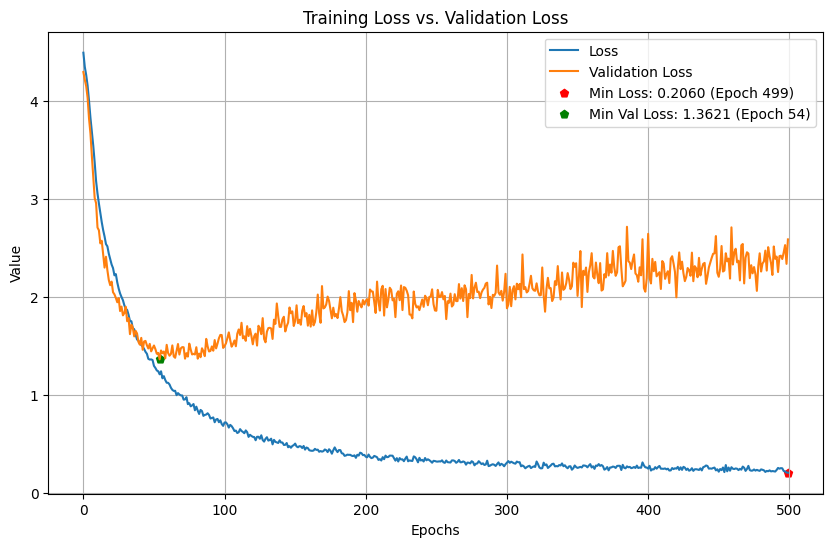

In [138]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

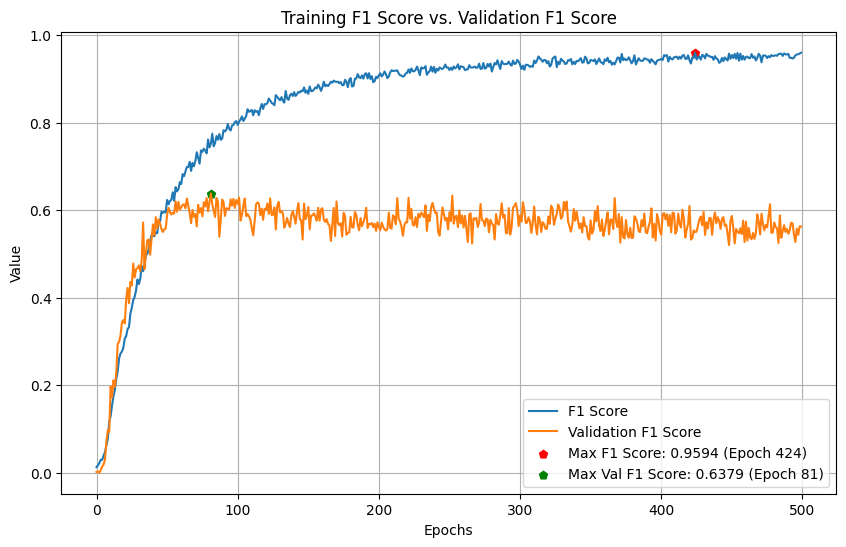

In [139]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [131]:
reconstructed_model = tf.keras.models.load_model("1 1D-CNN + 1 GRU Trial 722")

In [132]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 126, 175)          349300    
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 8, 175)           0         
 1D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 8, 175)            0         
                                                                 
 lstm_1 (LSTM)               (None, 200)               300800    
                                                                 
 dropout_3 (Dropout)         (None, 200)               0         
                                                                 
 dense_2 (Dense)             (None, 70)                14070     
                                                      

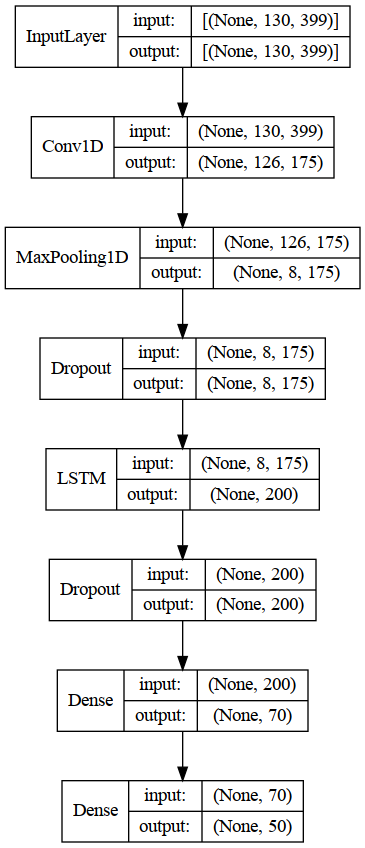

In [133]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

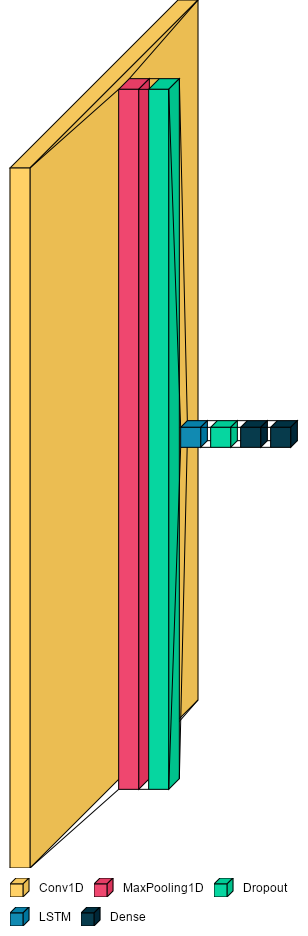

In [134]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [135]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 12ms/step - loss: 1.4317 - f1_score: 0.6903


[1.4316924810409546, 0.6902759075164795]

In [139]:
reconstructed_model.evaluate(Xtrain,Ytrain, batch_size=96)

28/28 [==============================] - 1s 28ms/step - loss: 0.1189 - f1_score: 0.9983


[0.11893798410892487, 0.9983316659927368]

In [145]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 10ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.600     1.000     0.750         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.385     0.500     0.435        10
        BELT      1.000     1.000     1.000         4
        BITE      0.667     0.750     0.706         8
   BREAKFAST      0.500     0.500     0.500         6
      CANCER      0.667     1.000     0.800         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.571     0.667     0.615         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.667     0.333     0.444         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      1.000     0.375     0.545         8
     DEVELOP      0.200     0.333     0.250         6
      DINNER      0.727     1.000     0.842         8
         DOG      1.000    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [142]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1D-CNN + 1 GRU Trial 722 Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [143]:
act_function = mish
model = Sequential()
model.add(Conv1D(filters=150,kernel_size=5,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=3))
model.add(Conv1D(filters=100,kernel_size=4,activation=act_function))
model.add(MaxPooling1D(pool_size=3))
model.add(Dropout(.45))
model.add(GRU(units=150,return_sequences=False,kernel_regularizer=regularizers.l2(.00042286793942433336)))
model.add(Dropout(.8))
model.add(Dense(units=80,activation=act_function))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.0019929796667454143),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 16s 393ms/step - loss: 3.9667 - f1_score: 0.0172 - val_loss: 3.8607 - val_f1_score: 0.0141
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.7361 - f1_score: 0.0426

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 302ms/step - loss: 3.7312 - f1_score: 0.0433 - val_loss: 3.3516 - val_f1_score: 0.0401
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3184 - f1_score: 0.0804

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 316ms/step - loss: 3.3134 - f1_score: 0.0802 - val_loss: 2.9673 - val_f1_score: 0.1203
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9599 - f1_score: 0.1299

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 287ms/step - loss: 2.9603 - f1_score: 0.1299 - val_loss: 2.5864 - val_f1_score: 0.1928
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6673 - f1_score: 0.1869

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 353ms/step - loss: 2.6639 - f1_score: 0.1888 - val_loss: 2.4057 - val_f1_score: 0.2342
Epoch 6/500
28/28 [==============================] - 1s 38ms/step - loss: 2.4485 - f1_score: 0.2398 - val_loss: 2.4523 - val_f1_score: 0.2228
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2810 - f1_score: 0.2762

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 365ms/step - loss: 2.2877 - f1_score: 0.2757 - val_loss: 2.1469 - val_f1_score: 0.3372
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1416 - f1_score: 0.3087

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 278ms/step - loss: 2.1425 - f1_score: 0.3100 - val_loss: 2.0119 - val_f1_score: 0.3734
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0281 - f1_score: 0.3592

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 2.0177 - f1_score: 0.3637 - val_loss: 1.8961 - val_f1_score: 0.4063
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9076 - f1_score: 0.3781

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 299ms/step - loss: 1.9047 - f1_score: 0.3801 - val_loss: 1.8452 - val_f1_score: 0.4213
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7888 - f1_score: 0.4269

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 296ms/step - loss: 1.7919 - f1_score: 0.4251 - val_loss: 1.7583 - val_f1_score: 0.4348
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6956 - f1_score: 0.4384

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 1.6909 - f1_score: 0.4396 - val_loss: 1.7644 - val_f1_score: 0.4443
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6276 - f1_score: 0.4761

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.6308 - f1_score: 0.4757 - val_loss: 1.8618 - val_f1_score: 0.4454
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5693 - f1_score: 0.4970

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 305ms/step - loss: 1.5655 - f1_score: 0.4973 - val_loss: 1.6262 - val_f1_score: 0.5272
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4783 - f1_score: 0.5471

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 1.4755 - f1_score: 0.5462 - val_loss: 1.5496 - val_f1_score: 0.5610
Epoch 16/500
28/28 [==============================] - 1s 38ms/step - loss: 1.4444 - f1_score: 0.5465 - val_loss: 1.4769 - val_f1_score: 0.5580
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3217 - f1_score: 0.5702

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 304ms/step - loss: 1.3279 - f1_score: 0.5694 - val_loss: 1.5161 - val_f1_score: 0.5745
Epoch 18/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2945 - f1_score: 0.5831

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 310ms/step - loss: 1.2985 - f1_score: 0.5821 - val_loss: 1.5370 - val_f1_score: 0.6069
Epoch 19/500
28/28 [==============================] - 1s 38ms/step - loss: 1.2852 - f1_score: 0.5878 - val_loss: 1.4281 - val_f1_score: 0.6045
Epoch 20/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2173 - f1_score: 0.6180

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 283ms/step - loss: 1.2179 - f1_score: 0.6184 - val_loss: 1.3851 - val_f1_score: 0.6276
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2130 - f1_score: 0.6124

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 282ms/step - loss: 1.2190 - f1_score: 0.6137 - val_loss: 1.2672 - val_f1_score: 0.6686
Epoch 22/500
28/28 [==============================] - 1s 38ms/step - loss: 1.1470 - f1_score: 0.6439 - val_loss: 1.3689 - val_f1_score: 0.6425
Epoch 23/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0645 - f1_score: 0.6726 - val_loss: 1.4077 - val_f1_score: 0.6420
Epoch 24/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0290 - f1_score: 0.6716 - val_loss: 1.4038 - val_f1_score: 0.6378
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0354 - f1_score: 0.6777

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.0409 - f1_score: 0.6763 - val_loss: 1.3490 - val_f1_score: 0.7047
Epoch 26/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0103 - f1_score: 0.6855 - val_loss: 1.3758 - val_f1_score: 0.6790
Epoch 27/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9848 - f1_score: 0.6917 - val_loss: 1.4690 - val_f1_score: 0.6577
Epoch 28/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9359 - f1_score: 0.7218 - val_loss: 1.2835 - val_f1_score: 0.6766
Epoch 29/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8999 - f1_score: 0.7260 - val_loss: 1.2871 - val_f1_score: 0.6809
Epoch 30/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8965 - f1_score: 0.7249 - val_loss: 1.2039 - val_f1_score: 0.6934
Epoch 31/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9033 - f1_score: 0.7138 - val_loss: 1.4615 - val_f1_score: 0.6660
Epoch 32/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 284ms/step - loss: 0.8174 - f1_score: 0.7546 - val_loss: 1.2110 - val_f1_score: 0.7237
Epoch 35/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8303 - f1_score: 0.7514 - val_loss: 1.2921 - val_f1_score: 0.7181
Epoch 36/500
28/28 [==============================] - 1s 40ms/step - loss: 0.8294 - f1_score: 0.7597 - val_loss: 1.2224 - val_f1_score: 0.7006
Epoch 37/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8137 - f1_score: 0.7575

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 315ms/step - loss: 0.8050 - f1_score: 0.7603 - val_loss: 1.2252 - val_f1_score: 0.7297
Epoch 38/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7157 - f1_score: 0.7861 - val_loss: 1.3177 - val_f1_score: 0.6965
Epoch 39/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7033 - f1_score: 0.7997 - val_loss: 1.2801 - val_f1_score: 0.6963
Epoch 40/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7124 - f1_score: 0.7809 - val_loss: 1.2912 - val_f1_score: 0.7022
Epoch 41/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7062 - f1_score: 0.7906

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 290ms/step - loss: 0.7047 - f1_score: 0.7913 - val_loss: 1.2573 - val_f1_score: 0.7314
Epoch 42/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6807 - f1_score: 0.7985 - val_loss: 1.3909 - val_f1_score: 0.6925
Epoch 43/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6624 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 314ms/step - loss: 0.6617 - f1_score: 0.8074 - val_loss: 1.3076 - val_f1_score: 0.7417
Epoch 44/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6426 - f1_score: 0.8186 - val_loss: 1.2638 - val_f1_score: 0.7152
Epoch 45/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6595 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 320ms/step - loss: 0.6617 - f1_score: 0.8073 - val_loss: 1.1966 - val_f1_score: 0.7534
Epoch 46/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6622 - f1_score: 0.8199 - val_loss: 1.3031 - val_f1_score: 0.7242
Epoch 47/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6536 - f1_score: 0.8083

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 303ms/step - loss: 0.6538 - f1_score: 0.8080 - val_loss: 1.2127 - val_f1_score: 0.7642
Epoch 48/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6251 - f1_score: 0.8191

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 340ms/step - loss: 0.6254 - f1_score: 0.8205 - val_loss: 1.1647 - val_f1_score: 0.7687
Epoch 49/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5900 - f1_score: 0.8253 - val_loss: 1.1282 - val_f1_score: 0.7619
Epoch 50/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5942 - f1_score: 0.8320 - val_loss: 1.3222 - val_f1_score: 0.7546
Epoch 51/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5728 - f1_score: 0.8395 - val_loss: 1.2784 - val_f1_score: 0.7537
Epoch 52/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5521 - f1_score: 0.8477 - val_loss: 1.2723 - val_f1_score: 0.7475
Epoch 53/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5369 - f1_score: 0.8532 - val_loss: 1.4468 - val_f1_score: 0.7328
Epoch 54/500
28/28 [==============================] - 1s 40ms/step - loss: 0.5949 - f1_score: 0.8333 - val_loss: 1.5265 - val_f1_score: 0.7164
Epoch 55/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 307ms/step - loss: 0.5069 - f1_score: 0.8696 - val_loss: 1.2423 - val_f1_score: 0.7856
Epoch 63/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4884 - f1_score: 0.8732 - val_loss: 1.3165 - val_f1_score: 0.7761
Epoch 64/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4702 - f1_score: 0.8757 - val_loss: 1.4028 - val_f1_score: 0.7699
Epoch 65/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5113 - f1_score: 0.8732 - val_loss: 1.2855 - val_f1_score: 0.7503
Epoch 66/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5086 - f1_score: 0.8696 - val_loss: 1.3848 - val_f1_score: 0.7590
Epoch 67/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4775 - f1_score: 0.8754 - val_loss: 1.3450 - val_f1_score: 0.7756
Epoch 68/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4754 - f1_score: 0.8743 - val_loss: 1.3393 - val_f1_score: 0.7716
Epoch 69/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 277ms/step - loss: 0.4828 - f1_score: 0.8730 - val_loss: 1.2616 - val_f1_score: 0.7975
Epoch 71/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4476 - f1_score: 0.8826 - val_loss: 1.3496 - val_f1_score: 0.7769
Epoch 72/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4624 - f1_score: 0.8811 - val_loss: 1.4625 - val_f1_score: 0.7400
Epoch 73/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4539 - f1_score: 0.8810 - val_loss: 1.4245 - val_f1_score: 0.7796
Epoch 74/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3916 - f1_score: 0.8947 - val_loss: 1.4351 - val_f1_score: 0.7735
Epoch 75/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4319 - f1_score: 0.8911

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 354ms/step - loss: 0.4295 - f1_score: 0.8918 - val_loss: 1.2109 - val_f1_score: 0.8030
Epoch 76/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4448 - f1_score: 0.8869 - val_loss: 1.3074 - val_f1_score: 0.7850
Epoch 77/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4289 - f1_score: 0.8902 - val_loss: 1.2743 - val_f1_score: 0.7701
Epoch 78/500
28/28 [==============================] - 1s 40ms/step - loss: 0.4196 - f1_score: 0.8935 - val_loss: 1.4083 - val_f1_score: 0.7783
Epoch 79/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4741 - f1_score: 0.8807 - val_loss: 1.3937 - val_f1_score: 0.7936
Epoch 80/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4693 - f1_score: 0.8827 - val_loss: 1.3758 - val_f1_score: 0.7986
Epoch 81/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4861 - f1_score: 0.8691 - val_loss: 1.3154 - val_f1_score: 0.7725
Epoch 82/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 0.4051 - f1_score: 0.9021 - val_loss: 1.2125 - val_f1_score: 0.8054
Epoch 85/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4367 - f1_score: 0.8896

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.4366 - f1_score: 0.8888 - val_loss: 1.2861 - val_f1_score: 0.8080
Epoch 86/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4541 - f1_score: 0.8931 - val_loss: 1.4048 - val_f1_score: 0.7896
Epoch 87/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4424 - f1_score: 0.8865 - val_loss: 1.2911 - val_f1_score: 0.7939
Epoch 88/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4577 - f1_score: 0.8921 - val_loss: 1.4341 - val_f1_score: 0.7795
Epoch 89/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4323 - f1_score: 0.8912 - val_loss: 1.4458 - val_f1_score: 0.7512
Epoch 90/500
28/28 [==============================] - 1s 38ms/step - loss: 0.3862 - f1_score: 0.9046 - val_loss: 1.4521 - val_f1_score: 0.7835
Epoch 91/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4301 - f1_score: 0.8951 - val_loss: 1.3661 - val_f1_score: 0.7832
Epoch 92/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.4018 - f1_score: 0.9080 - val_loss: 1.4065 - val_f1_score: 0.8127
Epoch 111/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3813 - f1_score: 0.9143 - val_loss: 1.4458 - val_f1_score: 0.7976
Epoch 112/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3979 - f1_score: 0.9090 - val_loss: 1.5291 - val_f1_score: 0.7805
Epoch 113/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3954 - f1_score: 0.9087 - val_loss: 1.4778 - val_f1_score: 0.7706
Epoch 114/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3852 - f1_score: 0.9093 - val_loss: 1.5232 - val_f1_score: 0.7886
Epoch 115/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4268 - f1_score: 0.8951 - val_loss: 1.3973 - val_f1_score: 0.8067
Epoch 116/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3486 - f1_score: 0.9218 - val_loss: 1.2990 - val_f1_score: 0.8106
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.3205 - f1_score: 0.9379 - val_loss: 1.2689 - val_f1_score: 0.8406
Epoch 144/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3410 - f1_score: 0.9286 - val_loss: 1.4219 - val_f1_score: 0.7808
Epoch 145/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3155 - f1_score: 0.9325 - val_loss: 1.3326 - val_f1_score: 0.7909
Epoch 146/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2974 - f1_score: 0.9390 - val_loss: 1.3369 - val_f1_score: 0.8048
Epoch 147/500
28/28 [==============================] - 1s 42ms/step - loss: 0.3200 - f1_score: 0.9370 - val_loss: 1.3570 - val_f1_score: 0.8323
Epoch 148/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3099 - f1_score: 0.9325 - val_loss: 1.3147 - val_f1_score: 0.7869
Epoch 149/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3270 - f1_score: 0.9264 - val_loss: 1.2507 - val_f1_score: 0.8189
Epoch

Epoch 200/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3563 - f1_score: 0.9280 - val_loss: 1.3826 - val_f1_score: 0.8211
Epoch 201/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3084 - f1_score: 0.9374 - val_loss: 1.4495 - val_f1_score: 0.8218
Epoch 202/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3116 - f1_score: 0.9363 - val_loss: 1.4158 - val_f1_score: 0.8383
Epoch 203/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2682 - f1_score: 0.9444 - val_loss: 1.3949 - val_f1_score: 0.8230
Epoch 204/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2683 - f1_score: 0.9547 - val_loss: 1.4956 - val_f1_score: 0.8132
Epoch 205/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2790 - f1_score: 0.9456 - val_loss: 1.5248 - val_f1_score: 0.8048
Epoch 206/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3191 - f1_score: 0.9363 - val_loss: 1.5763 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 376ms/step - loss: 0.2881 - f1_score: 0.9446 - val_loss: 1.3258 - val_f1_score: 0.8420
Epoch 210/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3227 - f1_score: 0.9377 - val_loss: 1.2618 - val_f1_score: 0.8348
Epoch 211/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2755 - f1_score: 0.9459 - val_loss: 1.3257 - val_f1_score: 0.8113
Epoch 212/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3465 - f1_score: 0.9330 - val_loss: 1.3949 - val_f1_score: 0.8084
Epoch 213/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2943 - f1_score: 0.9399 - val_loss: 1.3821 - val_f1_score: 0.8172
Epoch 214/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2737 - f1_score: 0.9496 - val_loss: 1.5960 - val_f1_score: 0.7923
Epoch 215/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2224 - f1_score: 0.9596 - val_loss: 1.4672 - val_f1_score: 0.8193
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.2923 - f1_score: 0.9437 - val_loss: 1.2688 - val_f1_score: 0.8473
Epoch 246/500
27/28 [===========================>..] - ETA: 0s - loss: 0.2543 - f1_score: 0.9548

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.2536 - f1_score: 0.9558 - val_loss: 1.4264 - val_f1_score: 0.8482
Epoch 247/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2807 - f1_score: 0.9457 - val_loss: 1.3389 - val_f1_score: 0.8365
Epoch 248/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2305 - f1_score: 0.9575 - val_loss: 1.5210 - val_f1_score: 0.8251
Epoch 249/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2848 - f1_score: 0.9559 - val_loss: 1.5312 - val_f1_score: 0.8237
Epoch 250/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2660 - f1_score: 0.9522 - val_loss: 1.4814 - val_f1_score: 0.8185
Epoch 251/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2575 - f1_score: 0.9507 - val_loss: 1.3259 - val_f1_score: 0.8290
Epoch 252/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2840 - f1_score: 0.9470 - val_loss: 1.4630 - val_f1_score: 0.8256
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3059 - f1_score: 0.9431 - val_loss: 1.2551 - val_f1_score: 0.8492
Epoch 301/500
28/28 [==============================] - ETA: 0s - loss: 0.3349 - f1_score: 0.9390

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3349 - f1_score: 0.9390 - val_loss: 1.2706 - val_f1_score: 0.8586
Epoch 302/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3181 - f1_score: 0.9368 - val_loss: 1.4708 - val_f1_score: 0.8246
Epoch 303/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2969 - f1_score: 0.9450 - val_loss: 1.4686 - val_f1_score: 0.7998
Epoch 304/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3777 - f1_score: 0.9248 - val_loss: 1.6342 - val_f1_score: 0.7976
Epoch 305/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3869 - f1_score: 0.9293 - val_loss: 1.6567 - val_f1_score: 0.8005
Epoch 306/500
28/28 [==============================] - 1s 45ms/step - loss: 0.3615 - f1_score: 0.9263 - val_loss: 1.3916 - val_f1_score: 0.8201
Epoch 307/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3177 - f1_score: 0.9431 - val_loss: 1.4371 - val_f1_score: 0.8344
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 357ms/step - loss: 0.2622 - f1_score: 0.9570 - val_loss: 1.2373 - val_f1_score: 0.8632
Epoch 315/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2744 - f1_score: 0.9498 - val_loss: 1.4353 - val_f1_score: 0.8167
Epoch 316/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2780 - f1_score: 0.9528 - val_loss: 1.4913 - val_f1_score: 0.8220
Epoch 317/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3100 - f1_score: 0.9426 - val_loss: 1.4050 - val_f1_score: 0.8283
Epoch 318/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2650 - f1_score: 0.9532 - val_loss: 1.3959 - val_f1_score: 0.8295
Epoch 319/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2948 - f1_score: 0.9471 - val_loss: 1.4728 - val_f1_score: 0.8279
Epoch 320/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3391 - f1_score: 0.9381 - val_loss: 1.5978 - val_f1_score: 0.8159
Epoc

Epoch 371/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2947 - f1_score: 0.9486 - val_loss: 1.3573 - val_f1_score: 0.8327
Epoch 372/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2631 - f1_score: 0.9550 - val_loss: 1.3874 - val_f1_score: 0.8241
Epoch 373/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2653 - f1_score: 0.9546 - val_loss: 1.4747 - val_f1_score: 0.8049
Epoch 374/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2998 - f1_score: 0.9445 - val_loss: 1.4636 - val_f1_score: 0.8000
Epoch 375/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3190 - f1_score: 0.9401 - val_loss: 1.5476 - val_f1_score: 0.7866
Epoch 376/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3405 - f1_score: 0.9382 - val_loss: 1.7437 - val_f1_score: 0.7589
Epoch 377/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3574 - f1_score: 0.9263 - val_loss: 1.4167 - val_f1_score:

Epoch 428/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2774 - f1_score: 0.9540 - val_loss: 1.2858 - val_f1_score: 0.8339
Epoch 429/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2484 - f1_score: 0.9658 - val_loss: 1.3933 - val_f1_score: 0.8291
Epoch 430/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3124 - f1_score: 0.9406 - val_loss: 1.5266 - val_f1_score: 0.8076
Epoch 431/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3084 - f1_score: 0.9451 - val_loss: 1.5568 - val_f1_score: 0.8254
Epoch 432/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4646 - f1_score: 0.9133 - val_loss: 1.6142 - val_f1_score: 0.7936
Epoch 433/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4199 - f1_score: 0.9187 - val_loss: 1.3645 - val_f1_score: 0.8327
Epoch 434/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3242 - f1_score: 0.9336 - val_loss: 1.4465 - val_f1_score:

Epoch 485/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2809 - f1_score: 0.9546 - val_loss: 1.4180 - val_f1_score: 0.8297
Epoch 486/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2660 - f1_score: 0.9578 - val_loss: 1.3024 - val_f1_score: 0.8478
Epoch 487/500
28/28 [==============================] - 1s 42ms/step - loss: 0.2623 - f1_score: 0.9616 - val_loss: 1.4289 - val_f1_score: 0.8112
Epoch 488/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2784 - f1_score: 0.9506 - val_loss: 1.3807 - val_f1_score: 0.8359
Epoch 489/500
28/28 [==============================] - 1s 43ms/step - loss: 0.2505 - f1_score: 0.9616 - val_loss: 1.3522 - val_f1_score: 0.8230
Epoch 490/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2932 - f1_score: 0.9511 - val_loss: 1.4428 - val_f1_score: 0.8001
Epoch 491/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3413 - f1_score: 0.9392 - val_loss: 1.4841 - val_f1_score:

In [144]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1D-CNN + 1 GRU Trial 722 Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [189]:
hist_df = pd.read_csv('1 1D-CNN + 1 GRU Trial 722 Mish/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.292308,0.950895,1.380354,0.842725
496,0.255275,0.959189,1.380063,0.829194
497,0.282479,0.953392,1.341682,0.829057
498,0.325660,0.946974,1.480074,0.813747
499,0.343594,0.937179,1.455086,0.817053


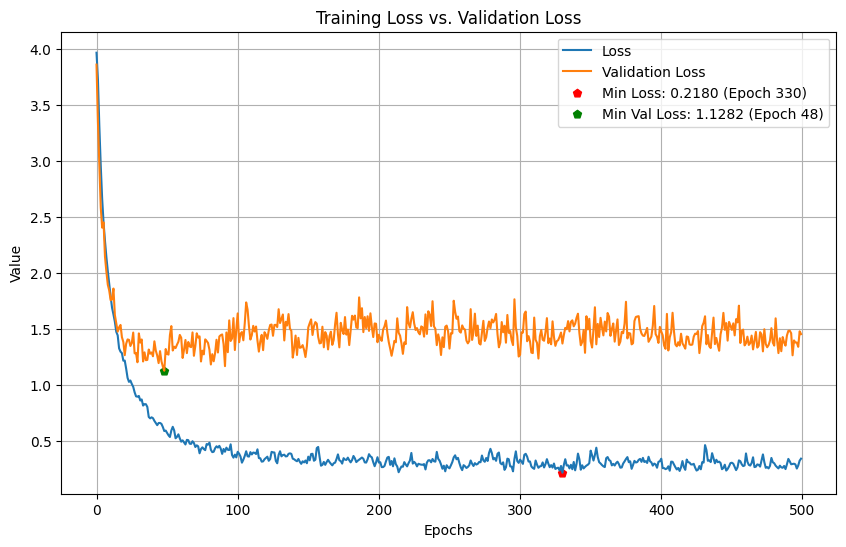

In [190]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

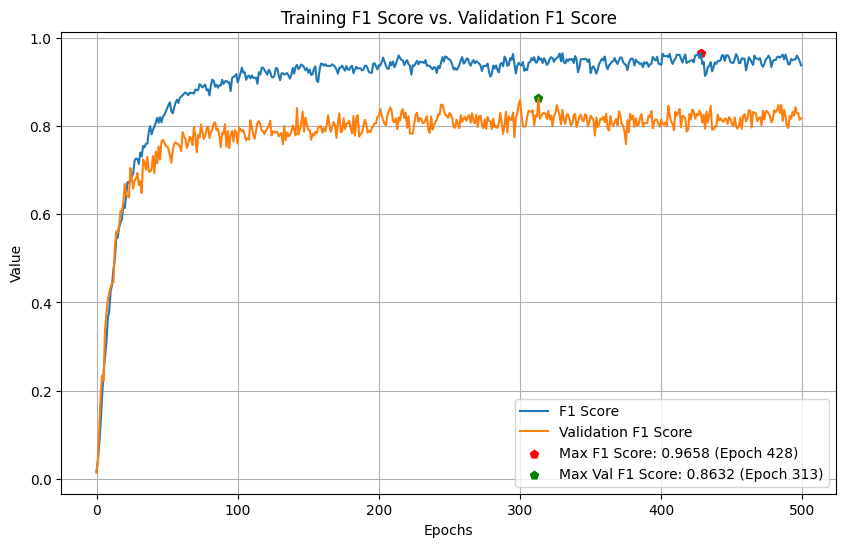

In [191]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [147]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      1.000     0.700     0.824        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.462     1.000     0.632         6
      CANCER      0.727     1.000     0.842         8
   CHRISTMAS      1.000     0.833     0.909         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.571     0.667     0.615         6
      DINNER      1.000     0.875     0.933         8
         DOG      0.667     

In [155]:
reconstructed_model = tf.keras.models.load_model("1 1D-CNN + 1 GRU Trial 722 Mish")

In [149]:
reconstructed_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

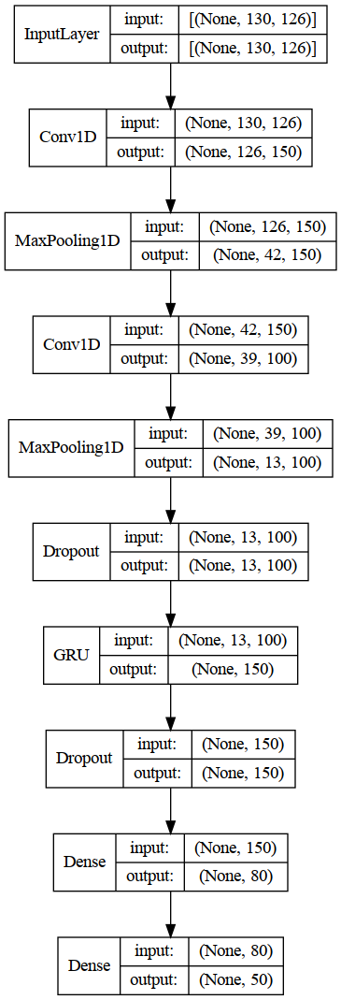

In [150]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

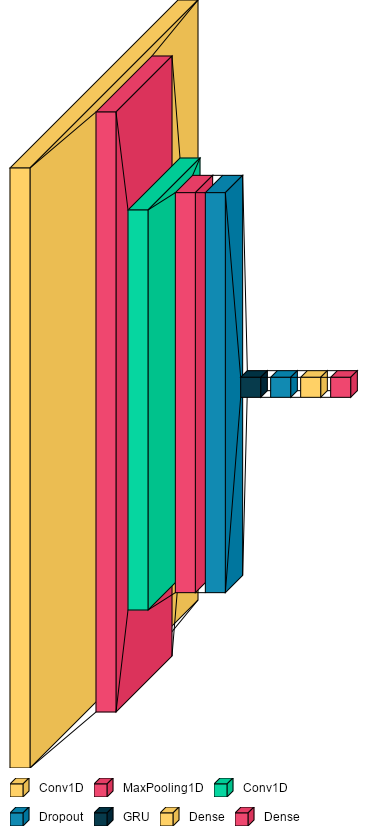

In [156]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [151]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 7ms/step - loss: 1.2373 - f1_score: 0.8632


[1.2372610569000244, 0.8632017374038696]

In [153]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 8ms/step - loss: 0.1030 - f1_score: 1.0000


[0.10299792885780334, 1.0]

In [154]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.800     0.667     0.727         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     1.000     1.000        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     0.833     0.909         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      0.600     1.000     0.750         6
      DINNER      1.000     0.750     0.857         8
         DOG      1.000     

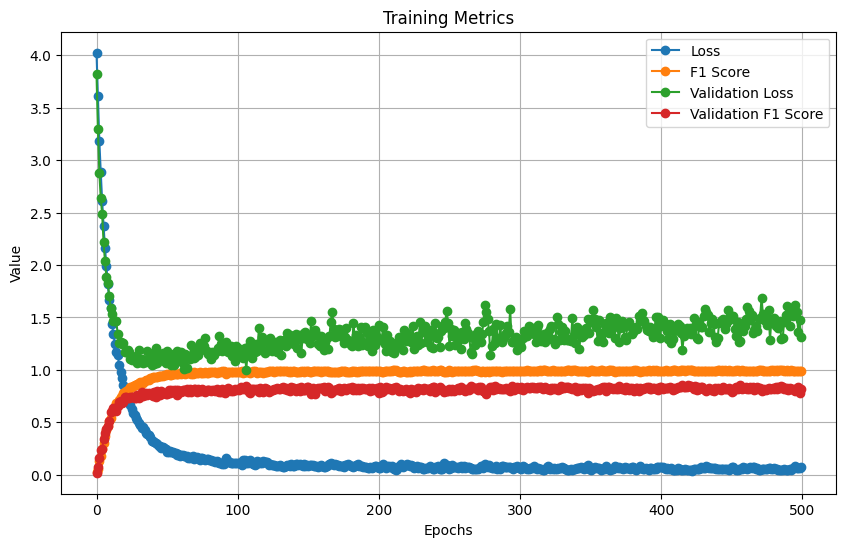

In [249]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

## Hyperparameter Tuning 2 1D CNN Layer + 1 GRU

In [119]:
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping


/tmp/ipykernel_979728/1222377179.py:2: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [120]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, GRU
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','gelu','elu','relu'],default='elu')
        model = Sequential()
        model.add(Conv1D(filters=hp.Int('filters_1',min_value=50,max_value=200,step=25,default=150),
                         kernel_size=hp.Choice('kernel_1',values=[3,4,5,6,7,8,9,10],default=5,),
                         activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=hp.Choice('pool_1',values=[3,4,5,6,7,8,9,10],default=5,)))
        model.add(Conv1D(filters=hp.Int('filters_2',min_value=50,max_value=200,step=25,default=150),
                         kernel_size=hp.Choice('kernel_2',values=[1,2,3,4,5],default=5,),
                         activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=hp.Choice('pool_2',values=[1,2,3,4,5],default=5,)))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.0,max_value=0.9,default=0.8,step=0.05,)))
        model.add(GRU(units=hp.Int('units_1',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=False,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.0,max_value=0.9,default=0.7,step=0.05,)))
        model.add(Dense(units=hp.Int('units_2',min_value=70,max_value=120,step=10,default=80),activation=act_function))
        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.00062198175395800846)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.


In [121]:
HYPERBAND_MAX_EPOCHS = 300
#MAX_TRIALS = 20
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/',
    project_name='2_1D_CNN+1_GRU',
    overwrite=False)

INFO:tensorflow:Reloading Tuner from /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/2_1D_CNN+1_GRU/tuner0.json


In [122]:
tuner.search_space_summary()

Search space summary
Default search space size: 13
dense_activation (Choice)
{'default': 'elu', 'conditions': [], 'values': ['selu', 'mish', 'gelu', 'elu', 'relu'], 'ordered': False}
filters_1 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_1 (Choice)
{'default': 5, 'conditions': [], 'values': [3, 4, 5, 6, 7, 8, 9, 10], 'ordered': True}
pool_1 (Choice)
{'default': 5, 'conditions': [], 'values': [3, 4, 5, 6, 7, 8, 9, 10], 'ordered': True}
filters_2 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_2 (Choice)
{'default': 5, 'conditions': [], 'values': [1, 2, 3, 4, 5], 'ordered': True}
pool_2 (Choice)
{'default': 5, 'conditions': [], 'values': [1, 2, 3, 4, 5], 'ordered': True}
dropout_1 (Float)
{'default': 0.8, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_1 (Int)
{'default': 100, 'conditions': [], 'min_va

In [123]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [124]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [125]:
tuner.search(Xtrain, Ytrain, epochs=1000, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 06m 29s]
val_f1_score: 0.6204818487167358

Best val_f1_score So Far: 0.7420923709869385
Total elapsed time: 04h 23m 21s
INFO:tensorflow:Oracle triggered exit


In [126]:
best_model = tuner.get_best_models(num_models=10)[0]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=100.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [127]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 122, 100)          359200    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 13, 100)          0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 13, 125)           12625     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 13, 125)          0         
 1D)                                                             
                                                                 
 dropout (Dropout)           (None, 13, 125)           0         
                                                                 
 gru (GRU)                   (None, 75)                4

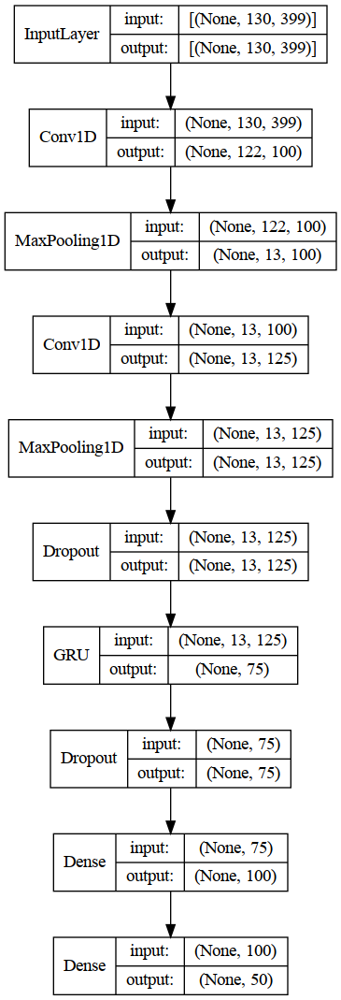

In [128]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

In [129]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/2_1D_CNN+1_GRU
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0719 summary
Hyperparameters:
dense_activation: selu
filters_1: 100
kernel_1: 9
pool_1: 9
filters_2: 125
kernel_2: 1
pool_2: 1
dropout_1: 0.7000000000000001
units_1: 75
regularizer: 0.0023285010665210285
dropout_2: 0.5
units_2: 100
learning_rate: 0.0003730278430367326
tuner/epochs: 300
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0
Score: 0.7420923709869385

Trial 0715 summary
Hyperparameters:
dense_activation: mish
filters_1: 200
kernel_1: 4
pool_1: 8
filters_2: 200
kernel_2: 2
pool_2: 1
dropout_1: 0.30000000000000004
units_1: 175
regularizer: 0.001308287664940752
dropout_2: 0.6000000000000001
units_2: 100
learning_rate: 0.00016060165691337782
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0712
Score: 0.7399027943611145

Trial 0714 summary
Hyperparameters:
dense_ac

In [130]:
loss, accuracy = best_model.evaluate(Xval, Yval)

11/11 [==============================] - 1s 13ms/step - loss: 1.0145 - f1_score: 0.7642


In [132]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 1s 11ms/step - loss: 0.2685 - f1_score: 0.9316


In [133]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(best_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 8ms/step
              precision    recall  f1-score   support

         AXE      0.889     1.000     0.941         8
    BACKPACK      0.667     0.667     0.667         6
  BASKETBALL      0.714     1.000     0.833        10
         BEE      0.529     0.900     0.667        10
        BELT      0.667     1.000     0.800         4
        BITE      1.000     0.750     0.857         8
   BREAKFAST      1.000     0.500     0.667         6
      CANCER      1.000     0.625     0.769         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.500     0.333     0.400         6
      DECIDE      0.800     0.667     0.727         6
      DEMAND      0.778     0.875     0.824         8
     DEVELOP      0.500     1.000     0.667         6
      DINNER      1.000     1.000     1.000         8
         DOG      1.000     

In [134]:
#bestHP = tuner.get_best_hyperparameters(num_trials=5)[2]
bestHP = tuner.get_best_hyperparameters(num_trials=10)[0]

In [135]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 1DCNN + 1 GRU',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [136]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - ETA: 0s - loss: 4.6913 - f1_score: 0.0234

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 14s 394ms/step - loss: 4.6913 - f1_score: 0.0234 - val_loss: 4.3924 - val_f1_score: 9.6386e-04
Epoch 2/500
28/28 [==============================] - ETA: 0s - loss: 4.6019 - f1_score: 0.0168

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 7s 274ms/step - loss: 4.6019 - f1_score: 0.0168 - val_loss: 4.3750 - val_f1_score: 0.0016
Epoch 3/500
28/28 [==============================] - 2s 54ms/step - loss: 4.5267 - f1_score: 0.0226 - val_loss: 4.3292 - val_f1_score: 9.6386e-04
Epoch 4/500
28/28 [==============================] - 2s 54ms/step - loss: 4.4989 - f1_score: 0.0193 - val_loss: 4.2836 - val_f1_score: 0.0012
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 4.4547 - f1_score: 0.0242

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 7s 248ms/step - loss: 4.4528 - f1_score: 0.0235 - val_loss: 4.3090 - val_f1_score: 0.0020
Epoch 6/500
28/28 [==============================] - 2s 55ms/step - loss: 4.4197 - f1_score: 0.0190 - val_loss: 4.2391 - val_f1_score: 9.5890e-04
Epoch 7/500
28/28 [==============================] - 2s 55ms/step - loss: 4.3915 - f1_score: 0.0190 - val_loss: 4.2492 - val_f1_score: 7.2727e-04
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 4.3510 - f1_score: 0.0201

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 7s 261ms/step - loss: 4.3511 - f1_score: 0.0205 - val_loss: 4.2243 - val_f1_score: 0.0024
Epoch 9/500
28/28 [==============================] - ETA: 0s - loss: 4.3165 - f1_score: 0.0206

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 7s 267ms/step - loss: 4.3165 - f1_score: 0.0206 - val_loss: 4.2002 - val_f1_score: 0.0055
Epoch 10/500
28/28 [==============================] - 2s 55ms/step - loss: 4.2924 - f1_score: 0.0215 - val_loss: 4.1807 - val_f1_score: 0.0011
Epoch 11/500
28/28 [==============================] - 2s 55ms/step - loss: 4.2806 - f1_score: 0.0210 - val_loss: 4.1782 - val_f1_score: 0.0040
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 4.2568 - f1_score: 0.0143

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 283ms/step - loss: 4.2565 - f1_score: 0.0145 - val_loss: 4.1717 - val_f1_score: 0.0072
Epoch 13/500
28/28 [==============================] - 2s 56ms/step - loss: 4.2355 - f1_score: 0.0157 - val_loss: 4.1605 - val_f1_score: 0.0066
Epoch 14/500
28/28 [==============================] - 2s 55ms/step - loss: 4.2054 - f1_score: 0.0214 - val_loss: 4.1406 - val_f1_score: 0.0011
Epoch 15/500
28/28 [==============================] - 2s 55ms/step - loss: 4.1909 - f1_score: 0.0232 - val_loss: 4.1309 - val_f1_score: 0.0036
Epoch 16/500
28/28 [==============================] - 2s 55ms/step - loss: 4.1865 - f1_score: 0.0186 - val_loss: 4.1074 - val_f1_score: 0.0027
Epoch 17/500
28/28 [==============================] - 2s 54ms/step - loss: 4.1683 - f1_score: 0.0221 - val_loss: 4.1060 - val_f1_score: 2.7972e-04
Epoch 18/500
28/28 [==============================] - ETA: 0s - loss: 4.1519 - f1_score: 0.0198

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 284ms/step - loss: 4.1519 - f1_score: 0.0198 - val_loss: 4.0472 - val_f1_score: 0.0233
Epoch 19/500
28/28 [==============================] - 2s 54ms/step - loss: 4.1191 - f1_score: 0.0225 - val_loss: 4.0035 - val_f1_score: 0.0212
Epoch 20/500
28/28 [==============================] - 2s 54ms/step - loss: 4.0662 - f1_score: 0.0314 - val_loss: 3.9306 - val_f1_score: 0.0125
Epoch 21/500
28/28 [==============================] - 2s 56ms/step - loss: 3.9778 - f1_score: 0.0361 - val_loss: 3.8248 - val_f1_score: 0.0097
Epoch 22/500
27/28 [===========================>..] - ETA: 0s - loss: 3.8693 - f1_score: 0.0368

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 7s 275ms/step - loss: 3.8678 - f1_score: 0.0363 - val_loss: 3.6539 - val_f1_score: 0.0341
Epoch 23/500
28/28 [==============================] - 2s 54ms/step - loss: 3.7759 - f1_score: 0.0440 - val_loss: 3.5517 - val_f1_score: 0.0234
Epoch 24/500
28/28 [==============================] - 2s 55ms/step - loss: 3.7165 - f1_score: 0.0496 - val_loss: 3.4637 - val_f1_score: 0.0243
Epoch 25/500
28/28 [==============================] - 2s 55ms/step - loss: 3.6423 - f1_score: 0.0539 - val_loss: 3.3910 - val_f1_score: 0.0286
Epoch 26/500
27/28 [===========================>..] - ETA: 0s - loss: 3.5696 - f1_score: 0.0660

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 311ms/step - loss: 3.5625 - f1_score: 0.0668 - val_loss: 3.2876 - val_f1_score: 0.0388
Epoch 27/500
27/28 [===========================>..] - ETA: 0s - loss: 3.4954 - f1_score: 0.0784

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 277ms/step - loss: 3.4949 - f1_score: 0.0799 - val_loss: 3.1963 - val_f1_score: 0.0736
Epoch 28/500
28/28 [==============================] - 2s 55ms/step - loss: 3.4135 - f1_score: 0.0860 - val_loss: 3.1936 - val_f1_score: 0.0728
Epoch 29/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3487 - f1_score: 0.1013

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 7s 265ms/step - loss: 3.3476 - f1_score: 0.1012 - val_loss: 3.0964 - val_f1_score: 0.0879
Epoch 30/500
27/28 [===========================>..] - ETA: 0s - loss: 3.2908 - f1_score: 0.1122

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 302ms/step - loss: 3.2897 - f1_score: 0.1119 - val_loss: 2.9904 - val_f1_score: 0.1189
Epoch 31/500
28/28 [==============================] - 2s 55ms/step - loss: 3.2073 - f1_score: 0.1162 - val_loss: 2.9514 - val_f1_score: 0.1147
Epoch 32/500
27/28 [===========================>..] - ETA: 0s - loss: 3.1550 - f1_score: 0.1164

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 284ms/step - loss: 3.1488 - f1_score: 0.1176 - val_loss: 2.8584 - val_f1_score: 0.1506
Epoch 33/500
27/28 [===========================>..] - ETA: 0s - loss: 3.0624 - f1_score: 0.1374

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 285ms/step - loss: 3.0585 - f1_score: 0.1375 - val_loss: 2.8036 - val_f1_score: 0.1685
Epoch 34/500
27/28 [===========================>..] - ETA: 0s - loss: 3.0154 - f1_score: 0.1531

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 7s 276ms/step - loss: 3.0113 - f1_score: 0.1546 - val_loss: 2.7360 - val_f1_score: 0.1833
Epoch 35/500
28/28 [==============================] - 2s 55ms/step - loss: 2.9590 - f1_score: 0.1470 - val_loss: 2.6942 - val_f1_score: 0.1808
Epoch 36/500
28/28 [==============================] - 2s 55ms/step - loss: 2.9250 - f1_score: 0.1716 - val_loss: 2.6658 - val_f1_score: 0.1829
Epoch 37/500
28/28 [==============================] - ETA: 0s - loss: 2.8597 - f1_score: 0.1801

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 293ms/step - loss: 2.8597 - f1_score: 0.1801 - val_loss: 2.6685 - val_f1_score: 0.2050
Epoch 38/500
27/28 [===========================>..] - ETA: 0s - loss: 2.8308 - f1_score: 0.1917

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 284ms/step - loss: 2.8301 - f1_score: 0.1915 - val_loss: 2.5612 - val_f1_score: 0.2724
Epoch 39/500
28/28 [==============================] - 2s 55ms/step - loss: 2.7864 - f1_score: 0.1992 - val_loss: 2.6118 - val_f1_score: 0.2442
Epoch 40/500
28/28 [==============================] - 2s 55ms/step - loss: 2.7558 - f1_score: 0.2036 - val_loss: 2.5356 - val_f1_score: 0.2700
Epoch 41/500
27/28 [===========================>..] - ETA: 0s - loss: 2.7204 - f1_score: 0.2082

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 278ms/step - loss: 2.7230 - f1_score: 0.2103 - val_loss: 2.4222 - val_f1_score: 0.2984
Epoch 42/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6967 - f1_score: 0.2244

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 319ms/step - loss: 2.6959 - f1_score: 0.2231 - val_loss: 2.4102 - val_f1_score: 0.3045
Epoch 43/500
28/28 [==============================] - ETA: 0s - loss: 2.6629 - f1_score: 0.2365

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 282ms/step - loss: 2.6629 - f1_score: 0.2365 - val_loss: 2.3639 - val_f1_score: 0.3232
Epoch 44/500
28/28 [==============================] - 2s 55ms/step - loss: 2.6119 - f1_score: 0.2378 - val_loss: 2.3797 - val_f1_score: 0.2953
Epoch 45/500
28/28 [==============================] - ETA: 0s - loss: 2.5791 - f1_score: 0.2636

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 7s 265ms/step - loss: 2.5791 - f1_score: 0.2636 - val_loss: 2.2792 - val_f1_score: 0.3295
Epoch 46/500
28/28 [==============================] - 2s 55ms/step - loss: 2.5283 - f1_score: 0.2729 - val_loss: 2.2762 - val_f1_score: 0.2977
Epoch 47/500
28/28 [==============================] - 2s 55ms/step - loss: 2.5132 - f1_score: 0.2661 - val_loss: 2.2526 - val_f1_score: 0.3098
Epoch 48/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4858 - f1_score: 0.2861

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 280ms/step - loss: 2.4903 - f1_score: 0.2854 - val_loss: 2.2072 - val_f1_score: 0.3387
Epoch 49/500
28/28 [==============================] - 2s 56ms/step - loss: 2.4684 - f1_score: 0.2776 - val_loss: 2.2225 - val_f1_score: 0.3272
Epoch 50/500
28/28 [==============================] - ETA: 0s - loss: 2.4174 - f1_score: 0.2861

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 306ms/step - loss: 2.4174 - f1_score: 0.2861 - val_loss: 2.1661 - val_f1_score: 0.3507
Epoch 51/500
28/28 [==============================] - 2s 55ms/step - loss: 2.3910 - f1_score: 0.2976 - val_loss: 2.2039 - val_f1_score: 0.3113
Epoch 52/500
28/28 [==============================] - 2s 55ms/step - loss: 2.3750 - f1_score: 0.3058 - val_loss: 2.1497 - val_f1_score: 0.3397
Epoch 53/500
27/28 [===========================>..] - ETA: 0s - loss: 2.3294 - f1_score: 0.3148

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 288ms/step - loss: 2.3310 - f1_score: 0.3135 - val_loss: 2.0973 - val_f1_score: 0.3698
Epoch 54/500
28/28 [==============================] - 2s 55ms/step - loss: 2.2988 - f1_score: 0.3192 - val_loss: 2.1135 - val_f1_score: 0.3385
Epoch 55/500
28/28 [==============================] - 2s 56ms/step - loss: 2.3010 - f1_score: 0.3233 - val_loss: 2.0863 - val_f1_score: 0.3411
Epoch 56/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2592 - f1_score: 0.3193

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 310ms/step - loss: 2.2567 - f1_score: 0.3217 - val_loss: 2.0410 - val_f1_score: 0.3716
Epoch 57/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2433 - f1_score: 0.3293

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 326ms/step - loss: 2.2408 - f1_score: 0.3339 - val_loss: 2.0149 - val_f1_score: 0.3775
Epoch 58/500
28/28 [==============================] - 2s 56ms/step - loss: 2.2016 - f1_score: 0.3498 - val_loss: 1.9856 - val_f1_score: 0.3714
Epoch 59/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1668 - f1_score: 0.3613

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 294ms/step - loss: 2.1789 - f1_score: 0.3597 - val_loss: 1.9808 - val_f1_score: 0.4032
Epoch 60/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1229 - f1_score: 0.3695

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 286ms/step - loss: 2.1225 - f1_score: 0.3713 - val_loss: 1.9272 - val_f1_score: 0.4337
Epoch 61/500
28/28 [==============================] - 2s 55ms/step - loss: 2.0996 - f1_score: 0.3821 - val_loss: 1.9422 - val_f1_score: 0.4006
Epoch 62/500
28/28 [==============================] - 2s 57ms/step - loss: 2.0857 - f1_score: 0.3736 - val_loss: 1.9158 - val_f1_score: 0.3958
Epoch 63/500
28/28 [==============================] - 2s 55ms/step - loss: 2.0783 - f1_score: 0.3898 - val_loss: 1.8454 - val_f1_score: 0.4179
Epoch 64/500
28/28 [==============================] - ETA: 0s - loss: 2.0689 - f1_score: 0.3962

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 294ms/step - loss: 2.0689 - f1_score: 0.3962 - val_loss: 1.8392 - val_f1_score: 0.4363
Epoch 65/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0133 - f1_score: 0.4068

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 317ms/step - loss: 2.0155 - f1_score: 0.4045 - val_loss: 1.8630 - val_f1_score: 0.4495
Epoch 66/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0059 - f1_score: 0.4144

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 296ms/step - loss: 2.0026 - f1_score: 0.4142 - val_loss: 1.8033 - val_f1_score: 0.4537
Epoch 67/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9605 - f1_score: 0.4124

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 315ms/step - loss: 1.9561 - f1_score: 0.4172 - val_loss: 1.7808 - val_f1_score: 0.4619
Epoch 68/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9514 - f1_score: 0.4204

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 327ms/step - loss: 1.9610 - f1_score: 0.4188 - val_loss: 1.7537 - val_f1_score: 0.5019
Epoch 69/500
28/28 [==============================] - 2s 55ms/step - loss: 1.9313 - f1_score: 0.4286 - val_loss: 1.7285 - val_f1_score: 0.4746
Epoch 70/500
28/28 [==============================] - 2s 55ms/step - loss: 1.9123 - f1_score: 0.4425 - val_loss: 1.7202 - val_f1_score: 0.4621
Epoch 71/500
27/28 [===========================>..] - ETA: 0s - loss: 1.8683 - f1_score: 0.4388

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 291ms/step - loss: 1.8765 - f1_score: 0.4390 - val_loss: 1.6696 - val_f1_score: 0.5027
Epoch 72/500
28/28 [==============================] - 2s 56ms/step - loss: 1.8556 - f1_score: 0.4506 - val_loss: 1.6905 - val_f1_score: 0.4879
Epoch 73/500
27/28 [===========================>..] - ETA: 0s - loss: 1.8220 - f1_score: 0.4578

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 305ms/step - loss: 1.8280 - f1_score: 0.4576 - val_loss: 1.6446 - val_f1_score: 0.5173
Epoch 74/500
27/28 [===========================>..] - ETA: 0s - loss: 1.8381 - f1_score: 0.4413

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 333ms/step - loss: 1.8312 - f1_score: 0.4458 - val_loss: 1.6115 - val_f1_score: 0.5201
Epoch 75/500
28/28 [==============================] - 2s 56ms/step - loss: 1.7632 - f1_score: 0.4764 - val_loss: 1.6535 - val_f1_score: 0.5067
Epoch 76/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7437 - f1_score: 0.4896

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 294ms/step - loss: 1.7391 - f1_score: 0.4902 - val_loss: 1.5861 - val_f1_score: 0.5446
Epoch 77/500
28/28 [==============================] - 2s 55ms/step - loss: 1.7344 - f1_score: 0.4865 - val_loss: 1.6692 - val_f1_score: 0.4982
Epoch 78/500
28/28 [==============================] - 2s 55ms/step - loss: 1.7282 - f1_score: 0.4953 - val_loss: 1.5356 - val_f1_score: 0.5266
Epoch 79/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7073 - f1_score: 0.5055

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 315ms/step - loss: 1.7049 - f1_score: 0.5049 - val_loss: 1.5338 - val_f1_score: 0.5678
Epoch 80/500
28/28 [==============================] - 2s 55ms/step - loss: 1.6998 - f1_score: 0.5029 - val_loss: 1.5504 - val_f1_score: 0.5470
Epoch 81/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6803 - f1_score: 0.5010

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 303ms/step - loss: 1.6760 - f1_score: 0.5012 - val_loss: 1.5355 - val_f1_score: 0.5709
Epoch 82/500
28/28 [==============================] - 2s 55ms/step - loss: 1.6417 - f1_score: 0.5194 - val_loss: 1.6083 - val_f1_score: 0.5706
Epoch 83/500
28/28 [==============================] - 2s 56ms/step - loss: 1.6207 - f1_score: 0.5214 - val_loss: 1.5026 - val_f1_score: 0.5661
Epoch 84/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6339 - f1_score: 0.5330

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 344ms/step - loss: 1.6294 - f1_score: 0.5314 - val_loss: 1.4758 - val_f1_score: 0.5884
Epoch 85/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5821 - f1_score: 0.5404

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 284ms/step - loss: 1.5878 - f1_score: 0.5375 - val_loss: 1.4661 - val_f1_score: 0.6035
Epoch 86/500
28/28 [==============================] - 2s 55ms/step - loss: 1.5717 - f1_score: 0.5317 - val_loss: 1.4995 - val_f1_score: 0.5826
Epoch 87/500
28/28 [==============================] - 2s 55ms/step - loss: 1.5594 - f1_score: 0.5465 - val_loss: 1.4442 - val_f1_score: 0.5792
Epoch 88/500
28/28 [==============================] - 2s 56ms/step - loss: 1.5560 - f1_score: 0.5433 - val_loss: 1.4602 - val_f1_score: 0.5928
Epoch 89/500
28/28 [==============================] - 2s 56ms/step - loss: 1.5186 - f1_score: 0.5458 - val_loss: 1.4404 - val_f1_score: 0.5523
Epoch 90/500
28/28 [==============================] - 2s 56ms/step - loss: 1.5297 - f1_score: 0.5438 - val_loss: 1.4225 - val_f1_score: 0.5518
Epoch 91/500
28/28 [==============================] - 2s 56ms/step - loss: 1.5053 - f1_score: 0.5531 - val_loss: 1.4238 - val_f1_score: 0.5824
Epoch 92/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.4299 - f1_score: 0.5754 - val_loss: 1.3656 - val_f1_score: 0.6234
Epoch 98/500
28/28 [==============================] - 2s 56ms/step - loss: 1.4156 - f1_score: 0.5861 - val_loss: 1.4082 - val_f1_score: 0.5986
Epoch 99/500
28/28 [==============================] - 2s 56ms/step - loss: 1.3891 - f1_score: 0.5826 - val_loss: 1.3616 - val_f1_score: 0.5958
Epoch 100/500
28/28 [==============================] - 2s 56ms/step - loss: 1.3687 - f1_score: 0.5928 - val_loss: 1.3786 - val_f1_score: 0.6004
Epoch 101/500
28/28 [==============================] - 2s 57ms/step - loss: 1.3669 - f1_score: 0.5990 - val_loss: 1.3295 - val_f1_score: 0.6132
Epoch 102/500
28/28 [==============================] - 2s 56ms/step - loss: 1.3731 - f1_score: 0.5989 - val_loss: 1.3913 - val_f1_score: 0.6003
Epoch 103/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3055 - f1_score: 0.6094

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 329ms/step - loss: 1.3104 - f1_score: 0.6095 - val_loss: 1.2978 - val_f1_score: 0.6264
Epoch 104/500
28/28 [==============================] - 2s 56ms/step - loss: 1.3417 - f1_score: 0.6006 - val_loss: 1.3157 - val_f1_score: 0.6110
Epoch 105/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3061 - f1_score: 0.6163

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 295ms/step - loss: 1.3079 - f1_score: 0.6159 - val_loss: 1.2832 - val_f1_score: 0.6363
Epoch 106/500
28/28 [==============================] - 2s 56ms/step - loss: 1.3228 - f1_score: 0.6039 - val_loss: 1.2710 - val_f1_score: 0.6246
Epoch 107/500
28/28 [==============================] - 2s 56ms/step - loss: 1.3158 - f1_score: 0.6009 - val_loss: 1.3505 - val_f1_score: 0.5769
Epoch 108/500
28/28 [==============================] - 2s 57ms/step - loss: 1.3049 - f1_score: 0.6109 - val_loss: 1.3224 - val_f1_score: 0.6215
Epoch 109/500
28/28 [==============================] - 2s 56ms/step - loss: 1.2608 - f1_score: 0.6108 - val_loss: 1.2851 - val_f1_score: 0.6027
Epoch 110/500
28/28 [==============================] - 2s 56ms/step - loss: 1.2574 - f1_score: 0.6236 - val_loss: 1.3131 - val_f1_score: 0.6217
Epoch 111/500
28/28 [==============================] - 2s 56ms/step - loss: 1.2690 - f1_score: 0.6185 - val_loss: 1.2288 - val_f1_score: 0.6154
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 298ms/step - loss: 1.2498 - f1_score: 0.6287 - val_loss: 1.2927 - val_f1_score: 0.6434
Epoch 113/500
28/28 [==============================] - 2s 56ms/step - loss: 1.2300 - f1_score: 0.6318 - val_loss: 1.2578 - val_f1_score: 0.6311
Epoch 114/500
28/28 [==============================] - 2s 57ms/step - loss: 1.2076 - f1_score: 0.6412 - val_loss: 1.2753 - val_f1_score: 0.6275
Epoch 115/500
28/28 [==============================] - 2s 56ms/step - loss: 1.2517 - f1_score: 0.6190 - val_loss: 1.2903 - val_f1_score: 0.6119
Epoch 116/500
28/28 [==============================] - 2s 56ms/step - loss: 1.1890 - f1_score: 0.6540 - val_loss: 1.2231 - val_f1_score: 0.6313
Epoch 117/500
28/28 [==============================] - 2s 56ms/step - loss: 1.2028 - f1_score: 0.6391 - val_loss: 1.2974 - val_f1_score: 0.6325
Epoch 118/500
27/28 [===========================>..] - ETA: 0s - loss: 1.1736 - f1_score: 0.6423

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 339ms/step - loss: 1.1794 - f1_score: 0.6407 - val_loss: 1.2256 - val_f1_score: 0.6504
Epoch 119/500
28/28 [==============================] - 2s 56ms/step - loss: 1.1689 - f1_score: 0.6578 - val_loss: 1.1972 - val_f1_score: 0.6369
Epoch 120/500
28/28 [==============================] - 2s 56ms/step - loss: 1.1514 - f1_score: 0.6524 - val_loss: 1.2236 - val_f1_score: 0.6422
Epoch 121/500
28/28 [==============================] - 2s 57ms/step - loss: 1.1440 - f1_score: 0.6535 - val_loss: 1.1749 - val_f1_score: 0.6423
Epoch 122/500
27/28 [===========================>..] - ETA: 0s - loss: 1.1262 - f1_score: 0.6728

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 288ms/step - loss: 1.1294 - f1_score: 0.6717 - val_loss: 1.2059 - val_f1_score: 0.6557
Epoch 123/500
28/28 [==============================] - 2s 56ms/step - loss: 1.1261 - f1_score: 0.6590 - val_loss: 1.3068 - val_f1_score: 0.6120
Epoch 124/500
28/28 [==============================] - 2s 56ms/step - loss: 1.1176 - f1_score: 0.6681 - val_loss: 1.2324 - val_f1_score: 0.6470
Epoch 125/500
28/28 [==============================] - 2s 56ms/step - loss: 1.1350 - f1_score: 0.6672 - val_loss: 1.1831 - val_f1_score: 0.6423
Epoch 126/500
28/28 [==============================] - 2s 58ms/step - loss: 1.1265 - f1_score: 0.6622 - val_loss: 1.1564 - val_f1_score: 0.6344
Epoch 127/500
27/28 [===========================>..] - ETA: 0s - loss: 1.1215 - f1_score: 0.6635

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 310ms/step - loss: 1.1178 - f1_score: 0.6630 - val_loss: 1.1746 - val_f1_score: 0.6575
Epoch 128/500
28/28 [==============================] - ETA: 0s - loss: 1.0989 - f1_score: 0.6673

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 291ms/step - loss: 1.0989 - f1_score: 0.6673 - val_loss: 1.2229 - val_f1_score: 0.6665
Epoch 129/500
28/28 [==============================] - 2s 55ms/step - loss: 1.0847 - f1_score: 0.6724 - val_loss: 1.2085 - val_f1_score: 0.6463
Epoch 130/500
28/28 [==============================] - 2s 56ms/step - loss: 1.1141 - f1_score: 0.6660 - val_loss: 1.2138 - val_f1_score: 0.6540
Epoch 131/500
28/28 [==============================] - 2s 57ms/step - loss: 1.0962 - f1_score: 0.6639 - val_loss: 1.2160 - val_f1_score: 0.6288
Epoch 132/500
28/28 [==============================] - 2s 56ms/step - loss: 1.0986 - f1_score: 0.6642 - val_loss: 1.2587 - val_f1_score: 0.6520
Epoch 133/500
28/28 [==============================] - 2s 56ms/step - loss: 1.0668 - f1_score: 0.6773 - val_loss: 1.1840 - val_f1_score: 0.6471
Epoch 134/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0364 - f1_score: 0.6987

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 326ms/step - loss: 1.0350 - f1_score: 0.6982 - val_loss: 1.1357 - val_f1_score: 0.6824
Epoch 135/500
28/28 [==============================] - 2s 57ms/step - loss: 1.0430 - f1_score: 0.6809 - val_loss: 1.1998 - val_f1_score: 0.6566
Epoch 136/500
28/28 [==============================] - 2s 56ms/step - loss: 1.0371 - f1_score: 0.6799 - val_loss: 1.1406 - val_f1_score: 0.6731
Epoch 137/500
28/28 [==============================] - 2s 57ms/step - loss: 1.0429 - f1_score: 0.6856 - val_loss: 1.1366 - val_f1_score: 0.6501
Epoch 138/500
28/28 [==============================] - 2s 57ms/step - loss: 1.0305 - f1_score: 0.6862 - val_loss: 1.1704 - val_f1_score: 0.6386
Epoch 139/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9805 - f1_score: 0.7091 - val_loss: 1.0874 - val_f1_score: 0.6781
Epoch 140/500
28/28 [==============================] - 2s 56ms/step - loss: 1.0380 - f1_score: 0.6832 - val_loss: 1.1724 - val_f1_score: 0.6687
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 306ms/step - loss: 0.9837 - f1_score: 0.7067 - val_loss: 1.1463 - val_f1_score: 0.6887
Epoch 143/500
28/28 [==============================] - 2s 57ms/step - loss: 1.0099 - f1_score: 0.6919 - val_loss: 1.1459 - val_f1_score: 0.6714
Epoch 144/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9598 - f1_score: 0.7109 - val_loss: 1.0902 - val_f1_score: 0.6526
Epoch 145/500
28/28 [==============================] - 2s 56ms/step - loss: 0.9861 - f1_score: 0.6983 - val_loss: 1.0916 - val_f1_score: 0.6682
Epoch 146/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9707 - f1_score: 0.6961 - val_loss: 1.0887 - val_f1_score: 0.6739
Epoch 147/500
28/28 [==============================] - 2s 56ms/step - loss: 0.9547 - f1_score: 0.7091 - val_loss: 1.1830 - val_f1_score: 0.6684
Epoch 148/500
27/28 [===========================>..] - ETA: 0s - loss: 0.9546 - f1_score: 0.7126

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 296ms/step - loss: 0.9549 - f1_score: 0.7122 - val_loss: 1.1478 - val_f1_score: 0.7068
Epoch 149/500
28/28 [==============================] - 2s 56ms/step - loss: 0.9211 - f1_score: 0.7270 - val_loss: 1.2438 - val_f1_score: 0.6769
Epoch 150/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9691 - f1_score: 0.7049 - val_loss: 1.1334 - val_f1_score: 0.6874
Epoch 151/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9459 - f1_score: 0.7121 - val_loss: 1.1245 - val_f1_score: 0.6512
Epoch 152/500
28/28 [==============================] - 2s 59ms/step - loss: 0.9559 - f1_score: 0.7116 - val_loss: 1.0708 - val_f1_score: 0.6855
Epoch 153/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9205 - f1_score: 0.7199 - val_loss: 1.1324 - val_f1_score: 0.6953
Epoch 154/500
27/28 [===========================>..] - ETA: 0s - loss: 0.9265 - f1_score: 0.7183

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 17s 632ms/step - loss: 0.9277 - f1_score: 0.7184 - val_loss: 1.0633 - val_f1_score: 0.7133
Epoch 155/500
28/28 [==============================] - 2s 55ms/step - loss: 0.9199 - f1_score: 0.7217 - val_loss: 1.1193 - val_f1_score: 0.6671
Epoch 156/500
28/28 [==============================] - 2s 56ms/step - loss: 0.9144 - f1_score: 0.7243 - val_loss: 1.1293 - val_f1_score: 0.6708
Epoch 157/500
28/28 [==============================] - 2s 57ms/step - loss: 0.9289 - f1_score: 0.7131 - val_loss: 1.0543 - val_f1_score: 0.7008
Epoch 158/500
28/28 [==============================] - 2s 56ms/step - loss: 0.8938 - f1_score: 0.7233 - val_loss: 1.0838 - val_f1_score: 0.6739
Epoch 159/500
28/28 [==============================] - 2s 56ms/step - loss: 0.9052 - f1_score: 0.7225 - val_loss: 1.0262 - val_f1_score: 0.7066
Epoch 160/500
28/28 [==============================] - 2s 56ms/step - loss: 0.8909 - f1_score: 0.7200 - val_loss: 1.0383 - val_f1_score: 0.7058
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 328ms/step - loss: 0.8262 - f1_score: 0.7429 - val_loss: 1.0482 - val_f1_score: 0.7175
Epoch 172/500
28/28 [==============================] - 2s 56ms/step - loss: 0.8193 - f1_score: 0.7522 - val_loss: 1.1541 - val_f1_score: 0.6644
Epoch 173/500
28/28 [==============================] - 2s 56ms/step - loss: 0.7984 - f1_score: 0.7535 - val_loss: 1.0489 - val_f1_score: 0.6845
Epoch 174/500
28/28 [==============================] - 2s 57ms/step - loss: 0.7877 - f1_score: 0.7585 - val_loss: 1.0512 - val_f1_score: 0.7015
Epoch 175/500
28/28 [==============================] - 2s 57ms/step - loss: 0.8327 - f1_score: 0.7512 - val_loss: 1.1693 - val_f1_score: 0.6687
Epoch 176/500
28/28 [==============================] - 2s 57ms/step - loss: 0.8415 - f1_score: 0.7371 - val_loss: 1.0122 - val_f1_score: 0.7127
Epoch 177/500
28/28 [==============================] - 2s 57ms/step - loss: 0.8021 - f1_score: 0.7563 - val_loss: 0.9838 - val_f1_score: 0.7174
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 10s 353ms/step - loss: 0.7824 - f1_score: 0.7539 - val_loss: 1.0101 - val_f1_score: 0.7189
Epoch 185/500
28/28 [==============================] - 2s 57ms/step - loss: 0.7813 - f1_score: 0.7633 - val_loss: 1.0616 - val_f1_score: 0.6988
Epoch 186/500
28/28 [==============================] - 2s 57ms/step - loss: 0.8004 - f1_score: 0.7618 - val_loss: 1.0368 - val_f1_score: 0.6943
Epoch 187/500
28/28 [==============================] - 2s 57ms/step - loss: 0.7493 - f1_score: 0.7691 - val_loss: 1.1032 - val_f1_score: 0.6769
Epoch 188/500
28/28 [==============================] - 2s 57ms/step - loss: 0.7746 - f1_score: 0.7626 - val_loss: 1.0108 - val_f1_score: 0.7165
Epoch 189/500
28/28 [==============================] - 2s 57ms/step - loss: 0.7695 - f1_score: 0.7650 - val_loss: 1.0712 - val_f1_score: 0.7180
Epoch 190/500
28/28 [==============================] - 2s 57ms/step - loss: 0.7093 - f1_score: 0.7812 - val_loss: 1.0243 - val_f1_score: 0.6988
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 332ms/step - loss: 0.7301 - f1_score: 0.7814 - val_loss: 0.9994 - val_f1_score: 0.7292
Epoch 192/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7452 - f1_score: 0.7726

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 8s 306ms/step - loss: 0.7428 - f1_score: 0.7724 - val_loss: 0.9497 - val_f1_score: 0.7403
Epoch 193/500
28/28 [==============================] - 2s 56ms/step - loss: 0.7298 - f1_score: 0.7786 - val_loss: 1.0136 - val_f1_score: 0.7004
Epoch 194/500
28/28 [==============================] - 2s 57ms/step - loss: 0.7425 - f1_score: 0.7778 - val_loss: 1.0512 - val_f1_score: 0.7051
Epoch 195/500
28/28 [==============================] - 2s 56ms/step - loss: 0.7108 - f1_score: 0.7845 - val_loss: 1.0578 - val_f1_score: 0.7117
Epoch 196/500
28/28 [==============================] - 2s 57ms/step - loss: 0.7450 - f1_score: 0.7683 - val_loss: 1.0357 - val_f1_score: 0.7176
Epoch 197/500
28/28 [==============================] - 2s 57ms/step - loss: 0.6955 - f1_score: 0.7930 - val_loss: 1.0204 - val_f1_score: 0.7181
Epoch 198/500
28/28 [==============================] - 2s 57ms/step - loss: 0.7082 - f1_score: 0.7798 - val_loss: 1.0201 - val_f1_score: 0.7082
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 19s 694ms/step - loss: 0.7029 - f1_score: 0.7879 - val_loss: 1.0239 - val_f1_score: 0.7450
Epoch 203/500
28/28 [==============================] - 2s 56ms/step - loss: 0.7192 - f1_score: 0.7768 - val_loss: 0.9844 - val_f1_score: 0.7407
Epoch 204/500
28/28 [==============================] - 2s 56ms/step - loss: 0.7008 - f1_score: 0.7865 - val_loss: 1.0770 - val_f1_score: 0.6728
Epoch 205/500
28/28 [==============================] - 2s 56ms/step - loss: 0.6898 - f1_score: 0.7885 - val_loss: 1.1362 - val_f1_score: 0.6963
Epoch 206/500
28/28 [==============================] - 2s 56ms/step - loss: 0.7301 - f1_score: 0.7752 - val_loss: 0.9945 - val_f1_score: 0.7152
Epoch 207/500
28/28 [==============================] - 2s 56ms/step - loss: 0.6726 - f1_score: 0.7967 - val_loss: 1.0968 - val_f1_score: 0.6780
Epoch 208/500
28/28 [==============================] - 2s 56ms/step - loss: 0.6809 - f1_score: 0.7949 - val_loss: 1.0128 - val_f1_score: 0.7120
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 10s 353ms/step - loss: 0.5921 - f1_score: 0.8141 - val_loss: 0.9517 - val_f1_score: 0.7500
Epoch 236/500
28/28 [==============================] - 2s 57ms/step - loss: 0.6076 - f1_score: 0.8099 - val_loss: 1.0951 - val_f1_score: 0.7077
Epoch 237/500
28/28 [==============================] - 2s 56ms/step - loss: 0.6002 - f1_score: 0.8143 - val_loss: 1.2394 - val_f1_score: 0.6598
Epoch 238/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5601 - f1_score: 0.8276 - val_loss: 1.0131 - val_f1_score: 0.7317
Epoch 239/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5704 - f1_score: 0.8253 - val_loss: 1.0513 - val_f1_score: 0.7131
Epoch 240/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5736 - f1_score: 0.8248 - val_loss: 1.0928 - val_f1_score: 0.6954
Epoch 241/500
28/28 [==============================] - 2s 57ms/step - loss: 0.6022 - f1_score: 0.8186 - val_loss: 0.9390 - val_f1_score: 0.7488
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 10s 352ms/step - loss: 0.6000 - f1_score: 0.8041 - val_loss: 0.9563 - val_f1_score: 0.7533
Epoch 250/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5287 - f1_score: 0.8462 - val_loss: 1.0609 - val_f1_score: 0.7315
Epoch 251/500
28/28 [==============================] - 2s 59ms/step - loss: 0.5675 - f1_score: 0.8230 - val_loss: 0.9226 - val_f1_score: 0.7307
Epoch 252/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4845 - f1_score: 0.8502

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 9s 328ms/step - loss: 0.4885 - f1_score: 0.8504 - val_loss: 0.9511 - val_f1_score: 0.7570
Epoch 253/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5331 - f1_score: 0.8394 - val_loss: 0.9378 - val_f1_score: 0.7491
Epoch 254/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5535 - f1_score: 0.8328 - val_loss: 1.0042 - val_f1_score: 0.7297
Epoch 255/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5474 - f1_score: 0.8386 - val_loss: 0.9802 - val_f1_score: 0.7296
Epoch 256/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5552 - f1_score: 0.8354 - val_loss: 0.9708 - val_f1_score: 0.7255
Epoch 257/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5400 - f1_score: 0.8318 - val_loss: 0.9891 - val_f1_score: 0.7432
Epoch 258/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5454 - f1_score: 0.8336 - val_loss: 0.9599 - val_f1_score: 0.7550
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 10s 357ms/step - loss: 0.5149 - f1_score: 0.8439 - val_loss: 0.9032 - val_f1_score: 0.7692
Epoch 268/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5236 - f1_score: 0.8434 - val_loss: 1.0006 - val_f1_score: 0.7432
Epoch 269/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5015 - f1_score: 0.8427 - val_loss: 1.2044 - val_f1_score: 0.7105
Epoch 270/500
28/28 [==============================] - 2s 58ms/step - loss: 0.5449 - f1_score: 0.8285 - val_loss: 1.0183 - val_f1_score: 0.7144
Epoch 271/500
28/28 [==============================] - 2s 57ms/step - loss: 0.5046 - f1_score: 0.8437 - val_loss: 1.1208 - val_f1_score: 0.6668
Epoch 272/500
28/28 [==============================] - 2s 58ms/step - loss: 0.5088 - f1_score: 0.8462 - val_loss: 1.0967 - val_f1_score: 0.7003
Epoch 273/500
28/28 [==============================] - 2s 58ms/step - loss: 0.5010 - f1_score: 0.8434 - val_loss: 1.0204 - val_f1_score: 0.7256
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 12s 448ms/step - loss: 0.4785 - f1_score: 0.8589 - val_loss: 0.8823 - val_f1_score: 0.7752
Epoch 285/500
28/28 [==============================] - 2s 59ms/step - loss: 0.4522 - f1_score: 0.8654 - val_loss: 0.8880 - val_f1_score: 0.7664
Epoch 286/500
28/28 [==============================] - 2s 57ms/step - loss: 0.4863 - f1_score: 0.8468 - val_loss: 0.9567 - val_f1_score: 0.7383
Epoch 287/500
28/28 [==============================] - 2s 58ms/step - loss: 0.4874 - f1_score: 0.8508 - val_loss: 0.9853 - val_f1_score: 0.7659
Epoch 288/500
28/28 [==============================] - 2s 57ms/step - loss: 0.4634 - f1_score: 0.8663 - val_loss: 0.9692 - val_f1_score: 0.7250
Epoch 289/500
28/28 [==============================] - 2s 58ms/step - loss: 0.4745 - f1_score: 0.8539 - val_loss: 1.0540 - val_f1_score: 0.7242
Epoch 290/500
28/28 [==============================] - 2s 57ms/step - loss: 0.4967 - f1_score: 0.8532 - val_loss: 0.9076 - val_f1_score: 0.7630
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 10s 353ms/step - loss: 0.4773 - f1_score: 0.8469 - val_loss: 0.8736 - val_f1_score: 0.7819
Epoch 299/500
28/28 [==============================] - 2s 57ms/step - loss: 0.4594 - f1_score: 0.8576 - val_loss: 0.9534 - val_f1_score: 0.7486
Epoch 300/500
28/28 [==============================] - 2s 57ms/step - loss: 0.4899 - f1_score: 0.8538 - val_loss: 0.9095 - val_f1_score: 0.7621
Epoch 301/500
28/28 [==============================] - 2s 57ms/step - loss: 0.4406 - f1_score: 0.8673 - val_loss: 0.9696 - val_f1_score: 0.7815
Epoch 302/500
28/28 [==============================] - 2s 58ms/step - loss: 0.4648 - f1_score: 0.8606 - val_loss: 1.0056 - val_f1_score: 0.7575
Epoch 303/500
28/28 [==============================] - 2s 58ms/step - loss: 0.4396 - f1_score: 0.8625 - val_loss: 0.9681 - val_f1_score: 0.7546
Epoch 304/500
28/28 [==============================] - 2s 58ms/step - loss: 0.4662 - f1_score: 0.8574 - val_loss: 1.0586 - val_f1_score: 0.7241
Epoc

Epoch 355/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3978 - f1_score: 0.8868 - val_loss: 1.0063 - val_f1_score: 0.7438
Epoch 356/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3827 - f1_score: 0.8834 - val_loss: 0.9988 - val_f1_score: 0.7342
Epoch 357/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3612 - f1_score: 0.8911 - val_loss: 0.9439 - val_f1_score: 0.7729
Epoch 358/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3888 - f1_score: 0.8808 - val_loss: 1.1009 - val_f1_score: 0.7337
Epoch 359/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3810 - f1_score: 0.8947 - val_loss: 0.9624 - val_f1_score: 0.7488
Epoch 360/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3700 - f1_score: 0.8893 - val_loss: 1.0991 - val_f1_score: 0.7310
Epoch 361/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3752 - f1_score: 0.8883 - val_loss: 1.0257 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU/assets


28/28 [==============================] - 10s 371ms/step - loss: 0.3876 - f1_score: 0.8822 - val_loss: 0.9192 - val_f1_score: 0.7912
Epoch 377/500
28/28 [==============================] - 2s 57ms/step - loss: 0.3767 - f1_score: 0.8859 - val_loss: 1.0871 - val_f1_score: 0.7445
Epoch 378/500
28/28 [==============================] - 2s 58ms/step - loss: 0.4174 - f1_score: 0.8766 - val_loss: 1.0157 - val_f1_score: 0.7435
Epoch 379/500
28/28 [==============================] - 2s 57ms/step - loss: 0.3657 - f1_score: 0.8957 - val_loss: 0.9571 - val_f1_score: 0.7639
Epoch 380/500
28/28 [==============================] - 2s 58ms/step - loss: 0.3566 - f1_score: 0.8934 - val_loss: 0.9155 - val_f1_score: 0.7498
Epoch 381/500
28/28 [==============================] - 2s 59ms/step - loss: 0.3361 - f1_score: 0.9008 - val_loss: 0.9999 - val_f1_score: 0.7561
Epoch 382/500
28/28 [==============================] - 2s 59ms/step - loss: 0.3684 - f1_score: 0.8896 - val_loss: 0.9010 - val_f1_score: 0.7473
Epoc

Epoch 433/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3105 - f1_score: 0.9135 - val_loss: 1.0092 - val_f1_score: 0.7641
Epoch 434/500
28/28 [==============================] - 2s 66ms/step - loss: 0.3067 - f1_score: 0.9116 - val_loss: 1.5759 - val_f1_score: 0.6756
Epoch 435/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3949 - f1_score: 0.8834 - val_loss: 1.0595 - val_f1_score: 0.7279
Epoch 436/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3033 - f1_score: 0.9138 - val_loss: 1.0322 - val_f1_score: 0.7334
Epoch 437/500
28/28 [==============================] - 2s 61ms/step - loss: 0.2877 - f1_score: 0.9115 - val_loss: 0.9459 - val_f1_score: 0.7491
Epoch 438/500
28/28 [==============================] - 2s 62ms/step - loss: 0.2775 - f1_score: 0.9183 - val_loss: 0.9768 - val_f1_score: 0.7532
Epoch 439/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3019 - f1_score: 0.9099 - val_loss: 1.2006 - val_f1_score:

Epoch 490/500
28/28 [==============================] - 2s 62ms/step - loss: 0.2485 - f1_score: 0.9290 - val_loss: 1.0773 - val_f1_score: 0.7592
Epoch 491/500
28/28 [==============================] - 2s 62ms/step - loss: 0.2774 - f1_score: 0.9228 - val_loss: 1.0394 - val_f1_score: 0.7617
Epoch 492/500
28/28 [==============================] - 2s 61ms/step - loss: 0.2585 - f1_score: 0.9260 - val_loss: 1.2959 - val_f1_score: 0.7352
Epoch 493/500
28/28 [==============================] - 2s 62ms/step - loss: 0.2872 - f1_score: 0.9166 - val_loss: 1.2374 - val_f1_score: 0.7324
Epoch 494/500
28/28 [==============================] - 2s 62ms/step - loss: 0.2679 - f1_score: 0.9237 - val_loss: 1.1201 - val_f1_score: 0.7309
Epoch 495/500
28/28 [==============================] - 2s 67ms/step - loss: 0.2865 - f1_score: 0.9144 - val_loss: 1.0130 - val_f1_score: 0.7674
Epoch 496/500
28/28 [==============================] - 2s 63ms/step - loss: 0.2687 - f1_score: 0.9221 - val_loss: 1.0365 - val_f1_score:

In [137]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 9ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      0.571     0.400     0.471        10
        BELT      0.667     1.000     0.800         4
        BITE      0.875     0.875     0.875         8
   BREAKFAST      0.400     0.667     0.500         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      1.000     0.833     0.909         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.400     0.333     0.364         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      1.000     0.625     0.769         8
     DEVELOP      0.400     1.000     0.571         6
      DINNER      0.889     1.000     0.941         8
         DOG      0.556     

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [138]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 1DCNN + 1 GRU/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [139]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.268732,0.922070,1.036492,0.753181
496,0.257815,0.926315,1.045713,0.759923
497,0.259685,0.925887,1.167926,0.744852
498,0.270945,0.925242,1.047520,0.741497
499,0.305009,0.905961,1.305487,0.719328


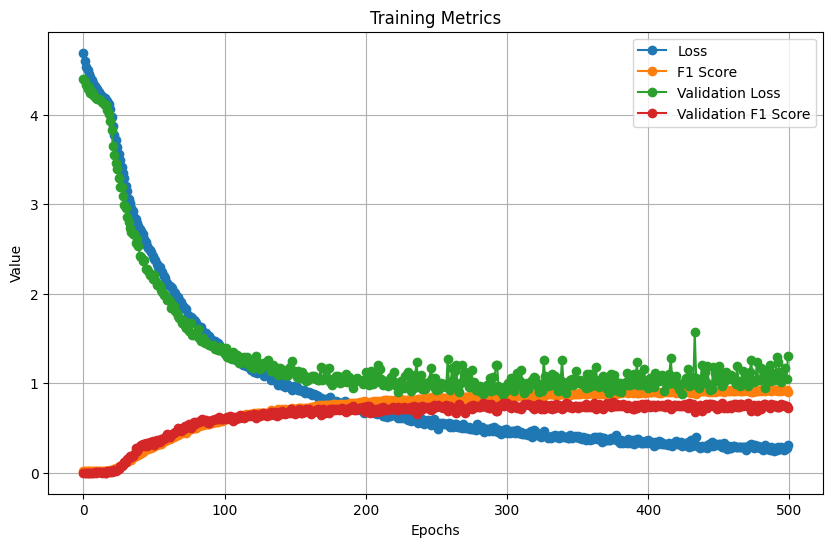

In [140]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [119]:
reconstructed_model = tf.keras.models.load_model("2 1DCNN + 1 GRU")

2023-09-08 01:20:37.407224: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-08 01:20:37.483234: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1739 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


In [120]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 122, 100)          359200    
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 13, 125)           12625     
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 13, 125)          0         
 1D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 13, 125)           0         
                                                                 
 gru_1 (GRU)                 (None, 75)               

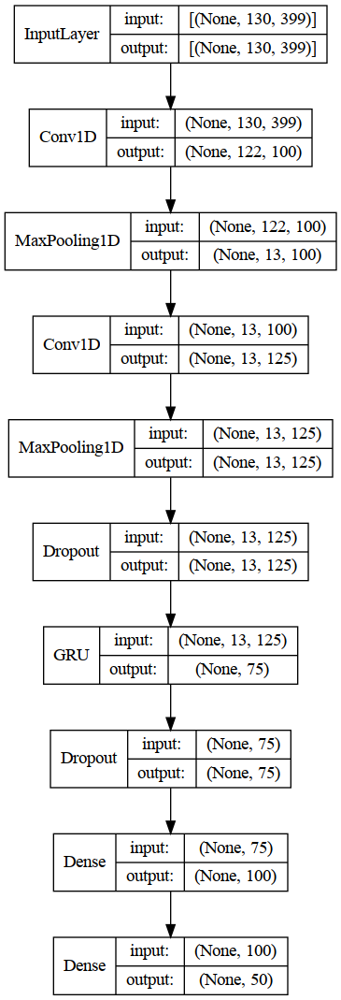

In [121]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [122]:
reconstructed_model.evaluate(Xval,Yval)

2023-09-08 01:20:47.578885: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 67223520 exceeds 10% of free system memory.
2023-09-08 01:20:47.642676: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 67223520 exceeds 10% of free system memory.
2023-09-08 01:20:48.615446: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700


11/11 [==============================] - 2s 19ms/step - loss: 0.9192 - f1_score: 0.7912


[0.9192284345626831, 0.7912141680717468]

In [123]:
reconstructed_model.evaluate(Xtrain,Ytrain)

2023-09-08 01:21:06.069351: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 555216480 exceeds 10% of free system memory.
2023-09-08 01:21:06.651930: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 555216480 exceeds 10% of free system memory.


84/84 [==============================] - 1s 16ms/step - loss: 0.0864 - f1_score: 0.9901


[0.08639702200889587, 0.9900971055030823]

In [145]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 8ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.667     1.000     0.800         6
  BASKETBALL      0.900     0.900     0.900        10
         BEE      0.692     0.900     0.783        10
        BELT      0.800     1.000     0.889         4
        BITE      1.000     1.000     1.000         8
   BREAKFAST      0.667     0.667     0.667         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.400     0.333     0.364         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      1.000     0.750     0.857         8
     DEVELOP      0.750     0.500     0.600         6
      DINNER      0.889     1.000     0.941         8
         DOG      1.000     

In [175]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 1DCNN + 1 GRU Lecunnormal/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [176]:
act_function = 'selu'
initializer = tf.keras.initializers.LecunNormal(seed=10)

model = Sequential()
model.add(Conv1D(filters=150,kernel_size=9,kernel_initializer=initializer,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=3))
model.add(Conv1D(filters=150,kernel_size=5,kernel_initializer=initializer,activation=act_function))
model.add(MaxPooling1D(pool_size=3))
#model.add(Dropout(.15))
model.add(GRU(units=175,return_sequences=False,kernel_initializer=initializer,kernel_regularizer=regularizers.l2(.00014882201555231845)))
#model.add(Dropout(.35))
model.add(Dense(units=100,activation=act_function,kernel_initializer=initializer))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.00022221143188447883),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 122, 150)          170250    
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 40, 150)          0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 36, 150)           112650    
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 12, 150)          0         
 1D)                                                             
                                                                 
 gru_1 (GRU)                 (None, 175)               171675    
                                                                 
 dense_12 (Dense)            (None, 100)              

2023-09-02 11:32:31.534730: W tensorflow/core/common_runtime/bfc_allocator.cc:360] Garbage collection: deallocate free memory regions (i.e., allocations) so that we can re-allocate a larger region to avoid OOM due to memory fragmentation. If you see this message frequently, you are running near the threshold of the available device memory and re-allocation may incur great performance overhead. You may try smaller batch sizes to observe the performance impact. Set TF_ENABLE_GPU_GARBAGE_COLLECTION=false if you'd like to disable this feature.


28/28 [==============================] - ETA: 0s - loss: 3.9524 - f1_score: 0.0262

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 20s 506ms/step - loss: 3.9524 - f1_score: 0.0262 - val_loss: 3.8113 - val_f1_score: 0.0221
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.6908 - f1_score: 0.0638

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 320ms/step - loss: 3.6874 - f1_score: 0.0645 - val_loss: 3.5468 - val_f1_score: 0.0658
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3860 - f1_score: 0.1420

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 11s 392ms/step - loss: 3.3822 - f1_score: 0.1428 - val_loss: 3.2278 - val_f1_score: 0.2006
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 3.0381 - f1_score: 0.2173

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 303ms/step - loss: 3.0338 - f1_score: 0.2180 - val_loss: 2.9106 - val_f1_score: 0.2085
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6883 - f1_score: 0.3069

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 310ms/step - loss: 2.6862 - f1_score: 0.3088 - val_loss: 2.6226 - val_f1_score: 0.3083
Epoch 6/500
27/28 [===========================>..] - ETA: 0s - loss: 2.3730 - f1_score: 0.3924

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 318ms/step - loss: 2.3672 - f1_score: 0.3921 - val_loss: 2.3753 - val_f1_score: 0.3634
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1049 - f1_score: 0.4596

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 316ms/step - loss: 2.1050 - f1_score: 0.4612 - val_loss: 2.1508 - val_f1_score: 0.4644
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 1.8724 - f1_score: 0.5444

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 306ms/step - loss: 1.8719 - f1_score: 0.5447 - val_loss: 1.9728 - val_f1_score: 0.4871
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6931 - f1_score: 0.5947

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 296ms/step - loss: 1.6840 - f1_score: 0.5950 - val_loss: 1.8070 - val_f1_score: 0.5575
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5222 - f1_score: 0.6512

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 286ms/step - loss: 1.5195 - f1_score: 0.6501 - val_loss: 1.7287 - val_f1_score: 0.5744
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3952 - f1_score: 0.6817

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 340ms/step - loss: 1.4009 - f1_score: 0.6804 - val_loss: 1.6171 - val_f1_score: 0.6317
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2832 - f1_score: 0.7065

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 347ms/step - loss: 1.2747 - f1_score: 0.7098 - val_loss: 1.5217 - val_f1_score: 0.6695
Epoch 13/500
28/28 [==============================] - 1s 50ms/step - loss: 1.1789 - f1_score: 0.7392 - val_loss: 1.4640 - val_f1_score: 0.6445
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0897 - f1_score: 0.7586

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 315ms/step - loss: 1.0858 - f1_score: 0.7600 - val_loss: 1.3941 - val_f1_score: 0.6812
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0128 - f1_score: 0.7762

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 290ms/step - loss: 1.0098 - f1_score: 0.7774 - val_loss: 1.3454 - val_f1_score: 0.6857
Epoch 16/500
27/28 [===========================>..] - ETA: 0s - loss: 0.9371 - f1_score: 0.8031

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 339ms/step - loss: 0.9357 - f1_score: 0.8018 - val_loss: 1.3114 - val_f1_score: 0.7354
Epoch 17/500
28/28 [==============================] - 1s 48ms/step - loss: 0.8711 - f1_score: 0.8199 - val_loss: 1.2751 - val_f1_score: 0.7316
Epoch 18/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8072 - f1_score: 0.8357

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 303ms/step - loss: 0.8094 - f1_score: 0.8338 - val_loss: 1.2299 - val_f1_score: 0.7445
Epoch 19/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7520 - f1_score: 0.8558

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 303ms/step - loss: 0.7526 - f1_score: 0.8538 - val_loss: 1.2010 - val_f1_score: 0.7466
Epoch 20/500
28/28 [==============================] - 1s 48ms/step - loss: 0.6971 - f1_score: 0.8660 - val_loss: 1.1928 - val_f1_score: 0.7263
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6543 - f1_score: 0.8849

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 323ms/step - loss: 0.6518 - f1_score: 0.8844 - val_loss: 1.1444 - val_f1_score: 0.7529
Epoch 22/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6068 - f1_score: 0.8924

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 345ms/step - loss: 0.6074 - f1_score: 0.8905 - val_loss: 1.1500 - val_f1_score: 0.7667
Epoch 23/500
27/28 [===========================>..] - ETA: 0s - loss: 0.5743 - f1_score: 0.8957

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 307ms/step - loss: 0.5724 - f1_score: 0.8972 - val_loss: 1.0960 - val_f1_score: 0.7748
Epoch 24/500
28/28 [==============================] - 1s 48ms/step - loss: 0.5326 - f1_score: 0.9077 - val_loss: 1.0929 - val_f1_score: 0.7613
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4935 - f1_score: 0.9213

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.4942 - f1_score: 0.9211 - val_loss: 1.0713 - val_f1_score: 0.7794
Epoch 26/500
28/28 [==============================] - 1s 48ms/step - loss: 0.4628 - f1_score: 0.9284 - val_loss: 1.0675 - val_f1_score: 0.7721
Epoch 27/500
28/28 [==============================] - 1s 48ms/step - loss: 0.4321 - f1_score: 0.9344 - val_loss: 1.0516 - val_f1_score: 0.7652
Epoch 28/500
28/28 [==============================] - 1s 47ms/step - loss: 0.4042 - f1_score: 0.9410 - val_loss: 1.0568 - val_f1_score: 0.7550
Epoch 29/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3773 - f1_score: 0.9507 - val_loss: 1.0314 - val_f1_score: 0.7773
Epoch 30/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3560 - f1_score: 0.9556 - val_loss: 1.0419 - val_f1_score: 0.7719
Epoch 31/500
28/28 [==============================] - 1s 48ms/step - loss: 0.3349 - f1_score: 0.9611 - val_loss: 1.0251 - val_f1_score: 0.7700
Epoch 32/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 10s 369ms/step - loss: 0.1937 - f1_score: 0.9914 - val_loss: 0.9680 - val_f1_score: 0.7928
Epoch 41/500
28/28 [==============================] - 1s 49ms/step - loss: 0.1836 - f1_score: 0.9921 - val_loss: 0.9709 - val_f1_score: 0.7784
Epoch 42/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1739 - f1_score: 0.9933 - val_loss: 0.9852 - val_f1_score: 0.7765
Epoch 43/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1647 - f1_score: 0.9959 - val_loss: 1.0054 - val_f1_score: 0.7772
Epoch 44/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1596 - f1_score: 0.9966 - val_loss: 0.9617 - val_f1_score: 0.7831
Epoch 45/500
27/28 [===========================>..] - ETA: 0s - loss: 0.1514 - f1_score: 0.9969

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 10s 373ms/step - loss: 0.1520 - f1_score: 0.9970 - val_loss: 0.9739 - val_f1_score: 0.7971
Epoch 46/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1450 - f1_score: 0.9963 - val_loss: 0.9809 - val_f1_score: 0.7951
Epoch 47/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1395 - f1_score: 0.9982 - val_loss: 0.9587 - val_f1_score: 0.7817
Epoch 48/500
28/28 [==============================] - 1s 48ms/step - loss: 0.1326 - f1_score: 0.9985 - val_loss: 0.9797 - val_f1_score: 0.7826
Epoch 49/500
28/28 [==============================] - 1s 49ms/step - loss: 0.1281 - f1_score: 0.9989 - val_loss: 0.9644 - val_f1_score: 0.7856
Epoch 50/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1237 - f1_score: 0.9993 - val_loss: 0.9721 - val_f1_score: 0.7943
Epoch 51/500
28/28 [==============================] - 1s 49ms/step - loss: 0.1190 - f1_score: 0.9992 - val_loss: 0.9593 - val_f1_score: 0.7869
Epoch 52/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 10s 377ms/step - loss: 0.0919 - f1_score: 1.0000 - val_loss: 0.9754 - val_f1_score: 0.7984
Epoch 62/500
27/28 [===========================>..] - ETA: 0s - loss: 0.0897 - f1_score: 1.0000

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 8s 284ms/step - loss: 0.0897 - f1_score: 1.0000 - val_loss: 0.9628 - val_f1_score: 0.7995
Epoch 63/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0879 - f1_score: 1.0000 - val_loss: 0.9827 - val_f1_score: 0.7942
Epoch 64/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0864 - f1_score: 1.0000 - val_loss: 0.9765 - val_f1_score: 0.7854
Epoch 65/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0846 - f1_score: 1.0000 - val_loss: 0.9748 - val_f1_score: 0.7854
Epoch 66/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0833 - f1_score: 1.0000 - val_loss: 0.9662 - val_f1_score: 0.7929
Epoch 67/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0817 - f1_score: 1.0000 - val_loss: 0.9748 - val_f1_score: 0.7863
Epoch 68/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0805 - f1_score: 1.0000 - val_loss: 0.9906 - val_f1_score: 0.7936
Epoch 69/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 319ms/step - loss: 0.0796 - f1_score: 1.0000 - val_loss: 0.9674 - val_f1_score: 0.8015
Epoch 70/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0782 - f1_score: 1.0000 - val_loss: 0.9698 - val_f1_score: 0.7909
Epoch 71/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0769 - f1_score: 1.0000 - val_loss: 0.9759 - val_f1_score: 0.7972
Epoch 72/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0758 - f1_score: 1.0000 - val_loss: 0.9775 - val_f1_score: 0.7948
Epoch 73/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0748 - f1_score: 1.0000 - val_loss: 0.9794 - val_f1_score: 0.7964
Epoch 74/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0738 - f1_score: 1.0000 - val_loss: 0.9775 - val_f1_score: 0.7948
Epoch 75/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0726 - f1_score: 1.0000 - val_loss: 0.9797 - val_f1_score: 0.7966
Epoch 76/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 11s 404ms/step - loss: 0.0593 - f1_score: 1.0000 - val_loss: 1.0058 - val_f1_score: 0.8017
Epoch 94/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0587 - f1_score: 1.0000 - val_loss: 0.9926 - val_f1_score: 0.7936
Epoch 95/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0581 - f1_score: 1.0000 - val_loss: 0.9944 - val_f1_score: 0.8014
Epoch 96/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0576 - f1_score: 1.0000 - val_loss: 1.0049 - val_f1_score: 0.7994
Epoch 97/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0570 - f1_score: 1.0000 - val_loss: 0.9967 - val_f1_score: 0.7966
Epoch 98/500
27/28 [===========================>..] - ETA: 0s - loss: 0.0565 - f1_score: 1.0000

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.0564 - f1_score: 1.0000 - val_loss: 1.0073 - val_f1_score: 0.8086
Epoch 99/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0559 - f1_score: 1.0000 - val_loss: 0.9954 - val_f1_score: 0.8016
Epoch 100/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0554 - f1_score: 1.0000 - val_loss: 1.0022 - val_f1_score: 0.8015
Epoch 101/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0549 - f1_score: 1.0000 - val_loss: 1.0029 - val_f1_score: 0.8012
Epoch 102/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0543 - f1_score: 1.0000 - val_loss: 1.0014 - val_f1_score: 0.7972
Epoch 103/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0538 - f1_score: 1.0000 - val_loss: 1.0012 - val_f1_score: 0.7990
Epoch 104/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0533 - f1_score: 1.0000 - val_loss: 1.0034 - val_f1_score: 0.7967
Epoch 

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 10s 370ms/step - loss: 0.0486 - f1_score: 1.0000 - val_loss: 1.0089 - val_f1_score: 0.8110
Epoch 115/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0482 - f1_score: 1.0000 - val_loss: 1.0123 - val_f1_score: 0.8054
Epoch 116/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0477 - f1_score: 1.0000 - val_loss: 1.0107 - val_f1_score: 0.8020
Epoch 117/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0473 - f1_score: 1.0000 - val_loss: 1.0170 - val_f1_score: 0.8082
Epoch 118/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0469 - f1_score: 1.0000 - val_loss: 1.0096 - val_f1_score: 0.8048
Epoch 119/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0464 - f1_score: 1.0000 - val_loss: 1.0127 - val_f1_score: 0.7998
Epoch 120/500
27/28 [===========================>..] - ETA: 0s - loss: 0.0460 - f1_score: 1.0000

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 9s 347ms/step - loss: 0.0460 - f1_score: 1.0000 - val_loss: 1.0218 - val_f1_score: 0.8121
Epoch 121/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0456 - f1_score: 1.0000 - val_loss: 1.0147 - val_f1_score: 0.8027
Epoch 122/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0452 - f1_score: 1.0000 - val_loss: 1.0124 - val_f1_score: 0.8085
Epoch 123/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0448 - f1_score: 1.0000 - val_loss: 1.0184 - val_f1_score: 0.8029
Epoch 124/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0444 - f1_score: 1.0000 - val_loss: 1.0170 - val_f1_score: 0.8026
Epoch 125/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0439 - f1_score: 1.0000 - val_loss: 1.0130 - val_f1_score: 0.8119
Epoch 126/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0436 - f1_score: 1.0000 - val_loss: 1.0187 - val_f1_score: 0.8094
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 11s 410ms/step - loss: 0.0401 - f1_score: 1.0000 - val_loss: 1.0327 - val_f1_score: 0.8174
Epoch 136/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0397 - f1_score: 1.0000 - val_loss: 1.0235 - val_f1_score: 0.8163
Epoch 137/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0394 - f1_score: 1.0000 - val_loss: 1.0131 - val_f1_score: 0.8130
Epoch 138/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0390 - f1_score: 1.0000 - val_loss: 1.0330 - val_f1_score: 0.8082
Epoch 139/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0386 - f1_score: 1.0000 - val_loss: 1.0256 - val_f1_score: 0.8088
Epoch 140/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0383 - f1_score: 1.0000 - val_loss: 1.0272 - val_f1_score: 0.8161
Epoch 141/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0379 - f1_score: 1.0000 - val_loss: 1.0234 - val_f1_score: 0.8083
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 10s 378ms/step - loss: 0.0359 - f1_score: 1.0000 - val_loss: 1.0256 - val_f1_score: 0.8215
Epoch 148/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0355 - f1_score: 1.0000 - val_loss: 1.0267 - val_f1_score: 0.8026
Epoch 149/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0352 - f1_score: 1.0000 - val_loss: 1.0342 - val_f1_score: 0.8038
Epoch 150/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0349 - f1_score: 1.0000 - val_loss: 1.0393 - val_f1_score: 0.8097
Epoch 151/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0345 - f1_score: 1.0000 - val_loss: 1.0390 - val_f1_score: 0.8056
Epoch 152/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0342 - f1_score: 1.0000 - val_loss: 1.0383 - val_f1_score: 0.8104
Epoch 153/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0339 - f1_score: 1.0000 - val_loss: 1.0341 - val_f1_score: 0.8139
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 10s 363ms/step - loss: 0.0242 - f1_score: 1.0000 - val_loss: 1.0555 - val_f1_score: 0.8221
Epoch 187/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0239 - f1_score: 1.0000 - val_loss: 1.0519 - val_f1_score: 0.8092
Epoch 188/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0237 - f1_score: 1.0000 - val_loss: 1.0619 - val_f1_score: 0.8073
Epoch 189/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0234 - f1_score: 1.0000 - val_loss: 1.0527 - val_f1_score: 0.8132
Epoch 190/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0231 - f1_score: 1.0000 - val_loss: 1.0588 - val_f1_score: 0.8092
Epoch 191/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0229 - f1_score: 1.0000 - val_loss: 1.0505 - val_f1_score: 0.8198
Epoch 192/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0226 - f1_score: 1.0000 - val_loss: 1.0615 - val_f1_score: 0.8082
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Lecunnormal/assets


28/28 [==============================] - 11s 393ms/step - loss: 0.0166 - f1_score: 1.0000 - val_loss: 1.0918 - val_f1_score: 0.8245
Epoch 219/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0164 - f1_score: 1.0000 - val_loss: 1.0829 - val_f1_score: 0.8123
Epoch 220/500
28/28 [==============================] - 1s 48ms/step - loss: 0.0162 - f1_score: 1.0000 - val_loss: 1.0833 - val_f1_score: 0.8087
Epoch 221/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0160 - f1_score: 1.0000 - val_loss: 1.0953 - val_f1_score: 0.8207
Epoch 222/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0158 - f1_score: 1.0000 - val_loss: 1.1034 - val_f1_score: 0.8168
Epoch 223/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0156 - f1_score: 1.0000 - val_loss: 1.0967 - val_f1_score: 0.8137
Epoch 224/500
28/28 [==============================] - 1s 49ms/step - loss: 0.0154 - f1_score: 1.0000 - val_loss: 1.0947 - val_f1_score: 0.8088
Epoc

Epoch 275/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0155 - f1_score: 1.0000 - val_loss: 1.0522 - val_f1_score: 0.8063
Epoch 276/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0154 - f1_score: 1.0000 - val_loss: 1.0547 - val_f1_score: 0.8008
Epoch 277/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0153 - f1_score: 1.0000 - val_loss: 1.0542 - val_f1_score: 0.8029
Epoch 278/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0152 - f1_score: 1.0000 - val_loss: 1.0555 - val_f1_score: 0.8081
Epoch 279/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0152 - f1_score: 1.0000 - val_loss: 1.0524 - val_f1_score: 0.7967
Epoch 280/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0151 - f1_score: 1.0000 - val_loss: 1.0566 - val_f1_score: 0.8029
Epoch 281/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0150 - f1_score: 1.0000 - val_loss: 1.0535 - val_f1_score:

Epoch 332/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0128 - f1_score: 1.0000 - val_loss: 1.0938 - val_f1_score: 0.8067
Epoch 333/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0128 - f1_score: 1.0000 - val_loss: 1.0977 - val_f1_score: 0.8091
Epoch 334/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0128 - f1_score: 1.0000 - val_loss: 1.0980 - val_f1_score: 0.8091
Epoch 335/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0127 - f1_score: 1.0000 - val_loss: 1.0984 - val_f1_score: 0.8091
Epoch 336/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0127 - f1_score: 1.0000 - val_loss: 1.0978 - val_f1_score: 0.8075
Epoch 337/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0127 - f1_score: 1.0000 - val_loss: 1.0923 - val_f1_score: 0.8010
Epoch 338/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0126 - f1_score: 1.0000 - val_loss: 1.0998 - val_f1_score:

Epoch 389/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0107 - f1_score: 1.0000 - val_loss: 1.1239 - val_f1_score: 0.8113
Epoch 390/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0106 - f1_score: 1.0000 - val_loss: 1.1220 - val_f1_score: 0.8054
Epoch 391/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0106 - f1_score: 1.0000 - val_loss: 1.1170 - val_f1_score: 0.8058
Epoch 392/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0105 - f1_score: 1.0000 - val_loss: 1.1319 - val_f1_score: 0.8178
Epoch 393/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0105 - f1_score: 1.0000 - val_loss: 1.1282 - val_f1_score: 0.8058
Epoch 394/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0104 - f1_score: 1.0000 - val_loss: 1.1260 - val_f1_score: 0.8088
Epoch 395/500
28/28 [==============================] - 1s 54ms/step - loss: 0.0104 - f1_score: 1.0000 - val_loss: 1.1287 - val_f1_score:

Epoch 446/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0079 - f1_score: 1.0000 - val_loss: 1.1618 - val_f1_score: 0.8053
Epoch 447/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0078 - f1_score: 1.0000 - val_loss: 1.1597 - val_f1_score: 0.8031
Epoch 448/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0078 - f1_score: 1.0000 - val_loss: 1.1515 - val_f1_score: 0.8138
Epoch 449/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0077 - f1_score: 1.0000 - val_loss: 1.1536 - val_f1_score: 0.8081
Epoch 450/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0076 - f1_score: 1.0000 - val_loss: 1.1589 - val_f1_score: 0.8138
Epoch 451/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0076 - f1_score: 1.0000 - val_loss: 1.1587 - val_f1_score: 0.8072
Epoch 452/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0075 - f1_score: 1.0000 - val_loss: 1.1633 - val_f1_score:

In [177]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 13ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.800     0.667     0.727         6
  BASKETBALL      1.000     0.800     0.889        10
         BEE      0.875     0.700     0.778        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.600     1.000     0.750         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      0.833     0.833     0.833         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.750     1.000     0.857         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.556     0.833     0.667         6
      DINNER      0.857     0.750     0.800         8
         DOG      1.000    

In [178]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 1DCNN + 1 GRU Lecunnormal/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [179]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.005095,1.0,1.203017,0.808050
496,0.005040,1.0,1.217048,0.807769
497,0.004984,1.0,1.223447,0.802521
498,0.004930,1.0,1.219798,0.804780
499,0.004875,1.0,1.206948,0.800682


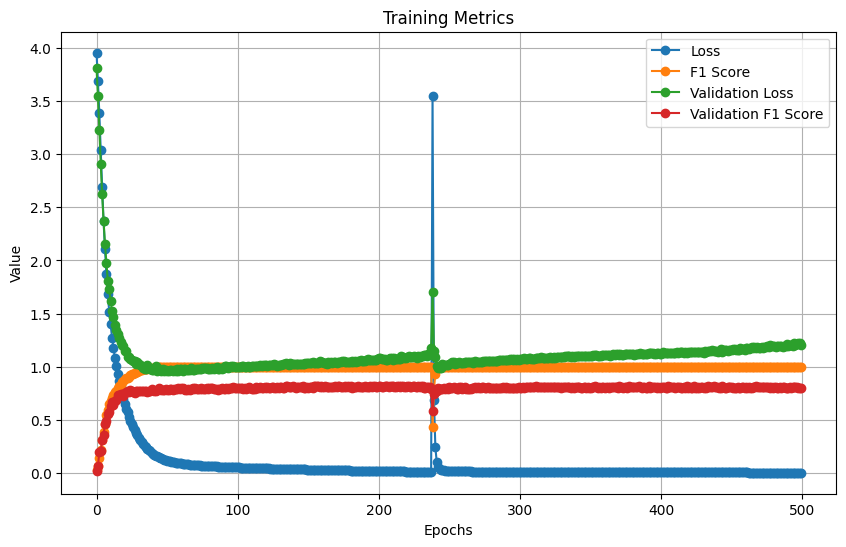

In [180]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [138]:
reconstructed_model = tf.keras.models.load_model("2 1DCNN + 1 GRU Lecunnormal")

In [140]:
reconstructed_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 122, 150)          170250    
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 40, 150)          0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 36, 150)           112650    
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 12, 150)          0         
 1D)                                                             
                                                                 
 gru_1 (GRU)                 (None, 175)               171675    
                                                                 
 dense_12 (Dense)            (None, 100)              

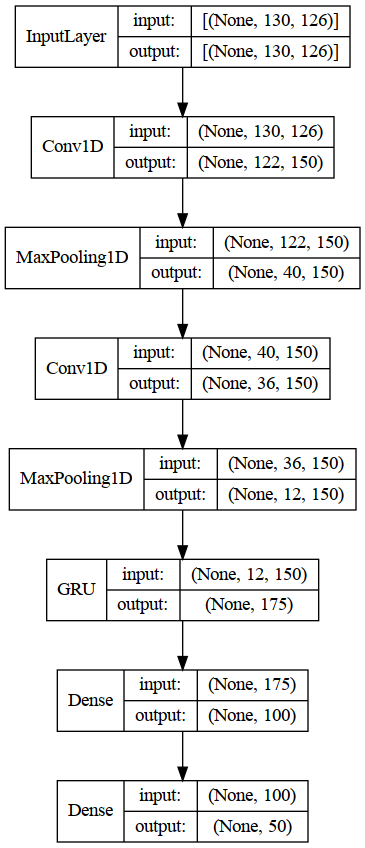

In [141]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [139]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 9ms/step - loss: 1.0918 - f1_score: 0.8245


[1.0918312072753906, 0.8245251178741455]

In [183]:
reconstructed_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 122, 150)          170250    
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 40, 150)          0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 36, 150)           112650    
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 12, 150)          0         
 1D)                                                             
                                                                 
 gru_1 (GRU)                 (None, 175)               171675    
                                                                 
 dense_12 (Dense)            (None, 100)              

In [184]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      0.875     0.875     0.875         8
    BACKPACK      0.833     0.833     0.833         6
  BASKETBALL      1.000     0.900     0.947        10
         BEE      1.000     0.700     0.824        10
        BELT      1.000     1.000     1.000         4
        BITE      0.889     1.000     0.941         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      0.800     0.667     0.727         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.750     1.000     0.857         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.833     0.625     0.714         8
     DEVELOP      0.625     0.833     0.714         6
      DINNER      0.750     0.750     0.750         8
         DOG      1.000     

In [185]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 1DCNN + 1 GRU Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [217]:
act_function = mish
model = Sequential()
model.add(Conv1D(filters=150,kernel_size=9,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=3))
model.add(Conv1D(filters=150,kernel_size=5,activation=act_function))
model.add(MaxPooling1D(pool_size=3))
model.add(Dropout(.15))
model.add(GRU(units=175,return_sequences=False,kernel_regularizer=regularizers.l2(.00014882201555231845)))
model.add(Dropout(.35))
model.add(Dense(units=100,activation=act_function))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.00022221143188447883),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_7 (Conv1D)           (None, 122, 150)          170250    
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 40, 150)          0         
 1D)                                                             
                                                                 
 conv1d_8 (Conv1D)           (None, 36, 150)           112650    
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 12, 150)          0         
 1D)                                                             
                                                                 
 dropout_12 (Dropout)        (None, 12, 150)           0         
                                                                 
 gru_4 (GRU)                 (None, 175)              

28/28 [==============================] - 2s 55ms/step - loss: 0.1090 - f1_score: 0.9830 - val_loss: 1.1026 - val_f1_score: 0.7589
Epoch 104/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1055 - f1_score: 0.9840 - val_loss: 1.0829 - val_f1_score: 0.7676
Epoch 105/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1020 - f1_score: 0.9863 - val_loss: 1.1162 - val_f1_score: 0.7529
Epoch 106/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0997 - f1_score: 0.9865 - val_loss: 1.0822 - val_f1_score: 0.7662
Epoch 107/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0999 - f1_score: 0.9849 - val_loss: 1.0156 - val_f1_score: 0.7843
Epoch 108/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0923 - f1_score: 0.9902 - val_loss: 1.0896 - val_f1_score: 0.7536
Epoch 109/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0915 - f1_score: 0.9896 - val_loss: 1.0810 - val_f1_score: 0.7586
Epoch 

Epoch 160/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0465 - f1_score: 0.9982 - val_loss: 1.1779 - val_f1_score: 0.7786
Epoch 161/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0480 - f1_score: 0.9978 - val_loss: 1.2275 - val_f1_score: 0.7734
Epoch 162/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0458 - f1_score: 0.9984 - val_loss: 1.2747 - val_f1_score: 0.7724
Epoch 163/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0537 - f1_score: 0.9959 - val_loss: 1.1906 - val_f1_score: 0.7792
Epoch 164/500
28/28 [==============================] - 2s 57ms/step - loss: 0.0531 - f1_score: 0.9944 - val_loss: 1.2042 - val_f1_score: 0.7795
Epoch 165/500
28/28 [==============================] - 2s 59ms/step - loss: 0.0574 - f1_score: 0.9914 - val_loss: 1.2681 - val_f1_score: 0.7744
Epoch 166/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0541 - f1_score: 0.9947 - val_loss: 1.1780 - val_f1_score:

Epoch 217/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0318 - f1_score: 0.9989 - val_loss: 1.2433 - val_f1_score: 0.7712
Epoch 218/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0356 - f1_score: 0.9966 - val_loss: 1.3175 - val_f1_score: 0.7769
Epoch 219/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0327 - f1_score: 0.9989 - val_loss: 1.2610 - val_f1_score: 0.7787
Epoch 220/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0301 - f1_score: 1.0000 - val_loss: 1.3269 - val_f1_score: 0.7880
Epoch 221/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0307 - f1_score: 0.9988 - val_loss: 1.2338 - val_f1_score: 0.7945
Epoch 222/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0325 - f1_score: 0.9985 - val_loss: 1.3943 - val_f1_score: 0.7749
Epoch 223/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0380 - f1_score: 0.9967 - val_loss: 1.4206 - val_f1_score:

Epoch 274/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0236 - f1_score: 1.0000 - val_loss: 1.3460 - val_f1_score: 0.7989
Epoch 275/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0226 - f1_score: 1.0000 - val_loss: 1.3458 - val_f1_score: 0.7906
Epoch 276/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0241 - f1_score: 0.9996 - val_loss: 1.3717 - val_f1_score: 0.7997
Epoch 277/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0246 - f1_score: 0.9989 - val_loss: 1.4701 - val_f1_score: 0.7813
Epoch 278/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0242 - f1_score: 1.0000 - val_loss: 1.3177 - val_f1_score: 0.7911
Epoch 279/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0251 - f1_score: 0.9996 - val_loss: 1.4554 - val_f1_score: 0.7713
Epoch 280/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0248 - f1_score: 1.0000 - val_loss: 1.3894 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Mish/assets


28/28 [==============================] - 11s 400ms/step - loss: 0.0228 - f1_score: 0.9989 - val_loss: 1.2742 - val_f1_score: 0.8176
Epoch 302/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0288 - f1_score: 0.9968 - val_loss: 1.3496 - val_f1_score: 0.7982
Epoch 303/500
28/28 [==============================] - 1s 54ms/step - loss: 0.0585 - f1_score: 0.9872 - val_loss: 1.4056 - val_f1_score: 0.7884
Epoch 304/500
28/28 [==============================] - 2s 58ms/step - loss: 0.0406 - f1_score: 0.9946 - val_loss: 1.4059 - val_f1_score: 0.7872
Epoch 305/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0245 - f1_score: 0.9992 - val_loss: 1.4086 - val_f1_score: 0.7858
Epoch 306/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0243 - f1_score: 0.9993 - val_loss: 1.4350 - val_f1_score: 0.7903
Epoch 307/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0239 - f1_score: 0.9992 - val_loss: 1.2840 - val_f1_score: 0.7884
Epoc

Epoch 358/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0367 - f1_score: 0.9939 - val_loss: 1.6039 - val_f1_score: 0.7651
Epoch 359/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0373 - f1_score: 0.9942 - val_loss: 1.4112 - val_f1_score: 0.7910
Epoch 360/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0251 - f1_score: 0.9981 - val_loss: 1.3722 - val_f1_score: 0.7987
Epoch 361/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0259 - f1_score: 0.9978 - val_loss: 1.4703 - val_f1_score: 0.7945
Epoch 362/500
28/28 [==============================] - 2s 60ms/step - loss: 0.0253 - f1_score: 0.9977 - val_loss: 1.3986 - val_f1_score: 0.7968
Epoch 363/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0224 - f1_score: 0.9983 - val_loss: 1.4522 - val_f1_score: 0.7897
Epoch 364/500
28/28 [==============================] - 2s 57ms/step - loss: 0.0209 - f1_score: 0.9993 - val_loss: 1.4242 - val_f1_score:

Epoch 415/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0244 - f1_score: 0.9970 - val_loss: 1.3405 - val_f1_score: 0.7904
Epoch 416/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0241 - f1_score: 0.9977 - val_loss: 1.4357 - val_f1_score: 0.7862
Epoch 417/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0256 - f1_score: 0.9968 - val_loss: 1.3513 - val_f1_score: 0.7916
Epoch 418/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0229 - f1_score: 0.9982 - val_loss: 1.4422 - val_f1_score: 0.7890
Epoch 419/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0239 - f1_score: 0.9984 - val_loss: 1.5201 - val_f1_score: 0.8004
Epoch 420/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0203 - f1_score: 0.9996 - val_loss: 1.4509 - val_f1_score: 0.8077
Epoch 421/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0173 - f1_score: 1.0000 - val_loss: 1.4182 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Mish/assets


28/28 [==============================] - 11s 400ms/step - loss: 0.0167 - f1_score: 1.0000 - val_loss: 1.3519 - val_f1_score: 0.8203
Epoch 443/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0161 - f1_score: 0.9997 - val_loss: 1.3835 - val_f1_score: 0.8075
Epoch 444/500
28/28 [==============================] - 1s 54ms/step - loss: 0.0157 - f1_score: 1.0000 - val_loss: 1.4607 - val_f1_score: 0.7865
Epoch 445/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0152 - f1_score: 1.0000 - val_loss: 1.3685 - val_f1_score: 0.8083
Epoch 446/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0156 - f1_score: 1.0000 - val_loss: 1.3142 - val_f1_score: 0.8050
Epoch 447/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0158 - f1_score: 0.9996 - val_loss: 1.4362 - val_f1_score: 0.7842
Epoch 448/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0150 - f1_score: 1.0000 - val_loss: 1.3295 - val_f1_score: 0.8038
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Mish/assets


28/28 [==============================] - 11s 414ms/step - loss: 0.0163 - f1_score: 1.0000 - val_loss: 1.3703 - val_f1_score: 0.8265
Epoch 464/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0158 - f1_score: 1.0000 - val_loss: 1.3660 - val_f1_score: 0.8159
Epoch 465/500
28/28 [==============================] - 1s 54ms/step - loss: 0.0162 - f1_score: 0.9997 - val_loss: 1.4270 - val_f1_score: 0.7981
Epoch 466/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0261 - f1_score: 0.9977 - val_loss: 1.4723 - val_f1_score: 0.7878
Epoch 467/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0508 - f1_score: 0.9917 - val_loss: 1.5407 - val_f1_score: 0.7786
Epoch 468/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0245 - f1_score: 0.9977 - val_loss: 1.4623 - val_f1_score: 0.7843
Epoch 469/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0220 - f1_score: 0.9984 - val_loss: 1.4424 - val_f1_score: 0.7881
Epoc

In [218]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 9ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      1.000     0.833     0.909         6
  BASKETBALL      1.000     0.900     0.947        10
         BEE      0.818     0.900     0.857        10
        BELT      1.000     0.500     0.667         4
        BITE      0.727     1.000     0.842         8
   BREAKFAST      0.750     1.000     0.857         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      0.833     0.833     0.833         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.833     0.833     0.833         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.833     0.625     0.714         8
     DEVELOP      0.400     0.667     0.500         6
      DINNER      0.625     0.625     0.625         8
         DOG      1.000     

In [219]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 1DCNN + 1 GRU Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [220]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.044695,0.990539,1.523088,0.775951
496,0.040289,0.990083,1.313566,0.793764
497,0.042085,0.989200,1.639284,0.770535
498,0.028848,0.993357,1.340617,0.796301
499,0.033711,0.993569,1.481415,0.794495


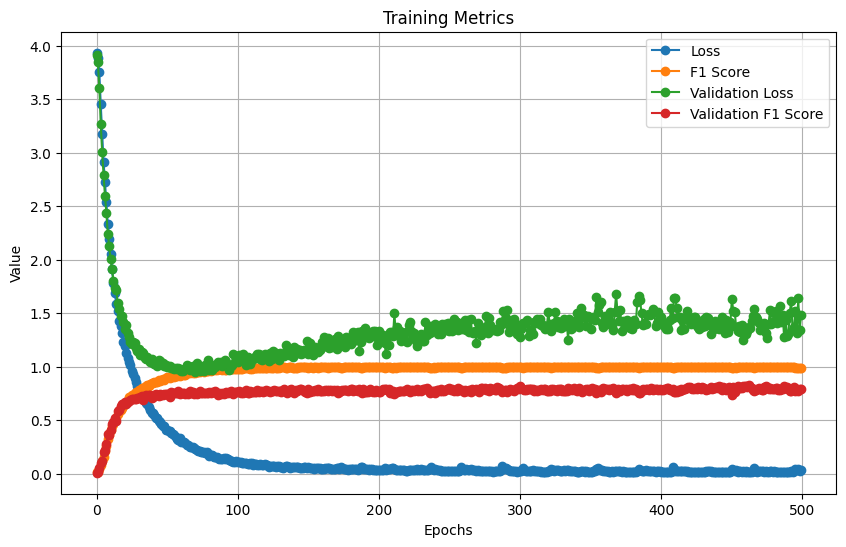

In [221]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [142]:
reconstructed_model = tf.keras.models.load_model("2 1DCNN + 1 GRU Mish")

In [143]:
reconstructed_model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_7 (Conv1D)           (None, 122, 150)          170250    
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 40, 150)          0         
 1D)                                                             
                                                                 
 conv1d_8 (Conv1D)           (None, 36, 150)           112650    
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 12, 150)          0         
 1D)                                                             
                                                                 
 dropout_12 (Dropout)        (None, 12, 150)           0         
                                                                 
 gru_4 (GRU)                 (None, 175)              

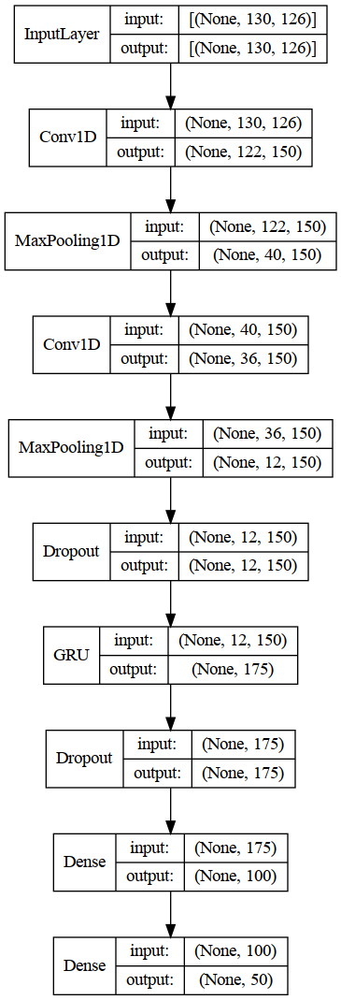

In [144]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [145]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 9ms/step - loss: 1.3703 - f1_score: 0.8265


[1.3703196048736572, 0.8264500498771667]

In [146]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 8ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      1.000     0.833     0.909         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      1.000     0.800     0.889        10
        BELT      1.000     0.500     0.667         4
        BITE      0.727     1.000     0.842         8
   BREAKFAST      0.600     1.000     0.750         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      0.778     0.875     0.824         8
     DEVELOP      0.625     0.833     0.714         6
      DINNER      0.750     0.750     0.750         8
         DOG      0.857     

## Hyperparameter Tuning 1 1D CNN Layer + 1 LSTM

In [119]:
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping


/tmp/ipykernel_2453193/1222377179.py:2: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [120]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, SpatialDropout1D, GRU
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','gelu','elu','relu'],default='gelu')
        model = Sequential()
        model.add(Conv1D(filters=hp.Int('filters_1',min_value=50,max_value=200,step=25,default=150),
                         kernel_size=hp.Choice('kernel_1',values=[5,10,15,20],default=20,),
                         activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=hp.Choice('pool_1',values=[5,10,15,20],default=20,)))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.0,max_value=0.9,default=0.8,step=0.05,)))
        model.add(LSTM(units=hp.Int('units_1',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=False,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.0,max_value=0.9,default=0.7,step=0.05,)))
        model.add(Dense(units=hp.Int('units_2',min_value=70,max_value=120,step=10,default=80),activation=act_function))
        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.00062198175395800846)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

In [121]:
HYPERBAND_MAX_EPOCHS = 300
#MAX_TRIALS = 20
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/',
    project_name='1_1D_CNN+1_LSTM',
    overwrite=False)

INFO:tensorflow:Reloading Tuner from /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/1_1D_CNN+1_LSTM/tuner0.json


In [122]:
tuner.search_space_summary()

Search space summary
Default search space size: 10
dense_activation (Choice)
{'default': 'gelu', 'conditions': [], 'values': ['selu', 'mish', 'gelu', 'elu', 'relu'], 'ordered': False}
filters_1 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_1 (Choice)
{'default': 20, 'conditions': [], 'values': [5, 10, 15, 20], 'ordered': True}
pool_1 (Choice)
{'default': 20, 'conditions': [], 'values': [5, 10, 15, 20], 'ordered': True}
dropout_1 (Float)
{'default': 0.8, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_1 (Int)
{'default': 100, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
regularizer (Float)
{'default': 0.001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
dropout_2 (Float)
{'default': 0.7, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_2 

In [123]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [124]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [125]:
tuner.search(Xtrain, Ytrain, epochs=1000, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 18m 16s]
val_f1_score: 0.48599615693092346

Best val_f1_score So Far: 0.6922096014022827
Total elapsed time: 13h 33m 12s
INFO:tensorflow:Oracle triggered exit


In [122]:
best_model = tuner.get_best_models(num_models=10)[0]

2023-09-10 12:10:16.313283: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-10 12:10:16.402915: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1561 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=100.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [127]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 121, 200)          798200    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 24, 200)          0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 24, 200)           0         
                                                                 
 lstm (LSTM)                 (None, 125)               163000    
                                                                 
 dropout_1 (Dropout)         (None, 125)               0         
                                                                 
 dense (Dense)               (None, 110)               13860     
                                                        

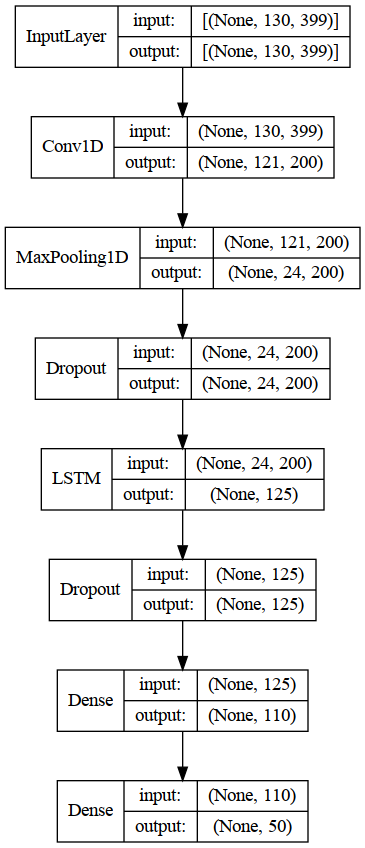

In [128]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

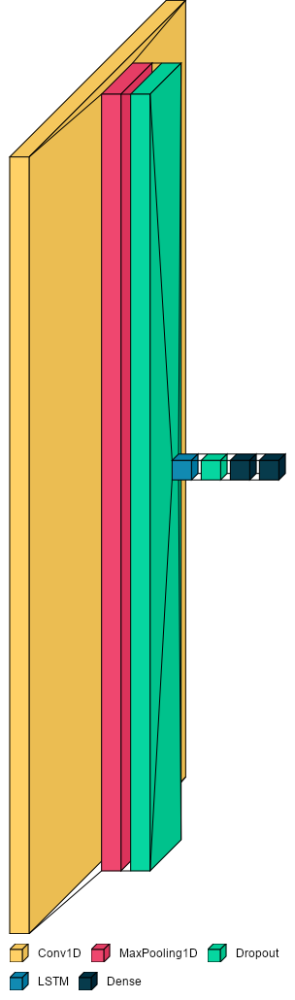

In [124]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(best_model, legend=True, font=font) 

In [129]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/1_1D_CNN+1_LSTM
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0714 summary
Hyperparameters:
dense_activation: elu
filters_1: 200
kernel_1: 10
pool_1: 5
dropout_1: 0.65
units_1: 125
regularizer: 0.0034365682734906543
dropout_2: 0.1
units_2: 110
learning_rate: 0.00015386971155916857
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0711
Score: 0.6922096014022827

Trial 0426 summary
Hyperparameters:
dense_activation: selu
filters_1: 125
kernel_1: 5
pool_1: 15
dropout_1: 0.05
units_1: 50
regularizer: 0.00022773443777239995
dropout_2: 0.2
units_2: 110
learning_rate: 0.0003243806953412315
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 5
tuner/round: 5
tuner/trial_id: 0425
Score: 0.6846268773078918

Trial 0670 summary
Hyperparameters:
dense_activation: mish
filters_1: 175
kernel_1: 5
pool_1: 15
dropout_1: 0.4
units_1: 200
regularize

In [130]:
loss, accuracy = best_model.evaluate(Xval, Yval)

11/11 [==============================] - 3s 60ms/step - loss: 1.2940 - f1_score: 0.6936


In [142]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 2s 18ms/step - loss: 0.3471 - f1_score: 0.9563


In [131]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(best_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 15ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      0.462     0.600     0.522        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     0.250     0.400         8
   BREAKFAST      0.625     0.833     0.714         6
      CANCER      0.800     1.000     0.889         8
   CHRISTMAS      0.667     1.000     0.800         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.333     0.333     0.333         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      1.000     0.333     0.500         6
      DINNER      0.750     0.750     0.750         8
         DOG      0.500    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [132]:
bestHP = tuner.get_best_hyperparameters(num_trials=10)[0]

In [133]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1DCNN + 1 LSTM/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [134]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - ETA: 0s - loss: 4.9186 - f1_score: 0.0117

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 21s 584ms/step - loss: 4.9186 - f1_score: 0.0117 - val_loss: 4.8784 - val_f1_score: 7.3404e-04
Epoch 2/500
28/28 [==============================] - 3s 91ms/step - loss: 4.8604 - f1_score: 0.0159 - val_loss: 4.8159 - val_f1_score: 7.2727e-04
Epoch 3/500
28/28 [==============================] - 3s 90ms/step - loss: 4.8141 - f1_score: 0.0162 - val_loss: 4.7778 - val_f1_score: 7.3394e-04
Epoch 4/500
28/28 [==============================] - 3s 91ms/step - loss: 4.7750 - f1_score: 0.0136 - val_loss: 4.7394 - val_f1_score: 7.2727e-04
Epoch 5/500
28/28 [==============================] - 3s 90ms/step - loss: 4.7328 - f1_score: 0.0134 - val_loss: 4.7000 - val_f1_score: 7.2727e-04
Epoch 6/500
28/28 [==============================] - ETA: 0s - loss: 4.6963 - f1_score: 0.0137

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 413ms/step - loss: 4.6963 - f1_score: 0.0137 - val_loss: 4.6644 - val_f1_score: 0.0012
Epoch 7/500
28/28 [==============================] - 3s 90ms/step - loss: 4.6618 - f1_score: 0.0128 - val_loss: 4.6322 - val_f1_score: 5.0473e-04
Epoch 8/500
28/28 [==============================] - ETA: 0s - loss: 4.6298 - f1_score: 0.0127

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 371ms/step - loss: 4.6298 - f1_score: 0.0127 - val_loss: 4.6037 - val_f1_score: 0.0012
Epoch 9/500
28/28 [==============================] - ETA: 0s - loss: 4.5921 - f1_score: 0.0116

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 392ms/step - loss: 4.5921 - f1_score: 0.0116 - val_loss: 4.5712 - val_f1_score: 0.0018
Epoch 10/500
28/28 [==============================] - ETA: 0s - loss: 4.5678 - f1_score: 0.0158

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 423ms/step - loss: 4.5678 - f1_score: 0.0158 - val_loss: 4.5355 - val_f1_score: 0.0032
Epoch 11/500
28/28 [==============================] - 3s 90ms/step - loss: 4.5371 - f1_score: 0.0176 - val_loss: 4.5027 - val_f1_score: 0.0012
Epoch 12/500
28/28 [==============================] - 3s 92ms/step - loss: 4.5081 - f1_score: 0.0193 - val_loss: 4.4711 - val_f1_score: 0.0026
Epoch 13/500
28/28 [==============================] - 3s 92ms/step - loss: 4.4721 - f1_score: 0.0184 - val_loss: 4.4628 - val_f1_score: 7.2727e-04
Epoch 14/500
28/28 [==============================] - 3s 93ms/step - loss: 4.4508 - f1_score: 0.0170 - val_loss: 4.4228 - val_f1_score: 0.0012
Epoch 15/500
28/28 [==============================] - ETA: 0s - loss: 4.4173 - f1_score: 0.0186

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 397ms/step - loss: 4.4173 - f1_score: 0.0186 - val_loss: 4.3913 - val_f1_score: 0.0055
Epoch 16/500
28/28 [==============================] - ETA: 0s - loss: 4.3877 - f1_score: 0.0225

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 421ms/step - loss: 4.3877 - f1_score: 0.0225 - val_loss: 4.3476 - val_f1_score: 0.0065
Epoch 17/500
28/28 [==============================] - ETA: 0s - loss: 4.3444 - f1_score: 0.0235

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 372ms/step - loss: 4.3444 - f1_score: 0.0235 - val_loss: 4.2816 - val_f1_score: 0.0203
Epoch 18/500
28/28 [==============================] - 3s 90ms/step - loss: 4.2738 - f1_score: 0.0297 - val_loss: 4.2007 - val_f1_score: 0.0155
Epoch 19/500
28/28 [==============================] - 3s 91ms/step - loss: 4.1782 - f1_score: 0.0303 - val_loss: 4.0966 - val_f1_score: 0.0177
Epoch 20/500
28/28 [==============================] - 3s 92ms/step - loss: 4.1090 - f1_score: 0.0307 - val_loss: 4.0482 - val_f1_score: 0.0015
Epoch 21/500
28/28 [==============================] - 3s 92ms/step - loss: 4.0188 - f1_score: 0.0267 - val_loss: 3.9240 - val_f1_score: 0.0087
Epoch 22/500
28/28 [==============================] - ETA: 0s - loss: 3.9471 - f1_score: 0.0267

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 377ms/step - loss: 3.9471 - f1_score: 0.0267 - val_loss: 3.8654 - val_f1_score: 0.0275
Epoch 23/500
28/28 [==============================] - ETA: 0s - loss: 3.8857 - f1_score: 0.0339

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 443ms/step - loss: 3.8857 - f1_score: 0.0339 - val_loss: 3.7526 - val_f1_score: 0.0372
Epoch 24/500
28/28 [==============================] - 3s 91ms/step - loss: 3.7998 - f1_score: 0.0468 - val_loss: 3.6479 - val_f1_score: 0.0325
Epoch 25/500
28/28 [==============================] - ETA: 0s - loss: 3.7123 - f1_score: 0.0539

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 388ms/step - loss: 3.7123 - f1_score: 0.0539 - val_loss: 3.5974 - val_f1_score: 0.0397
Epoch 26/500
28/28 [==============================] - ETA: 0s - loss: 3.6145 - f1_score: 0.0699

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 388ms/step - loss: 3.6145 - f1_score: 0.0699 - val_loss: 3.4944 - val_f1_score: 0.0694
Epoch 27/500
28/28 [==============================] - ETA: 0s - loss: 3.5421 - f1_score: 0.0749

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 388ms/step - loss: 3.5421 - f1_score: 0.0749 - val_loss: 3.4018 - val_f1_score: 0.0981
Epoch 28/500
28/28 [==============================] - 3s 91ms/step - loss: 3.4578 - f1_score: 0.0854 - val_loss: 3.3306 - val_f1_score: 0.0835
Epoch 29/500
28/28 [==============================] - 3s 91ms/step - loss: 3.3715 - f1_score: 0.0975 - val_loss: 3.2575 - val_f1_score: 0.0912
Epoch 30/500
28/28 [==============================] - 3s 92ms/step - loss: 3.2959 - f1_score: 0.1200 - val_loss: 3.1341 - val_f1_score: 0.0964
Epoch 31/500
28/28 [==============================] - ETA: 0s - loss: 3.1937 - f1_score: 0.1472

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 426ms/step - loss: 3.1937 - f1_score: 0.1472 - val_loss: 3.1597 - val_f1_score: 0.1249
Epoch 32/500
28/28 [==============================] - ETA: 0s - loss: 3.1141 - f1_score: 0.1644

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 364ms/step - loss: 3.1141 - f1_score: 0.1644 - val_loss: 2.9959 - val_f1_score: 0.1294
Epoch 33/500
28/28 [==============================] - ETA: 0s - loss: 3.0187 - f1_score: 0.1801

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 421ms/step - loss: 3.0187 - f1_score: 0.1801 - val_loss: 3.0235 - val_f1_score: 0.1380
Epoch 34/500
28/28 [==============================] - ETA: 0s - loss: 2.9483 - f1_score: 0.1979

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 373ms/step - loss: 2.9483 - f1_score: 0.1979 - val_loss: 2.9151 - val_f1_score: 0.1475
Epoch 35/500
28/28 [==============================] - ETA: 0s - loss: 2.9000 - f1_score: 0.1977

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 365ms/step - loss: 2.9000 - f1_score: 0.1977 - val_loss: 2.8686 - val_f1_score: 0.1805
Epoch 36/500
28/28 [==============================] - ETA: 0s - loss: 2.8038 - f1_score: 0.2256

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 390ms/step - loss: 2.8038 - f1_score: 0.2256 - val_loss: 2.7776 - val_f1_score: 0.2151
Epoch 37/500
28/28 [==============================] - 3s 90ms/step - loss: 2.7552 - f1_score: 0.2396 - val_loss: 2.8336 - val_f1_score: 0.1994
Epoch 38/500
28/28 [==============================] - ETA: 0s - loss: 2.6976 - f1_score: 0.2408

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 394ms/step - loss: 2.6976 - f1_score: 0.2408 - val_loss: 2.7603 - val_f1_score: 0.2160
Epoch 39/500
28/28 [==============================] - ETA: 0s - loss: 2.6420 - f1_score: 0.2705

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 377ms/step - loss: 2.6420 - f1_score: 0.2705 - val_loss: 2.6784 - val_f1_score: 0.2535
Epoch 40/500
28/28 [==============================] - ETA: 0s - loss: 2.5720 - f1_score: 0.2779

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 382ms/step - loss: 2.5720 - f1_score: 0.2779 - val_loss: 2.6147 - val_f1_score: 0.2600
Epoch 41/500
28/28 [==============================] - ETA: 0s - loss: 2.5544 - f1_score: 0.2824

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 370ms/step - loss: 2.5544 - f1_score: 0.2824 - val_loss: 2.5591 - val_f1_score: 0.2658
Epoch 42/500
28/28 [==============================] - ETA: 0s - loss: 2.4871 - f1_score: 0.3033

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 383ms/step - loss: 2.4871 - f1_score: 0.3033 - val_loss: 2.5220 - val_f1_score: 0.3196
Epoch 43/500
28/28 [==============================] - 3s 90ms/step - loss: 2.4579 - f1_score: 0.3151 - val_loss: 2.5531 - val_f1_score: 0.2833
Epoch 44/500
28/28 [==============================] - 3s 92ms/step - loss: 2.4168 - f1_score: 0.3074 - val_loss: 2.4947 - val_f1_score: 0.2923
Epoch 45/500
28/28 [==============================] - 3s 91ms/step - loss: 2.3673 - f1_score: 0.3298 - val_loss: 2.4384 - val_f1_score: 0.3127
Epoch 46/500
28/28 [==============================] - ETA: 0s - loss: 2.3422 - f1_score: 0.3373

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 384ms/step - loss: 2.3422 - f1_score: 0.3373 - val_loss: 2.3986 - val_f1_score: 0.3377
Epoch 47/500
28/28 [==============================] - 3s 92ms/step - loss: 2.2979 - f1_score: 0.3364 - val_loss: 2.4062 - val_f1_score: 0.3012
Epoch 48/500
28/28 [==============================] - 3s 91ms/step - loss: 2.2461 - f1_score: 0.3670 - val_loss: 2.4009 - val_f1_score: 0.3223
Epoch 49/500
28/28 [==============================] - ETA: 0s - loss: 2.2101 - f1_score: 0.3719

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 365ms/step - loss: 2.2101 - f1_score: 0.3719 - val_loss: 2.3387 - val_f1_score: 0.3387
Epoch 50/500
28/28 [==============================] - ETA: 0s - loss: 2.1948 - f1_score: 0.3782

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 403ms/step - loss: 2.1948 - f1_score: 0.3782 - val_loss: 2.3175 - val_f1_score: 0.3499
Epoch 51/500
28/28 [==============================] - 3s 90ms/step - loss: 2.1496 - f1_score: 0.3831 - val_loss: 2.3253 - val_f1_score: 0.3407
Epoch 52/500
28/28 [==============================] - 3s 91ms/step - loss: 2.0961 - f1_score: 0.4186 - val_loss: 2.3213 - val_f1_score: 0.3298
Epoch 53/500
28/28 [==============================] - 3s 93ms/step - loss: 2.0831 - f1_score: 0.4115 - val_loss: 2.3049 - val_f1_score: 0.3215
Epoch 54/500
28/28 [==============================] - 3s 92ms/step - loss: 2.0282 - f1_score: 0.4322 - val_loss: 2.2283 - val_f1_score: 0.3396
Epoch 55/500
28/28 [==============================] - ETA: 0s - loss: 2.0045 - f1_score: 0.4404

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 397ms/step - loss: 2.0045 - f1_score: 0.4404 - val_loss: 2.1948 - val_f1_score: 0.3557
Epoch 56/500
28/28 [==============================] - 3s 90ms/step - loss: 1.9750 - f1_score: 0.4366 - val_loss: 2.1666 - val_f1_score: 0.3530
Epoch 57/500
28/28 [==============================] - ETA: 0s - loss: 1.9555 - f1_score: 0.4474

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 402ms/step - loss: 1.9555 - f1_score: 0.4474 - val_loss: 2.1802 - val_f1_score: 0.3701
Epoch 58/500
28/28 [==============================] - ETA: 0s - loss: 1.9216 - f1_score: 0.4538

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 415ms/step - loss: 1.9216 - f1_score: 0.4538 - val_loss: 2.1159 - val_f1_score: 0.4052
Epoch 59/500
28/28 [==============================] - 3s 90ms/step - loss: 1.8962 - f1_score: 0.4680 - val_loss: 2.1496 - val_f1_score: 0.3804
Epoch 60/500
28/28 [==============================] - 3s 92ms/step - loss: 1.8699 - f1_score: 0.4815 - val_loss: 2.1220 - val_f1_score: 0.3793
Epoch 61/500
28/28 [==============================] - ETA: 0s - loss: 1.8260 - f1_score: 0.4853

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 368ms/step - loss: 1.8260 - f1_score: 0.4853 - val_loss: 2.0717 - val_f1_score: 0.4151
Epoch 62/500
28/28 [==============================] - 3s 90ms/step - loss: 1.7886 - f1_score: 0.5091 - val_loss: 2.0359 - val_f1_score: 0.3765
Epoch 63/500
28/28 [==============================] - 3s 92ms/step - loss: 1.7692 - f1_score: 0.5071 - val_loss: 2.0803 - val_f1_score: 0.4071
Epoch 64/500
28/28 [==============================] - ETA: 0s - loss: 1.7501 - f1_score: 0.5221

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 446ms/step - loss: 1.7501 - f1_score: 0.5221 - val_loss: 2.0704 - val_f1_score: 0.4296
Epoch 65/500
28/28 [==============================] - ETA: 0s - loss: 1.7286 - f1_score: 0.5219

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 440ms/step - loss: 1.7286 - f1_score: 0.5219 - val_loss: 2.0124 - val_f1_score: 0.4389
Epoch 66/500
28/28 [==============================] - ETA: 0s - loss: 1.6844 - f1_score: 0.5243

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 356ms/step - loss: 1.6844 - f1_score: 0.5243 - val_loss: 2.0116 - val_f1_score: 0.4392
Epoch 67/500
28/28 [==============================] - ETA: 0s - loss: 1.6541 - f1_score: 0.5503

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 404ms/step - loss: 1.6541 - f1_score: 0.5503 - val_loss: 1.9994 - val_f1_score: 0.4512
Epoch 68/500
28/28 [==============================] - 3s 90ms/step - loss: 1.6243 - f1_score: 0.5506 - val_loss: 1.9779 - val_f1_score: 0.4506
Epoch 69/500
28/28 [==============================] - ETA: 0s - loss: 1.6254 - f1_score: 0.5374

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 372ms/step - loss: 1.6254 - f1_score: 0.5374 - val_loss: 1.8899 - val_f1_score: 0.4579
Epoch 70/500
28/28 [==============================] - ETA: 0s - loss: 1.5808 - f1_score: 0.5662

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 374ms/step - loss: 1.5808 - f1_score: 0.5662 - val_loss: 1.9108 - val_f1_score: 0.4754
Epoch 71/500
28/28 [==============================] - 3s 91ms/step - loss: 1.5655 - f1_score: 0.5654 - val_loss: 1.9593 - val_f1_score: 0.4278
Epoch 72/500
28/28 [==============================] - 3s 90ms/step - loss: 1.5652 - f1_score: 0.5528 - val_loss: 1.9353 - val_f1_score: 0.4738
Epoch 73/500
28/28 [==============================] - ETA: 0s - loss: 1.5279 - f1_score: 0.5734

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 443ms/step - loss: 1.5279 - f1_score: 0.5734 - val_loss: 1.8265 - val_f1_score: 0.4808
Epoch 74/500
28/28 [==============================] - ETA: 0s - loss: 1.4904 - f1_score: 0.5955

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 372ms/step - loss: 1.4904 - f1_score: 0.5955 - val_loss: 1.8169 - val_f1_score: 0.5082
Epoch 75/500
28/28 [==============================] - 3s 90ms/step - loss: 1.4668 - f1_score: 0.6027 - val_loss: 1.7930 - val_f1_score: 0.4977
Epoch 76/500
28/28 [==============================] - ETA: 0s - loss: 1.4292 - f1_score: 0.6150

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 386ms/step - loss: 1.4292 - f1_score: 0.6150 - val_loss: 1.8133 - val_f1_score: 0.5454
Epoch 77/500
28/28 [==============================] - 3s 91ms/step - loss: 1.4233 - f1_score: 0.6099 - val_loss: 1.8113 - val_f1_score: 0.5072
Epoch 78/500
28/28 [==============================] - 3s 90ms/step - loss: 1.4163 - f1_score: 0.6091 - val_loss: 1.7714 - val_f1_score: 0.5349
Epoch 79/500
28/28 [==============================] - 3s 93ms/step - loss: 1.4083 - f1_score: 0.6046 - val_loss: 1.7835 - val_f1_score: 0.5281
Epoch 80/500
28/28 [==============================] - 3s 92ms/step - loss: 1.3763 - f1_score: 0.6275 - val_loss: 1.8205 - val_f1_score: 0.5266
Epoch 81/500
28/28 [==============================] - ETA: 0s - loss: 1.3577 - f1_score: 0.6301

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 414ms/step - loss: 1.3577 - f1_score: 0.6301 - val_loss: 1.7926 - val_f1_score: 0.5540
Epoch 82/500
28/28 [==============================] - ETA: 0s - loss: 1.3202 - f1_score: 0.6375

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 372ms/step - loss: 1.3202 - f1_score: 0.6375 - val_loss: 1.7429 - val_f1_score: 0.5541
Epoch 83/500
28/28 [==============================] - 3s 90ms/step - loss: 1.3045 - f1_score: 0.6543 - val_loss: 1.6877 - val_f1_score: 0.5494
Epoch 84/500
28/28 [==============================] - 3s 93ms/step - loss: 1.2878 - f1_score: 0.6539 - val_loss: 1.6935 - val_f1_score: 0.5424
Epoch 85/500
28/28 [==============================] - ETA: 0s - loss: 1.2683 - f1_score: 0.6609

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 393ms/step - loss: 1.2683 - f1_score: 0.6609 - val_loss: 1.7140 - val_f1_score: 0.5621
Epoch 86/500
28/28 [==============================] - 3s 90ms/step - loss: 1.2281 - f1_score: 0.6722 - val_loss: 1.7085 - val_f1_score: 0.5599
Epoch 87/500
28/28 [==============================] - ETA: 0s - loss: 1.2564 - f1_score: 0.6615

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 387ms/step - loss: 1.2564 - f1_score: 0.6615 - val_loss: 1.6827 - val_f1_score: 0.5641
Epoch 88/500
28/28 [==============================] - ETA: 0s - loss: 1.2353 - f1_score: 0.6595

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 356ms/step - loss: 1.2353 - f1_score: 0.6595 - val_loss: 1.6850 - val_f1_score: 0.5670
Epoch 89/500
28/28 [==============================] - ETA: 0s - loss: 1.2065 - f1_score: 0.6684

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 378ms/step - loss: 1.2065 - f1_score: 0.6684 - val_loss: 1.6145 - val_f1_score: 0.5761
Epoch 90/500
28/28 [==============================] - ETA: 0s - loss: 1.1965 - f1_score: 0.6736

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 381ms/step - loss: 1.1965 - f1_score: 0.6736 - val_loss: 1.6662 - val_f1_score: 0.5823
Epoch 91/500
28/28 [==============================] - 3s 93ms/step - loss: 1.2095 - f1_score: 0.6695 - val_loss: 1.6231 - val_f1_score: 0.5814
Epoch 92/500
28/28 [==============================] - 3s 90ms/step - loss: 1.1517 - f1_score: 0.6971 - val_loss: 1.7137 - val_f1_score: 0.5562
Epoch 93/500
28/28 [==============================] - ETA: 0s - loss: 1.1604 - f1_score: 0.6793

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 370ms/step - loss: 1.1604 - f1_score: 0.6793 - val_loss: 1.6147 - val_f1_score: 0.6000
Epoch 94/500
28/28 [==============================] - 3s 91ms/step - loss: 1.1598 - f1_score: 0.6859 - val_loss: 1.6395 - val_f1_score: 0.5986
Epoch 95/500
28/28 [==============================] - 3s 91ms/step - loss: 1.1142 - f1_score: 0.6928 - val_loss: 1.6295 - val_f1_score: 0.5839
Epoch 96/500
28/28 [==============================] - ETA: 0s - loss: 1.1020 - f1_score: 0.6987

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 413ms/step - loss: 1.1020 - f1_score: 0.6987 - val_loss: 1.6141 - val_f1_score: 0.6024
Epoch 97/500
28/28 [==============================] - 3s 90ms/step - loss: 1.1133 - f1_score: 0.7053 - val_loss: 1.6064 - val_f1_score: 0.5935
Epoch 98/500
28/28 [==============================] - 3s 92ms/step - loss: 1.0651 - f1_score: 0.7195 - val_loss: 1.5993 - val_f1_score: 0.5902
Epoch 99/500
28/28 [==============================] - ETA: 0s - loss: 1.0660 - f1_score: 0.7150

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 10s 372ms/step - loss: 1.0660 - f1_score: 0.7150 - val_loss: 1.5675 - val_f1_score: 0.6266
Epoch 100/500
28/28 [==============================] - 3s 90ms/step - loss: 1.0552 - f1_score: 0.7247 - val_loss: 1.5641 - val_f1_score: 0.5865
Epoch 101/500
28/28 [==============================] - 3s 92ms/step - loss: 1.0602 - f1_score: 0.7066 - val_loss: 1.5378 - val_f1_score: 0.6098
Epoch 102/500
28/28 [==============================] - 3s 92ms/step - loss: 1.0499 - f1_score: 0.7202 - val_loss: 1.6212 - val_f1_score: 0.5931
Epoch 103/500
28/28 [==============================] - 3s 93ms/step - loss: 1.0258 - f1_score: 0.7268 - val_loss: 1.5532 - val_f1_score: 0.5979
Epoch 104/500
28/28 [==============================] - 3s 95ms/step - loss: 1.0107 - f1_score: 0.7356 - val_loss: 1.5694 - val_f1_score: 0.6004
Epoch 105/500
28/28 [==============================] - 3s 95ms/step - loss: 0.9979 - f1_score: 0.7270 - val_loss: 1.6685 - val_f1_score: 0.5733
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 399ms/step - loss: 0.9834 - f1_score: 0.7338 - val_loss: 1.5167 - val_f1_score: 0.6340
Epoch 108/500
28/28 [==============================] - 3s 91ms/step - loss: 0.9537 - f1_score: 0.7522 - val_loss: 1.5862 - val_f1_score: 0.5827
Epoch 109/500
28/28 [==============================] - 3s 94ms/step - loss: 0.9215 - f1_score: 0.7565 - val_loss: 1.5150 - val_f1_score: 0.6299
Epoch 110/500
28/28 [==============================] - 3s 93ms/step - loss: 0.9237 - f1_score: 0.7600 - val_loss: 1.5701 - val_f1_score: 0.6126
Epoch 111/500
28/28 [==============================] - 3s 94ms/step - loss: 0.9131 - f1_score: 0.7630 - val_loss: 1.5221 - val_f1_score: 0.6270
Epoch 112/500
28/28 [==============================] - ETA: 0s - loss: 0.9309 - f1_score: 0.7590

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 442ms/step - loss: 0.9309 - f1_score: 0.7590 - val_loss: 1.5057 - val_f1_score: 0.6434
Epoch 113/500
28/28 [==============================] - 3s 93ms/step - loss: 0.8972 - f1_score: 0.7522 - val_loss: 1.5119 - val_f1_score: 0.6230
Epoch 114/500
28/28 [==============================] - 3s 92ms/step - loss: 0.8889 - f1_score: 0.7680 - val_loss: 1.5209 - val_f1_score: 0.6098
Epoch 115/500
28/28 [==============================] - 3s 94ms/step - loss: 0.8706 - f1_score: 0.7734 - val_loss: 1.4631 - val_f1_score: 0.6309
Epoch 116/500
28/28 [==============================] - 3s 94ms/step - loss: 0.8518 - f1_score: 0.7749 - val_loss: 1.4865 - val_f1_score: 0.6202
Epoch 117/500
28/28 [==============================] - 3s 95ms/step - loss: 0.8488 - f1_score: 0.7810 - val_loss: 1.4843 - val_f1_score: 0.6132
Epoch 118/500
28/28 [==============================] - ETA: 0s - loss: 0.8439 - f1_score: 0.7823

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 431ms/step - loss: 0.8439 - f1_score: 0.7823 - val_loss: 1.4858 - val_f1_score: 0.6470
Epoch 119/500
28/28 [==============================] - 3s 93ms/step - loss: 0.8127 - f1_score: 0.7893 - val_loss: 1.5220 - val_f1_score: 0.6155
Epoch 120/500
28/28 [==============================] - 3s 92ms/step - loss: 0.8356 - f1_score: 0.7740 - val_loss: 1.4602 - val_f1_score: 0.6426
Epoch 121/500
28/28 [==============================] - 3s 95ms/step - loss: 0.8514 - f1_score: 0.7687 - val_loss: 1.4860 - val_f1_score: 0.6345
Epoch 122/500
28/28 [==============================] - ETA: 0s - loss: 0.8146 - f1_score: 0.7903

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 401ms/step - loss: 0.8146 - f1_score: 0.7903 - val_loss: 1.4479 - val_f1_score: 0.6539
Epoch 123/500
28/28 [==============================] - 3s 90ms/step - loss: 0.7946 - f1_score: 0.7937 - val_loss: 1.4963 - val_f1_score: 0.6395
Epoch 124/500
28/28 [==============================] - 3s 93ms/step - loss: 0.7860 - f1_score: 0.7864 - val_loss: 1.4879 - val_f1_score: 0.6369
Epoch 125/500
28/28 [==============================] - 3s 93ms/step - loss: 0.7854 - f1_score: 0.7930 - val_loss: 1.4724 - val_f1_score: 0.6175
Epoch 126/500
28/28 [==============================] - 3s 95ms/step - loss: 0.7913 - f1_score: 0.7885 - val_loss: 1.4616 - val_f1_score: 0.6446
Epoch 127/500
28/28 [==============================] - 3s 94ms/step - loss: 0.7669 - f1_score: 0.8015 - val_loss: 1.4579 - val_f1_score: 0.6476
Epoch 128/500
28/28 [==============================] - ETA: 0s - loss: 0.7754 - f1_score: 0.7934

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 418ms/step - loss: 0.7754 - f1_score: 0.7934 - val_loss: 1.4538 - val_f1_score: 0.6569
Epoch 129/500
28/28 [==============================] - 3s 91ms/step - loss: 0.7448 - f1_score: 0.8118 - val_loss: 1.4602 - val_f1_score: 0.6178
Epoch 130/500
28/28 [==============================] - 3s 93ms/step - loss: 0.7405 - f1_score: 0.8065 - val_loss: 1.5013 - val_f1_score: 0.6208
Epoch 131/500
28/28 [==============================] - 3s 93ms/step - loss: 0.7260 - f1_score: 0.8169 - val_loss: 1.4608 - val_f1_score: 0.6475
Epoch 132/500
28/28 [==============================] - 3s 94ms/step - loss: 0.7259 - f1_score: 0.8090 - val_loss: 1.5261 - val_f1_score: 0.5970
Epoch 133/500
28/28 [==============================] - ETA: 0s - loss: 0.7312 - f1_score: 0.8121

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 417ms/step - loss: 0.7312 - f1_score: 0.8121 - val_loss: 1.4811 - val_f1_score: 0.6632
Epoch 134/500
28/28 [==============================] - 3s 90ms/step - loss: 0.7426 - f1_score: 0.7962 - val_loss: 1.4688 - val_f1_score: 0.6315
Epoch 135/500
28/28 [==============================] - 3s 93ms/step - loss: 0.7025 - f1_score: 0.8192 - val_loss: 1.5173 - val_f1_score: 0.6377
Epoch 136/500
28/28 [==============================] - 3s 99ms/step - loss: 0.6917 - f1_score: 0.8201 - val_loss: 1.5060 - val_f1_score: 0.6184
Epoch 137/500
28/28 [==============================] - 3s 93ms/step - loss: 0.6850 - f1_score: 0.8228 - val_loss: 1.4202 - val_f1_score: 0.6381
Epoch 138/500
28/28 [==============================] - 3s 100ms/step - loss: 0.6657 - f1_score: 0.8296 - val_loss: 1.4522 - val_f1_score: 0.6372
Epoch 139/500
28/28 [==============================] - 3s 94ms/step - loss: 0.6560 - f1_score: 0.8361 - val_loss: 1.5058 - val_f1_score: 0.6358
Epo

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 419ms/step - loss: 0.6275 - f1_score: 0.8472 - val_loss: 1.4164 - val_f1_score: 0.6773
Epoch 145/500
28/28 [==============================] - 3s 91ms/step - loss: 0.6195 - f1_score: 0.8552 - val_loss: 1.4294 - val_f1_score: 0.6531
Epoch 146/500
28/28 [==============================] - 3s 95ms/step - loss: 0.6122 - f1_score: 0.8448 - val_loss: 1.4669 - val_f1_score: 0.6368
Epoch 147/500
28/28 [==============================] - 3s 94ms/step - loss: 0.6254 - f1_score: 0.8446 - val_loss: 1.5052 - val_f1_score: 0.6263
Epoch 148/500
28/28 [==============================] - 3s 96ms/step - loss: 0.6211 - f1_score: 0.8446 - val_loss: 1.4191 - val_f1_score: 0.6380
Epoch 149/500
28/28 [==============================] - 3s 94ms/step - loss: 0.6110 - f1_score: 0.8359 - val_loss: 1.4915 - val_f1_score: 0.6310
Epoch 150/500
28/28 [==============================] - 3s 96ms/step - loss: 0.6031 - f1_score: 0.8433 - val_loss: 1.4452 - val_f1_score: 0.6294
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 14s 498ms/step - loss: 0.4362 - f1_score: 0.9015 - val_loss: 1.3486 - val_f1_score: 0.6791
Epoch 179/500
28/28 [==============================] - 3s 97ms/step - loss: 0.4255 - f1_score: 0.9036 - val_loss: 1.3740 - val_f1_score: 0.6533
Epoch 180/500
28/28 [==============================] - 3s 95ms/step - loss: 0.4382 - f1_score: 0.8955 - val_loss: 1.4018 - val_f1_score: 0.6584
Epoch 181/500
28/28 [==============================] - 3s 95ms/step - loss: 0.4151 - f1_score: 0.9149 - val_loss: 1.3902 - val_f1_score: 0.6620
Epoch 182/500
28/28 [==============================] - 3s 94ms/step - loss: 0.4199 - f1_score: 0.9081 - val_loss: 1.4419 - val_f1_score: 0.6405
Epoch 183/500
28/28 [==============================] - 3s 97ms/step - loss: 0.4278 - f1_score: 0.9011 - val_loss: 1.4711 - val_f1_score: 0.6629
Epoch 184/500
28/28 [==============================] - 3s 95ms/step - loss: 0.4202 - f1_score: 0.9009 - val_loss: 1.4215 - val_f1_score: 0.6544
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 454ms/step - loss: 0.3094 - f1_score: 0.9341 - val_loss: 1.3690 - val_f1_score: 0.6978
Epoch 218/500
28/28 [==============================] - 3s 93ms/step - loss: 0.2906 - f1_score: 0.9409 - val_loss: 1.5140 - val_f1_score: 0.6530
Epoch 219/500
28/28 [==============================] - 3s 95ms/step - loss: 0.3125 - f1_score: 0.9370 - val_loss: 1.4748 - val_f1_score: 0.6551
Epoch 220/500
28/28 [==============================] - 3s 95ms/step - loss: 0.3116 - f1_score: 0.9359 - val_loss: 1.3754 - val_f1_score: 0.6709
Epoch 221/500
28/28 [==============================] - 3s 97ms/step - loss: 0.3038 - f1_score: 0.9403 - val_loss: 1.4051 - val_f1_score: 0.6657
Epoch 222/500
28/28 [==============================] - 3s 95ms/step - loss: 0.2830 - f1_score: 0.9472 - val_loss: 1.3614 - val_f1_score: 0.6817
Epoch 223/500
28/28 [==============================] - 3s 97ms/step - loss: 0.3070 - f1_score: 0.9358 - val_loss: 1.4490 - val_f1_score: 0.6818
Epoc

Epoch 274/500
28/28 [==============================] - 3s 100ms/step - loss: 0.1957 - f1_score: 0.9647 - val_loss: 1.4417 - val_f1_score: 0.6711
Epoch 275/500
28/28 [==============================] - ETA: 0s - loss: 0.2008 - f1_score: 0.9632

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 13s 482ms/step - loss: 0.2008 - f1_score: 0.9632 - val_loss: 1.3804 - val_f1_score: 0.6998
Epoch 276/500
28/28 [==============================] - 3s 93ms/step - loss: 0.1941 - f1_score: 0.9657 - val_loss: 1.3716 - val_f1_score: 0.6603
Epoch 277/500
28/28 [==============================] - 3s 96ms/step - loss: 0.2044 - f1_score: 0.9625 - val_loss: 1.4919 - val_f1_score: 0.6654
Epoch 278/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1853 - f1_score: 0.9701 - val_loss: 1.3645 - val_f1_score: 0.6952
Epoch 279/500
28/28 [==============================] - 3s 97ms/step - loss: 0.1810 - f1_score: 0.9720 - val_loss: 1.3820 - val_f1_score: 0.6854
Epoch 280/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1945 - f1_score: 0.9688 - val_loss: 1.4256 - val_f1_score: 0.6818
Epoch 281/500
28/28 [==============================] - 3s 98ms/step - loss: 0.1754 - f1_score: 0.9720 - val_loss: 1.3951 - val_f1_score: 0.6779
Epoc

Epoch 332/500
28/28 [==============================] - 3s 100ms/step - loss: 0.1401 - f1_score: 0.9818 - val_loss: 1.5256 - val_f1_score: 0.6664
Epoch 333/500
28/28 [==============================] - 3s 98ms/step - loss: 0.1439 - f1_score: 0.9767 - val_loss: 1.5657 - val_f1_score: 0.6614
Epoch 334/500
28/28 [==============================] - 3s 107ms/step - loss: 0.1502 - f1_score: 0.9727 - val_loss: 1.4794 - val_f1_score: 0.6863
Epoch 335/500
28/28 [==============================] - 3s 102ms/step - loss: 0.1429 - f1_score: 0.9748 - val_loss: 1.5465 - val_f1_score: 0.6661
Epoch 336/500
28/28 [==============================] - 3s 98ms/step - loss: 0.1466 - f1_score: 0.9764 - val_loss: 1.4836 - val_f1_score: 0.6662
Epoch 337/500
28/28 [==============================] - 3s 106ms/step - loss: 0.1620 - f1_score: 0.9707 - val_loss: 1.4443 - val_f1_score: 0.6975
Epoch 338/500
28/28 [==============================] - 3s 98ms/step - loss: 0.1418 - f1_score: 0.9814 - val_loss: 1.3442 - val_f1_sc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 14s 516ms/step - loss: 0.1361 - f1_score: 0.9779 - val_loss: 1.5227 - val_f1_score: 0.7009
Epoch 361/500
28/28 [==============================] - 3s 92ms/step - loss: 0.1356 - f1_score: 0.9773 - val_loss: 1.7088 - val_f1_score: 0.6774
Epoch 362/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1367 - f1_score: 0.9753 - val_loss: 1.7441 - val_f1_score: 0.6572
Epoch 363/500
28/28 [==============================] - 3s 100ms/step - loss: 0.1370 - f1_score: 0.9750 - val_loss: 1.5022 - val_f1_score: 0.6953
Epoch 364/500
28/28 [==============================] - 3s 97ms/step - loss: 0.1371 - f1_score: 0.9764 - val_loss: 1.6748 - val_f1_score: 0.6554
Epoch 365/500
28/28 [==============================] - 3s 97ms/step - loss: 0.1309 - f1_score: 0.9776 - val_loss: 1.4860 - val_f1_score: 0.6893
Epoch 366/500
28/28 [==============================] - 3s 97ms/step - loss: 0.1254 - f1_score: 0.9796 - val_loss: 1.5062 - val_f1_score: 0.6889
Epo

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 423ms/step - loss: 0.1175 - f1_score: 0.9851 - val_loss: 1.4634 - val_f1_score: 0.7034
Epoch 371/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1179 - f1_score: 0.9832 - val_loss: 1.5238 - val_f1_score: 0.6914
Epoch 372/500
28/28 [==============================] - 3s 94ms/step - loss: 0.1112 - f1_score: 0.9853 - val_loss: 1.5195 - val_f1_score: 0.6763
Epoch 373/500
28/28 [==============================] - 3s 96ms/step - loss: 0.1123 - f1_score: 0.9883 - val_loss: 1.5274 - val_f1_score: 0.6790
Epoch 374/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1171 - f1_score: 0.9859 - val_loss: 1.6132 - val_f1_score: 0.6987
Epoch 375/500
28/28 [==============================] - 3s 96ms/step - loss: 0.1218 - f1_score: 0.9831 - val_loss: 1.6677 - val_f1_score: 0.6914
Epoch 376/500
28/28 [==============================] - 3s 96ms/step - loss: 0.1259 - f1_score: 0.9799 - val_loss: 1.5379 - val_f1_score: 0.6816
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM/assets


28/28 [==============================] - 13s 478ms/step - loss: 0.1186 - f1_score: 0.9823 - val_loss: 1.4886 - val_f1_score: 0.7109
Epoch 401/500
28/28 [==============================] - 3s 92ms/step - loss: 0.1219 - f1_score: 0.9828 - val_loss: 1.5921 - val_f1_score: 0.6635
Epoch 402/500
28/28 [==============================] - 3s 97ms/step - loss: 0.1239 - f1_score: 0.9790 - val_loss: 1.5123 - val_f1_score: 0.7084
Epoch 403/500
28/28 [==============================] - 3s 95ms/step - loss: 0.1142 - f1_score: 0.9820 - val_loss: 1.4868 - val_f1_score: 0.6770
Epoch 404/500
28/28 [==============================] - 3s 97ms/step - loss: 0.1003 - f1_score: 0.9882 - val_loss: 1.4456 - val_f1_score: 0.7070
Epoch 405/500
28/28 [==============================] - 3s 99ms/step - loss: 0.0978 - f1_score: 0.9887 - val_loss: 1.4499 - val_f1_score: 0.6845
Epoch 406/500
28/28 [==============================] - 3s 98ms/step - loss: 0.1009 - f1_score: 0.9848 - val_loss: 1.6134 - val_f1_score: 0.6717
Epoc

Epoch 457/500
28/28 [==============================] - 3s 99ms/step - loss: 0.0860 - f1_score: 0.9874 - val_loss: 1.5375 - val_f1_score: 0.6880
Epoch 458/500
28/28 [==============================] - 3s 100ms/step - loss: 0.0922 - f1_score: 0.9887 - val_loss: 1.8766 - val_f1_score: 0.6607
Epoch 459/500
28/28 [==============================] - 3s 97ms/step - loss: 0.0960 - f1_score: 0.9851 - val_loss: 1.6489 - val_f1_score: 0.6716
Epoch 460/500
28/28 [==============================] - 3s 101ms/step - loss: 0.0908 - f1_score: 0.9871 - val_loss: 1.6261 - val_f1_score: 0.6633
Epoch 461/500
28/28 [==============================] - 3s 98ms/step - loss: 0.0870 - f1_score: 0.9890 - val_loss: 1.6919 - val_f1_score: 0.6826
Epoch 462/500
28/28 [==============================] - 3s 100ms/step - loss: 0.0883 - f1_score: 0.9849 - val_loss: 1.6462 - val_f1_score: 0.6635
Epoch 463/500
28/28 [==============================] - 3s 97ms/step - loss: 0.0796 - f1_score: 0.9911 - val_loss: 1.5538 - val_f1_sco

In [135]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 16ms/step
              precision    recall  f1-score   support

         AXE      0.889     1.000     0.941         8
    BACKPACK      0.500     0.667     0.571         6
  BASKETBALL      0.714     1.000     0.833        10
         BEE      0.727     0.800     0.762        10
        BELT      0.667     1.000     0.800         4
        BITE      1.000     0.375     0.545         8
   BREAKFAST      1.000     0.500     0.667         6
      CANCER      0.800     1.000     0.889         8
   CHRISTMAS      0.750     1.000     0.857         6
    CONFUSED      0.714     0.833     0.769         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.222     0.333     0.267         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      0.750     0.750     0.750         8
     DEVELOP      0.667     0.333     0.444         6
      DINNER      0.571     0.500     0.533         8
         DOG      1.000    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [136]:
reconstructed_model = tf.keras.models.load_model("1 1DCNN + 1 LSTM")

In [137]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 121, 200)          798200    
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 24, 200)          0         
 1D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 24, 200)           0         
                                                                 
 lstm_1 (LSTM)               (None, 125)               163000    
                                                                 
 dropout_3 (Dropout)         (None, 125)               0         
                                                                 
 dense_2 (Dense)             (None, 110)               13860     
                                                      

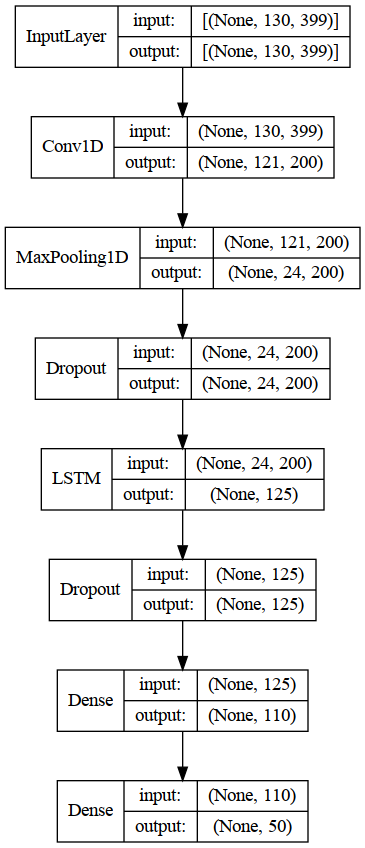

In [138]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [139]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 17ms/step - loss: 1.4886 - f1_score: 0.7109


[1.4886239767074585, 0.710884690284729]

In [140]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 2s 18ms/step - loss: 0.0614 - f1_score: 0.9988


[0.061389751732349396, 0.9988435506820679]

In [141]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 15ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.500     0.667     0.571         6
  BASKETBALL      0.667     1.000     0.800        10
         BEE      0.667     0.800     0.727        10
        BELT      1.000     1.000     1.000         4
        BITE      0.667     0.750     0.706         8
   BREAKFAST      0.833     0.833     0.833         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      0.750     1.000     0.857         6
    CONFUSED      0.833     0.833     0.833         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.400     0.333     0.364         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      1.000     0.750     0.857         8
     DEVELOP      0.500     0.333     0.400         6
      DINNER      0.800     0.500     0.615         8
         DOG      1.000    

In [228]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1DCNN + 1 LSTM Lecunnormal/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [229]:
act_function = 'selu'
initializer = tf.keras.initializers.LecunNormal(seed=10)

model = Sequential()
model.add(Conv1D(filters=150,kernel_size=20,kernel_initializer=initializer,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=5))
#model.add(Dropout(.75))
model.add(LSTM(units=150,return_sequences=False,kernel_initializer=initializer,kernel_regularizer=regularizers.l2(.00022635543607274578)))
#model.add(Dropout(.3))
model.add(Dense(units=90,activation=act_function,kernel_initializer=initializer))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.0004281203070023101),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_9 (Conv1D)           (None, 111, 150)          378150    
                                                                 
 max_pooling1d_9 (MaxPooling  (None, 22, 150)          0         
 1D)                                                             
                                                                 
 lstm_7 (LSTM)               (None, 150)               180600    
                                                                 
 dense_20 (Dense)            (None, 90)                13590     
                                                                 
 dense_21 (Dense)            (None, 50)                4550      
                                                                 
Total params: 576,890
Trainable params: 576,890
Non-trainable params: 0
_______________________________________________

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 45s 2s/step - loss: 3.9448 - f1_score: 0.0405 - val_loss: 3.7678 - val_f1_score: 0.0264
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.4630 - f1_score: 0.1168

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 339ms/step - loss: 3.4579 - f1_score: 0.1167 - val_loss: 3.2289 - val_f1_score: 0.1013
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9288 - f1_score: 0.2296

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 7s 248ms/step - loss: 2.9231 - f1_score: 0.2300 - val_loss: 2.7518 - val_f1_score: 0.2320
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 2.4662 - f1_score: 0.3212

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 7s 248ms/step - loss: 2.4622 - f1_score: 0.3237 - val_loss: 2.4069 - val_f1_score: 0.3373
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1025 - f1_score: 0.4201

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 321ms/step - loss: 2.1025 - f1_score: 0.4209 - val_loss: 2.1131 - val_f1_score: 0.4440
Epoch 6/500
27/28 [===========================>..] - ETA: 0s - loss: 1.8070 - f1_score: 0.5306

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 11s 404ms/step - loss: 1.7988 - f1_score: 0.5327 - val_loss: 1.9158 - val_f1_score: 0.5177
Epoch 7/500
28/28 [==============================] - ETA: 0s - loss: 1.5974 - f1_score: 0.5978

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 7s 272ms/step - loss: 1.5974 - f1_score: 0.5978 - val_loss: 1.7016 - val_f1_score: 0.5757
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3836 - f1_score: 0.6671

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 311ms/step - loss: 1.3829 - f1_score: 0.6689 - val_loss: 1.5794 - val_f1_score: 0.6128
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2344 - f1_score: 0.7017

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 7s 276ms/step - loss: 1.2288 - f1_score: 0.7022 - val_loss: 1.4283 - val_f1_score: 0.6628
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 1.1129 - f1_score: 0.7373

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 7s 275ms/step - loss: 1.1089 - f1_score: 0.7393 - val_loss: 1.4028 - val_f1_score: 0.6759
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 0.9940 - f1_score: 0.7848

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 7s 264ms/step - loss: 1.0000 - f1_score: 0.7821 - val_loss: 1.3555 - val_f1_score: 0.6787
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 0.9303 - f1_score: 0.7933

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 7s 266ms/step - loss: 0.9234 - f1_score: 0.7944 - val_loss: 1.3080 - val_f1_score: 0.7015
Epoch 13/500
28/28 [==============================] - 1s 50ms/step - loss: 0.8199 - f1_score: 0.8253 - val_loss: 1.2402 - val_f1_score: 0.6960
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7436 - f1_score: 0.8463

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 14s 525ms/step - loss: 0.7450 - f1_score: 0.8470 - val_loss: 1.2374 - val_f1_score: 0.7054
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6817 - f1_score: 0.8616

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 376ms/step - loss: 0.6807 - f1_score: 0.8605 - val_loss: 1.1922 - val_f1_score: 0.7202
Epoch 16/500
28/28 [==============================] - 1s 50ms/step - loss: 0.6269 - f1_score: 0.8809 - val_loss: 1.1822 - val_f1_score: 0.7080
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 0.5845 - f1_score: 0.8840

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 310ms/step - loss: 0.5848 - f1_score: 0.8837 - val_loss: 1.1493 - val_f1_score: 0.7362
Epoch 18/500
28/28 [==============================] - 1s 50ms/step - loss: 0.5229 - f1_score: 0.9097 - val_loss: 1.1068 - val_f1_score: 0.7341
Epoch 19/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4895 - f1_score: 0.9194

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 7s 269ms/step - loss: 0.4876 - f1_score: 0.9202 - val_loss: 1.1431 - val_f1_score: 0.7400
Epoch 20/500
28/28 [==============================] - 1s 50ms/step - loss: 0.4376 - f1_score: 0.9302 - val_loss: 1.0736 - val_f1_score: 0.7375
Epoch 21/500
28/28 [==============================] - 1s 50ms/step - loss: 0.4076 - f1_score: 0.9392 - val_loss: 1.1011 - val_f1_score: 0.7363
Epoch 22/500
28/28 [==============================] - 1s 50ms/step - loss: 0.3885 - f1_score: 0.9493 - val_loss: 1.0763 - val_f1_score: 0.7385
Epoch 23/500
27/28 [===========================>..] - ETA: 0s - loss: 0.3583 - f1_score: 0.9514

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 302ms/step - loss: 0.3576 - f1_score: 0.9523 - val_loss: 1.0418 - val_f1_score: 0.7492
Epoch 24/500
28/28 [==============================] - 1s 50ms/step - loss: 0.3257 - f1_score: 0.9593 - val_loss: 1.0800 - val_f1_score: 0.7476
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 0.2955 - f1_score: 0.9690

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 7s 259ms/step - loss: 0.2966 - f1_score: 0.9688 - val_loss: 1.0102 - val_f1_score: 0.7635
Epoch 26/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2734 - f1_score: 0.9726 - val_loss: 1.0824 - val_f1_score: 0.7340
Epoch 27/500
27/28 [===========================>..] - ETA: 0s - loss: 0.2481 - f1_score: 0.9816

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 377ms/step - loss: 0.2480 - f1_score: 0.9818 - val_loss: 1.0490 - val_f1_score: 0.7714
Epoch 28/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2391 - f1_score: 0.9815 - val_loss: 1.0278 - val_f1_score: 0.7383
Epoch 29/500
28/28 [==============================] - 1s 50ms/step - loss: 0.2197 - f1_score: 0.9908 - val_loss: 1.0238 - val_f1_score: 0.7557
Epoch 30/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1997 - f1_score: 0.9931 - val_loss: 1.0048 - val_f1_score: 0.7571
Epoch 31/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1889 - f1_score: 0.9949 - val_loss: 1.0212 - val_f1_score: 0.7711
Epoch 32/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1772 - f1_score: 0.9974 - val_loss: 1.0196 - val_f1_score: 0.7538
Epoch 33/500
28/28 [==============================] - 1s 51ms/step - loss: 0.1693 - f1_score: 0.9970 - val_loss: 1.0116 - val_f1_score: 0.7561
Epoch 34/5

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 9s 323ms/step - loss: 0.1602 - f1_score: 0.9978 - val_loss: 1.0070 - val_f1_score: 0.7737
Epoch 35/500
27/28 [===========================>..] - ETA: 0s - loss: 0.1507 - f1_score: 0.9988

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 282ms/step - loss: 0.1503 - f1_score: 0.9989 - val_loss: 0.9986 - val_f1_score: 0.7867
Epoch 36/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1442 - f1_score: 0.9982 - val_loss: 0.9923 - val_f1_score: 0.7840
Epoch 37/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1402 - f1_score: 0.9990 - val_loss: 1.0376 - val_f1_score: 0.7758
Epoch 38/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1434 - f1_score: 0.9978 - val_loss: 1.0185 - val_f1_score: 0.7652
Epoch 39/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1344 - f1_score: 0.9993 - val_loss: 1.0181 - val_f1_score: 0.7588
Epoch 40/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1272 - f1_score: 1.0000 - val_loss: 0.9937 - val_f1_score: 0.7852
Epoch 41/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1213 - f1_score: 0.9996 - val_loss: 0.9828 - val_f1_score: 0.7836
Epoch 42/50

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 306ms/step - loss: 0.1080 - f1_score: 1.0000 - val_loss: 1.0059 - val_f1_score: 0.7907
Epoch 46/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1053 - f1_score: 1.0000 - val_loss: 1.0172 - val_f1_score: 0.7765
Epoch 47/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1030 - f1_score: 1.0000 - val_loss: 0.9786 - val_f1_score: 0.7854
Epoch 48/500
28/28 [==============================] - 1s 50ms/step - loss: 0.1010 - f1_score: 1.0000 - val_loss: 1.0028 - val_f1_score: 0.7799
Epoch 49/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0989 - f1_score: 1.0000 - val_loss: 0.9806 - val_f1_score: 0.7888
Epoch 50/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0974 - f1_score: 1.0000 - val_loss: 0.9916 - val_f1_score: 0.7885
Epoch 51/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0953 - f1_score: 1.0000 - val_loss: 1.0053 - val_f1_score: 0.7805
Epoch 52/50

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 12s 426ms/step - loss: 0.0917 - f1_score: 1.0000 - val_loss: 1.0007 - val_f1_score: 0.7957
Epoch 54/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0899 - f1_score: 1.0000 - val_loss: 0.9985 - val_f1_score: 0.7829
Epoch 55/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0884 - f1_score: 1.0000 - val_loss: 0.9935 - val_f1_score: 0.7757
Epoch 56/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0867 - f1_score: 1.0000 - val_loss: 0.9837 - val_f1_score: 0.7907
Epoch 57/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0853 - f1_score: 1.0000 - val_loss: 0.9883 - val_f1_score: 0.7917
Epoch 58/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0838 - f1_score: 1.0000 - val_loss: 1.0058 - val_f1_score: 0.7858
Epoch 59/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0825 - f1_score: 1.0000 - val_loss: 1.0097 - val_f1_score: 0.7875
Epoch 60/5

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 384ms/step - loss: 0.0784 - f1_score: 1.0000 - val_loss: 0.9924 - val_f1_score: 0.7965
Epoch 63/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0772 - f1_score: 1.0000 - val_loss: 1.0161 - val_f1_score: 0.7876
Epoch 64/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0760 - f1_score: 1.0000 - val_loss: 1.0026 - val_f1_score: 0.7849
Epoch 65/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0747 - f1_score: 1.0000 - val_loss: 0.9881 - val_f1_score: 0.7897
Epoch 66/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0736 - f1_score: 1.0000 - val_loss: 0.9944 - val_f1_score: 0.7852
Epoch 67/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0724 - f1_score: 1.0000 - val_loss: 0.9945 - val_f1_score: 0.7881
Epoch 68/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0713 - f1_score: 1.0000 - val_loss: 1.0142 - val_f1_score: 0.7909
Epoch 69/5

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 8s 313ms/step - loss: 0.0692 - f1_score: 1.0000 - val_loss: 1.0066 - val_f1_score: 0.8012
Epoch 71/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0682 - f1_score: 1.0000 - val_loss: 1.0135 - val_f1_score: 0.7796
Epoch 72/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0671 - f1_score: 1.0000 - val_loss: 0.9981 - val_f1_score: 0.7966
Epoch 73/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0662 - f1_score: 1.0000 - val_loss: 1.0134 - val_f1_score: 0.7972
Epoch 74/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0652 - f1_score: 1.0000 - val_loss: 1.0171 - val_f1_score: 0.7772
Epoch 75/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0643 - f1_score: 1.0000 - val_loss: 1.0086 - val_f1_score: 0.7996
Epoch 76/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0633 - f1_score: 1.0000 - val_loss: 1.0103 - val_f1_score: 0.7938
Epoch 77/50

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 376ms/step - loss: 0.0377 - f1_score: 1.0000 - val_loss: 1.0682 - val_f1_score: 0.8033
Epoch 116/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0372 - f1_score: 1.0000 - val_loss: 1.0651 - val_f1_score: 0.7911
Epoch 117/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0367 - f1_score: 1.0000 - val_loss: 1.0509 - val_f1_score: 0.7917
Epoch 118/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0363 - f1_score: 1.0000 - val_loss: 1.0711 - val_f1_score: 0.7973
Epoch 119/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0358 - f1_score: 1.0000 - val_loss: 1.0689 - val_f1_score: 0.7978
Epoch 120/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0354 - f1_score: 1.0000 - val_loss: 1.0591 - val_f1_score: 0.7898
Epoch 121/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0350 - f1_score: 1.0000 - val_loss: 1.0458 - val_f1_score: 0.7995
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Lecunnormal/assets


28/28 [==============================] - 10s 352ms/step - loss: 0.0333 - f1_score: 1.0000 - val_loss: 1.0590 - val_f1_score: 0.8060
Epoch 126/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0329 - f1_score: 1.0000 - val_loss: 1.0687 - val_f1_score: 0.7919
Epoch 127/500
28/28 [==============================] - 1s 50ms/step - loss: 0.0325 - f1_score: 1.0000 - val_loss: 1.0819 - val_f1_score: 0.7949
Epoch 128/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0322 - f1_score: 1.0000 - val_loss: 1.0927 - val_f1_score: 0.7863
Epoch 129/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0318 - f1_score: 1.0000 - val_loss: 1.0683 - val_f1_score: 0.7967
Epoch 130/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0314 - f1_score: 1.0000 - val_loss: 1.0876 - val_f1_score: 0.8029
Epoch 131/500
28/28 [==============================] - 1s 51ms/step - loss: 0.0310 - f1_score: 1.0000 - val_loss: 1.0716 - val_f1_score: 0.7999
Epoc

Epoch 182/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0392 - f1_score: 1.0000 - val_loss: 1.3409 - val_f1_score: 0.7543
Epoch 183/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0389 - f1_score: 1.0000 - val_loss: 1.3206 - val_f1_score: 0.7607
Epoch 184/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0385 - f1_score: 1.0000 - val_loss: 1.3153 - val_f1_score: 0.7720
Epoch 185/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0381 - f1_score: 1.0000 - val_loss: 1.3277 - val_f1_score: 0.7773
Epoch 186/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0378 - f1_score: 1.0000 - val_loss: 1.3375 - val_f1_score: 0.7683
Epoch 187/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0375 - f1_score: 1.0000 - val_loss: 1.3316 - val_f1_score: 0.7764
Epoch 188/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0371 - f1_score: 1.0000 - val_loss: 1.3354 - val_f1_score:

Epoch 239/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0259 - f1_score: 1.0000 - val_loss: 1.4607 - val_f1_score: 0.7614
Epoch 240/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0257 - f1_score: 1.0000 - val_loss: 1.4557 - val_f1_score: 0.7633
Epoch 241/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0255 - f1_score: 1.0000 - val_loss: 1.4672 - val_f1_score: 0.7664
Epoch 242/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0254 - f1_score: 1.0000 - val_loss: 1.4609 - val_f1_score: 0.7622
Epoch 243/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0252 - f1_score: 1.0000 - val_loss: 1.4693 - val_f1_score: 0.7673
Epoch 244/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0250 - f1_score: 1.0000 - val_loss: 1.4772 - val_f1_score: 0.7610
Epoch 245/500
28/28 [==============================] - 1s 52ms/step - loss: 0.0248 - f1_score: 1.0000 - val_loss: 1.4645 - val_f1_score:

Epoch 296/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0600 - f1_score: 0.9988 - val_loss: 1.5539 - val_f1_score: 0.7205
Epoch 297/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0575 - f1_score: 0.9976 - val_loss: 1.4565 - val_f1_score: 0.7414
Epoch 298/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0503 - f1_score: 0.9992 - val_loss: 1.5614 - val_f1_score: 0.7529
Epoch 299/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0437 - f1_score: 1.0000 - val_loss: 1.5556 - val_f1_score: 0.7524
Epoch 300/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0399 - f1_score: 1.0000 - val_loss: 1.5669 - val_f1_score: 0.7419
Epoch 301/500
28/28 [==============================] - 1s 54ms/step - loss: 0.0374 - f1_score: 1.0000 - val_loss: 1.5499 - val_f1_score: 0.7518
Epoch 302/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0358 - f1_score: 1.0000 - val_loss: 1.5867 - val_f1_score:

Epoch 353/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0214 - f1_score: 1.0000 - val_loss: 1.7167 - val_f1_score: 0.7509
Epoch 354/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0213 - f1_score: 1.0000 - val_loss: 1.7145 - val_f1_score: 0.7447
Epoch 355/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0212 - f1_score: 1.0000 - val_loss: 1.7174 - val_f1_score: 0.7511
Epoch 356/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0210 - f1_score: 1.0000 - val_loss: 1.7034 - val_f1_score: 0.7413
Epoch 357/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0209 - f1_score: 1.0000 - val_loss: 1.6981 - val_f1_score: 0.7443
Epoch 358/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0208 - f1_score: 1.0000 - val_loss: 1.7023 - val_f1_score: 0.7509
Epoch 359/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0207 - f1_score: 1.0000 - val_loss: 1.7188 - val_f1_score:

Epoch 410/500
28/28 [==============================] - 1s 54ms/step - loss: 0.0147 - f1_score: 1.0000 - val_loss: 1.7837 - val_f1_score: 0.7542
Epoch 411/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0146 - f1_score: 1.0000 - val_loss: 1.7729 - val_f1_score: 0.7541
Epoch 412/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0145 - f1_score: 1.0000 - val_loss: 1.7799 - val_f1_score: 0.7526
Epoch 413/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0144 - f1_score: 1.0000 - val_loss: 1.7726 - val_f1_score: 0.7544
Epoch 414/500
28/28 [==============================] - 2s 54ms/step - loss: 0.0143 - f1_score: 1.0000 - val_loss: 1.7728 - val_f1_score: 0.7533
Epoch 415/500
28/28 [==============================] - 1s 53ms/step - loss: 0.0142 - f1_score: 1.0000 - val_loss: 1.7976 - val_f1_score: 0.7447
Epoch 416/500
28/28 [==============================] - 2s 55ms/step - loss: 0.0141 - f1_score: 1.0000 - val_loss: 1.7843 - val_f1_score:

Epoch 467/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0222 - f1_score: 1.0000 - val_loss: 1.5403 - val_f1_score: 0.7581
Epoch 468/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0217 - f1_score: 1.0000 - val_loss: 1.5728 - val_f1_score: 0.7650
Epoch 469/500
28/28 [==============================] - 2s 57ms/step - loss: 0.0214 - f1_score: 1.0000 - val_loss: 1.5314 - val_f1_score: 0.7588
Epoch 470/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0210 - f1_score: 1.0000 - val_loss: 1.5468 - val_f1_score: 0.7607
Epoch 471/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0207 - f1_score: 1.0000 - val_loss: 1.5747 - val_f1_score: 0.7580
Epoch 472/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0204 - f1_score: 1.0000 - val_loss: 1.5955 - val_f1_score: 0.7559
Epoch 473/500
28/28 [==============================] - 2s 56ms/step - loss: 0.0202 - f1_score: 1.0000 - val_loss: 1.5931 - val_f1_score:

In [230]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 9ms/step
              precision    recall  f1-score   support

         AXE      0.750     0.750     0.750         8
    BACKPACK      1.000     0.667     0.800         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      1.000     0.700     0.824        10
        BELT      0.667     0.500     0.571         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.556     0.833     0.667         6
      CANCER      0.778     0.875     0.824         8
   CHRISTMAS      0.714     0.833     0.769         6
    CONFUSED      0.800     0.667     0.727         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     1.000     1.000         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      0.667     0.667     0.667         6
      DINNER      0.417     0.625     0.500         8
         DOG      0.833     

In [231]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1DCNN + 1 LSTM Lecunnormal/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [232]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.016655,1.0,1.669599,0.769092
496,0.016552,1.0,1.663396,0.768292
497,0.016456,1.0,1.684232,0.768520
498,0.016352,1.0,1.690435,0.768330
499,0.016248,1.0,1.684348,0.770538


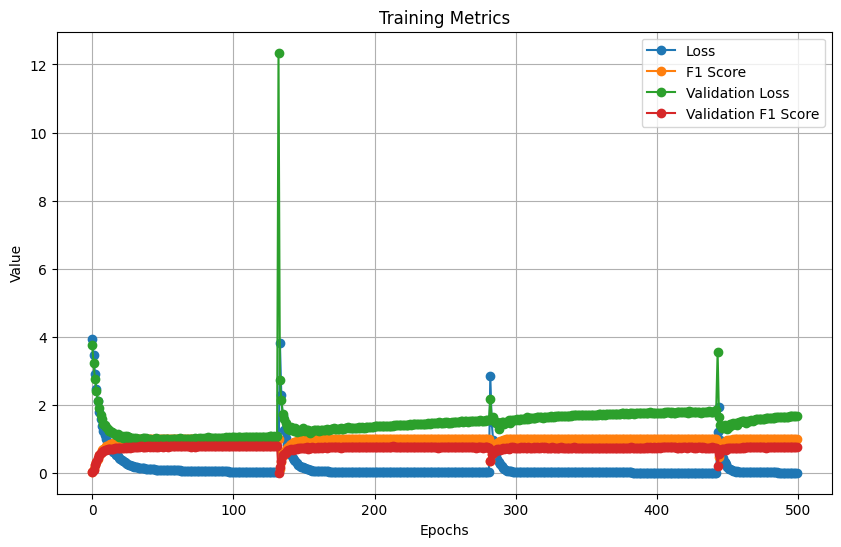

In [233]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [163]:
reconstructed_model = tf.keras.models.load_model("1 1DCNN + 1 LSTM Lecunnormal")

In [164]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 8ms/step - loss: 1.0590 - f1_score: 0.8060


[1.0590380430221558, 0.805988609790802]

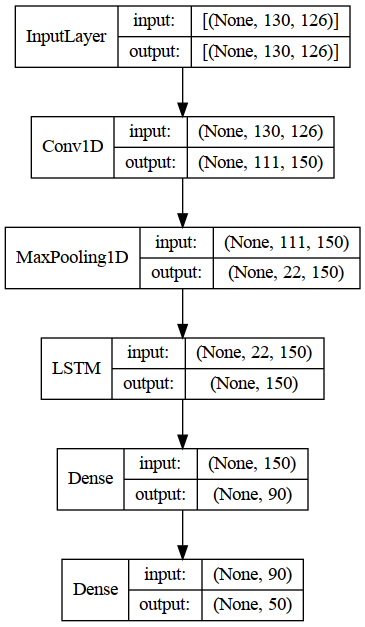

In [165]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [166]:
reconstructed_model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_9 (Conv1D)           (None, 111, 150)          378150    
                                                                 
 max_pooling1d_9 (MaxPooling  (None, 22, 150)          0         
 1D)                                                             
                                                                 
 lstm_7 (LSTM)               (None, 150)               180600    
                                                                 
 dense_20 (Dense)            (None, 90)                13590     
                                                                 
 dense_21 (Dense)            (None, 50)                4550      
                                                                 
Total params: 576,890
Trainable params: 576,890
Non-trainable params: 0
_______________________________________________

In [167]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 7ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      0.857     1.000     0.923         6
  BASKETBALL      0.769     1.000     0.870        10
         BEE      0.875     0.700     0.778        10
        BELT      0.667     1.000     0.800         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.500     0.667         6
    CONFUSED      0.600     1.000     0.750         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.750     1.000     0.857         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      0.875     0.875     0.875         8
     DEVELOP      0.667     1.000     0.800         6
      DINNER      0.833     0.625     0.714         8
         DOG      1.000     

In [163]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1DCNN + 1 LSTM Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [164]:
act_function = mish
#initializer = tf.keras.initializers.LecunNormal(seed=10)

model = Sequential()
model.add(Conv1D(filters=150,kernel_size=20,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=5))
model.add(Dropout(.75))
model.add(LSTM(units=150,return_sequences=False,kernel_regularizer=regularizers.l2(.00022635543607274578)))
model.add(Dropout(.3))
model.add(Dense(units=90,activation=act_function))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.0004281203070023101),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 111, 150)          378150    
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 22, 150)          0         
 1D)                                                             
                                                                 
 dropout_12 (Dropout)        (None, 22, 150)           0         
                                                                 
 lstm (LSTM)                 (None, 150)               180600    
                                                                 
 dropout_13 (Dropout)        (None, 150)               0         
                                                                 
 dense_12 (Dense)            (None, 90)                13590     
                                                      

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 18s 494ms/step - loss: 3.9490 - f1_score: 0.0210 - val_loss: 3.8914 - val_f1_score: 0.0145
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.7998 - f1_score: 0.0314

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 350ms/step - loss: 3.7971 - f1_score: 0.0320 - val_loss: 3.6063 - val_f1_score: 0.0401
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.4972 - f1_score: 0.0538

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 360ms/step - loss: 3.4933 - f1_score: 0.0539 - val_loss: 3.2422 - val_f1_score: 0.0580
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 3.2196 - f1_score: 0.0869

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 339ms/step - loss: 3.2128 - f1_score: 0.0881 - val_loss: 2.9598 - val_f1_score: 0.1377
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9440 - f1_score: 0.1451

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 327ms/step - loss: 2.9433 - f1_score: 0.1489 - val_loss: 2.6644 - val_f1_score: 0.2086
Epoch 6/500
27/28 [===========================>..] - ETA: 0s - loss: 2.7247 - f1_score: 0.2009

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 8s 307ms/step - loss: 2.7206 - f1_score: 0.2000 - val_loss: 2.5078 - val_f1_score: 0.2629
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 2.5239 - f1_score: 0.2457

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 353ms/step - loss: 2.5219 - f1_score: 0.2454 - val_loss: 2.3400 - val_f1_score: 0.3403
Epoch 8/500
28/28 [==============================] - 2s 54ms/step - loss: 2.3271 - f1_score: 0.2945 - val_loss: 2.2101 - val_f1_score: 0.3302
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1968 - f1_score: 0.3382

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 339ms/step - loss: 2.1955 - f1_score: 0.3383 - val_loss: 2.0486 - val_f1_score: 0.3948
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0342 - f1_score: 0.3890

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 338ms/step - loss: 2.0272 - f1_score: 0.3910 - val_loss: 1.9209 - val_f1_score: 0.4336
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9173 - f1_score: 0.4152

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 11s 400ms/step - loss: 1.9209 - f1_score: 0.4143 - val_loss: 1.8229 - val_f1_score: 0.5030
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 1.8077 - f1_score: 0.4495

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 327ms/step - loss: 1.7980 - f1_score: 0.4517 - val_loss: 1.7173 - val_f1_score: 0.5363
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7013 - f1_score: 0.4874

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 331ms/step - loss: 1.6997 - f1_score: 0.4872 - val_loss: 1.6673 - val_f1_score: 0.5624
Epoch 14/500
28/28 [==============================] - 2s 54ms/step - loss: 1.6211 - f1_score: 0.5107 - val_loss: 1.5914 - val_f1_score: 0.5595
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5579 - f1_score: 0.5426

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 329ms/step - loss: 1.5555 - f1_score: 0.5433 - val_loss: 1.4807 - val_f1_score: 0.6120
Epoch 16/500
28/28 [==============================] - 2s 55ms/step - loss: 1.5041 - f1_score: 0.5554 - val_loss: 1.5114 - val_f1_score: 0.6097
Epoch 17/500
28/28 [==============================] - 2s 55ms/step - loss: 1.3992 - f1_score: 0.5860 - val_loss: 1.4511 - val_f1_score: 0.5864
Epoch 18/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3385 - f1_score: 0.5990

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 341ms/step - loss: 1.3374 - f1_score: 0.5977 - val_loss: 1.3512 - val_f1_score: 0.6649
Epoch 19/500
28/28 [==============================] - 2s 55ms/step - loss: 1.2802 - f1_score: 0.6263 - val_loss: 1.4477 - val_f1_score: 0.6273
Epoch 20/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2398 - f1_score: 0.6277

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 318ms/step - loss: 1.2428 - f1_score: 0.6275 - val_loss: 1.3043 - val_f1_score: 0.6744
Epoch 21/500
28/28 [==============================] - 2s 56ms/step - loss: 1.1736 - f1_score: 0.6582 - val_loss: 1.2575 - val_f1_score: 0.6563
Epoch 22/500
27/28 [===========================>..] - ETA: 0s - loss: 1.1658 - f1_score: 0.6491

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 382ms/step - loss: 1.1698 - f1_score: 0.6483 - val_loss: 1.2881 - val_f1_score: 0.6868
Epoch 23/500
28/28 [==============================] - 2s 54ms/step - loss: 1.1301 - f1_score: 0.6730 - val_loss: 1.2837 - val_f1_score: 0.6758
Epoch 24/500
28/28 [==============================] - 2s 54ms/step - loss: 1.1044 - f1_score: 0.6858 - val_loss: 1.2306 - val_f1_score: 0.6695
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0787 - f1_score: 0.6767

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 356ms/step - loss: 1.0748 - f1_score: 0.6787 - val_loss: 1.2164 - val_f1_score: 0.7083
Epoch 26/500
28/28 [==============================] - 2s 54ms/step - loss: 1.0153 - f1_score: 0.7011 - val_loss: 1.2163 - val_f1_score: 0.6981
Epoch 27/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0225 - f1_score: 0.7011

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 348ms/step - loss: 1.0224 - f1_score: 0.7015 - val_loss: 1.1275 - val_f1_score: 0.7129
Epoch 28/500
28/28 [==============================] - 2s 55ms/step - loss: 0.9642 - f1_score: 0.7165 - val_loss: 1.1603 - val_f1_score: 0.7109
Epoch 29/500
28/28 [==============================] - 2s 55ms/step - loss: 0.9617 - f1_score: 0.7235 - val_loss: 1.1532 - val_f1_score: 0.7041
Epoch 30/500
28/28 [==============================] - 2s 55ms/step - loss: 0.9112 - f1_score: 0.7350 - val_loss: 1.2325 - val_f1_score: 0.6734
Epoch 31/500
28/28 [==============================] - 2s 56ms/step - loss: 0.8964 - f1_score: 0.7319 - val_loss: 1.1557 - val_f1_score: 0.7101
Epoch 32/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8863 - f1_score: 0.7388

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 332ms/step - loss: 0.8846 - f1_score: 0.7395 - val_loss: 1.1391 - val_f1_score: 0.7251
Epoch 33/500
28/28 [==============================] - 2s 55ms/step - loss: 0.8312 - f1_score: 0.7525 - val_loss: 1.0959 - val_f1_score: 0.7108
Epoch 34/500
28/28 [==============================] - 2s 55ms/step - loss: 0.8156 - f1_score: 0.7538 - val_loss: 1.1271 - val_f1_score: 0.7192
Epoch 35/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8435 - f1_score: 0.7506

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 11s 392ms/step - loss: 0.8380 - f1_score: 0.7514 - val_loss: 1.0861 - val_f1_score: 0.7277
Epoch 36/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7876 - f1_score: 0.7633

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 339ms/step - loss: 0.7995 - f1_score: 0.7611 - val_loss: 1.0862 - val_f1_score: 0.7387
Epoch 37/500
28/28 [==============================] - 2s 55ms/step - loss: 0.7715 - f1_score: 0.7700 - val_loss: 1.1354 - val_f1_score: 0.7219
Epoch 38/500
28/28 [==============================] - 2s 54ms/step - loss: 0.7560 - f1_score: 0.7678 - val_loss: 1.0755 - val_f1_score: 0.7162
Epoch 39/500
28/28 [==============================] - 2s 55ms/step - loss: 0.7628 - f1_score: 0.7808 - val_loss: 1.0758 - val_f1_score: 0.7232
Epoch 40/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7133 - f1_score: 0.7969

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 318ms/step - loss: 0.7101 - f1_score: 0.7977 - val_loss: 1.0728 - val_f1_score: 0.7417
Epoch 41/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6973 - f1_score: 0.7950

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 319ms/step - loss: 0.6969 - f1_score: 0.7956 - val_loss: 1.0137 - val_f1_score: 0.7430
Epoch 42/500
28/28 [==============================] - 2s 55ms/step - loss: 0.7073 - f1_score: 0.7919 - val_loss: 1.0677 - val_f1_score: 0.7302
Epoch 43/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6621 - f1_score: 0.8088 - val_loss: 1.0728 - val_f1_score: 0.7253
Epoch 44/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6802 - f1_score: 0.7986 - val_loss: 0.9923 - val_f1_score: 0.7361
Epoch 45/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6334 - f1_score: 0.8126 - val_loss: 1.0649 - val_f1_score: 0.7308
Epoch 46/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6471 - f1_score: 0.7985 - val_loss: 1.0363 - val_f1_score: 0.7276
Epoch 47/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6457 - f1_score: 0.8122

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 11s 402ms/step - loss: 0.6409 - f1_score: 0.8136 - val_loss: 1.0303 - val_f1_score: 0.7447
Epoch 48/500
27/28 [===========================>..] - ETA: 0s - loss: 0.5999 - f1_score: 0.8204

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 368ms/step - loss: 0.6018 - f1_score: 0.8192 - val_loss: 0.9949 - val_f1_score: 0.7695
Epoch 49/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6167 - f1_score: 0.8122 - val_loss: 0.9782 - val_f1_score: 0.7470
Epoch 50/500
28/28 [==============================] - 2s 55ms/step - loss: 0.5918 - f1_score: 0.8220 - val_loss: 1.0480 - val_f1_score: 0.7465
Epoch 51/500
28/28 [==============================] - 2s 55ms/step - loss: 0.6019 - f1_score: 0.8202 - val_loss: 1.0561 - val_f1_score: 0.7324
Epoch 52/500
28/28 [==============================] - 2s 55ms/step - loss: 0.5637 - f1_score: 0.8378 - val_loss: 1.0152 - val_f1_score: 0.7316
Epoch 53/500
28/28 [==============================] - 2s 56ms/step - loss: 0.5725 - f1_score: 0.8216 - val_loss: 0.9969 - val_f1_score: 0.7631
Epoch 54/500
28/28 [==============================] - 2s 55ms/step - loss: 0.5192 - f1_score: 0.8462 - val_loss: 1.0459 - val_f1_score: 0.7469
Epoch 55/5

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 332ms/step - loss: 0.5325 - f1_score: 0.8422 - val_loss: 0.9291 - val_f1_score: 0.7751
Epoch 56/500
28/28 [==============================] - 2s 55ms/step - loss: 0.5336 - f1_score: 0.8362 - val_loss: 0.9632 - val_f1_score: 0.7750
Epoch 57/500
28/28 [==============================] - 2s 55ms/step - loss: 0.4986 - f1_score: 0.8520 - val_loss: 0.9649 - val_f1_score: 0.7688
Epoch 58/500
28/28 [==============================] - 2s 55ms/step - loss: 0.5001 - f1_score: 0.8498 - val_loss: 0.9656 - val_f1_score: 0.7705
Epoch 59/500
28/28 [==============================] - 2s 55ms/step - loss: 0.5075 - f1_score: 0.8536 - val_loss: 0.9539 - val_f1_score: 0.7706
Epoch 60/500
28/28 [==============================] - 2s 55ms/step - loss: 0.5080 - f1_score: 0.8473 - val_loss: 0.9385 - val_f1_score: 0.7659
Epoch 61/500
28/28 [==============================] - 2s 56ms/step - loss: 0.4709 - f1_score: 0.8585 - val_loss: 0.9240 - val_f1_score: 0.7505
Epoch 62/50

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 381ms/step - loss: 0.4087 - f1_score: 0.8737 - val_loss: 0.9100 - val_f1_score: 0.7816
Epoch 76/500
28/28 [==============================] - 2s 55ms/step - loss: 0.4087 - f1_score: 0.8826 - val_loss: 0.9786 - val_f1_score: 0.7658
Epoch 77/500
27/28 [===========================>..] - ETA: 0s - loss: 0.3831 - f1_score: 0.8820

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 380ms/step - loss: 0.3822 - f1_score: 0.8840 - val_loss: 0.9282 - val_f1_score: 0.7915
Epoch 78/500
28/28 [==============================] - 2s 55ms/step - loss: 0.3753 - f1_score: 0.8880 - val_loss: 0.9689 - val_f1_score: 0.7795
Epoch 79/500
28/28 [==============================] - 2s 55ms/step - loss: 0.3566 - f1_score: 0.8996 - val_loss: 0.9468 - val_f1_score: 0.7776
Epoch 80/500
28/28 [==============================] - 2s 55ms/step - loss: 0.3599 - f1_score: 0.9025 - val_loss: 0.9504 - val_f1_score: 0.7692
Epoch 81/500
28/28 [==============================] - 2s 55ms/step - loss: 0.3398 - f1_score: 0.8974 - val_loss: 0.8745 - val_f1_score: 0.7757
Epoch 82/500
28/28 [==============================] - 2s 57ms/step - loss: 0.3526 - f1_score: 0.8953 - val_loss: 0.9283 - val_f1_score: 0.7722
Epoch 83/500
28/28 [==============================] - 2s 55ms/step - loss: 0.3614 - f1_score: 0.8964 - val_loss: 0.9017 - val_f1_score: 0.7708
Epoch 84/5

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 371ms/step - loss: 0.3206 - f1_score: 0.9137 - val_loss: 0.8857 - val_f1_score: 0.7944
Epoch 89/500
28/28 [==============================] - 2s 57ms/step - loss: 0.3178 - f1_score: 0.9057 - val_loss: 0.9719 - val_f1_score: 0.7647
Epoch 90/500
27/28 [===========================>..] - ETA: 0s - loss: 0.3139 - f1_score: 0.9029

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 347ms/step - loss: 0.3120 - f1_score: 0.9042 - val_loss: 0.9155 - val_f1_score: 0.7959
Epoch 91/500
28/28 [==============================] - 2s 55ms/step - loss: 0.3303 - f1_score: 0.8989 - val_loss: 0.9610 - val_f1_score: 0.7702
Epoch 92/500
28/28 [==============================] - 2s 55ms/step - loss: 0.3208 - f1_score: 0.9094 - val_loss: 0.9737 - val_f1_score: 0.7602
Epoch 93/500
28/28 [==============================] - 2s 55ms/step - loss: 0.3170 - f1_score: 0.9069 - val_loss: 0.9175 - val_f1_score: 0.7927
Epoch 94/500
27/28 [===========================>..] - ETA: 0s - loss: 0.3270 - f1_score: 0.9044

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 12s 426ms/step - loss: 0.3246 - f1_score: 0.9053 - val_loss: 0.8497 - val_f1_score: 0.8025
Epoch 95/500
27/28 [===========================>..] - ETA: 0s - loss: 0.3205 - f1_score: 0.9105

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 9s 331ms/step - loss: 0.3178 - f1_score: 0.9120 - val_loss: 0.8750 - val_f1_score: 0.8072
Epoch 96/500
28/28 [==============================] - 2s 54ms/step - loss: 0.3111 - f1_score: 0.9105 - val_loss: 0.8745 - val_f1_score: 0.7829
Epoch 97/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2836 - f1_score: 0.9150 - val_loss: 0.8648 - val_f1_score: 0.7855
Epoch 98/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2852 - f1_score: 0.9205 - val_loss: 0.8940 - val_f1_score: 0.7942
Epoch 99/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2658 - f1_score: 0.9279 - val_loss: 0.9111 - val_f1_score: 0.7758
Epoch 100/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2727 - f1_score: 0.9227 - val_loss: 0.9446 - val_f1_score: 0.7869
Epoch 101/500
27/28 [===========================>..] - ETA: 0s - loss: 0.2936 - f1_score: 0.9197

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 354ms/step - loss: 0.2946 - f1_score: 0.9191 - val_loss: 0.8486 - val_f1_score: 0.8101
Epoch 102/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2850 - f1_score: 0.9195 - val_loss: 0.8320 - val_f1_score: 0.7832
Epoch 103/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2817 - f1_score: 0.9190 - val_loss: 0.9010 - val_f1_score: 0.7937
Epoch 104/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2717 - f1_score: 0.9173 - val_loss: 0.8621 - val_f1_score: 0.7900
Epoch 105/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2731 - f1_score: 0.9204 - val_loss: 0.8601 - val_f1_score: 0.8048
Epoch 106/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2637 - f1_score: 0.9249 - val_loss: 0.9307 - val_f1_score: 0.7828
Epoch 107/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2641 - f1_score: 0.9233 - val_loss: 0.8821 - val_f1_score: 0.7964
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 12s 441ms/step - loss: 0.2798 - f1_score: 0.9213 - val_loss: 0.8590 - val_f1_score: 0.8142
Epoch 117/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2389 - f1_score: 0.9288 - val_loss: 0.9607 - val_f1_score: 0.7865
Epoch 118/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2408 - f1_score: 0.9279 - val_loss: 0.9819 - val_f1_score: 0.7766
Epoch 119/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2397 - f1_score: 0.9347 - val_loss: 0.9267 - val_f1_score: 0.7962
Epoch 120/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2356 - f1_score: 0.9348 - val_loss: 0.9338 - val_f1_score: 0.7911
Epoch 121/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2461 - f1_score: 0.9275 - val_loss: 0.9184 - val_f1_score: 0.7902
Epoch 122/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2310 - f1_score: 0.9406 - val_loss: 0.8953 - val_f1_score: 0.7997
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 378ms/step - loss: 0.2121 - f1_score: 0.9442 - val_loss: 0.8584 - val_f1_score: 0.8156
Epoch 152/500
28/28 [==============================] - 2s 57ms/step - loss: 0.2084 - f1_score: 0.9406 - val_loss: 0.7925 - val_f1_score: 0.8056
Epoch 153/500
28/28 [==============================] - 2s 55ms/step - loss: 0.2129 - f1_score: 0.9436 - val_loss: 0.9059 - val_f1_score: 0.7880
Epoch 154/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2084 - f1_score: 0.9422 - val_loss: 0.8622 - val_f1_score: 0.7944
Epoch 155/500
28/28 [==============================] - 2s 56ms/step - loss: 0.1885 - f1_score: 0.9524 - val_loss: 0.9840 - val_f1_score: 0.7782
Epoch 156/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1974 - f1_score: 0.9465 - val_loss: 0.9005 - val_f1_score: 0.7904
Epoch 157/500
28/28 [==============================] - 2s 56ms/step - loss: 0.1928 - f1_score: 0.9473 - val_loss: 0.8767 - val_f1_score: 0.7960
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 10s 354ms/step - loss: 0.1740 - f1_score: 0.9494 - val_loss: 0.9156 - val_f1_score: 0.8227
Epoch 165/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1547 - f1_score: 0.9636 - val_loss: 0.9125 - val_f1_score: 0.7926
Epoch 166/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1649 - f1_score: 0.9594 - val_loss: 0.9349 - val_f1_score: 0.8105
Epoch 167/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1638 - f1_score: 0.9611 - val_loss: 0.9878 - val_f1_score: 0.7998
Epoch 168/500
28/28 [==============================] - 2s 56ms/step - loss: 0.1775 - f1_score: 0.9522 - val_loss: 0.9553 - val_f1_score: 0.7876
Epoch 169/500
28/28 [==============================] - 2s 56ms/step - loss: 0.1891 - f1_score: 0.9480 - val_loss: 0.9294 - val_f1_score: 0.8044
Epoch 170/500
28/28 [==============================] - 2s 56ms/step - loss: 0.1864 - f1_score: 0.9504 - val_loss: 0.9025 - val_f1_score: 0.7986
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 12s 454ms/step - loss: 0.1799 - f1_score: 0.9513 - val_loss: 0.9482 - val_f1_score: 0.8256
Epoch 180/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1533 - f1_score: 0.9610 - val_loss: 0.9014 - val_f1_score: 0.7976
Epoch 181/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1729 - f1_score: 0.9542 - val_loss: 0.9098 - val_f1_score: 0.7962
Epoch 182/500
28/28 [==============================] - 2s 56ms/step - loss: 0.1558 - f1_score: 0.9631 - val_loss: 0.9666 - val_f1_score: 0.7804
Epoch 183/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1451 - f1_score: 0.9644 - val_loss: 0.9003 - val_f1_score: 0.7883
Epoch 184/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1461 - f1_score: 0.9680 - val_loss: 0.9753 - val_f1_score: 0.7927
Epoch 185/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1472 - f1_score: 0.9620 - val_loss: 0.9642 - val_f1_score: 0.7878
Epoc

Epoch 236/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1297 - f1_score: 0.9680 - val_loss: 1.0197 - val_f1_score: 0.8014
Epoch 237/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1458 - f1_score: 0.9640 - val_loss: 1.0114 - val_f1_score: 0.7940
Epoch 238/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1445 - f1_score: 0.9640 - val_loss: 1.0154 - val_f1_score: 0.8043
Epoch 239/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1517 - f1_score: 0.9663 - val_loss: 0.9827 - val_f1_score: 0.8145
Epoch 240/500
28/28 [==============================] - 2s 58ms/step - loss: 0.1205 - f1_score: 0.9731 - val_loss: 0.9417 - val_f1_score: 0.7883
Epoch 241/500
28/28 [==============================] - 2s 59ms/step - loss: 0.1558 - f1_score: 0.9615 - val_loss: 1.0320 - val_f1_score: 0.7940
Epoch 242/500
28/28 [==============================] - 2s 59ms/step - loss: 0.1712 - f1_score: 0.9485 - val_loss: 1.0020 - val_f1_score:

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 12s 436ms/step - loss: 0.1296 - f1_score: 0.9697 - val_loss: 0.9046 - val_f1_score: 0.8331
Epoch 264/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1204 - f1_score: 0.9704 - val_loss: 0.9777 - val_f1_score: 0.8018
Epoch 265/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1403 - f1_score: 0.9638 - val_loss: 0.9813 - val_f1_score: 0.8078
Epoch 266/500
27/28 [===========================>..] - ETA: 0s - loss: 0.1371 - f1_score: 0.9686

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 11s 395ms/step - loss: 0.1362 - f1_score: 0.9687 - val_loss: 0.9016 - val_f1_score: 0.8379
Epoch 267/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1012 - f1_score: 0.9805 - val_loss: 0.9214 - val_f1_score: 0.8288
Epoch 268/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1164 - f1_score: 0.9740 - val_loss: 0.9478 - val_f1_score: 0.8285
Epoch 269/500
28/28 [==============================] - 2s 56ms/step - loss: 0.1202 - f1_score: 0.9718 - val_loss: 0.9185 - val_f1_score: 0.8114
Epoch 270/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1387 - f1_score: 0.9634 - val_loss: 0.9771 - val_f1_score: 0.7967
Epoch 271/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1317 - f1_score: 0.9675 - val_loss: 1.0112 - val_f1_score: 0.8057
Epoch 272/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1309 - f1_score: 0.9704 - val_loss: 0.9026 - val_f1_score: 0.8207
Epoc

INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


INFO:tensorflow:Assets written to: 1 1DCNN + 1 LSTM Mish/assets


28/28 [==============================] - 12s 444ms/step - loss: 0.1149 - f1_score: 0.9733 - val_loss: 0.9024 - val_f1_score: 0.8460
Epoch 318/500
28/28 [==============================] - 2s 56ms/step - loss: 0.1075 - f1_score: 0.9752 - val_loss: 0.9887 - val_f1_score: 0.8217
Epoch 319/500
28/28 [==============================] - 2s 55ms/step - loss: 0.1020 - f1_score: 0.9771 - val_loss: 1.0158 - val_f1_score: 0.8178
Epoch 320/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1086 - f1_score: 0.9728 - val_loss: 0.9695 - val_f1_score: 0.8116
Epoch 321/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1130 - f1_score: 0.9712 - val_loss: 1.0176 - val_f1_score: 0.8229
Epoch 322/500
28/28 [==============================] - 2s 56ms/step - loss: 0.1170 - f1_score: 0.9732 - val_loss: 1.0592 - val_f1_score: 0.8151
Epoch 323/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1040 - f1_score: 0.9770 - val_loss: 1.0762 - val_f1_score: 0.8122
Epoc

Epoch 374/500
28/28 [==============================] - 2s 58ms/step - loss: 0.1013 - f1_score: 0.9724 - val_loss: 1.0110 - val_f1_score: 0.8101
Epoch 375/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1151 - f1_score: 0.9739 - val_loss: 1.0670 - val_f1_score: 0.8139
Epoch 376/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1106 - f1_score: 0.9721 - val_loss: 1.0723 - val_f1_score: 0.8124
Epoch 377/500
28/28 [==============================] - 2s 57ms/step - loss: 0.1141 - f1_score: 0.9759 - val_loss: 0.9804 - val_f1_score: 0.8085
Epoch 378/500
28/28 [==============================] - 2s 58ms/step - loss: 0.1052 - f1_score: 0.9741 - val_loss: 1.0749 - val_f1_score: 0.8174
Epoch 379/500
28/28 [==============================] - 2s 58ms/step - loss: 0.1350 - f1_score: 0.9644 - val_loss: 1.0222 - val_f1_score: 0.8236
Epoch 380/500
28/28 [==============================] - 2s 58ms/step - loss: 0.1357 - f1_score: 0.9658 - val_loss: 1.0225 - val_f1_score:

Epoch 431/500
28/28 [==============================] - 2s 60ms/step - loss: 0.0810 - f1_score: 0.9836 - val_loss: 1.1773 - val_f1_score: 0.7869
Epoch 432/500
28/28 [==============================] - 2s 60ms/step - loss: 0.0937 - f1_score: 0.9799 - val_loss: 1.1509 - val_f1_score: 0.8183
Epoch 433/500
28/28 [==============================] - 2s 63ms/step - loss: 0.0978 - f1_score: 0.9776 - val_loss: 1.0771 - val_f1_score: 0.8284
Epoch 434/500
28/28 [==============================] - 2s 60ms/step - loss: 0.0964 - f1_score: 0.9797 - val_loss: 1.1741 - val_f1_score: 0.8086
Epoch 435/500
28/28 [==============================] - 2s 57ms/step - loss: 0.0938 - f1_score: 0.9809 - val_loss: 1.0736 - val_f1_score: 0.8236
Epoch 436/500
28/28 [==============================] - 2s 57ms/step - loss: 0.0914 - f1_score: 0.9801 - val_loss: 1.0484 - val_f1_score: 0.8153
Epoch 437/500
28/28 [==============================] - 2s 58ms/step - loss: 0.0744 - f1_score: 0.9847 - val_loss: 1.0601 - val_f1_score:

Epoch 488/500
28/28 [==============================] - 2s 58ms/step - loss: 0.0872 - f1_score: 0.9797 - val_loss: 0.9688 - val_f1_score: 0.8357
Epoch 489/500
28/28 [==============================] - 2s 58ms/step - loss: 0.0838 - f1_score: 0.9828 - val_loss: 0.9830 - val_f1_score: 0.8364
Epoch 490/500
28/28 [==============================] - 2s 62ms/step - loss: 0.0893 - f1_score: 0.9813 - val_loss: 1.0359 - val_f1_score: 0.8029
Epoch 491/500
28/28 [==============================] - 2s 61ms/step - loss: 0.0775 - f1_score: 0.9833 - val_loss: 0.9090 - val_f1_score: 0.8131
Epoch 492/500
28/28 [==============================] - 2s 58ms/step - loss: 0.0851 - f1_score: 0.9818 - val_loss: 1.0993 - val_f1_score: 0.7954
Epoch 493/500
28/28 [==============================] - 2s 58ms/step - loss: 0.0786 - f1_score: 0.9819 - val_loss: 1.0585 - val_f1_score: 0.7978
Epoch 494/500
28/28 [==============================] - 2s 58ms/step - loss: 0.0677 - f1_score: 0.9873 - val_loss: 1.0191 - val_f1_score:

In [165]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 9ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      0.833     0.833     0.833         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      1.000     1.000     1.000        10
        BELT      0.667     1.000     0.800         4
        BITE      0.727     1.000     0.842         8
   BREAKFAST      0.750     1.000     0.857         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.833     0.909         6
    CONFUSED      0.750     1.000     0.857         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.714     0.833     0.769         6
      DECIDE      1.000     0.833     0.909         6
      DEMAND      0.800     0.500     0.615         8
     DEVELOP      0.571     0.667     0.615         6
      DINNER      0.778     0.875     0.824         8
         DOG      1.000     

In [168]:
reconstructed_model = tf.keras.models.load_model("1 1DCNN + 1 LSTM Mish")

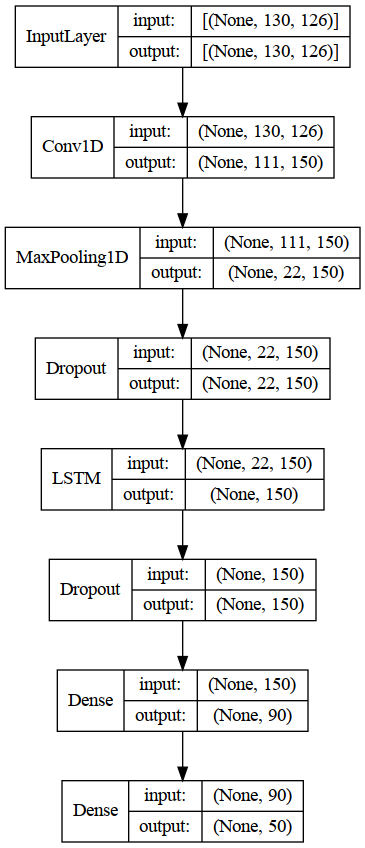

In [169]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [170]:
reconstructed_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 111, 150)          378150    
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 22, 150)          0         
 1D)                                                             
                                                                 
 dropout_12 (Dropout)        (None, 22, 150)           0         
                                                                 
 lstm (LSTM)                 (None, 150)               180600    
                                                                 
 dropout_13 (Dropout)        (None, 150)               0         
                                                                 
 dense_12 (Dense)            (None, 90)                13590     
                                                      

In [171]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 8ms/step - loss: 0.9024 - f1_score: 0.8460


[0.9023572206497192, 0.8459616303443909]

In [172]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 0s 7ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      0.857     1.000     0.923         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      1.000     1.000     1.000        10
        BELT      0.800     1.000     0.889         4
        BITE      0.889     1.000     0.941         8
   BREAKFAST      0.857     1.000     0.923         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.833     0.909         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     0.833     0.909         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.778     0.875     0.824         8
     DEVELOP      0.714     0.833     0.769         6
      DINNER      0.700     0.875     0.778         8
         DOG      0.857     

In [139]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1DCNN + 1 LSTM Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [140]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.277541,0.944062,1.831507,0.723541
496,0.201111,0.959958,1.871319,0.746672
497,0.168756,0.967545,1.899163,0.735039
498,0.173993,0.962826,1.933714,0.735603
499,0.191856,0.967615,1.936698,0.730486


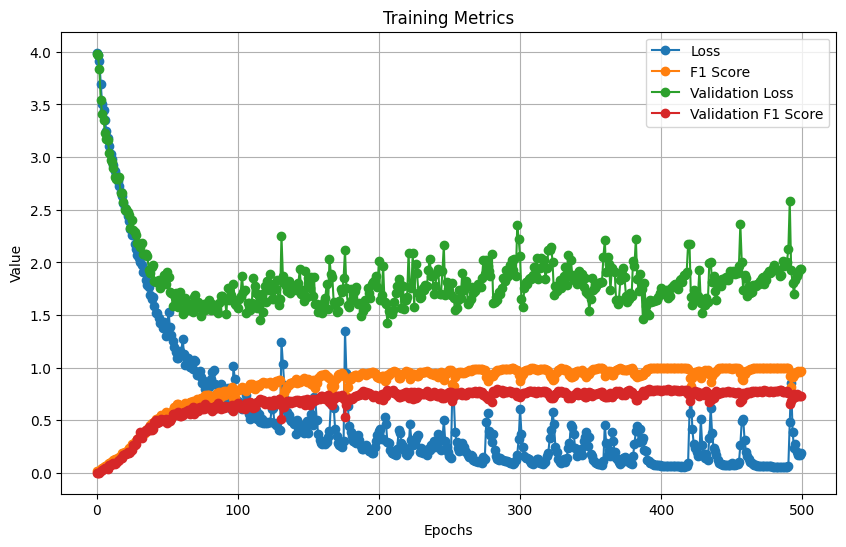

In [141]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

### 1 1D-CNN + 1 LSTM Trial 717

In [141]:
best_model = tuner.get_best_models(num_models=4)[3]

In [144]:
best_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 16ms/step - loss: 0.3942 - f1_score: 0.9258


[0.39421790838241577, 0.9257767200469971]

In [143]:
best_model.evaluate(Xval,Yval)

11/11 [==============================] - 0s 16ms/step - loss: 1.2795 - f1_score: 0.6979


[1.2794995307922363, 0.6979272365570068]

In [122]:
bestHP = tuner.get_best_hyperparameters(num_trials=5)[4]

In [123]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1D-CNN + 1 LSTM Trial 717/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [125]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - 9s 100ms/step - loss: 5.2782 - f1_score: 0.0126 - val_loss: 5.0421 - val_f1_score: 4.8780e-04
Epoch 2/500
28/28 [==============================] - 2s 70ms/step - loss: 4.8651 - f1_score: 0.0108 - val_loss: 4.6806 - val_f1_score: 0.0087
Epoch 3/500
28/28 [==============================] - 2s 70ms/step - loss: 4.5592 - f1_score: 0.0133 - val_loss: 4.4268 - val_f1_score: 0.0021
Epoch 4/500
28/28 [==============================] - 2s 71ms/step - loss: 4.3551 - f1_score: 0.0134 - val_loss: 4.2690 - val_f1_score: 0.0060
Epoch 5/500
28/28 [==============================] - 2s 72ms/step - loss: 4.2240 - f1_score: 0.0176 - val_loss: 4.1616 - val_f1_score: 0.0066
Epoch 6/500
28/28 [==============================] - 2s 71ms/step - loss: 4.1101 - f1_score: 0.0203 - val_loss: 4.0571 - val_f1_score: 0.0091
Epoch 7/500
28/28 [==============================] - 2s 72ms/step - loss: 3.9644 - f1_score: 0.0220 - val_los

28/28 [==============================] - 2s 75ms/step - loss: 0.9863 - f1_score: 0.7151 - val_loss: 1.4404 - val_f1_score: 0.5917
Epoch 59/500
28/28 [==============================] - 2s 75ms/step - loss: 0.9937 - f1_score: 0.7151 - val_loss: 1.4035 - val_f1_score: 0.6029
Epoch 60/500
28/28 [==============================] - 2s 74ms/step - loss: 0.9772 - f1_score: 0.7097 - val_loss: 1.4128 - val_f1_score: 0.6061
Epoch 61/500
28/28 [==============================] - 2s 74ms/step - loss: 0.9708 - f1_score: 0.7207 - val_loss: 1.4627 - val_f1_score: 0.5778
Epoch 62/500
28/28 [==============================] - 2s 75ms/step - loss: 0.9420 - f1_score: 0.7271 - val_loss: 1.3710 - val_f1_score: 0.6395
Epoch 63/500
28/28 [==============================] - 2s 75ms/step - loss: 0.9099 - f1_score: 0.7368 - val_loss: 1.3515 - val_f1_score: 0.6333
Epoch 64/500
28/28 [==============================] - 2s 75ms/step - loss: 0.9181 - f1_score: 0.7362 - val_loss: 1.3451 - val_f1_score: 0.6184
Epoch 65/500

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 13s 492ms/step - loss: 0.7791 - f1_score: 0.7764 - val_loss: 1.3003 - val_f1_score: 0.6672
Epoch 79/500
28/28 [==============================] - 2s 75ms/step - loss: 0.7269 - f1_score: 0.8002 - val_loss: 1.3361 - val_f1_score: 0.6399
Epoch 80/500
28/28 [==============================] - 2s 77ms/step - loss: 0.7372 - f1_score: 0.7875 - val_loss: 1.4376 - val_f1_score: 0.6350
Epoch 81/500
28/28 [==============================] - 2s 70ms/step - loss: 0.7425 - f1_score: 0.7881 - val_loss: 1.3166 - val_f1_score: 0.6658
Epoch 82/500
28/28 [==============================] - 2s 71ms/step - loss: 0.7401 - f1_score: 0.7813 - val_loss: 1.3921 - val_f1_score: 0.6382
Epoch 83/500
28/28 [==============================] - 2s 71ms/step - loss: 0.7259 - f1_score: 0.7973 - val_loss: 1.3684 - val_f1_score: 0.6379
Epoch 84/500
28/28 [==============================] - 2s 73ms/step - loss: 0.7115 - f1_score: 0.7972 - val_loss: 1.2955 - val_f1_score: 0.6668
Epoch 85/5

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 12s 454ms/step - loss: 0.7052 - f1_score: 0.8033 - val_loss: 1.3995 - val_f1_score: 0.6779
Epoch 86/500
28/28 [==============================] - 2s 68ms/step - loss: 0.6923 - f1_score: 0.8057 - val_loss: 1.3706 - val_f1_score: 0.6488
Epoch 87/500
28/28 [==============================] - ETA: 0s - loss: 0.6883 - f1_score: 0.8074

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 373ms/step - loss: 0.6883 - f1_score: 0.8074 - val_loss: 1.2571 - val_f1_score: 0.6908
Epoch 88/500
28/28 [==============================] - 2s 68ms/step - loss: 0.6905 - f1_score: 0.8039 - val_loss: 1.3476 - val_f1_score: 0.6430
Epoch 89/500
28/28 [==============================] - 2s 68ms/step - loss: 0.6818 - f1_score: 0.8102 - val_loss: 1.3367 - val_f1_score: 0.6628
Epoch 90/500
28/28 [==============================] - 2s 70ms/step - loss: 0.6905 - f1_score: 0.8026 - val_loss: 1.3548 - val_f1_score: 0.6429
Epoch 91/500
28/28 [==============================] - ETA: 0s - loss: 0.6693 - f1_score: 0.8099

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 10s 384ms/step - loss: 0.6693 - f1_score: 0.8099 - val_loss: 1.3362 - val_f1_score: 0.6913
Epoch 92/500
28/28 [==============================] - 2s 68ms/step - loss: 0.6522 - f1_score: 0.8189 - val_loss: 1.3817 - val_f1_score: 0.6712
Epoch 93/500
28/28 [==============================] - 2s 69ms/step - loss: 0.6222 - f1_score: 0.8277 - val_loss: 1.3375 - val_f1_score: 0.6632
Epoch 94/500
28/28 [==============================] - 2s 70ms/step - loss: 0.6270 - f1_score: 0.8308 - val_loss: 1.3205 - val_f1_score: 0.6819
Epoch 95/500
28/28 [==============================] - 2s 71ms/step - loss: 0.6555 - f1_score: 0.8068 - val_loss: 1.3487 - val_f1_score: 0.6778
Epoch 96/500
28/28 [==============================] - 2s 70ms/step - loss: 0.6143 - f1_score: 0.8372 - val_loss: 1.3567 - val_f1_score: 0.6381
Epoch 97/500
28/28 [==============================] - 2s 71ms/step - loss: 0.6384 - f1_score: 0.8197 - val_loss: 1.3268 - val_f1_score: 0.6560
Epoch 98/5

INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


INFO:tensorflow:Assets written to: 1 1D-CNN + 1 LSTM Trial 717/assets


28/28 [==============================] - 11s 410ms/step - loss: 0.5957 - f1_score: 0.8402 - val_loss: 1.3071 - val_f1_score: 0.6976
Epoch 101/500
28/28 [==============================] - 2s 69ms/step - loss: 0.5976 - f1_score: 0.8406 - val_loss: 1.3350 - val_f1_score: 0.6931
Epoch 102/500
28/28 [==============================] - 2s 70ms/step - loss: 0.5692 - f1_score: 0.8550 - val_loss: 1.3762 - val_f1_score: 0.6898
Epoch 103/500
28/28 [==============================] - 2s 70ms/step - loss: 0.6014 - f1_score: 0.8306 - val_loss: 1.4117 - val_f1_score: 0.6800
Epoch 104/500
28/28 [==============================] - 2s 70ms/step - loss: 0.5606 - f1_score: 0.8487 - val_loss: 1.3765 - val_f1_score: 0.6543
Epoch 105/500
28/28 [==============================] - 2s 70ms/step - loss: 0.5673 - f1_score: 0.8394 - val_loss: 1.2620 - val_f1_score: 0.6587
Epoch 106/500
28/28 [==============================] - 2s 71ms/step - loss: 0.5984 - f1_score: 0.8413 - val_loss: 1.3252 - val_f1_score: 0.6902
Epoc

Epoch 157/500
28/28 [==============================] - 2s 77ms/step - loss: 0.3767 - f1_score: 0.9075 - val_loss: 1.5044 - val_f1_score: 0.6709
Epoch 158/500
28/28 [==============================] - 2s 79ms/step - loss: 0.3660 - f1_score: 0.9078 - val_loss: 1.5366 - val_f1_score: 0.6455
Epoch 159/500
28/28 [==============================] - 2s 87ms/step - loss: 0.3712 - f1_score: 0.9125 - val_loss: 1.5766 - val_f1_score: 0.6342
Epoch 160/500
28/28 [==============================] - 2s 76ms/step - loss: 0.3910 - f1_score: 0.9091 - val_loss: 1.4240 - val_f1_score: 0.6553
Epoch 161/500
28/28 [==============================] - 2s 76ms/step - loss: 0.3951 - f1_score: 0.9035 - val_loss: 1.5146 - val_f1_score: 0.6637
Epoch 162/500
28/28 [==============================] - 2s 74ms/step - loss: 0.3683 - f1_score: 0.9029 - val_loss: 1.5158 - val_f1_score: 0.6577
Epoch 163/500
28/28 [==============================] - 2s 82ms/step - loss: 0.3599 - f1_score: 0.9165 - val_loss: 1.5103 - val_f1_score:

Epoch 214/500
28/28 [==============================] - 2s 72ms/step - loss: 0.2700 - f1_score: 0.9418 - val_loss: 1.6478 - val_f1_score: 0.6394
Epoch 215/500
28/28 [==============================] - 2s 71ms/step - loss: 0.2863 - f1_score: 0.9309 - val_loss: 1.7448 - val_f1_score: 0.6293
Epoch 216/500
28/28 [==============================] - 2s 74ms/step - loss: 0.3086 - f1_score: 0.9236 - val_loss: 1.5073 - val_f1_score: 0.6647
Epoch 217/500
28/28 [==============================] - 2s 73ms/step - loss: 0.2902 - f1_score: 0.9277 - val_loss: 1.7092 - val_f1_score: 0.6052
Epoch 218/500
28/28 [==============================] - 2s 77ms/step - loss: 0.2832 - f1_score: 0.9390 - val_loss: 1.6525 - val_f1_score: 0.6488
Epoch 219/500
28/28 [==============================] - 2s 77ms/step - loss: 0.2706 - f1_score: 0.9401 - val_loss: 1.7673 - val_f1_score: 0.6319
Epoch 220/500
28/28 [==============================] - 2s 75ms/step - loss: 0.2916 - f1_score: 0.9305 - val_loss: 1.7039 - val_f1_score:

Epoch 271/500
28/28 [==============================] - 2s 71ms/step - loss: 0.2272 - f1_score: 0.9525 - val_loss: 1.7945 - val_f1_score: 0.6486
Epoch 272/500
28/28 [==============================] - 2s 73ms/step - loss: 0.2397 - f1_score: 0.9459 - val_loss: 1.8665 - val_f1_score: 0.6368
Epoch 273/500
28/28 [==============================] - 2s 72ms/step - loss: 0.2214 - f1_score: 0.9545 - val_loss: 1.8109 - val_f1_score: 0.6600
Epoch 274/500
28/28 [==============================] - 2s 76ms/step - loss: 0.2258 - f1_score: 0.9523 - val_loss: 1.8911 - val_f1_score: 0.5908
Epoch 275/500
28/28 [==============================] - 2s 86ms/step - loss: 0.2329 - f1_score: 0.9460 - val_loss: 1.8336 - val_f1_score: 0.6545
Epoch 276/500
28/28 [==============================] - 2s 75ms/step - loss: 0.2145 - f1_score: 0.9565 - val_loss: 2.0021 - val_f1_score: 0.6113
Epoch 277/500
28/28 [==============================] - 2s 73ms/step - loss: 0.2284 - f1_score: 0.9468 - val_loss: 1.8931 - val_f1_score:

Epoch 328/500
28/28 [==============================] - 2s 77ms/step - loss: 0.1905 - f1_score: 0.9607 - val_loss: 1.8589 - val_f1_score: 0.6335
Epoch 329/500
28/28 [==============================] - 2s 76ms/step - loss: 0.1867 - f1_score: 0.9621 - val_loss: 1.9509 - val_f1_score: 0.6076
Epoch 330/500
28/28 [==============================] - 2s 77ms/step - loss: 0.2052 - f1_score: 0.9515 - val_loss: 1.7574 - val_f1_score: 0.6537
Epoch 331/500
28/28 [==============================] - 2s 80ms/step - loss: 0.2023 - f1_score: 0.9565 - val_loss: 1.8044 - val_f1_score: 0.6490
Epoch 332/500
28/28 [==============================] - 2s 76ms/step - loss: 0.2036 - f1_score: 0.9583 - val_loss: 1.9480 - val_f1_score: 0.5965
Epoch 333/500
28/28 [==============================] - 2s 75ms/step - loss: 0.1859 - f1_score: 0.9644 - val_loss: 1.8745 - val_f1_score: 0.6131
Epoch 334/500
28/28 [==============================] - 2s 73ms/step - loss: 0.2163 - f1_score: 0.9516 - val_loss: 1.8724 - val_f1_score:

Epoch 385/500
28/28 [==============================] - 2s 73ms/step - loss: 0.1688 - f1_score: 0.9745 - val_loss: 1.8733 - val_f1_score: 0.6421
Epoch 386/500
28/28 [==============================] - 2s 71ms/step - loss: 0.1703 - f1_score: 0.9678 - val_loss: 2.0929 - val_f1_score: 0.6269
Epoch 387/500
28/28 [==============================] - 2s 72ms/step - loss: 0.1876 - f1_score: 0.9608 - val_loss: 1.9318 - val_f1_score: 0.6462
Epoch 388/500
28/28 [==============================] - 2s 72ms/step - loss: 0.1794 - f1_score: 0.9625 - val_loss: 1.9944 - val_f1_score: 0.6242
Epoch 389/500
28/28 [==============================] - 2s 82ms/step - loss: 0.1744 - f1_score: 0.9659 - val_loss: 1.8969 - val_f1_score: 0.6315
Epoch 390/500
28/28 [==============================] - 2s 71ms/step - loss: 0.1824 - f1_score: 0.9655 - val_loss: 1.8514 - val_f1_score: 0.6598
Epoch 391/500
28/28 [==============================] - 2s 71ms/step - loss: 0.1706 - f1_score: 0.9662 - val_loss: 2.0836 - val_f1_score:

Epoch 442/500
28/28 [==============================] - 2s 70ms/step - loss: 0.1688 - f1_score: 0.9648 - val_loss: 1.9382 - val_f1_score: 0.6181
Epoch 443/500
28/28 [==============================] - 2s 71ms/step - loss: 0.1730 - f1_score: 0.9632 - val_loss: 2.0482 - val_f1_score: 0.6142
Epoch 444/500
28/28 [==============================] - 2s 71ms/step - loss: 0.1492 - f1_score: 0.9741 - val_loss: 1.9663 - val_f1_score: 0.6451
Epoch 445/500
28/28 [==============================] - 2s 71ms/step - loss: 0.1585 - f1_score: 0.9667 - val_loss: 1.9795 - val_f1_score: 0.6315
Epoch 446/500
28/28 [==============================] - 2s 71ms/step - loss: 0.1419 - f1_score: 0.9719 - val_loss: 2.0546 - val_f1_score: 0.6231
Epoch 447/500
28/28 [==============================] - 2s 70ms/step - loss: 0.1607 - f1_score: 0.9666 - val_loss: 2.2615 - val_f1_score: 0.5473
Epoch 448/500
28/28 [==============================] - 2s 70ms/step - loss: 0.1686 - f1_score: 0.9699 - val_loss: 1.8449 - val_f1_score:

Epoch 499/500
28/28 [==============================] - 2s 76ms/step - loss: 0.1547 - f1_score: 0.9722 - val_loss: 2.1799 - val_f1_score: 0.6217
Epoch 500/500
28/28 [==============================] - 2s 77ms/step - loss: 0.1811 - f1_score: 0.9620 - val_loss: 2.2509 - val_f1_score: 0.5870


In [126]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 14ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.500     0.667     0.571         6
  BASKETBALL      1.000     0.900     0.947        10
         BEE      0.500     0.300     0.375        10
        BELT      0.500     1.000     0.667         4
        BITE      0.667     0.500     0.571         8
   BREAKFAST      0.571     0.667     0.615         6
      CANCER      0.615     1.000     0.762         8
   CHRISTMAS      0.750     1.000     0.857         6
    CONFUSED      0.571     0.667     0.615         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.200     0.333     0.250         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.500     0.250     0.333         8
     DEVELOP      0.000     0.000     0.000         6
      DINNER      0.800     0.500     0.615         8
         DOG      0.500    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [127]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1D-CNN + 1 LSTM Trial 717/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [128]:
hist_df = pd.read_csv('1 1D-CNN + 1 LSTM Trial 717/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.150789,0.970118,2.029120,0.612400
496,0.147346,0.970612,2.112572,0.582086
497,0.135868,0.978456,2.194486,0.587883
498,0.154721,0.972239,2.179939,0.621738
499,0.181057,0.961961,2.250935,0.587032


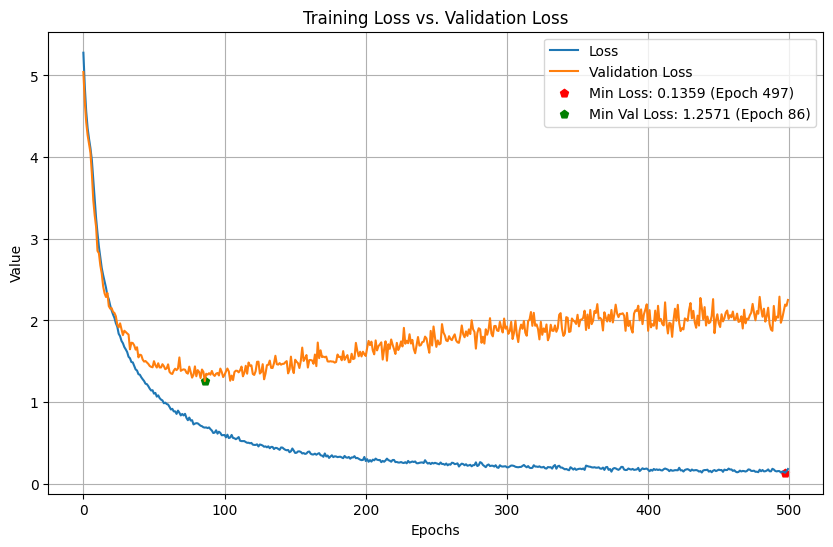

In [129]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

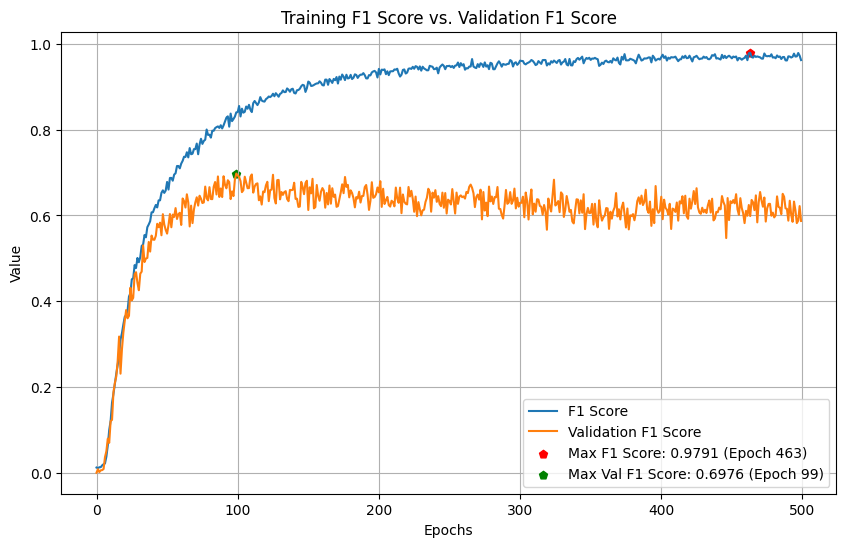

In [130]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [119]:
reconstructed_model = tf.keras.models.load_model("1 1D-CNN + 1 LSTM Trial 717")

2023-09-10 13:50:56.305051: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-10 13:50:56.381528: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1739 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


In [132]:
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 126, 175)          349300    
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 8, 175)           0         
 1D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 8, 175)            0         
                                                                 
 lstm_1 (LSTM)               (None, 200)               300800    
                                                                 
 dropout_3 (Dropout)         (None, 200)               0         
                                                                 
 dense_2 (Dense)             (None, 70)                14070     
                                                      

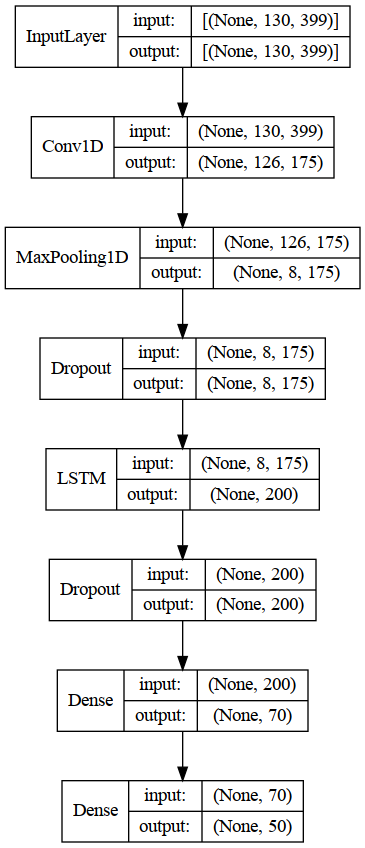

In [133]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

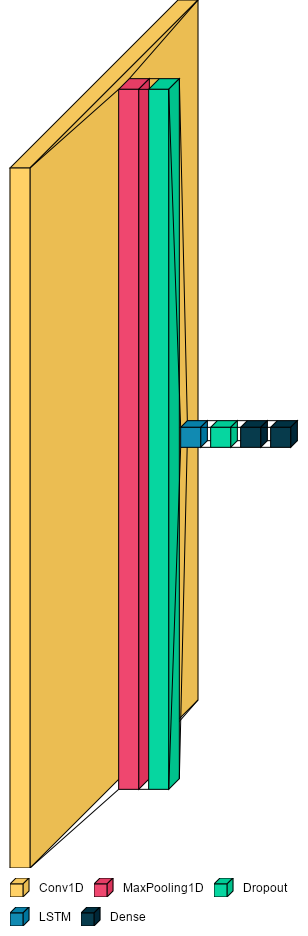

In [134]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [120]:
reconstructed_model.evaluate(Xval,Yval)

2023-09-10 13:51:03.985945: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700


11/11 [==============================] - 1s 16ms/step - loss: 1.3071 - f1_score: 0.6976


[1.307061791419983, 0.697600245475769]

In [121]:
reconstructed_model.evaluate(Xtrain,Ytrain, batch_size=96)

28/28 [==============================] - 1s 30ms/step - loss: 0.2873 - f1_score: 0.9597


[0.2873406708240509, 0.9597119092941284]

In [122]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 12ms/step
              precision    recall  f1-score   support

         AXE      1.000     1.000     1.000         8
    BACKPACK      0.600     1.000     0.750         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      0.250     0.200     0.222        10
        BELT      1.000     1.000     1.000         4
        BITE      0.857     0.750     0.800         8
   BREAKFAST      0.400     0.333     0.364         6
      CANCER      0.571     1.000     0.727         8
   CHRISTMAS      0.833     0.833     0.833         6
    CONFUSED      0.750     1.000     0.857         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.286     0.333     0.308         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      1.000     0.750     0.857         8
     DEVELOP      0.500     0.333     0.400         6
      DINNER      0.615     1.000     0.762         8
         DOG      0.667    

In [142]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='1 1D-CNN + 1 LSTM Trial 717 Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [143]:
act_function = mish
model = Sequential()
model.add(Conv1D(filters=150,kernel_size=5,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=3))
model.add(Conv1D(filters=100,kernel_size=4,activation=act_function))
model.add(MaxPooling1D(pool_size=3))
model.add(Dropout(.45))
model.add(GRU(units=150,return_sequences=False,kernel_regularizer=regularizers.l2(.00042286793942433336)))
model.add(Dropout(.8))
model.add(Dense(units=80,activation=act_function))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.0019929796667454143),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 16s 393ms/step - loss: 3.9667 - f1_score: 0.0172 - val_loss: 3.8607 - val_f1_score: 0.0141
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.7361 - f1_score: 0.0426

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 302ms/step - loss: 3.7312 - f1_score: 0.0433 - val_loss: 3.3516 - val_f1_score: 0.0401
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3184 - f1_score: 0.0804

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 316ms/step - loss: 3.3134 - f1_score: 0.0802 - val_loss: 2.9673 - val_f1_score: 0.1203
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9599 - f1_score: 0.1299

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 287ms/step - loss: 2.9603 - f1_score: 0.1299 - val_loss: 2.5864 - val_f1_score: 0.1928
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6673 - f1_score: 0.1869

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 353ms/step - loss: 2.6639 - f1_score: 0.1888 - val_loss: 2.4057 - val_f1_score: 0.2342
Epoch 6/500
28/28 [==============================] - 1s 38ms/step - loss: 2.4485 - f1_score: 0.2398 - val_loss: 2.4523 - val_f1_score: 0.2228
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2810 - f1_score: 0.2762

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 365ms/step - loss: 2.2877 - f1_score: 0.2757 - val_loss: 2.1469 - val_f1_score: 0.3372
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1416 - f1_score: 0.3087

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 278ms/step - loss: 2.1425 - f1_score: 0.3100 - val_loss: 2.0119 - val_f1_score: 0.3734
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0281 - f1_score: 0.3592

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 2.0177 - f1_score: 0.3637 - val_loss: 1.8961 - val_f1_score: 0.4063
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9076 - f1_score: 0.3781

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 299ms/step - loss: 1.9047 - f1_score: 0.3801 - val_loss: 1.8452 - val_f1_score: 0.4213
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7888 - f1_score: 0.4269

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 296ms/step - loss: 1.7919 - f1_score: 0.4251 - val_loss: 1.7583 - val_f1_score: 0.4348
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6956 - f1_score: 0.4384

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 1.6909 - f1_score: 0.4396 - val_loss: 1.7644 - val_f1_score: 0.4443
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6276 - f1_score: 0.4761

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.6308 - f1_score: 0.4757 - val_loss: 1.8618 - val_f1_score: 0.4454
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5693 - f1_score: 0.4970

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 305ms/step - loss: 1.5655 - f1_score: 0.4973 - val_loss: 1.6262 - val_f1_score: 0.5272
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4783 - f1_score: 0.5471

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 1.4755 - f1_score: 0.5462 - val_loss: 1.5496 - val_f1_score: 0.5610
Epoch 16/500
28/28 [==============================] - 1s 38ms/step - loss: 1.4444 - f1_score: 0.5465 - val_loss: 1.4769 - val_f1_score: 0.5580
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3217 - f1_score: 0.5702

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 304ms/step - loss: 1.3279 - f1_score: 0.5694 - val_loss: 1.5161 - val_f1_score: 0.5745
Epoch 18/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2945 - f1_score: 0.5831

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 310ms/step - loss: 1.2985 - f1_score: 0.5821 - val_loss: 1.5370 - val_f1_score: 0.6069
Epoch 19/500
28/28 [==============================] - 1s 38ms/step - loss: 1.2852 - f1_score: 0.5878 - val_loss: 1.4281 - val_f1_score: 0.6045
Epoch 20/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2173 - f1_score: 0.6180

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 283ms/step - loss: 1.2179 - f1_score: 0.6184 - val_loss: 1.3851 - val_f1_score: 0.6276
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2130 - f1_score: 0.6124

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 282ms/step - loss: 1.2190 - f1_score: 0.6137 - val_loss: 1.2672 - val_f1_score: 0.6686
Epoch 22/500
28/28 [==============================] - 1s 38ms/step - loss: 1.1470 - f1_score: 0.6439 - val_loss: 1.3689 - val_f1_score: 0.6425
Epoch 23/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0645 - f1_score: 0.6726 - val_loss: 1.4077 - val_f1_score: 0.6420
Epoch 24/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0290 - f1_score: 0.6716 - val_loss: 1.4038 - val_f1_score: 0.6378
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0354 - f1_score: 0.6777

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.0409 - f1_score: 0.6763 - val_loss: 1.3490 - val_f1_score: 0.7047
Epoch 26/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0103 - f1_score: 0.6855 - val_loss: 1.3758 - val_f1_score: 0.6790
Epoch 27/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9848 - f1_score: 0.6917 - val_loss: 1.4690 - val_f1_score: 0.6577
Epoch 28/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9359 - f1_score: 0.7218 - val_loss: 1.2835 - val_f1_score: 0.6766
Epoch 29/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8999 - f1_score: 0.7260 - val_loss: 1.2871 - val_f1_score: 0.6809
Epoch 30/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8965 - f1_score: 0.7249 - val_loss: 1.2039 - val_f1_score: 0.6934
Epoch 31/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9033 - f1_score: 0.7138 - val_loss: 1.4615 - val_f1_score: 0.6660
Epoch 32/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 284ms/step - loss: 0.8174 - f1_score: 0.7546 - val_loss: 1.2110 - val_f1_score: 0.7237
Epoch 35/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8303 - f1_score: 0.7514 - val_loss: 1.2921 - val_f1_score: 0.7181
Epoch 36/500
28/28 [==============================] - 1s 40ms/step - loss: 0.8294 - f1_score: 0.7597 - val_loss: 1.2224 - val_f1_score: 0.7006
Epoch 37/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8137 - f1_score: 0.7575

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 315ms/step - loss: 0.8050 - f1_score: 0.7603 - val_loss: 1.2252 - val_f1_score: 0.7297
Epoch 38/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7157 - f1_score: 0.7861 - val_loss: 1.3177 - val_f1_score: 0.6965
Epoch 39/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7033 - f1_score: 0.7997 - val_loss: 1.2801 - val_f1_score: 0.6963
Epoch 40/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7124 - f1_score: 0.7809 - val_loss: 1.2912 - val_f1_score: 0.7022
Epoch 41/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7062 - f1_score: 0.7906

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 290ms/step - loss: 0.7047 - f1_score: 0.7913 - val_loss: 1.2573 - val_f1_score: 0.7314
Epoch 42/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6807 - f1_score: 0.7985 - val_loss: 1.3909 - val_f1_score: 0.6925
Epoch 43/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6624 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 314ms/step - loss: 0.6617 - f1_score: 0.8074 - val_loss: 1.3076 - val_f1_score: 0.7417
Epoch 44/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6426 - f1_score: 0.8186 - val_loss: 1.2638 - val_f1_score: 0.7152
Epoch 45/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6595 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 320ms/step - loss: 0.6617 - f1_score: 0.8073 - val_loss: 1.1966 - val_f1_score: 0.7534
Epoch 46/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6622 - f1_score: 0.8199 - val_loss: 1.3031 - val_f1_score: 0.7242
Epoch 47/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6536 - f1_score: 0.8083

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 303ms/step - loss: 0.6538 - f1_score: 0.8080 - val_loss: 1.2127 - val_f1_score: 0.7642
Epoch 48/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6251 - f1_score: 0.8191

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 340ms/step - loss: 0.6254 - f1_score: 0.8205 - val_loss: 1.1647 - val_f1_score: 0.7687
Epoch 49/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5900 - f1_score: 0.8253 - val_loss: 1.1282 - val_f1_score: 0.7619
Epoch 50/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5942 - f1_score: 0.8320 - val_loss: 1.3222 - val_f1_score: 0.7546
Epoch 51/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5728 - f1_score: 0.8395 - val_loss: 1.2784 - val_f1_score: 0.7537
Epoch 52/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5521 - f1_score: 0.8477 - val_loss: 1.2723 - val_f1_score: 0.7475
Epoch 53/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5369 - f1_score: 0.8532 - val_loss: 1.4468 - val_f1_score: 0.7328
Epoch 54/500
28/28 [==============================] - 1s 40ms/step - loss: 0.5949 - f1_score: 0.8333 - val_loss: 1.5265 - val_f1_score: 0.7164
Epoch 55/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 307ms/step - loss: 0.5069 - f1_score: 0.8696 - val_loss: 1.2423 - val_f1_score: 0.7856
Epoch 63/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4884 - f1_score: 0.8732 - val_loss: 1.3165 - val_f1_score: 0.7761
Epoch 64/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4702 - f1_score: 0.8757 - val_loss: 1.4028 - val_f1_score: 0.7699
Epoch 65/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5113 - f1_score: 0.8732 - val_loss: 1.2855 - val_f1_score: 0.7503
Epoch 66/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5086 - f1_score: 0.8696 - val_loss: 1.3848 - val_f1_score: 0.7590
Epoch 67/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4775 - f1_score: 0.8754 - val_loss: 1.3450 - val_f1_score: 0.7756
Epoch 68/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4754 - f1_score: 0.8743 - val_loss: 1.3393 - val_f1_score: 0.7716
Epoch 69/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 277ms/step - loss: 0.4828 - f1_score: 0.8730 - val_loss: 1.2616 - val_f1_score: 0.7975
Epoch 71/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4476 - f1_score: 0.8826 - val_loss: 1.3496 - val_f1_score: 0.7769
Epoch 72/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4624 - f1_score: 0.8811 - val_loss: 1.4625 - val_f1_score: 0.7400
Epoch 73/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4539 - f1_score: 0.8810 - val_loss: 1.4245 - val_f1_score: 0.7796
Epoch 74/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3916 - f1_score: 0.8947 - val_loss: 1.4351 - val_f1_score: 0.7735
Epoch 75/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4319 - f1_score: 0.8911

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 354ms/step - loss: 0.4295 - f1_score: 0.8918 - val_loss: 1.2109 - val_f1_score: 0.8030
Epoch 76/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4448 - f1_score: 0.8869 - val_loss: 1.3074 - val_f1_score: 0.7850
Epoch 77/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4289 - f1_score: 0.8902 - val_loss: 1.2743 - val_f1_score: 0.7701
Epoch 78/500
28/28 [==============================] - 1s 40ms/step - loss: 0.4196 - f1_score: 0.8935 - val_loss: 1.4083 - val_f1_score: 0.7783
Epoch 79/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4741 - f1_score: 0.8807 - val_loss: 1.3937 - val_f1_score: 0.7936
Epoch 80/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4693 - f1_score: 0.8827 - val_loss: 1.3758 - val_f1_score: 0.7986
Epoch 81/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4861 - f1_score: 0.8691 - val_loss: 1.3154 - val_f1_score: 0.7725
Epoch 82/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 0.4051 - f1_score: 0.9021 - val_loss: 1.2125 - val_f1_score: 0.8054
Epoch 85/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4367 - f1_score: 0.8896

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.4366 - f1_score: 0.8888 - val_loss: 1.2861 - val_f1_score: 0.8080
Epoch 86/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4541 - f1_score: 0.8931 - val_loss: 1.4048 - val_f1_score: 0.7896
Epoch 87/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4424 - f1_score: 0.8865 - val_loss: 1.2911 - val_f1_score: 0.7939
Epoch 88/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4577 - f1_score: 0.8921 - val_loss: 1.4341 - val_f1_score: 0.7795
Epoch 89/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4323 - f1_score: 0.8912 - val_loss: 1.4458 - val_f1_score: 0.7512
Epoch 90/500
28/28 [==============================] - 1s 38ms/step - loss: 0.3862 - f1_score: 0.9046 - val_loss: 1.4521 - val_f1_score: 0.7835
Epoch 91/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4301 - f1_score: 0.8951 - val_loss: 1.3661 - val_f1_score: 0.7832
Epoch 92/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.4018 - f1_score: 0.9080 - val_loss: 1.4065 - val_f1_score: 0.8127
Epoch 111/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3813 - f1_score: 0.9143 - val_loss: 1.4458 - val_f1_score: 0.7976
Epoch 112/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3979 - f1_score: 0.9090 - val_loss: 1.5291 - val_f1_score: 0.7805
Epoch 113/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3954 - f1_score: 0.9087 - val_loss: 1.4778 - val_f1_score: 0.7706
Epoch 114/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3852 - f1_score: 0.9093 - val_loss: 1.5232 - val_f1_score: 0.7886
Epoch 115/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4268 - f1_score: 0.8951 - val_loss: 1.3973 - val_f1_score: 0.8067
Epoch 116/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3486 - f1_score: 0.9218 - val_loss: 1.2990 - val_f1_score: 0.8106
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.3205 - f1_score: 0.9379 - val_loss: 1.2689 - val_f1_score: 0.8406
Epoch 144/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3410 - f1_score: 0.9286 - val_loss: 1.4219 - val_f1_score: 0.7808
Epoch 145/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3155 - f1_score: 0.9325 - val_loss: 1.3326 - val_f1_score: 0.7909
Epoch 146/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2974 - f1_score: 0.9390 - val_loss: 1.3369 - val_f1_score: 0.8048
Epoch 147/500
28/28 [==============================] - 1s 42ms/step - loss: 0.3200 - f1_score: 0.9370 - val_loss: 1.3570 - val_f1_score: 0.8323
Epoch 148/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3099 - f1_score: 0.9325 - val_loss: 1.3147 - val_f1_score: 0.7869
Epoch 149/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3270 - f1_score: 0.9264 - val_loss: 1.2507 - val_f1_score: 0.8189
Epoch

Epoch 200/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3563 - f1_score: 0.9280 - val_loss: 1.3826 - val_f1_score: 0.8211
Epoch 201/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3084 - f1_score: 0.9374 - val_loss: 1.4495 - val_f1_score: 0.8218
Epoch 202/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3116 - f1_score: 0.9363 - val_loss: 1.4158 - val_f1_score: 0.8383
Epoch 203/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2682 - f1_score: 0.9444 - val_loss: 1.3949 - val_f1_score: 0.8230
Epoch 204/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2683 - f1_score: 0.9547 - val_loss: 1.4956 - val_f1_score: 0.8132
Epoch 205/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2790 - f1_score: 0.9456 - val_loss: 1.5248 - val_f1_score: 0.8048
Epoch 206/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3191 - f1_score: 0.9363 - val_loss: 1.5763 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 376ms/step - loss: 0.2881 - f1_score: 0.9446 - val_loss: 1.3258 - val_f1_score: 0.8420
Epoch 210/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3227 - f1_score: 0.9377 - val_loss: 1.2618 - val_f1_score: 0.8348
Epoch 211/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2755 - f1_score: 0.9459 - val_loss: 1.3257 - val_f1_score: 0.8113
Epoch 212/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3465 - f1_score: 0.9330 - val_loss: 1.3949 - val_f1_score: 0.8084
Epoch 213/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2943 - f1_score: 0.9399 - val_loss: 1.3821 - val_f1_score: 0.8172
Epoch 214/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2737 - f1_score: 0.9496 - val_loss: 1.5960 - val_f1_score: 0.7923
Epoch 215/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2224 - f1_score: 0.9596 - val_loss: 1.4672 - val_f1_score: 0.8193
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.2923 - f1_score: 0.9437 - val_loss: 1.2688 - val_f1_score: 0.8473
Epoch 246/500
27/28 [===========================>..] - ETA: 0s - loss: 0.2543 - f1_score: 0.9548

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.2536 - f1_score: 0.9558 - val_loss: 1.4264 - val_f1_score: 0.8482
Epoch 247/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2807 - f1_score: 0.9457 - val_loss: 1.3389 - val_f1_score: 0.8365
Epoch 248/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2305 - f1_score: 0.9575 - val_loss: 1.5210 - val_f1_score: 0.8251
Epoch 249/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2848 - f1_score: 0.9559 - val_loss: 1.5312 - val_f1_score: 0.8237
Epoch 250/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2660 - f1_score: 0.9522 - val_loss: 1.4814 - val_f1_score: 0.8185
Epoch 251/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2575 - f1_score: 0.9507 - val_loss: 1.3259 - val_f1_score: 0.8290
Epoch 252/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2840 - f1_score: 0.9470 - val_loss: 1.4630 - val_f1_score: 0.8256
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3059 - f1_score: 0.9431 - val_loss: 1.2551 - val_f1_score: 0.8492
Epoch 301/500
28/28 [==============================] - ETA: 0s - loss: 0.3349 - f1_score: 0.9390

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3349 - f1_score: 0.9390 - val_loss: 1.2706 - val_f1_score: 0.8586
Epoch 302/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3181 - f1_score: 0.9368 - val_loss: 1.4708 - val_f1_score: 0.8246
Epoch 303/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2969 - f1_score: 0.9450 - val_loss: 1.4686 - val_f1_score: 0.7998
Epoch 304/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3777 - f1_score: 0.9248 - val_loss: 1.6342 - val_f1_score: 0.7976
Epoch 305/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3869 - f1_score: 0.9293 - val_loss: 1.6567 - val_f1_score: 0.8005
Epoch 306/500
28/28 [==============================] - 1s 45ms/step - loss: 0.3615 - f1_score: 0.9263 - val_loss: 1.3916 - val_f1_score: 0.8201
Epoch 307/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3177 - f1_score: 0.9431 - val_loss: 1.4371 - val_f1_score: 0.8344
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 357ms/step - loss: 0.2622 - f1_score: 0.9570 - val_loss: 1.2373 - val_f1_score: 0.8632
Epoch 315/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2744 - f1_score: 0.9498 - val_loss: 1.4353 - val_f1_score: 0.8167
Epoch 316/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2780 - f1_score: 0.9528 - val_loss: 1.4913 - val_f1_score: 0.8220
Epoch 317/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3100 - f1_score: 0.9426 - val_loss: 1.4050 - val_f1_score: 0.8283
Epoch 318/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2650 - f1_score: 0.9532 - val_loss: 1.3959 - val_f1_score: 0.8295
Epoch 319/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2948 - f1_score: 0.9471 - val_loss: 1.4728 - val_f1_score: 0.8279
Epoch 320/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3391 - f1_score: 0.9381 - val_loss: 1.5978 - val_f1_score: 0.8159
Epoc

Epoch 371/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2947 - f1_score: 0.9486 - val_loss: 1.3573 - val_f1_score: 0.8327
Epoch 372/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2631 - f1_score: 0.9550 - val_loss: 1.3874 - val_f1_score: 0.8241
Epoch 373/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2653 - f1_score: 0.9546 - val_loss: 1.4747 - val_f1_score: 0.8049
Epoch 374/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2998 - f1_score: 0.9445 - val_loss: 1.4636 - val_f1_score: 0.8000
Epoch 375/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3190 - f1_score: 0.9401 - val_loss: 1.5476 - val_f1_score: 0.7866
Epoch 376/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3405 - f1_score: 0.9382 - val_loss: 1.7437 - val_f1_score: 0.7589
Epoch 377/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3574 - f1_score: 0.9263 - val_loss: 1.4167 - val_f1_score:

Epoch 428/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2774 - f1_score: 0.9540 - val_loss: 1.2858 - val_f1_score: 0.8339
Epoch 429/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2484 - f1_score: 0.9658 - val_loss: 1.3933 - val_f1_score: 0.8291
Epoch 430/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3124 - f1_score: 0.9406 - val_loss: 1.5266 - val_f1_score: 0.8076
Epoch 431/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3084 - f1_score: 0.9451 - val_loss: 1.5568 - val_f1_score: 0.8254
Epoch 432/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4646 - f1_score: 0.9133 - val_loss: 1.6142 - val_f1_score: 0.7936
Epoch 433/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4199 - f1_score: 0.9187 - val_loss: 1.3645 - val_f1_score: 0.8327
Epoch 434/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3242 - f1_score: 0.9336 - val_loss: 1.4465 - val_f1_score:

Epoch 485/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2809 - f1_score: 0.9546 - val_loss: 1.4180 - val_f1_score: 0.8297
Epoch 486/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2660 - f1_score: 0.9578 - val_loss: 1.3024 - val_f1_score: 0.8478
Epoch 487/500
28/28 [==============================] - 1s 42ms/step - loss: 0.2623 - f1_score: 0.9616 - val_loss: 1.4289 - val_f1_score: 0.8112
Epoch 488/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2784 - f1_score: 0.9506 - val_loss: 1.3807 - val_f1_score: 0.8359
Epoch 489/500
28/28 [==============================] - 1s 43ms/step - loss: 0.2505 - f1_score: 0.9616 - val_loss: 1.3522 - val_f1_score: 0.8230
Epoch 490/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2932 - f1_score: 0.9511 - val_loss: 1.4428 - val_f1_score: 0.8001
Epoch 491/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3413 - f1_score: 0.9392 - val_loss: 1.4841 - val_f1_score:

In [144]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '1 1D-CNN + 1 LSTM Trial 717 Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [189]:
hist_df = pd.read_csv('1 1D-CNN + 1 LSTM Trial 717 Mish/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.292308,0.950895,1.380354,0.842725
496,0.255275,0.959189,1.380063,0.829194
497,0.282479,0.953392,1.341682,0.829057
498,0.325660,0.946974,1.480074,0.813747
499,0.343594,0.937179,1.455086,0.817053


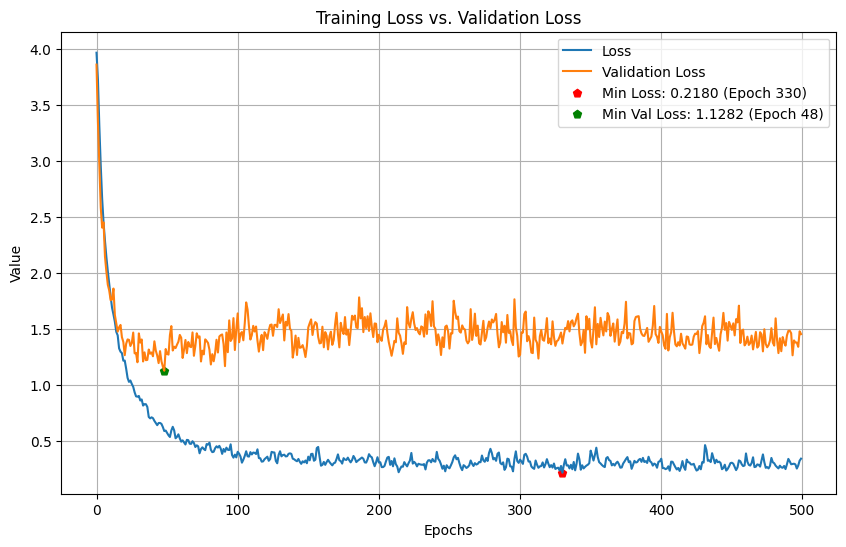

In [190]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

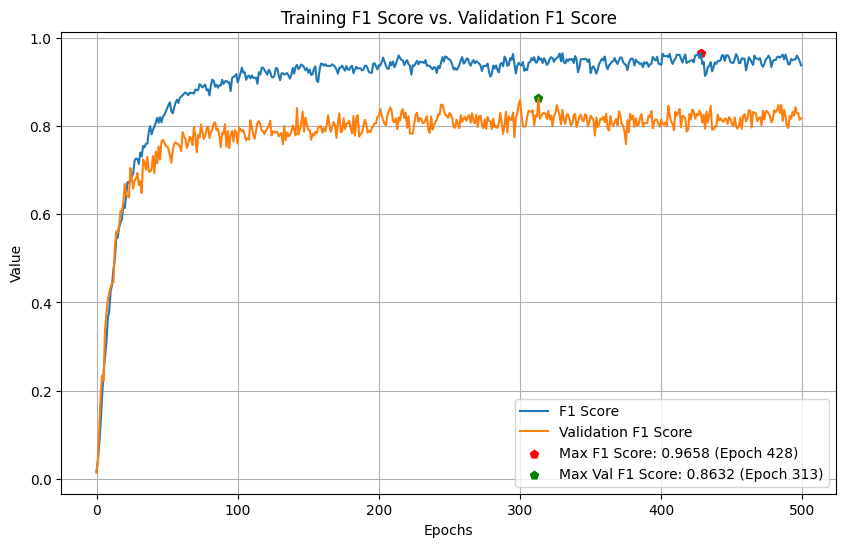

In [191]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [147]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      1.000     0.700     0.824        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.462     1.000     0.632         6
      CANCER      0.727     1.000     0.842         8
   CHRISTMAS      1.000     0.833     0.909         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.571     0.667     0.615         6
      DINNER      1.000     0.875     0.933         8
         DOG      0.667     

In [155]:
reconstructed_model = tf.keras.models.load_model("1 1D-CNN + 1 LSTM Trial 717 Mish")

In [149]:
reconstructed_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

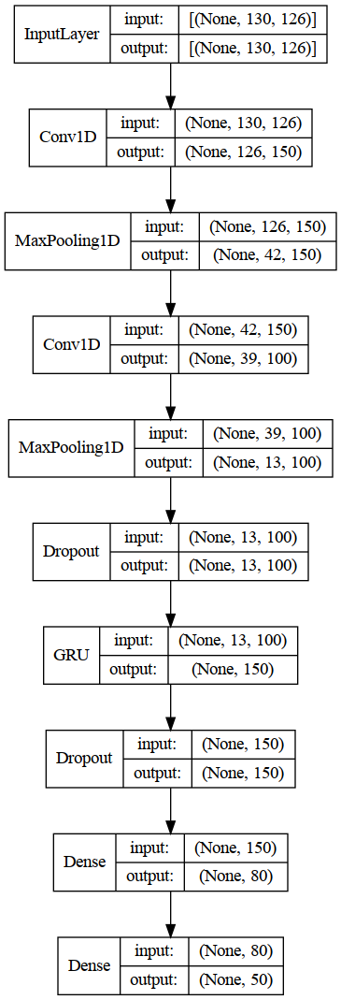

In [150]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

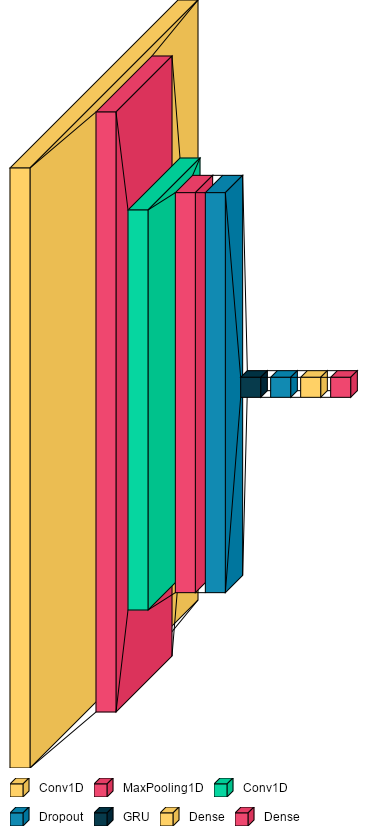

In [156]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [151]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 7ms/step - loss: 1.2373 - f1_score: 0.8632


[1.2372610569000244, 0.8632017374038696]

In [153]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 8ms/step - loss: 0.1030 - f1_score: 1.0000


[0.10299792885780334, 1.0]

In [154]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.800     0.667     0.727         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     1.000     1.000        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     0.833     0.909         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      0.600     1.000     0.750         6
      DINNER      1.000     0.750     0.857         8
         DOG      1.000     

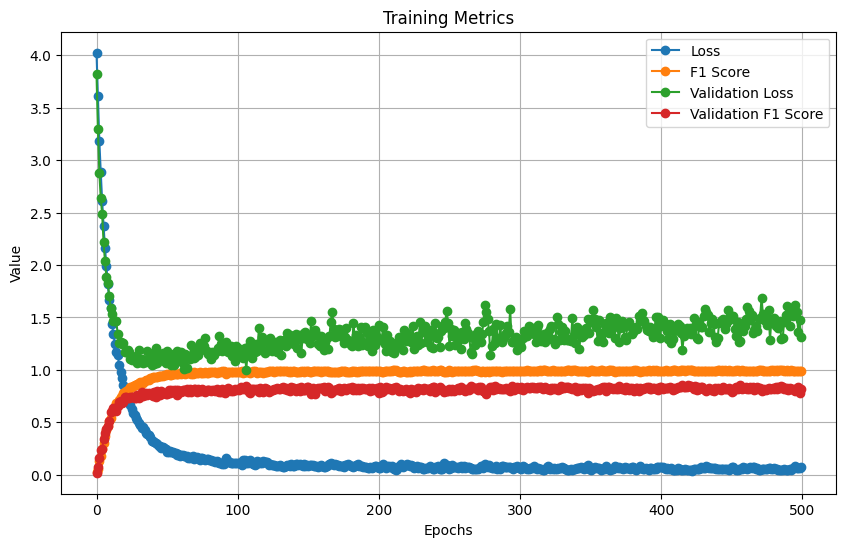

In [249]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

## Hyperparameter Tuning 2 1D CNN Layer + 1 LSTM

In [119]:
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping


/tmp/ipykernel_2423752/1222377179.py:2: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import Hyperband


In [120]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, LSTM
import keras_tuner
from keras_tuner import HyperModel
from kerastuner.tuners import Hyperband
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

class HyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        act_function = hp.Choice('dense_activation',values=['selu','mish','gelu','elu','relu'],default='gelu')
        model = Sequential()
        model.add(Conv1D(filters=hp.Int('filters_1',min_value=50,max_value=200,step=25,default=150),
                         kernel_size=hp.Choice('kernel_1',values=[3,4,5,6,7,8,9,10],default=5,),
                         activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=hp.Choice('pool_1',values=[3,4,5,6,7,8,9,10],default=5,)))
        model.add(Conv1D(filters=hp.Int('filters_1',min_value=50,max_value=200,step=25,default=150),
                         kernel_size=hp.Choice('kernel_2',values=[1,2,3,4,5],default=5,),
                         activation=act_function,input_shape=self.input_shape))
        model.add(MaxPooling1D(pool_size=hp.Choice('pool_2',values=[1,2,3,4,5],default=5,)))
        model.add(Dropout(rate=hp.Float('dropout_1',min_value=0.0,max_value=0.9,default=0.8,step=0.05,)))
        model.add(LSTM(units=hp.Int('units_1',min_value=50,max_value=200,step=25,default=100),
                      return_sequences=False,
                      kernel_regularizer=regularizers.l2(hp.Float('regularizer',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.001))))
        model.add(Dropout(rate=hp.Float('dropout_2',min_value=0.0,max_value=0.9,default=0.7,step=0.05,)))
        model.add(Dense(units=hp.Int('units_2',min_value=70,max_value=120,step=10,default=80),activation=act_function))
        model.add(Dense(self.num_classes, activation='softmax'))

        model.compile(tf.optimizers.experimental.Nadam(hp.Float('learning_rate',min_value=1e-4,
                                                                max_value=1e-2,sampling='LOG',
                                                                default=.00062198175395800846)),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')]
        )
        return model

hypermodel = HyperModel(input_shape=(130,399), num_classes=50)

In [121]:
HYPERBAND_MAX_EPOCHS = 300
EXECUTION_PER_TRIAL = 2

tuner = Hyperband(
    hypermodel,
    max_epochs=HYPERBAND_MAX_EPOCHS,
    objective=keras_tuner.Objective("val_f1_score", direction="max"),
    seed=10,
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='/media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/',
    project_name='2_1D_CNN+1_LSTM',
    overwrite=False)

INFO:tensorflow:Reloading Tuner from /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/2_1D_CNN+1_LSTM/tuner0.json


In [123]:
tuner.search_space_summary()

Search space summary
Default search space size: 12
dense_activation (Choice)
{'default': 'gelu', 'conditions': [], 'values': ['selu', 'mish', 'gelu', 'elu', 'relu'], 'ordered': False}
filters_1 (Int)
{'default': 150, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
kernel_1 (Choice)
{'default': 5, 'conditions': [], 'values': [3, 4, 5, 6, 7, 8, 9, 10], 'ordered': True}
pool_1 (Choice)
{'default': 5, 'conditions': [], 'values': [3, 4, 5, 6, 7, 8, 9, 10], 'ordered': True}
kernel_2 (Choice)
{'default': 5, 'conditions': [], 'values': [1, 2, 3, 4, 5], 'ordered': True}
pool_2 (Choice)
{'default': 5, 'conditions': [], 'values': [1, 2, 3, 4, 5], 'ordered': True}
dropout_1 (Float)
{'default': 0.8, 'conditions': [], 'min_value': 0.0, 'max_value': 0.9, 'step': 0.05, 'sampling': 'linear'}
units_1 (Int)
{'default': 100, 'conditions': [], 'min_value': 50, 'max_value': 200, 'step': 25, 'sampling': 'linear'}
regularizer (Float)
{'default': 0.001, 'conditions': [], 

In [124]:
es = EarlyStopping(monitor="val_f1_score",patience=30,restore_best_weights=True,mode="max")

In [125]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [126]:
tuner.search(Xtrain, Ytrain, epochs=1000, validation_data=(Xval,Yval),batch_size=96,callbacks=[es])

Trial 725 Complete [00h 04m 05s]
val_f1_score: 0.46747535467147827

Best val_f1_score So Far: 0.7492342889308929
Total elapsed time: 11h 39m 22s
INFO:tensorflow:Oracle triggered exit


In [122]:
best_model = tuner.get_best_models(num_models=10)[0]

2023-09-10 11:28:41.843174: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-10 11:28:45.829128: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1561 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=100.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [123]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 128, 150)          179700    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 21, 150)          0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 18, 150)           90150     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 4, 150)           0         
 1D)                                                             
                                                                 
 dropout (Dropout)           (None, 4, 150)            0         
                                                                 
 lstm (LSTM)                 (None, 150)               1

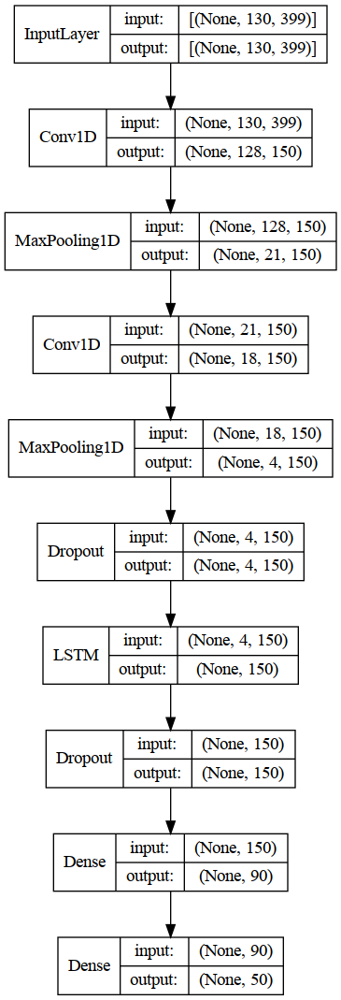

In [124]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

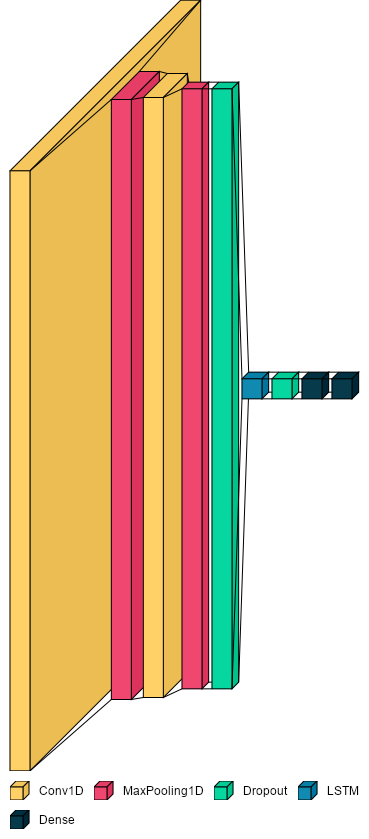

In [125]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(best_model, legend=True, font=font) 

In [130]:
tuner.results_summary()

Results summary
Results in /media/kristian/HDD/ASL_Citizen/RTMPose-L/hyperband/2_1D_CNN+1_LSTM
Showing 10 best trials
Objective(name="val_f1_score", direction="max")

Trial 0427 summary
Hyperparameters:
dense_activation: mish
filters_1: 150
kernel_1: 3
pool_1: 6
kernel_2: 4
pool_2: 4
dropout_1: 0.45
units_1: 150
regularizer: 0.005421195615159703
dropout_2: 0.55
units_2: 90
learning_rate: 0.0008053201250101636
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 5
tuner/round: 5
tuner/trial_id: 0424
Score: 0.7492342889308929

Trial 0426 summary
Hyperparameters:
dense_activation: gelu
filters_1: 200
kernel_1: 3
pool_1: 6
kernel_2: 3
pool_2: 4
dropout_1: 0.1
units_1: 50
regularizer: 0.001278553600468175
dropout_2: 0.30000000000000004
units_2: 100
learning_rate: 0.0004250525730906734
tuner/epochs: 300
tuner/initial_epoch: 100
tuner/bracket: 5
tuner/round: 5
tuner/trial_id: 0425
Score: 0.7470126450061798

Trial 0425 summary
Hyperparameters:
dense_activation: gelu
filters_1: 200
kernel_

In [131]:
loss, accuracy = best_model.evaluate(Xval, Yval)

11/11 [==============================] - 2s 38ms/step - loss: 1.3475 - f1_score: 0.7625


In [132]:
loss, accuracy = best_model.evaluate(Xtrain, Ytrain)

84/84 [==============================] - 1s 13ms/step - loss: 0.1221 - f1_score: 1.0000


In [133]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(best_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 10ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.875     0.933         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      0.714     1.000     0.833        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     0.750     0.857         8
   BREAKFAST      1.000     0.333     0.500         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      0.600     1.000     0.750         6
        DARK      0.667     1.000     0.800         4
        DEAF      0.333     0.167     0.222         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      1.000     0.875     0.933         8
     DEVELOP      0.500     0.333     0.400         6
      DINNER      0.889     1.000     0.941         8
         DOG      0.600    

In [134]:
#bestHP = tuner.get_best_hyperparameters(num_trials=5)[2]
bestHP = tuner.get_best_hyperparameters(num_trials=10)[0]

In [135]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 1DCNN + 1 LSTM/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [137]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...
Epoch 1/500
28/28 [==============================] - 11s 97ms/step - loss: 4.9852 - f1_score: 0.0145 - val_loss: 4.7066 - val_f1_score: 4.8780e-04
Epoch 2/500
28/28 [==============================] - 2s 63ms/step - loss: 4.5154 - f1_score: 0.0128 - val_loss: 4.3306 - val_f1_score: 0.0100
Epoch 3/500
28/28 [==============================] - 2s 79ms/step - loss: 4.2145 - f1_score: 0.0228 - val_loss: 4.0675 - val_f1_score: 0.0150
Epoch 4/500
28/28 [==============================] - 2s 88ms/step - loss: 3.9174 - f1_score: 0.0268 - val_loss: 3.6295 - val_f1_score: 0.0248
Epoch 5/500
28/28 [==============================] - 3s 103ms/step - loss: 3.6697 - f1_score: 0.0464 - val_loss: 3.4563 - val_f1_score: 0.0356
Epoch 6/500
28/28 [==============================] - 3s 96ms/step - loss: 3.4822 - f1_score: 0.0572 - val_loss: 3.2799 - val_f1_score: 0.0720
Epoch 7/500
28/28 [==============================] - 3s 108ms/step - loss: 3.3011 - f1_score: 0.0786 - val_l

Epoch 58/500
28/28 [==============================] - 2s 79ms/step - loss: 0.8952 - f1_score: 0.7515 - val_loss: 1.3079 - val_f1_score: 0.6444
Epoch 59/500
28/28 [==============================] - 2s 80ms/step - loss: 0.8908 - f1_score: 0.7528 - val_loss: 1.3850 - val_f1_score: 0.6146
Epoch 60/500
28/28 [==============================] - 2s 85ms/step - loss: 0.8448 - f1_score: 0.7644 - val_loss: 1.3537 - val_f1_score: 0.6450
Epoch 61/500
28/28 [==============================] - 2s 77ms/step - loss: 0.8717 - f1_score: 0.7612 - val_loss: 1.3201 - val_f1_score: 0.6223
Epoch 62/500
28/28 [==============================] - 2s 72ms/step - loss: 0.8445 - f1_score: 0.7667 - val_loss: 1.3230 - val_f1_score: 0.6461
Epoch 63/500
28/28 [==============================] - 2s 71ms/step - loss: 0.8339 - f1_score: 0.7767 - val_loss: 1.4010 - val_f1_score: 0.6105
Epoch 64/500
28/28 [==============================] - 2s 71ms/step - loss: 0.8265 - f1_score: 0.7659 - val_loss: 1.4849 - val_f1_score: 0.6060

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


28/28 [==============================] - 14s 532ms/step - loss: 0.6143 - f1_score: 0.8427 - val_loss: 1.2954 - val_f1_score: 0.6972
Epoch 86/500
28/28 [==============================] - 2s 63ms/step - loss: 0.6380 - f1_score: 0.8298 - val_loss: 1.2819 - val_f1_score: 0.6838
Epoch 87/500
28/28 [==============================] - 2s 58ms/step - loss: 0.6069 - f1_score: 0.8439 - val_loss: 1.2943 - val_f1_score: 0.6700
Epoch 88/500
28/28 [==============================] - 2s 58ms/step - loss: 0.6004 - f1_score: 0.8411 - val_loss: 1.2779 - val_f1_score: 0.6557
Epoch 89/500
28/28 [==============================] - 2s 59ms/step - loss: 0.5804 - f1_score: 0.8373 - val_loss: 1.2567 - val_f1_score: 0.6707
Epoch 90/500
28/28 [==============================] - 2s 59ms/step - loss: 0.5801 - f1_score: 0.8531 - val_loss: 1.3957 - val_f1_score: 0.6498
Epoch 91/500
28/28 [==============================] - 2s 59ms/step - loss: 0.6061 - f1_score: 0.8386 - val_loss: 1.2821 - val_f1_score: 0.6852
Epoch 92/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


28/28 [==============================] - 14s 514ms/step - loss: 0.4923 - f1_score: 0.8795 - val_loss: 1.2834 - val_f1_score: 0.7100
Epoch 102/500
28/28 [==============================] - 2s 58ms/step - loss: 0.5086 - f1_score: 0.8662 - val_loss: 1.3757 - val_f1_score: 0.6915
Epoch 103/500
28/28 [==============================] - 2s 58ms/step - loss: 0.5111 - f1_score: 0.8694 - val_loss: 1.3757 - val_f1_score: 0.6848
Epoch 104/500
28/28 [==============================] - 2s 60ms/step - loss: 0.5042 - f1_score: 0.8790 - val_loss: 1.2947 - val_f1_score: 0.6749
Epoch 105/500
28/28 [==============================] - 2s 63ms/step - loss: 0.5031 - f1_score: 0.8686 - val_loss: 1.2960 - val_f1_score: 0.6907
Epoch 106/500
28/28 [==============================] - 2s 62ms/step - loss: 0.4765 - f1_score: 0.8857 - val_loss: 1.4877 - val_f1_score: 0.6655
Epoch 107/500
28/28 [==============================] - 2s 60ms/step - loss: 0.4931 - f1_score: 0.8746 - val_loss: 1.3194 - val_f1_score: 0.6591
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 432ms/step - loss: 0.4394 - f1_score: 0.8953 - val_loss: 1.2978 - val_f1_score: 0.7250
Epoch 123/500
28/28 [==============================] - 2s 56ms/step - loss: 0.4434 - f1_score: 0.8859 - val_loss: 1.3219 - val_f1_score: 0.6708
Epoch 124/500
28/28 [==============================] - 2s 59ms/step - loss: 0.4219 - f1_score: 0.8973 - val_loss: 1.3530 - val_f1_score: 0.6936
Epoch 125/500
28/28 [==============================] - 2s 57ms/step - loss: 0.4387 - f1_score: 0.8972 - val_loss: 1.3639 - val_f1_score: 0.6859
Epoch 126/500
28/28 [==============================] - 2s 58ms/step - loss: 0.4151 - f1_score: 0.9008 - val_loss: 1.3691 - val_f1_score: 0.6796
Epoch 127/500
28/28 [==============================] - 2s 59ms/step - loss: 0.3962 - f1_score: 0.9112 - val_loss: 1.2670 - val_f1_score: 0.6955
Epoch 128/500
28/28 [==============================] - 2s 65ms/step - loss: 0.4288 - f1_score: 0.8993 - val_loss: 1.3317 - val_f1_score: 0.7096
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


28/28 [==============================] - 13s 480ms/step - loss: 0.3603 - f1_score: 0.9120 - val_loss: 1.2661 - val_f1_score: 0.7298
Epoch 165/500
28/28 [==============================] - 2s 58ms/step - loss: 0.3187 - f1_score: 0.9355 - val_loss: 1.3705 - val_f1_score: 0.6918
Epoch 166/500
28/28 [==============================] - 2s 58ms/step - loss: 0.3127 - f1_score: 0.9340 - val_loss: 1.4449 - val_f1_score: 0.6714
Epoch 167/500
28/28 [==============================] - 2s 64ms/step - loss: 0.3384 - f1_score: 0.9224 - val_loss: 1.3303 - val_f1_score: 0.7017
Epoch 168/500
28/28 [==============================] - 2s 59ms/step - loss: 0.3288 - f1_score: 0.9276 - val_loss: 1.3379 - val_f1_score: 0.6973
Epoch 169/500
28/28 [==============================] - 2s 59ms/step - loss: 0.3167 - f1_score: 0.9308 - val_loss: 1.3155 - val_f1_score: 0.6699
Epoch 170/500
28/28 [==============================] - 2s 58ms/step - loss: 0.3385 - f1_score: 0.9307 - val_loss: 1.4140 - val_f1_score: 0.6793
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


28/28 [==============================] - 11s 406ms/step - loss: 0.3006 - f1_score: 0.9333 - val_loss: 1.2711 - val_f1_score: 0.7320
Epoch 174/500
28/28 [==============================] - 2s 57ms/step - loss: 0.3132 - f1_score: 0.9285 - val_loss: 1.4076 - val_f1_score: 0.7119
Epoch 175/500
28/28 [==============================] - 2s 58ms/step - loss: 0.3016 - f1_score: 0.9284 - val_loss: 1.4336 - val_f1_score: 0.6869
Epoch 176/500
28/28 [==============================] - 2s 61ms/step - loss: 0.3567 - f1_score: 0.9161 - val_loss: 1.3393 - val_f1_score: 0.6750
Epoch 177/500
28/28 [==============================] - 2s 62ms/step - loss: 0.3216 - f1_score: 0.9279 - val_loss: 1.3486 - val_f1_score: 0.7174
Epoch 178/500
28/28 [==============================] - 2s 62ms/step - loss: 0.3173 - f1_score: 0.9309 - val_loss: 1.4049 - val_f1_score: 0.7190
Epoch 179/500
28/28 [==============================] - 2s 60ms/step - loss: 0.3396 - f1_score: 0.9187 - val_loss: 1.4754 - val_f1_score: 0.6738
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


28/28 [==============================] - 13s 475ms/step - loss: 0.3036 - f1_score: 0.9301 - val_loss: 1.2381 - val_f1_score: 0.7393
Epoch 186/500
28/28 [==============================] - 2s 57ms/step - loss: 0.2975 - f1_score: 0.9349 - val_loss: 1.2942 - val_f1_score: 0.7065
Epoch 187/500
28/28 [==============================] - 2s 57ms/step - loss: 0.2944 - f1_score: 0.9311 - val_loss: 1.3323 - val_f1_score: 0.6956
Epoch 188/500
28/28 [==============================] - 2s 57ms/step - loss: 0.3271 - f1_score: 0.9169 - val_loss: 1.3573 - val_f1_score: 0.7236
Epoch 189/500
28/28 [==============================] - 2s 58ms/step - loss: 0.3034 - f1_score: 0.9397 - val_loss: 1.2564 - val_f1_score: 0.7339
Epoch 190/500
28/28 [==============================] - 2s 57ms/step - loss: 0.3144 - f1_score: 0.9344 - val_loss: 1.3036 - val_f1_score: 0.7133
Epoch 191/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2836 - f1_score: 0.9436 - val_loss: 1.3945 - val_f1_score: 0.6969
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 434ms/step - loss: 0.3128 - f1_score: 0.9266 - val_loss: 1.3058 - val_f1_score: 0.7594
Epoch 201/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2827 - f1_score: 0.9396 - val_loss: 1.2756 - val_f1_score: 0.7191
Epoch 202/500
28/28 [==============================] - 2s 56ms/step - loss: 0.3046 - f1_score: 0.9309 - val_loss: 1.2845 - val_f1_score: 0.7361
Epoch 203/500
28/28 [==============================] - 2s 58ms/step - loss: 0.3014 - f1_score: 0.9344 - val_loss: 1.4424 - val_f1_score: 0.7024
Epoch 204/500
28/28 [==============================] - 2s 61ms/step - loss: 0.2835 - f1_score: 0.9401 - val_loss: 1.3608 - val_f1_score: 0.7240
Epoch 205/500
28/28 [==============================] - 2s 58ms/step - loss: 0.2805 - f1_score: 0.9372 - val_loss: 1.4475 - val_f1_score: 0.7062
Epoch 206/500
28/28 [==============================] - 2s 58ms/step - loss: 0.2979 - f1_score: 0.9351 - val_loss: 1.2506 - val_f1_score: 0.7477
Epoc

Epoch 257/500
28/28 [==============================] - 2s 58ms/step - loss: 0.2352 - f1_score: 0.9538 - val_loss: 1.4578 - val_f1_score: 0.6972
Epoch 258/500
28/28 [==============================] - 2s 65ms/step - loss: 0.2380 - f1_score: 0.9542 - val_loss: 1.5007 - val_f1_score: 0.6926
Epoch 259/500
28/28 [==============================] - 2s 64ms/step - loss: 0.2590 - f1_score: 0.9463 - val_loss: 1.4596 - val_f1_score: 0.7238
Epoch 260/500
28/28 [==============================] - 2s 58ms/step - loss: 0.2413 - f1_score: 0.9560 - val_loss: 1.4764 - val_f1_score: 0.7149
Epoch 261/500
28/28 [==============================] - 2s 58ms/step - loss: 0.2354 - f1_score: 0.9517 - val_loss: 1.4562 - val_f1_score: 0.6988
Epoch 262/500
28/28 [==============================] - 2s 65ms/step - loss: 0.2501 - f1_score: 0.9510 - val_loss: 1.3805 - val_f1_score: 0.7229
Epoch 263/500
28/28 [==============================] - 2s 69ms/step - loss: 0.2626 - f1_score: 0.9443 - val_loss: 1.4461 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 457ms/step - loss: 0.2305 - f1_score: 0.9557 - val_loss: 1.3668 - val_f1_score: 0.7657
Epoch 265/500
28/28 [==============================] - 2s 57ms/step - loss: 0.2324 - f1_score: 0.9541 - val_loss: 1.3940 - val_f1_score: 0.7141
Epoch 266/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2601 - f1_score: 0.9472 - val_loss: 1.5413 - val_f1_score: 0.6771
Epoch 267/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2716 - f1_score: 0.9423 - val_loss: 1.3783 - val_f1_score: 0.6929
Epoch 268/500
28/28 [==============================] - 2s 56ms/step - loss: 0.2484 - f1_score: 0.9519 - val_loss: 1.4571 - val_f1_score: 0.6980
Epoch 269/500
28/28 [==============================] - 2s 58ms/step - loss: 0.2408 - f1_score: 0.9502 - val_loss: 1.3767 - val_f1_score: 0.7055
Epoch 270/500
28/28 [==============================] - 2s 57ms/step - loss: 0.2658 - f1_score: 0.9435 - val_loss: 1.4534 - val_f1_score: 0.6896
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM/assets


28/28 [==============================] - 12s 439ms/step - loss: 0.2203 - f1_score: 0.9572 - val_loss: 1.2420 - val_f1_score: 0.7745
Epoch 315/500
28/28 [==============================] - 2s 62ms/step - loss: 0.2452 - f1_score: 0.9531 - val_loss: 1.3016 - val_f1_score: 0.7249
Epoch 316/500
28/28 [==============================] - 2s 58ms/step - loss: 0.2379 - f1_score: 0.9535 - val_loss: 1.5169 - val_f1_score: 0.7509
Epoch 317/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2113 - f1_score: 0.9635 - val_loss: 1.4182 - val_f1_score: 0.7287
Epoch 318/500
28/28 [==============================] - 2s 65ms/step - loss: 0.2126 - f1_score: 0.9615 - val_loss: 1.5527 - val_f1_score: 0.7163
Epoch 319/500
28/28 [==============================] - 2s 64ms/step - loss: 0.2098 - f1_score: 0.9649 - val_loss: 1.4365 - val_f1_score: 0.7212
Epoch 320/500
28/28 [==============================] - 2s 61ms/step - loss: 0.2203 - f1_score: 0.9567 - val_loss: 1.6019 - val_f1_score: 0.7107
Epoc

Epoch 371/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2290 - f1_score: 0.9604 - val_loss: 1.4527 - val_f1_score: 0.7525
Epoch 372/500
28/28 [==============================] - 2s 60ms/step - loss: 0.2278 - f1_score: 0.9578 - val_loss: 1.8295 - val_f1_score: 0.6860
Epoch 373/500
28/28 [==============================] - 2s 71ms/step - loss: 0.2136 - f1_score: 0.9611 - val_loss: 1.4445 - val_f1_score: 0.7511
Epoch 374/500
28/28 [==============================] - 2s 67ms/step - loss: 0.2087 - f1_score: 0.9617 - val_loss: 1.4484 - val_f1_score: 0.7147
Epoch 375/500
28/28 [==============================] - 2s 65ms/step - loss: 0.2062 - f1_score: 0.9606 - val_loss: 1.4685 - val_f1_score: 0.7237
Epoch 376/500
28/28 [==============================] - 2s 67ms/step - loss: 0.2116 - f1_score: 0.9561 - val_loss: 1.4900 - val_f1_score: 0.7085
Epoch 377/500
28/28 [==============================] - 2s 66ms/step - loss: 0.2271 - f1_score: 0.9604 - val_loss: 1.4933 - val_f1_score:

Epoch 428/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1862 - f1_score: 0.9683 - val_loss: 1.4330 - val_f1_score: 0.7446
Epoch 429/500
28/28 [==============================] - 2s 74ms/step - loss: 0.2156 - f1_score: 0.9568 - val_loss: 1.3872 - val_f1_score: 0.7518
Epoch 430/500
28/28 [==============================] - 2s 69ms/step - loss: 0.1944 - f1_score: 0.9682 - val_loss: 1.4531 - val_f1_score: 0.7376
Epoch 431/500
28/28 [==============================] - 2s 68ms/step - loss: 0.1875 - f1_score: 0.9662 - val_loss: 1.3394 - val_f1_score: 0.7350
Epoch 432/500
28/28 [==============================] - 2s 63ms/step - loss: 0.1946 - f1_score: 0.9660 - val_loss: 1.5192 - val_f1_score: 0.7115
Epoch 433/500
28/28 [==============================] - 2s 59ms/step - loss: 0.1867 - f1_score: 0.9664 - val_loss: 1.6235 - val_f1_score: 0.7349
Epoch 434/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1909 - f1_score: 0.9694 - val_loss: 1.6397 - val_f1_score:

Epoch 485/500
28/28 [==============================] - 2s 58ms/step - loss: 0.1841 - f1_score: 0.9663 - val_loss: 1.6737 - val_f1_score: 0.7204
Epoch 486/500
28/28 [==============================] - 2s 59ms/step - loss: 0.1888 - f1_score: 0.9662 - val_loss: 1.5860 - val_f1_score: 0.6946
Epoch 487/500
28/28 [==============================] - 2s 59ms/step - loss: 0.1707 - f1_score: 0.9718 - val_loss: 1.5015 - val_f1_score: 0.7411
Epoch 488/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1989 - f1_score: 0.9671 - val_loss: 1.3576 - val_f1_score: 0.7445
Epoch 489/500
28/28 [==============================] - 2s 60ms/step - loss: 0.1901 - f1_score: 0.9681 - val_loss: 1.4117 - val_f1_score: 0.7213
Epoch 490/500
28/28 [==============================] - 2s 65ms/step - loss: 0.1750 - f1_score: 0.9710 - val_loss: 1.4528 - val_f1_score: 0.7236
Epoch 491/500
28/28 [==============================] - 2s 64ms/step - loss: 0.1808 - f1_score: 0.9696 - val_loss: 1.4851 - val_f1_score:

In [138]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 9ms/step
              precision    recall  f1-score   support

         AXE      0.875     0.875     0.875         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      0.750     0.600     0.667        10
        BELT      1.000     1.000     1.000         4
        BITE      0.857     0.750     0.800         8
   BREAKFAST      0.500     0.500     0.500         6
      CANCER      0.875     0.875     0.875         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.600     1.000     0.750         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.333     0.333     0.333         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      1.000     0.500     0.667         8
     DEVELOP      1.000     0.333     0.500         6
      DINNER      1.000     1.000     1.000         8
         DOG      0.500     

In [139]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 1DCNN + 1 LSTM/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [140]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.169014,0.977602,1.716578,0.694314
496,0.169110,0.972625,1.579869,0.695536
497,0.185274,0.970491,1.738750,0.690854
498,0.187349,0.971281,1.450697,0.741395
499,0.198287,0.966673,1.582714,0.736278


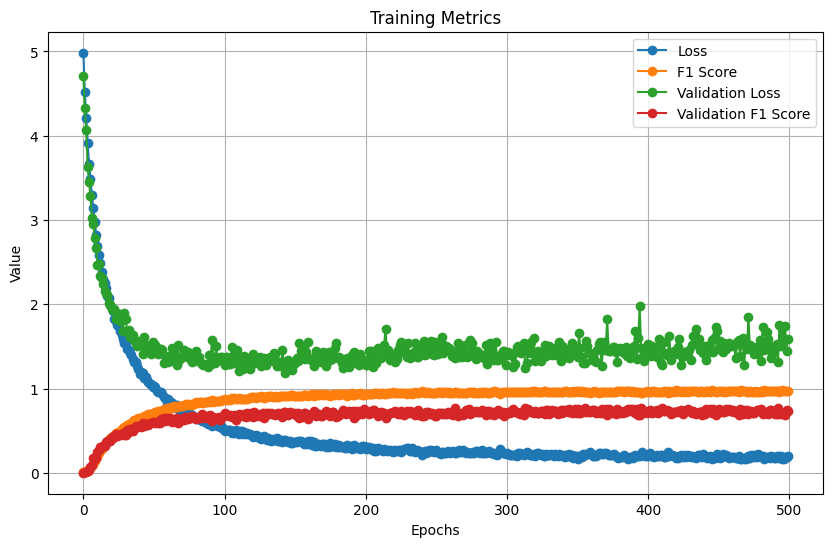

In [141]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

In [142]:
reconstructed_model = tf.keras.models.load_model("2 1DCNN + 1 LSTM")

In [143]:
reconstructed_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 128, 150)          179700    
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 21, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 18, 150)           90150     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 4, 150)           0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 4, 150)            0         
                                                                 
 lstm_2 (LSTM)               (None, 150)              

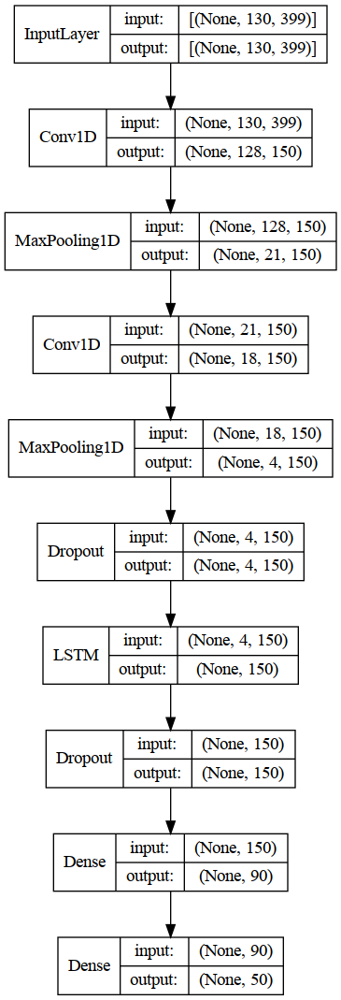

In [144]:
plot_model(best_model, show_shapes=True, show_layer_names=False)

In [145]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 10ms/step - loss: 1.2420 - f1_score: 0.7745


[1.2419642210006714, 0.7745026350021362]

In [146]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 12ms/step - loss: 0.1019 - f1_score: 0.9993


[0.10191482305526733, 0.9992672204971313]

In [147]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 8ms/step
              precision    recall  f1-score   support

         AXE      0.800     1.000     0.889         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      0.692     0.900     0.783        10
        BELT      1.000     1.000     1.000         4
        BITE      1.000     0.500     0.667         8
   BREAKFAST      0.429     0.500     0.462         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.750     1.000     0.857         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.500     0.333     0.400         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      1.000     1.000     1.000         8
     DEVELOP      0.667     0.333     0.444         6
      DINNER      1.000     1.000     1.000         8
         DOG      0.429     

In [100]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 1DCNN + 1 LSTM Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [122]:
act_function = mish
model = Sequential()
model.add(Conv1D(filters=200,kernel_size=6,activation=act_function,input_shape=(130,399)))
model.add(MaxPooling1D(pool_size=3))
model.add(Conv1D(filters=200,kernel_size=5,activation=act_function))
model.add(MaxPooling1D(pool_size=4))
model.add(Dropout(.4))
model.add(LSTM(units=100,return_sequences=False,kernel_regularizer=regularizers.l2(.0006846425037139133)))
model.add(Dropout(.35))
model.add(Dense(units=80,activation=act_function))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.000729692360234673),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, 
                    verbose=1,callbacks=[])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 111, 200)          1596200   
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 11, 200)          0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 7, 200)            200200    
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1, 200)           0         
 1D)                                                             
                                                                 
 dropout (Dropout)           (None, 1, 200)            0         
                                                                 
 lstm (LSTM)                 (None, 100)              

2023-09-04 22:45:20.489428: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700
2023-09-04 22:45:21.480331: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f44a8faa780 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-09-04 22:45:21.480361: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce MX250, Compute Capability 6.1
2023-09-04 22:45:21.490407: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-09-04 22:45:21.650862: I tensorflow/compiler/jit/xla_compilation_cache.cc:476] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


28/28 [==============================] - 11s 185ms/step - loss: 4.1080 - f1_score: 0.0168 - val_loss: 4.0523 - val_f1_score: 0.0010
Epoch 2/500
28/28 [==============================] - 4s 139ms/step - loss: 4.0536 - f1_score: 0.0163 - val_loss: 4.0238 - val_f1_score: 8.6643e-04
Epoch 3/500
28/28 [==============================] - 4s 140ms/step - loss: 4.0250 - f1_score: 0.0191 - val_loss: 4.0080 - val_f1_score: 0.0038
Epoch 4/500
28/28 [==============================] - 4s 140ms/step - loss: 4.0092 - f1_score: 0.0133 - val_loss: 3.9938 - val_f1_score: 0.0022
Epoch 5/500
28/28 [==============================] - 4s 140ms/step - loss: 3.9943 - f1_score: 0.0153 - val_loss: 3.9811 - val_f1_score: 0.0038
Epoch 6/500
28/28 [==============================] - 4s 140ms/step - loss: 3.9869 - f1_score: 0.0128 - val_loss: 3.9742 - val_f1_score: 0.0018
Epoch 7/500
28/28 [==============================] - 4s 140ms/step - loss: 3.9742 - f1_score: 0.0123 - val_loss: 3.9724 - val_f1_score: 0.0029
Epoch 

Epoch 58/500
28/28 [==============================] - 4s 150ms/step - loss: 2.1568 - f1_score: 0.3279 - val_loss: 2.5542 - val_f1_score: 0.2332
Epoch 59/500
28/28 [==============================] - 4s 150ms/step - loss: 2.1068 - f1_score: 0.3371 - val_loss: 2.5413 - val_f1_score: 0.2129
Epoch 60/500
28/28 [==============================] - 4s 149ms/step - loss: 2.0504 - f1_score: 0.3564 - val_loss: 2.5456 - val_f1_score: 0.2129
Epoch 61/500
28/28 [==============================] - 4s 149ms/step - loss: 2.0593 - f1_score: 0.3481 - val_loss: 2.5146 - val_f1_score: 0.2154
Epoch 62/500
28/28 [==============================] - 4s 148ms/step - loss: 2.0169 - f1_score: 0.3635 - val_loss: 2.5399 - val_f1_score: 0.2481
Epoch 63/500
28/28 [==============================] - 4s 150ms/step - loss: 1.9549 - f1_score: 0.3819 - val_loss: 2.5079 - val_f1_score: 0.2747
Epoch 64/500
28/28 [==============================] - 4s 150ms/step - loss: 1.9717 - f1_score: 0.3791 - val_loss: 2.4824 - val_f1_score:

KeyboardInterrupt: 

In [241]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 10ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      0.857     1.000     0.923         6
  BASKETBALL      1.000     0.900     0.947        10
         BEE      1.000     0.800     0.889        10
        BELT      0.800     1.000     0.889         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.500     1.000     0.667         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.667     0.800         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      0.800     1.000     0.889         4
        DEAF      0.750     1.000     0.857         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.875     0.875     0.875         8
     DEVELOP      0.714     0.833     0.769         6
      DINNER      1.000     0.875     0.933         8
         DOG      1.000    

2023-09-02 13:37:26.299113: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.48GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-02 13:37:26.435276: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.30GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


In [187]:
reconstructed_model = tf.keras.models.load_model("2 1DCNN + 1 LSTM Mish")

In [188]:
reconstructed_model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_12 (Conv1D)          (None, 125, 200)          151400    
                                                                 
 max_pooling1d_12 (MaxPoolin  (None, 41, 200)          0         
 g1D)                                                            
                                                                 
 conv1d_13 (Conv1D)          (None, 37, 200)           200200    
                                                                 
 max_pooling1d_13 (MaxPoolin  (None, 9, 200)           0         
 g1D)                                                            
                                                                 
 dropout_16 (Dropout)        (None, 9, 200)            0         
                                                                 
 lstm_9 (LSTM)               (None, 100)             

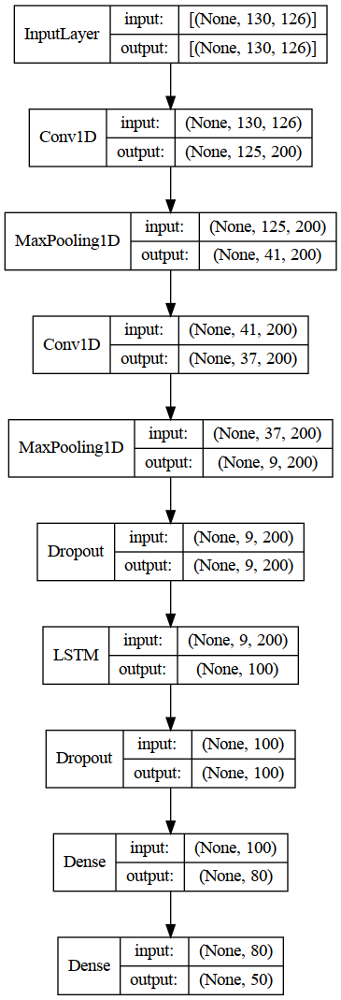

In [189]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

In [190]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 7ms/step - loss: 1.1932 - f1_score: 0.8600


[1.1932461261749268, 0.8599855899810791]

In [246]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      0.857     0.750     0.800         8
    BACKPACK      0.857     1.000     0.923         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     0.800     0.889        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.545     1.000     0.706         6
      CANCER      1.000     1.000     1.000         8
   CHRISTMAS      1.000     0.833     0.909         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.667     1.000     0.800         6
      DINNER      1.000     0.875     0.933         8
         DOG      0.857     

In [247]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 1DCNN + 1 LSTM Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [248]:
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.079302,0.985210,1.615462,0.802009
496,0.060282,0.992731,1.552376,0.825935
497,0.065577,0.989388,1.363456,0.834468
498,0.061649,0.991161,1.471129,0.782187
499,0.070890,0.988843,1.312015,0.816548


### 2 1D-CNN + 1 LSTM Trial 715

In [126]:
best_model = tuner.get_best_models(num_models=5)[4]

In [127]:
best_model.evaluate(Xtrain,Ytrain)

2023-09-10 11:30:01.433863: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700


84/84 [==============================] - 14s 15ms/step - loss: 0.4285 - f1_score: 0.8761


[0.42848339676856995, 0.8761171102523804]

In [128]:
best_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 46ms/step - loss: 1.2463 - f1_score: 0.7204


[1.246279001235962, 0.7203800678253174]

In [122]:
bestHP = tuner.get_best_hyperparameters(num_trials=5)[4]

In [123]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 1DCNN + 1 LSTM Trial 715/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [124]:
print("[INFO] training the best model...")
model = tuner.hypermodel.build(bestHP)
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])
#History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1)

[INFO] training the best model...


2023-09-10 11:33:52.866778: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-10 11:33:52.947217: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1561 MB memory:  -> device: 0, name: NVIDIA GeForce MX250, pci bus id: 0000:01:00.0, compute capability: 6.1


Epoch 1/500


2023-09-10 11:33:58.449740: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700
2023-09-10 11:34:01.137563: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7fdaf190beb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-09-10 11:34:01.137597: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce MX250, Compute Capability 6.1
2023-09-10 11:34:01.166755: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-09-10 11:34:01.596441: I tensorflow/compiler/jit/xla_compilation_cache.cc:476] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


28/28 [==============================] - ETA: 0s - loss: 4.8264 - f1_score: 0.0160

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 21s 471ms/step - loss: 4.8264 - f1_score: 0.0160 - val_loss: 4.7650 - val_f1_score: 0.0072
Epoch 2/500
28/28 [==============================] - 2s 70ms/step - loss: 4.7126 - f1_score: 0.0120 - val_loss: 4.6493 - val_f1_score: 0.0057
Epoch 3/500
28/28 [==============================] - 2s 70ms/step - loss: 4.6002 - f1_score: 0.0165 - val_loss: 4.5517 - val_f1_score: 0.0025
Epoch 4/500
28/28 [==============================] - ETA: 0s - loss: 4.5046 - f1_score: 0.0210

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 9s 337ms/step - loss: 4.5046 - f1_score: 0.0210 - val_loss: 4.4458 - val_f1_score: 0.0115
Epoch 5/500
28/28 [==============================] - 2s 70ms/step - loss: 4.4121 - f1_score: 0.0196 - val_loss: 4.3453 - val_f1_score: 0.0045
Epoch 6/500
28/28 [==============================] - 2s 71ms/step - loss: 4.2984 - f1_score: 0.0237 - val_loss: 4.2242 - val_f1_score: 0.0043
Epoch 7/500
28/28 [==============================] - 2s 73ms/step - loss: 4.1673 - f1_score: 0.0251 - val_loss: 4.0148 - val_f1_score: 0.0115
Epoch 8/500
28/28 [==============================] - 2s 73ms/step - loss: 4.0263 - f1_score: 0.0219 - val_loss: 3.8563 - val_f1_score: 0.0055
Epoch 9/500
28/28 [==============================] - ETA: 0s - loss: 3.9013 - f1_score: 0.0273

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 384ms/step - loss: 3.9013 - f1_score: 0.0273 - val_loss: 3.7639 - val_f1_score: 0.0146
Epoch 10/500
28/28 [==============================] - ETA: 0s - loss: 3.7934 - f1_score: 0.0395

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 380ms/step - loss: 3.7934 - f1_score: 0.0395 - val_loss: 3.6003 - val_f1_score: 0.0378
Epoch 11/500
28/28 [==============================] - ETA: 0s - loss: 3.6920 - f1_score: 0.0496

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 9s 348ms/step - loss: 3.6920 - f1_score: 0.0496 - val_loss: 3.4915 - val_f1_score: 0.0463
Epoch 12/500
28/28 [==============================] - 2s 71ms/step - loss: 3.5949 - f1_score: 0.0502 - val_loss: 3.3761 - val_f1_score: 0.0402
Epoch 13/500
28/28 [==============================] - ETA: 0s - loss: 3.4821 - f1_score: 0.0603

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 405ms/step - loss: 3.4821 - f1_score: 0.0603 - val_loss: 3.2583 - val_f1_score: 0.0526
Epoch 14/500
28/28 [==============================] - ETA: 0s - loss: 3.3814 - f1_score: 0.0749

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 9s 330ms/step - loss: 3.3814 - f1_score: 0.0749 - val_loss: 3.1951 - val_f1_score: 0.0671
Epoch 15/500
28/28 [==============================] - ETA: 0s - loss: 3.2907 - f1_score: 0.0926

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 9s 341ms/step - loss: 3.2907 - f1_score: 0.0926 - val_loss: 3.0850 - val_f1_score: 0.1099
Epoch 16/500
28/28 [==============================] - ETA: 0s - loss: 3.1942 - f1_score: 0.0962

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 413ms/step - loss: 3.1942 - f1_score: 0.0962 - val_loss: 2.9979 - val_f1_score: 0.1118
Epoch 17/500
28/28 [==============================] - 2s 72ms/step - loss: 3.1157 - f1_score: 0.1150 - val_loss: 2.9325 - val_f1_score: 0.1001
Epoch 18/500
28/28 [==============================] - 2s 73ms/step - loss: 3.0584 - f1_score: 0.1274 - val_loss: 2.8534 - val_f1_score: 0.1055
Epoch 19/500
28/28 [==============================] - ETA: 0s - loss: 2.9779 - f1_score: 0.1275

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 353ms/step - loss: 2.9779 - f1_score: 0.1275 - val_loss: 2.8193 - val_f1_score: 0.1321
Epoch 20/500
28/28 [==============================] - ETA: 0s - loss: 2.9183 - f1_score: 0.1502

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 383ms/step - loss: 2.9183 - f1_score: 0.1502 - val_loss: 2.7642 - val_f1_score: 0.1372
Epoch 21/500
28/28 [==============================] - 2s 72ms/step - loss: 2.8610 - f1_score: 0.1559 - val_loss: 2.7494 - val_f1_score: 0.1196
Epoch 22/500
28/28 [==============================] - ETA: 0s - loss: 2.8173 - f1_score: 0.1623

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 351ms/step - loss: 2.8173 - f1_score: 0.1623 - val_loss: 2.6991 - val_f1_score: 0.1543
Epoch 23/500
28/28 [==============================] - ETA: 0s - loss: 2.7766 - f1_score: 0.1737

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 351ms/step - loss: 2.7766 - f1_score: 0.1737 - val_loss: 2.6731 - val_f1_score: 0.1545
Epoch 24/500
28/28 [==============================] - 2s 72ms/step - loss: 2.7311 - f1_score: 0.1722 - val_loss: 2.6356 - val_f1_score: 0.1476
Epoch 25/500
28/28 [==============================] - ETA: 0s - loss: 2.7133 - f1_score: 0.1709

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 395ms/step - loss: 2.7133 - f1_score: 0.1709 - val_loss: 2.5997 - val_f1_score: 0.1985
Epoch 26/500
28/28 [==============================] - 2s 71ms/step - loss: 2.6620 - f1_score: 0.1889 - val_loss: 2.5884 - val_f1_score: 0.1892
Epoch 27/500
28/28 [==============================] - 2s 72ms/step - loss: 2.6297 - f1_score: 0.1907 - val_loss: 2.5848 - val_f1_score: 0.1982
Epoch 28/500
28/28 [==============================] - ETA: 0s - loss: 2.6012 - f1_score: 0.2005

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 380ms/step - loss: 2.6012 - f1_score: 0.2005 - val_loss: 2.5360 - val_f1_score: 0.2018
Epoch 29/500
28/28 [==============================] - ETA: 0s - loss: 2.5623 - f1_score: 0.2142

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 451ms/step - loss: 2.5623 - f1_score: 0.2142 - val_loss: 2.4828 - val_f1_score: 0.2073
Epoch 30/500
28/28 [==============================] - ETA: 0s - loss: 2.5376 - f1_score: 0.2281

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 383ms/step - loss: 2.5376 - f1_score: 0.2281 - val_loss: 2.4787 - val_f1_score: 0.2285
Epoch 31/500
28/28 [==============================] - 2s 73ms/step - loss: 2.5049 - f1_score: 0.2239 - val_loss: 2.6027 - val_f1_score: 0.1777
Epoch 32/500
28/28 [==============================] - 2s 74ms/step - loss: 2.4552 - f1_score: 0.2418 - val_loss: 2.4596 - val_f1_score: 0.2283
Epoch 33/500
28/28 [==============================] - ETA: 0s - loss: 2.4586 - f1_score: 0.2371

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 384ms/step - loss: 2.4586 - f1_score: 0.2371 - val_loss: 2.4316 - val_f1_score: 0.2499
Epoch 34/500
28/28 [==============================] - ETA: 0s - loss: 2.4195 - f1_score: 0.2529

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 438ms/step - loss: 2.4195 - f1_score: 0.2529 - val_loss: 2.3910 - val_f1_score: 0.2803
Epoch 35/500
28/28 [==============================] - ETA: 0s - loss: 2.3861 - f1_score: 0.2527

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 384ms/step - loss: 2.3861 - f1_score: 0.2527 - val_loss: 2.3809 - val_f1_score: 0.2872
Epoch 36/500
28/28 [==============================] - ETA: 0s - loss: 2.3749 - f1_score: 0.2606

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 408ms/step - loss: 2.3749 - f1_score: 0.2606 - val_loss: 2.4265 - val_f1_score: 0.2901
Epoch 37/500
28/28 [==============================] - ETA: 0s - loss: 2.3515 - f1_score: 0.2569

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 383ms/step - loss: 2.3515 - f1_score: 0.2569 - val_loss: 2.3442 - val_f1_score: 0.2914
Epoch 38/500
28/28 [==============================] - ETA: 0s - loss: 2.3504 - f1_score: 0.2781

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 411ms/step - loss: 2.3504 - f1_score: 0.2781 - val_loss: 2.3563 - val_f1_score: 0.3068
Epoch 39/500
28/28 [==============================] - 2s 73ms/step - loss: 2.3211 - f1_score: 0.2688 - val_loss: 2.3872 - val_f1_score: 0.2872
Epoch 40/500
28/28 [==============================] - 2s 73ms/step - loss: 2.2816 - f1_score: 0.2901 - val_loss: 2.3302 - val_f1_score: 0.2682
Epoch 41/500
28/28 [==============================] - 2s 74ms/step - loss: 2.2533 - f1_score: 0.2937 - val_loss: 2.3127 - val_f1_score: 0.2918
Epoch 42/500
28/28 [==============================] - 2s 73ms/step - loss: 2.2697 - f1_score: 0.2945 - val_loss: 2.2733 - val_f1_score: 0.3041
Epoch 43/500
28/28 [==============================] - ETA: 0s - loss: 2.2149 - f1_score: 0.3002

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 397ms/step - loss: 2.2149 - f1_score: 0.3002 - val_loss: 2.2375 - val_f1_score: 0.3099
Epoch 44/500
28/28 [==============================] - ETA: 0s - loss: 2.1968 - f1_score: 0.3064

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 376ms/step - loss: 2.1968 - f1_score: 0.3064 - val_loss: 2.2598 - val_f1_score: 0.3459
Epoch 45/500
28/28 [==============================] - 2s 72ms/step - loss: 2.1879 - f1_score: 0.3119 - val_loss: 2.2510 - val_f1_score: 0.3018
Epoch 46/500
28/28 [==============================] - 2s 72ms/step - loss: 2.1657 - f1_score: 0.3141 - val_loss: 2.2104 - val_f1_score: 0.3432
Epoch 47/500
28/28 [==============================] - 2s 73ms/step - loss: 2.1321 - f1_score: 0.3312 - val_loss: 2.2137 - val_f1_score: 0.3146
Epoch 48/500
28/28 [==============================] - 2s 74ms/step - loss: 2.1307 - f1_score: 0.3243 - val_loss: 2.2171 - val_f1_score: 0.3237
Epoch 49/500
28/28 [==============================] - ETA: 0s - loss: 2.1075 - f1_score: 0.3382

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 419ms/step - loss: 2.1075 - f1_score: 0.3382 - val_loss: 2.1842 - val_f1_score: 0.3500
Epoch 50/500
28/28 [==============================] - 2s 71ms/step - loss: 2.0871 - f1_score: 0.3497 - val_loss: 2.2313 - val_f1_score: 0.3299
Epoch 51/500
28/28 [==============================] - 2s 75ms/step - loss: 2.0860 - f1_score: 0.3494 - val_loss: 2.1575 - val_f1_score: 0.3495
Epoch 52/500
28/28 [==============================] - 2s 76ms/step - loss: 2.0727 - f1_score: 0.3526 - val_loss: 2.2058 - val_f1_score: 0.3256
Epoch 53/500
28/28 [==============================] - ETA: 0s - loss: 2.0559 - f1_score: 0.3514

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 429ms/step - loss: 2.0559 - f1_score: 0.3514 - val_loss: 2.1675 - val_f1_score: 0.3736
Epoch 54/500
28/28 [==============================] - 2s 72ms/step - loss: 2.0064 - f1_score: 0.3674 - val_loss: 2.1713 - val_f1_score: 0.3570
Epoch 55/500
28/28 [==============================] - 2s 72ms/step - loss: 2.0246 - f1_score: 0.3596 - val_loss: 2.1316 - val_f1_score: 0.3453
Epoch 56/500
28/28 [==============================] - 2s 75ms/step - loss: 1.9857 - f1_score: 0.3778 - val_loss: 2.1068 - val_f1_score: 0.3735
Epoch 57/500
28/28 [==============================] - ETA: 0s - loss: 1.9955 - f1_score: 0.3716

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 452ms/step - loss: 1.9955 - f1_score: 0.3716 - val_loss: 2.1141 - val_f1_score: 0.3964
Epoch 58/500
28/28 [==============================] - 2s 74ms/step - loss: 1.9567 - f1_score: 0.3829 - val_loss: 2.1086 - val_f1_score: 0.3549
Epoch 59/500
28/28 [==============================] - 2s 73ms/step - loss: 1.9447 - f1_score: 0.3924 - val_loss: 2.0660 - val_f1_score: 0.3904
Epoch 60/500
28/28 [==============================] - 2s 74ms/step - loss: 1.9376 - f1_score: 0.3838 - val_loss: 2.0931 - val_f1_score: 0.3800
Epoch 61/500
28/28 [==============================] - 2s 73ms/step - loss: 1.8964 - f1_score: 0.4026 - val_loss: 2.0289 - val_f1_score: 0.3827
Epoch 62/500
28/28 [==============================] - 2s 74ms/step - loss: 1.9156 - f1_score: 0.3931 - val_loss: 2.0140 - val_f1_score: 0.3770
Epoch 63/500
28/28 [==============================] - 2s 77ms/step - loss: 1.8793 - f1_score: 0.4066 - val_loss: 2.0439 - val_f1_score: 0.3809
Epoch 64/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 461ms/step - loss: 1.8394 - f1_score: 0.4162 - val_loss: 1.9561 - val_f1_score: 0.4085
Epoch 68/500
28/28 [==============================] - ETA: 0s - loss: 1.8046 - f1_score: 0.4261

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 453ms/step - loss: 1.8046 - f1_score: 0.4261 - val_loss: 1.9855 - val_f1_score: 0.4210
Epoch 69/500
28/28 [==============================] - 2s 79ms/step - loss: 1.8087 - f1_score: 0.4323 - val_loss: 1.9520 - val_f1_score: 0.3863
Epoch 70/500
28/28 [==============================] - 2s 75ms/step - loss: 1.8193 - f1_score: 0.4304 - val_loss: 1.9410 - val_f1_score: 0.3983
Epoch 71/500
28/28 [==============================] - 2s 75ms/step - loss: 1.7711 - f1_score: 0.4418 - val_loss: 1.9550 - val_f1_score: 0.4070
Epoch 72/500
28/28 [==============================] - 2s 75ms/step - loss: 1.7875 - f1_score: 0.4293 - val_loss: 1.9647 - val_f1_score: 0.4095
Epoch 73/500
28/28 [==============================] - 2s 76ms/step - loss: 1.7615 - f1_score: 0.4485 - val_loss: 1.9060 - val_f1_score: 0.4178
Epoch 74/500
28/28 [==============================] - 2s 75ms/step - loss: 1.7504 - f1_score: 0.4504 - val_loss: 1.9653 - val_f1_score: 0.4155
Epoch 75/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 458ms/step - loss: 1.7112 - f1_score: 0.4724 - val_loss: 1.9561 - val_f1_score: 0.4346
Epoch 78/500
28/28 [==============================] - 2s 76ms/step - loss: 1.6896 - f1_score: 0.4640 - val_loss: 1.8667 - val_f1_score: 0.4276
Epoch 79/500
28/28 [==============================] - ETA: 0s - loss: 1.6837 - f1_score: 0.4643

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 473ms/step - loss: 1.6837 - f1_score: 0.4643 - val_loss: 1.8189 - val_f1_score: 0.4469
Epoch 80/500
28/28 [==============================] - 2s 74ms/step - loss: 1.6608 - f1_score: 0.4622 - val_loss: 1.8552 - val_f1_score: 0.4211
Epoch 81/500
28/28 [==============================] - 2s 73ms/step - loss: 1.6568 - f1_score: 0.4724 - val_loss: 1.8280 - val_f1_score: 0.4299
Epoch 82/500
28/28 [==============================] - ETA: 0s - loss: 1.6579 - f1_score: 0.4809

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 489ms/step - loss: 1.6579 - f1_score: 0.4809 - val_loss: 1.8152 - val_f1_score: 0.4631
Epoch 83/500
28/28 [==============================] - 2s 75ms/step - loss: 1.6536 - f1_score: 0.4828 - val_loss: 1.7893 - val_f1_score: 0.4624
Epoch 84/500
28/28 [==============================] - ETA: 0s - loss: 1.6139 - f1_score: 0.4819

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 481ms/step - loss: 1.6139 - f1_score: 0.4819 - val_loss: 1.8011 - val_f1_score: 0.4690
Epoch 85/500
28/28 [==============================] - ETA: 0s - loss: 1.5900 - f1_score: 0.4911

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 395ms/step - loss: 1.5900 - f1_score: 0.4911 - val_loss: 1.7712 - val_f1_score: 0.4823
Epoch 86/500
28/28 [==============================] - 2s 72ms/step - loss: 1.6005 - f1_score: 0.4849 - val_loss: 1.8366 - val_f1_score: 0.4589
Epoch 87/500
28/28 [==============================] - ETA: 0s - loss: 1.5739 - f1_score: 0.5027

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 395ms/step - loss: 1.5739 - f1_score: 0.5027 - val_loss: 1.7712 - val_f1_score: 0.4875
Epoch 88/500
28/28 [==============================] - 2s 72ms/step - loss: 1.5888 - f1_score: 0.5028 - val_loss: 1.7914 - val_f1_score: 0.4792
Epoch 89/500
28/28 [==============================] - 2s 73ms/step - loss: 1.5546 - f1_score: 0.5195 - val_loss: 1.7294 - val_f1_score: 0.4788
Epoch 90/500
28/28 [==============================] - ETA: 0s - loss: 1.5577 - f1_score: 0.4957

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 9s 343ms/step - loss: 1.5577 - f1_score: 0.4957 - val_loss: 1.7666 - val_f1_score: 0.5099
Epoch 91/500
28/28 [==============================] - 2s 72ms/step - loss: 1.5587 - f1_score: 0.5145 - val_loss: 1.7242 - val_f1_score: 0.5028
Epoch 92/500
28/28 [==============================] - ETA: 0s - loss: 1.5712 - f1_score: 0.4963

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 471ms/step - loss: 1.5712 - f1_score: 0.4963 - val_loss: 1.7153 - val_f1_score: 0.5197
Epoch 93/500
28/28 [==============================] - 2s 73ms/step - loss: 1.5297 - f1_score: 0.5202 - val_loss: 1.7368 - val_f1_score: 0.4986
Epoch 94/500
28/28 [==============================] - 2s 73ms/step - loss: 1.5071 - f1_score: 0.5242 - val_loss: 1.7079 - val_f1_score: 0.4717
Epoch 95/500
28/28 [==============================] - 2s 73ms/step - loss: 1.4825 - f1_score: 0.5358 - val_loss: 1.6967 - val_f1_score: 0.4958
Epoch 96/500
28/28 [==============================] - 2s 73ms/step - loss: 1.4796 - f1_score: 0.5460 - val_loss: 1.6893 - val_f1_score: 0.5151
Epoch 97/500
28/28 [==============================] - 2s 73ms/step - loss: 1.4666 - f1_score: 0.5296 - val_loss: 1.6313 - val_f1_score: 0.5097
Epoch 98/500
28/28 [==============================] - 2s 75ms/step - loss: 1.4713 - f1_score: 0.5396 - val_loss: 1.7138 - val_f1_score: 0.4943
Epoch 99/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 393ms/step - loss: 1.4566 - f1_score: 0.5369 - val_loss: 1.6615 - val_f1_score: 0.5257
Epoch 101/500
28/28 [==============================] - ETA: 0s - loss: 1.4501 - f1_score: 0.5476

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 433ms/step - loss: 1.4501 - f1_score: 0.5476 - val_loss: 1.6382 - val_f1_score: 0.5270
Epoch 102/500
28/28 [==============================] - 2s 72ms/step - loss: 1.4446 - f1_score: 0.5403 - val_loss: 1.6860 - val_f1_score: 0.5029
Epoch 103/500
28/28 [==============================] - ETA: 0s - loss: 1.4485 - f1_score: 0.5431

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 409ms/step - loss: 1.4485 - f1_score: 0.5431 - val_loss: 1.6348 - val_f1_score: 0.5344
Epoch 104/500
28/28 [==============================] - 2s 72ms/step - loss: 1.4334 - f1_score: 0.5422 - val_loss: 1.6297 - val_f1_score: 0.5113
Epoch 105/500
28/28 [==============================] - 2s 72ms/step - loss: 1.3761 - f1_score: 0.5530 - val_loss: 1.6104 - val_f1_score: 0.5074
Epoch 106/500
28/28 [==============================] - 2s 73ms/step - loss: 1.3918 - f1_score: 0.5608 - val_loss: 1.6388 - val_f1_score: 0.5023
Epoch 107/500
28/28 [==============================] - 2s 74ms/step - loss: 1.4053 - f1_score: 0.5598 - val_loss: 1.6479 - val_f1_score: 0.5306
Epoch 108/500
28/28 [==============================] - 2s 73ms/step - loss: 1.3632 - f1_score: 0.5774 - val_loss: 1.6806 - val_f1_score: 0.4985
Epoch 109/500
28/28 [==============================] - ETA: 0s - loss: 1.3686 - f1_score: 0.5683

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 417ms/step - loss: 1.3686 - f1_score: 0.5683 - val_loss: 1.6163 - val_f1_score: 0.5485
Epoch 110/500
28/28 [==============================] - 2s 73ms/step - loss: 1.3720 - f1_score: 0.5689 - val_loss: 1.6101 - val_f1_score: 0.5267
Epoch 111/500
28/28 [==============================] - 2s 72ms/step - loss: 1.3583 - f1_score: 0.5642 - val_loss: 1.5977 - val_f1_score: 0.5173
Epoch 112/500
28/28 [==============================] - ETA: 0s - loss: 1.3126 - f1_score: 0.5966

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 426ms/step - loss: 1.3126 - f1_score: 0.5966 - val_loss: 1.5460 - val_f1_score: 0.5514
Epoch 113/500
28/28 [==============================] - ETA: 0s - loss: 1.3168 - f1_score: 0.5859

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 10s 377ms/step - loss: 1.3168 - f1_score: 0.5859 - val_loss: 1.5368 - val_f1_score: 0.5650
Epoch 114/500
28/28 [==============================] - 2s 74ms/step - loss: 1.3246 - f1_score: 0.5770 - val_loss: 1.6076 - val_f1_score: 0.5456
Epoch 115/500
28/28 [==============================] - 2s 73ms/step - loss: 1.3066 - f1_score: 0.5955 - val_loss: 1.5431 - val_f1_score: 0.5635
Epoch 116/500
28/28 [==============================] - 2s 74ms/step - loss: 1.3094 - f1_score: 0.5902 - val_loss: 1.5484 - val_f1_score: 0.5530
Epoch 117/500
28/28 [==============================] - 2s 74ms/step - loss: 1.3055 - f1_score: 0.5884 - val_loss: 1.6049 - val_f1_score: 0.5302
Epoch 118/500
28/28 [==============================] - 2s 74ms/step - loss: 1.2818 - f1_score: 0.5971 - val_loss: 1.5984 - val_f1_score: 0.5376
Epoch 119/500
28/28 [==============================] - 2s 74ms/step - loss: 1.2745 - f1_score: 0.5949 - val_loss: 1.5687 - val_f1_score: 0.5316
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 485ms/step - loss: 1.2050 - f1_score: 0.6253 - val_loss: 1.4951 - val_f1_score: 0.5919
Epoch 125/500
28/28 [==============================] - 2s 74ms/step - loss: 1.2092 - f1_score: 0.6135 - val_loss: 1.4933 - val_f1_score: 0.5667
Epoch 126/500
28/28 [==============================] - 2s 75ms/step - loss: 1.2388 - f1_score: 0.6125 - val_loss: 1.4951 - val_f1_score: 0.5541
Epoch 127/500
28/28 [==============================] - 2s 75ms/step - loss: 1.2114 - f1_score: 0.6165 - val_loss: 1.4716 - val_f1_score: 0.5732
Epoch 128/500
28/28 [==============================] - 2s 75ms/step - loss: 1.2037 - f1_score: 0.6244 - val_loss: 1.4762 - val_f1_score: 0.5874
Epoch 129/500
28/28 [==============================] - 2s 76ms/step - loss: 1.2118 - f1_score: 0.6183 - val_loss: 1.4527 - val_f1_score: 0.5704
Epoch 130/500
28/28 [==============================] - 2s 77ms/step - loss: 1.2051 - f1_score: 0.6169 - val_loss: 1.5507 - val_f1_score: 0.5832
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 480ms/step - loss: 1.1597 - f1_score: 0.6309 - val_loss: 1.4261 - val_f1_score: 0.5920
Epoch 137/500
28/28 [==============================] - 2s 74ms/step - loss: 1.1399 - f1_score: 0.6386 - val_loss: 1.4259 - val_f1_score: 0.5738
Epoch 138/500
28/28 [==============================] - 2s 74ms/step - loss: 1.1215 - f1_score: 0.6533 - val_loss: 1.5245 - val_f1_score: 0.5644
Epoch 139/500
28/28 [==============================] - ETA: 0s - loss: 1.1310 - f1_score: 0.6460

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 427ms/step - loss: 1.1310 - f1_score: 0.6460 - val_loss: 1.4385 - val_f1_score: 0.5923
Epoch 140/500
28/28 [==============================] - 2s 73ms/step - loss: 1.1093 - f1_score: 0.6603 - val_loss: 1.4635 - val_f1_score: 0.5814
Epoch 141/500
28/28 [==============================] - 2s 75ms/step - loss: 1.1225 - f1_score: 0.6511 - val_loss: 1.4527 - val_f1_score: 0.5831
Epoch 142/500
28/28 [==============================] - 2s 74ms/step - loss: 1.0891 - f1_score: 0.6671 - val_loss: 1.4648 - val_f1_score: 0.5853
Epoch 143/500
28/28 [==============================] - ETA: 0s - loss: 1.0885 - f1_score: 0.6460

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 14s 522ms/step - loss: 1.0885 - f1_score: 0.6460 - val_loss: 1.5117 - val_f1_score: 0.5984
Epoch 144/500
28/28 [==============================] - ETA: 0s - loss: 1.1056 - f1_score: 0.6405

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 415ms/step - loss: 1.1056 - f1_score: 0.6405 - val_loss: 1.4481 - val_f1_score: 0.6061
Epoch 145/500
28/28 [==============================] - 2s 73ms/step - loss: 1.0916 - f1_score: 0.6583 - val_loss: 1.4911 - val_f1_score: 0.5754
Epoch 146/500
28/28 [==============================] - ETA: 0s - loss: 1.0895 - f1_score: 0.6549

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 432ms/step - loss: 1.0895 - f1_score: 0.6549 - val_loss: 1.4082 - val_f1_score: 0.6129
Epoch 147/500
28/28 [==============================] - 2s 72ms/step - loss: 1.0677 - f1_score: 0.6665 - val_loss: 1.4260 - val_f1_score: 0.6032
Epoch 148/500
28/28 [==============================] - 2s 73ms/step - loss: 1.0837 - f1_score: 0.6567 - val_loss: 1.4516 - val_f1_score: 0.5819
Epoch 149/500
28/28 [==============================] - 2s 74ms/step - loss: 1.0633 - f1_score: 0.6608 - val_loss: 1.4254 - val_f1_score: 0.6084
Epoch 150/500
28/28 [==============================] - ETA: 0s - loss: 1.0574 - f1_score: 0.6692

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 402ms/step - loss: 1.0574 - f1_score: 0.6692 - val_loss: 1.3823 - val_f1_score: 0.6204
Epoch 151/500
28/28 [==============================] - 2s 74ms/step - loss: 1.0183 - f1_score: 0.6798 - val_loss: 1.4182 - val_f1_score: 0.6168
Epoch 152/500
28/28 [==============================] - 2s 72ms/step - loss: 1.0152 - f1_score: 0.6805 - val_loss: 1.4598 - val_f1_score: 0.5943
Epoch 153/500
28/28 [==============================] - 2s 75ms/step - loss: 1.0304 - f1_score: 0.6855 - val_loss: 1.3972 - val_f1_score: 0.6181
Epoch 154/500
28/28 [==============================] - 2s 77ms/step - loss: 1.0441 - f1_score: 0.6654 - val_loss: 1.4334 - val_f1_score: 0.5906
Epoch 155/500
28/28 [==============================] - 2s 80ms/step - loss: 1.0405 - f1_score: 0.6701 - val_loss: 1.3650 - val_f1_score: 0.6097
Epoch 156/500
28/28 [==============================] - 2s 75ms/step - loss: 1.0114 - f1_score: 0.6781 - val_loss: 1.4312 - val_f1_score: 0.6122
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 422ms/step - loss: 1.0133 - f1_score: 0.6898 - val_loss: 1.3682 - val_f1_score: 0.6205
Epoch 158/500
28/28 [==============================] - 2s 73ms/step - loss: 0.9936 - f1_score: 0.6861 - val_loss: 1.3663 - val_f1_score: 0.6045
Epoch 159/500
28/28 [==============================] - ETA: 0s - loss: 1.0205 - f1_score: 0.6757

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 476ms/step - loss: 1.0205 - f1_score: 0.6757 - val_loss: 1.3275 - val_f1_score: 0.6491
Epoch 160/500
28/28 [==============================] - 2s 74ms/step - loss: 0.9885 - f1_score: 0.6852 - val_loss: 1.3368 - val_f1_score: 0.5983
Epoch 161/500
28/28 [==============================] - ETA: 0s - loss: 0.9942 - f1_score: 0.6944

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 436ms/step - loss: 0.9942 - f1_score: 0.6944 - val_loss: 1.3146 - val_f1_score: 0.6589
Epoch 162/500
28/28 [==============================] - 2s 74ms/step - loss: 0.9991 - f1_score: 0.6862 - val_loss: 1.3945 - val_f1_score: 0.6170
Epoch 163/500
28/28 [==============================] - 2s 73ms/step - loss: 0.9686 - f1_score: 0.6995 - val_loss: 1.3055 - val_f1_score: 0.6450
Epoch 164/500
28/28 [==============================] - 2s 75ms/step - loss: 0.9908 - f1_score: 0.6928 - val_loss: 1.3518 - val_f1_score: 0.6308
Epoch 165/500
28/28 [==============================] - 2s 74ms/step - loss: 0.9710 - f1_score: 0.7030 - val_loss: 1.3234 - val_f1_score: 0.6252
Epoch 166/500
28/28 [==============================] - 2s 72ms/step - loss: 0.9543 - f1_score: 0.6990 - val_loss: 1.3713 - val_f1_score: 0.6179
Epoch 167/500
28/28 [==============================] - 2s 75ms/step - loss: 0.9703 - f1_score: 0.6967 - val_loss: 1.3770 - val_f1_score: 0.5924
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 462ms/step - loss: 0.9049 - f1_score: 0.7089 - val_loss: 1.3051 - val_f1_score: 0.6617
Epoch 175/500
28/28 [==============================] - 2s 72ms/step - loss: 0.9209 - f1_score: 0.7228 - val_loss: 1.3151 - val_f1_score: 0.6535
Epoch 176/500
28/28 [==============================] - 2s 71ms/step - loss: 0.9098 - f1_score: 0.7136 - val_loss: 1.3413 - val_f1_score: 0.6296
Epoch 177/500
28/28 [==============================] - 2s 73ms/step - loss: 0.8787 - f1_score: 0.7249 - val_loss: 1.3621 - val_f1_score: 0.6281
Epoch 178/500
28/28 [==============================] - 2s 75ms/step - loss: 0.8882 - f1_score: 0.7189 - val_loss: 1.3131 - val_f1_score: 0.6395
Epoch 179/500
28/28 [==============================] - 2s 73ms/step - loss: 0.8863 - f1_score: 0.7197 - val_loss: 1.2923 - val_f1_score: 0.6269
Epoch 180/500
28/28 [==============================] - 2s 74ms/step - loss: 0.9043 - f1_score: 0.7173 - val_loss: 1.3477 - val_f1_score: 0.6280
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 405ms/step - loss: 0.8598 - f1_score: 0.7387 - val_loss: 1.2950 - val_f1_score: 0.6649
Epoch 184/500
28/28 [==============================] - 2s 73ms/step - loss: 0.8982 - f1_score: 0.7191 - val_loss: 1.3270 - val_f1_score: 0.6510
Epoch 185/500
28/28 [==============================] - 2s 76ms/step - loss: 0.8549 - f1_score: 0.7321 - val_loss: 1.3574 - val_f1_score: 0.6507
Epoch 186/500
28/28 [==============================] - 2s 74ms/step - loss: 0.8730 - f1_score: 0.7180 - val_loss: 1.3110 - val_f1_score: 0.6527
Epoch 187/500
28/28 [==============================] - ETA: 0s - loss: 0.8650 - f1_score: 0.7257

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 440ms/step - loss: 0.8650 - f1_score: 0.7257 - val_loss: 1.2698 - val_f1_score: 0.6659
Epoch 188/500
28/28 [==============================] - 2s 73ms/step - loss: 0.8434 - f1_score: 0.7412 - val_loss: 1.3264 - val_f1_score: 0.6644
Epoch 189/500
28/28 [==============================] - ETA: 0s - loss: 0.8427 - f1_score: 0.7304

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 427ms/step - loss: 0.8427 - f1_score: 0.7304 - val_loss: 1.2693 - val_f1_score: 0.6909
Epoch 190/500
28/28 [==============================] - 2s 75ms/step - loss: 0.8312 - f1_score: 0.7481 - val_loss: 1.3170 - val_f1_score: 0.6553
Epoch 191/500
28/28 [==============================] - 2s 76ms/step - loss: 0.8553 - f1_score: 0.7319 - val_loss: 1.3492 - val_f1_score: 0.6269
Epoch 192/500
28/28 [==============================] - 2s 77ms/step - loss: 0.8495 - f1_score: 0.7285 - val_loss: 1.3126 - val_f1_score: 0.6497
Epoch 193/500
28/28 [==============================] - 2s 74ms/step - loss: 0.8484 - f1_score: 0.7237 - val_loss: 1.4063 - val_f1_score: 0.6199
Epoch 194/500
28/28 [==============================] - 2s 75ms/step - loss: 0.8332 - f1_score: 0.7455 - val_loss: 1.3149 - val_f1_score: 0.6542
Epoch 195/500
28/28 [==============================] - 2s 74ms/step - loss: 0.8538 - f1_score: 0.7290 - val_loss: 1.3474 - val_f1_score: 0.6625
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 491ms/step - loss: 0.6929 - f1_score: 0.7849 - val_loss: 1.2471 - val_f1_score: 0.6951
Epoch 238/500
28/28 [==============================] - ETA: 0s - loss: 0.6861 - f1_score: 0.7918

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 11s 402ms/step - loss: 0.6861 - f1_score: 0.7918 - val_loss: 1.2738 - val_f1_score: 0.7047
Epoch 239/500
28/28 [==============================] - 2s 72ms/step - loss: 0.6692 - f1_score: 0.7959 - val_loss: 1.1937 - val_f1_score: 0.6895
Epoch 240/500
28/28 [==============================] - 2s 72ms/step - loss: 0.6665 - f1_score: 0.7951 - val_loss: 1.2127 - val_f1_score: 0.6733
Epoch 241/500
28/28 [==============================] - 2s 76ms/step - loss: 0.6613 - f1_score: 0.7987 - val_loss: 1.2664 - val_f1_score: 0.6594
Epoch 242/500
28/28 [==============================] - 2s 73ms/step - loss: 0.6614 - f1_score: 0.7993 - val_loss: 1.2861 - val_f1_score: 0.6962
Epoch 243/500
28/28 [==============================] - 2s 74ms/step - loss: 0.6685 - f1_score: 0.7935 - val_loss: 1.2829 - val_f1_score: 0.6804
Epoch 244/500
28/28 [==============================] - 2s 76ms/step - loss: 0.6590 - f1_score: 0.8001 - val_loss: 1.2721 - val_f1_score: 0.6866
Epoc

Epoch 295/500
28/28 [==============================] - 2s 87ms/step - loss: 0.5125 - f1_score: 0.8492 - val_loss: 1.3600 - val_f1_score: 0.6747
Epoch 296/500
28/28 [==============================] - 2s 86ms/step - loss: 0.5725 - f1_score: 0.8209 - val_loss: 1.2551 - val_f1_score: 0.6691
Epoch 297/500
28/28 [==============================] - 3s 90ms/step - loss: 0.5447 - f1_score: 0.8269 - val_loss: 1.2459 - val_f1_score: 0.6674
Epoch 298/500
28/28 [==============================] - 2s 86ms/step - loss: 0.5181 - f1_score: 0.8438 - val_loss: 1.3300 - val_f1_score: 0.6546
Epoch 299/500
28/28 [==============================] - 2s 87ms/step - loss: 0.5245 - f1_score: 0.8360 - val_loss: 1.3207 - val_f1_score: 0.6868
Epoch 300/500
28/28 [==============================] - 3s 93ms/step - loss: 0.5022 - f1_score: 0.8477 - val_loss: 1.3447 - val_f1_score: 0.6685
Epoch 301/500
28/28 [==============================] - 2s 84ms/step - loss: 0.5396 - f1_score: 0.8346 - val_loss: 1.2879 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 15s 538ms/step - loss: 0.4878 - f1_score: 0.8491 - val_loss: 1.1872 - val_f1_score: 0.7069
Epoch 324/500
28/28 [==============================] - 2s 73ms/step - loss: 0.4809 - f1_score: 0.8480 - val_loss: 1.2696 - val_f1_score: 0.6937
Epoch 325/500
28/28 [==============================] - 2s 74ms/step - loss: 0.4795 - f1_score: 0.8588 - val_loss: 1.3200 - val_f1_score: 0.6724
Epoch 326/500
28/28 [==============================] - 2s 74ms/step - loss: 0.4762 - f1_score: 0.8598 - val_loss: 1.3247 - val_f1_score: 0.6752
Epoch 327/500
28/28 [==============================] - 2s 77ms/step - loss: 0.4807 - f1_score: 0.8554 - val_loss: 1.3124 - val_f1_score: 0.6899
Epoch 328/500
28/28 [==============================] - 2s 76ms/step - loss: 0.4737 - f1_score: 0.8481 - val_loss: 1.3361 - val_f1_score: 0.6971
Epoch 329/500
28/28 [==============================] - 2s 77ms/step - loss: 0.4531 - f1_score: 0.8681 - val_loss: 1.2860 - val_f1_score: 0.6936
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 12s 437ms/step - loss: 0.4681 - f1_score: 0.8537 - val_loss: 1.4102 - val_f1_score: 0.7133
Epoch 331/500
28/28 [==============================] - 2s 73ms/step - loss: 0.4723 - f1_score: 0.8635 - val_loss: 1.3100 - val_f1_score: 0.6799
Epoch 332/500
28/28 [==============================] - 2s 74ms/step - loss: 0.4557 - f1_score: 0.8604 - val_loss: 1.3333 - val_f1_score: 0.6765
Epoch 333/500
28/28 [==============================] - 2s 74ms/step - loss: 0.4761 - f1_score: 0.8584 - val_loss: 1.2447 - val_f1_score: 0.6862
Epoch 334/500
28/28 [==============================] - 2s 75ms/step - loss: 0.4586 - f1_score: 0.8659 - val_loss: 1.2988 - val_f1_score: 0.6738
Epoch 335/500
28/28 [==============================] - 2s 77ms/step - loss: 0.4479 - f1_score: 0.8639 - val_loss: 1.2483 - val_f1_score: 0.6780
Epoch 336/500
28/28 [==============================] - 2s 76ms/step - loss: 0.4700 - f1_score: 0.8538 - val_loss: 1.2411 - val_f1_score: 0.6899
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 13s 486ms/step - loss: 0.4727 - f1_score: 0.8617 - val_loss: 1.2006 - val_f1_score: 0.7195
Epoch 340/500
28/28 [==============================] - 2s 79ms/step - loss: 0.4750 - f1_score: 0.8490 - val_loss: 1.2722 - val_f1_score: 0.6874
Epoch 341/500
28/28 [==============================] - 2s 80ms/step - loss: 0.4324 - f1_score: 0.8673 - val_loss: 1.2754 - val_f1_score: 0.6893
Epoch 342/500
28/28 [==============================] - 2s 83ms/step - loss: 0.4554 - f1_score: 0.8639 - val_loss: 1.2387 - val_f1_score: 0.7176
Epoch 343/500
28/28 [==============================] - 2s 82ms/step - loss: 0.4714 - f1_score: 0.8592 - val_loss: 1.2620 - val_f1_score: 0.7038
Epoch 344/500
28/28 [==============================] - 2s 78ms/step - loss: 0.4543 - f1_score: 0.8644 - val_loss: 1.3091 - val_f1_score: 0.6859
Epoch 345/500
28/28 [==============================] - 2s 81ms/step - loss: 0.4594 - f1_score: 0.8642 - val_loss: 1.2751 - val_f1_score: 0.6933
Epoc

Epoch 396/500
28/28 [==============================] - 2s 82ms/step - loss: 0.3800 - f1_score: 0.8914 - val_loss: 1.3056 - val_f1_score: 0.7075
Epoch 397/500
28/28 [==============================] - 2s 82ms/step - loss: 0.3864 - f1_score: 0.8836 - val_loss: 1.3243 - val_f1_score: 0.6943
Epoch 398/500
28/28 [==============================] - 2s 80ms/step - loss: 0.3607 - f1_score: 0.8922 - val_loss: 1.3432 - val_f1_score: 0.6746
Epoch 399/500
28/28 [==============================] - 2s 79ms/step - loss: 0.3842 - f1_score: 0.8812 - val_loss: 1.3475 - val_f1_score: 0.6938
Epoch 400/500
28/28 [==============================] - 2s 84ms/step - loss: 0.3848 - f1_score: 0.8837 - val_loss: 1.2869 - val_f1_score: 0.6902
Epoch 401/500
28/28 [==============================] - 3s 92ms/step - loss: 0.4038 - f1_score: 0.8813 - val_loss: 1.3520 - val_f1_score: 0.6691
Epoch 402/500
28/28 [==============================] - 3s 92ms/step - loss: 0.3754 - f1_score: 0.8865 - val_loss: 1.2457 - val_f1_score:

Epoch 453/500
28/28 [==============================] - 2s 84ms/step - loss: 0.3159 - f1_score: 0.9139 - val_loss: 1.3514 - val_f1_score: 0.6997
Epoch 454/500
28/28 [==============================] - 3s 95ms/step - loss: 0.3228 - f1_score: 0.9111 - val_loss: 1.4644 - val_f1_score: 0.6701
Epoch 455/500
28/28 [==============================] - 3s 92ms/step - loss: 0.3451 - f1_score: 0.8986 - val_loss: 1.3302 - val_f1_score: 0.7105
Epoch 456/500
28/28 [==============================] - ETA: 0s - loss: 0.3154 - f1_score: 0.9069

INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 LSTM Trial 715/assets


28/28 [==============================] - 15s 555ms/step - loss: 0.3154 - f1_score: 0.9069 - val_loss: 1.3636 - val_f1_score: 0.7306
Epoch 457/500
28/28 [==============================] - 2s 75ms/step - loss: 0.3101 - f1_score: 0.9128 - val_loss: 1.4169 - val_f1_score: 0.6897
Epoch 458/500
28/28 [==============================] - 2s 78ms/step - loss: 0.3265 - f1_score: 0.9045 - val_loss: 1.4540 - val_f1_score: 0.6783
Epoch 459/500
28/28 [==============================] - 2s 76ms/step - loss: 0.3269 - f1_score: 0.9005 - val_loss: 1.3582 - val_f1_score: 0.6816
Epoch 460/500
28/28 [==============================] - 2s 78ms/step - loss: 0.3191 - f1_score: 0.9042 - val_loss: 1.3540 - val_f1_score: 0.6965
Epoch 461/500
28/28 [==============================] - 2s 80ms/step - loss: 0.3285 - f1_score: 0.9020 - val_loss: 1.4847 - val_f1_score: 0.6958
Epoch 462/500
28/28 [==============================] - 2s 83ms/step - loss: 0.3205 - f1_score: 0.9105 - val_loss: 1.3298 - val_f1_score: 0.7093
Epoc

In [125]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 14ms/step
              precision    recall  f1-score   support

         AXE      0.889     1.000     0.941         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      0.833     1.000     0.909        10
         BEE      0.571     0.400     0.471        10
        BELT      1.000     1.000     1.000         4
        BITE      0.667     0.500     0.571         8
   BREAKFAST      0.273     0.500     0.353         6
      CANCER      0.750     0.750     0.750         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.600     1.000     0.750         6
        DARK      0.667     1.000     0.800         4
        DEAF      0.222     0.333     0.267         6
      DECIDE      1.000     0.667     0.800         6
      DEMAND      1.000     0.375     0.545         8
     DEVELOP      0.364     0.667     0.471         6
      DINNER      1.000     1.000     1.000         8
         DOG      0.800    

/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kristian/miniconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [126]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 1DCNN + 1 LSTM Trial 715/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [127]:
hist_df = pd.read_csv('2 1DCNN + 1 LSTM Trial 715/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.295059,0.911833,1.411746,0.700502
496,0.297430,0.915664,1.366644,0.689992
497,0.288362,0.911373,1.362883,0.683763
498,0.272276,0.920230,1.371670,0.700623
499,0.283748,0.918867,1.519600,0.677741


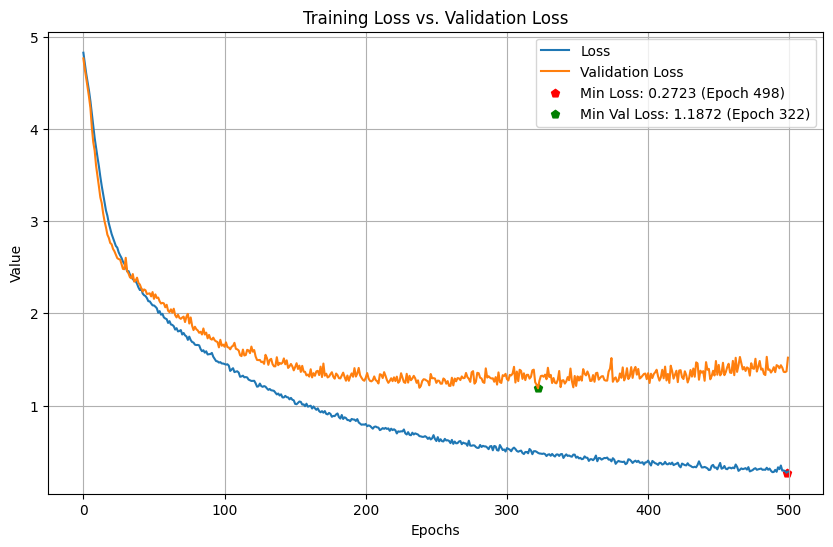

In [128]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

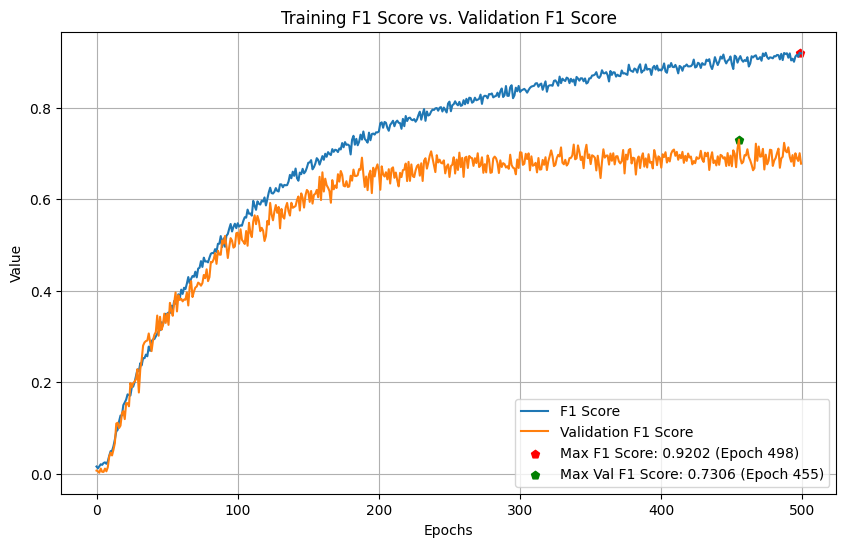

In [129]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [130]:
reconstructed_model = tf.keras.models.load_model("2 1DCNN + 1 LSTM Trial 715")

In [131]:
reconstructed_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 125, 150)          359250    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 12, 150)          0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 10, 150)           67650     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 10, 150)          0         
 1D)                                                             
                                                                 
 dropout (Dropout)           (None, 10, 150)           0         
                                                                 
 lstm (LSTM)                 (None, 75)                6

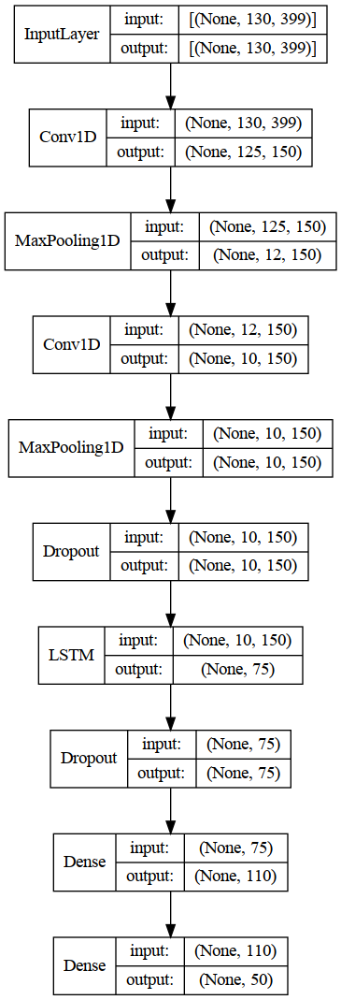

In [132]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

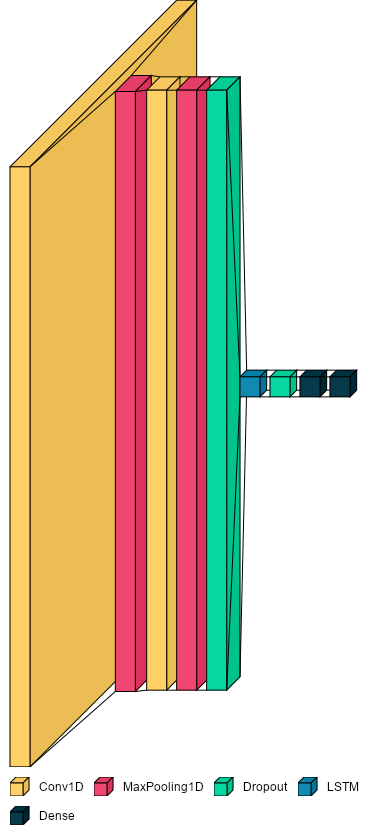

In [133]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [134]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 11ms/step - loss: 1.3636 - f1_score: 0.7306


[1.363629698753357, 0.7305694818496704]

In [135]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 13ms/step - loss: 0.0999 - f1_score: 0.9849


[0.09994740784168243, 0.9849286675453186]

In [136]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 9ms/step
              precision    recall  f1-score   support

         AXE      0.889     1.000     0.941         8
    BACKPACK      0.750     1.000     0.857         6
  BASKETBALL      0.714     1.000     0.833        10
         BEE      0.625     0.500     0.556        10
        BELT      0.800     1.000     0.889         4
        BITE      1.000     0.625     0.769         8
   BREAKFAST      0.500     0.500     0.500         6
      CANCER      1.000     0.750     0.857         8
   CHRISTMAS      1.000     1.000     1.000         6
    CONFUSED      0.667     1.000     0.800         6
        DARK      0.667     1.000     0.800         4
        DEAF      0.500     0.333     0.400         6
      DECIDE      0.800     0.667     0.727         6
      DEMAND      1.000     0.750     0.857         8
     DEVELOP      0.500     1.000     0.667         6
      DINNER      1.000     0.875     0.933         8
         DOG      0.667     

In [142]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='2 1DCNN + 1 LSTM Trial 715 Mish/',
    monitor='val_f1_score',
    mode='max',
    save_best_only=True)

In [143]:
act_function = mish
model = Sequential()
model.add(Conv1D(filters=150,kernel_size=5,activation=act_function,input_shape=(130,126)))
model.add(MaxPooling1D(pool_size=3))
model.add(Conv1D(filters=100,kernel_size=4,activation=act_function))
model.add(MaxPooling1D(pool_size=3))
model.add(Dropout(.45))
model.add(GRU(units=150,return_sequences=False,kernel_regularizer=regularizers.l2(.00042286793942433336)))
model.add(Dropout(.8))
model.add(Dense(units=80,activation=act_function))
model.add(Dense(50, activation='softmax'))

model.compile(tf.optimizers.experimental.Nadam(.0019929796667454143),
            loss='categorical_crossentropy',
            metrics=[tfa.metrics.F1Score(num_classes=50, average='macro')])
model.summary()
History = model.fit(x=Xtrain, y=Ytrain,validation_data= (Xval,Yval), batch_size=96,epochs=500, verbose=1,callbacks=[model_checkpoint_callback])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 16s 393ms/step - loss: 3.9667 - f1_score: 0.0172 - val_loss: 3.8607 - val_f1_score: 0.0141
Epoch 2/500
27/28 [===========================>..] - ETA: 0s - loss: 3.7361 - f1_score: 0.0426

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 302ms/step - loss: 3.7312 - f1_score: 0.0433 - val_loss: 3.3516 - val_f1_score: 0.0401
Epoch 3/500
27/28 [===========================>..] - ETA: 0s - loss: 3.3184 - f1_score: 0.0804

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 316ms/step - loss: 3.3134 - f1_score: 0.0802 - val_loss: 2.9673 - val_f1_score: 0.1203
Epoch 4/500
27/28 [===========================>..] - ETA: 0s - loss: 2.9599 - f1_score: 0.1299

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 287ms/step - loss: 2.9603 - f1_score: 0.1299 - val_loss: 2.5864 - val_f1_score: 0.1928
Epoch 5/500
27/28 [===========================>..] - ETA: 0s - loss: 2.6673 - f1_score: 0.1869

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 353ms/step - loss: 2.6639 - f1_score: 0.1888 - val_loss: 2.4057 - val_f1_score: 0.2342
Epoch 6/500
28/28 [==============================] - 1s 38ms/step - loss: 2.4485 - f1_score: 0.2398 - val_loss: 2.4523 - val_f1_score: 0.2228
Epoch 7/500
27/28 [===========================>..] - ETA: 0s - loss: 2.2810 - f1_score: 0.2762

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 365ms/step - loss: 2.2877 - f1_score: 0.2757 - val_loss: 2.1469 - val_f1_score: 0.3372
Epoch 8/500
27/28 [===========================>..] - ETA: 0s - loss: 2.1416 - f1_score: 0.3087

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 278ms/step - loss: 2.1425 - f1_score: 0.3100 - val_loss: 2.0119 - val_f1_score: 0.3734
Epoch 9/500
27/28 [===========================>..] - ETA: 0s - loss: 2.0281 - f1_score: 0.3592

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 2.0177 - f1_score: 0.3637 - val_loss: 1.8961 - val_f1_score: 0.4063
Epoch 10/500
27/28 [===========================>..] - ETA: 0s - loss: 1.9076 - f1_score: 0.3781

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 299ms/step - loss: 1.9047 - f1_score: 0.3801 - val_loss: 1.8452 - val_f1_score: 0.4213
Epoch 11/500
27/28 [===========================>..] - ETA: 0s - loss: 1.7888 - f1_score: 0.4269

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 296ms/step - loss: 1.7919 - f1_score: 0.4251 - val_loss: 1.7583 - val_f1_score: 0.4348
Epoch 12/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6956 - f1_score: 0.4384

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 306ms/step - loss: 1.6909 - f1_score: 0.4396 - val_loss: 1.7644 - val_f1_score: 0.4443
Epoch 13/500
27/28 [===========================>..] - ETA: 0s - loss: 1.6276 - f1_score: 0.4761

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.6308 - f1_score: 0.4757 - val_loss: 1.8618 - val_f1_score: 0.4454
Epoch 14/500
27/28 [===========================>..] - ETA: 0s - loss: 1.5693 - f1_score: 0.4970

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 305ms/step - loss: 1.5655 - f1_score: 0.4973 - val_loss: 1.6262 - val_f1_score: 0.5272
Epoch 15/500
27/28 [===========================>..] - ETA: 0s - loss: 1.4783 - f1_score: 0.5471

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 1.4755 - f1_score: 0.5462 - val_loss: 1.5496 - val_f1_score: 0.5610
Epoch 16/500
28/28 [==============================] - 1s 38ms/step - loss: 1.4444 - f1_score: 0.5465 - val_loss: 1.4769 - val_f1_score: 0.5580
Epoch 17/500
27/28 [===========================>..] - ETA: 0s - loss: 1.3217 - f1_score: 0.5702

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 304ms/step - loss: 1.3279 - f1_score: 0.5694 - val_loss: 1.5161 - val_f1_score: 0.5745
Epoch 18/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2945 - f1_score: 0.5831

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 310ms/step - loss: 1.2985 - f1_score: 0.5821 - val_loss: 1.5370 - val_f1_score: 0.6069
Epoch 19/500
28/28 [==============================] - 1s 38ms/step - loss: 1.2852 - f1_score: 0.5878 - val_loss: 1.4281 - val_f1_score: 0.6045
Epoch 20/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2173 - f1_score: 0.6180

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 283ms/step - loss: 1.2179 - f1_score: 0.6184 - val_loss: 1.3851 - val_f1_score: 0.6276
Epoch 21/500
27/28 [===========================>..] - ETA: 0s - loss: 1.2130 - f1_score: 0.6124

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 282ms/step - loss: 1.2190 - f1_score: 0.6137 - val_loss: 1.2672 - val_f1_score: 0.6686
Epoch 22/500
28/28 [==============================] - 1s 38ms/step - loss: 1.1470 - f1_score: 0.6439 - val_loss: 1.3689 - val_f1_score: 0.6425
Epoch 23/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0645 - f1_score: 0.6726 - val_loss: 1.4077 - val_f1_score: 0.6420
Epoch 24/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0290 - f1_score: 0.6716 - val_loss: 1.4038 - val_f1_score: 0.6378
Epoch 25/500
27/28 [===========================>..] - ETA: 0s - loss: 1.0354 - f1_score: 0.6777

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 330ms/step - loss: 1.0409 - f1_score: 0.6763 - val_loss: 1.3490 - val_f1_score: 0.7047
Epoch 26/500
28/28 [==============================] - 1s 38ms/step - loss: 1.0103 - f1_score: 0.6855 - val_loss: 1.3758 - val_f1_score: 0.6790
Epoch 27/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9848 - f1_score: 0.6917 - val_loss: 1.4690 - val_f1_score: 0.6577
Epoch 28/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9359 - f1_score: 0.7218 - val_loss: 1.2835 - val_f1_score: 0.6766
Epoch 29/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8999 - f1_score: 0.7260 - val_loss: 1.2871 - val_f1_score: 0.6809
Epoch 30/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8965 - f1_score: 0.7249 - val_loss: 1.2039 - val_f1_score: 0.6934
Epoch 31/500
28/28 [==============================] - 1s 38ms/step - loss: 0.9033 - f1_score: 0.7138 - val_loss: 1.4615 - val_f1_score: 0.6660
Epoch 32/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 284ms/step - loss: 0.8174 - f1_score: 0.7546 - val_loss: 1.2110 - val_f1_score: 0.7237
Epoch 35/500
28/28 [==============================] - 1s 38ms/step - loss: 0.8303 - f1_score: 0.7514 - val_loss: 1.2921 - val_f1_score: 0.7181
Epoch 36/500
28/28 [==============================] - 1s 40ms/step - loss: 0.8294 - f1_score: 0.7597 - val_loss: 1.2224 - val_f1_score: 0.7006
Epoch 37/500
27/28 [===========================>..] - ETA: 0s - loss: 0.8137 - f1_score: 0.7575

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 315ms/step - loss: 0.8050 - f1_score: 0.7603 - val_loss: 1.2252 - val_f1_score: 0.7297
Epoch 38/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7157 - f1_score: 0.7861 - val_loss: 1.3177 - val_f1_score: 0.6965
Epoch 39/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7033 - f1_score: 0.7997 - val_loss: 1.2801 - val_f1_score: 0.6963
Epoch 40/500
28/28 [==============================] - 1s 38ms/step - loss: 0.7124 - f1_score: 0.7809 - val_loss: 1.2912 - val_f1_score: 0.7022
Epoch 41/500
27/28 [===========================>..] - ETA: 0s - loss: 0.7062 - f1_score: 0.7906

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 290ms/step - loss: 0.7047 - f1_score: 0.7913 - val_loss: 1.2573 - val_f1_score: 0.7314
Epoch 42/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6807 - f1_score: 0.7985 - val_loss: 1.3909 - val_f1_score: 0.6925
Epoch 43/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6624 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 314ms/step - loss: 0.6617 - f1_score: 0.8074 - val_loss: 1.3076 - val_f1_score: 0.7417
Epoch 44/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6426 - f1_score: 0.8186 - val_loss: 1.2638 - val_f1_score: 0.7152
Epoch 45/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6595 - f1_score: 0.8067

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 320ms/step - loss: 0.6617 - f1_score: 0.8073 - val_loss: 1.1966 - val_f1_score: 0.7534
Epoch 46/500
28/28 [==============================] - 1s 38ms/step - loss: 0.6622 - f1_score: 0.8199 - val_loss: 1.3031 - val_f1_score: 0.7242
Epoch 47/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6536 - f1_score: 0.8083

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 303ms/step - loss: 0.6538 - f1_score: 0.8080 - val_loss: 1.2127 - val_f1_score: 0.7642
Epoch 48/500
27/28 [===========================>..] - ETA: 0s - loss: 0.6251 - f1_score: 0.8191

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 340ms/step - loss: 0.6254 - f1_score: 0.8205 - val_loss: 1.1647 - val_f1_score: 0.7687
Epoch 49/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5900 - f1_score: 0.8253 - val_loss: 1.1282 - val_f1_score: 0.7619
Epoch 50/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5942 - f1_score: 0.8320 - val_loss: 1.3222 - val_f1_score: 0.7546
Epoch 51/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5728 - f1_score: 0.8395 - val_loss: 1.2784 - val_f1_score: 0.7537
Epoch 52/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5521 - f1_score: 0.8477 - val_loss: 1.2723 - val_f1_score: 0.7475
Epoch 53/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5369 - f1_score: 0.8532 - val_loss: 1.4468 - val_f1_score: 0.7328
Epoch 54/500
28/28 [==============================] - 1s 40ms/step - loss: 0.5949 - f1_score: 0.8333 - val_loss: 1.5265 - val_f1_score: 0.7164
Epoch 55/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 307ms/step - loss: 0.5069 - f1_score: 0.8696 - val_loss: 1.2423 - val_f1_score: 0.7856
Epoch 63/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4884 - f1_score: 0.8732 - val_loss: 1.3165 - val_f1_score: 0.7761
Epoch 64/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4702 - f1_score: 0.8757 - val_loss: 1.4028 - val_f1_score: 0.7699
Epoch 65/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5113 - f1_score: 0.8732 - val_loss: 1.2855 - val_f1_score: 0.7503
Epoch 66/500
28/28 [==============================] - 1s 38ms/step - loss: 0.5086 - f1_score: 0.8696 - val_loss: 1.3848 - val_f1_score: 0.7590
Epoch 67/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4775 - f1_score: 0.8754 - val_loss: 1.3450 - val_f1_score: 0.7756
Epoch 68/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4754 - f1_score: 0.8743 - val_loss: 1.3393 - val_f1_score: 0.7716
Epoch 69/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 277ms/step - loss: 0.4828 - f1_score: 0.8730 - val_loss: 1.2616 - val_f1_score: 0.7975
Epoch 71/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4476 - f1_score: 0.8826 - val_loss: 1.3496 - val_f1_score: 0.7769
Epoch 72/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4624 - f1_score: 0.8811 - val_loss: 1.4625 - val_f1_score: 0.7400
Epoch 73/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4539 - f1_score: 0.8810 - val_loss: 1.4245 - val_f1_score: 0.7796
Epoch 74/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3916 - f1_score: 0.8947 - val_loss: 1.4351 - val_f1_score: 0.7735
Epoch 75/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4319 - f1_score: 0.8911

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 354ms/step - loss: 0.4295 - f1_score: 0.8918 - val_loss: 1.2109 - val_f1_score: 0.8030
Epoch 76/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4448 - f1_score: 0.8869 - val_loss: 1.3074 - val_f1_score: 0.7850
Epoch 77/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4289 - f1_score: 0.8902 - val_loss: 1.2743 - val_f1_score: 0.7701
Epoch 78/500
28/28 [==============================] - 1s 40ms/step - loss: 0.4196 - f1_score: 0.8935 - val_loss: 1.4083 - val_f1_score: 0.7783
Epoch 79/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4741 - f1_score: 0.8807 - val_loss: 1.3937 - val_f1_score: 0.7936
Epoch 80/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4693 - f1_score: 0.8827 - val_loss: 1.3758 - val_f1_score: 0.7986
Epoch 81/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4861 - f1_score: 0.8691 - val_loss: 1.3154 - val_f1_score: 0.7725
Epoch 82/5

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 292ms/step - loss: 0.4051 - f1_score: 0.9021 - val_loss: 1.2125 - val_f1_score: 0.8054
Epoch 85/500
27/28 [===========================>..] - ETA: 0s - loss: 0.4367 - f1_score: 0.8896

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.4366 - f1_score: 0.8888 - val_loss: 1.2861 - val_f1_score: 0.8080
Epoch 86/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4541 - f1_score: 0.8931 - val_loss: 1.4048 - val_f1_score: 0.7896
Epoch 87/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4424 - f1_score: 0.8865 - val_loss: 1.2911 - val_f1_score: 0.7939
Epoch 88/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4577 - f1_score: 0.8921 - val_loss: 1.4341 - val_f1_score: 0.7795
Epoch 89/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4323 - f1_score: 0.8912 - val_loss: 1.4458 - val_f1_score: 0.7512
Epoch 90/500
28/28 [==============================] - 1s 38ms/step - loss: 0.3862 - f1_score: 0.9046 - val_loss: 1.4521 - val_f1_score: 0.7835
Epoch 91/500
28/28 [==============================] - 1s 38ms/step - loss: 0.4301 - f1_score: 0.8951 - val_loss: 1.3661 - val_f1_score: 0.7832
Epoch 92/50

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.4018 - f1_score: 0.9080 - val_loss: 1.4065 - val_f1_score: 0.8127
Epoch 111/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3813 - f1_score: 0.9143 - val_loss: 1.4458 - val_f1_score: 0.7976
Epoch 112/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3979 - f1_score: 0.9090 - val_loss: 1.5291 - val_f1_score: 0.7805
Epoch 113/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3954 - f1_score: 0.9087 - val_loss: 1.4778 - val_f1_score: 0.7706
Epoch 114/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3852 - f1_score: 0.9093 - val_loss: 1.5232 - val_f1_score: 0.7886
Epoch 115/500
28/28 [==============================] - 1s 39ms/step - loss: 0.4268 - f1_score: 0.8951 - val_loss: 1.3973 - val_f1_score: 0.8067
Epoch 116/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3486 - f1_score: 0.9218 - val_loss: 1.2990 - val_f1_score: 0.8106
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.3205 - f1_score: 0.9379 - val_loss: 1.2689 - val_f1_score: 0.8406
Epoch 144/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3410 - f1_score: 0.9286 - val_loss: 1.4219 - val_f1_score: 0.7808
Epoch 145/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3155 - f1_score: 0.9325 - val_loss: 1.3326 - val_f1_score: 0.7909
Epoch 146/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2974 - f1_score: 0.9390 - val_loss: 1.3369 - val_f1_score: 0.8048
Epoch 147/500
28/28 [==============================] - 1s 42ms/step - loss: 0.3200 - f1_score: 0.9370 - val_loss: 1.3570 - val_f1_score: 0.8323
Epoch 148/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3099 - f1_score: 0.9325 - val_loss: 1.3147 - val_f1_score: 0.7869
Epoch 149/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3270 - f1_score: 0.9264 - val_loss: 1.2507 - val_f1_score: 0.8189
Epoch

Epoch 200/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3563 - f1_score: 0.9280 - val_loss: 1.3826 - val_f1_score: 0.8211
Epoch 201/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3084 - f1_score: 0.9374 - val_loss: 1.4495 - val_f1_score: 0.8218
Epoch 202/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3116 - f1_score: 0.9363 - val_loss: 1.4158 - val_f1_score: 0.8383
Epoch 203/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2682 - f1_score: 0.9444 - val_loss: 1.3949 - val_f1_score: 0.8230
Epoch 204/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2683 - f1_score: 0.9547 - val_loss: 1.4956 - val_f1_score: 0.8132
Epoch 205/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2790 - f1_score: 0.9456 - val_loss: 1.5248 - val_f1_score: 0.8048
Epoch 206/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3191 - f1_score: 0.9363 - val_loss: 1.5763 - val_f1_score:

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 376ms/step - loss: 0.2881 - f1_score: 0.9446 - val_loss: 1.3258 - val_f1_score: 0.8420
Epoch 210/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3227 - f1_score: 0.9377 - val_loss: 1.2618 - val_f1_score: 0.8348
Epoch 211/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2755 - f1_score: 0.9459 - val_loss: 1.3257 - val_f1_score: 0.8113
Epoch 212/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3465 - f1_score: 0.9330 - val_loss: 1.3949 - val_f1_score: 0.8084
Epoch 213/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2943 - f1_score: 0.9399 - val_loss: 1.3821 - val_f1_score: 0.8172
Epoch 214/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2737 - f1_score: 0.9496 - val_loss: 1.5960 - val_f1_score: 0.7923
Epoch 215/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2224 - f1_score: 0.9596 - val_loss: 1.4672 - val_f1_score: 0.8193
Epoc

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 355ms/step - loss: 0.2923 - f1_score: 0.9437 - val_loss: 1.2688 - val_f1_score: 0.8473
Epoch 246/500
27/28 [===========================>..] - ETA: 0s - loss: 0.2543 - f1_score: 0.9548

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 8s 308ms/step - loss: 0.2536 - f1_score: 0.9558 - val_loss: 1.4264 - val_f1_score: 0.8482
Epoch 247/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2807 - f1_score: 0.9457 - val_loss: 1.3389 - val_f1_score: 0.8365
Epoch 248/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2305 - f1_score: 0.9575 - val_loss: 1.5210 - val_f1_score: 0.8251
Epoch 249/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2848 - f1_score: 0.9559 - val_loss: 1.5312 - val_f1_score: 0.8237
Epoch 250/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2660 - f1_score: 0.9522 - val_loss: 1.4814 - val_f1_score: 0.8185
Epoch 251/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2575 - f1_score: 0.9507 - val_loss: 1.3259 - val_f1_score: 0.8290
Epoch 252/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2840 - f1_score: 0.9470 - val_loss: 1.4630 - val_f1_score: 0.8256
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3059 - f1_score: 0.9431 - val_loss: 1.2551 - val_f1_score: 0.8492
Epoch 301/500
28/28 [==============================] - ETA: 0s - loss: 0.3349 - f1_score: 0.9390

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 9s 335ms/step - loss: 0.3349 - f1_score: 0.9390 - val_loss: 1.2706 - val_f1_score: 0.8586
Epoch 302/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3181 - f1_score: 0.9368 - val_loss: 1.4708 - val_f1_score: 0.8246
Epoch 303/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2969 - f1_score: 0.9450 - val_loss: 1.4686 - val_f1_score: 0.7998
Epoch 304/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3777 - f1_score: 0.9248 - val_loss: 1.6342 - val_f1_score: 0.7976
Epoch 305/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3869 - f1_score: 0.9293 - val_loss: 1.6567 - val_f1_score: 0.8005
Epoch 306/500
28/28 [==============================] - 1s 45ms/step - loss: 0.3615 - f1_score: 0.9263 - val_loss: 1.3916 - val_f1_score: 0.8201
Epoch 307/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3177 - f1_score: 0.9431 - val_loss: 1.4371 - val_f1_score: 0.8344
Epoch

INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


INFO:tensorflow:Assets written to: 2 1DCNN + 1 GRU Trial 721 Mish/assets


28/28 [==============================] - 10s 357ms/step - loss: 0.2622 - f1_score: 0.9570 - val_loss: 1.2373 - val_f1_score: 0.8632
Epoch 315/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2744 - f1_score: 0.9498 - val_loss: 1.4353 - val_f1_score: 0.8167
Epoch 316/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2780 - f1_score: 0.9528 - val_loss: 1.4913 - val_f1_score: 0.8220
Epoch 317/500
28/28 [==============================] - 1s 39ms/step - loss: 0.3100 - f1_score: 0.9426 - val_loss: 1.4050 - val_f1_score: 0.8283
Epoch 318/500
28/28 [==============================] - 1s 39ms/step - loss: 0.2650 - f1_score: 0.9532 - val_loss: 1.3959 - val_f1_score: 0.8295
Epoch 319/500
28/28 [==============================] - 1s 40ms/step - loss: 0.2948 - f1_score: 0.9471 - val_loss: 1.4728 - val_f1_score: 0.8279
Epoch 320/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3391 - f1_score: 0.9381 - val_loss: 1.5978 - val_f1_score: 0.8159
Epoc

Epoch 371/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2947 - f1_score: 0.9486 - val_loss: 1.3573 - val_f1_score: 0.8327
Epoch 372/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2631 - f1_score: 0.9550 - val_loss: 1.3874 - val_f1_score: 0.8241
Epoch 373/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2653 - f1_score: 0.9546 - val_loss: 1.4747 - val_f1_score: 0.8049
Epoch 374/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2998 - f1_score: 0.9445 - val_loss: 1.4636 - val_f1_score: 0.8000
Epoch 375/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3190 - f1_score: 0.9401 - val_loss: 1.5476 - val_f1_score: 0.7866
Epoch 376/500
28/28 [==============================] - 1s 40ms/step - loss: 0.3405 - f1_score: 0.9382 - val_loss: 1.7437 - val_f1_score: 0.7589
Epoch 377/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3574 - f1_score: 0.9263 - val_loss: 1.4167 - val_f1_score:

Epoch 428/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2774 - f1_score: 0.9540 - val_loss: 1.2858 - val_f1_score: 0.8339
Epoch 429/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2484 - f1_score: 0.9658 - val_loss: 1.3933 - val_f1_score: 0.8291
Epoch 430/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3124 - f1_score: 0.9406 - val_loss: 1.5266 - val_f1_score: 0.8076
Epoch 431/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3084 - f1_score: 0.9451 - val_loss: 1.5568 - val_f1_score: 0.8254
Epoch 432/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4646 - f1_score: 0.9133 - val_loss: 1.6142 - val_f1_score: 0.7936
Epoch 433/500
28/28 [==============================] - 1s 41ms/step - loss: 0.4199 - f1_score: 0.9187 - val_loss: 1.3645 - val_f1_score: 0.8327
Epoch 434/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3242 - f1_score: 0.9336 - val_loss: 1.4465 - val_f1_score:

Epoch 485/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2809 - f1_score: 0.9546 - val_loss: 1.4180 - val_f1_score: 0.8297
Epoch 486/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2660 - f1_score: 0.9578 - val_loss: 1.3024 - val_f1_score: 0.8478
Epoch 487/500
28/28 [==============================] - 1s 42ms/step - loss: 0.2623 - f1_score: 0.9616 - val_loss: 1.4289 - val_f1_score: 0.8112
Epoch 488/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2784 - f1_score: 0.9506 - val_loss: 1.3807 - val_f1_score: 0.8359
Epoch 489/500
28/28 [==============================] - 1s 43ms/step - loss: 0.2505 - f1_score: 0.9616 - val_loss: 1.3522 - val_f1_score: 0.8230
Epoch 490/500
28/28 [==============================] - 1s 41ms/step - loss: 0.2932 - f1_score: 0.9511 - val_loss: 1.4428 - val_f1_score: 0.8001
Epoch 491/500
28/28 [==============================] - 1s 41ms/step - loss: 0.3413 - f1_score: 0.9392 - val_loss: 1.4841 - val_f1_score:

In [144]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(History.history) 

# or save to csv: 
hist_csv_file = '2 1DCNN + 1 LSTM Trial 715 Mish/history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [189]:
hist_df = pd.read_csv('2 1DCNN + 1 LSTM Trial 715 Mish/history.csv',index_col=0)
hist_df.tail()

,loss,f1_score,val_loss,val_f1_score
495,0.292308,0.950895,1.380354,0.842725
496,0.255275,0.959189,1.380063,0.829194
497,0.282479,0.953392,1.341682,0.829057
498,0.325660,0.946974,1.480074,0.813747
499,0.343594,0.937179,1.455086,0.817053


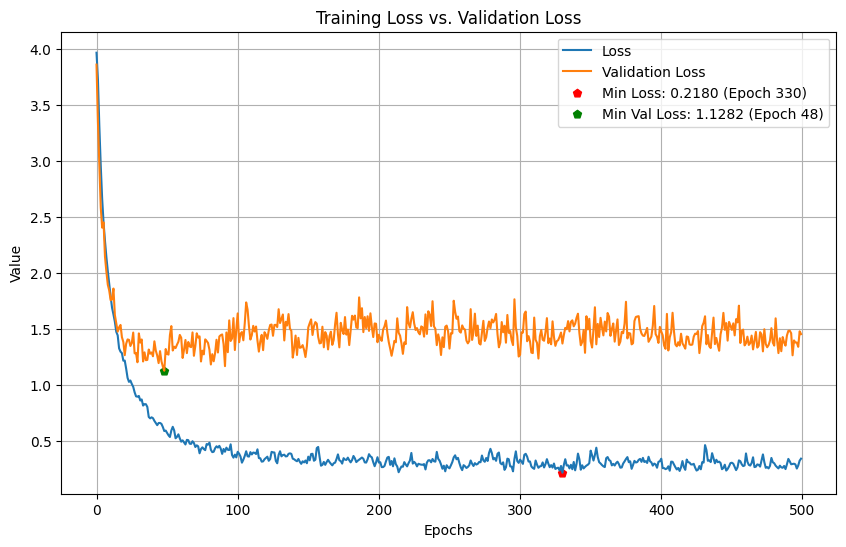

In [190]:
# Find the epoch with the lowest loss and validation loss
min_loss_epoch = hist_df['loss'].idxmin()
min_val_loss_epoch = hist_df['val_loss'].idxmin()

min_loss = hist_df['loss'][min_loss_epoch]
min_val_loss = hist_df['val_loss'][min_val_loss_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, label='Loss')
plt.plot(epochs, hist_df.val_loss, label='Validation Loss')
plt.scatter(min_loss_epoch, min_loss, c='red', marker='p', label=f'Min Loss: {min_loss:.4f} (Epoch {min_loss_epoch})')
plt.scatter(min_val_loss_epoch, min_val_loss, c='green', marker='p', label=f'Min Val Loss: {min_val_loss:.4f} (Epoch {min_val_loss_epoch})')

plt.title('Training Loss vs. Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

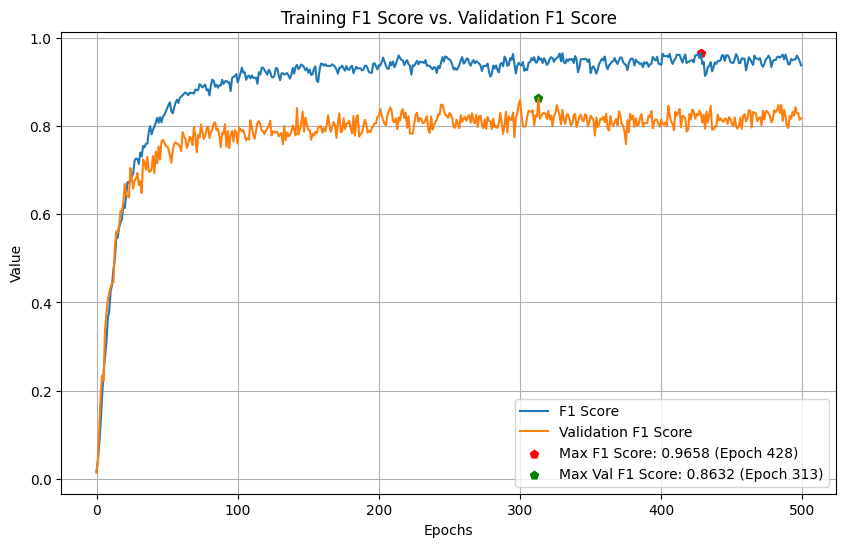

In [191]:
# Find the epoch with the highest F1 Score and Validation F1 Score
max_f1_epoch = hist_df['f1_score'].idxmax()
max_val_f1_epoch = hist_df['val_f1_score'].idxmax()

max_f1 = hist_df['f1_score'][max_f1_epoch]
max_val_f1 = hist_df['val_f1_score'][max_val_f1_epoch]

# Plotting
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.f1_score, label='F1 Score')
plt.plot(epochs, hist_df.val_f1_score, label='Validation F1 Score')
plt.scatter(max_f1_epoch, max_f1, c='red', marker='p', label=f'Max F1 Score: {max_f1:.4f} (Epoch {max_f1_epoch})')
plt.scatter(max_val_f1_epoch, max_val_f1, c='green', marker='p', label=f'Max Val F1 Score: {max_val_f1:.4f} (Epoch {max_val_f1_epoch})')

plt.title('Training F1 Score vs. Validation F1 Score')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


In [147]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.714     0.833     0.769         6
  BASKETBALL      0.909     1.000     0.952        10
         BEE      1.000     0.700     0.824        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.462     1.000     0.632         6
      CANCER      0.727     1.000     0.842         8
   CHRISTMAS      1.000     0.833     0.909         6
    CONFUSED      0.857     1.000     0.923         6
        DARK      1.000     1.000     1.000         4
        DEAF      0.857     1.000     0.923         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.857     0.750     0.800         8
     DEVELOP      0.571     0.667     0.615         6
      DINNER      1.000     0.875     0.933         8
         DOG      0.667     

In [155]:
reconstructed_model = tf.keras.models.load_model("2 1DCNN + 1 LSTM Trial 715 Mish")

In [149]:
reconstructed_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 126, 150)          94650     
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 42, 150)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 39, 100)           60100     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 13, 100)          0         
 1D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 13, 100)           0         
                                                                 
 gru_2 (GRU)                 (None, 150)              

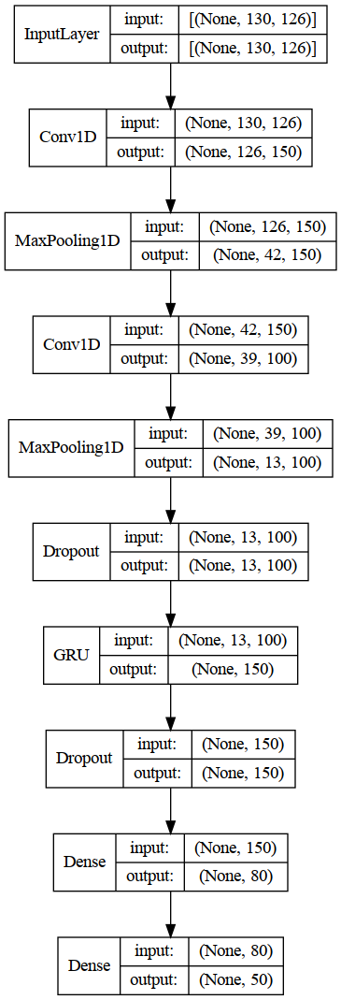

In [150]:
plot_model(reconstructed_model, show_shapes=True, show_layer_names=False)

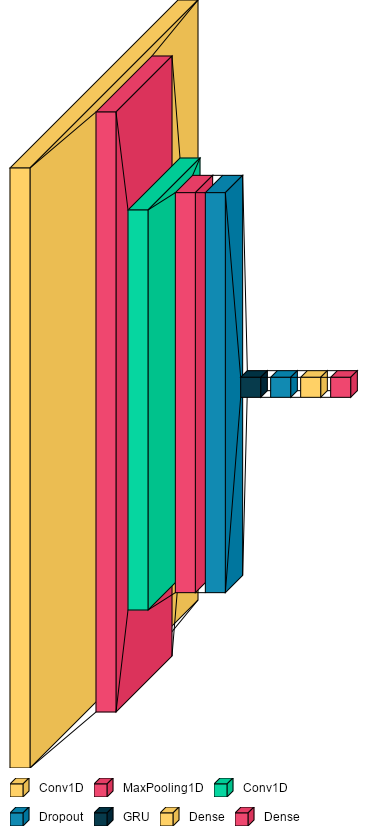

In [156]:
font = ImageFont.truetype("arial.ttf", 12) 
visualkeras.layered_view(reconstructed_model, legend=True, font=font) 

In [151]:
reconstructed_model.evaluate(Xval,Yval)

11/11 [==============================] - 1s 7ms/step - loss: 1.2373 - f1_score: 0.8632


[1.2372610569000244, 0.8632017374038696]

In [153]:
reconstructed_model.evaluate(Xtrain,Ytrain)

84/84 [==============================] - 1s 8ms/step - loss: 0.1030 - f1_score: 1.0000


[0.10299792885780334, 1.0]

In [154]:
print(classification_report(np.argmax(Yval, axis=1), np.argmax(reconstructed_model.predict(Xval), axis=1),
                            digits=3, target_names=label_map))

11/11 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

         AXE      1.000     0.750     0.857         8
    BACKPACK      0.800     0.667     0.727         6
  BASKETBALL      1.000     1.000     1.000        10
         BEE      1.000     1.000     1.000        10
        BELT      1.000     1.000     1.000         4
        BITE      0.800     1.000     0.889         8
   BREAKFAST      0.667     1.000     0.800         6
      CANCER      0.889     1.000     0.941         8
   CHRISTMAS      0.857     1.000     0.923         6
    CONFUSED      1.000     1.000     1.000         6
        DARK      1.000     1.000     1.000         4
        DEAF      1.000     0.833     0.909         6
      DECIDE      1.000     1.000     1.000         6
      DEMAND      0.714     0.625     0.667         8
     DEVELOP      0.600     1.000     0.750         6
      DINNER      1.000     0.750     0.857         8
         DOG      1.000     

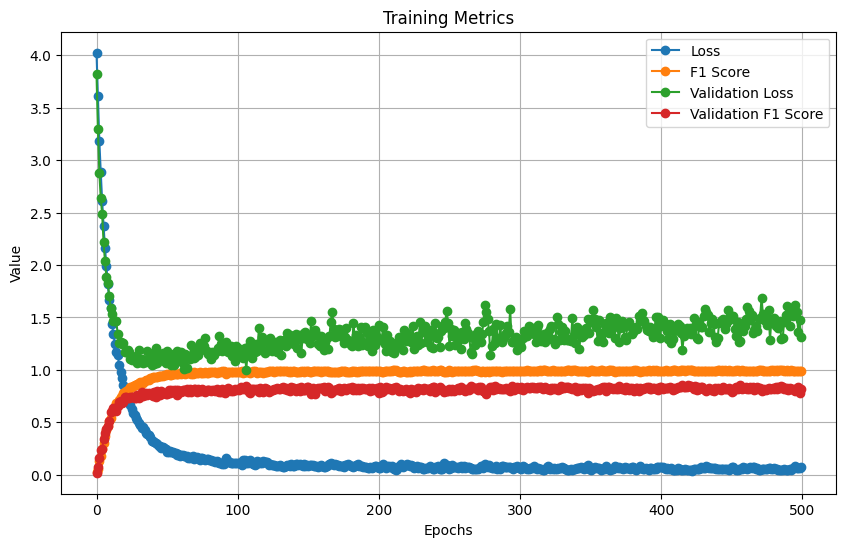

In [249]:
# Plotting
import matplotlib.pyplot as plt
epochs = range(0, 500)
plt.figure(figsize=(10, 6))
plt.plot(epochs, hist_df.loss, marker='o', label='Loss')
plt.plot(epochs, hist_df.f1_score, marker='o', label='F1 Score')
plt.plot(epochs, hist_df.val_loss, marker='o', label='Validation Loss')
plt.plot(epochs, hist_df.val_f1_score, marker='o', label='Validation F1 Score')
plt.title('Training Metrics')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()

# Realtime Implementation

In [159]:
#path = valdf.Path[40]
#print(path)
#path = '/home/kristian/ASL_Citizen/videos/9161417844146778-WHAT FOR.mp4'
#path = '/home/kristian/WLASL/videos_organized/christmas/10715.mp4'
path = 0
cap = cv2.VideoCapture(path)
#cap = cv2.VideoCapture(0)
#print(frames_from_file(path))
print(path)
sequence = [np.zeros(126)] * 130  # Initialize with 130 zero-filled sequences
predictions = ['None']
threshold = 0.8
i = 0
width= int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height= int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

writer= cv2.VideoWriter('test.avi', cv2.VideoWriter_fourcc(*'XVID'), 30, (width,height))

with mp_holistic.Holistic(static_image_mode=False,
                          model_complexity=0) as holistic:
    while True:
        ret, frame = cap.read()
        if ret == False:
            break
        fps = cap.get(cv2.CAP_PROP_FPS)
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = holistic.process(frame_rgb)
        # Left hand
        mp_drawing.draw_landmarks(
            frame, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS,
            mp_drawing.DrawingSpec(color=(0, 0, 0),
                                   thickness=2,
                                   circle_radius=1),
            mp_drawing.DrawingSpec(color=(0, 92, 230), thickness=2))

        # Right Hand
        mp_drawing.draw_landmarks(
            frame, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS,
            mp_drawing.DrawingSpec(color=(0, 0, 0),
                                   thickness=2,
                                   circle_radius=1),
            mp_drawing.DrawingSpec(color=(0, 92, 230), thickness=2))
                # 2. Prediction logic
            
            # Open the video file
        # Initialize an empty list to store the keypoints for each frame
        sequence = np.array(sequence)
        sequence = sequence.reshape(1, -1)
        sequence = scaler.inverse_transform(sequence).reshape(130, 126)
        sequence = sequence.tolist()
        sequence.append(extract_keypoints(results))
        sequence.pop(0)  # Remove the oldest element
        sequence = np.array(sequence)
        sequence = sequence.reshape(1, -1)
        sequence=scaler.transform(sequence).reshape(130, 126)
        sequence = sequence.tolist()
        i = i+1
        if i==5:
            i = 0
            res = best_model.predict(np.expand_dims(sequence, axis=0))[0]
            if res[np.argmax(res)] > threshold:
                print(inv_label_map[np.argmax(res)])
                predictions.append(inv_label_map[np.argmax(res)])
#        frame = cv2.flip(frame, 1)
        frame = cv2.putText(frame,'Last Prediction:'+ predictions[-1],(10,30),cv2.FONT_HERSHEY_SIMPLEX,1.0,(0, 255, 0), 2)
#        writer.write(frame)
        cv2.imshow("Frame", frame)
        if cv2.waitKey(1) & 0xFF == 27:
            break
cap.release()
cv2.destroyAllWindows()

0
1/1 [==============================] - 0s 22ms/step
AXE
1/1 [==============================] - 0s 22ms/step
AXE
1/1 [==============================] - 0s 22ms/step
AXE
1/1 [==============================] - 0s 23ms/step
AXE
1/1 [==============================] - 0s 28ms/step
AXE
1/1 [==============================] - 0s 27ms/step
AXE
1/1 [==============================] - 0s 21ms/step
AXE
1/1 [==============================] - 0s 25ms/step
AXE
1/1 [==============================] - 0s 21ms/step
AXE
1/1 [==============================] - 0s 24ms/step
AXE
1/1 [==============================] - 0s 23ms/step
AXE
1/1 [==============================] - 0s 27ms/step
AXE
1/1 [==============================] - 0s 22ms/step
AXE
1/1 [==============================] - 0s 23ms/step
AXE
1/1 [==============================] - 0s 24ms/step
AXE
1/1 [==============================] - 0s 26ms/step
AXE
1/1 [==============================] - 0s 28ms/step
AXE
1/1 [==============================] - 0s 22ms

In [149]:
cap.release()
cv2.destroyAllWindows()

In [81]:
#sequence = np.array(sequence)
sequence = sequence.reshape(1, -1)
sequence.shape
sequence=scaler.transform(sequence).reshape(130, 126)

ValueError: Input X contains infinity or a value too large for dtype('float64').

In [82]:
sequence

array([[-1.17129192e+049, -3.04913669e+046,  1.22797842e+299, ...,
         0.00000000e+000,  0.00000000e+000,  0.00000000e+000]])

In [162]:
predictions

[13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13]